<a href="https://colab.research.google.com/github/lucas-porto/sprint_2_mvp/blob/master/Projeto_MVP_Sprint_II_Lucas_Porto_Parte_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# MVP - Sprint II


##  Deep Learning para um problema de visão computacional ou processamento de linguagem natural

### **Definição do Problema**

***Objetivo***: *entender e descrever claramente o problema que está sendo resolvido.*


*   Qual é a descrição do problema?
*   Você tem premissas ou hipóteses sobre o problema? Quais
*   Que restrições ou condições foram impostas para selecionar os dados?
*   Descreva o seu dataset (atributos, imagens, anotações, etc).



### **Preparação de Dados**

***Objetivo***: *realizar operações de preparação dos dados.*

*   Separe o dataset entre treino e teste (e validação, se aplicável).
*   Faz sentido utilizar um método de validação cruzada? Justifique se não utilizar.
*   Verifique quais operações de transformação de dados (como normalização e padronização, transformação de imagens em tensores) são mais apropriadas para o seu problema e salve visões diferentes do seu dataset para posterior avaliação dos modelos.
* Refine a quantidade de atributos disponíveis, realizando o processo de feature selection de forma adequada.


### **Modelagem e treinamento:**

***Objetivo***: *construir modelos para resolver o problema em questão.*

*   Selecione os algoritmos mais indicados para o problema e dataset escolhidos, justificando as suas escolhas.
*   Há algum ajuste inicial para os hiperparâmetros?
*   O modelo foi devidamente treinado? Foi observado problema de underfitting?
*   É possível otimizar os hiperparâmetros de algum dos modelos? Se sim, faça-o, justificando todas as escolhas.
*   Há algum método avançado ou mais complexo que possa ser avaliado?
*   Posso criar um comitê de modelos diferentes para o problema (ensembles)?

## **Avaliação de Resultados:**

***Objetivo***: *analisar o desempenho dos modelos gerados em dados não vistos (com a base de teste)*


*   Selecione as métricas de avaliação condizentes com o problema, justificando.
*   Treine o modelo escolhido com toda a base de treino, e teste-o com a base de teste.
*   Os resultados fazem sentido?
*   Foi observado algum problema de overfitting?
*   Compare os resultados de diferentes modelos.
*   Descreva a melhor solução encontrada, justificando.







### **Descrição do projeto**

*   Qual é a descrição do problema?
  *   O objetivo é se conseguimos baseado num dataset inicial e anotado, se podemos prever uma notícia seria falsa ou não. Estarei utilizando para este primeiro modelo o dataset disponível no [kaggle](https://www.kaggle.com/datasets/clmentbisaillon/fake-and-real-news-dataset?datasetId=572515&select=Fake.csv).

  The dataset contains two types of articles fake and real News. This dataset was collected from realworld sources; the truthful articles were obtained by crawling articles from Reuters.com (News
website). As for the fake news articles, they were collected from different sources. The fake news
articles were collected from unreliable websites that were flagged by Politifact (a fact-checking
organization in the USA) and Wikipedia. The dataset contains different types of articles on different
topics, however, the majority of articles focus on political and World news topics.
*   Você tem premissas ou hipóteses sobre o problema? Quais.
  *   Talvez tenham mais palavras presentes em notícias originais que nas fakes.
*   Que restrições ou condições foram impostas para selecionar os dados?
  *   Dados duplicados
*   Descreva o seu dataset (atributos, imagens, anotações, etc).

  O dataset possui dois tipos de artigos reais e fakes. Ele foi catalogado pela University of Victoria, onde temos neste [link](https://onlineacademiccommunity.uvic.ca/isot/wp-content/uploads/sites/7295/2023/02/ISOT_Fake_News_Dataset_ReadMe.pdf) a descrição da origem do dataset.

  * *title*: É o título da notícia.
  * *text*: É o título da notícia.
  * *subject*: É o contexto da notícia
  * *date*: É data da notícia.

### **Resumo do projeto**

- Na fase de tratamento, realizamos a retirada dos dados duplicados.
- Realizada a unificação das bases e criação da coluna target.
- Unificado texto da notícia e título e utilizado no estudo.
- Realizado tratamento nos dados retirando hiperlinks, pontuação, quebras de linha e stopwords em inglês e
- Separação de dados de treino 75% da base e teste 25% da base.
- Criada os tokens das palavras nos dados de treino e aplicado no teste.
- Realizado uma quebra nas sentenças para ter um limite de texto a ser analisado, a fim de reduzir o processamento e não ter textos grandes demais.
- Foram estudados dois modelos RNN e LSTM.
- Aplicamos nos modelos apenas os tokens na camada de embendding e outro onde inserimos a matriz criada com o word2vector
- Escolhido o modelo de LSTM com Word2Vector devido a sua acurácia ser bem alta e pouco erro.
- **Resultado final no teste foi acurácia de 99%**

Por ser um dataset de estudo, vimos que podemos chegar com modelos simples nesses bons resultados. Importante é verificar performance com outros embenddings e outros modelos para próximos estudos.

### **Imports**

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# Configuração para não exibir os warnings
import warnings
warnings.filterwarnings("ignore")

# Imports necessários
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import string
from sklearn.model_selection import train_test_split
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn import preprocessing, decomposition, model_selection, metrics
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score


from wordcloud import WordCloud, STOPWORDS

import tensorflow as tf

import keras
from keras.preprocessing import text
from keras.utils import pad_sequences
from keras.callbacks import EarlyStopping
from keras.models import Sequential
from keras.layers import LSTM, GRU,SimpleRNN, Embedding
from keras.layers.core import Dense, Activation, Dropout
from tensorflow.keras.layers import BatchNormalization
from keras.utils import np_utils
from keras.callbacks import ModelCheckpoint

from tqdm import tqdm
import pickle

from collections import defaultdict
import spacy
from gensim.models import Word2Vec

import logging
logging.basicConfig(format="%(levelname)s - %(asctime)s: %(message)s", datefmt= '%H:%M:%S', level=logging.INFO)

import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


### **Dataset**

In [ ]:
path_fake = 'https://raw.githubusercontent.com/lucas-porto/sprint_2_mvp/master/datasets/part_2/Fake.csv'
path_true = 'https://raw.githubusercontent.com/lucas-porto/sprint_2_mvp/master/datasets/part_2/True.csv'

fake_origin = pd.read_csv(path_fake)
data_fake = fake_origin.copy()

true_origin = pd.read_csv(path_true)
data_true = true_origin.copy()

In [ ]:
data_fake.head()

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"


In [ ]:
data_true.tail()

,title,text,subject,date
21412,'Fully committed' NATO backs new U.S. approach...,BRUSSELS (Reuters) - NATO allies on Tuesday we...,worldnews,"August 22, 2017"
21413,LexisNexis withdrew two products from Chinese ...,"LONDON (Reuters) - LexisNexis, a provider of l...",worldnews,"August 22, 2017"
21414,Minsk cultural hub becomes haven from authorities,MINSK (Reuters) - In the shadow of disused Sov...,worldnews,"August 22, 2017"
21415,Vatican upbeat on possibility of Pope Francis ...,MOSCOW (Reuters) - Vatican Secretary of State ...,worldnews,"August 22, 2017"
21416,Indonesia to buy $1.14 billion worth of Russia...,JAKARTA (Reuters) - Indonesia will buy 11 Sukh...,worldnews,"August 22, 2017"


### **Análise e tratamento**

In [ ]:
print('O dataset real possui o formato', data_true.shape)
print('O dataset fake possui o formato', data_fake.shape)

O dataset real possui o formato (21417, 4)
O dataset fake possui o formato (23481, 4)


In [ ]:
data_true.isnull().sum()

title      0
text       0
subject    0
date       0
dtype: int64

In [ ]:
data_fake.isnull().sum()

title      0
text       0
subject    0
date       0
dtype: int64

Vimos que não há dados nulos em ambos datasets.

Neste ponto iremos unificar ambos datasets para inicarmos tratamentos em um único dataset.

In [ ]:
data_true['target'] = 1
data_fake['target'] = 0
data = pd.concat([data_true, data_fake]).reset_index(drop = True)
data['original'] = data['title'] + ' ' + data['text']
data.head(2)

,title,text,subject,date,target,original
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",1,"As U.S. budget fight looms, Republicans flip t..."
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",1,U.S. military to accept transgender recruits o...


In [ ]:
print(f'Temos um total de {data.duplicated().sum()} dados duplicados do total de {data.shape[0]}.')

Temos um total de 209 dados duplicados do total de 44898.


In [ ]:
# irei deletar os dados duplicados
data.drop_duplicates(inplace=True)

In [ ]:
data.subject.unique()

array(['politicsNews', 'worldnews', 'News', 'politics', 'Government News',
       'left-news', 'US_News', 'Middle-east'], dtype=object)

Vamos tratar os dados de contexto da notícia a fim de agregar os dados.

In [ ]:
data.subject = data.subject.replace({'politics':'PoliticsNews','politicsNews':'PoliticsNews'})
data.drop(columns=['date'], inplace = True)

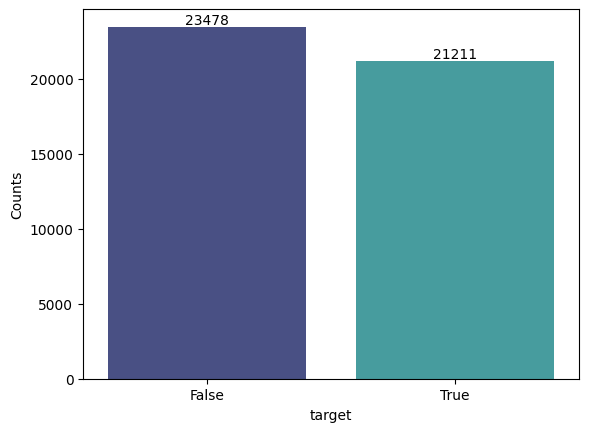

In [ ]:
data_contagem = data.groupby('target').apply(lambda x:x['title'].count()).reset_index(name='Counts')
data_contagem.target.replace({0:'False',1:'True'},inplace=True)


ax = sns.barplot(data_contagem, x="target", y="Counts",
             palette='mako')
for container in ax.containers:
    ax.bar_label(container)
plt.show()

sns.countplot(x = "subject", hue = "category" , data = df)

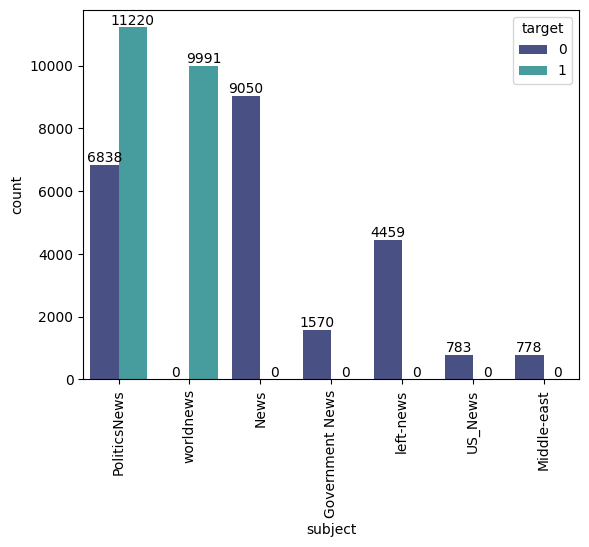

In [ ]:
ax = sns.countplot(data, x="subject", hue='target', palette='mako')
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
for container in ax.containers:
    ax.bar_label(container)
plt.show()

In [ ]:
#Irei utilizar uma função para tratar o texto de uma vez só

def clean_text(text):
    ''' Colocar o texto em caixa baixa, remover os parenteses, remover links,
      remover pontuações e remover palavras contendo números.'''
    text = str(text).lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = ' '.join(word for word in text.split(' ') if word not in stop)
    return text

stop = stopwords.words('english')
stop = set(stop)
punctuation = list(string.punctuation)
stop.update(punctuation)


In [ ]:
colunas_tratar = ['title', 'text', 'original']
for coluna in colunas_tratar:
  data[coluna] = data[coluna].apply(clean_text)

In [ ]:
data.head()

,title,text,subject,target,original
0,us budget fight looms republicans flip fiscal ...,washington reuters head conservative republic...,PoliticsNews,1,us budget fight looms republicans flip fiscal ...
1,us military accept transgender recruits monday...,washington reuters transgender people allowed...,PoliticsNews,1,us military accept transgender recruits monday...
2,senior us republican senator let mr mueller job,washington reuters special counsel investigat...,PoliticsNews,1,senior us republican senator let mr mueller jo...
3,fbi russia probe helped australian diplomat ti...,washington reuters trump campaign adviser geo...,PoliticsNews,1,fbi russia probe helped australian diplomat ti...
4,trump wants postal service charge much amazon ...,seattlewashington reuters president donald tr...,PoliticsNews,1,trump wants postal service charge much amazon ...


Plotando a nuvem de palavras dos títulos de artigos reais


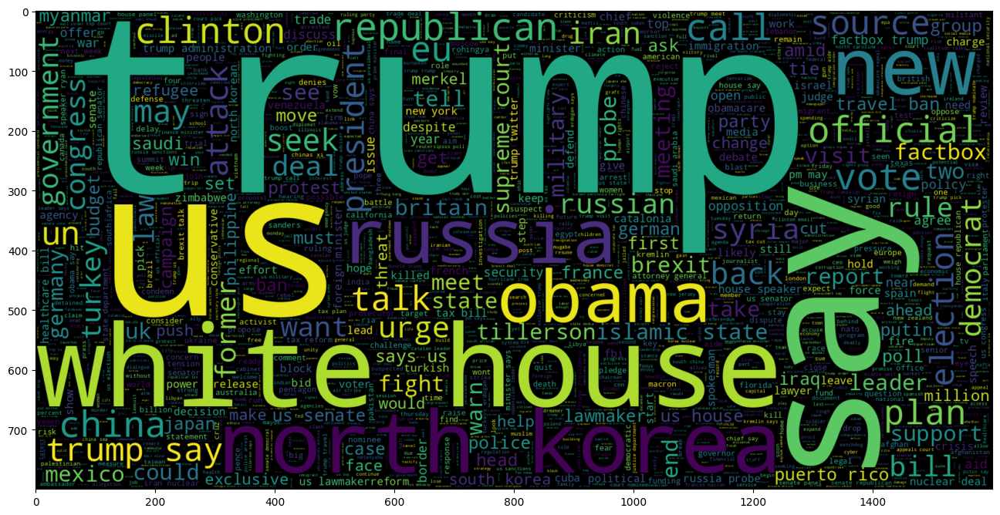

In [ ]:
print('Plotando a nuvem de palavras dos títulos de artigos reais')
plt.figure(figsize = (16,16))
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stop).generate(" ".join(data[data.target == 1].title))
plt.imshow(wc, interpolation = 'bilinear')
plt.show()


Plotando a nuvem de palavras dos títulos de artigos fakes


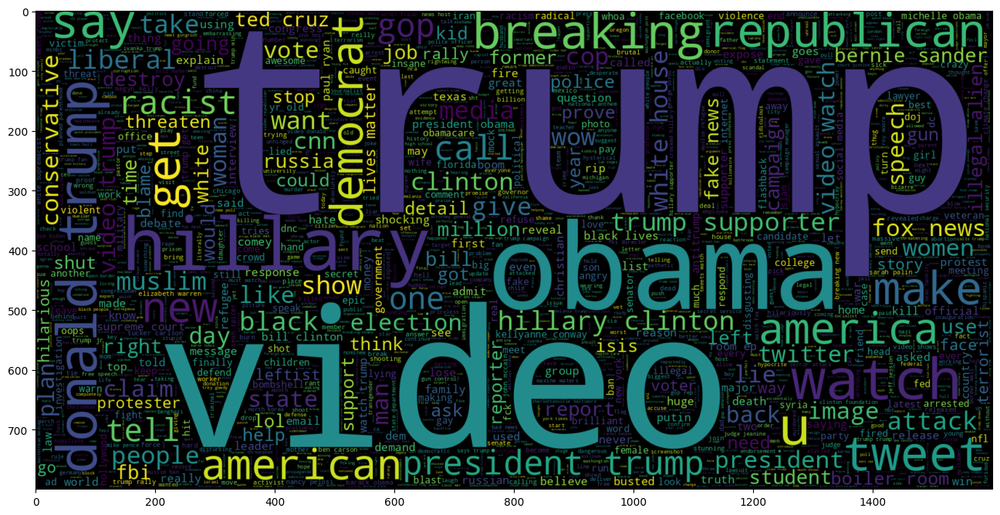

In [ ]:
print('Plotando a nuvem de palavras dos títulos de artigos fakes')
plt.figure(figsize = (16,16))
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stop).generate(" ".join(data[data.target == 0].title))
plt.imshow(wc, interpolation = 'bilinear')
plt.show()


Plotando a nuvem de palavras dos textos de artigos reais


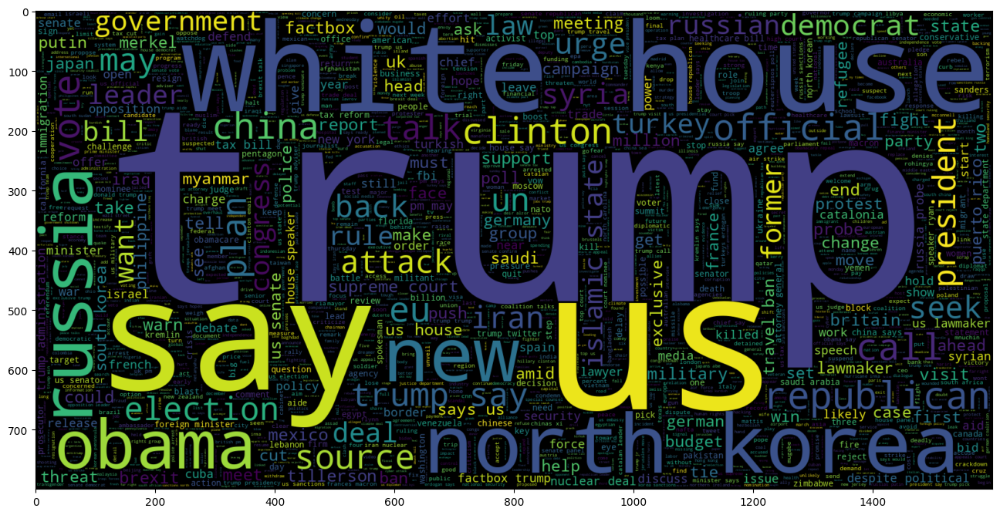

In [ ]:
print('Plotando a nuvem de palavras dos textos de artigos reais')
plt.figure(figsize = (16,16))
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stop).generate(" ".join(data[data.target == 1].title))
plt.imshow(wc, interpolation = 'bilinear')
plt.show()


Plotando a nuvem de palavras dos textos de artigos fakes


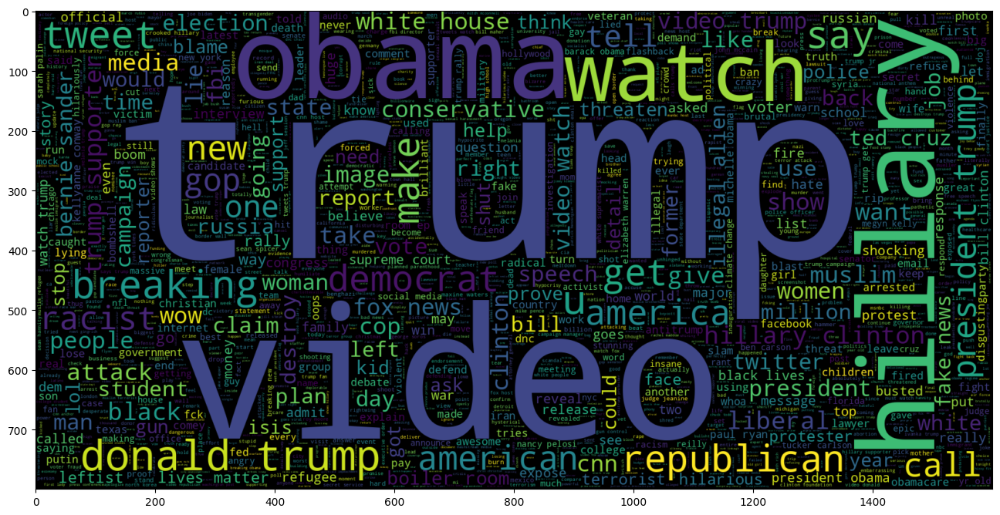

In [ ]:
print('Plotando a nuvem de palavras dos textos de artigos fakes')
plt.figure(figsize = (16,16))
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stop).generate(" ".join(data[data.target == 0].title))
plt.imshow(wc, interpolation = 'bilinear')
plt.show()


Iremos olhar o tamanho do título e texto

In [ ]:
data.head()

,title,text,subject,target,original
0,us budget fight looms republicans flip fiscal ...,washington reuters head conservative republic...,PoliticsNews,1,us budget fight looms republicans flip fiscal ...
1,us military accept transgender recruits monday...,washington reuters transgender people allowed...,PoliticsNews,1,us military accept transgender recruits monday...
2,senior us republican senator let mr mueller job,washington reuters special counsel investigat...,PoliticsNews,1,senior us republican senator let mr mueller jo...
3,fbi russia probe helped australian diplomat ti...,washington reuters trump campaign adviser geo...,PoliticsNews,1,fbi russia probe helped australian diplomat ti...
4,trump wants postal service charge much amazon ...,seattlewashington reuters president donald tr...,PoliticsNews,1,trump wants postal service charge much amazon ...


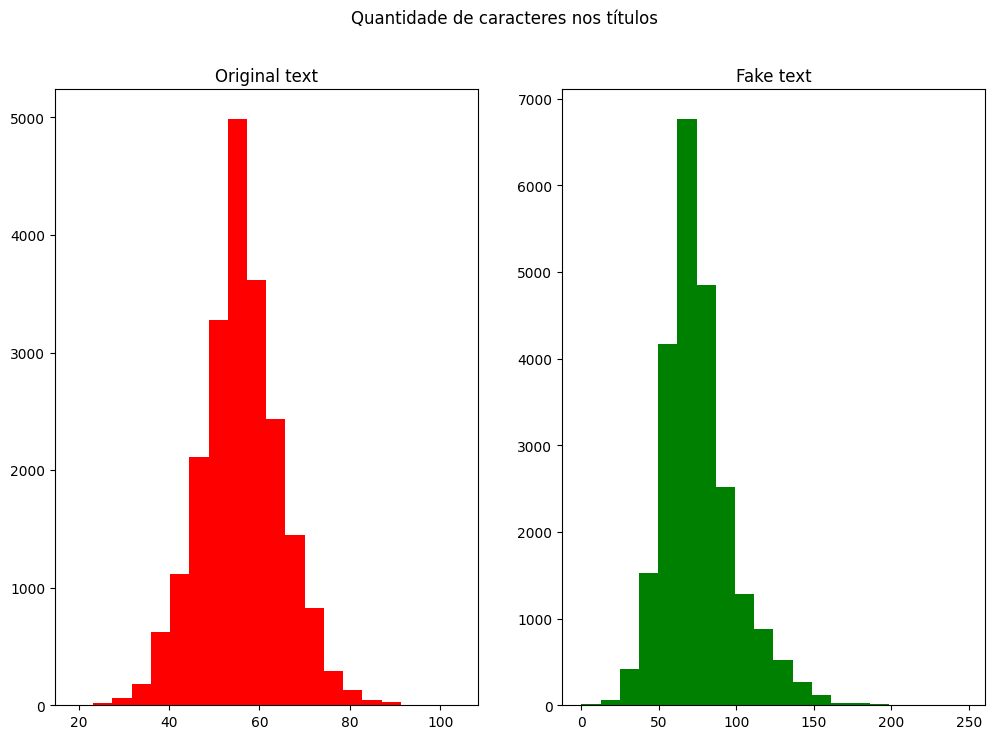

In [ ]:
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(12,8))
text_len = data[data['target']==1]['title'].str.len()
ax1.hist(text_len,color='red', bins=20)
ax1.set_title('Original text')

text_len = data[data['target']==0]['title'].str.len()
ax2.hist(text_len,color='green', bins=20)
ax2.set_title('Fake text')

fig.suptitle('Quantidade de caracteres nos títulos')
plt.show()

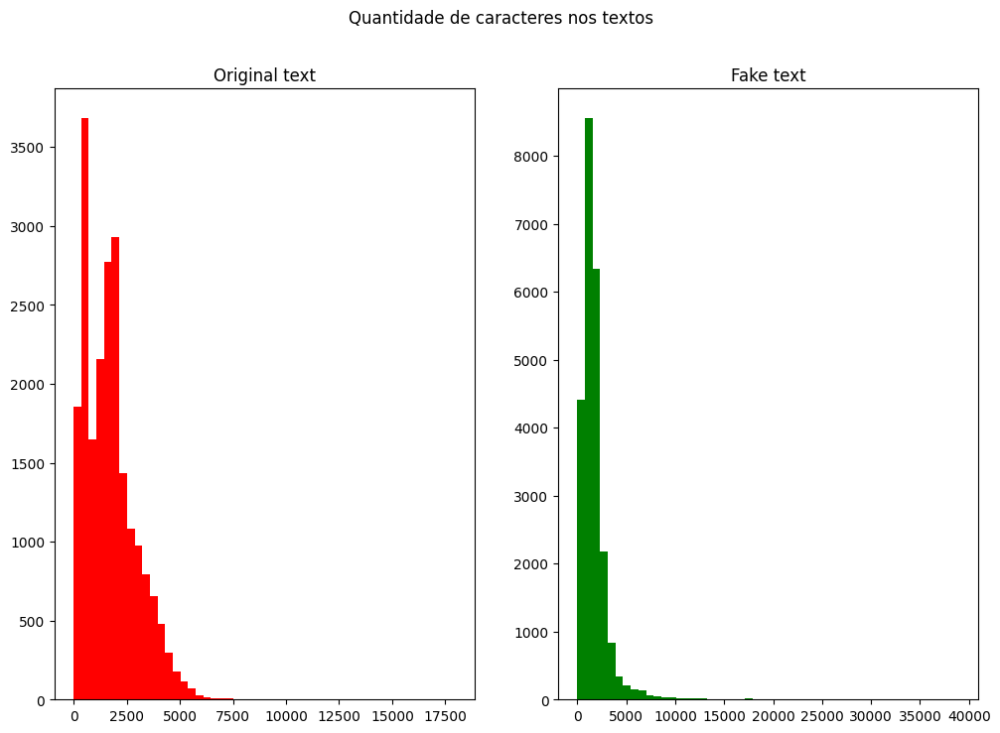

In [ ]:
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(12,8))
text_len = data[data['target']==1]['text'].str.len()
ax1.hist(text_len,color='red', bins=50)
ax1.set_title('Original text')

text_len = data[data['target']==0]['text'].str.len()
ax2.hist(text_len,color='green', bins=50)
ax2.set_title('Fake text')

fig.suptitle('Quantidade de caracteres nos textos')
plt.show()

Os títulos falsos tem uma tendência a serem maiores que os títulos reais, além de conterem mais palavras do que os reais.


In [ ]:
def get_corpus(text):
    words = []
    for i in text:
        for j in i.split():
            words.append(j.strip())
    return words

corpus_text = get_corpus(data.text)
corpus_title = get_corpus(data.title)
corpus = get_corpus(data.original)

In [ ]:
(corpus_text[:5], corpus_title[:5], corpus[:5])

(['washington', 'reuters', 'head', 'conservative', 'republican'],
 ['us', 'budget', 'fight', 'looms', 'republicans'],
 ['us', 'budget', 'fight', 'looms', 'republicans'])

In [ ]:
counter_text = Counter(corpus_text)
most_common_text = counter_text.most_common(10)
most_common_text = dict(most_common_text)
most_common_text

{'said': 128833,
 'trump': 114860,
 'us': 62329,
 'would': 54470,
 'president': 50410,
 'people': 40321,
 'one': 35014,
 'also': 30954,
 'state': 30818,
 'new': 30661}

In [ ]:
counter = Counter(corpus)
most_common = counter.most_common(10)
most_common = dict(most_common)
most_common

{'said': 129035,
 'trump': 126595,
 'us': 67329,
 'would': 54941,
 'president': 51882,
 'people': 40843,
 'one': 35676,
 'new': 32412,
 'state': 31842,
 'also': 30991}

In [ ]:
counter_title = Counter(corpus_title)
most_common_title = counter_title.most_common(10)
most_common_title = dict(most_common_title)
most_common_title

{'trump': 11735,
 'us': 5001,
 'says': 3490,
 'video': 3257,
 'obama': 2328,
 'house': 1957,
 'watch': 1916,
 'new': 1751,
 'hillary': 1751,
 'white': 1563}

In [ ]:
def get_top_text_ngrams(corpus, n, g):
    vec = CountVectorizer(ngram_range=(g, g)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

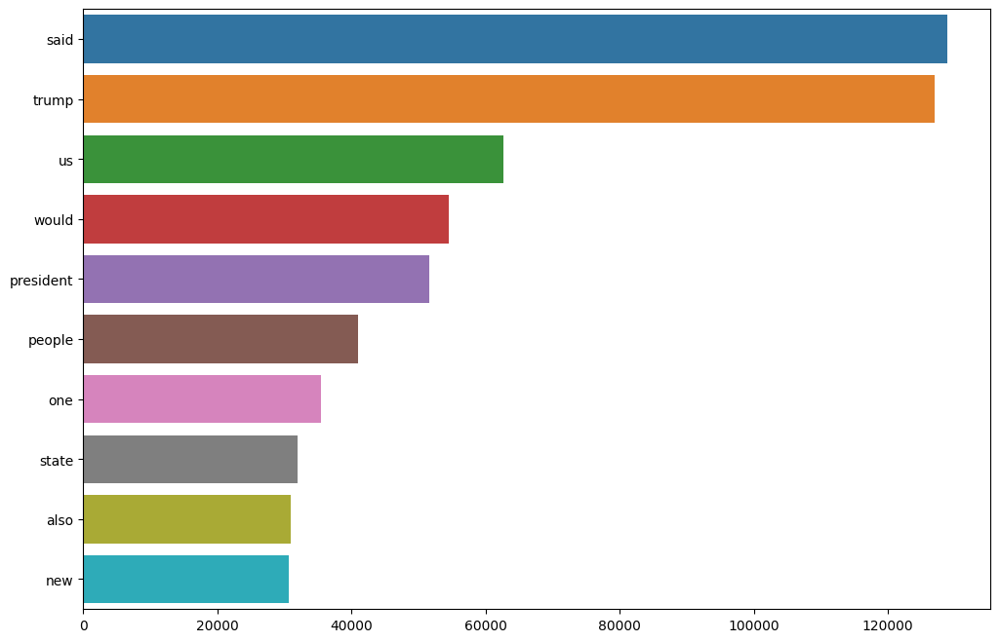

In [ ]:
plt.figure(figsize = (12,8))
most_common_uni = get_top_text_ngrams(data.text,10,1)
most_common_uni = dict(most_common_uni)
sns.barplot(x=list(most_common_uni.values()),y=list(most_common_uni.keys()))
plt.show()

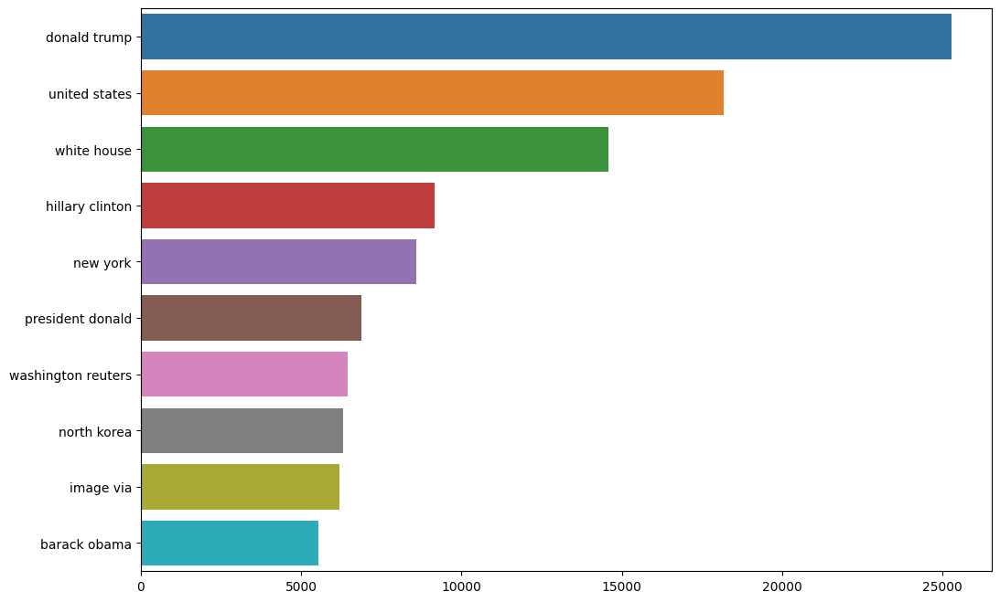

In [ ]:
plt.figure(figsize = (12,8))
most_common_bi = get_top_text_ngrams(data.text,10,2)
most_common_bi = dict(most_common_bi)
sns.barplot(x=list(most_common_bi.values()),y=list(most_common_bi.keys()))
plt.show()

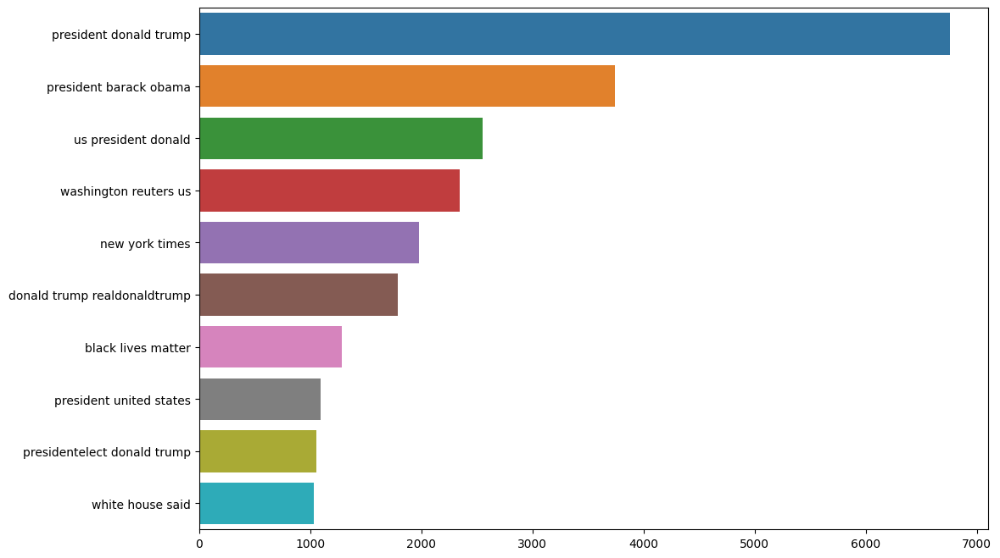

In [ ]:
plt.figure(figsize = (12,8))
most_common_tri = get_top_text_ngrams(data.text,10,3)
most_common_tri = dict(most_common_tri)
sns.barplot(x=list(most_common_tri.values()),y=list(most_common_tri.keys()))
plt.show()

### **Separando dados de treino e dados de teste**

In [ ]:
%%time
test_size = 0.25
seed = 89899


X = data.original.values
y = data.target.values

X_train, X_test, y_train, y_test = train_test_split(X, y,
  test_size=test_size, shuffle=True, random_state=seed, stratify=y)

CPU times: user 15.9 ms, sys: 1.97 ms, total: 17.8 ms
Wall time: 23 ms


In [ ]:
def roc_auc(predictions,target):
    '''
    This methods returns the AUC Score when given the Predictions
    and Labels
    '''

    fpr, tpr, thresholds = metrics.roc_curve(target, predictions)
    roc_auc = metrics.auc(fpr, tpr)
    return roc_auc

#### **Criando os tokens para camada de entrada**

Criado os tokens para nossos dados, selecionei os textos com no máximo 300 caracteres a fim de manter um texto pequeno, sem aumentarmos demais o tempo de treino e teste.

Defini inicialmente 10 mil features a serem traduzidas em tokens.

In [ ]:
%%time
# using keras tokenizer here
max_len = 300
max_features = 10000

token = text.Tokenizer(num_words=max_features, oov_token = True)


token.fit_on_texts(list(X_train))
X_train_seq = token.texts_to_sequences(X_train)
X_test_seq = token.texts_to_sequences(X_test)

#zero pad the sequences
X_train_pad = pad_sequences(X_train_seq, maxlen=max_len)
X_test_pad = pad_sequences(X_test_seq, maxlen=max_len)

word_index = token.word_index

CPU times: user 27.1 s, sys: 265 ms, total: 27.4 s
Wall time: 27.6 s


In [ ]:
# Detect hardware, return appropriate distribution strategy
try:
    # TPU detection. No parameters necessary if TPU_NAME environment variable is
    # set: this is always the case on Kaggle.
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Running on TPU ', tpu.master())
except ValueError:
    tpu = None

if tpu:
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
    # Default distribution strategy in Tensorflow. Works on CPU and single GPU.
    strategy = tf.distribute.get_strategy()

print("REPLICAS: ", strategy.num_replicas_in_sync)

REPLICAS:  1


##### **RNN**

Uma rede neural recorrente simples será testada, a fim de verificar se um modelo simples consegue ser eficiente.

In [ ]:
path_model_rnn = '/content/gdrive/MyDrive/Estudos/Data_Science/PUC_RIO/Sprint_2/MVP/models/rnn'

cp_callback_rnn = ModelCheckpoint(
    filepath=path_model_rnn,
    verbose=2,
    save_best_only=True,
    save_weights_only=False,
    save_freq=1)

In [ ]:
batch_size = 64*strategy.num_replicas_in_sync
epochs = 10
embed_size = 300

In [ ]:
%%time
with strategy.scope():
    # Um RNN sem camada oculta
    model_rnn = Sequential()
    model_rnn.add(Embedding(max_features,
                     output_dim=embed_size,
                     input_length=max_len))
    model_rnn.add(SimpleRNN(128))
    model_rnn.add(Dense(1, activation='sigmoid'))
    model_rnn.compile(optimizer=keras.optimizers.Adam(lr = 0.01), loss='binary_crossentropy', metrics=['accuracy'])

model_rnn.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 300, 300)          3000000   
                                                                 
 simple_rnn (SimpleRNN)      (None, 128)               54912     
                                                                 
 dense (Dense)               (None, 1)                 129       
                                                                 
Total params: 3,055,041
Trainable params: 3,055,041
Non-trainable params: 0
_________________________________________________________________
CPU times: user 301 ms, sys: 37 ms, total: 338 ms
Wall time: 418 ms


Neste ponto eu esqueci de salvar o history = mode.fit logo não irei printar, somente quando rodar novamente

In [ ]:
history_rnn = model_rnn.fit(X_train_pad, y_train,
                        validation_split=0.3,
                        epochs=epochs,
                        batch_size=batch_size,
                        callbacks=[cp_callback_rnn])

Epoch 1/10


  1/367 [..............................] - ETA: 23:38 - loss: 0.7264 - accuracy: 0.4531

  2/367 [..............................] - ETA: 4:11 - loss: 0.6926 - accuracy: 0.4609 

  3/367 [..............................] - ETA: 3:20 - loss: 0.7350 - accuracy: 0.4583

  4/367 [..............................] - ETA: 3:00 - loss: 0.6935 - accuracy: 0.5156

  5/367 [..............................] - ETA: 2:49 - loss: 0.6739 - accuracy: 0.5688

  6/367 [..............................] - ETA: 2:44 - loss: 0.6674 - accuracy: 0.5859

  7/367 [..............................] - ETA: 2:40 - loss: 0.6527 - accuracy: 0.6049

  8/367 [..............................] - ETA: 2:37 - loss: 0.6674 - accuracy: 0.5859

  9/367 [..............................] - ETA: 2:34 - loss: 0.6625 - accuracy: 0.5955

 10/367 [..............................] - ETA: 2:32 - loss: 0.6543 - accuracy: 0.6109

 11/367 [..............................] - ETA: 2:30 - loss: 0.6463 - accuracy: 0.6136

 12/367 [..............................] - ETA: 2:28 - loss: 0.6380 - accuracy: 0.6224

 13/367 [>.............................] - ETA: 2:26 - loss: 0.6377 - accuracy: 0.6202

 14/367 [>.............................] - ETA: 2:25 - loss: 0.6327 - accuracy: 0.6272

 15/367 [>.............................] - ETA: 2:24 - loss: 0.6255 - accuracy: 0.6323

 16/367 [>.............................] - ETA: 2:23 - loss: 0.6153 - accuracy: 0.6406

 17/367 [>.............................] - ETA: 2:22 - loss: 0.6108 - accuracy: 0.6498

 18/367 [>.............................] - ETA: 2:22 - loss: 0.6113 - accuracy: 0.6467

 19/367 [>.............................] - ETA: 2:21 - loss: 0.6086 - accuracy: 0.6488

 20/367 [>.............................] - ETA: 2:21 - loss: 0.6026 - accuracy: 0.6523

 21/367 [>.............................] - ETA: 2:20 - loss: 0.6008 - accuracy: 0.6503

 22/367 [>.............................] - ETA: 2:19 - loss: 0.5944 - accuracy: 0.6570

 23/367 [>.............................] - ETA: 2:19 - loss: 0.5871 - accuracy: 0.6630

 24/367 [>.............................] - ETA: 2:18 - loss: 0.5838 - accuracy: 0.6660

 25/367 [=>............................] - ETA: 2:17 - loss: 0.5819 - accuracy: 0.6681

 26/367 [=>............................] - ETA: 2:17 - loss: 0.5763 - accuracy: 0.6737

 27/367 [=>............................] - ETA: 2:16 - loss: 0.5738 - accuracy: 0.6736

 28/367 [=>............................] - ETA: 2:19 - loss: 0.5707 - accuracy: 0.6752

 29/367 [=>............................] - ETA: 2:23 - loss: 0.5670 - accuracy: 0.6783

 30/367 [=>............................] - ETA: 2:27 - loss: 0.5637 - accuracy: 0.6823

 31/367 [=>............................] - ETA: 2:31 - loss: 0.5600 - accuracy: 0.6835

 32/367 [=>............................] - ETA: 2:34 - loss: 0.5554 - accuracy: 0.6855

 33/367 [=>............................] - ETA: 2:37 - loss: 0.5563 - accuracy: 0.6851

 34/367 [=>............................] - ETA: 2:37 - loss: 0.5554 - accuracy: 0.6834

 35/367 [=>............................] - ETA: 2:36 - loss: 0.5534 - accuracy: 0.6857

 36/367 [=>............................] - ETA: 2:34 - loss: 0.5487 - accuracy: 0.6875

 37/367 [==>...........................] - ETA: 2:33 - loss: 0.5453 - accuracy: 0.6905

 38/367 [==>...........................] - ETA: 2:32 - loss: 0.5424 - accuracy: 0.6924

 39/367 [==>...........................] - ETA: 2:31 - loss: 0.5399 - accuracy: 0.6943

 40/367 [==>...........................] - ETA: 2:30 - loss: 0.5369 - accuracy: 0.6965

 41/367 [==>...........................] - ETA: 2:29 - loss: 0.5329 - accuracy: 0.7012

 42/367 [==>...........................] - ETA: 2:28 - loss: 0.5313 - accuracy: 0.7024

 43/367 [==>...........................] - ETA: 2:27 - loss: 0.5293 - accuracy: 0.7039

 44/367 [==>...........................] - ETA: 2:26 - loss: 0.5283 - accuracy: 0.7045

 45/367 [==>...........................] - ETA: 2:25 - loss: 0.5258 - accuracy: 0.7066

 46/367 [==>...........................] - ETA: 2:24 - loss: 0.5231 - accuracy: 0.7079

 47/367 [==>...........................] - ETA: 2:23 - loss: 0.5202 - accuracy: 0.7098

 48/367 [==>...........................] - ETA: 2:22 - loss: 0.5186 - accuracy: 0.7103

 49/367 [===>..........................] - ETA: 2:22 - loss: 0.5179 - accuracy: 0.7111

 50/367 [===>..........................] - ETA: 2:21 - loss: 0.5138 - accuracy: 0.7138

 51/367 [===>..........................] - ETA: 2:20 - loss: 0.5120 - accuracy: 0.7145

 52/367 [===>..........................] - ETA: 2:19 - loss: 0.5089 - accuracy: 0.7169

 53/367 [===>..........................] - ETA: 2:19 - loss: 0.5054 - accuracy: 0.7193

 54/367 [===>..........................] - ETA: 2:18 - loss: 0.5044 - accuracy: 0.7193

 55/367 [===>..........................] - ETA: 2:17 - loss: 0.5019 - accuracy: 0.7205

 56/367 [===>..........................] - ETA: 2:17 - loss: 0.5010 - accuracy: 0.7213

 57/367 [===>..........................] - ETA: 2:16 - loss: 0.4993 - accuracy: 0.7220

 58/367 [===>..........................] - ETA: 2:15 - loss: 0.4989 - accuracy: 0.7223

 59/367 [===>..........................] - ETA: 2:14 - loss: 0.4967 - accuracy: 0.7248

 60/367 [===>..........................] - ETA: 2:15 - loss: 0.4962 - accuracy: 0.7250

 61/367 [===>..........................] - ETA: 2:17 - loss: 0.4944 - accuracy: 0.7275

 62/367 [====>.........................] - ETA: 2:18 - loss: 0.4947 - accuracy: 0.7276

 63/367 [====>.........................] - ETA: 2:19 - loss: 0.4939 - accuracy: 0.7282

 64/367 [====>.........................] - ETA: 2:20 - loss: 0.4922 - accuracy: 0.7292

 65/367 [====>.........................] - ETA: 2:21 - loss: 0.4912 - accuracy: 0.7300

 66/367 [====>.........................] - ETA: 2:21 - loss: 0.4881 - accuracy: 0.7325

 67/367 [====>.........................] - ETA: 2:20 - loss: 0.4868 - accuracy: 0.7332

 68/367 [====>.........................] - ETA: 2:19 - loss: 0.4852 - accuracy: 0.7351

 69/367 [====>.........................] - ETA: 2:18 - loss: 0.4819 - accuracy: 0.7371

 70/367 [====>.........................] - ETA: 2:18 - loss: 0.4803 - accuracy: 0.7377

 71/367 [====>.........................] - ETA: 2:17 - loss: 0.4817 - accuracy: 0.7377

 72/367 [====>.........................] - ETA: 2:16 - loss: 0.4824 - accuracy: 0.7370

 73/367 [====>.........................] - ETA: 2:15 - loss: 0.4812 - accuracy: 0.7378

 74/367 [=====>........................] - ETA: 2:15 - loss: 0.4806 - accuracy: 0.7375

 75/367 [=====>........................] - ETA: 2:14 - loss: 0.4788 - accuracy: 0.7387

 76/367 [=====>........................] - ETA: 2:13 - loss: 0.4787 - accuracy: 0.7387

 77/367 [=====>........................] - ETA: 2:13 - loss: 0.4782 - accuracy: 0.7390

 78/367 [=====>........................] - ETA: 2:12 - loss: 0.4762 - accuracy: 0.7406

 79/367 [=====>........................] - ETA: 2:11 - loss: 0.4736 - accuracy: 0.7429

 80/367 [=====>........................] - ETA: 2:10 - loss: 0.4741 - accuracy: 0.7434

 81/367 [=====>........................] - ETA: 2:10 - loss: 0.4713 - accuracy: 0.7454

 82/367 [=====>........................] - ETA: 2:09 - loss: 0.4706 - accuracy: 0.7460

 83/367 [=====>........................] - ETA: 2:08 - loss: 0.4704 - accuracy: 0.7464

 84/367 [=====>........................] - ETA: 2:08 - loss: 0.4676 - accuracy: 0.7480

 85/367 [=====>........................] - ETA: 2:07 - loss: 0.4654 - accuracy: 0.7493

 86/367 [======>.......................] - ETA: 2:06 - loss: 0.4642 - accuracy: 0.7496

 87/367 [======>.......................] - ETA: 2:06 - loss: 0.4631 - accuracy: 0.7498

 88/367 [======>.......................] - ETA: 2:05 - loss: 0.4625 - accuracy: 0.7505

 89/367 [======>.......................] - ETA: 2:04 - loss: 0.4605 - accuracy: 0.7516

 90/367 [======>.......................] - ETA: 2:04 - loss: 0.4599 - accuracy: 0.7519

 91/367 [======>.......................] - ETA: 2:03 - loss: 0.4576 - accuracy: 0.7534

 92/367 [======>.......................] - ETA: 2:04 - loss: 0.4569 - accuracy: 0.7544

 93/367 [======>.......................] - ETA: 2:07 - loss: 0.4564 - accuracy: 0.7550

 94/367 [======>.......................] - ETA: 2:10 - loss: 0.4564 - accuracy: 0.7553

 95/367 [======>.......................] - ETA: 2:12 - loss: 0.4572 - accuracy: 0.7558

 96/367 [======>.......................] - ETA: 2:12 - loss: 0.4561 - accuracy: 0.7570

 97/367 [======>.......................] - ETA: 2:13 - loss: 0.4548 - accuracy: 0.7576

 98/367 [=======>......................] - ETA: 2:13 - loss: 0.4534 - accuracy: 0.7583

 99/367 [=======>......................] - ETA: 2:12 - loss: 0.4513 - accuracy: 0.7595

100/367 [=======>......................] - ETA: 2:12 - loss: 0.4499 - accuracy: 0.7603

101/367 [=======>......................] - ETA: 2:11 - loss: 0.4490 - accuracy: 0.7608

102/367 [=======>......................] - ETA: 2:10 - loss: 0.4483 - accuracy: 0.7610

103/367 [=======>......................] - ETA: 2:09 - loss: 0.4470 - accuracy: 0.7618

104/367 [=======>......................] - ETA: 2:09 - loss: 0.4454 - accuracy: 0.7626

105/367 [=======>......................] - ETA: 2:08 - loss: 0.4436 - accuracy: 0.7641

106/367 [=======>......................] - ETA: 2:07 - loss: 0.4420 - accuracy: 0.7653

107/367 [=======>......................] - ETA: 2:06 - loss: 0.4422 - accuracy: 0.7655

108/367 [=======>......................] - ETA: 2:06 - loss: 0.4411 - accuracy: 0.7661

109/367 [=======>......................] - ETA: 2:05 - loss: 0.4395 - accuracy: 0.7669

110/367 [=======>......................] - ETA: 2:04 - loss: 0.4385 - accuracy: 0.7673

111/367 [========>.....................] - ETA: 2:04 - loss: 0.4381 - accuracy: 0.7676

112/367 [========>.....................] - ETA: 2:03 - loss: 0.4371 - accuracy: 0.7683

113/367 [========>.....................] - ETA: 2:02 - loss: 0.4359 - accuracy: 0.7688

114/367 [========>.....................] - ETA: 2:02 - loss: 0.4351 - accuracy: 0.7695

115/367 [========>.....................] - ETA: 2:01 - loss: 0.4341 - accuracy: 0.7704

116/367 [========>.....................] - ETA: 2:00 - loss: 0.4324 - accuracy: 0.7713

117/367 [========>.....................] - ETA: 2:00 - loss: 0.4311 - accuracy: 0.7722

118/367 [========>.....................] - ETA: 2:00 - loss: 0.4300 - accuracy: 0.7729

119/367 [========>.....................] - ETA: 2:00 - loss: 0.4288 - accuracy: 0.7736

120/367 [========>.....................] - ETA: 2:00 - loss: 0.4276 - accuracy: 0.7745

121/367 [========>.....................] - ETA: 2:00 - loss: 0.4266 - accuracy: 0.7751

122/367 [========>.....................] - ETA: 2:00 - loss: 0.4256 - accuracy: 0.7759

123/367 [=========>....................] - ETA: 2:00 - loss: 0.4241 - accuracy: 0.7768

124/367 [=========>....................] - ETA: 2:00 - loss: 0.4232 - accuracy: 0.7773

125/367 [=========>....................] - ETA: 1:59 - loss: 0.4218 - accuracy: 0.7782

126/367 [=========>....................] - ETA: 1:58 - loss: 0.4212 - accuracy: 0.7788

127/367 [=========>....................] - ETA: 1:57 - loss: 0.4207 - accuracy: 0.7793

128/367 [=========>....................] - ETA: 1:57 - loss: 0.4189 - accuracy: 0.7803

129/367 [=========>....................] - ETA: 1:56 - loss: 0.4176 - accuracy: 0.7812

130/367 [=========>....................] - ETA: 1:55 - loss: 0.4173 - accuracy: 0.7817

131/367 [=========>....................] - ETA: 1:55 - loss: 0.4161 - accuracy: 0.7823

132/367 [=========>....................] - ETA: 1:54 - loss: 0.4148 - accuracy: 0.7831

133/367 [=========>....................] - ETA: 1:53 - loss: 0.4136 - accuracy: 0.7841

134/367 [=========>....................] - ETA: 1:53 - loss: 0.4119 - accuracy: 0.7853

135/367 [==========>...................] - ETA: 1:52 - loss: 0.4098 - accuracy: 0.7868

136/367 [==========>...................] - ETA: 1:52 - loss: 0.4082 - accuracy: 0.7877

137/367 [==========>...................] - ETA: 1:51 - loss: 0.4071 - accuracy: 0.7887

138/367 [==========>...................] - ETA: 1:50 - loss: 0.4059 - accuracy: 0.7895

139/367 [==========>...................] - ETA: 1:50 - loss: 0.4042 - accuracy: 0.7906

140/367 [==========>...................] - ETA: 1:49 - loss: 0.4036 - accuracy: 0.7910

141/367 [==========>...................] - ETA: 1:48 - loss: 0.4027 - accuracy: 0.7916

142/367 [==========>...................] - ETA: 1:48 - loss: 0.4027 - accuracy: 0.7920

143/367 [==========>...................] - ETA: 1:47 - loss: 0.4006 - accuracy: 0.7934

144/367 [==========>...................] - ETA: 1:46 - loss: 0.3994 - accuracy: 0.7941

145/367 [==========>...................] - ETA: 1:46 - loss: 0.3978 - accuracy: 0.7950

146/367 [==========>...................] - ETA: 1:45 - loss: 0.3969 - accuracy: 0.7958

147/367 [===========>..................] - ETA: 1:45 - loss: 0.3956 - accuracy: 0.7967

148/367 [===========>..................] - ETA: 1:44 - loss: 0.3945 - accuracy: 0.7975

149/367 [===========>..................] - ETA: 1:44 - loss: 0.3935 - accuracy: 0.7979

150/367 [===========>..................] - ETA: 1:44 - loss: 0.3923 - accuracy: 0.7985

151/367 [===========>..................] - ETA: 1:44 - loss: 0.3917 - accuracy: 0.7990

152/367 [===========>..................] - ETA: 1:44 - loss: 0.3905 - accuracy: 0.7997

153/367 [===========>..................] - ETA: 1:44 - loss: 0.3891 - accuracy: 0.8004

154/367 [===========>..................] - ETA: 1:44 - loss: 0.3883 - accuracy: 0.8010

155/367 [===========>..................] - ETA: 1:43 - loss: 0.3868 - accuracy: 0.8019

156/367 [===========>..................] - ETA: 1:43 - loss: 0.3863 - accuracy: 0.8023

157/367 [===========>..................] - ETA: 1:42 - loss: 0.3855 - accuracy: 0.8027

158/367 [===========>..................] - ETA: 1:41 - loss: 0.3848 - accuracy: 0.8033

159/367 [===========>..................] - ETA: 1:41 - loss: 0.3847 - accuracy: 0.8036

160/367 [============>.................] - ETA: 1:40 - loss: 0.3835 - accuracy: 0.8044

161/367 [============>.................] - ETA: 1:40 - loss: 0.3827 - accuracy: 0.8048

162/367 [============>.................] - ETA: 1:39 - loss: 0.3815 - accuracy: 0.8056

163/367 [============>.................] - ETA: 1:38 - loss: 0.3811 - accuracy: 0.8057

164/367 [============>.................] - ETA: 1:38 - loss: 0.3803 - accuracy: 0.8064

165/367 [============>.................] - ETA: 1:37 - loss: 0.3799 - accuracy: 0.8065

166/367 [============>.................] - ETA: 1:37 - loss: 0.3787 - accuracy: 0.8072

167/367 [============>.................] - ETA: 1:36 - loss: 0.3786 - accuracy: 0.8074

168/367 [============>.................] - ETA: 1:36 - loss: 0.3774 - accuracy: 0.8080

169/367 [============>.................] - ETA: 1:35 - loss: 0.3773 - accuracy: 0.8082

170/367 [============>.................] - ETA: 1:34 - loss: 0.3764 - accuracy: 0.8086

171/367 [============>.................] - ETA: 1:34 - loss: 0.3762 - accuracy: 0.8089

172/367 [=============>................] - ETA: 1:33 - loss: 0.3755 - accuracy: 0.8092

173/367 [=============>................] - ETA: 1:33 - loss: 0.3753 - accuracy: 0.8096

174/367 [=============>................] - ETA: 1:32 - loss: 0.3746 - accuracy: 0.8102

175/367 [=============>................] - ETA: 1:31 - loss: 0.3746 - accuracy: 0.8104

176/367 [=============>................] - ETA: 1:31 - loss: 0.3738 - accuracy: 0.8105

177/367 [=============>................] - ETA: 1:30 - loss: 0.3727 - accuracy: 0.8114

178/367 [=============>................] - ETA: 1:30 - loss: 0.3722 - accuracy: 0.8117

179/367 [=============>................] - ETA: 1:29 - loss: 0.3712 - accuracy: 0.8122

180/367 [=============>................] - ETA: 1:29 - loss: 0.3702 - accuracy: 0.8128

181/367 [=============>................] - ETA: 1:28 - loss: 0.3692 - accuracy: 0.8134

182/367 [=============>................] - ETA: 1:28 - loss: 0.3681 - accuracy: 0.8141

183/367 [=============>................] - ETA: 1:28 - loss: 0.3678 - accuracy: 0.8143

184/367 [==============>...............] - ETA: 1:28 - loss: 0.3666 - accuracy: 0.8150

185/367 [==============>...............] - ETA: 1:28 - loss: 0.3661 - accuracy: 0.8155

186/367 [==============>...............] - ETA: 1:28 - loss: 0.3655 - accuracy: 0.8160

187/367 [==============>...............] - ETA: 1:27 - loss: 0.3642 - accuracy: 0.8168

188/367 [==============>...............] - ETA: 1:27 - loss: 0.3638 - accuracy: 0.8169

189/367 [==============>...............] - ETA: 1:26 - loss: 0.3628 - accuracy: 0.8178

190/367 [==============>...............] - ETA: 1:25 - loss: 0.3627 - accuracy: 0.8182

191/367 [==============>...............] - ETA: 1:25 - loss: 0.3625 - accuracy: 0.8186

192/367 [==============>...............] - ETA: 1:24 - loss: 0.3618 - accuracy: 0.8191

193/367 [==============>...............] - ETA: 1:24 - loss: 0.3609 - accuracy: 0.8196

194/367 [==============>...............] - ETA: 1:23 - loss: 0.3600 - accuracy: 0.8204

195/367 [==============>...............] - ETA: 1:23 - loss: 0.3589 - accuracy: 0.8212

196/367 [===============>..............] - ETA: 1:22 - loss: 0.3580 - accuracy: 0.8217

197/367 [===============>..............] - ETA: 1:22 - loss: 0.3572 - accuracy: 0.8223

198/367 [===============>..............] - ETA: 1:21 - loss: 0.3563 - accuracy: 0.8228

199/367 [===============>..............] - ETA: 1:20 - loss: 0.3557 - accuracy: 0.8232

200/367 [===============>..............] - ETA: 1:20 - loss: 0.3551 - accuracy: 0.8235

201/367 [===============>..............] - ETA: 1:19 - loss: 0.3546 - accuracy: 0.8238

202/367 [===============>..............] - ETA: 1:19 - loss: 0.3538 - accuracy: 0.8241

203/367 [===============>..............] - ETA: 1:18 - loss: 0.3530 - accuracy: 0.8246

204/367 [===============>..............] - ETA: 1:18 - loss: 0.3530 - accuracy: 0.8248

205/367 [===============>..............] - ETA: 1:17 - loss: 0.3526 - accuracy: 0.8250

206/367 [===============>..............] - ETA: 1:17 - loss: 0.3527 - accuracy: 0.8252

207/367 [===============>..............] - ETA: 1:16 - loss: 0.3523 - accuracy: 0.8256

208/367 [================>.............] - ETA: 1:15 - loss: 0.3521 - accuracy: 0.8259

209/367 [================>.............] - ETA: 1:15 - loss: 0.3519 - accuracy: 0.8263

210/367 [================>.............] - ETA: 1:14 - loss: 0.3520 - accuracy: 0.8264

211/367 [================>.............] - ETA: 1:14 - loss: 0.3517 - accuracy: 0.8269

212/367 [================>.............] - ETA: 1:14 - loss: 0.3517 - accuracy: 0.8267

213/367 [================>.............] - ETA: 1:13 - loss: 0.3519 - accuracy: 0.8266

214/367 [================>.............] - ETA: 1:13 - loss: 0.3518 - accuracy: 0.8267

215/367 [================>.............] - ETA: 1:13 - loss: 0.3513 - accuracy: 0.8270

216/367 [================>.............] - ETA: 1:13 - loss: 0.3513 - accuracy: 0.8270

217/367 [================>.............] - ETA: 1:12 - loss: 0.3510 - accuracy: 0.8272

218/367 [================>.............] - ETA: 1:12 - loss: 0.3508 - accuracy: 0.8276

219/367 [================>.............] - ETA: 1:11 - loss: 0.3504 - accuracy: 0.8278

220/367 [================>.............] - ETA: 1:11 - loss: 0.3501 - accuracy: 0.8282

221/367 [=================>............] - ETA: 1:10 - loss: 0.3502 - accuracy: 0.8281

222/367 [=================>............] - ETA: 1:10 - loss: 0.3503 - accuracy: 0.8279

223/367 [=================>............] - ETA: 1:09 - loss: 0.3500 - accuracy: 0.8281

224/367 [=================>............] - ETA: 1:09 - loss: 0.3492 - accuracy: 0.8286

225/367 [=================>............] - ETA: 1:08 - loss: 0.3494 - accuracy: 0.8288

226/367 [=================>............] - ETA: 1:08 - loss: 0.3493 - accuracy: 0.8287

227/367 [=================>............] - ETA: 1:07 - loss: 0.3490 - accuracy: 0.8289

228/367 [=================>............] - ETA: 1:06 - loss: 0.3486 - accuracy: 0.8292

229/367 [=================>............] - ETA: 1:06 - loss: 0.3482 - accuracy: 0.8293

230/367 [=================>............] - ETA: 1:05 - loss: 0.3481 - accuracy: 0.8295

231/367 [=================>............] - ETA: 1:05 - loss: 0.3479 - accuracy: 0.8296

232/367 [=================>............] - ETA: 1:04 - loss: 0.3476 - accuracy: 0.8296

233/367 [==================>...........] - ETA: 1:04 - loss: 0.3482 - accuracy: 0.8293

234/367 [==================>...........] - ETA: 1:03 - loss: 0.3482 - accuracy: 0.8292

235/367 [==================>...........] - ETA: 1:03 - loss: 0.3482 - accuracy: 0.8293

236/367 [==================>...........] - ETA: 1:02 - loss: 0.3479 - accuracy: 0.8294

237/367 [==================>...........] - ETA: 1:02 - loss: 0.3477 - accuracy: 0.8296

238/367 [==================>...........] - ETA: 1:01 - loss: 0.3473 - accuracy: 0.8300

239/367 [==================>...........] - ETA: 1:01 - loss: 0.3470 - accuracy: 0.8303

240/367 [==================>...........] - ETA: 1:00 - loss: 0.3471 - accuracy: 0.8302

241/367 [==================>...........] - ETA: 1:00 - loss: 0.3470 - accuracy: 0.8303

242/367 [==================>...........] - ETA: 59s - loss: 0.3467 - accuracy: 0.8304 

243/367 [==================>...........] - ETA: 59s - loss: 0.3469 - accuracy: 0.8302

244/367 [==================>...........] - ETA: 59s - loss: 0.3474 - accuracy: 0.8301

245/367 [===================>..........] - ETA: 58s - loss: 0.3470 - accuracy: 0.8302

246/367 [===================>..........] - ETA: 58s - loss: 0.3466 - accuracy: 0.8303

247/367 [===================>..........] - ETA: 58s - loss: 0.3461 - accuracy: 0.8307

248/367 [===================>..........] - ETA: 57s - loss: 0.3458 - accuracy: 0.8311

249/367 [===================>..........] - ETA: 57s - loss: 0.3452 - accuracy: 0.8315

250/367 [===================>..........] - ETA: 56s - loss: 0.3450 - accuracy: 0.8317

251/367 [===================>..........] - ETA: 56s - loss: 0.3454 - accuracy: 0.8315

252/367 [===================>..........] - ETA: 55s - loss: 0.3454 - accuracy: 0.8317

253/367 [===================>..........] - ETA: 55s - loss: 0.3447 - accuracy: 0.8322

254/367 [===================>..........] - ETA: 54s - loss: 0.3446 - accuracy: 0.8324

255/367 [===================>..........] - ETA: 54s - loss: 0.3439 - accuracy: 0.8328

256/367 [===================>..........] - ETA: 54s - loss: 0.3436 - accuracy: 0.8329

257/367 [====================>.........] - ETA: 53s - loss: 0.3437 - accuracy: 0.8329

258/367 [====================>.........] - ETA: 53s - loss: 0.3441 - accuracy: 0.8329

259/367 [====================>.........] - ETA: 52s - loss: 0.3440 - accuracy: 0.8330

260/367 [====================>.........] - ETA: 52s - loss: 0.3437 - accuracy: 0.8331

261/367 [====================>.........] - ETA: 52s - loss: 0.3431 - accuracy: 0.8335

262/367 [====================>.........] - ETA: 51s - loss: 0.3430 - accuracy: 0.8336

263/367 [====================>.........] - ETA: 51s - loss: 0.3425 - accuracy: 0.8338

264/367 [====================>.........] - ETA: 51s - loss: 0.3425 - accuracy: 0.8339

265/367 [====================>.........] - ETA: 51s - loss: 0.3422 - accuracy: 0.8341

266/367 [====================>.........] - ETA: 51s - loss: 0.3422 - accuracy: 0.8342

267/367 [====================>.........] - ETA: 50s - loss: 0.3422 - accuracy: 0.8343

268/367 [====================>.........] - ETA: 50s - loss: 0.3425 - accuracy: 0.8342

269/367 [====================>.........] - ETA: 50s - loss: 0.3426 - accuracy: 0.8344

270/367 [=====================>........] - ETA: 49s - loss: 0.3426 - accuracy: 0.8343

271/367 [=====================>........] - ETA: 48s - loss: 0.3423 - accuracy: 0.8347

272/367 [=====================>........] - ETA: 48s - loss: 0.3422 - accuracy: 0.8348

273/367 [=====================>........] - ETA: 47s - loss: 0.3420 - accuracy: 0.8349

274/367 [=====================>........] - ETA: 47s - loss: 0.3419 - accuracy: 0.8351

275/367 [=====================>........] - ETA: 46s - loss: 0.3419 - accuracy: 0.8351

276/367 [=====================>........] - ETA: 46s - loss: 0.3418 - accuracy: 0.8350

277/367 [=====================>........] - ETA: 45s - loss: 0.3414 - accuracy: 0.8352

278/367 [=====================>........] - ETA: 45s - loss: 0.3413 - accuracy: 0.8354

279/367 [=====================>........] - ETA: 44s - loss: 0.3411 - accuracy: 0.8355

280/367 [=====================>........] - ETA: 44s - loss: 0.3414 - accuracy: 0.8352

281/367 [=====================>........] - ETA: 43s - loss: 0.3411 - accuracy: 0.8355

282/367 [======================>.......] - ETA: 42s - loss: 0.3410 - accuracy: 0.8355

283/367 [======================>.......] - ETA: 42s - loss: 0.3409 - accuracy: 0.8356

284/367 [======================>.......] - ETA: 41s - loss: 0.3408 - accuracy: 0.8358

285/367 [======================>.......] - ETA: 41s - loss: 0.3406 - accuracy: 0.8360

286/367 [======================>.......] - ETA: 40s - loss: 0.3406 - accuracy: 0.8362

287/367 [======================>.......] - ETA: 40s - loss: 0.3405 - accuracy: 0.8361

288/367 [======================>.......] - ETA: 39s - loss: 0.3403 - accuracy: 0.8363

289/367 [======================>.......] - ETA: 39s - loss: 0.3401 - accuracy: 0.8363

290/367 [======================>.......] - ETA: 38s - loss: 0.3398 - accuracy: 0.8365

291/367 [======================>.......] - ETA: 38s - loss: 0.3396 - accuracy: 0.8366

292/367 [======================>.......] - ETA: 37s - loss: 0.3396 - accuracy: 0.8366

293/367 [======================>.......] - ETA: 37s - loss: 0.3396 - accuracy: 0.8366

294/367 [=======================>......] - ETA: 36s - loss: 0.3396 - accuracy: 0.8366

295/367 [=======================>......] - ETA: 36s - loss: 0.3396 - accuracy: 0.8366

296/367 [=======================>......] - ETA: 36s - loss: 0.3398 - accuracy: 0.8365

297/367 [=======================>......] - ETA: 35s - loss: 0.3399 - accuracy: 0.8364

298/367 [=======================>......] - ETA: 35s - loss: 0.3396 - accuracy: 0.8365

299/367 [=======================>......] - ETA: 34s - loss: 0.3393 - accuracy: 0.8367

300/367 [=======================>......] - ETA: 33s - loss: 0.3390 - accuracy: 0.8370

301/367 [=======================>......] - ETA: 33s - loss: 0.3388 - accuracy: 0.8371

302/367 [=======================>......] - ETA: 32s - loss: 0.3388 - accuracy: 0.8371

303/367 [=======================>......] - ETA: 32s - loss: 0.3387 - accuracy: 0.8370

304/367 [=======================>......] - ETA: 31s - loss: 0.3383 - accuracy: 0.8372

305/367 [=======================>......] - ETA: 31s - loss: 0.3381 - accuracy: 0.8373

306/367 [========================>.....] - ETA: 30s - loss: 0.3381 - accuracy: 0.8374

307/367 [========================>.....] - ETA: 30s - loss: 0.3378 - accuracy: 0.8377

308/367 [========================>.....] - ETA: 29s - loss: 0.3373 - accuracy: 0.8381

309/367 [========================>.....] - ETA: 29s - loss: 0.3367 - accuracy: 0.8383

310/367 [========================>.....] - ETA: 28s - loss: 0.3362 - accuracy: 0.8387

311/367 [========================>.....] - ETA: 28s - loss: 0.3360 - accuracy: 0.8388

312/367 [========================>.....] - ETA: 27s - loss: 0.3357 - accuracy: 0.8389

313/367 [========================>.....] - ETA: 27s - loss: 0.3352 - accuracy: 0.8393

314/367 [========================>.....] - ETA: 26s - loss: 0.3349 - accuracy: 0.8395

315/367 [========================>.....] - ETA: 26s - loss: 0.3344 - accuracy: 0.8398

316/367 [========================>.....] - ETA: 25s - loss: 0.3338 - accuracy: 0.8401

317/367 [========================>.....] - ETA: 25s - loss: 0.3336 - accuracy: 0.8403

318/367 [========================>.....] - ETA: 24s - loss: 0.3334 - accuracy: 0.8406

319/367 [=========================>....] - ETA: 24s - loss: 0.3331 - accuracy: 0.8409

320/367 [=========================>....] - ETA: 23s - loss: 0.3327 - accuracy: 0.8412

321/367 [=========================>....] - ETA: 23s - loss: 0.3326 - accuracy: 0.8413

322/367 [=========================>....] - ETA: 22s - loss: 0.3321 - accuracy: 0.8415

323/367 [=========================>....] - ETA: 22s - loss: 0.3315 - accuracy: 0.8418

324/367 [=========================>....] - ETA: 21s - loss: 0.3313 - accuracy: 0.8420

325/367 [=========================>....] - ETA: 21s - loss: 0.3317 - accuracy: 0.8418

326/367 [=========================>....] - ETA: 20s - loss: 0.3315 - accuracy: 0.8420

327/367 [=========================>....] - ETA: 20s - loss: 0.3311 - accuracy: 0.8421

328/367 [=========================>....] - ETA: 19s - loss: 0.3309 - accuracy: 0.8421

329/367 [=========================>....] - ETA: 19s - loss: 0.3307 - accuracy: 0.8422

330/367 [=========================>....] - ETA: 18s - loss: 0.3306 - accuracy: 0.8424

331/367 [==========================>...] - ETA: 18s - loss: 0.3303 - accuracy: 0.8425

332/367 [==========================>...] - ETA: 17s - loss: 0.3304 - accuracy: 0.8426

333/367 [==========================>...] - ETA: 17s - loss: 0.3298 - accuracy: 0.8429

334/367 [==========================>...] - ETA: 16s - loss: 0.3298 - accuracy: 0.8430

335/367 [==========================>...] - ETA: 16s - loss: 0.3295 - accuracy: 0.8432

336/367 [==========================>...] - ETA: 15s - loss: 0.3293 - accuracy: 0.8433

337/367 [==========================>...] - ETA: 15s - loss: 0.3288 - accuracy: 0.8436

338/367 [==========================>...] - ETA: 14s - loss: 0.3287 - accuracy: 0.8439

339/367 [==========================>...] - ETA: 14s - loss: 0.3282 - accuracy: 0.8442

340/367 [==========================>...] - ETA: 13s - loss: 0.3276 - accuracy: 0.8445

341/367 [==========================>...] - ETA: 13s - loss: 0.3277 - accuracy: 0.8444

342/367 [==========================>...] - ETA: 12s - loss: 0.3273 - accuracy: 0.8446

343/367 [===========================>..] - ETA: 12s - loss: 0.3270 - accuracy: 0.8449

344/367 [===========================>..] - ETA: 11s - loss: 0.3267 - accuracy: 0.8450

345/367 [===========================>..] - ETA: 11s - loss: 0.3265 - accuracy: 0.8452

346/367 [===========================>..] - ETA: 10s - loss: 0.3264 - accuracy: 0.8453

347/367 [===========================>..] - ETA: 10s - loss: 0.3260 - accuracy: 0.8456

348/367 [===========================>..] - ETA: 9s - loss: 0.3256 - accuracy: 0.8459 

349/367 [===========================>..] - ETA: 8s - loss: 0.3251 - accuracy: 0.8462

350/367 [===========================>..] - ETA: 8s - loss: 0.3247 - accuracy: 0.8465

351/367 [===========================>..] - ETA: 7s - loss: 0.3246 - accuracy: 0.8466

352/367 [===========================>..] - ETA: 7s - loss: 0.3242 - accuracy: 0.8468

353/367 [===========================>..] - ETA: 7s - loss: 0.3239 - accuracy: 0.8469

354/367 [===========================>..] - ETA: 6s - loss: 0.3234 - accuracy: 0.8472

355/367 [============================>.] - ETA: 6s - loss: 0.3231 - accuracy: 0.8474

356/367 [============================>.] - ETA: 5s - loss: 0.3234 - accuracy: 0.8474

357/367 [============================>.] - ETA: 5s - loss: 0.3231 - accuracy: 0.8477

358/367 [============================>.] - ETA: 4s - loss: 0.3226 - accuracy: 0.8479

359/367 [============================>.] - ETA: 4s - loss: 0.3223 - accuracy: 0.8481

360/367 [============================>.] - ETA: 3s - loss: 0.3219 - accuracy: 0.8484

361/367 [============================>.] - ETA: 3s - loss: 0.3217 - accuracy: 0.8486

362/367 [============================>.] - ETA: 2s - loss: 0.3213 - accuracy: 0.8488

363/367 [============================>.] - ETA: 2s - loss: 0.3210 - accuracy: 0.8490

364/367 [============================>.] - ETA: 1s - loss: 0.3208 - accuracy: 0.8492

365/367 [============================>.] - ETA: 1s - loss: 0.3208 - accuracy: 0.8492

366/367 [============================>.] - ETA: 0s - loss: 0.3204 - accuracy: 0.8495

367/367 [==============================] - 205s 548ms/step - loss: 0.3203 - accuracy: 0.8495 - val_loss: 0.2318 - val_accuracy: 0.9120
Epoch 2/10


  1/367 [..............................] - ETA: 2:35 - loss: 0.1893 - accuracy: 0.8906

  2/367 [..............................] - ETA: 2:28 - loss: 0.1697 - accuracy: 0.9141

  3/367 [..............................] - ETA: 2:28 - loss: 0.2032 - accuracy: 0.9115

  4/367 [..............................] - ETA: 2:29 - loss: 0.2285 - accuracy: 0.9023

  5/367 [..............................] - ETA: 2:27 - loss: 0.2177 - accuracy: 0.9094

  6/367 [..............................] - ETA: 2:27 - loss: 0.2345 - accuracy: 0.9089

  7/367 [..............................] - ETA: 2:26 - loss: 0.2425 - accuracy: 0.9018

  8/367 [..............................] - ETA: 2:24 - loss: 0.2188 - accuracy: 0.9141

  9/367 [..............................] - ETA: 2:30 - loss: 0.2100 - accuracy: 0.9132

 10/367 [..............................] - ETA: 2:44 - loss: 0.2111 - accuracy: 0.9125

 11/367 [..............................] - ETA: 2:56 - loss: 0.2139 - accuracy: 0.9105

 12/367 [..............................] - ETA: 3:05 - loss: 0.2159 - accuracy: 0.9089

 13/367 [>.............................] - ETA: 3:12 - loss: 0.2181 - accuracy: 0.9087

 14/367 [>.............................] - ETA: 3:18 - loss: 0.2178 - accuracy: 0.9085

 15/367 [>.............................] - ETA: 3:22 - loss: 0.2241 - accuracy: 0.9062

 16/367 [>.............................] - ETA: 3:18 - loss: 0.2255 - accuracy: 0.9033

 17/367 [>.............................] - ETA: 3:14 - loss: 0.2213 - accuracy: 0.9035

 18/367 [>.............................] - ETA: 3:10 - loss: 0.2207 - accuracy: 0.9028

 19/367 [>.............................] - ETA: 3:07 - loss: 0.2171 - accuracy: 0.9062

 20/367 [>.............................] - ETA: 3:04 - loss: 0.2217 - accuracy: 0.9047

 21/367 [>.............................] - ETA: 3:01 - loss: 0.2212 - accuracy: 0.9055

 22/367 [>.............................] - ETA: 2:58 - loss: 0.2190 - accuracy: 0.9070

 23/367 [>.............................] - ETA: 2:56 - loss: 0.2141 - accuracy: 0.9090

 24/367 [>.............................] - ETA: 2:54 - loss: 0.2137 - accuracy: 0.9082

 25/367 [=>............................] - ETA: 2:52 - loss: 0.2091 - accuracy: 0.9100

 26/367 [=>............................] - ETA: 2:50 - loss: 0.2140 - accuracy: 0.9087

 27/367 [=>............................] - ETA: 2:48 - loss: 0.2148 - accuracy: 0.9074

 28/367 [=>............................] - ETA: 2:46 - loss: 0.2152 - accuracy: 0.9074

 29/367 [=>............................] - ETA: 2:45 - loss: 0.2184 - accuracy: 0.9062

 30/367 [=>............................] - ETA: 2:43 - loss: 0.2212 - accuracy: 0.9047

 31/367 [=>............................] - ETA: 2:42 - loss: 0.2201 - accuracy: 0.9052

 32/367 [=>............................] - ETA: 2:40 - loss: 0.2207 - accuracy: 0.9048

 33/367 [=>............................] - ETA: 2:39 - loss: 0.2205 - accuracy: 0.9044

 34/367 [=>............................] - ETA: 2:38 - loss: 0.2180 - accuracy: 0.9062

 35/367 [=>............................] - ETA: 2:36 - loss: 0.2158 - accuracy: 0.9071

 36/367 [=>............................] - ETA: 2:35 - loss: 0.2140 - accuracy: 0.9071

 37/367 [==>...........................] - ETA: 2:34 - loss: 0.2146 - accuracy: 0.9058

 38/367 [==>...........................] - ETA: 2:33 - loss: 0.2150 - accuracy: 0.9054

 39/367 [==>...........................] - ETA: 2:32 - loss: 0.2142 - accuracy: 0.9062

 40/367 [==>...........................] - ETA: 2:31 - loss: 0.2156 - accuracy: 0.9047

 41/367 [==>...........................] - ETA: 2:32 - loss: 0.2168 - accuracy: 0.9043

 42/367 [==>...........................] - ETA: 2:34 - loss: 0.2198 - accuracy: 0.9033

 43/367 [==>...........................] - ETA: 2:35 - loss: 0.2212 - accuracy: 0.9026

 44/367 [==>...........................] - ETA: 2:37 - loss: 0.2231 - accuracy: 0.9023

 45/367 [==>...........................] - ETA: 2:39 - loss: 0.2240 - accuracy: 0.9024

 46/367 [==>...........................] - ETA: 2:40 - loss: 0.2226 - accuracy: 0.9025

 47/367 [==>...........................] - ETA: 2:41 - loss: 0.2231 - accuracy: 0.9023

 48/367 [==>...........................] - ETA: 2:40 - loss: 0.2230 - accuracy: 0.9023

 49/367 [===>..........................] - ETA: 2:39 - loss: 0.2221 - accuracy: 0.9034

 50/367 [===>..........................] - ETA: 2:38 - loss: 0.2227 - accuracy: 0.9034

 51/367 [===>..........................] - ETA: 2:37 - loss: 0.2240 - accuracy: 0.9029

 52/367 [===>..........................] - ETA: 2:36 - loss: 0.2233 - accuracy: 0.9032

 53/367 [===>..........................] - ETA: 2:34 - loss: 0.2228 - accuracy: 0.9036

 54/367 [===>..........................] - ETA: 2:33 - loss: 0.2238 - accuracy: 0.9034

 55/367 [===>..........................] - ETA: 2:32 - loss: 0.2238 - accuracy: 0.9037

 56/367 [===>..........................] - ETA: 2:31 - loss: 0.2253 - accuracy: 0.9029

 57/367 [===>..........................] - ETA: 2:31 - loss: 0.2254 - accuracy: 0.9024

 58/367 [===>..........................] - ETA: 2:30 - loss: 0.2251 - accuracy: 0.9022

 59/367 [===>..........................] - ETA: 2:29 - loss: 0.2269 - accuracy: 0.9015

 60/367 [===>..........................] - ETA: 2:28 - loss: 0.2272 - accuracy: 0.9016

 61/367 [===>..........................] - ETA: 2:27 - loss: 0.2271 - accuracy: 0.9022

 62/367 [====>.........................] - ETA: 2:26 - loss: 0.2262 - accuracy: 0.9030

 63/367 [====>.........................] - ETA: 2:25 - loss: 0.2252 - accuracy: 0.9030

 64/367 [====>.........................] - ETA: 2:24 - loss: 0.2250 - accuracy: 0.9028

 65/367 [====>.........................] - ETA: 2:23 - loss: 0.2260 - accuracy: 0.9022

 66/367 [====>.........................] - ETA: 2:23 - loss: 0.2247 - accuracy: 0.9027

 67/367 [====>.........................] - ETA: 2:22 - loss: 0.2245 - accuracy: 0.9028

 68/367 [====>.........................] - ETA: 2:21 - loss: 0.2254 - accuracy: 0.9023

 69/367 [====>.........................] - ETA: 2:20 - loss: 0.2240 - accuracy: 0.9035

 70/367 [====>.........................] - ETA: 2:19 - loss: 0.2242 - accuracy: 0.9036

 71/367 [====>.........................] - ETA: 2:19 - loss: 0.2231 - accuracy: 0.9047

 72/367 [====>.........................] - ETA: 2:18 - loss: 0.2224 - accuracy: 0.9056

 73/367 [====>.........................] - ETA: 2:19 - loss: 0.2216 - accuracy: 0.9056

 74/367 [=====>........................] - ETA: 2:20 - loss: 0.2220 - accuracy: 0.9058

 75/367 [=====>........................] - ETA: 2:21 - loss: 0.2228 - accuracy: 0.9058

 76/367 [=====>........................] - ETA: 2:21 - loss: 0.2237 - accuracy: 0.9052

 77/367 [=====>........................] - ETA: 2:22 - loss: 0.2249 - accuracy: 0.9050

 78/367 [=====>........................] - ETA: 2:22 - loss: 0.2256 - accuracy: 0.9048

 79/367 [=====>........................] - ETA: 2:22 - loss: 0.2269 - accuracy: 0.9047

 80/367 [=====>........................] - ETA: 2:21 - loss: 0.2282 - accuracy: 0.9043

 81/367 [=====>........................] - ETA: 2:20 - loss: 0.2284 - accuracy: 0.9047

 82/367 [=====>........................] - ETA: 2:19 - loss: 0.2291 - accuracy: 0.9040

 83/367 [=====>........................] - ETA: 2:18 - loss: 0.2297 - accuracy: 0.9032

 84/367 [=====>........................] - ETA: 2:18 - loss: 0.2296 - accuracy: 0.9036

 85/367 [=====>........................] - ETA: 2:18 - loss: 0.2296 - accuracy: 0.9035

 86/367 [======>.......................] - ETA: 2:19 - loss: 0.2306 - accuracy: 0.9030

 87/367 [======>.......................] - ETA: 2:18 - loss: 0.2314 - accuracy: 0.9025

 88/367 [======>.......................] - ETA: 2:18 - loss: 0.2323 - accuracy: 0.9023

 89/367 [======>.......................] - ETA: 2:17 - loss: 0.2316 - accuracy: 0.9024

 90/367 [======>.......................] - ETA: 2:16 - loss: 0.2319 - accuracy: 0.9024

 91/367 [======>.......................] - ETA: 2:15 - loss: 0.2321 - accuracy: 0.9021

 92/367 [======>.......................] - ETA: 2:14 - loss: 0.2322 - accuracy: 0.9020

 93/367 [======>.......................] - ETA: 2:14 - loss: 0.2315 - accuracy: 0.9024

 94/367 [======>.......................] - ETA: 2:13 - loss: 0.2319 - accuracy: 0.9019

 95/367 [======>.......................] - ETA: 2:12 - loss: 0.2332 - accuracy: 0.9020

 96/367 [======>.......................] - ETA: 2:12 - loss: 0.2333 - accuracy: 0.9020

 97/367 [======>.......................] - ETA: 2:11 - loss: 0.2345 - accuracy: 0.9019

 98/367 [=======>......................] - ETA: 2:10 - loss: 0.2347 - accuracy: 0.9019

 99/367 [=======>......................] - ETA: 2:09 - loss: 0.2351 - accuracy: 0.9021

100/367 [=======>......................] - ETA: 2:09 - loss: 0.2370 - accuracy: 0.9016

101/367 [=======>......................] - ETA: 2:08 - loss: 0.2390 - accuracy: 0.9007

102/367 [=======>......................] - ETA: 2:08 - loss: 0.2395 - accuracy: 0.9007

103/367 [=======>......................] - ETA: 2:08 - loss: 0.2393 - accuracy: 0.9008

104/367 [=======>......................] - ETA: 2:08 - loss: 0.2397 - accuracy: 0.9004

105/367 [=======>......................] - ETA: 2:09 - loss: 0.2390 - accuracy: 0.9007

106/367 [=======>......................] - ETA: 2:08 - loss: 0.2381 - accuracy: 0.9009

107/367 [=======>......................] - ETA: 2:09 - loss: 0.2390 - accuracy: 0.9003

108/367 [=======>......................] - ETA: 2:09 - loss: 0.2389 - accuracy: 0.9003

109/367 [=======>......................] - ETA: 2:08 - loss: 0.2388 - accuracy: 0.9004

110/367 [=======>......................] - ETA: 2:07 - loss: 0.2394 - accuracy: 0.9001

111/367 [========>.....................] - ETA: 2:06 - loss: 0.2411 - accuracy: 0.8999

112/367 [========>.....................] - ETA: 2:06 - loss: 0.2407 - accuracy: 0.9001

113/367 [========>.....................] - ETA: 2:05 - loss: 0.2406 - accuracy: 0.9000

114/367 [========>.....................] - ETA: 2:04 - loss: 0.2411 - accuracy: 0.8998

115/367 [========>.....................] - ETA: 2:04 - loss: 0.2405 - accuracy: 0.9000

116/367 [========>.....................] - ETA: 2:03 - loss: 0.2400 - accuracy: 0.8999

117/367 [========>.....................] - ETA: 2:02 - loss: 0.2398 - accuracy: 0.8997

118/367 [========>.....................] - ETA: 2:02 - loss: 0.2398 - accuracy: 0.8998

119/367 [========>.....................] - ETA: 2:01 - loss: 0.2399 - accuracy: 0.8998

120/367 [========>.....................] - ETA: 2:00 - loss: 0.2404 - accuracy: 0.8997

121/367 [========>.....................] - ETA: 1:59 - loss: 0.2403 - accuracy: 0.9001

122/367 [========>.....................] - ETA: 1:59 - loss: 0.2394 - accuracy: 0.9004

123/367 [=========>....................] - ETA: 1:58 - loss: 0.2398 - accuracy: 0.9000

124/367 [=========>....................] - ETA: 1:57 - loss: 0.2402 - accuracy: 0.8998

125/367 [=========>....................] - ETA: 1:57 - loss: 0.2398 - accuracy: 0.9001

126/367 [=========>....................] - ETA: 1:56 - loss: 0.2403 - accuracy: 0.9002

127/367 [=========>....................] - ETA: 1:55 - loss: 0.2399 - accuracy: 0.9006

128/367 [=========>....................] - ETA: 1:55 - loss: 0.2406 - accuracy: 0.9006

129/367 [=========>....................] - ETA: 1:54 - loss: 0.2405 - accuracy: 0.9008

130/367 [=========>....................] - ETA: 1:54 - loss: 0.2402 - accuracy: 0.9010

131/367 [=========>....................] - ETA: 1:53 - loss: 0.2398 - accuracy: 0.9014

132/367 [=========>....................] - ETA: 1:52 - loss: 0.2401 - accuracy: 0.9010

133/367 [=========>....................] - ETA: 1:52 - loss: 0.2399 - accuracy: 0.9014

134/367 [=========>....................] - ETA: 1:52 - loss: 0.2392 - accuracy: 0.9017

135/367 [==========>...................] - ETA: 1:52 - loss: 0.2390 - accuracy: 0.9019

136/367 [==========>...................] - ETA: 1:52 - loss: 0.2392 - accuracy: 0.9020

137/367 [==========>...................] - ETA: 1:52 - loss: 0.2392 - accuracy: 0.9023

138/367 [==========>...................] - ETA: 1:52 - loss: 0.2389 - accuracy: 0.9023

139/367 [==========>...................] - ETA: 1:52 - loss: 0.2396 - accuracy: 0.9021

140/367 [==========>...................] - ETA: 1:51 - loss: 0.2402 - accuracy: 0.9019

141/367 [==========>...................] - ETA: 1:51 - loss: 0.2411 - accuracy: 0.9017

142/367 [==========>...................] - ETA: 1:50 - loss: 0.2411 - accuracy: 0.9017

143/367 [==========>...................] - ETA: 1:50 - loss: 0.2407 - accuracy: 0.9020

144/367 [==========>...................] - ETA: 1:49 - loss: 0.2415 - accuracy: 0.9016

145/367 [==========>...................] - ETA: 1:48 - loss: 0.2415 - accuracy: 0.9016

146/367 [==========>...................] - ETA: 1:48 - loss: 0.2421 - accuracy: 0.9012

147/367 [===========>..................] - ETA: 1:47 - loss: 0.2424 - accuracy: 0.9010

148/367 [===========>..................] - ETA: 1:46 - loss: 0.2427 - accuracy: 0.9010

149/367 [===========>..................] - ETA: 1:46 - loss: 0.2427 - accuracy: 0.9011

150/367 [===========>..................] - ETA: 1:45 - loss: 0.2434 - accuracy: 0.9007

151/367 [===========>..................] - ETA: 1:45 - loss: 0.2438 - accuracy: 0.9006

152/367 [===========>..................] - ETA: 1:44 - loss: 0.2437 - accuracy: 0.9007

153/367 [===========>..................] - ETA: 1:43 - loss: 0.2432 - accuracy: 0.9010

154/367 [===========>..................] - ETA: 1:43 - loss: 0.2436 - accuracy: 0.9009

155/367 [===========>..................] - ETA: 1:42 - loss: 0.2438 - accuracy: 0.9007

156/367 [===========>..................] - ETA: 1:42 - loss: 0.2434 - accuracy: 0.9008

157/367 [===========>..................] - ETA: 1:41 - loss: 0.2438 - accuracy: 0.9008

158/367 [===========>..................] - ETA: 1:40 - loss: 0.2438 - accuracy: 0.9008

159/367 [===========>..................] - ETA: 1:40 - loss: 0.2457 - accuracy: 0.9005

160/367 [============>.................] - ETA: 1:39 - loss: 0.2474 - accuracy: 0.8998

161/367 [============>.................] - ETA: 1:39 - loss: 0.2475 - accuracy: 0.8998

162/367 [============>.................] - ETA: 1:38 - loss: 0.2474 - accuracy: 0.8998

163/367 [============>.................] - ETA: 1:37 - loss: 0.2486 - accuracy: 0.8994

164/367 [============>.................] - ETA: 1:37 - loss: 0.2499 - accuracy: 0.8989

165/367 [============>.................] - ETA: 1:36 - loss: 0.2508 - accuracy: 0.8987

166/367 [============>.................] - ETA: 1:36 - loss: 0.2506 - accuracy: 0.8988

167/367 [============>.................] - ETA: 1:36 - loss: 0.2503 - accuracy: 0.8991

168/367 [============>.................] - ETA: 1:36 - loss: 0.2505 - accuracy: 0.8990

169/367 [============>.................] - ETA: 1:36 - loss: 0.2509 - accuracy: 0.8986

170/367 [============>.................] - ETA: 1:36 - loss: 0.2513 - accuracy: 0.8983

171/367 [============>.................] - ETA: 1:35 - loss: 0.2511 - accuracy: 0.8983

172/367 [=============>................] - ETA: 1:35 - loss: 0.2514 - accuracy: 0.8982

173/367 [=============>................] - ETA: 1:35 - loss: 0.2517 - accuracy: 0.8980

174/367 [=============>................] - ETA: 1:34 - loss: 0.2512 - accuracy: 0.8983

175/367 [=============>................] - ETA: 1:33 - loss: 0.2510 - accuracy: 0.8984

176/367 [=============>................] - ETA: 1:33 - loss: 0.2514 - accuracy: 0.8982

177/367 [=============>................] - ETA: 1:32 - loss: 0.2511 - accuracy: 0.8982

178/367 [=============>................] - ETA: 1:32 - loss: 0.2507 - accuracy: 0.8983

179/367 [=============>................] - ETA: 1:31 - loss: 0.2508 - accuracy: 0.8985

180/367 [=============>................] - ETA: 1:30 - loss: 0.2515 - accuracy: 0.8984

181/367 [=============>................] - ETA: 1:30 - loss: 0.2509 - accuracy: 0.8986

182/367 [=============>................] - ETA: 1:29 - loss: 0.2506 - accuracy: 0.8987

183/367 [=============>................] - ETA: 1:29 - loss: 0.2507 - accuracy: 0.8987

184/367 [==============>...............] - ETA: 1:28 - loss: 0.2501 - accuracy: 0.8988

185/367 [==============>...............] - ETA: 1:28 - loss: 0.2498 - accuracy: 0.8990

186/367 [==============>...............] - ETA: 1:27 - loss: 0.2496 - accuracy: 0.8989

187/367 [==============>...............] - ETA: 1:27 - loss: 0.2498 - accuracy: 0.8991

188/367 [==============>...............] - ETA: 1:26 - loss: 0.2510 - accuracy: 0.8984

189/367 [==============>...............] - ETA: 1:25 - loss: 0.2508 - accuracy: 0.8986

190/367 [==============>...............] - ETA: 1:25 - loss: 0.2506 - accuracy: 0.8985

191/367 [==============>...............] - ETA: 1:24 - loss: 0.2510 - accuracy: 0.8985

192/367 [==============>...............] - ETA: 1:24 - loss: 0.2511 - accuracy: 0.8985

193/367 [==============>...............] - ETA: 1:23 - loss: 0.2512 - accuracy: 0.8986

194/367 [==============>...............] - ETA: 1:23 - loss: 0.2512 - accuracy: 0.8985

195/367 [==============>...............] - ETA: 1:22 - loss: 0.2518 - accuracy: 0.8983

196/367 [===============>..............] - ETA: 1:22 - loss: 0.2525 - accuracy: 0.8980

197/367 [===============>..............] - ETA: 1:21 - loss: 0.2518 - accuracy: 0.8982

198/367 [===============>..............] - ETA: 1:21 - loss: 0.2514 - accuracy: 0.8983

199/367 [===============>..............] - ETA: 1:21 - loss: 0.2513 - accuracy: 0.8982

200/367 [===============>..............] - ETA: 1:21 - loss: 0.2517 - accuracy: 0.8981

201/367 [===============>..............] - ETA: 1:20 - loss: 0.2515 - accuracy: 0.8981

202/367 [===============>..............] - ETA: 1:20 - loss: 0.2512 - accuracy: 0.8983

203/367 [===============>..............] - ETA: 1:20 - loss: 0.2511 - accuracy: 0.8984

204/367 [===============>..............] - ETA: 1:19 - loss: 0.2523 - accuracy: 0.8982

205/367 [===============>..............] - ETA: 1:19 - loss: 0.2522 - accuracy: 0.8983

206/367 [===============>..............] - ETA: 1:18 - loss: 0.2526 - accuracy: 0.8983

207/367 [===============>..............] - ETA: 1:17 - loss: 0.2523 - accuracy: 0.8983

208/367 [================>.............] - ETA: 1:17 - loss: 0.2528 - accuracy: 0.8979

209/367 [================>.............] - ETA: 1:16 - loss: 0.2528 - accuracy: 0.8980

210/367 [================>.............] - ETA: 1:16 - loss: 0.2528 - accuracy: 0.8979

211/367 [================>.............] - ETA: 1:15 - loss: 0.2529 - accuracy: 0.8980

212/367 [================>.............] - ETA: 1:15 - loss: 0.2529 - accuracy: 0.8981

213/367 [================>.............] - ETA: 1:14 - loss: 0.2523 - accuracy: 0.8983

214/367 [================>.............] - ETA: 1:14 - loss: 0.2520 - accuracy: 0.8984

215/367 [================>.............] - ETA: 1:13 - loss: 0.2523 - accuracy: 0.8983

216/367 [================>.............] - ETA: 1:13 - loss: 0.2519 - accuracy: 0.8984

217/367 [================>.............] - ETA: 1:12 - loss: 0.2516 - accuracy: 0.8987

218/367 [================>.............] - ETA: 1:11 - loss: 0.2517 - accuracy: 0.8985

219/367 [================>.............] - ETA: 1:11 - loss: 0.2517 - accuracy: 0.8985

220/367 [================>.............] - ETA: 1:10 - loss: 0.2518 - accuracy: 0.8985

221/367 [=================>............] - ETA: 1:10 - loss: 0.2513 - accuracy: 0.8988

222/367 [=================>............] - ETA: 1:09 - loss: 0.2516 - accuracy: 0.8986

223/367 [=================>............] - ETA: 1:09 - loss: 0.2521 - accuracy: 0.8983

224/367 [=================>............] - ETA: 1:08 - loss: 0.2521 - accuracy: 0.8984

225/367 [=================>............] - ETA: 1:08 - loss: 0.2520 - accuracy: 0.8983

226/367 [=================>............] - ETA: 1:07 - loss: 0.2518 - accuracy: 0.8984

227/367 [=================>............] - ETA: 1:07 - loss: 0.2520 - accuracy: 0.8983

228/367 [=================>............] - ETA: 1:06 - loss: 0.2528 - accuracy: 0.8978

229/367 [=================>............] - ETA: 1:06 - loss: 0.2524 - accuracy: 0.8981

230/367 [=================>............] - ETA: 1:06 - loss: 0.2523 - accuracy: 0.8982

231/367 [=================>............] - ETA: 1:05 - loss: 0.2524 - accuracy: 0.8982

232/367 [=================>............] - ETA: 1:05 - loss: 0.2525 - accuracy: 0.8982

233/367 [==================>...........] - ETA: 1:05 - loss: 0.2524 - accuracy: 0.8982

234/367 [==================>...........] - ETA: 1:04 - loss: 0.2522 - accuracy: 0.8982

235/367 [==================>...........] - ETA: 1:04 - loss: 0.2525 - accuracy: 0.8981

236/367 [==================>...........] - ETA: 1:03 - loss: 0.2523 - accuracy: 0.8981

237/367 [==================>...........] - ETA: 1:03 - loss: 0.2520 - accuracy: 0.8983

238/367 [==================>...........] - ETA: 1:02 - loss: 0.2520 - accuracy: 0.8983

239/367 [==================>...........] - ETA: 1:02 - loss: 0.2523 - accuracy: 0.8979

240/367 [==================>...........] - ETA: 1:01 - loss: 0.2520 - accuracy: 0.8981

241/367 [==================>...........] - ETA: 1:01 - loss: 0.2520 - accuracy: 0.8981

242/367 [==================>...........] - ETA: 1:00 - loss: 0.2529 - accuracy: 0.8976

243/367 [==================>...........] - ETA: 1:00 - loss: 0.2531 - accuracy: 0.8972

244/367 [==================>...........] - ETA: 59s - loss: 0.2530 - accuracy: 0.8973 

245/367 [===================>..........] - ETA: 59s - loss: 0.2536 - accuracy: 0.8969

246/367 [===================>..........] - ETA: 58s - loss: 0.2536 - accuracy: 0.8969

247/367 [===================>..........] - ETA: 58s - loss: 0.2535 - accuracy: 0.8970

248/367 [===================>..........] - ETA: 57s - loss: 0.2536 - accuracy: 0.8969

249/367 [===================>..........] - ETA: 56s - loss: 0.2535 - accuracy: 0.8969

250/367 [===================>..........] - ETA: 56s - loss: 0.2531 - accuracy: 0.8971

251/367 [===================>..........] - ETA: 55s - loss: 0.2536 - accuracy: 0.8969

252/367 [===================>..........] - ETA: 55s - loss: 0.2538 - accuracy: 0.8968

253/367 [===================>..........] - ETA: 54s - loss: 0.2539 - accuracy: 0.8967

254/367 [===================>..........] - ETA: 54s - loss: 0.2539 - accuracy: 0.8966

255/367 [===================>..........] - ETA: 53s - loss: 0.2540 - accuracy: 0.8965

256/367 [===================>..........] - ETA: 53s - loss: 0.2539 - accuracy: 0.8965

257/367 [====================>.........] - ETA: 52s - loss: 0.2537 - accuracy: 0.8966

258/367 [====================>.........] - ETA: 52s - loss: 0.2538 - accuracy: 0.8965

259/367 [====================>.........] - ETA: 51s - loss: 0.2542 - accuracy: 0.8964

260/367 [====================>.........] - ETA: 51s - loss: 0.2545 - accuracy: 0.8963

261/367 [====================>.........] - ETA: 51s - loss: 0.2548 - accuracy: 0.8961

262/367 [====================>.........] - ETA: 50s - loss: 0.2557 - accuracy: 0.8958

263/367 [====================>.........] - ETA: 50s - loss: 0.2554 - accuracy: 0.8959

264/367 [====================>.........] - ETA: 50s - loss: 0.2549 - accuracy: 0.8961

265/367 [====================>.........] - ETA: 49s - loss: 0.2545 - accuracy: 0.8965

266/367 [====================>.........] - ETA: 49s - loss: 0.2544 - accuracy: 0.8965

267/367 [====================>.........] - ETA: 48s - loss: 0.2541 - accuracy: 0.8966

268/367 [====================>.........] - ETA: 48s - loss: 0.2543 - accuracy: 0.8965

269/367 [====================>.........] - ETA: 47s - loss: 0.2545 - accuracy: 0.8965

270/367 [=====================>........] - ETA: 47s - loss: 0.2544 - accuracy: 0.8966

271/367 [=====================>........] - ETA: 46s - loss: 0.2541 - accuracy: 0.8967

272/367 [=====================>........] - ETA: 46s - loss: 0.2541 - accuracy: 0.8965

273/367 [=====================>........] - ETA: 45s - loss: 0.2543 - accuracy: 0.8965

274/367 [=====================>........] - ETA: 45s - loss: 0.2542 - accuracy: 0.8966

275/367 [=====================>........] - ETA: 44s - loss: 0.2539 - accuracy: 0.8967

276/367 [=====================>........] - ETA: 44s - loss: 0.2538 - accuracy: 0.8966

277/367 [=====================>........] - ETA: 43s - loss: 0.2542 - accuracy: 0.8964

278/367 [=====================>........] - ETA: 43s - loss: 0.2538 - accuracy: 0.8966

279/367 [=====================>........] - ETA: 42s - loss: 0.2535 - accuracy: 0.8967

280/367 [=====================>........] - ETA: 42s - loss: 0.2532 - accuracy: 0.8968

281/367 [=====================>........] - ETA: 41s - loss: 0.2530 - accuracy: 0.8969

282/367 [======================>.......] - ETA: 41s - loss: 0.2531 - accuracy: 0.8969

283/367 [======================>.......] - ETA: 40s - loss: 0.2529 - accuracy: 0.8970

284/367 [======================>.......] - ETA: 40s - loss: 0.2530 - accuracy: 0.8969

285/367 [======================>.......] - ETA: 39s - loss: 0.2529 - accuracy: 0.8970

286/367 [======================>.......] - ETA: 39s - loss: 0.2528 - accuracy: 0.8971

287/367 [======================>.......] - ETA: 38s - loss: 0.2530 - accuracy: 0.8969

288/367 [======================>.......] - ETA: 38s - loss: 0.2529 - accuracy: 0.8969

289/367 [======================>.......] - ETA: 37s - loss: 0.2527 - accuracy: 0.8970

290/367 [======================>.......] - ETA: 37s - loss: 0.2526 - accuracy: 0.8970

291/367 [======================>.......] - ETA: 36s - loss: 0.2527 - accuracy: 0.8969

292/367 [======================>.......] - ETA: 36s - loss: 0.2534 - accuracy: 0.8968

293/367 [======================>.......] - ETA: 35s - loss: 0.2533 - accuracy: 0.8968

294/367 [=======================>......] - ETA: 35s - loss: 0.2530 - accuracy: 0.8969

295/367 [=======================>......] - ETA: 34s - loss: 0.2531 - accuracy: 0.8970

296/367 [=======================>......] - ETA: 34s - loss: 0.2532 - accuracy: 0.8971

297/367 [=======================>......] - ETA: 34s - loss: 0.2529 - accuracy: 0.8971

298/367 [=======================>......] - ETA: 33s - loss: 0.2526 - accuracy: 0.8973

299/367 [=======================>......] - ETA: 33s - loss: 0.2522 - accuracy: 0.8974

300/367 [=======================>......] - ETA: 32s - loss: 0.2522 - accuracy: 0.8973

301/367 [=======================>......] - ETA: 32s - loss: 0.2522 - accuracy: 0.8973

302/367 [=======================>......] - ETA: 31s - loss: 0.2522 - accuracy: 0.8972

303/367 [=======================>......] - ETA: 31s - loss: 0.2525 - accuracy: 0.8971

304/367 [=======================>......] - ETA: 30s - loss: 0.2524 - accuracy: 0.8972

305/367 [=======================>......] - ETA: 30s - loss: 0.2523 - accuracy: 0.8972

306/367 [========================>.....] - ETA: 29s - loss: 0.2525 - accuracy: 0.8973

307/367 [========================>.....] - ETA: 29s - loss: 0.2523 - accuracy: 0.8974

308/367 [========================>.....] - ETA: 28s - loss: 0.2522 - accuracy: 0.8974

309/367 [========================>.....] - ETA: 28s - loss: 0.2518 - accuracy: 0.8976

310/367 [========================>.....] - ETA: 27s - loss: 0.2517 - accuracy: 0.8976

311/367 [========================>.....] - ETA: 27s - loss: 0.2516 - accuracy: 0.8975

312/367 [========================>.....] - ETA: 26s - loss: 0.2514 - accuracy: 0.8975

313/367 [========================>.....] - ETA: 26s - loss: 0.2513 - accuracy: 0.8976

314/367 [========================>.....] - ETA: 25s - loss: 0.2510 - accuracy: 0.8977

315/367 [========================>.....] - ETA: 25s - loss: 0.2511 - accuracy: 0.8976

316/367 [========================>.....] - ETA: 24s - loss: 0.2510 - accuracy: 0.8976

317/367 [========================>.....] - ETA: 24s - loss: 0.2510 - accuracy: 0.8977

318/367 [========================>.....] - ETA: 23s - loss: 0.2508 - accuracy: 0.8977

319/367 [=========================>....] - ETA: 23s - loss: 0.2513 - accuracy: 0.8974

320/367 [=========================>....] - ETA: 22s - loss: 0.2509 - accuracy: 0.8977

321/367 [=========================>....] - ETA: 22s - loss: 0.2506 - accuracy: 0.8978

322/367 [=========================>....] - ETA: 21s - loss: 0.2504 - accuracy: 0.8979

323/367 [=========================>....] - ETA: 21s - loss: 0.2504 - accuracy: 0.8978

324/367 [=========================>....] - ETA: 21s - loss: 0.2506 - accuracy: 0.8979

325/367 [=========================>....] - ETA: 20s - loss: 0.2502 - accuracy: 0.8980

326/367 [=========================>....] - ETA: 20s - loss: 0.2499 - accuracy: 0.8981

327/367 [=========================>....] - ETA: 19s - loss: 0.2495 - accuracy: 0.8983

328/367 [=========================>....] - ETA: 19s - loss: 0.2491 - accuracy: 0.8984

329/367 [=========================>....] - ETA: 18s - loss: 0.2490 - accuracy: 0.8984

330/367 [=========================>....] - ETA: 18s - loss: 0.2489 - accuracy: 0.8984

331/367 [==========================>...] - ETA: 17s - loss: 0.2487 - accuracy: 0.8984

332/367 [==========================>...] - ETA: 17s - loss: 0.2488 - accuracy: 0.8984

333/367 [==========================>...] - ETA: 16s - loss: 0.2487 - accuracy: 0.8985

334/367 [==========================>...] - ETA: 16s - loss: 0.2485 - accuracy: 0.8986

335/367 [==========================>...] - ETA: 15s - loss: 0.2485 - accuracy: 0.8986

336/367 [==========================>...] - ETA: 15s - loss: 0.2482 - accuracy: 0.8987

337/367 [==========================>...] - ETA: 14s - loss: 0.2482 - accuracy: 0.8986

338/367 [==========================>...] - ETA: 14s - loss: 0.2478 - accuracy: 0.8987

339/367 [==========================>...] - ETA: 13s - loss: 0.2477 - accuracy: 0.8987

340/367 [==========================>...] - ETA: 13s - loss: 0.2479 - accuracy: 0.8986

341/367 [==========================>...] - ETA: 12s - loss: 0.2476 - accuracy: 0.8987

342/367 [==========================>...] - ETA: 12s - loss: 0.2478 - accuracy: 0.8987

343/367 [===========================>..] - ETA: 11s - loss: 0.2477 - accuracy: 0.8988

344/367 [===========================>..] - ETA: 11s - loss: 0.2478 - accuracy: 0.8988

345/367 [===========================>..] - ETA: 10s - loss: 0.2473 - accuracy: 0.8990

346/367 [===========================>..] - ETA: 10s - loss: 0.2473 - accuracy: 0.8991

347/367 [===========================>..] - ETA: 9s - loss: 0.2470 - accuracy: 0.8992 

348/367 [===========================>..] - ETA: 9s - loss: 0.2470 - accuracy: 0.8993

349/367 [===========================>..] - ETA: 8s - loss: 0.2467 - accuracy: 0.8993

350/367 [===========================>..] - ETA: 8s - loss: 0.2466 - accuracy: 0.8994

351/367 [===========================>..] - ETA: 7s - loss: 0.2464 - accuracy: 0.8995

352/367 [===========================>..] - ETA: 7s - loss: 0.2464 - accuracy: 0.8995

353/367 [===========================>..] - ETA: 6s - loss: 0.2463 - accuracy: 0.8996

354/367 [===========================>..] - ETA: 6s - loss: 0.2464 - accuracy: 0.8996

355/367 [============================>.] - ETA: 5s - loss: 0.2465 - accuracy: 0.8996

356/367 [============================>.] - ETA: 5s - loss: 0.2461 - accuracy: 0.8998

357/367 [============================>.] - ETA: 4s - loss: 0.2457 - accuracy: 0.9000

358/367 [============================>.] - ETA: 4s - loss: 0.2454 - accuracy: 0.9001

359/367 [============================>.] - ETA: 3s - loss: 0.2453 - accuracy: 0.9002

360/367 [============================>.] - ETA: 3s - loss: 0.2450 - accuracy: 0.9003

361/367 [============================>.] - ETA: 2s - loss: 0.2449 - accuracy: 0.9004

362/367 [============================>.] - ETA: 2s - loss: 0.2451 - accuracy: 0.9003

363/367 [============================>.] - ETA: 1s - loss: 0.2448 - accuracy: 0.9004

364/367 [============================>.] - ETA: 1s - loss: 0.2445 - accuracy: 0.9005

365/367 [============================>.] - ETA: 0s - loss: 0.2445 - accuracy: 0.9005

366/367 [============================>.] - ETA: 0s - loss: 0.2447 - accuracy: 0.9004

367/367 [==============================] - 200s 546ms/step - loss: 0.2447 - accuracy: 0.9005 - val_loss: 0.2636 - val_accuracy: 0.8920
Epoch 3/10


  1/367 [..............................] - ETA: 4:46 - loss: 0.2435 - accuracy: 0.8906

  2/367 [..............................] - ETA: 4:36 - loss: 0.1550 - accuracy: 0.9453

  3/367 [..............................] - ETA: 4:42 - loss: 0.1568 - accuracy: 0.9479

  4/367 [..............................] - ETA: 4:42 - loss: 0.1437 - accuracy: 0.9492

  5/367 [..............................] - ETA: 4:32 - loss: 0.1606 - accuracy: 0.9438

  6/367 [..............................] - ETA: 4:07 - loss: 0.1548 - accuracy: 0.9479

  7/367 [..............................] - ETA: 3:49 - loss: 0.1503 - accuracy: 0.9487

  8/367 [..............................] - ETA: 3:37 - loss: 0.1533 - accuracy: 0.9492

  9/367 [..............................] - ETA: 3:28 - loss: 0.1529 - accuracy: 0.9497

 10/367 [..............................] - ETA: 3:20 - loss: 0.1521 - accuracy: 0.9484

 11/367 [..............................] - ETA: 3:15 - loss: 0.1511 - accuracy: 0.9489

 12/367 [..............................] - ETA: 3:09 - loss: 0.1491 - accuracy: 0.9492

 13/367 [>.............................] - ETA: 3:05 - loss: 0.1509 - accuracy: 0.9459

 14/367 [>.............................] - ETA: 3:02 - loss: 0.1479 - accuracy: 0.9487

 15/367 [>.............................] - ETA: 2:58 - loss: 0.1484 - accuracy: 0.9458

 16/367 [>.............................] - ETA: 2:56 - loss: 0.1539 - accuracy: 0.9434

 17/367 [>.............................] - ETA: 2:53 - loss: 0.1581 - accuracy: 0.9430

 18/367 [>.............................] - ETA: 2:51 - loss: 0.1626 - accuracy: 0.9418

 19/367 [>.............................] - ETA: 2:49 - loss: 0.1590 - accuracy: 0.9433

 20/367 [>.............................] - ETA: 2:47 - loss: 0.1579 - accuracy: 0.9438

 21/367 [>.............................] - ETA: 2:46 - loss: 0.1545 - accuracy: 0.9435

 22/367 [>.............................] - ETA: 2:44 - loss: 0.1592 - accuracy: 0.9411

 23/367 [>.............................] - ETA: 2:42 - loss: 0.1576 - accuracy: 0.9416

 24/367 [>.............................] - ETA: 2:41 - loss: 0.1560 - accuracy: 0.9427

 25/367 [=>............................] - ETA: 2:39 - loss: 0.1590 - accuracy: 0.9413

 26/367 [=>............................] - ETA: 2:38 - loss: 0.1578 - accuracy: 0.9417

 27/367 [=>............................] - ETA: 2:37 - loss: 0.1556 - accuracy: 0.9427

 28/367 [=>............................] - ETA: 2:36 - loss: 0.1528 - accuracy: 0.9448

 29/367 [=>............................] - ETA: 2:35 - loss: 0.1501 - accuracy: 0.9456

 30/367 [=>............................] - ETA: 2:37 - loss: 0.1473 - accuracy: 0.9469

 31/367 [=>............................] - ETA: 2:40 - loss: 0.1497 - accuracy: 0.9461

 32/367 [=>............................] - ETA: 2:43 - loss: 0.1475 - accuracy: 0.9468

 33/367 [=>............................] - ETA: 2:45 - loss: 0.1469 - accuracy: 0.9479

 34/367 [=>............................] - ETA: 2:47 - loss: 0.1464 - accuracy: 0.9476

 35/367 [=>............................] - ETA: 2:49 - loss: 0.1448 - accuracy: 0.9487

 36/367 [=>............................] - ETA: 2:50 - loss: 0.1477 - accuracy: 0.9470

 37/367 [==>...........................] - ETA: 2:49 - loss: 0.1453 - accuracy: 0.9481

 38/367 [==>...........................] - ETA: 2:48 - loss: 0.1455 - accuracy: 0.9482

 39/367 [==>...........................] - ETA: 2:46 - loss: 0.1490 - accuracy: 0.9467

 40/367 [==>...........................] - ETA: 2:45 - loss: 0.1498 - accuracy: 0.9469

 41/367 [==>...........................] - ETA: 2:44 - loss: 0.1510 - accuracy: 0.9463

 42/367 [==>...........................] - ETA: 2:43 - loss: 0.1533 - accuracy: 0.9449

 43/367 [==>...........................] - ETA: 2:42 - loss: 0.1534 - accuracy: 0.9448

 44/367 [==>...........................] - ETA: 2:40 - loss: 0.1539 - accuracy: 0.9442

 45/367 [==>...........................] - ETA: 2:39 - loss: 0.1547 - accuracy: 0.9431

 46/367 [==>...........................] - ETA: 2:38 - loss: 0.1554 - accuracy: 0.9423

 47/367 [==>...........................] - ETA: 2:37 - loss: 0.1545 - accuracy: 0.9425

 48/367 [==>...........................] - ETA: 2:36 - loss: 0.1534 - accuracy: 0.9427

 49/367 [===>..........................] - ETA: 2:35 - loss: 0.1548 - accuracy: 0.9426

 50/367 [===>..........................] - ETA: 2:34 - loss: 0.1546 - accuracy: 0.9425

 51/367 [===>..........................] - ETA: 2:33 - loss: 0.1555 - accuracy: 0.9424

 52/367 [===>..........................] - ETA: 2:32 - loss: 0.1567 - accuracy: 0.9411

 53/367 [===>..........................] - ETA: 2:31 - loss: 0.1561 - accuracy: 0.9407

 54/367 [===>..........................] - ETA: 2:30 - loss: 0.1582 - accuracy: 0.9389

 55/367 [===>..........................] - ETA: 2:30 - loss: 0.1589 - accuracy: 0.9381

 56/367 [===>..........................] - ETA: 2:29 - loss: 0.1594 - accuracy: 0.9375

 57/367 [===>..........................] - ETA: 2:28 - loss: 0.1592 - accuracy: 0.9380

 58/367 [===>..........................] - ETA: 2:27 - loss: 0.1584 - accuracy: 0.9388

 59/367 [===>..........................] - ETA: 2:26 - loss: 0.1584 - accuracy: 0.9388

 60/367 [===>..........................] - ETA: 2:25 - loss: 0.1579 - accuracy: 0.9388

 61/367 [===>..........................] - ETA: 2:26 - loss: 0.1576 - accuracy: 0.9390

 62/367 [====>.........................] - ETA: 2:27 - loss: 0.1571 - accuracy: 0.9393

 63/367 [====>.........................] - ETA: 2:28 - loss: 0.1575 - accuracy: 0.9392

 64/367 [====>.........................] - ETA: 2:29 - loss: 0.1569 - accuracy: 0.9392

 65/367 [====>.........................] - ETA: 2:30 - loss: 0.1582 - accuracy: 0.9389

 66/367 [====>.........................] - ETA: 2:30 - loss: 0.1582 - accuracy: 0.9389

 67/367 [====>.........................] - ETA: 2:31 - loss: 0.1575 - accuracy: 0.9391

 68/367 [====>.........................] - ETA: 2:30 - loss: 0.1574 - accuracy: 0.9389

 69/367 [====>.........................] - ETA: 2:29 - loss: 0.1559 - accuracy: 0.9395

 70/367 [====>.........................] - ETA: 2:28 - loss: 0.1546 - accuracy: 0.9400

 71/367 [====>.........................] - ETA: 2:27 - loss: 0.1560 - accuracy: 0.9388

 72/367 [====>.........................] - ETA: 2:26 - loss: 0.1567 - accuracy: 0.9384

 73/367 [====>.........................] - ETA: 2:25 - loss: 0.1566 - accuracy: 0.9386

 74/367 [=====>........................] - ETA: 2:25 - loss: 0.1569 - accuracy: 0.9386

 75/367 [=====>........................] - ETA: 2:24 - loss: 0.1582 - accuracy: 0.9377

 76/367 [=====>........................] - ETA: 2:23 - loss: 0.1576 - accuracy: 0.9375

 77/367 [=====>........................] - ETA: 2:22 - loss: 0.1577 - accuracy: 0.9377

 78/367 [=====>........................] - ETA: 2:21 - loss: 0.1573 - accuracy: 0.9377

 79/367 [=====>........................] - ETA: 2:20 - loss: 0.1562 - accuracy: 0.9381

 80/367 [=====>........................] - ETA: 2:20 - loss: 0.1583 - accuracy: 0.9375

 81/367 [=====>........................] - ETA: 2:19 - loss: 0.1577 - accuracy: 0.9379

 82/367 [=====>........................] - ETA: 2:18 - loss: 0.1578 - accuracy: 0.9375

 83/367 [=====>........................] - ETA: 2:17 - loss: 0.1582 - accuracy: 0.9375

 84/367 [=====>........................] - ETA: 2:17 - loss: 0.1582 - accuracy: 0.9377

 85/367 [=====>........................] - ETA: 2:16 - loss: 0.1579 - accuracy: 0.9379

 86/367 [======>.......................] - ETA: 2:15 - loss: 0.1581 - accuracy: 0.9379

 87/367 [======>.......................] - ETA: 2:14 - loss: 0.1582 - accuracy: 0.9380

 88/367 [======>.......................] - ETA: 2:14 - loss: 0.1590 - accuracy: 0.9379

 89/367 [======>.......................] - ETA: 2:13 - loss: 0.1598 - accuracy: 0.9375

 90/367 [======>.......................] - ETA: 2:12 - loss: 0.1600 - accuracy: 0.9373

 91/367 [======>.......................] - ETA: 2:12 - loss: 0.1595 - accuracy: 0.9375

 92/367 [======>.......................] - ETA: 2:11 - loss: 0.1598 - accuracy: 0.9370

 93/367 [======>.......................] - ETA: 2:12 - loss: 0.1605 - accuracy: 0.9365

 94/367 [======>.......................] - ETA: 2:12 - loss: 0.1608 - accuracy: 0.9367

 95/367 [======>.......................] - ETA: 2:12 - loss: 0.1607 - accuracy: 0.9367

 96/367 [======>.......................] - ETA: 2:13 - loss: 0.1607 - accuracy: 0.9367

 97/367 [======>.......................] - ETA: 2:13 - loss: 0.1614 - accuracy: 0.9365

 98/367 [=======>......................] - ETA: 2:13 - loss: 0.1621 - accuracy: 0.9362

 99/367 [=======>......................] - ETA: 2:13 - loss: 0.1622 - accuracy: 0.9361

100/367 [=======>......................] - ETA: 2:12 - loss: 0.1618 - accuracy: 0.9362

101/367 [=======>......................] - ETA: 2:11 - loss: 0.1610 - accuracy: 0.9364

102/367 [=======>......................] - ETA: 2:11 - loss: 0.1616 - accuracy: 0.9360

103/367 [=======>......................] - ETA: 2:10 - loss: 0.1606 - accuracy: 0.9363

104/367 [=======>......................] - ETA: 2:09 - loss: 0.1596 - accuracy: 0.9367

105/367 [=======>......................] - ETA: 2:09 - loss: 0.1596 - accuracy: 0.9368

106/367 [=======>......................] - ETA: 2:08 - loss: 0.1595 - accuracy: 0.9369

107/367 [=======>......................] - ETA: 2:07 - loss: 0.1601 - accuracy: 0.9368

108/367 [=======>......................] - ETA: 2:07 - loss: 0.1597 - accuracy: 0.9369

109/367 [=======>......................] - ETA: 2:06 - loss: 0.1606 - accuracy: 0.9365

110/367 [=======>......................] - ETA: 2:06 - loss: 0.1610 - accuracy: 0.9365

111/367 [========>.....................] - ETA: 2:05 - loss: 0.1607 - accuracy: 0.9367

112/367 [========>.....................] - ETA: 2:04 - loss: 0.1607 - accuracy: 0.9365

113/367 [========>.....................] - ETA: 2:03 - loss: 0.1610 - accuracy: 0.9363

114/367 [========>.....................] - ETA: 2:03 - loss: 0.1604 - accuracy: 0.9365

115/367 [========>.....................] - ETA: 2:02 - loss: 0.1600 - accuracy: 0.9368

116/367 [========>.....................] - ETA: 2:01 - loss: 0.1596 - accuracy: 0.9371

117/367 [========>.....................] - ETA: 2:01 - loss: 0.1598 - accuracy: 0.9370

118/367 [========>.....................] - ETA: 2:00 - loss: 0.1602 - accuracy: 0.9370

119/367 [========>.....................] - ETA: 2:00 - loss: 0.1605 - accuracy: 0.9370

120/367 [========>.....................] - ETA: 1:59 - loss: 0.1601 - accuracy: 0.9372

121/367 [========>.....................] - ETA: 1:58 - loss: 0.1610 - accuracy: 0.9365

122/367 [========>.....................] - ETA: 1:58 - loss: 0.1612 - accuracy: 0.9365

123/367 [=========>....................] - ETA: 1:58 - loss: 0.1614 - accuracy: 0.9365

124/367 [=========>....................] - ETA: 1:58 - loss: 0.1611 - accuracy: 0.9366

125/367 [=========>....................] - ETA: 1:58 - loss: 0.1607 - accuracy: 0.9367

126/367 [=========>....................] - ETA: 1:58 - loss: 0.1607 - accuracy: 0.9366

127/367 [=========>....................] - ETA: 1:58 - loss: 0.1607 - accuracy: 0.9365

128/367 [=========>....................] - ETA: 1:58 - loss: 0.1613 - accuracy: 0.9365

129/367 [=========>....................] - ETA: 1:58 - loss: 0.1616 - accuracy: 0.9365

130/367 [=========>....................] - ETA: 1:57 - loss: 0.1618 - accuracy: 0.9365

131/367 [=========>....................] - ETA: 1:57 - loss: 0.1612 - accuracy: 0.9369

132/367 [=========>....................] - ETA: 1:56 - loss: 0.1609 - accuracy: 0.9369

133/367 [=========>....................] - ETA: 1:55 - loss: 0.1610 - accuracy: 0.9369

134/367 [=========>....................] - ETA: 1:55 - loss: 0.1607 - accuracy: 0.9369

135/367 [==========>...................] - ETA: 1:54 - loss: 0.1607 - accuracy: 0.9369

136/367 [==========>...................] - ETA: 1:53 - loss: 0.1600 - accuracy: 0.9373

137/367 [==========>...................] - ETA: 1:53 - loss: 0.1600 - accuracy: 0.9376

138/367 [==========>...................] - ETA: 1:52 - loss: 0.1597 - accuracy: 0.9378

139/367 [==========>...................] - ETA: 1:52 - loss: 0.1599 - accuracy: 0.9377

140/367 [==========>...................] - ETA: 1:51 - loss: 0.1603 - accuracy: 0.9373

141/367 [==========>...................] - ETA: 1:50 - loss: 0.1602 - accuracy: 0.9375

142/367 [==========>...................] - ETA: 1:50 - loss: 0.1603 - accuracy: 0.9376

143/367 [==========>...................] - ETA: 1:49 - loss: 0.1610 - accuracy: 0.9374

144/367 [==========>...................] - ETA: 1:48 - loss: 0.1626 - accuracy: 0.9366

145/367 [==========>...................] - ETA: 1:48 - loss: 0.1629 - accuracy: 0.9365

146/367 [==========>...................] - ETA: 1:47 - loss: 0.1640 - accuracy: 0.9363

147/367 [===========>..................] - ETA: 1:47 - loss: 0.1641 - accuracy: 0.9363

148/367 [===========>..................] - ETA: 1:46 - loss: 0.1640 - accuracy: 0.9364

149/367 [===========>..................] - ETA: 1:45 - loss: 0.1643 - accuracy: 0.9361

150/367 [===========>..................] - ETA: 1:45 - loss: 0.1648 - accuracy: 0.9359

151/367 [===========>..................] - ETA: 1:44 - loss: 0.1647 - accuracy: 0.9361

152/367 [===========>..................] - ETA: 1:44 - loss: 0.1641 - accuracy: 0.9363

153/367 [===========>..................] - ETA: 1:43 - loss: 0.1640 - accuracy: 0.9362

154/367 [===========>..................] - ETA: 1:43 - loss: 0.1639 - accuracy: 0.9362

155/367 [===========>..................] - ETA: 1:43 - loss: 0.1637 - accuracy: 0.9362

156/367 [===========>..................] - ETA: 1:43 - loss: 0.1632 - accuracy: 0.9364

157/367 [===========>..................] - ETA: 1:43 - loss: 0.1635 - accuracy: 0.9363

158/367 [===========>..................] - ETA: 1:42 - loss: 0.1645 - accuracy: 0.9359

159/367 [===========>..................] - ETA: 1:42 - loss: 0.1643 - accuracy: 0.9359

160/367 [============>.................] - ETA: 1:42 - loss: 0.1645 - accuracy: 0.9358

161/367 [============>.................] - ETA: 1:42 - loss: 0.1641 - accuracy: 0.9361

162/367 [============>.................] - ETA: 1:41 - loss: 0.1647 - accuracy: 0.9359

163/367 [============>.................] - ETA: 1:40 - loss: 0.1645 - accuracy: 0.9361

164/367 [============>.................] - ETA: 1:40 - loss: 0.1645 - accuracy: 0.9360

165/367 [============>.................] - ETA: 1:39 - loss: 0.1649 - accuracy: 0.9359

166/367 [============>.................] - ETA: 1:39 - loss: 0.1645 - accuracy: 0.9361

167/367 [============>.................] - ETA: 1:38 - loss: 0.1643 - accuracy: 0.9361

168/367 [============>.................] - ETA: 1:38 - loss: 0.1636 - accuracy: 0.9364

169/367 [============>.................] - ETA: 1:37 - loss: 0.1635 - accuracy: 0.9364

170/367 [============>.................] - ETA: 1:36 - loss: 0.1632 - accuracy: 0.9364

171/367 [============>.................] - ETA: 1:36 - loss: 0.1626 - accuracy: 0.9367

172/367 [=============>................] - ETA: 1:35 - loss: 0.1624 - accuracy: 0.9368

173/367 [=============>................] - ETA: 1:35 - loss: 0.1627 - accuracy: 0.9367

174/367 [=============>................] - ETA: 1:34 - loss: 0.1621 - accuracy: 0.9370

175/367 [=============>................] - ETA: 1:33 - loss: 0.1622 - accuracy: 0.9371

176/367 [=============>................] - ETA: 1:33 - loss: 0.1624 - accuracy: 0.9371

177/367 [=============>................] - ETA: 1:32 - loss: 0.1621 - accuracy: 0.9371

178/367 [=============>................] - ETA: 1:32 - loss: 0.1624 - accuracy: 0.9371

179/367 [=============>................] - ETA: 1:31 - loss: 0.1626 - accuracy: 0.9370

180/367 [=============>................] - ETA: 1:31 - loss: 0.1630 - accuracy: 0.9369

181/367 [=============>................] - ETA: 1:30 - loss: 0.1630 - accuracy: 0.9368

182/367 [=============>................] - ETA: 1:29 - loss: 0.1630 - accuracy: 0.9369

183/367 [=============>................] - ETA: 1:29 - loss: 0.1635 - accuracy: 0.9367

184/367 [==============>...............] - ETA: 1:28 - loss: 0.1637 - accuracy: 0.9367

185/367 [==============>...............] - ETA: 1:28 - loss: 0.1637 - accuracy: 0.9369

186/367 [==============>...............] - ETA: 1:28 - loss: 0.1643 - accuracy: 0.9369

187/367 [==============>...............] - ETA: 1:28 - loss: 0.1641 - accuracy: 0.9371

188/367 [==============>...............] - ETA: 1:27 - loss: 0.1641 - accuracy: 0.9369

189/367 [==============>...............] - ETA: 1:27 - loss: 0.1644 - accuracy: 0.9367

190/367 [==============>...............] - ETA: 1:27 - loss: 0.1646 - accuracy: 0.9366

191/367 [==============>...............] - ETA: 1:27 - loss: 0.1641 - accuracy: 0.9368

192/367 [==============>...............] - ETA: 1:26 - loss: 0.1641 - accuracy: 0.9368

193/367 [==============>...............] - ETA: 1:26 - loss: 0.1639 - accuracy: 0.9369

194/367 [==============>...............] - ETA: 1:25 - loss: 0.1640 - accuracy: 0.9367

195/367 [==============>...............] - ETA: 1:25 - loss: 0.1637 - accuracy: 0.9368

196/367 [===============>..............] - ETA: 1:24 - loss: 0.1636 - accuracy: 0.9369

197/367 [===============>..............] - ETA: 1:23 - loss: 0.1637 - accuracy: 0.9368

198/367 [===============>..............] - ETA: 1:23 - loss: 0.1638 - accuracy: 0.9369

199/367 [===============>..............] - ETA: 1:22 - loss: 0.1639 - accuracy: 0.9366

200/367 [===============>..............] - ETA: 1:22 - loss: 0.1637 - accuracy: 0.9367

201/367 [===============>..............] - ETA: 1:21 - loss: 0.1634 - accuracy: 0.9370

202/367 [===============>..............] - ETA: 1:21 - loss: 0.1633 - accuracy: 0.9371

203/367 [===============>..............] - ETA: 1:20 - loss: 0.1638 - accuracy: 0.9369

204/367 [===============>..............] - ETA: 1:19 - loss: 0.1639 - accuracy: 0.9369

205/367 [===============>..............] - ETA: 1:19 - loss: 0.1641 - accuracy: 0.9367

206/367 [===============>..............] - ETA: 1:18 - loss: 0.1639 - accuracy: 0.9368

207/367 [===============>..............] - ETA: 1:18 - loss: 0.1639 - accuracy: 0.9368

208/367 [================>.............] - ETA: 1:17 - loss: 0.1639 - accuracy: 0.9368

209/367 [================>.............] - ETA: 1:17 - loss: 0.1641 - accuracy: 0.9368

210/367 [================>.............] - ETA: 1:16 - loss: 0.1638 - accuracy: 0.9369

211/367 [================>.............] - ETA: 1:16 - loss: 0.1639 - accuracy: 0.9368

212/367 [================>.............] - ETA: 1:15 - loss: 0.1635 - accuracy: 0.9370

213/367 [================>.............] - ETA: 1:15 - loss: 0.1632 - accuracy: 0.9370

214/367 [================>.............] - ETA: 1:14 - loss: 0.1627 - accuracy: 0.9372

215/367 [================>.............] - ETA: 1:13 - loss: 0.1629 - accuracy: 0.9371

216/367 [================>.............] - ETA: 1:13 - loss: 0.1627 - accuracy: 0.9371

217/367 [================>.............] - ETA: 1:13 - loss: 0.1622 - accuracy: 0.9373

218/367 [================>.............] - ETA: 1:12 - loss: 0.1619 - accuracy: 0.9374

219/367 [================>.............] - ETA: 1:12 - loss: 0.1623 - accuracy: 0.9371

220/367 [================>.............] - ETA: 1:12 - loss: 0.1621 - accuracy: 0.9372

221/367 [=================>............] - ETA: 1:12 - loss: 0.1621 - accuracy: 0.9371

222/367 [=================>............] - ETA: 1:11 - loss: 0.1617 - accuracy: 0.9374

223/367 [=================>............] - ETA: 1:11 - loss: 0.1622 - accuracy: 0.9371

224/367 [=================>............] - ETA: 1:10 - loss: 0.1627 - accuracy: 0.9369

225/367 [=================>............] - ETA: 1:10 - loss: 0.1628 - accuracy: 0.9369

226/367 [=================>............] - ETA: 1:09 - loss: 0.1624 - accuracy: 0.9371

227/367 [=================>............] - ETA: 1:09 - loss: 0.1625 - accuracy: 0.9371

228/367 [=================>............] - ETA: 1:08 - loss: 0.1628 - accuracy: 0.9371

229/367 [=================>............] - ETA: 1:07 - loss: 0.1632 - accuracy: 0.9371

230/367 [=================>............] - ETA: 1:07 - loss: 0.1629 - accuracy: 0.9372

231/367 [=================>............] - ETA: 1:06 - loss: 0.1632 - accuracy: 0.9370

232/367 [=================>............] - ETA: 1:06 - loss: 0.1632 - accuracy: 0.9370

233/367 [==================>...........] - ETA: 1:05 - loss: 0.1630 - accuracy: 0.9370

234/367 [==================>...........] - ETA: 1:05 - loss: 0.1627 - accuracy: 0.9371

235/367 [==================>...........] - ETA: 1:04 - loss: 0.1626 - accuracy: 0.9371

236/367 [==================>...........] - ETA: 1:04 - loss: 0.1626 - accuracy: 0.9371

237/367 [==================>...........] - ETA: 1:03 - loss: 0.1632 - accuracy: 0.9368

238/367 [==================>...........] - ETA: 1:03 - loss: 0.1630 - accuracy: 0.9369

239/367 [==================>...........] - ETA: 1:02 - loss: 0.1627 - accuracy: 0.9371

240/367 [==================>...........] - ETA: 1:02 - loss: 0.1627 - accuracy: 0.9371

241/367 [==================>...........] - ETA: 1:01 - loss: 0.1623 - accuracy: 0.9372

242/367 [==================>...........] - ETA: 1:01 - loss: 0.1620 - accuracy: 0.9375

243/367 [==================>...........] - ETA: 1:00 - loss: 0.1618 - accuracy: 0.9376

244/367 [==================>...........] - ETA: 1:00 - loss: 0.1618 - accuracy: 0.9374

245/367 [===================>..........] - ETA: 59s - loss: 0.1616 - accuracy: 0.9374 

246/367 [===================>..........] - ETA: 58s - loss: 0.1617 - accuracy: 0.9373

247/367 [===================>..........] - ETA: 58s - loss: 0.1615 - accuracy: 0.9374

248/367 [===================>..........] - ETA: 58s - loss: 0.1616 - accuracy: 0.9374

249/367 [===================>..........] - ETA: 57s - loss: 0.1616 - accuracy: 0.9374

250/367 [===================>..........] - ETA: 57s - loss: 0.1620 - accuracy: 0.9372

251/367 [===================>..........] - ETA: 57s - loss: 0.1618 - accuracy: 0.9374

252/367 [===================>..........] - ETA: 56s - loss: 0.1619 - accuracy: 0.9374

253/367 [===================>..........] - ETA: 56s - loss: 0.1618 - accuracy: 0.9374

254/367 [===================>..........] - ETA: 55s - loss: 0.1619 - accuracy: 0.9373

255/367 [===================>..........] - ETA: 55s - loss: 0.1618 - accuracy: 0.9373

256/367 [===================>..........] - ETA: 54s - loss: 0.1616 - accuracy: 0.9373

257/367 [====================>.........] - ETA: 54s - loss: 0.1616 - accuracy: 0.9373

258/367 [====================>.........] - ETA: 53s - loss: 0.1614 - accuracy: 0.9373

259/367 [====================>.........] - ETA: 53s - loss: 0.1611 - accuracy: 0.9374

260/367 [====================>.........] - ETA: 52s - loss: 0.1613 - accuracy: 0.9373

261/367 [====================>.........] - ETA: 52s - loss: 0.1611 - accuracy: 0.9373

262/367 [====================>.........] - ETA: 51s - loss: 0.1610 - accuracy: 0.9374

263/367 [====================>.........] - ETA: 51s - loss: 0.1607 - accuracy: 0.9376

264/367 [====================>.........] - ETA: 50s - loss: 0.1612 - accuracy: 0.9374

265/367 [====================>.........] - ETA: 50s - loss: 0.1619 - accuracy: 0.9372

266/367 [====================>.........] - ETA: 49s - loss: 0.1615 - accuracy: 0.9374

267/367 [====================>.........] - ETA: 49s - loss: 0.1619 - accuracy: 0.9373

268/367 [====================>.........] - ETA: 48s - loss: 0.1620 - accuracy: 0.9372

269/367 [====================>.........] - ETA: 48s - loss: 0.1619 - accuracy: 0.9373

270/367 [=====================>........] - ETA: 47s - loss: 0.1618 - accuracy: 0.9372

271/367 [=====================>........] - ETA: 47s - loss: 0.1617 - accuracy: 0.9373

272/367 [=====================>........] - ETA: 46s - loss: 0.1615 - accuracy: 0.9375

273/367 [=====================>........] - ETA: 46s - loss: 0.1614 - accuracy: 0.9375

274/367 [=====================>........] - ETA: 45s - loss: 0.1617 - accuracy: 0.9374

275/367 [=====================>........] - ETA: 45s - loss: 0.1618 - accuracy: 0.9374

276/367 [=====================>........] - ETA: 44s - loss: 0.1622 - accuracy: 0.9373

277/367 [=====================>........] - ETA: 43s - loss: 0.1620 - accuracy: 0.9373

278/367 [=====================>........] - ETA: 43s - loss: 0.1616 - accuracy: 0.9376

279/367 [=====================>........] - ETA: 43s - loss: 0.1613 - accuracy: 0.9376

280/367 [=====================>........] - ETA: 42s - loss: 0.1610 - accuracy: 0.9378

281/367 [=====================>........] - ETA: 42s - loss: 0.1612 - accuracy: 0.9376

282/367 [======================>.......] - ETA: 41s - loss: 0.1613 - accuracy: 0.9376

283/367 [======================>.......] - ETA: 41s - loss: 0.1613 - accuracy: 0.9376

284/367 [======================>.......] - ETA: 41s - loss: 0.1613 - accuracy: 0.9376

285/367 [======================>.......] - ETA: 40s - loss: 0.1612 - accuracy: 0.9377

286/367 [======================>.......] - ETA: 40s - loss: 0.1613 - accuracy: 0.9376

287/367 [======================>.......] - ETA: 39s - loss: 0.1609 - accuracy: 0.9378

288/367 [======================>.......] - ETA: 39s - loss: 0.1612 - accuracy: 0.9376

289/367 [======================>.......] - ETA: 38s - loss: 0.1609 - accuracy: 0.9378

290/367 [======================>.......] - ETA: 38s - loss: 0.1609 - accuracy: 0.9377

291/367 [======================>.......] - ETA: 37s - loss: 0.1606 - accuracy: 0.9378

292/367 [======================>.......] - ETA: 36s - loss: 0.1612 - accuracy: 0.9377

293/367 [======================>.......] - ETA: 36s - loss: 0.1609 - accuracy: 0.9378

294/367 [=======================>......] - ETA: 35s - loss: 0.1611 - accuracy: 0.9378

295/367 [=======================>......] - ETA: 35s - loss: 0.1614 - accuracy: 0.9376

296/367 [=======================>......] - ETA: 34s - loss: 0.1613 - accuracy: 0.9377

297/367 [=======================>......] - ETA: 34s - loss: 0.1613 - accuracy: 0.9377

298/367 [=======================>......] - ETA: 33s - loss: 0.1614 - accuracy: 0.9376

299/367 [=======================>......] - ETA: 33s - loss: 0.1618 - accuracy: 0.9374

300/367 [=======================>......] - ETA: 32s - loss: 0.1621 - accuracy: 0.9374

301/367 [=======================>......] - ETA: 32s - loss: 0.1619 - accuracy: 0.9376

302/367 [=======================>......] - ETA: 31s - loss: 0.1619 - accuracy: 0.9376

303/367 [=======================>......] - ETA: 31s - loss: 0.1622 - accuracy: 0.9374

304/367 [=======================>......] - ETA: 30s - loss: 0.1624 - accuracy: 0.9373

305/367 [=======================>......] - ETA: 30s - loss: 0.1626 - accuracy: 0.9372

306/367 [========================>.....] - ETA: 29s - loss: 0.1626 - accuracy: 0.9372

307/367 [========================>.....] - ETA: 29s - loss: 0.1624 - accuracy: 0.9374

308/367 [========================>.....] - ETA: 28s - loss: 0.1630 - accuracy: 0.9371

309/367 [========================>.....] - ETA: 28s - loss: 0.1631 - accuracy: 0.9371

310/367 [========================>.....] - ETA: 27s - loss: 0.1629 - accuracy: 0.9372

311/367 [========================>.....] - ETA: 27s - loss: 0.1630 - accuracy: 0.9371

312/367 [========================>.....] - ETA: 27s - loss: 0.1631 - accuracy: 0.9371

313/367 [========================>.....] - ETA: 26s - loss: 0.1631 - accuracy: 0.9372

314/367 [========================>.....] - ETA: 26s - loss: 0.1628 - accuracy: 0.9374

315/367 [========================>.....] - ETA: 25s - loss: 0.1625 - accuracy: 0.9375

316/367 [========================>.....] - ETA: 25s - loss: 0.1627 - accuracy: 0.9374

317/367 [========================>.....] - ETA: 24s - loss: 0.1629 - accuracy: 0.9374

318/367 [========================>.....] - ETA: 24s - loss: 0.1627 - accuracy: 0.9375

319/367 [=========================>....] - ETA: 23s - loss: 0.1628 - accuracy: 0.9375

320/367 [=========================>....] - ETA: 23s - loss: 0.1626 - accuracy: 0.9375

321/367 [=========================>....] - ETA: 22s - loss: 0.1628 - accuracy: 0.9374

322/367 [=========================>....] - ETA: 22s - loss: 0.1629 - accuracy: 0.9374

323/367 [=========================>....] - ETA: 21s - loss: 0.1628 - accuracy: 0.9374

324/367 [=========================>....] - ETA: 21s - loss: 0.1627 - accuracy: 0.9375

325/367 [=========================>....] - ETA: 20s - loss: 0.1626 - accuracy: 0.9375

326/367 [=========================>....] - ETA: 20s - loss: 0.1624 - accuracy: 0.9375

327/367 [=========================>....] - ETA: 19s - loss: 0.1624 - accuracy: 0.9375

328/367 [=========================>....] - ETA: 19s - loss: 0.1624 - accuracy: 0.9374

329/367 [=========================>....] - ETA: 18s - loss: 0.1626 - accuracy: 0.9373

330/367 [=========================>....] - ETA: 18s - loss: 0.1626 - accuracy: 0.9373

331/367 [==========================>...] - ETA: 17s - loss: 0.1623 - accuracy: 0.9375

332/367 [==========================>...] - ETA: 17s - loss: 0.1628 - accuracy: 0.9372

333/367 [==========================>...] - ETA: 16s - loss: 0.1628 - accuracy: 0.9371

334/367 [==========================>...] - ETA: 16s - loss: 0.1627 - accuracy: 0.9372

335/367 [==========================>...] - ETA: 15s - loss: 0.1626 - accuracy: 0.9372

336/367 [==========================>...] - ETA: 15s - loss: 0.1625 - accuracy: 0.9372

337/367 [==========================>...] - ETA: 14s - loss: 0.1627 - accuracy: 0.9372

338/367 [==========================>...] - ETA: 14s - loss: 0.1627 - accuracy: 0.9372

339/367 [==========================>...] - ETA: 13s - loss: 0.1629 - accuracy: 0.9372

340/367 [==========================>...] - ETA: 13s - loss: 0.1632 - accuracy: 0.9372

341/367 [==========================>...] - ETA: 12s - loss: 0.1634 - accuracy: 0.9371

342/367 [==========================>...] - ETA: 12s - loss: 0.1631 - accuracy: 0.9372

343/367 [===========================>..] - ETA: 11s - loss: 0.1631 - accuracy: 0.9373

344/367 [===========================>..] - ETA: 11s - loss: 0.1631 - accuracy: 0.9373

345/367 [===========================>..] - ETA: 10s - loss: 0.1632 - accuracy: 0.9372

346/367 [===========================>..] - ETA: 10s - loss: 0.1631 - accuracy: 0.9371

347/367 [===========================>..] - ETA: 9s - loss: 0.1631 - accuracy: 0.9371 

348/367 [===========================>..] - ETA: 9s - loss: 0.1634 - accuracy: 0.9370

349/367 [===========================>..] - ETA: 8s - loss: 0.1632 - accuracy: 0.9371

350/367 [===========================>..] - ETA: 8s - loss: 0.1631 - accuracy: 0.9371

351/367 [===========================>..] - ETA: 7s - loss: 0.1631 - accuracy: 0.9372

352/367 [===========================>..] - ETA: 7s - loss: 0.1630 - accuracy: 0.9372

353/367 [===========================>..] - ETA: 6s - loss: 0.1632 - accuracy: 0.9371

354/367 [===========================>..] - ETA: 6s - loss: 0.1633 - accuracy: 0.9372

355/367 [============================>.] - ETA: 5s - loss: 0.1634 - accuracy: 0.9372

356/367 [============================>.] - ETA: 5s - loss: 0.1633 - accuracy: 0.9373

357/367 [============================>.] - ETA: 4s - loss: 0.1631 - accuracy: 0.9374

358/367 [============================>.] - ETA: 4s - loss: 0.1629 - accuracy: 0.9375

359/367 [============================>.] - ETA: 3s - loss: 0.1627 - accuracy: 0.9375

360/367 [============================>.] - ETA: 3s - loss: 0.1630 - accuracy: 0.9373

361/367 [============================>.] - ETA: 2s - loss: 0.1627 - accuracy: 0.9375

362/367 [============================>.] - ETA: 2s - loss: 0.1626 - accuracy: 0.9374

363/367 [============================>.] - ETA: 1s - loss: 0.1625 - accuracy: 0.9375

364/367 [============================>.] - ETA: 1s - loss: 0.1628 - accuracy: 0.9374

365/367 [============================>.] - ETA: 0s - loss: 0.1626 - accuracy: 0.9375

366/367 [============================>.] - ETA: 0s - loss: 0.1627 - accuracy: 0.9374

367/367 [==============================] - 201s 546ms/step - loss: 0.1625 - accuracy: 0.9375 - val_loss: 0.2085 - val_accuracy: 0.9228
Epoch 4/10


  1/367 [..............................] - ETA: 2:35 - loss: 0.1195 - accuracy: 0.9688

  2/367 [..............................] - ETA: 2:34 - loss: 0.1082 - accuracy: 0.9688

  3/367 [..............................] - ETA: 2:34 - loss: 0.1128 - accuracy: 0.9688

  4/367 [..............................] - ETA: 2:35 - loss: 0.1197 - accuracy: 0.9648

  5/367 [..............................] - ETA: 2:34 - loss: 0.1122 - accuracy: 0.9688

  6/367 [..............................] - ETA: 2:34 - loss: 0.1088 - accuracy: 0.9688

  7/367 [..............................] - ETA: 2:33 - loss: 0.1139 - accuracy: 0.9688

  8/367 [..............................] - ETA: 2:33 - loss: 0.1132 - accuracy: 0.9668

  9/367 [..............................] - ETA: 2:34 - loss: 0.1072 - accuracy: 0.9705

 10/367 [..............................] - ETA: 2:32 - loss: 0.1099 - accuracy: 0.9656

 11/367 [..............................] - ETA: 2:32 - loss: 0.1200 - accuracy: 0.9616

 12/367 [..............................] - ETA: 2:31 - loss: 0.1150 - accuracy: 0.9635

 13/367 [>.............................] - ETA: 2:30 - loss: 0.1217 - accuracy: 0.9591

 14/367 [>.............................] - ETA: 2:29 - loss: 0.1174 - accuracy: 0.9609

 15/367 [>.............................] - ETA: 2:29 - loss: 0.1111 - accuracy: 0.9625

 16/367 [>.............................] - ETA: 2:28 - loss: 0.1118 - accuracy: 0.9619

 17/367 [>.............................] - ETA: 2:28 - loss: 0.1184 - accuracy: 0.9605

 18/367 [>.............................] - ETA: 2:27 - loss: 0.1154 - accuracy: 0.9618

 19/367 [>.............................] - ETA: 2:27 - loss: 0.1120 - accuracy: 0.9630

 20/367 [>.............................] - ETA: 2:27 - loss: 0.1208 - accuracy: 0.9609

 21/367 [>.............................] - ETA: 2:27 - loss: 0.1195 - accuracy: 0.9606

 22/367 [>.............................] - ETA: 2:30 - loss: 0.1213 - accuracy: 0.9595

 23/367 [>.............................] - ETA: 2:35 - loss: 0.1222 - accuracy: 0.9592

 24/367 [>.............................] - ETA: 2:40 - loss: 0.1220 - accuracy: 0.9583

 25/367 [=>............................] - ETA: 2:44 - loss: 0.1247 - accuracy: 0.9575

 26/367 [=>............................] - ETA: 2:47 - loss: 0.1256 - accuracy: 0.9573

 27/367 [=>............................] - ETA: 2:51 - loss: 0.1238 - accuracy: 0.9583

 28/367 [=>............................] - ETA: 2:53 - loss: 0.1227 - accuracy: 0.9581

 29/367 [=>............................] - ETA: 2:53 - loss: 0.1215 - accuracy: 0.9580

 30/367 [=>............................] - ETA: 2:51 - loss: 0.1202 - accuracy: 0.9578

 31/367 [=>............................] - ETA: 2:49 - loss: 0.1186 - accuracy: 0.9582

 32/367 [=>............................] - ETA: 2:48 - loss: 0.1177 - accuracy: 0.9585

 33/367 [=>............................] - ETA: 2:46 - loss: 0.1162 - accuracy: 0.9583

 34/367 [=>............................] - ETA: 2:45 - loss: 0.1153 - accuracy: 0.9586

 35/367 [=>............................] - ETA: 2:44 - loss: 0.1146 - accuracy: 0.9589

 36/367 [=>............................] - ETA: 2:43 - loss: 0.1147 - accuracy: 0.9592

 37/367 [==>...........................] - ETA: 2:41 - loss: 0.1138 - accuracy: 0.9595

 38/367 [==>...........................] - ETA: 2:40 - loss: 0.1127 - accuracy: 0.9597

 39/367 [==>...........................] - ETA: 2:39 - loss: 0.1118 - accuracy: 0.9595

 40/367 [==>...........................] - ETA: 2:38 - loss: 0.1132 - accuracy: 0.9590

 41/367 [==>...........................] - ETA: 2:37 - loss: 0.1149 - accuracy: 0.9581

 42/367 [==>...........................] - ETA: 2:36 - loss: 0.1139 - accuracy: 0.9587

 43/367 [==>...........................] - ETA: 2:35 - loss: 0.1126 - accuracy: 0.9593

 44/367 [==>...........................] - ETA: 2:34 - loss: 0.1129 - accuracy: 0.9592

 45/367 [==>...........................] - ETA: 2:33 - loss: 0.1148 - accuracy: 0.9587

 46/367 [==>...........................] - ETA: 2:32 - loss: 0.1153 - accuracy: 0.9589

 47/367 [==>...........................] - ETA: 2:32 - loss: 0.1154 - accuracy: 0.9584

 48/367 [==>...........................] - ETA: 2:31 - loss: 0.1151 - accuracy: 0.9590

 49/367 [===>..........................] - ETA: 2:30 - loss: 0.1155 - accuracy: 0.9589

 50/367 [===>..........................] - ETA: 2:29 - loss: 0.1183 - accuracy: 0.9578

 51/367 [===>..........................] - ETA: 2:28 - loss: 0.1163 - accuracy: 0.9586

 52/367 [===>..........................] - ETA: 2:27 - loss: 0.1165 - accuracy: 0.9588

 53/367 [===>..........................] - ETA: 2:28 - loss: 0.1167 - accuracy: 0.9584

 54/367 [===>..........................] - ETA: 2:29 - loss: 0.1168 - accuracy: 0.9583

 55/367 [===>..........................] - ETA: 2:31 - loss: 0.1154 - accuracy: 0.9588

 56/367 [===>..........................] - ETA: 2:32 - loss: 0.1164 - accuracy: 0.9579

 57/367 [===>..........................] - ETA: 2:33 - loss: 0.1149 - accuracy: 0.9586

 58/367 [===>..........................] - ETA: 2:34 - loss: 0.1166 - accuracy: 0.9582

 59/367 [===>..........................] - ETA: 2:35 - loss: 0.1156 - accuracy: 0.9587

 60/367 [===>..........................] - ETA: 2:34 - loss: 0.1160 - accuracy: 0.9586

 61/367 [===>..........................] - ETA: 2:33 - loss: 0.1159 - accuracy: 0.9582

 62/367 [====>.........................] - ETA: 2:32 - loss: 0.1149 - accuracy: 0.9587

 63/367 [====>.........................] - ETA: 2:31 - loss: 0.1146 - accuracy: 0.9588

 64/367 [====>.........................] - ETA: 2:30 - loss: 0.1135 - accuracy: 0.9595

 65/367 [====>.........................] - ETA: 2:29 - loss: 0.1136 - accuracy: 0.9594

 66/367 [====>.........................] - ETA: 2:29 - loss: 0.1137 - accuracy: 0.9595

 67/367 [====>.........................] - ETA: 2:28 - loss: 0.1130 - accuracy: 0.9597

 68/367 [====>.........................] - ETA: 2:27 - loss: 0.1135 - accuracy: 0.9593

 69/367 [====>.........................] - ETA: 2:26 - loss: 0.1129 - accuracy: 0.9595

 70/367 [====>.........................] - ETA: 2:25 - loss: 0.1140 - accuracy: 0.9587

 71/367 [====>.........................] - ETA: 2:24 - loss: 0.1136 - accuracy: 0.9591

 72/367 [====>.........................] - ETA: 2:24 - loss: 0.1152 - accuracy: 0.9588

 73/367 [====>.........................] - ETA: 2:23 - loss: 0.1159 - accuracy: 0.9580

 74/367 [=====>........................] - ETA: 2:22 - loss: 0.1154 - accuracy: 0.9580

 75/367 [=====>........................] - ETA: 2:22 - loss: 0.1155 - accuracy: 0.9579

 76/367 [=====>........................] - ETA: 2:21 - loss: 0.1164 - accuracy: 0.9576

 77/367 [=====>........................] - ETA: 2:20 - loss: 0.1152 - accuracy: 0.9582

 78/367 [=====>........................] - ETA: 2:19 - loss: 0.1148 - accuracy: 0.9581

 79/367 [=====>........................] - ETA: 2:19 - loss: 0.1150 - accuracy: 0.9583

 80/367 [=====>........................] - ETA: 2:18 - loss: 0.1155 - accuracy: 0.9582

 81/367 [=====>........................] - ETA: 2:17 - loss: 0.1146 - accuracy: 0.9583

 82/367 [=====>........................] - ETA: 2:17 - loss: 0.1147 - accuracy: 0.9583

 83/367 [=====>........................] - ETA: 2:16 - loss: 0.1138 - accuracy: 0.9588

 84/367 [=====>........................] - ETA: 2:17 - loss: 0.1132 - accuracy: 0.9593

 85/367 [=====>........................] - ETA: 2:17 - loss: 0.1128 - accuracy: 0.9592

 86/367 [======>.......................] - ETA: 2:18 - loss: 0.1133 - accuracy: 0.9591

 87/367 [======>.......................] - ETA: 2:18 - loss: 0.1128 - accuracy: 0.9594

 88/367 [======>.......................] - ETA: 2:19 - loss: 0.1131 - accuracy: 0.9597

 89/367 [======>.......................] - ETA: 2:19 - loss: 0.1125 - accuracy: 0.9600

 90/367 [======>.......................] - ETA: 2:19 - loss: 0.1117 - accuracy: 0.9602

 91/367 [======>.......................] - ETA: 2:18 - loss: 0.1116 - accuracy: 0.9603

 92/367 [======>.......................] - ETA: 2:17 - loss: 0.1112 - accuracy: 0.9603

 93/367 [======>.......................] - ETA: 2:16 - loss: 0.1118 - accuracy: 0.9600

 94/367 [======>.......................] - ETA: 2:16 - loss: 0.1113 - accuracy: 0.9603

 95/367 [======>.......................] - ETA: 2:15 - loss: 0.1119 - accuracy: 0.9600

 96/367 [======>.......................] - ETA: 2:14 - loss: 0.1120 - accuracy: 0.9600

 97/367 [======>.......................] - ETA: 2:13 - loss: 0.1125 - accuracy: 0.9594

 98/367 [=======>......................] - ETA: 2:13 - loss: 0.1135 - accuracy: 0.9592

 99/367 [=======>......................] - ETA: 2:12 - loss: 0.1136 - accuracy: 0.9593

100/367 [=======>......................] - ETA: 2:11 - loss: 0.1134 - accuracy: 0.9595

101/367 [=======>......................] - ETA: 2:11 - loss: 0.1128 - accuracy: 0.9598

102/367 [=======>......................] - ETA: 2:10 - loss: 0.1123 - accuracy: 0.9600

103/367 [=======>......................] - ETA: 2:09 - loss: 0.1133 - accuracy: 0.9596

104/367 [=======>......................] - ETA: 2:09 - loss: 0.1127 - accuracy: 0.9599

105/367 [=======>......................] - ETA: 2:08 - loss: 0.1133 - accuracy: 0.9597

106/367 [=======>......................] - ETA: 2:07 - loss: 0.1142 - accuracy: 0.9596

107/367 [=======>......................] - ETA: 2:07 - loss: 0.1140 - accuracy: 0.9596

108/367 [=======>......................] - ETA: 2:06 - loss: 0.1142 - accuracy: 0.9595

109/367 [=======>......................] - ETA: 2:05 - loss: 0.1142 - accuracy: 0.9596

110/367 [=======>......................] - ETA: 2:05 - loss: 0.1139 - accuracy: 0.9595

111/367 [========>.....................] - ETA: 2:04 - loss: 0.1135 - accuracy: 0.9597

112/367 [========>.....................] - ETA: 2:03 - loss: 0.1141 - accuracy: 0.9593

113/367 [========>.....................] - ETA: 2:03 - loss: 0.1137 - accuracy: 0.9595

114/367 [========>.....................] - ETA: 2:03 - loss: 0.1134 - accuracy: 0.9596

115/367 [========>.....................] - ETA: 2:03 - loss: 0.1127 - accuracy: 0.9598

116/367 [========>.....................] - ETA: 2:03 - loss: 0.1127 - accuracy: 0.9595

117/367 [========>.....................] - ETA: 2:03 - loss: 0.1130 - accuracy: 0.9594

118/367 [========>.....................] - ETA: 2:03 - loss: 0.1131 - accuracy: 0.9593

119/367 [========>.....................] - ETA: 2:03 - loss: 0.1123 - accuracy: 0.9597

120/367 [========>.....................] - ETA: 2:03 - loss: 0.1118 - accuracy: 0.9599

121/367 [========>.....................] - ETA: 2:03 - loss: 0.1123 - accuracy: 0.9597

122/367 [========>.....................] - ETA: 2:02 - loss: 0.1124 - accuracy: 0.9595

123/367 [=========>....................] - ETA: 2:02 - loss: 0.1126 - accuracy: 0.9593

124/367 [=========>....................] - ETA: 2:01 - loss: 0.1125 - accuracy: 0.9593

125/367 [=========>....................] - ETA: 2:00 - loss: 0.1122 - accuracy: 0.9592

126/367 [=========>....................] - ETA: 2:00 - loss: 0.1123 - accuracy: 0.9593

127/367 [=========>....................] - ETA: 1:59 - loss: 0.1131 - accuracy: 0.9590

128/367 [=========>....................] - ETA: 1:58 - loss: 0.1126 - accuracy: 0.9594

129/367 [=========>....................] - ETA: 1:58 - loss: 0.1126 - accuracy: 0.9593

130/367 [=========>....................] - ETA: 1:57 - loss: 0.1131 - accuracy: 0.9593

131/367 [=========>....................] - ETA: 1:56 - loss: 0.1128 - accuracy: 0.9592

132/367 [=========>....................] - ETA: 1:56 - loss: 0.1134 - accuracy: 0.9590

133/367 [=========>....................] - ETA: 1:55 - loss: 0.1129 - accuracy: 0.9592

134/367 [=========>....................] - ETA: 1:55 - loss: 0.1132 - accuracy: 0.9592

135/367 [==========>...................] - ETA: 1:54 - loss: 0.1138 - accuracy: 0.9590

136/367 [==========>...................] - ETA: 1:53 - loss: 0.1141 - accuracy: 0.9589

137/367 [==========>...................] - ETA: 1:53 - loss: 0.1155 - accuracy: 0.9585

138/367 [==========>...................] - ETA: 1:52 - loss: 0.1154 - accuracy: 0.9586

139/367 [==========>...................] - ETA: 1:52 - loss: 0.1165 - accuracy: 0.9583

140/367 [==========>...................] - ETA: 1:51 - loss: 0.1165 - accuracy: 0.9583

141/367 [==========>...................] - ETA: 1:50 - loss: 0.1165 - accuracy: 0.9583

142/367 [==========>...................] - ETA: 1:50 - loss: 0.1158 - accuracy: 0.9586

143/367 [==========>...................] - ETA: 1:49 - loss: 0.1160 - accuracy: 0.9587

144/367 [==========>...................] - ETA: 1:49 - loss: 0.1158 - accuracy: 0.9586

145/367 [==========>...................] - ETA: 1:49 - loss: 0.1159 - accuracy: 0.9585

146/367 [==========>...................] - ETA: 1:48 - loss: 0.1165 - accuracy: 0.9583

147/367 [===========>..................] - ETA: 1:48 - loss: 0.1162 - accuracy: 0.9583

148/367 [===========>..................] - ETA: 1:48 - loss: 0.1164 - accuracy: 0.9583

149/367 [===========>..................] - ETA: 1:48 - loss: 0.1168 - accuracy: 0.9582

150/367 [===========>..................] - ETA: 1:48 - loss: 0.1168 - accuracy: 0.9581

151/367 [===========>..................] - ETA: 1:48 - loss: 0.1182 - accuracy: 0.9575

152/367 [===========>..................] - ETA: 1:47 - loss: 0.1182 - accuracy: 0.9573

153/367 [===========>..................] - ETA: 1:47 - loss: 0.1183 - accuracy: 0.9571

154/367 [===========>..................] - ETA: 1:46 - loss: 0.1180 - accuracy: 0.9572

155/367 [===========>..................] - ETA: 1:45 - loss: 0.1182 - accuracy: 0.9570

156/367 [===========>..................] - ETA: 1:45 - loss: 0.1186 - accuracy: 0.9566

157/367 [===========>..................] - ETA: 1:44 - loss: 0.1189 - accuracy: 0.9564

158/367 [===========>..................] - ETA: 1:44 - loss: 0.1188 - accuracy: 0.9565

159/367 [===========>..................] - ETA: 1:43 - loss: 0.1186 - accuracy: 0.9565

160/367 [============>.................] - ETA: 1:42 - loss: 0.1190 - accuracy: 0.9564

161/367 [============>.................] - ETA: 1:42 - loss: 0.1190 - accuracy: 0.9565

162/367 [============>.................] - ETA: 1:41 - loss: 0.1189 - accuracy: 0.9566

163/367 [============>.................] - ETA: 1:41 - loss: 0.1194 - accuracy: 0.9563

164/367 [============>.................] - ETA: 1:40 - loss: 0.1192 - accuracy: 0.9564

165/367 [============>.................] - ETA: 1:39 - loss: 0.1192 - accuracy: 0.9564

166/367 [============>.................] - ETA: 1:39 - loss: 0.1192 - accuracy: 0.9564

167/367 [============>.................] - ETA: 1:38 - loss: 0.1192 - accuracy: 0.9564

168/367 [============>.................] - ETA: 1:38 - loss: 0.1189 - accuracy: 0.9566

169/367 [============>.................] - ETA: 1:37 - loss: 0.1191 - accuracy: 0.9564

170/367 [============>.................] - ETA: 1:37 - loss: 0.1193 - accuracy: 0.9562

171/367 [============>.................] - ETA: 1:36 - loss: 0.1191 - accuracy: 0.9562

172/367 [=============>................] - ETA: 1:35 - loss: 0.1197 - accuracy: 0.9561

173/367 [=============>................] - ETA: 1:35 - loss: 0.1198 - accuracy: 0.9561

174/367 [=============>................] - ETA: 1:34 - loss: 0.1203 - accuracy: 0.9559

175/367 [=============>................] - ETA: 1:34 - loss: 0.1202 - accuracy: 0.9559

176/367 [=============>................] - ETA: 1:34 - loss: 0.1204 - accuracy: 0.9557

177/367 [=============>................] - ETA: 1:33 - loss: 0.1206 - accuracy: 0.9557

178/367 [=============>................] - ETA: 1:33 - loss: 0.1204 - accuracy: 0.9557

179/367 [=============>................] - ETA: 1:33 - loss: 0.1202 - accuracy: 0.9558

180/367 [=============>................] - ETA: 1:33 - loss: 0.1201 - accuracy: 0.9559

181/367 [=============>................] - ETA: 1:33 - loss: 0.1202 - accuracy: 0.9558

182/367 [=============>................] - ETA: 1:32 - loss: 0.1207 - accuracy: 0.9555

183/367 [=============>................] - ETA: 1:32 - loss: 0.1204 - accuracy: 0.9556

184/367 [==============>...............] - ETA: 1:31 - loss: 0.1206 - accuracy: 0.9554

185/367 [==============>...............] - ETA: 1:31 - loss: 0.1203 - accuracy: 0.9557

186/367 [==============>...............] - ETA: 1:30 - loss: 0.1205 - accuracy: 0.9555

187/367 [==============>...............] - ETA: 1:29 - loss: 0.1202 - accuracy: 0.9556

188/367 [==============>...............] - ETA: 1:29 - loss: 0.1199 - accuracy: 0.9557

189/367 [==============>...............] - ETA: 1:28 - loss: 0.1198 - accuracy: 0.9558

190/367 [==============>...............] - ETA: 1:28 - loss: 0.1194 - accuracy: 0.9559

191/367 [==============>...............] - ETA: 1:27 - loss: 0.1192 - accuracy: 0.9561

192/367 [==============>...............] - ETA: 1:27 - loss: 0.1198 - accuracy: 0.9558

193/367 [==============>...............] - ETA: 1:26 - loss: 0.1194 - accuracy: 0.9560

194/367 [==============>...............] - ETA: 1:25 - loss: 0.1192 - accuracy: 0.9560

195/367 [==============>...............] - ETA: 1:25 - loss: 0.1192 - accuracy: 0.9561

196/367 [===============>..............] - ETA: 1:24 - loss: 0.1193 - accuracy: 0.9559

197/367 [===============>..............] - ETA: 1:24 - loss: 0.1194 - accuracy: 0.9557

198/367 [===============>..............] - ETA: 1:23 - loss: 0.1192 - accuracy: 0.9557

199/367 [===============>..............] - ETA: 1:23 - loss: 0.1191 - accuracy: 0.9557

200/367 [===============>..............] - ETA: 1:22 - loss: 0.1191 - accuracy: 0.9556

201/367 [===============>..............] - ETA: 1:21 - loss: 0.1189 - accuracy: 0.9557

202/367 [===============>..............] - ETA: 1:21 - loss: 0.1194 - accuracy: 0.9555

203/367 [===============>..............] - ETA: 1:20 - loss: 0.1194 - accuracy: 0.9554

204/367 [===============>..............] - ETA: 1:20 - loss: 0.1193 - accuracy: 0.9555

205/367 [===============>..............] - ETA: 1:19 - loss: 0.1190 - accuracy: 0.9556

206/367 [===============>..............] - ETA: 1:19 - loss: 0.1189 - accuracy: 0.9557

207/367 [===============>..............] - ETA: 1:19 - loss: 0.1191 - accuracy: 0.9555

208/367 [================>.............] - ETA: 1:18 - loss: 0.1192 - accuracy: 0.9556

209/367 [================>.............] - ETA: 1:18 - loss: 0.1190 - accuracy: 0.9557

210/367 [================>.............] - ETA: 1:18 - loss: 0.1187 - accuracy: 0.9558

211/367 [================>.............] - ETA: 1:17 - loss: 0.1184 - accuracy: 0.9559

212/367 [================>.............] - ETA: 1:17 - loss: 0.1183 - accuracy: 0.9560

213/367 [================>.............] - ETA: 1:17 - loss: 0.1180 - accuracy: 0.9561

214/367 [================>.............] - ETA: 1:16 - loss: 0.1175 - accuracy: 0.9563

215/367 [================>.............] - ETA: 1:16 - loss: 0.1177 - accuracy: 0.9563

216/367 [================>.............] - ETA: 1:15 - loss: 0.1177 - accuracy: 0.9563

217/367 [================>.............] - ETA: 1:14 - loss: 0.1177 - accuracy: 0.9562

218/367 [================>.............] - ETA: 1:14 - loss: 0.1173 - accuracy: 0.9564

219/367 [================>.............] - ETA: 1:13 - loss: 0.1177 - accuracy: 0.9563

220/367 [================>.............] - ETA: 1:13 - loss: 0.1176 - accuracy: 0.9563

221/367 [=================>............] - ETA: 1:12 - loss: 0.1179 - accuracy: 0.9562

222/367 [=================>............] - ETA: 1:12 - loss: 0.1182 - accuracy: 0.9560

223/367 [=================>............] - ETA: 1:11 - loss: 0.1186 - accuracy: 0.9560

224/367 [=================>............] - ETA: 1:11 - loss: 0.1188 - accuracy: 0.9558

225/367 [=================>............] - ETA: 1:10 - loss: 0.1189 - accuracy: 0.9557

226/367 [=================>............] - ETA: 1:10 - loss: 0.1189 - accuracy: 0.9558

227/367 [=================>............] - ETA: 1:09 - loss: 0.1188 - accuracy: 0.9557

228/367 [=================>............] - ETA: 1:08 - loss: 0.1188 - accuracy: 0.9557

229/367 [=================>............] - ETA: 1:08 - loss: 0.1187 - accuracy: 0.9556

230/367 [=================>............] - ETA: 1:07 - loss: 0.1187 - accuracy: 0.9556

231/367 [=================>............] - ETA: 1:07 - loss: 0.1187 - accuracy: 0.9556

232/367 [=================>............] - ETA: 1:06 - loss: 0.1184 - accuracy: 0.9557

233/367 [==================>...........] - ETA: 1:06 - loss: 0.1186 - accuracy: 0.9555

234/367 [==================>...........] - ETA: 1:05 - loss: 0.1184 - accuracy: 0.9556

235/367 [==================>...........] - ETA: 1:05 - loss: 0.1185 - accuracy: 0.9555

236/367 [==================>...........] - ETA: 1:04 - loss: 0.1184 - accuracy: 0.9555

237/367 [==================>...........] - ETA: 1:04 - loss: 0.1183 - accuracy: 0.9555

238/367 [==================>...........] - ETA: 1:04 - loss: 0.1180 - accuracy: 0.9556

239/367 [==================>...........] - ETA: 1:03 - loss: 0.1180 - accuracy: 0.9555

240/367 [==================>...........] - ETA: 1:03 - loss: 0.1179 - accuracy: 0.9555

241/367 [==================>...........] - ETA: 1:02 - loss: 0.1176 - accuracy: 0.9557

242/367 [==================>...........] - ETA: 1:02 - loss: 0.1179 - accuracy: 0.9555

243/367 [==================>...........] - ETA: 1:02 - loss: 0.1183 - accuracy: 0.9554

244/367 [==================>...........] - ETA: 1:01 - loss: 0.1182 - accuracy: 0.9554

245/367 [===================>..........] - ETA: 1:01 - loss: 0.1180 - accuracy: 0.9555

246/367 [===================>..........] - ETA: 1:00 - loss: 0.1183 - accuracy: 0.9554

247/367 [===================>..........] - ETA: 1:00 - loss: 0.1183 - accuracy: 0.9554

248/367 [===================>..........] - ETA: 59s - loss: 0.1181 - accuracy: 0.9555 

249/367 [===================>..........] - ETA: 59s - loss: 0.1179 - accuracy: 0.9556

250/367 [===================>..........] - ETA: 58s - loss: 0.1180 - accuracy: 0.9556

251/367 [===================>..........] - ETA: 57s - loss: 0.1179 - accuracy: 0.9557

252/367 [===================>..........] - ETA: 57s - loss: 0.1181 - accuracy: 0.9556

253/367 [===================>..........] - ETA: 56s - loss: 0.1187 - accuracy: 0.9555

254/367 [===================>..........] - ETA: 56s - loss: 0.1184 - accuracy: 0.9556

255/367 [===================>..........] - ETA: 55s - loss: 0.1183 - accuracy: 0.9556

256/367 [===================>..........] - ETA: 55s - loss: 0.1184 - accuracy: 0.9556

257/367 [====================>.........] - ETA: 54s - loss: 0.1182 - accuracy: 0.9557

258/367 [====================>.........] - ETA: 54s - loss: 0.1183 - accuracy: 0.9557

259/367 [====================>.........] - ETA: 53s - loss: 0.1183 - accuracy: 0.9558

260/367 [====================>.........] - ETA: 53s - loss: 0.1187 - accuracy: 0.9556

261/367 [====================>.........] - ETA: 52s - loss: 0.1187 - accuracy: 0.9555

262/367 [====================>.........] - ETA: 52s - loss: 0.1189 - accuracy: 0.9556

263/367 [====================>.........] - ETA: 51s - loss: 0.1185 - accuracy: 0.9557

264/367 [====================>.........] - ETA: 51s - loss: 0.1184 - accuracy: 0.9557

265/367 [====================>.........] - ETA: 50s - loss: 0.1185 - accuracy: 0.9557

266/367 [====================>.........] - ETA: 50s - loss: 0.1183 - accuracy: 0.9557

267/367 [====================>.........] - ETA: 49s - loss: 0.1185 - accuracy: 0.9556

268/367 [====================>.........] - ETA: 49s - loss: 0.1183 - accuracy: 0.9556

269/367 [====================>.........] - ETA: 48s - loss: 0.1182 - accuracy: 0.9556

270/367 [=====================>........] - ETA: 48s - loss: 0.1184 - accuracy: 0.9556

271/367 [=====================>........] - ETA: 48s - loss: 0.1186 - accuracy: 0.9555

272/367 [=====================>........] - ETA: 47s - loss: 0.1185 - accuracy: 0.9555

273/367 [=====================>........] - ETA: 47s - loss: 0.1191 - accuracy: 0.9554

274/367 [=====================>........] - ETA: 46s - loss: 0.1191 - accuracy: 0.9553

275/367 [=====================>........] - ETA: 46s - loss: 0.1190 - accuracy: 0.9555

276/367 [=====================>........] - ETA: 45s - loss: 0.1191 - accuracy: 0.9553

277/367 [=====================>........] - ETA: 45s - loss: 0.1193 - accuracy: 0.9552

278/367 [=====================>........] - ETA: 44s - loss: 0.1191 - accuracy: 0.9553

279/367 [=====================>........] - ETA: 44s - loss: 0.1190 - accuracy: 0.9553

280/367 [=====================>........] - ETA: 43s - loss: 0.1188 - accuracy: 0.9554

281/367 [=====================>........] - ETA: 43s - loss: 0.1189 - accuracy: 0.9554

282/367 [======================>.......] - ETA: 42s - loss: 0.1193 - accuracy: 0.9552

283/367 [======================>.......] - ETA: 41s - loss: 0.1191 - accuracy: 0.9553

284/367 [======================>.......] - ETA: 41s - loss: 0.1190 - accuracy: 0.9553

285/367 [======================>.......] - ETA: 40s - loss: 0.1191 - accuracy: 0.9553

286/367 [======================>.......] - ETA: 40s - loss: 0.1194 - accuracy: 0.9551

287/367 [======================>.......] - ETA: 39s - loss: 0.1192 - accuracy: 0.9552

288/367 [======================>.......] - ETA: 39s - loss: 0.1190 - accuracy: 0.9553

289/367 [======================>.......] - ETA: 38s - loss: 0.1194 - accuracy: 0.9552

290/367 [======================>.......] - ETA: 38s - loss: 0.1195 - accuracy: 0.9551

291/367 [======================>.......] - ETA: 37s - loss: 0.1196 - accuracy: 0.9552

292/367 [======================>.......] - ETA: 37s - loss: 0.1195 - accuracy: 0.9553

293/367 [======================>.......] - ETA: 36s - loss: 0.1194 - accuracy: 0.9552

294/367 [=======================>......] - ETA: 36s - loss: 0.1197 - accuracy: 0.9551

295/367 [=======================>......] - ETA: 35s - loss: 0.1198 - accuracy: 0.9551

296/367 [=======================>......] - ETA: 35s - loss: 0.1195 - accuracy: 0.9552

297/367 [=======================>......] - ETA: 34s - loss: 0.1193 - accuracy: 0.9553

298/367 [=======================>......] - ETA: 34s - loss: 0.1192 - accuracy: 0.9553

299/367 [=======================>......] - ETA: 33s - loss: 0.1194 - accuracy: 0.9553

300/367 [=======================>......] - ETA: 33s - loss: 0.1192 - accuracy: 0.9554

301/367 [=======================>......] - ETA: 33s - loss: 0.1196 - accuracy: 0.9551

302/367 [=======================>......] - ETA: 32s - loss: 0.1196 - accuracy: 0.9551

303/367 [=======================>......] - ETA: 32s - loss: 0.1194 - accuracy: 0.9552

304/367 [=======================>......] - ETA: 31s - loss: 0.1192 - accuracy: 0.9552

305/367 [=======================>......] - ETA: 31s - loss: 0.1192 - accuracy: 0.9553

306/367 [========================>.....] - ETA: 30s - loss: 0.1191 - accuracy: 0.9553

307/367 [========================>.....] - ETA: 30s - loss: 0.1191 - accuracy: 0.9552

308/367 [========================>.....] - ETA: 29s - loss: 0.1193 - accuracy: 0.9551

309/367 [========================>.....] - ETA: 29s - loss: 0.1197 - accuracy: 0.9549

310/367 [========================>.....] - ETA: 28s - loss: 0.1194 - accuracy: 0.9551

311/367 [========================>.....] - ETA: 28s - loss: 0.1196 - accuracy: 0.9550

312/367 [========================>.....] - ETA: 27s - loss: 0.1195 - accuracy: 0.9551

313/367 [========================>.....] - ETA: 27s - loss: 0.1194 - accuracy: 0.9551

314/367 [========================>.....] - ETA: 26s - loss: 0.1192 - accuracy: 0.9552

315/367 [========================>.....] - ETA: 26s - loss: 0.1189 - accuracy: 0.9553

316/367 [========================>.....] - ETA: 25s - loss: 0.1189 - accuracy: 0.9553

317/367 [========================>.....] - ETA: 25s - loss: 0.1187 - accuracy: 0.9554

318/367 [========================>.....] - ETA: 24s - loss: 0.1187 - accuracy: 0.9554

319/367 [=========================>....] - ETA: 23s - loss: 0.1186 - accuracy: 0.9554

320/367 [=========================>....] - ETA: 23s - loss: 0.1183 - accuracy: 0.9555

321/367 [=========================>....] - ETA: 22s - loss: 0.1183 - accuracy: 0.9556

322/367 [=========================>....] - ETA: 22s - loss: 0.1187 - accuracy: 0.9554

323/367 [=========================>....] - ETA: 21s - loss: 0.1187 - accuracy: 0.9554

324/367 [=========================>....] - ETA: 21s - loss: 0.1187 - accuracy: 0.9554

325/367 [=========================>....] - ETA: 20s - loss: 0.1186 - accuracy: 0.9554

326/367 [=========================>....] - ETA: 20s - loss: 0.1188 - accuracy: 0.9554

327/367 [=========================>....] - ETA: 19s - loss: 0.1188 - accuracy: 0.9554

328/367 [=========================>....] - ETA: 19s - loss: 0.1191 - accuracy: 0.9553

329/367 [=========================>....] - ETA: 18s - loss: 0.1191 - accuracy: 0.9554

330/367 [=========================>....] - ETA: 18s - loss: 0.1192 - accuracy: 0.9553

331/367 [==========================>...] - ETA: 18s - loss: 0.1191 - accuracy: 0.9554

332/367 [==========================>...] - ETA: 17s - loss: 0.1190 - accuracy: 0.9554

333/367 [==========================>...] - ETA: 17s - loss: 0.1188 - accuracy: 0.9555

334/367 [==========================>...] - ETA: 16s - loss: 0.1185 - accuracy: 0.9557

335/367 [==========================>...] - ETA: 16s - loss: 0.1184 - accuracy: 0.9557

336/367 [==========================>...] - ETA: 15s - loss: 0.1182 - accuracy: 0.9558

337/367 [==========================>...] - ETA: 15s - loss: 0.1181 - accuracy: 0.9558

338/367 [==========================>...] - ETA: 14s - loss: 0.1179 - accuracy: 0.9559

339/367 [==========================>...] - ETA: 14s - loss: 0.1179 - accuracy: 0.9559

340/367 [==========================>...] - ETA: 13s - loss: 0.1181 - accuracy: 0.9559

341/367 [==========================>...] - ETA: 13s - loss: 0.1183 - accuracy: 0.9558

342/367 [==========================>...] - ETA: 12s - loss: 0.1183 - accuracy: 0.9559

343/367 [===========================>..] - ETA: 12s - loss: 0.1183 - accuracy: 0.9559

344/367 [===========================>..] - ETA: 11s - loss: 0.1182 - accuracy: 0.9559

345/367 [===========================>..] - ETA: 11s - loss: 0.1180 - accuracy: 0.9560

346/367 [===========================>..] - ETA: 10s - loss: 0.1178 - accuracy: 0.9562

347/367 [===========================>..] - ETA: 10s - loss: 0.1179 - accuracy: 0.9561

348/367 [===========================>..] - ETA: 9s - loss: 0.1178 - accuracy: 0.9561 

349/367 [===========================>..] - ETA: 9s - loss: 0.1178 - accuracy: 0.9561

350/367 [===========================>..] - ETA: 8s - loss: 0.1183 - accuracy: 0.9560

351/367 [===========================>..] - ETA: 8s - loss: 0.1183 - accuracy: 0.9561

352/367 [===========================>..] - ETA: 7s - loss: 0.1185 - accuracy: 0.9561

353/367 [===========================>..] - ETA: 7s - loss: 0.1189 - accuracy: 0.9559

354/367 [===========================>..] - ETA: 6s - loss: 0.1193 - accuracy: 0.9557

355/367 [============================>.] - ETA: 5s - loss: 0.1194 - accuracy: 0.9556

356/367 [============================>.] - ETA: 5s - loss: 0.1193 - accuracy: 0.9556

357/367 [============================>.] - ETA: 4s - loss: 0.1194 - accuracy: 0.9555

358/367 [============================>.] - ETA: 4s - loss: 0.1201 - accuracy: 0.9553

359/367 [============================>.] - ETA: 4s - loss: 0.1200 - accuracy: 0.9553

360/367 [============================>.] - ETA: 3s - loss: 0.1202 - accuracy: 0.9552

361/367 [============================>.] - ETA: 3s - loss: 0.1202 - accuracy: 0.9552

362/367 [============================>.] - ETA: 2s - loss: 0.1202 - accuracy: 0.9552

363/367 [============================>.] - ETA: 2s - loss: 0.1204 - accuracy: 0.9550

364/367 [============================>.] - ETA: 1s - loss: 0.1203 - accuracy: 0.9551

365/367 [============================>.] - ETA: 1s - loss: 0.1204 - accuracy: 0.9550

366/367 [============================>.] - ETA: 0s - loss: 0.1207 - accuracy: 0.9549

367/367 [==============================] - 226s 616ms/step - loss: 0.1207 - accuracy: 0.9549 - val_loss: 0.2897 - val_accuracy: 0.8913
Epoch 5/10


  1/367 [..............................] - ETA: 10:14 - loss: 0.0836 - accuracy: 0.9531

  2/367 [..............................] - ETA: 6:09 - loss: 0.1716 - accuracy: 0.9297 

  3/367 [..............................] - ETA: 5:25 - loss: 0.1476 - accuracy: 0.9427

  4/367 [..............................] - ETA: 5:17 - loss: 0.1442 - accuracy: 0.9492

  5/367 [..............................] - ETA: 5:02 - loss: 0.1562 - accuracy: 0.9406

  6/367 [..............................] - ETA: 4:58 - loss: 0.1499 - accuracy: 0.9453

  7/367 [..............................] - ETA: 4:52 - loss: 0.1604 - accuracy: 0.9420

  8/367 [..............................] - ETA: 4:46 - loss: 0.1709 - accuracy: 0.9395

  9/367 [..............................] - ETA: 4:42 - loss: 0.1617 - accuracy: 0.9427

 10/367 [..............................] - ETA: 4:41 - loss: 0.1596 - accuracy: 0.9438

 11/367 [..............................] - ETA: 4:38 - loss: 0.1581 - accuracy: 0.9446

 12/367 [..............................] - ETA: 4:35 - loss: 0.1536 - accuracy: 0.9453

 13/367 [>.............................] - ETA: 4:29 - loss: 0.1513 - accuracy: 0.9483

 14/367 [>.............................] - ETA: 4:26 - loss: 0.1481 - accuracy: 0.9498

 15/367 [>.............................] - ETA: 4:28 - loss: 0.1462 - accuracy: 0.9510

 16/367 [>.............................] - ETA: 4:32 - loss: 0.1482 - accuracy: 0.9502

 17/367 [>.............................] - ETA: 4:33 - loss: 0.1462 - accuracy: 0.9504

 18/367 [>.............................] - ETA: 4:38 - loss: 0.1445 - accuracy: 0.9514

 19/367 [>.............................] - ETA: 4:38 - loss: 0.1421 - accuracy: 0.9531

 20/367 [>.............................] - ETA: 4:37 - loss: 0.1409 - accuracy: 0.9531

 21/367 [>.............................] - ETA: 4:35 - loss: 0.1396 - accuracy: 0.9531

 22/367 [>.............................] - ETA: 4:30 - loss: 0.1382 - accuracy: 0.9531

 23/367 [>.............................] - ETA: 4:23 - loss: 0.1387 - accuracy: 0.9518

 24/367 [>.............................] - ETA: 4:17 - loss: 0.1426 - accuracy: 0.9512

 25/367 [=>............................] - ETA: 4:12 - loss: 0.1400 - accuracy: 0.9519

 26/367 [=>............................] - ETA: 4:08 - loss: 0.1423 - accuracy: 0.9501

 27/367 [=>............................] - ETA: 4:03 - loss: 0.1394 - accuracy: 0.9508

 28/367 [=>............................] - ETA: 3:59 - loss: 0.1391 - accuracy: 0.9503

 29/367 [=>............................] - ETA: 3:55 - loss: 0.1407 - accuracy: 0.9494

 30/367 [=>............................] - ETA: 3:51 - loss: 0.1470 - accuracy: 0.9479

 31/367 [=>............................] - ETA: 3:48 - loss: 0.1444 - accuracy: 0.9486

 32/367 [=>............................] - ETA: 3:44 - loss: 0.1431 - accuracy: 0.9482

 33/367 [=>............................] - ETA: 3:41 - loss: 0.1423 - accuracy: 0.9489

 34/367 [=>............................] - ETA: 3:38 - loss: 0.1420 - accuracy: 0.9494

 35/367 [=>............................] - ETA: 3:35 - loss: 0.1428 - accuracy: 0.9482

 36/367 [=>............................] - ETA: 3:33 - loss: 0.1415 - accuracy: 0.9488

 37/367 [==>...........................] - ETA: 3:31 - loss: 0.1404 - accuracy: 0.9489

 38/367 [==>...........................] - ETA: 3:28 - loss: 0.1391 - accuracy: 0.9494

 39/367 [==>...........................] - ETA: 3:26 - loss: 0.1370 - accuracy: 0.9503

 40/367 [==>...........................] - ETA: 3:23 - loss: 0.1367 - accuracy: 0.9500

 41/367 [==>...........................] - ETA: 3:21 - loss: 0.1352 - accuracy: 0.9501

 42/367 [==>...........................] - ETA: 3:19 - loss: 0.1345 - accuracy: 0.9505

 43/367 [==>...........................] - ETA: 3:17 - loss: 0.1349 - accuracy: 0.9502

 44/367 [==>...........................] - ETA: 3:15 - loss: 0.1330 - accuracy: 0.9506

 45/367 [==>...........................] - ETA: 3:16 - loss: 0.1320 - accuracy: 0.9510

 46/367 [==>...........................] - ETA: 3:18 - loss: 0.1332 - accuracy: 0.9511

 47/367 [==>...........................] - ETA: 3:20 - loss: 0.1318 - accuracy: 0.9518

 48/367 [==>...........................] - ETA: 3:23 - loss: 0.1309 - accuracy: 0.9518

 49/367 [===>..........................] - ETA: 3:25 - loss: 0.1318 - accuracy: 0.9515

 50/367 [===>..........................] - ETA: 3:26 - loss: 0.1313 - accuracy: 0.9519

 51/367 [===>..........................] - ETA: 3:26 - loss: 0.1319 - accuracy: 0.9516

 52/367 [===>..........................] - ETA: 3:26 - loss: 0.1319 - accuracy: 0.9519

 53/367 [===>..........................] - ETA: 3:25 - loss: 0.1310 - accuracy: 0.9525

 54/367 [===>..........................] - ETA: 3:25 - loss: 0.1307 - accuracy: 0.9531

 55/367 [===>..........................] - ETA: 3:25 - loss: 0.1312 - accuracy: 0.9528

 56/367 [===>..........................] - ETA: 3:24 - loss: 0.1297 - accuracy: 0.9534

 57/367 [===>..........................] - ETA: 3:24 - loss: 0.1310 - accuracy: 0.9529

 58/367 [===>..........................] - ETA: 3:24 - loss: 0.1298 - accuracy: 0.9534

 59/367 [===>..........................] - ETA: 3:24 - loss: 0.1299 - accuracy: 0.9531

 60/367 [===>..........................] - ETA: 3:23 - loss: 0.1285 - accuracy: 0.9536

 61/367 [===>..........................] - ETA: 3:23 - loss: 0.1297 - accuracy: 0.9529

 62/367 [====>.........................] - ETA: 3:23 - loss: 0.1296 - accuracy: 0.9529

 63/367 [====>.........................] - ETA: 3:22 - loss: 0.1281 - accuracy: 0.9536

 64/367 [====>.........................] - ETA: 3:22 - loss: 0.1282 - accuracy: 0.9536

 65/367 [====>.........................] - ETA: 3:22 - loss: 0.1274 - accuracy: 0.9538

 66/367 [====>.........................] - ETA: 3:22 - loss: 0.1262 - accuracy: 0.9545

 67/367 [====>.........................] - ETA: 3:22 - loss: 0.1256 - accuracy: 0.9550

 68/367 [====>.........................] - ETA: 3:21 - loss: 0.1241 - accuracy: 0.9557

 69/367 [====>.........................] - ETA: 3:22 - loss: 0.1233 - accuracy: 0.9561

 70/367 [====>.........................] - ETA: 3:21 - loss: 0.1218 - accuracy: 0.9567

 71/367 [====>.........................] - ETA: 3:20 - loss: 0.1216 - accuracy: 0.9566

 72/367 [====>.........................] - ETA: 3:18 - loss: 0.1224 - accuracy: 0.9562

 73/367 [====>.........................] - ETA: 3:17 - loss: 0.1226 - accuracy: 0.9557

 74/367 [=====>........................] - ETA: 3:15 - loss: 0.1219 - accuracy: 0.9559

 75/367 [=====>........................] - ETA: 3:13 - loss: 0.1211 - accuracy: 0.9563

 76/367 [=====>........................] - ETA: 3:12 - loss: 0.1224 - accuracy: 0.9556

 77/367 [=====>........................] - ETA: 3:10 - loss: 0.1218 - accuracy: 0.9560

 78/367 [=====>........................] - ETA: 3:09 - loss: 0.1230 - accuracy: 0.9555

 79/367 [=====>........................] - ETA: 3:08 - loss: 0.1229 - accuracy: 0.9555

 80/367 [=====>........................] - ETA: 3:06 - loss: 0.1226 - accuracy: 0.9555

 81/367 [=====>........................] - ETA: 3:05 - loss: 0.1218 - accuracy: 0.9558

 82/367 [=====>........................] - ETA: 3:03 - loss: 0.1214 - accuracy: 0.9560

 83/367 [=====>........................] - ETA: 3:02 - loss: 0.1207 - accuracy: 0.9561

 84/367 [=====>........................] - ETA: 3:01 - loss: 0.1197 - accuracy: 0.9567

 85/367 [=====>........................] - ETA: 2:59 - loss: 0.1195 - accuracy: 0.9568

 86/367 [======>.......................] - ETA: 2:58 - loss: 0.1195 - accuracy: 0.9568

 87/367 [======>.......................] - ETA: 2:57 - loss: 0.1192 - accuracy: 0.9567

 88/367 [======>.......................] - ETA: 2:55 - loss: 0.1197 - accuracy: 0.9561

 89/367 [======>.......................] - ETA: 2:54 - loss: 0.1209 - accuracy: 0.9556

 90/367 [======>.......................] - ETA: 2:53 - loss: 0.1205 - accuracy: 0.9556

 91/367 [======>.......................] - ETA: 2:52 - loss: 0.1202 - accuracy: 0.9557

 92/367 [======>.......................] - ETA: 2:50 - loss: 0.1196 - accuracy: 0.9558

 93/367 [======>.......................] - ETA: 2:49 - loss: 0.1190 - accuracy: 0.9560

 94/367 [======>.......................] - ETA: 2:49 - loss: 0.1192 - accuracy: 0.9558

 95/367 [======>.......................] - ETA: 2:49 - loss: 0.1181 - accuracy: 0.9563

 96/367 [======>.......................] - ETA: 2:49 - loss: 0.1184 - accuracy: 0.9564

 97/367 [======>.......................] - ETA: 2:48 - loss: 0.1175 - accuracy: 0.9568

 98/367 [=======>......................] - ETA: 2:48 - loss: 0.1174 - accuracy: 0.9571

 99/367 [=======>......................] - ETA: 2:48 - loss: 0.1172 - accuracy: 0.9571

100/367 [=======>......................] - ETA: 2:48 - loss: 0.1181 - accuracy: 0.9567

101/367 [=======>......................] - ETA: 2:47 - loss: 0.1179 - accuracy: 0.9568

102/367 [=======>......................] - ETA: 2:46 - loss: 0.1171 - accuracy: 0.9573

103/367 [=======>......................] - ETA: 2:44 - loss: 0.1167 - accuracy: 0.9575

104/367 [=======>......................] - ETA: 2:43 - loss: 0.1178 - accuracy: 0.9575

105/367 [=======>......................] - ETA: 2:42 - loss: 0.1176 - accuracy: 0.9574

106/367 [=======>......................] - ETA: 2:41 - loss: 0.1176 - accuracy: 0.9574

107/367 [=======>......................] - ETA: 2:40 - loss: 0.1171 - accuracy: 0.9575

108/367 [=======>......................] - ETA: 2:39 - loss: 0.1172 - accuracy: 0.9575

109/367 [=======>......................] - ETA: 2:38 - loss: 0.1176 - accuracy: 0.9574

110/367 [=======>......................] - ETA: 2:37 - loss: 0.1178 - accuracy: 0.9572

111/367 [========>.....................] - ETA: 2:36 - loss: 0.1176 - accuracy: 0.9575

112/367 [========>.....................] - ETA: 2:35 - loss: 0.1174 - accuracy: 0.9576

113/367 [========>.....................] - ETA: 2:34 - loss: 0.1173 - accuracy: 0.9574

114/367 [========>.....................] - ETA: 2:33 - loss: 0.1169 - accuracy: 0.9574

115/367 [========>.....................] - ETA: 2:32 - loss: 0.1167 - accuracy: 0.9573

116/367 [========>.....................] - ETA: 2:31 - loss: 0.1171 - accuracy: 0.9573

117/367 [========>.....................] - ETA: 2:30 - loss: 0.1171 - accuracy: 0.9571

118/367 [========>.....................] - ETA: 2:29 - loss: 0.1168 - accuracy: 0.9571

119/367 [========>.....................] - ETA: 2:28 - loss: 0.1163 - accuracy: 0.9572

120/367 [========>.....................] - ETA: 2:27 - loss: 0.1164 - accuracy: 0.9570

121/367 [========>.....................] - ETA: 2:26 - loss: 0.1175 - accuracy: 0.9569

122/367 [========>.....................] - ETA: 2:25 - loss: 0.1174 - accuracy: 0.9568

123/367 [=========>....................] - ETA: 2:24 - loss: 0.1170 - accuracy: 0.9569

124/367 [=========>....................] - ETA: 2:24 - loss: 0.1167 - accuracy: 0.9570

125/367 [=========>....................] - ETA: 2:24 - loss: 0.1161 - accuracy: 0.9572

126/367 [=========>....................] - ETA: 2:23 - loss: 0.1160 - accuracy: 0.9573

127/367 [=========>....................] - ETA: 2:23 - loss: 0.1168 - accuracy: 0.9573

128/367 [=========>....................] - ETA: 2:23 - loss: 0.1162 - accuracy: 0.9576

129/367 [=========>....................] - ETA: 2:23 - loss: 0.1155 - accuracy: 0.9580

130/367 [=========>....................] - ETA: 2:23 - loss: 0.1148 - accuracy: 0.9583

131/367 [=========>....................] - ETA: 2:22 - loss: 0.1146 - accuracy: 0.9583

132/367 [=========>....................] - ETA: 2:21 - loss: 0.1158 - accuracy: 0.9581

133/367 [=========>....................] - ETA: 2:20 - loss: 0.1152 - accuracy: 0.9583

134/367 [=========>....................] - ETA: 2:19 - loss: 0.1154 - accuracy: 0.9584

135/367 [==========>...................] - ETA: 2:18 - loss: 0.1147 - accuracy: 0.9587

136/367 [==========>...................] - ETA: 2:17 - loss: 0.1141 - accuracy: 0.9589

137/367 [==========>...................] - ETA: 2:16 - loss: 0.1143 - accuracy: 0.9587

138/367 [==========>...................] - ETA: 2:16 - loss: 0.1141 - accuracy: 0.9589

139/367 [==========>...................] - ETA: 2:15 - loss: 0.1140 - accuracy: 0.9589

140/367 [==========>...................] - ETA: 2:14 - loss: 0.1148 - accuracy: 0.9588

141/367 [==========>...................] - ETA: 2:13 - loss: 0.1159 - accuracy: 0.9586

142/367 [==========>...................] - ETA: 2:12 - loss: 0.1160 - accuracy: 0.9584

143/367 [==========>...................] - ETA: 2:11 - loss: 0.1162 - accuracy: 0.9584

144/367 [==========>...................] - ETA: 2:11 - loss: 0.1158 - accuracy: 0.9586

145/367 [==========>...................] - ETA: 2:10 - loss: 0.1154 - accuracy: 0.9586

146/367 [==========>...................] - ETA: 2:09 - loss: 0.1159 - accuracy: 0.9586

147/367 [===========>..................] - ETA: 2:08 - loss: 0.1157 - accuracy: 0.9584

148/367 [===========>..................] - ETA: 2:07 - loss: 0.1156 - accuracy: 0.9585

149/367 [===========>..................] - ETA: 2:07 - loss: 0.1155 - accuracy: 0.9586

150/367 [===========>..................] - ETA: 2:06 - loss: 0.1153 - accuracy: 0.9588

151/367 [===========>..................] - ETA: 2:05 - loss: 0.1150 - accuracy: 0.9589

152/367 [===========>..................] - ETA: 2:04 - loss: 0.1148 - accuracy: 0.9589

153/367 [===========>..................] - ETA: 2:04 - loss: 0.1148 - accuracy: 0.9588

154/367 [===========>..................] - ETA: 2:03 - loss: 0.1152 - accuracy: 0.9586

155/367 [===========>..................] - ETA: 2:03 - loss: 0.1154 - accuracy: 0.9586

156/367 [===========>..................] - ETA: 2:03 - loss: 0.1149 - accuracy: 0.9587

157/367 [===========>..................] - ETA: 2:02 - loss: 0.1154 - accuracy: 0.9586

158/367 [===========>..................] - ETA: 2:02 - loss: 0.1154 - accuracy: 0.9586

159/367 [===========>..................] - ETA: 2:02 - loss: 0.1158 - accuracy: 0.9586

160/367 [============>.................] - ETA: 2:01 - loss: 0.1160 - accuracy: 0.9587

161/367 [============>.................] - ETA: 2:00 - loss: 0.1159 - accuracy: 0.9588

162/367 [============>.................] - ETA: 2:00 - loss: 0.1158 - accuracy: 0.9588

163/367 [============>.................] - ETA: 1:59 - loss: 0.1158 - accuracy: 0.9588

164/367 [============>.................] - ETA: 1:58 - loss: 0.1158 - accuracy: 0.9587

165/367 [============>.................] - ETA: 1:57 - loss: 0.1161 - accuracy: 0.9586

166/367 [============>.................] - ETA: 1:56 - loss: 0.1158 - accuracy: 0.9588

167/367 [============>.................] - ETA: 1:56 - loss: 0.1155 - accuracy: 0.9589

168/367 [============>.................] - ETA: 1:55 - loss: 0.1151 - accuracy: 0.9591

169/367 [============>.................] - ETA: 1:54 - loss: 0.1152 - accuracy: 0.9589

170/367 [============>.................] - ETA: 1:53 - loss: 0.1148 - accuracy: 0.9590

171/367 [============>.................] - ETA: 1:53 - loss: 0.1145 - accuracy: 0.9592

172/367 [=============>................] - ETA: 1:52 - loss: 0.1147 - accuracy: 0.9590

173/367 [=============>................] - ETA: 1:51 - loss: 0.1155 - accuracy: 0.9589

174/367 [=============>................] - ETA: 1:50 - loss: 0.1155 - accuracy: 0.9590

175/367 [=============>................] - ETA: 1:50 - loss: 0.1158 - accuracy: 0.9589

176/367 [=============>................] - ETA: 1:49 - loss: 0.1157 - accuracy: 0.9590

177/367 [=============>................] - ETA: 1:48 - loss: 0.1153 - accuracy: 0.9592

178/367 [=============>................] - ETA: 1:48 - loss: 0.1150 - accuracy: 0.9594

179/367 [=============>................] - ETA: 1:47 - loss: 0.1152 - accuracy: 0.9592

180/367 [=============>................] - ETA: 1:46 - loss: 0.1158 - accuracy: 0.9591

181/367 [=============>................] - ETA: 1:45 - loss: 0.1153 - accuracy: 0.9593

182/367 [=============>................] - ETA: 1:45 - loss: 0.1148 - accuracy: 0.9596

183/367 [=============>................] - ETA: 1:44 - loss: 0.1149 - accuracy: 0.9596

184/367 [==============>...............] - ETA: 1:44 - loss: 0.1147 - accuracy: 0.9597

185/367 [==============>...............] - ETA: 1:43 - loss: 0.1143 - accuracy: 0.9599

186/367 [==============>...............] - ETA: 1:43 - loss: 0.1140 - accuracy: 0.9599

187/367 [==============>...............] - ETA: 1:43 - loss: 0.1149 - accuracy: 0.9598

188/367 [==============>...............] - ETA: 1:43 - loss: 0.1150 - accuracy: 0.9599

189/367 [==============>...............] - ETA: 1:43 - loss: 0.1150 - accuracy: 0.9599

190/367 [==============>...............] - ETA: 1:42 - loss: 0.1149 - accuracy: 0.9600

191/367 [==============>...............] - ETA: 1:42 - loss: 0.1147 - accuracy: 0.9600

192/367 [==============>...............] - ETA: 1:41 - loss: 0.1148 - accuracy: 0.9599

193/367 [==============>...............] - ETA: 1:41 - loss: 0.1147 - accuracy: 0.9599

194/367 [==============>...............] - ETA: 1:40 - loss: 0.1146 - accuracy: 0.9599

195/367 [==============>...............] - ETA: 1:40 - loss: 0.1151 - accuracy: 0.9596

196/367 [===============>..............] - ETA: 1:39 - loss: 0.1147 - accuracy: 0.9597

197/367 [===============>..............] - ETA: 1:39 - loss: 0.1146 - accuracy: 0.9598

198/367 [===============>..............] - ETA: 1:39 - loss: 0.1141 - accuracy: 0.9600

199/367 [===============>..............] - ETA: 1:39 - loss: 0.1138 - accuracy: 0.9602

200/367 [===============>..............] - ETA: 1:38 - loss: 0.1138 - accuracy: 0.9602

201/367 [===============>..............] - ETA: 1:38 - loss: 0.1135 - accuracy: 0.9604

202/367 [===============>..............] - ETA: 1:37 - loss: 0.1133 - accuracy: 0.9606

203/367 [===============>..............] - ETA: 1:36 - loss: 0.1139 - accuracy: 0.9604

204/367 [===============>..............] - ETA: 1:36 - loss: 0.1139 - accuracy: 0.9602

205/367 [===============>..............] - ETA: 1:35 - loss: 0.1138 - accuracy: 0.9602

206/367 [===============>..............] - ETA: 1:35 - loss: 0.1135 - accuracy: 0.9603

207/367 [===============>..............] - ETA: 1:34 - loss: 0.1135 - accuracy: 0.9602

208/367 [================>.............] - ETA: 1:34 - loss: 0.1131 - accuracy: 0.9604

209/367 [================>.............] - ETA: 1:33 - loss: 0.1134 - accuracy: 0.9602

210/367 [================>.............] - ETA: 1:33 - loss: 0.1130 - accuracy: 0.9604

211/367 [================>.............] - ETA: 1:32 - loss: 0.1134 - accuracy: 0.9603

212/367 [================>.............] - ETA: 1:32 - loss: 0.1136 - accuracy: 0.9602

213/367 [================>.............] - ETA: 1:31 - loss: 0.1134 - accuracy: 0.9603

214/367 [================>.............] - ETA: 1:30 - loss: 0.1133 - accuracy: 0.9604

215/367 [================>.............] - ETA: 1:29 - loss: 0.1129 - accuracy: 0.9605

216/367 [================>.............] - ETA: 1:29 - loss: 0.1128 - accuracy: 0.9605

217/367 [================>.............] - ETA: 1:28 - loss: 0.1126 - accuracy: 0.9606

218/367 [================>.............] - ETA: 1:27 - loss: 0.1124 - accuracy: 0.9607

219/367 [================>.............] - ETA: 1:27 - loss: 0.1125 - accuracy: 0.9606

220/367 [================>.............] - ETA: 1:26 - loss: 0.1125 - accuracy: 0.9606

221/367 [=================>............] - ETA: 1:25 - loss: 0.1122 - accuracy: 0.9607

222/367 [=================>............] - ETA: 1:25 - loss: 0.1126 - accuracy: 0.9607

223/367 [=================>............] - ETA: 1:24 - loss: 0.1127 - accuracy: 0.9605

224/367 [=================>............] - ETA: 1:23 - loss: 0.1132 - accuracy: 0.9604

225/367 [=================>............] - ETA: 1:23 - loss: 0.1131 - accuracy: 0.9606

226/367 [=================>............] - ETA: 1:22 - loss: 0.1129 - accuracy: 0.9606

227/367 [=================>............] - ETA: 1:21 - loss: 0.1127 - accuracy: 0.9606

228/367 [=================>............] - ETA: 1:21 - loss: 0.1125 - accuracy: 0.9607

229/367 [=================>............] - ETA: 1:20 - loss: 0.1126 - accuracy: 0.9607

230/367 [=================>............] - ETA: 1:19 - loss: 0.1127 - accuracy: 0.9607

231/367 [=================>............] - ETA: 1:19 - loss: 0.1124 - accuracy: 0.9608

232/367 [=================>............] - ETA: 1:18 - loss: 0.1125 - accuracy: 0.9607

233/367 [==================>...........] - ETA: 1:17 - loss: 0.1127 - accuracy: 0.9608

234/367 [==================>...........] - ETA: 1:17 - loss: 0.1126 - accuracy: 0.9607

235/367 [==================>...........] - ETA: 1:16 - loss: 0.1130 - accuracy: 0.9606

236/367 [==================>...........] - ETA: 1:16 - loss: 0.1131 - accuracy: 0.9607

237/367 [==================>...........] - ETA: 1:15 - loss: 0.1132 - accuracy: 0.9607

238/367 [==================>...........] - ETA: 1:15 - loss: 0.1132 - accuracy: 0.9607

239/367 [==================>...........] - ETA: 1:14 - loss: 0.1128 - accuracy: 0.9609

240/367 [==================>...........] - ETA: 1:14 - loss: 0.1125 - accuracy: 0.9610

241/367 [==================>...........] - ETA: 1:13 - loss: 0.1126 - accuracy: 0.9609

242/367 [==================>...........] - ETA: 1:13 - loss: 0.1127 - accuracy: 0.9608

243/367 [==================>...........] - ETA: 1:12 - loss: 0.1128 - accuracy: 0.9608

244/367 [==================>...........] - ETA: 1:11 - loss: 0.1126 - accuracy: 0.9609

245/367 [===================>..........] - ETA: 1:11 - loss: 0.1125 - accuracy: 0.9610

246/367 [===================>..........] - ETA: 1:10 - loss: 0.1129 - accuracy: 0.9610

247/367 [===================>..........] - ETA: 1:09 - loss: 0.1127 - accuracy: 0.9611

248/367 [===================>..........] - ETA: 1:09 - loss: 0.1131 - accuracy: 0.9609

249/367 [===================>..........] - ETA: 1:08 - loss: 0.1135 - accuracy: 0.9609

250/367 [===================>..........] - ETA: 1:07 - loss: 0.1133 - accuracy: 0.9610

251/367 [===================>..........] - ETA: 1:07 - loss: 0.1130 - accuracy: 0.9612

252/367 [===================>..........] - ETA: 1:06 - loss: 0.1128 - accuracy: 0.9612

253/367 [===================>..........] - ETA: 1:05 - loss: 0.1126 - accuracy: 0.9612

254/367 [===================>..........] - ETA: 1:05 - loss: 0.1129 - accuracy: 0.9612

255/367 [===================>..........] - ETA: 1:04 - loss: 0.1130 - accuracy: 0.9612

256/367 [===================>..........] - ETA: 1:04 - loss: 0.1127 - accuracy: 0.9612

257/367 [====================>.........] - ETA: 1:03 - loss: 0.1128 - accuracy: 0.9612

258/367 [====================>.........] - ETA: 1:02 - loss: 0.1129 - accuracy: 0.9611

259/367 [====================>.........] - ETA: 1:02 - loss: 0.1128 - accuracy: 0.9611

260/367 [====================>.........] - ETA: 1:01 - loss: 0.1126 - accuracy: 0.9612

261/367 [====================>.........] - ETA: 1:00 - loss: 0.1127 - accuracy: 0.9611

262/367 [====================>.........] - ETA: 1:00 - loss: 0.1126 - accuracy: 0.9611

263/367 [====================>.........] - ETA: 59s - loss: 0.1128 - accuracy: 0.9611 

264/367 [====================>.........] - ETA: 59s - loss: 0.1126 - accuracy: 0.9612

265/367 [====================>.........] - ETA: 58s - loss: 0.1125 - accuracy: 0.9612

266/367 [====================>.........] - ETA: 58s - loss: 0.1121 - accuracy: 0.9613

267/367 [====================>.........] - ETA: 57s - loss: 0.1122 - accuracy: 0.9613

268/367 [====================>.........] - ETA: 57s - loss: 0.1122 - accuracy: 0.9613

269/367 [====================>.........] - ETA: 56s - loss: 0.1120 - accuracy: 0.9614

270/367 [=====================>........] - ETA: 56s - loss: 0.1117 - accuracy: 0.9615

271/367 [=====================>........] - ETA: 55s - loss: 0.1117 - accuracy: 0.9616

272/367 [=====================>........] - ETA: 54s - loss: 0.1115 - accuracy: 0.9616

273/367 [=====================>........] - ETA: 54s - loss: 0.1117 - accuracy: 0.9615

274/367 [=====================>........] - ETA: 53s - loss: 0.1118 - accuracy: 0.9615

275/367 [=====================>........] - ETA: 53s - loss: 0.1119 - accuracy: 0.9613

276/367 [=====================>........] - ETA: 52s - loss: 0.1121 - accuracy: 0.9613

277/367 [=====================>........] - ETA: 51s - loss: 0.1123 - accuracy: 0.9612

278/367 [=====================>........] - ETA: 51s - loss: 0.1121 - accuracy: 0.9611

279/367 [=====================>........] - ETA: 50s - loss: 0.1123 - accuracy: 0.9611

280/367 [=====================>........] - ETA: 49s - loss: 0.1121 - accuracy: 0.9611

281/367 [=====================>........] - ETA: 49s - loss: 0.1121 - accuracy: 0.9611

282/367 [======================>.......] - ETA: 48s - loss: 0.1122 - accuracy: 0.9611

283/367 [======================>.......] - ETA: 48s - loss: 0.1123 - accuracy: 0.9610

284/367 [======================>.......] - ETA: 47s - loss: 0.1121 - accuracy: 0.9611

285/367 [======================>.......] - ETA: 46s - loss: 0.1118 - accuracy: 0.9612

286/367 [======================>.......] - ETA: 46s - loss: 0.1117 - accuracy: 0.9613

287/367 [======================>.......] - ETA: 45s - loss: 0.1114 - accuracy: 0.9615

288/367 [======================>.......] - ETA: 45s - loss: 0.1112 - accuracy: 0.9615

289/367 [======================>.......] - ETA: 44s - loss: 0.1116 - accuracy: 0.9613

290/367 [======================>.......] - ETA: 43s - loss: 0.1113 - accuracy: 0.9614

291/367 [======================>.......] - ETA: 43s - loss: 0.1115 - accuracy: 0.9613

292/367 [======================>.......] - ETA: 42s - loss: 0.1117 - accuracy: 0.9612

293/367 [======================>.......] - ETA: 42s - loss: 0.1120 - accuracy: 0.9611

294/367 [=======================>......] - ETA: 41s - loss: 0.1118 - accuracy: 0.9612

295/367 [=======================>......] - ETA: 41s - loss: 0.1115 - accuracy: 0.9613

296/367 [=======================>......] - ETA: 40s - loss: 0.1114 - accuracy: 0.9613

297/367 [=======================>......] - ETA: 39s - loss: 0.1112 - accuracy: 0.9614

298/367 [=======================>......] - ETA: 39s - loss: 0.1110 - accuracy: 0.9615

299/367 [=======================>......] - ETA: 38s - loss: 0.1111 - accuracy: 0.9614

300/367 [=======================>......] - ETA: 38s - loss: 0.1109 - accuracy: 0.9615

301/367 [=======================>......] - ETA: 37s - loss: 0.1109 - accuracy: 0.9614

302/367 [=======================>......] - ETA: 37s - loss: 0.1109 - accuracy: 0.9615

303/367 [=======================>......] - ETA: 36s - loss: 0.1108 - accuracy: 0.9615

304/367 [=======================>......] - ETA: 36s - loss: 0.1108 - accuracy: 0.9615

305/367 [=======================>......] - ETA: 35s - loss: 0.1107 - accuracy: 0.9615

306/367 [========================>.....] - ETA: 34s - loss: 0.1109 - accuracy: 0.9616

307/367 [========================>.....] - ETA: 34s - loss: 0.1106 - accuracy: 0.9617

308/367 [========================>.....] - ETA: 33s - loss: 0.1110 - accuracy: 0.9616

309/367 [========================>.....] - ETA: 33s - loss: 0.1109 - accuracy: 0.9616

310/367 [========================>.....] - ETA: 32s - loss: 0.1114 - accuracy: 0.9615

311/367 [========================>.....] - ETA: 31s - loss: 0.1111 - accuracy: 0.9617

312/367 [========================>.....] - ETA: 31s - loss: 0.1112 - accuracy: 0.9617

313/367 [========================>.....] - ETA: 30s - loss: 0.1112 - accuracy: 0.9618

314/367 [========================>.....] - ETA: 30s - loss: 0.1112 - accuracy: 0.9618

315/367 [========================>.....] - ETA: 29s - loss: 0.1111 - accuracy: 0.9619

316/367 [========================>.....] - ETA: 28s - loss: 0.1110 - accuracy: 0.9619

317/367 [========================>.....] - ETA: 28s - loss: 0.1109 - accuracy: 0.9619

318/367 [========================>.....] - ETA: 27s - loss: 0.1114 - accuracy: 0.9619

319/367 [=========================>....] - ETA: 27s - loss: 0.1114 - accuracy: 0.9619

320/367 [=========================>....] - ETA: 26s - loss: 0.1111 - accuracy: 0.9620

321/367 [=========================>....] - ETA: 25s - loss: 0.1111 - accuracy: 0.9620

322/367 [=========================>....] - ETA: 25s - loss: 0.1115 - accuracy: 0.9619

323/367 [=========================>....] - ETA: 24s - loss: 0.1116 - accuracy: 0.9618

324/367 [=========================>....] - ETA: 24s - loss: 0.1114 - accuracy: 0.9619

325/367 [=========================>....] - ETA: 23s - loss: 0.1115 - accuracy: 0.9619

326/367 [=========================>....] - ETA: 23s - loss: 0.1116 - accuracy: 0.9618

327/367 [=========================>....] - ETA: 22s - loss: 0.1115 - accuracy: 0.9619

328/367 [=========================>....] - ETA: 22s - loss: 0.1118 - accuracy: 0.9617

329/367 [=========================>....] - ETA: 21s - loss: 0.1120 - accuracy: 0.9616

330/367 [=========================>....] - ETA: 21s - loss: 0.1117 - accuracy: 0.9617

331/367 [==========================>...] - ETA: 20s - loss: 0.1117 - accuracy: 0.9618

332/367 [==========================>...] - ETA: 19s - loss: 0.1115 - accuracy: 0.9619

333/367 [==========================>...] - ETA: 19s - loss: 0.1117 - accuracy: 0.9618

334/367 [==========================>...] - ETA: 18s - loss: 0.1119 - accuracy: 0.9617

335/367 [==========================>...] - ETA: 18s - loss: 0.1117 - accuracy: 0.9618

336/367 [==========================>...] - ETA: 17s - loss: 0.1116 - accuracy: 0.9618

337/367 [==========================>...] - ETA: 16s - loss: 0.1116 - accuracy: 0.9618

338/367 [==========================>...] - ETA: 16s - loss: 0.1119 - accuracy: 0.9616

339/367 [==========================>...] - ETA: 15s - loss: 0.1120 - accuracy: 0.9616

340/367 [==========================>...] - ETA: 15s - loss: 0.1121 - accuracy: 0.9616

341/367 [==========================>...] - ETA: 14s - loss: 0.1122 - accuracy: 0.9615

342/367 [==========================>...] - ETA: 14s - loss: 0.1123 - accuracy: 0.9614

343/367 [===========================>..] - ETA: 13s - loss: 0.1123 - accuracy: 0.9614

344/367 [===========================>..] - ETA: 12s - loss: 0.1125 - accuracy: 0.9613

345/367 [===========================>..] - ETA: 12s - loss: 0.1128 - accuracy: 0.9611

346/367 [===========================>..] - ETA: 11s - loss: 0.1130 - accuracy: 0.9610

347/367 [===========================>..] - ETA: 11s - loss: 0.1133 - accuracy: 0.9608

348/367 [===========================>..] - ETA: 10s - loss: 0.1133 - accuracy: 0.9608

349/367 [===========================>..] - ETA: 10s - loss: 0.1132 - accuracy: 0.9609

350/367 [===========================>..] - ETA: 9s - loss: 0.1133 - accuracy: 0.9609 

351/367 [===========================>..] - ETA: 8s - loss: 0.1132 - accuracy: 0.9609

352/367 [===========================>..] - ETA: 8s - loss: 0.1134 - accuracy: 0.9608

353/367 [===========================>..] - ETA: 7s - loss: 0.1133 - accuracy: 0.9609

354/367 [===========================>..] - ETA: 7s - loss: 0.1134 - accuracy: 0.9608

355/367 [============================>.] - ETA: 6s - loss: 0.1136 - accuracy: 0.9607

356/367 [============================>.] - ETA: 6s - loss: 0.1141 - accuracy: 0.9604

357/367 [============================>.] - ETA: 5s - loss: 0.1140 - accuracy: 0.9604

358/367 [============================>.] - ETA: 5s - loss: 0.1141 - accuracy: 0.9603

359/367 [============================>.] - ETA: 4s - loss: 0.1142 - accuracy: 0.9602

360/367 [============================>.] - ETA: 3s - loss: 0.1141 - accuracy: 0.9602

361/367 [============================>.] - ETA: 3s - loss: 0.1141 - accuracy: 0.9602

362/367 [============================>.] - ETA: 2s - loss: 0.1143 - accuracy: 0.9602

363/367 [============================>.] - ETA: 2s - loss: 0.1142 - accuracy: 0.9602

364/367 [============================>.] - ETA: 1s - loss: 0.1143 - accuracy: 0.9602

365/367 [============================>.] - ETA: 1s - loss: 0.1145 - accuracy: 0.9601

366/367 [============================>.] - ETA: 0s - loss: 0.1145 - accuracy: 0.9601

367/367 [==============================] - 228s 618ms/step - loss: 0.1145 - accuracy: 0.9601 - val_loss: 0.2113 - val_accuracy: 0.9294
Epoch 6/10


  1/367 [..............................] - ETA: 3:08 - loss: 0.3062 - accuracy: 0.8906

  2/367 [..............................] - ETA: 2:36 - loss: 0.1893 - accuracy: 0.9375

  3/367 [..............................] - ETA: 3:30 - loss: 0.1524 - accuracy: 0.9427

  4/367 [..............................] - ETA: 3:47 - loss: 0.1238 - accuracy: 0.9531

  5/367 [..............................] - ETA: 4:00 - loss: 0.1222 - accuracy: 0.9531

  6/367 [..............................] - ETA: 4:07 - loss: 0.1080 - accuracy: 0.9583

  7/367 [..............................] - ETA: 4:11 - loss: 0.1018 - accuracy: 0.9598

  8/367 [..............................] - ETA: 4:18 - loss: 0.0958 - accuracy: 0.9609

  9/367 [..............................] - ETA: 4:20 - loss: 0.0949 - accuracy: 0.9601

 10/367 [..............................] - ETA: 4:14 - loss: 0.1116 - accuracy: 0.9563

 11/367 [..............................] - ETA: 4:06 - loss: 0.1071 - accuracy: 0.9574

 12/367 [..............................] - ETA: 3:56 - loss: 0.1007 - accuracy: 0.9609

 13/367 [>.............................] - ETA: 3:49 - loss: 0.0962 - accuracy: 0.9627

 14/367 [>.............................] - ETA: 3:43 - loss: 0.1022 - accuracy: 0.9598

 15/367 [>.............................] - ETA: 3:37 - loss: 0.1095 - accuracy: 0.9583

 16/367 [>.............................] - ETA: 3:32 - loss: 0.1088 - accuracy: 0.9590

 17/367 [>.............................] - ETA: 3:28 - loss: 0.1068 - accuracy: 0.9596

 18/367 [>.............................] - ETA: 3:24 - loss: 0.1070 - accuracy: 0.9583

 19/367 [>.............................] - ETA: 3:20 - loss: 0.1073 - accuracy: 0.9581

 20/367 [>.............................] - ETA: 3:17 - loss: 0.1060 - accuracy: 0.9594

 21/367 [>.............................] - ETA: 3:14 - loss: 0.1117 - accuracy: 0.9576

 22/367 [>.............................] - ETA: 3:12 - loss: 0.1132 - accuracy: 0.9574

 23/367 [>.............................] - ETA: 3:09 - loss: 0.1130 - accuracy: 0.9586

 24/367 [>.............................] - ETA: 3:07 - loss: 0.1114 - accuracy: 0.9590

 25/367 [=>............................] - ETA: 3:05 - loss: 0.1131 - accuracy: 0.9588

 26/367 [=>............................] - ETA: 3:03 - loss: 0.1133 - accuracy: 0.9585

 27/367 [=>............................] - ETA: 3:02 - loss: 0.1146 - accuracy: 0.9572

 28/367 [=>............................] - ETA: 3:00 - loss: 0.1129 - accuracy: 0.9581

 29/367 [=>............................] - ETA: 2:58 - loss: 0.1118 - accuracy: 0.9585

 30/367 [=>............................] - ETA: 2:57 - loss: 0.1153 - accuracy: 0.9583

 31/367 [=>............................] - ETA: 2:55 - loss: 0.1178 - accuracy: 0.9572

 32/367 [=>............................] - ETA: 2:54 - loss: 0.1181 - accuracy: 0.9570

 33/367 [=>............................] - ETA: 2:55 - loss: 0.1160 - accuracy: 0.9579

 34/367 [=>............................] - ETA: 2:57 - loss: 0.1159 - accuracy: 0.9582

 35/367 [=>............................] - ETA: 2:59 - loss: 0.1196 - accuracy: 0.9563

 36/367 [=>............................] - ETA: 3:01 - loss: 0.1191 - accuracy: 0.9566

 37/367 [==>...........................] - ETA: 3:03 - loss: 0.1190 - accuracy: 0.9565

 38/367 [==>...........................] - ETA: 3:05 - loss: 0.1224 - accuracy: 0.9556

 39/367 [==>...........................] - ETA: 3:06 - loss: 0.1213 - accuracy: 0.9555

 40/367 [==>...........................] - ETA: 3:04 - loss: 0.1211 - accuracy: 0.9559

 41/367 [==>...........................] - ETA: 3:03 - loss: 0.1204 - accuracy: 0.9558

 42/367 [==>...........................] - ETA: 3:01 - loss: 0.1197 - accuracy: 0.9561

 43/367 [==>...........................] - ETA: 3:00 - loss: 0.1198 - accuracy: 0.9560

 44/367 [==>...........................] - ETA: 2:59 - loss: 0.1184 - accuracy: 0.9570

 45/367 [==>...........................] - ETA: 2:58 - loss: 0.1177 - accuracy: 0.9569

 46/367 [==>...........................] - ETA: 2:56 - loss: 0.1160 - accuracy: 0.9575

 47/367 [==>...........................] - ETA: 2:55 - loss: 0.1192 - accuracy: 0.9564

 48/367 [==>...........................] - ETA: 2:54 - loss: 0.1192 - accuracy: 0.9564

 49/367 [===>..........................] - ETA: 2:52 - loss: 0.1206 - accuracy: 0.9560

 50/367 [===>..........................] - ETA: 2:51 - loss: 0.1201 - accuracy: 0.9563

 51/367 [===>..........................] - ETA: 2:50 - loss: 0.1187 - accuracy: 0.9568

 52/367 [===>..........................] - ETA: 2:49 - loss: 0.1171 - accuracy: 0.9576

 53/367 [===>..........................] - ETA: 2:48 - loss: 0.1158 - accuracy: 0.9581

 54/367 [===>..........................] - ETA: 2:47 - loss: 0.1146 - accuracy: 0.9583

 55/367 [===>..........................] - ETA: 2:46 - loss: 0.1176 - accuracy: 0.9582

 56/367 [===>..........................] - ETA: 2:45 - loss: 0.1173 - accuracy: 0.9581

 57/367 [===>..........................] - ETA: 2:44 - loss: 0.1164 - accuracy: 0.9583

 58/367 [===>..........................] - ETA: 2:43 - loss: 0.1181 - accuracy: 0.9580

 59/367 [===>..........................] - ETA: 2:42 - loss: 0.1173 - accuracy: 0.9584

 60/367 [===>..........................] - ETA: 2:41 - loss: 0.1189 - accuracy: 0.9581

 61/367 [===>..........................] - ETA: 2:40 - loss: 0.1181 - accuracy: 0.9582

 62/367 [====>.........................] - ETA: 2:41 - loss: 0.1173 - accuracy: 0.9587

 63/367 [====>.........................] - ETA: 2:41 - loss: 0.1171 - accuracy: 0.9588

 64/367 [====>.........................] - ETA: 2:42 - loss: 0.1160 - accuracy: 0.9595

 65/367 [====>.........................] - ETA: 2:43 - loss: 0.1151 - accuracy: 0.9596

 66/367 [====>.........................] - ETA: 2:43 - loss: 0.1150 - accuracy: 0.9595

 67/367 [====>.........................] - ETA: 2:44 - loss: 0.1162 - accuracy: 0.9592

 68/367 [====>.........................] - ETA: 2:44 - loss: 0.1154 - accuracy: 0.9593

 69/367 [====>.........................] - ETA: 2:44 - loss: 0.1153 - accuracy: 0.9597

 70/367 [====>.........................] - ETA: 2:43 - loss: 0.1149 - accuracy: 0.9600

 71/367 [====>.........................] - ETA: 2:42 - loss: 0.1138 - accuracy: 0.9604

 72/367 [====>.........................] - ETA: 2:41 - loss: 0.1145 - accuracy: 0.9601

 73/367 [====>.........................] - ETA: 2:40 - loss: 0.1146 - accuracy: 0.9602

 74/367 [=====>........................] - ETA: 2:39 - loss: 0.1144 - accuracy: 0.9603

 75/367 [=====>........................] - ETA: 2:38 - loss: 0.1138 - accuracy: 0.9604

 76/367 [=====>........................] - ETA: 2:37 - loss: 0.1139 - accuracy: 0.9597

 77/367 [=====>........................] - ETA: 2:36 - loss: 0.1130 - accuracy: 0.9600

 78/367 [=====>........................] - ETA: 2:35 - loss: 0.1143 - accuracy: 0.9597

 79/367 [=====>........................] - ETA: 2:34 - loss: 0.1142 - accuracy: 0.9598

 80/367 [=====>........................] - ETA: 2:33 - loss: 0.1131 - accuracy: 0.9602

 81/367 [=====>........................] - ETA: 2:32 - loss: 0.1140 - accuracy: 0.9599

 82/367 [=====>........................] - ETA: 2:32 - loss: 0.1135 - accuracy: 0.9600

 83/367 [=====>........................] - ETA: 2:31 - loss: 0.1133 - accuracy: 0.9599

 84/367 [=====>........................] - ETA: 2:30 - loss: 0.1138 - accuracy: 0.9600

 85/367 [=====>........................] - ETA: 2:29 - loss: 0.1135 - accuracy: 0.9599

 86/367 [======>.......................] - ETA: 2:28 - loss: 0.1140 - accuracy: 0.9595

 87/367 [======>.......................] - ETA: 2:28 - loss: 0.1144 - accuracy: 0.9594

 88/367 [======>.......................] - ETA: 2:27 - loss: 0.1138 - accuracy: 0.9595

 89/367 [======>.......................] - ETA: 2:26 - loss: 0.1135 - accuracy: 0.9596

 90/367 [======>.......................] - ETA: 2:25 - loss: 0.1140 - accuracy: 0.9594

 91/367 [======>.......................] - ETA: 2:25 - loss: 0.1140 - accuracy: 0.9593

 92/367 [======>.......................] - ETA: 2:25 - loss: 0.1143 - accuracy: 0.9591

 93/367 [======>.......................] - ETA: 2:25 - loss: 0.1139 - accuracy: 0.9592

 94/367 [======>.......................] - ETA: 2:25 - loss: 0.1135 - accuracy: 0.9593

 95/367 [======>.......................] - ETA: 2:26 - loss: 0.1128 - accuracy: 0.9595

 96/367 [======>.......................] - ETA: 2:26 - loss: 0.1128 - accuracy: 0.9596

 97/367 [======>.......................] - ETA: 2:26 - loss: 0.1118 - accuracy: 0.9601

 98/367 [=======>......................] - ETA: 2:26 - loss: 0.1115 - accuracy: 0.9601

 99/367 [=======>......................] - ETA: 2:25 - loss: 0.1116 - accuracy: 0.9599

100/367 [=======>......................] - ETA: 2:24 - loss: 0.1113 - accuracy: 0.9600

101/367 [=======>......................] - ETA: 2:24 - loss: 0.1117 - accuracy: 0.9598

102/367 [=======>......................] - ETA: 2:23 - loss: 0.1111 - accuracy: 0.9602

103/367 [=======>......................] - ETA: 2:22 - loss: 0.1119 - accuracy: 0.9600

104/367 [=======>......................] - ETA: 2:21 - loss: 0.1119 - accuracy: 0.9602

105/367 [=======>......................] - ETA: 2:21 - loss: 0.1119 - accuracy: 0.9600

106/367 [=======>......................] - ETA: 2:20 - loss: 0.1115 - accuracy: 0.9601

107/367 [=======>......................] - ETA: 2:19 - loss: 0.1112 - accuracy: 0.9601

108/367 [=======>......................] - ETA: 2:18 - loss: 0.1110 - accuracy: 0.9604

109/367 [=======>......................] - ETA: 2:18 - loss: 0.1110 - accuracy: 0.9603

110/367 [=======>......................] - ETA: 2:17 - loss: 0.1110 - accuracy: 0.9602

111/367 [========>.....................] - ETA: 2:16 - loss: 0.1110 - accuracy: 0.9602

112/367 [========>.....................] - ETA: 2:15 - loss: 0.1109 - accuracy: 0.9602

113/367 [========>.....................] - ETA: 2:15 - loss: 0.1111 - accuracy: 0.9600

114/367 [========>.....................] - ETA: 2:14 - loss: 0.1119 - accuracy: 0.9600

115/367 [========>.....................] - ETA: 2:13 - loss: 0.1119 - accuracy: 0.9599

116/367 [========>.....................] - ETA: 2:13 - loss: 0.1131 - accuracy: 0.9596

117/367 [========>.....................] - ETA: 2:12 - loss: 0.1128 - accuracy: 0.9598

118/367 [========>.....................] - ETA: 2:11 - loss: 0.1121 - accuracy: 0.9601

119/367 [========>.....................] - ETA: 2:10 - loss: 0.1120 - accuracy: 0.9601

120/367 [========>.....................] - ETA: 2:10 - loss: 0.1141 - accuracy: 0.9596

121/367 [========>.....................] - ETA: 2:10 - loss: 0.1136 - accuracy: 0.9598

122/367 [========>.....................] - ETA: 2:10 - loss: 0.1138 - accuracy: 0.9598

123/367 [=========>....................] - ETA: 2:09 - loss: 0.1140 - accuracy: 0.9597

124/367 [=========>....................] - ETA: 2:09 - loss: 0.1138 - accuracy: 0.9598

125/367 [=========>....................] - ETA: 2:09 - loss: 0.1137 - accuracy: 0.9600

126/367 [=========>....................] - ETA: 2:09 - loss: 0.1152 - accuracy: 0.9597

127/367 [=========>....................] - ETA: 2:09 - loss: 0.1149 - accuracy: 0.9598

128/367 [=========>....................] - ETA: 2:09 - loss: 0.1149 - accuracy: 0.9597

129/367 [=========>....................] - ETA: 2:08 - loss: 0.1147 - accuracy: 0.9597

130/367 [=========>....................] - ETA: 2:07 - loss: 0.1152 - accuracy: 0.9595

131/367 [=========>....................] - ETA: 2:07 - loss: 0.1154 - accuracy: 0.9597

132/367 [=========>....................] - ETA: 2:06 - loss: 0.1152 - accuracy: 0.9598

133/367 [=========>....................] - ETA: 2:05 - loss: 0.1152 - accuracy: 0.9597

134/367 [=========>....................] - ETA: 2:05 - loss: 0.1151 - accuracy: 0.9599

135/367 [==========>...................] - ETA: 2:04 - loss: 0.1153 - accuracy: 0.9600

136/367 [==========>...................] - ETA: 2:03 - loss: 0.1156 - accuracy: 0.9600

137/367 [==========>...................] - ETA: 2:02 - loss: 0.1149 - accuracy: 0.9603

138/367 [==========>...................] - ETA: 2:02 - loss: 0.1153 - accuracy: 0.9600

139/367 [==========>...................] - ETA: 2:01 - loss: 0.1150 - accuracy: 0.9601

140/367 [==========>...................] - ETA: 2:00 - loss: 0.1152 - accuracy: 0.9600

141/367 [==========>...................] - ETA: 2:00 - loss: 0.1146 - accuracy: 0.9603

142/367 [==========>...................] - ETA: 1:59 - loss: 0.1149 - accuracy: 0.9603

143/367 [==========>...................] - ETA: 1:58 - loss: 0.1142 - accuracy: 0.9606

144/367 [==========>...................] - ETA: 1:58 - loss: 0.1138 - accuracy: 0.9607

145/367 [==========>...................] - ETA: 1:58 - loss: 0.1134 - accuracy: 0.9609

146/367 [==========>...................] - ETA: 1:58 - loss: 0.1128 - accuracy: 0.9612

147/367 [===========>..................] - ETA: 1:58 - loss: 0.1122 - accuracy: 0.9614

148/367 [===========>..................] - ETA: 1:58 - loss: 0.1119 - accuracy: 0.9614

149/367 [===========>..................] - ETA: 1:58 - loss: 0.1115 - accuracy: 0.9614

150/367 [===========>..................] - ETA: 1:59 - loss: 0.1111 - accuracy: 0.9616

151/367 [===========>..................] - ETA: 1:59 - loss: 0.1111 - accuracy: 0.9614

152/367 [===========>..................] - ETA: 1:59 - loss: 0.1105 - accuracy: 0.9617

153/367 [===========>..................] - ETA: 1:59 - loss: 0.1104 - accuracy: 0.9616

154/367 [===========>..................] - ETA: 1:58 - loss: 0.1099 - accuracy: 0.9619

155/367 [===========>..................] - ETA: 1:57 - loss: 0.1097 - accuracy: 0.9619

156/367 [===========>..................] - ETA: 1:57 - loss: 0.1093 - accuracy: 0.9620

157/367 [===========>..................] - ETA: 1:56 - loss: 0.1098 - accuracy: 0.9617

158/367 [===========>..................] - ETA: 1:55 - loss: 0.1098 - accuracy: 0.9616

159/367 [===========>..................] - ETA: 1:55 - loss: 0.1098 - accuracy: 0.9616

160/367 [============>.................] - ETA: 1:54 - loss: 0.1096 - accuracy: 0.9615

161/367 [============>.................] - ETA: 1:53 - loss: 0.1092 - accuracy: 0.9616

162/367 [============>.................] - ETA: 1:52 - loss: 0.1092 - accuracy: 0.9616

163/367 [============>.................] - ETA: 1:52 - loss: 0.1089 - accuracy: 0.9617

164/367 [============>.................] - ETA: 1:51 - loss: 0.1087 - accuracy: 0.9616

165/367 [============>.................] - ETA: 1:50 - loss: 0.1094 - accuracy: 0.9615

166/367 [============>.................] - ETA: 1:50 - loss: 0.1093 - accuracy: 0.9615

167/367 [============>.................] - ETA: 1:49 - loss: 0.1090 - accuracy: 0.9616

168/367 [============>.................] - ETA: 1:48 - loss: 0.1088 - accuracy: 0.9616

169/367 [============>.................] - ETA: 1:48 - loss: 0.1093 - accuracy: 0.9614

170/367 [============>.................] - ETA: 1:47 - loss: 0.1088 - accuracy: 0.9616

171/367 [============>.................] - ETA: 1:46 - loss: 0.1085 - accuracy: 0.9616

172/367 [=============>................] - ETA: 1:46 - loss: 0.1095 - accuracy: 0.9612

173/367 [=============>................] - ETA: 1:45 - loss: 0.1095 - accuracy: 0.9611

174/367 [=============>................] - ETA: 1:44 - loss: 0.1092 - accuracy: 0.9612

175/367 [=============>................] - ETA: 1:44 - loss: 0.1087 - accuracy: 0.9614

176/367 [=============>................] - ETA: 1:44 - loss: 0.1088 - accuracy: 0.9615

177/367 [=============>................] - ETA: 1:43 - loss: 0.1089 - accuracy: 0.9614

178/367 [=============>................] - ETA: 1:43 - loss: 0.1087 - accuracy: 0.9616

179/367 [=============>................] - ETA: 1:43 - loss: 0.1090 - accuracy: 0.9616

180/367 [=============>................] - ETA: 1:42 - loss: 0.1088 - accuracy: 0.9616

181/367 [=============>................] - ETA: 1:42 - loss: 0.1084 - accuracy: 0.9618

182/367 [=============>................] - ETA: 1:42 - loss: 0.1087 - accuracy: 0.9616

183/367 [=============>................] - ETA: 1:41 - loss: 0.1083 - accuracy: 0.9617

184/367 [==============>...............] - ETA: 1:40 - loss: 0.1088 - accuracy: 0.9618

185/367 [==============>...............] - ETA: 1:40 - loss: 0.1085 - accuracy: 0.9618

186/367 [==============>...............] - ETA: 1:39 - loss: 0.1086 - accuracy: 0.9618

187/367 [==============>...............] - ETA: 1:38 - loss: 0.1089 - accuracy: 0.9617

188/367 [==============>...............] - ETA: 1:38 - loss: 0.1087 - accuracy: 0.9618

189/367 [==============>...............] - ETA: 1:37 - loss: 0.1085 - accuracy: 0.9617

190/367 [==============>...............] - ETA: 1:37 - loss: 0.1092 - accuracy: 0.9614

191/367 [==============>...............] - ETA: 1:37 - loss: 0.1091 - accuracy: 0.9613

192/367 [==============>...............] - ETA: 1:36 - loss: 0.1090 - accuracy: 0.9613

193/367 [==============>...............] - ETA: 1:36 - loss: 0.1089 - accuracy: 0.9612

194/367 [==============>...............] - ETA: 1:35 - loss: 0.1091 - accuracy: 0.9611

195/367 [==============>...............] - ETA: 1:34 - loss: 0.1094 - accuracy: 0.9611

196/367 [===============>..............] - ETA: 1:34 - loss: 0.1099 - accuracy: 0.9609

197/367 [===============>..............] - ETA: 1:33 - loss: 0.1103 - accuracy: 0.9609

198/367 [===============>..............] - ETA: 1:32 - loss: 0.1102 - accuracy: 0.9609

199/367 [===============>..............] - ETA: 1:32 - loss: 0.1101 - accuracy: 0.9610

200/367 [===============>..............] - ETA: 1:31 - loss: 0.1099 - accuracy: 0.9610

201/367 [===============>..............] - ETA: 1:30 - loss: 0.1100 - accuracy: 0.9611

202/367 [===============>..............] - ETA: 1:30 - loss: 0.1098 - accuracy: 0.9611

203/367 [===============>..............] - ETA: 1:30 - loss: 0.1099 - accuracy: 0.9610

204/367 [===============>..............] - ETA: 1:29 - loss: 0.1098 - accuracy: 0.9609

205/367 [===============>..............] - ETA: 1:29 - loss: 0.1099 - accuracy: 0.9609

206/367 [===============>..............] - ETA: 1:28 - loss: 0.1101 - accuracy: 0.9608

207/367 [===============>..............] - ETA: 1:28 - loss: 0.1099 - accuracy: 0.9609

208/367 [================>.............] - ETA: 1:28 - loss: 0.1098 - accuracy: 0.9610

209/367 [================>.............] - ETA: 1:27 - loss: 0.1101 - accuracy: 0.9610

210/367 [================>.............] - ETA: 1:27 - loss: 0.1103 - accuracy: 0.9609

211/367 [================>.............] - ETA: 1:26 - loss: 0.1103 - accuracy: 0.9608

212/367 [================>.............] - ETA: 1:25 - loss: 0.1104 - accuracy: 0.9609

213/367 [================>.............] - ETA: 1:25 - loss: 0.1104 - accuracy: 0.9607

214/367 [================>.............] - ETA: 1:24 - loss: 0.1105 - accuracy: 0.9606

215/367 [================>.............] - ETA: 1:24 - loss: 0.1111 - accuracy: 0.9605

216/367 [================>.............] - ETA: 1:23 - loss: 0.1108 - accuracy: 0.9605

217/367 [================>.............] - ETA: 1:22 - loss: 0.1111 - accuracy: 0.9605

218/367 [================>.............] - ETA: 1:22 - loss: 0.1110 - accuracy: 0.9605

219/367 [================>.............] - ETA: 1:21 - loss: 0.1110 - accuracy: 0.9605

220/367 [================>.............] - ETA: 1:20 - loss: 0.1106 - accuracy: 0.9606

221/367 [=================>............] - ETA: 1:20 - loss: 0.1106 - accuracy: 0.9606

222/367 [=================>............] - ETA: 1:19 - loss: 0.1103 - accuracy: 0.9607

223/367 [=================>............] - ETA: 1:19 - loss: 0.1102 - accuracy: 0.9608

224/367 [=================>............] - ETA: 1:18 - loss: 0.1100 - accuracy: 0.9609

225/367 [=================>............] - ETA: 1:17 - loss: 0.1098 - accuracy: 0.9610

226/367 [=================>............] - ETA: 1:17 - loss: 0.1097 - accuracy: 0.9609

227/367 [=================>............] - ETA: 1:16 - loss: 0.1097 - accuracy: 0.9610

228/367 [=================>............] - ETA: 1:16 - loss: 0.1097 - accuracy: 0.9609

229/367 [=================>............] - ETA: 1:15 - loss: 0.1099 - accuracy: 0.9609

230/367 [=================>............] - ETA: 1:14 - loss: 0.1096 - accuracy: 0.9611

231/367 [=================>............] - ETA: 1:14 - loss: 0.1095 - accuracy: 0.9612

232/367 [=================>............] - ETA: 1:13 - loss: 0.1093 - accuracy: 0.9612

233/367 [==================>...........] - ETA: 1:13 - loss: 0.1092 - accuracy: 0.9613

234/367 [==================>...........] - ETA: 1:12 - loss: 0.1091 - accuracy: 0.9613

235/367 [==================>...........] - ETA: 1:12 - loss: 0.1088 - accuracy: 0.9614

236/367 [==================>...........] - ETA: 1:12 - loss: 0.1088 - accuracy: 0.9614

237/367 [==================>...........] - ETA: 1:11 - loss: 0.1085 - accuracy: 0.9615

238/367 [==================>...........] - ETA: 1:11 - loss: 0.1087 - accuracy: 0.9615

239/367 [==================>...........] - ETA: 1:10 - loss: 0.1087 - accuracy: 0.9615

240/367 [==================>...........] - ETA: 1:10 - loss: 0.1088 - accuracy: 0.9613

241/367 [==================>...........] - ETA: 1:09 - loss: 0.1089 - accuracy: 0.9614

242/367 [==================>...........] - ETA: 1:08 - loss: 0.1089 - accuracy: 0.9614

243/367 [==================>...........] - ETA: 1:08 - loss: 0.1088 - accuracy: 0.9614

244/367 [==================>...........] - ETA: 1:07 - loss: 0.1087 - accuracy: 0.9614

245/367 [===================>..........] - ETA: 1:07 - loss: 0.1084 - accuracy: 0.9615

246/367 [===================>..........] - ETA: 1:06 - loss: 0.1082 - accuracy: 0.9616

247/367 [===================>..........] - ETA: 1:05 - loss: 0.1081 - accuracy: 0.9616

248/367 [===================>..........] - ETA: 1:05 - loss: 0.1083 - accuracy: 0.9616

249/367 [===================>..........] - ETA: 1:04 - loss: 0.1083 - accuracy: 0.9616

250/367 [===================>..........] - ETA: 1:04 - loss: 0.1085 - accuracy: 0.9616

251/367 [===================>..........] - ETA: 1:03 - loss: 0.1084 - accuracy: 0.9616

252/367 [===================>..........] - ETA: 1:02 - loss: 0.1084 - accuracy: 0.9616

253/367 [===================>..........] - ETA: 1:02 - loss: 0.1085 - accuracy: 0.9614

254/367 [===================>..........] - ETA: 1:01 - loss: 0.1082 - accuracy: 0.9616

255/367 [===================>..........] - ETA: 1:01 - loss: 0.1083 - accuracy: 0.9615

256/367 [===================>..........] - ETA: 1:00 - loss: 0.1083 - accuracy: 0.9614

257/367 [====================>.........] - ETA: 59s - loss: 0.1084 - accuracy: 0.9614 

258/367 [====================>.........] - ETA: 59s - loss: 0.1083 - accuracy: 0.9615

259/367 [====================>.........] - ETA: 58s - loss: 0.1080 - accuracy: 0.9616

260/367 [====================>.........] - ETA: 58s - loss: 0.1082 - accuracy: 0.9615

261/367 [====================>.........] - ETA: 57s - loss: 0.1081 - accuracy: 0.9615

262/367 [====================>.........] - ETA: 57s - loss: 0.1079 - accuracy: 0.9615

263/367 [====================>.........] - ETA: 56s - loss: 0.1080 - accuracy: 0.9616

264/367 [====================>.........] - ETA: 56s - loss: 0.1082 - accuracy: 0.9615

265/367 [====================>.........] - ETA: 55s - loss: 0.1083 - accuracy: 0.9614

266/367 [====================>.........] - ETA: 55s - loss: 0.1081 - accuracy: 0.9615

267/367 [====================>.........] - ETA: 54s - loss: 0.1080 - accuracy: 0.9614

268/367 [====================>.........] - ETA: 54s - loss: 0.1080 - accuracy: 0.9615

269/367 [====================>.........] - ETA: 53s - loss: 0.1078 - accuracy: 0.9615

270/367 [=====================>........] - ETA: 53s - loss: 0.1078 - accuracy: 0.9616

271/367 [=====================>........] - ETA: 52s - loss: 0.1080 - accuracy: 0.9614

272/367 [=====================>........] - ETA: 52s - loss: 0.1078 - accuracy: 0.9613

273/367 [=====================>........] - ETA: 51s - loss: 0.1076 - accuracy: 0.9614

274/367 [=====================>........] - ETA: 50s - loss: 0.1081 - accuracy: 0.9613

275/367 [=====================>........] - ETA: 50s - loss: 0.1080 - accuracy: 0.9613

276/367 [=====================>........] - ETA: 49s - loss: 0.1083 - accuracy: 0.9612

277/367 [=====================>........] - ETA: 49s - loss: 0.1082 - accuracy: 0.9611

278/367 [=====================>........] - ETA: 48s - loss: 0.1080 - accuracy: 0.9611

279/367 [=====================>........] - ETA: 48s - loss: 0.1078 - accuracy: 0.9612

280/367 [=====================>........] - ETA: 47s - loss: 0.1076 - accuracy: 0.9612

281/367 [=====================>........] - ETA: 46s - loss: 0.1075 - accuracy: 0.9612

282/367 [======================>.......] - ETA: 46s - loss: 0.1073 - accuracy: 0.9613

283/367 [======================>.......] - ETA: 45s - loss: 0.1072 - accuracy: 0.9613

284/367 [======================>.......] - ETA: 45s - loss: 0.1070 - accuracy: 0.9613

285/367 [======================>.......] - ETA: 44s - loss: 0.1073 - accuracy: 0.9612

286/367 [======================>.......] - ETA: 44s - loss: 0.1071 - accuracy: 0.9613

287/367 [======================>.......] - ETA: 43s - loss: 0.1067 - accuracy: 0.9615

288/367 [======================>.......] - ETA: 42s - loss: 0.1065 - accuracy: 0.9615

289/367 [======================>.......] - ETA: 42s - loss: 0.1063 - accuracy: 0.9616

290/367 [======================>.......] - ETA: 41s - loss: 0.1067 - accuracy: 0.9615

291/367 [======================>.......] - ETA: 41s - loss: 0.1066 - accuracy: 0.9616

292/367 [======================>.......] - ETA: 40s - loss: 0.1068 - accuracy: 0.9615

293/367 [======================>.......] - ETA: 40s - loss: 0.1068 - accuracy: 0.9615

294/367 [=======================>......] - ETA: 39s - loss: 0.1065 - accuracy: 0.9616

295/367 [=======================>......] - ETA: 39s - loss: 0.1064 - accuracy: 0.9615

296/367 [=======================>......] - ETA: 38s - loss: 0.1064 - accuracy: 0.9616

297/367 [=======================>......] - ETA: 38s - loss: 0.1062 - accuracy: 0.9616

298/367 [=======================>......] - ETA: 37s - loss: 0.1062 - accuracy: 0.9616

299/367 [=======================>......] - ETA: 37s - loss: 0.1060 - accuracy: 0.9616

300/367 [=======================>......] - ETA: 36s - loss: 0.1062 - accuracy: 0.9616

301/367 [=======================>......] - ETA: 36s - loss: 0.1061 - accuracy: 0.9616

302/367 [=======================>......] - ETA: 35s - loss: 0.1061 - accuracy: 0.9616

303/367 [=======================>......] - ETA: 34s - loss: 0.1059 - accuracy: 0.9616

304/367 [=======================>......] - ETA: 34s - loss: 0.1061 - accuracy: 0.9616

305/367 [=======================>......] - ETA: 33s - loss: 0.1064 - accuracy: 0.9614

306/367 [========================>.....] - ETA: 33s - loss: 0.1067 - accuracy: 0.9613

307/367 [========================>.....] - ETA: 32s - loss: 0.1066 - accuracy: 0.9614

308/367 [========================>.....] - ETA: 32s - loss: 0.1066 - accuracy: 0.9613

309/367 [========================>.....] - ETA: 31s - loss: 0.1064 - accuracy: 0.9614

310/367 [========================>.....] - ETA: 31s - loss: 0.1062 - accuracy: 0.9614

311/367 [========================>.....] - ETA: 30s - loss: 0.1066 - accuracy: 0.9614

312/367 [========================>.....] - ETA: 29s - loss: 0.1065 - accuracy: 0.9614

313/367 [========================>.....] - ETA: 29s - loss: 0.1068 - accuracy: 0.9613

314/367 [========================>.....] - ETA: 28s - loss: 0.1066 - accuracy: 0.9613

315/367 [========================>.....] - ETA: 28s - loss: 0.1064 - accuracy: 0.9614

316/367 [========================>.....] - ETA: 27s - loss: 0.1062 - accuracy: 0.9615

317/367 [========================>.....] - ETA: 27s - loss: 0.1061 - accuracy: 0.9615

318/367 [========================>.....] - ETA: 26s - loss: 0.1059 - accuracy: 0.9616

319/367 [=========================>....] - ETA: 25s - loss: 0.1057 - accuracy: 0.9616

320/367 [=========================>....] - ETA: 25s - loss: 0.1056 - accuracy: 0.9616

321/367 [=========================>....] - ETA: 24s - loss: 0.1054 - accuracy: 0.9617

322/367 [=========================>....] - ETA: 24s - loss: 0.1057 - accuracy: 0.9616

323/367 [=========================>....] - ETA: 23s - loss: 0.1056 - accuracy: 0.9617

324/367 [=========================>....] - ETA: 23s - loss: 0.1053 - accuracy: 0.9618

325/367 [=========================>....] - ETA: 22s - loss: 0.1052 - accuracy: 0.9618

326/367 [=========================>....] - ETA: 22s - loss: 0.1053 - accuracy: 0.9617

327/367 [=========================>....] - ETA: 21s - loss: 0.1054 - accuracy: 0.9616

328/367 [=========================>....] - ETA: 21s - loss: 0.1051 - accuracy: 0.9617

329/367 [=========================>....] - ETA: 20s - loss: 0.1050 - accuracy: 0.9618

330/367 [=========================>....] - ETA: 20s - loss: 0.1048 - accuracy: 0.9619

331/367 [==========================>...] - ETA: 19s - loss: 0.1046 - accuracy: 0.9620

332/367 [==========================>...] - ETA: 19s - loss: 0.1049 - accuracy: 0.9619

333/367 [==========================>...] - ETA: 18s - loss: 0.1046 - accuracy: 0.9620

334/367 [==========================>...] - ETA: 17s - loss: 0.1046 - accuracy: 0.9620

335/367 [==========================>...] - ETA: 17s - loss: 0.1049 - accuracy: 0.9620

336/367 [==========================>...] - ETA: 16s - loss: 0.1048 - accuracy: 0.9620

337/367 [==========================>...] - ETA: 16s - loss: 0.1046 - accuracy: 0.9621

338/367 [==========================>...] - ETA: 15s - loss: 0.1046 - accuracy: 0.9621

339/367 [==========================>...] - ETA: 15s - loss: 0.1045 - accuracy: 0.9622

340/367 [==========================>...] - ETA: 14s - loss: 0.1045 - accuracy: 0.9620

341/367 [==========================>...] - ETA: 14s - loss: 0.1043 - accuracy: 0.9622

342/367 [==========================>...] - ETA: 13s - loss: 0.1041 - accuracy: 0.9622

343/367 [===========================>..] - ETA: 13s - loss: 0.1040 - accuracy: 0.9622

344/367 [===========================>..] - ETA: 12s - loss: 0.1039 - accuracy: 0.9623

345/367 [===========================>..] - ETA: 11s - loss: 0.1038 - accuracy: 0.9623

346/367 [===========================>..] - ETA: 11s - loss: 0.1036 - accuracy: 0.9623

347/367 [===========================>..] - ETA: 10s - loss: 0.1037 - accuracy: 0.9623

348/367 [===========================>..] - ETA: 10s - loss: 0.1038 - accuracy: 0.9623

349/367 [===========================>..] - ETA: 9s - loss: 0.1038 - accuracy: 0.9623 

350/367 [===========================>..] - ETA: 9s - loss: 0.1038 - accuracy: 0.9623

351/367 [===========================>..] - ETA: 8s - loss: 0.1037 - accuracy: 0.9624

352/367 [===========================>..] - ETA: 8s - loss: 0.1037 - accuracy: 0.9624

353/367 [===========================>..] - ETA: 7s - loss: 0.1039 - accuracy: 0.9624

354/367 [===========================>..] - ETA: 7s - loss: 0.1038 - accuracy: 0.9624

355/367 [============================>.] - ETA: 6s - loss: 0.1038 - accuracy: 0.9624

356/367 [============================>.] - ETA: 5s - loss: 0.1039 - accuracy: 0.9625

357/367 [============================>.] - ETA: 5s - loss: 0.1038 - accuracy: 0.9624

358/367 [============================>.] - ETA: 4s - loss: 0.1037 - accuracy: 0.9624

359/367 [============================>.] - ETA: 4s - loss: 0.1038 - accuracy: 0.9624

360/367 [============================>.] - ETA: 3s - loss: 0.1038 - accuracy: 0.9625

361/367 [============================>.] - ETA: 3s - loss: 0.1037 - accuracy: 0.9625

362/367 [============================>.] - ETA: 2s - loss: 0.1041 - accuracy: 0.9624

363/367 [============================>.] - ETA: 2s - loss: 0.1040 - accuracy: 0.9624

364/367 [============================>.] - ETA: 1s - loss: 0.1040 - accuracy: 0.9624

365/367 [============================>.] - ETA: 1s - loss: 0.1042 - accuracy: 0.9623

366/367 [============================>.] - ETA: 0s - loss: 0.1040 - accuracy: 0.9624

367/367 [==============================] - 221s 602ms/step - loss: 0.1039 - accuracy: 0.9624 - val_loss: 0.2106 - val_accuracy: 0.9333
Epoch 7/10


  1/367 [..............................] - ETA: 4:22 - loss: 0.0599 - accuracy: 0.9844

  2/367 [..............................] - ETA: 4:38 - loss: 0.0611 - accuracy: 0.9844

  3/367 [..............................] - ETA: 4:31 - loss: 0.0515 - accuracy: 0.9896

  4/367 [..............................] - ETA: 4:16 - loss: 0.0466 - accuracy: 0.9883

  5/367 [..............................] - ETA: 3:50 - loss: 0.0430 - accuracy: 0.9906

  6/367 [..............................] - ETA: 3:35 - loss: 0.0765 - accuracy: 0.9818

  7/367 [..............................] - ETA: 3:26 - loss: 0.0742 - accuracy: 0.9821

  8/367 [..............................] - ETA: 3:19 - loss: 0.0914 - accuracy: 0.9746

  9/367 [..............................] - ETA: 3:14 - loss: 0.0860 - accuracy: 0.9757

 10/367 [..............................] - ETA: 3:09 - loss: 0.0804 - accuracy: 0.9781

 11/367 [..............................] - ETA: 3:06 - loss: 0.0755 - accuracy: 0.9787

 12/367 [..............................] - ETA: 3:03 - loss: 0.0767 - accuracy: 0.9792

 13/367 [>.............................] - ETA: 3:00 - loss: 0.0757 - accuracy: 0.9796

 14/367 [>.............................] - ETA: 2:58 - loss: 0.0763 - accuracy: 0.9766

 15/367 [>.............................] - ETA: 2:55 - loss: 0.0770 - accuracy: 0.9771

 16/367 [>.............................] - ETA: 2:53 - loss: 0.0747 - accuracy: 0.9766

 17/367 [>.............................] - ETA: 2:52 - loss: 0.0752 - accuracy: 0.9770

 18/367 [>.............................] - ETA: 2:50 - loss: 0.0762 - accuracy: 0.9774

 19/367 [>.............................] - ETA: 2:49 - loss: 0.0744 - accuracy: 0.9778

 20/367 [>.............................] - ETA: 2:47 - loss: 0.0720 - accuracy: 0.9781

 21/367 [>.............................] - ETA: 2:47 - loss: 0.0693 - accuracy: 0.9792

 22/367 [>.............................] - ETA: 2:45 - loss: 0.0666 - accuracy: 0.9801

 23/367 [>.............................] - ETA: 2:44 - loss: 0.0665 - accuracy: 0.9796

 24/367 [>.............................] - ETA: 2:43 - loss: 0.0713 - accuracy: 0.9779

 25/367 [=>............................] - ETA: 2:43 - loss: 0.0727 - accuracy: 0.9775

 26/367 [=>............................] - ETA: 2:42 - loss: 0.0729 - accuracy: 0.9778

 27/367 [=>............................] - ETA: 2:44 - loss: 0.0712 - accuracy: 0.9786

 28/367 [=>............................] - ETA: 2:48 - loss: 0.0718 - accuracy: 0.9788

 29/367 [=>............................] - ETA: 2:51 - loss: 0.0700 - accuracy: 0.9795

 30/367 [=>............................] - ETA: 2:54 - loss: 0.0713 - accuracy: 0.9786

 31/367 [=>............................] - ETA: 2:55 - loss: 0.0721 - accuracy: 0.9778

 32/367 [=>............................] - ETA: 2:57 - loss: 0.0716 - accuracy: 0.9780

 33/367 [=>............................] - ETA: 2:59 - loss: 0.0716 - accuracy: 0.9773

 34/367 [=>............................] - ETA: 3:00 - loss: 0.0707 - accuracy: 0.9775

 35/367 [=>............................] - ETA: 2:58 - loss: 0.0719 - accuracy: 0.9772

 36/367 [=>............................] - ETA: 2:57 - loss: 0.0714 - accuracy: 0.9770

 37/367 [==>...........................] - ETA: 2:55 - loss: 0.0701 - accuracy: 0.9776

 38/367 [==>...........................] - ETA: 2:54 - loss: 0.0696 - accuracy: 0.9778

 39/367 [==>...........................] - ETA: 2:53 - loss: 0.0700 - accuracy: 0.9780

 40/367 [==>...........................] - ETA: 2:52 - loss: 0.0684 - accuracy: 0.9785

 41/367 [==>...........................] - ETA: 2:50 - loss: 0.0670 - accuracy: 0.9790

 42/367 [==>...........................] - ETA: 2:49 - loss: 0.0662 - accuracy: 0.9795

 43/367 [==>...........................] - ETA: 2:48 - loss: 0.0653 - accuracy: 0.9800

 44/367 [==>...........................] - ETA: 2:47 - loss: 0.0644 - accuracy: 0.9801

 45/367 [==>...........................] - ETA: 2:46 - loss: 0.0637 - accuracy: 0.9802

 46/367 [==>...........................] - ETA: 2:45 - loss: 0.0633 - accuracy: 0.9803

 47/367 [==>...........................] - ETA: 2:44 - loss: 0.0622 - accuracy: 0.9807

 48/367 [==>...........................] - ETA: 2:43 - loss: 0.0621 - accuracy: 0.9805

 49/367 [===>..........................] - ETA: 2:42 - loss: 0.0624 - accuracy: 0.9802

 50/367 [===>..........................] - ETA: 2:41 - loss: 0.0619 - accuracy: 0.9803

 51/367 [===>..........................] - ETA: 2:40 - loss: 0.0625 - accuracy: 0.9801

 52/367 [===>..........................] - ETA: 2:40 - loss: 0.0631 - accuracy: 0.9799

 53/367 [===>..........................] - ETA: 2:39 - loss: 0.0623 - accuracy: 0.9800

 54/367 [===>..........................] - ETA: 2:38 - loss: 0.0619 - accuracy: 0.9797

 55/367 [===>..........................] - ETA: 2:37 - loss: 0.0610 - accuracy: 0.9801

 56/367 [===>..........................] - ETA: 2:37 - loss: 0.0619 - accuracy: 0.9799

 57/367 [===>..........................] - ETA: 2:37 - loss: 0.0616 - accuracy: 0.9800

 58/367 [===>..........................] - ETA: 2:38 - loss: 0.0612 - accuracy: 0.9798

 59/367 [===>..........................] - ETA: 2:39 - loss: 0.0609 - accuracy: 0.9799

 60/367 [===>..........................] - ETA: 2:40 - loss: 0.0615 - accuracy: 0.9799

 61/367 [===>..........................] - ETA: 2:40 - loss: 0.0612 - accuracy: 0.9798

 62/367 [====>.........................] - ETA: 2:41 - loss: 0.0614 - accuracy: 0.9793

 63/367 [====>.........................] - ETA: 2:41 - loss: 0.0623 - accuracy: 0.9792

 64/367 [====>.........................] - ETA: 2:41 - loss: 0.0623 - accuracy: 0.9790

 65/367 [====>.........................] - ETA: 2:40 - loss: 0.0619 - accuracy: 0.9788

 66/367 [====>.........................] - ETA: 2:39 - loss: 0.0612 - accuracy: 0.9792

 67/367 [====>.........................] - ETA: 2:38 - loss: 0.0605 - accuracy: 0.9795

 68/367 [====>.........................] - ETA: 2:38 - loss: 0.0609 - accuracy: 0.9791

 69/367 [====>.........................] - ETA: 2:37 - loss: 0.0605 - accuracy: 0.9792

 70/367 [====>.........................] - ETA: 2:36 - loss: 0.0599 - accuracy: 0.9795

 71/367 [====>.........................] - ETA: 2:35 - loss: 0.0606 - accuracy: 0.9793

 72/367 [====>.........................] - ETA: 2:34 - loss: 0.0599 - accuracy: 0.9796

 73/367 [====>.........................] - ETA: 2:33 - loss: 0.0606 - accuracy: 0.9792

 74/367 [=====>........................] - ETA: 2:32 - loss: 0.0601 - accuracy: 0.9795

 75/367 [=====>........................] - ETA: 2:32 - loss: 0.0610 - accuracy: 0.9792

 76/367 [=====>........................] - ETA: 2:31 - loss: 0.0605 - accuracy: 0.9794

 77/367 [=====>........................] - ETA: 2:30 - loss: 0.0608 - accuracy: 0.9793

 78/367 [=====>........................] - ETA: 2:29 - loss: 0.0607 - accuracy: 0.9792

 79/367 [=====>........................] - ETA: 2:28 - loss: 0.0606 - accuracy: 0.9792

 80/367 [=====>........................] - ETA: 2:28 - loss: 0.0606 - accuracy: 0.9791

 81/367 [=====>........................] - ETA: 2:27 - loss: 0.0614 - accuracy: 0.9788

 82/367 [=====>........................] - ETA: 2:26 - loss: 0.0613 - accuracy: 0.9788

 83/367 [=====>........................] - ETA: 2:25 - loss: 0.0616 - accuracy: 0.9784

 84/367 [=====>........................] - ETA: 2:24 - loss: 0.0610 - accuracy: 0.9786

 85/367 [=====>........................] - ETA: 2:24 - loss: 0.0612 - accuracy: 0.9785

 86/367 [======>.......................] - ETA: 2:23 - loss: 0.0617 - accuracy: 0.9782

 87/367 [======>.......................] - ETA: 2:23 - loss: 0.0616 - accuracy: 0.9783

 88/367 [======>.......................] - ETA: 2:23 - loss: 0.0621 - accuracy: 0.9782

 89/367 [======>.......................] - ETA: 2:24 - loss: 0.0629 - accuracy: 0.9779

 90/367 [======>.......................] - ETA: 2:24 - loss: 0.0629 - accuracy: 0.9778

 91/367 [======>.......................] - ETA: 2:24 - loss: 0.0631 - accuracy: 0.9779

 92/367 [======>.......................] - ETA: 2:24 - loss: 0.0628 - accuracy: 0.9779

 93/367 [======>.......................] - ETA: 2:24 - loss: 0.0623 - accuracy: 0.9782

 94/367 [======>.......................] - ETA: 2:25 - loss: 0.0618 - accuracy: 0.9784

 95/367 [======>.......................] - ETA: 2:24 - loss: 0.0612 - accuracy: 0.9786

 96/367 [======>.......................] - ETA: 2:23 - loss: 0.0607 - accuracy: 0.9788

 97/367 [======>.......................] - ETA: 2:22 - loss: 0.0601 - accuracy: 0.9791

 98/367 [=======>......................] - ETA: 2:21 - loss: 0.0644 - accuracy: 0.9785

 99/367 [=======>......................] - ETA: 2:21 - loss: 0.0650 - accuracy: 0.9782

100/367 [=======>......................] - ETA: 2:20 - loss: 0.0648 - accuracy: 0.9783

101/367 [=======>......................] - ETA: 2:19 - loss: 0.0649 - accuracy: 0.9782

102/367 [=======>......................] - ETA: 2:19 - loss: 0.0656 - accuracy: 0.9781

103/367 [=======>......................] - ETA: 2:18 - loss: 0.0658 - accuracy: 0.9782

104/367 [=======>......................] - ETA: 2:17 - loss: 0.0658 - accuracy: 0.9779

105/367 [=======>......................] - ETA: 2:16 - loss: 0.0659 - accuracy: 0.9778

106/367 [=======>......................] - ETA: 2:16 - loss: 0.0660 - accuracy: 0.9777

107/367 [=======>......................] - ETA: 2:15 - loss: 0.0656 - accuracy: 0.9778

108/367 [=======>......................] - ETA: 2:14 - loss: 0.0654 - accuracy: 0.9779

109/367 [=======>......................] - ETA: 2:13 - loss: 0.0649 - accuracy: 0.9781

110/367 [=======>......................] - ETA: 2:13 - loss: 0.0645 - accuracy: 0.9783

111/367 [========>.....................] - ETA: 2:12 - loss: 0.0645 - accuracy: 0.9782

112/367 [========>.....................] - ETA: 2:11 - loss: 0.0650 - accuracy: 0.9780

113/367 [========>.....................] - ETA: 2:11 - loss: 0.0653 - accuracy: 0.9779

114/367 [========>.....................] - ETA: 2:10 - loss: 0.0649 - accuracy: 0.9779

115/367 [========>.....................] - ETA: 2:09 - loss: 0.0652 - accuracy: 0.9779

116/367 [========>.....................] - ETA: 2:09 - loss: 0.0650 - accuracy: 0.9779

117/367 [========>.....................] - ETA: 2:08 - loss: 0.0649 - accuracy: 0.9778

118/367 [========>.....................] - ETA: 2:08 - loss: 0.0647 - accuracy: 0.9778

119/367 [========>.....................] - ETA: 2:08 - loss: 0.0645 - accuracy: 0.9779

120/367 [========>.....................] - ETA: 2:08 - loss: 0.0645 - accuracy: 0.9777

121/367 [========>.....................] - ETA: 2:08 - loss: 0.0640 - accuracy: 0.9779

122/367 [========>.....................] - ETA: 2:08 - loss: 0.0639 - accuracy: 0.9780

123/367 [=========>....................] - ETA: 2:08 - loss: 0.0635 - accuracy: 0.9782

124/367 [=========>....................] - ETA: 2:08 - loss: 0.0633 - accuracy: 0.9783

125/367 [=========>....................] - ETA: 2:07 - loss: 0.0631 - accuracy: 0.9784

126/367 [=========>....................] - ETA: 2:07 - loss: 0.0631 - accuracy: 0.9783

127/367 [=========>....................] - ETA: 2:06 - loss: 0.0635 - accuracy: 0.9782

128/367 [=========>....................] - ETA: 2:05 - loss: 0.0633 - accuracy: 0.9783

129/367 [=========>....................] - ETA: 2:05 - loss: 0.0631 - accuracy: 0.9784

130/367 [=========>....................] - ETA: 2:04 - loss: 0.0627 - accuracy: 0.9786

131/367 [=========>....................] - ETA: 2:03 - loss: 0.0626 - accuracy: 0.9786

132/367 [=========>....................] - ETA: 2:03 - loss: 0.0634 - accuracy: 0.9786

133/367 [=========>....................] - ETA: 2:02 - loss: 0.0635 - accuracy: 0.9786

134/367 [=========>....................] - ETA: 2:01 - loss: 0.0632 - accuracy: 0.9788

135/367 [==========>...................] - ETA: 2:01 - loss: 0.0635 - accuracy: 0.9788

136/367 [==========>...................] - ETA: 2:00 - loss: 0.0640 - accuracy: 0.9786

137/367 [==========>...................] - ETA: 1:59 - loss: 0.0642 - accuracy: 0.9784

138/367 [==========>...................] - ETA: 1:59 - loss: 0.0638 - accuracy: 0.9786

139/367 [==========>...................] - ETA: 1:58 - loss: 0.0634 - accuracy: 0.9788

140/367 [==========>...................] - ETA: 1:58 - loss: 0.0636 - accuracy: 0.9788

141/367 [==========>...................] - ETA: 1:57 - loss: 0.0634 - accuracy: 0.9788

142/367 [==========>...................] - ETA: 1:56 - loss: 0.0634 - accuracy: 0.9789

143/367 [==========>...................] - ETA: 1:56 - loss: 0.0637 - accuracy: 0.9788

144/367 [==========>...................] - ETA: 1:55 - loss: 0.0634 - accuracy: 0.9789

145/367 [==========>...................] - ETA: 1:54 - loss: 0.0636 - accuracy: 0.9789

146/367 [==========>...................] - ETA: 1:54 - loss: 0.0640 - accuracy: 0.9788

147/367 [===========>..................] - ETA: 1:54 - loss: 0.0637 - accuracy: 0.9790

148/367 [===========>..................] - ETA: 1:54 - loss: 0.0636 - accuracy: 0.9789

149/367 [===========>..................] - ETA: 1:53 - loss: 0.0634 - accuracy: 0.9789

150/367 [===========>..................] - ETA: 1:53 - loss: 0.0633 - accuracy: 0.9790

151/367 [===========>..................] - ETA: 1:53 - loss: 0.0634 - accuracy: 0.9789

152/367 [===========>..................] - ETA: 1:53 - loss: 0.0638 - accuracy: 0.9788

153/367 [===========>..................] - ETA: 1:53 - loss: 0.0637 - accuracy: 0.9788

154/367 [===========>..................] - ETA: 1:52 - loss: 0.0634 - accuracy: 0.9789

155/367 [===========>..................] - ETA: 1:52 - loss: 0.0631 - accuracy: 0.9790

156/367 [===========>..................] - ETA: 1:51 - loss: 0.0630 - accuracy: 0.9791

157/367 [===========>..................] - ETA: 1:50 - loss: 0.0635 - accuracy: 0.9789

158/367 [===========>..................] - ETA: 1:50 - loss: 0.0638 - accuracy: 0.9789

159/367 [===========>..................] - ETA: 1:49 - loss: 0.0640 - accuracy: 0.9789

160/367 [============>.................] - ETA: 1:49 - loss: 0.0636 - accuracy: 0.9790

161/367 [============>.................] - ETA: 1:48 - loss: 0.0633 - accuracy: 0.9791

162/367 [============>.................] - ETA: 1:47 - loss: 0.0633 - accuracy: 0.9791

163/367 [============>.................] - ETA: 1:47 - loss: 0.0630 - accuracy: 0.9792

164/367 [============>.................] - ETA: 1:46 - loss: 0.0627 - accuracy: 0.9793

165/367 [============>.................] - ETA: 1:45 - loss: 0.0627 - accuracy: 0.9794

166/367 [============>.................] - ETA: 1:45 - loss: 0.0626 - accuracy: 0.9794

167/367 [============>.................] - ETA: 1:44 - loss: 0.0627 - accuracy: 0.9794

168/367 [============>.................] - ETA: 1:44 - loss: 0.0630 - accuracy: 0.9794

169/367 [============>.................] - ETA: 1:43 - loss: 0.0631 - accuracy: 0.9792

170/367 [============>.................] - ETA: 1:42 - loss: 0.0639 - accuracy: 0.9790

171/367 [============>.................] - ETA: 1:42 - loss: 0.0636 - accuracy: 0.9792

172/367 [=============>................] - ETA: 1:41 - loss: 0.0643 - accuracy: 0.9791

173/367 [=============>................] - ETA: 1:41 - loss: 0.0643 - accuracy: 0.9791

174/367 [=============>................] - ETA: 1:40 - loss: 0.0642 - accuracy: 0.9791

175/367 [=============>................] - ETA: 1:39 - loss: 0.0649 - accuracy: 0.9789

176/367 [=============>................] - ETA: 1:39 - loss: 0.0654 - accuracy: 0.9788

177/367 [=============>................] - ETA: 1:38 - loss: 0.0653 - accuracy: 0.9788

178/367 [=============>................] - ETA: 1:38 - loss: 0.0659 - accuracy: 0.9786

179/367 [=============>................] - ETA: 1:38 - loss: 0.0656 - accuracy: 0.9787

180/367 [=============>................] - ETA: 1:38 - loss: 0.0661 - accuracy: 0.9786

181/367 [=============>................] - ETA: 1:37 - loss: 0.0660 - accuracy: 0.9786

182/367 [=============>................] - ETA: 1:37 - loss: 0.0658 - accuracy: 0.9786

183/367 [=============>................] - ETA: 1:37 - loss: 0.0656 - accuracy: 0.9787

184/367 [==============>...............] - ETA: 1:36 - loss: 0.0655 - accuracy: 0.9786

185/367 [==============>...............] - ETA: 1:36 - loss: 0.0657 - accuracy: 0.9785

186/367 [==============>...............] - ETA: 1:35 - loss: 0.0656 - accuracy: 0.9785

187/367 [==============>...............] - ETA: 1:35 - loss: 0.0657 - accuracy: 0.9784

188/367 [==============>...............] - ETA: 1:34 - loss: 0.0658 - accuracy: 0.9784

189/367 [==============>...............] - ETA: 1:33 - loss: 0.0658 - accuracy: 0.9783

190/367 [==============>...............] - ETA: 1:33 - loss: 0.0657 - accuracy: 0.9783

191/367 [==============>...............] - ETA: 1:32 - loss: 0.0657 - accuracy: 0.9784

192/367 [==============>...............] - ETA: 1:32 - loss: 0.0656 - accuracy: 0.9784

193/367 [==============>...............] - ETA: 1:31 - loss: 0.0657 - accuracy: 0.9784

194/367 [==============>...............] - ETA: 1:30 - loss: 0.0657 - accuracy: 0.9784

195/367 [==============>...............] - ETA: 1:30 - loss: 0.0658 - accuracy: 0.9784

196/367 [===============>..............] - ETA: 1:29 - loss: 0.0658 - accuracy: 0.9784

197/367 [===============>..............] - ETA: 1:29 - loss: 0.0660 - accuracy: 0.9783

198/367 [===============>..............] - ETA: 1:28 - loss: 0.0666 - accuracy: 0.9782

199/367 [===============>..............] - ETA: 1:27 - loss: 0.0664 - accuracy: 0.9783

200/367 [===============>..............] - ETA: 1:27 - loss: 0.0668 - accuracy: 0.9782

201/367 [===============>..............] - ETA: 1:26 - loss: 0.0670 - accuracy: 0.9781

202/367 [===============>..............] - ETA: 1:26 - loss: 0.0669 - accuracy: 0.9780

203/367 [===============>..............] - ETA: 1:25 - loss: 0.0667 - accuracy: 0.9781

204/367 [===============>..............] - ETA: 1:25 - loss: 0.0670 - accuracy: 0.9782

205/367 [===============>..............] - ETA: 1:24 - loss: 0.0670 - accuracy: 0.9781

206/367 [===============>..............] - ETA: 1:24 - loss: 0.0673 - accuracy: 0.9781

207/367 [===============>..............] - ETA: 1:23 - loss: 0.0672 - accuracy: 0.9781

208/367 [================>.............] - ETA: 1:23 - loss: 0.0670 - accuracy: 0.9782

209/367 [================>.............] - ETA: 1:23 - loss: 0.0671 - accuracy: 0.9781

210/367 [================>.............] - ETA: 1:22 - loss: 0.0671 - accuracy: 0.9781

211/367 [================>.............] - ETA: 1:22 - loss: 0.0670 - accuracy: 0.9781

212/367 [================>.............] - ETA: 1:22 - loss: 0.0669 - accuracy: 0.9781

213/367 [================>.............] - ETA: 1:21 - loss: 0.0672 - accuracy: 0.9781

214/367 [================>.............] - ETA: 1:21 - loss: 0.0672 - accuracy: 0.9779

215/367 [================>.............] - ETA: 1:20 - loss: 0.0670 - accuracy: 0.9781

216/367 [================>.............] - ETA: 1:19 - loss: 0.0670 - accuracy: 0.9781

217/367 [================>.............] - ETA: 1:19 - loss: 0.0672 - accuracy: 0.9780

218/367 [================>.............] - ETA: 1:18 - loss: 0.0673 - accuracy: 0.9779

219/367 [================>.............] - ETA: 1:18 - loss: 0.0672 - accuracy: 0.9780

220/367 [================>.............] - ETA: 1:17 - loss: 0.0677 - accuracy: 0.9778

221/367 [=================>............] - ETA: 1:17 - loss: 0.0675 - accuracy: 0.9779

222/367 [=================>............] - ETA: 1:16 - loss: 0.0676 - accuracy: 0.9778

223/367 [=================>............] - ETA: 1:15 - loss: 0.0676 - accuracy: 0.9777

224/367 [=================>............] - ETA: 1:15 - loss: 0.0674 - accuracy: 0.9777

225/367 [=================>............] - ETA: 1:14 - loss: 0.0676 - accuracy: 0.9776

226/367 [=================>............] - ETA: 1:14 - loss: 0.0676 - accuracy: 0.9776

227/367 [=================>............] - ETA: 1:13 - loss: 0.0675 - accuracy: 0.9776

228/367 [=================>............] - ETA: 1:13 - loss: 0.0678 - accuracy: 0.9776

229/367 [=================>............] - ETA: 1:12 - loss: 0.0677 - accuracy: 0.9776

230/367 [=================>............] - ETA: 1:11 - loss: 0.0675 - accuracy: 0.9776

231/367 [=================>............] - ETA: 1:11 - loss: 0.0678 - accuracy: 0.9775

232/367 [=================>............] - ETA: 1:10 - loss: 0.0677 - accuracy: 0.9775

233/367 [==================>...........] - ETA: 1:10 - loss: 0.0678 - accuracy: 0.9774

234/367 [==================>...........] - ETA: 1:09 - loss: 0.0681 - accuracy: 0.9772

235/367 [==================>...........] - ETA: 1:09 - loss: 0.0678 - accuracy: 0.9773

236/367 [==================>...........] - ETA: 1:08 - loss: 0.0676 - accuracy: 0.9773

237/367 [==================>...........] - ETA: 1:08 - loss: 0.0675 - accuracy: 0.9773

238/367 [==================>...........] - ETA: 1:07 - loss: 0.0673 - accuracy: 0.9774

239/367 [==================>...........] - ETA: 1:07 - loss: 0.0673 - accuracy: 0.9773

240/367 [==================>...........] - ETA: 1:07 - loss: 0.0673 - accuracy: 0.9773

241/367 [==================>...........] - ETA: 1:06 - loss: 0.0673 - accuracy: 0.9773

242/367 [==================>...........] - ETA: 1:06 - loss: 0.0673 - accuracy: 0.9773

243/367 [==================>...........] - ETA: 1:05 - loss: 0.0674 - accuracy: 0.9772

244/367 [==================>...........] - ETA: 1:05 - loss: 0.0678 - accuracy: 0.9771

245/367 [===================>..........] - ETA: 1:04 - loss: 0.0682 - accuracy: 0.9770

246/367 [===================>..........] - ETA: 1:04 - loss: 0.0681 - accuracy: 0.9770

247/367 [===================>..........] - ETA: 1:03 - loss: 0.0682 - accuracy: 0.9770

248/367 [===================>..........] - ETA: 1:02 - loss: 0.0686 - accuracy: 0.9769

249/367 [===================>..........] - ETA: 1:02 - loss: 0.0684 - accuracy: 0.9770

250/367 [===================>..........] - ETA: 1:01 - loss: 0.0682 - accuracy: 0.9771

251/367 [===================>..........] - ETA: 1:01 - loss: 0.0683 - accuracy: 0.9770

252/367 [===================>..........] - ETA: 1:00 - loss: 0.0684 - accuracy: 0.9770

253/367 [===================>..........] - ETA: 1:00 - loss: 0.0687 - accuracy: 0.9769

254/367 [===================>..........] - ETA: 59s - loss: 0.0686 - accuracy: 0.9769 

255/367 [===================>..........] - ETA: 59s - loss: 0.0686 - accuracy: 0.9768

256/367 [===================>..........] - ETA: 58s - loss: 0.0689 - accuracy: 0.9768

257/367 [====================>.........] - ETA: 57s - loss: 0.0688 - accuracy: 0.9768

258/367 [====================>.........] - ETA: 57s - loss: 0.0687 - accuracy: 0.9769

259/367 [====================>.........] - ETA: 56s - loss: 0.0686 - accuracy: 0.9770

260/367 [====================>.........] - ETA: 56s - loss: 0.0684 - accuracy: 0.9770

261/367 [====================>.........] - ETA: 55s - loss: 0.0691 - accuracy: 0.9767

262/367 [====================>.........] - ETA: 55s - loss: 0.0691 - accuracy: 0.9767

263/367 [====================>.........] - ETA: 54s - loss: 0.0689 - accuracy: 0.9768

264/367 [====================>.........] - ETA: 54s - loss: 0.0688 - accuracy: 0.9769

265/367 [====================>.........] - ETA: 53s - loss: 0.0688 - accuracy: 0.9768

266/367 [====================>.........] - ETA: 53s - loss: 0.0690 - accuracy: 0.9767

267/367 [====================>.........] - ETA: 52s - loss: 0.0690 - accuracy: 0.9767

268/367 [====================>.........] - ETA: 52s - loss: 0.0689 - accuracy: 0.9768

269/367 [====================>.........] - ETA: 51s - loss: 0.0689 - accuracy: 0.9766

270/367 [=====================>........] - ETA: 51s - loss: 0.0690 - accuracy: 0.9767

271/367 [=====================>........] - ETA: 50s - loss: 0.0688 - accuracy: 0.9768

272/367 [=====================>........] - ETA: 50s - loss: 0.0686 - accuracy: 0.9768

273/367 [=====================>........] - ETA: 49s - loss: 0.0686 - accuracy: 0.9769

274/367 [=====================>........] - ETA: 49s - loss: 0.0684 - accuracy: 0.9770

275/367 [=====================>........] - ETA: 48s - loss: 0.0685 - accuracy: 0.9769

276/367 [=====================>........] - ETA: 48s - loss: 0.0684 - accuracy: 0.9770

277/367 [=====================>........] - ETA: 47s - loss: 0.0683 - accuracy: 0.9769

278/367 [=====================>........] - ETA: 47s - loss: 0.0685 - accuracy: 0.9769

279/367 [=====================>........] - ETA: 46s - loss: 0.0685 - accuracy: 0.9768

280/367 [=====================>........] - ETA: 46s - loss: 0.0684 - accuracy: 0.9768

281/367 [=====================>........] - ETA: 45s - loss: 0.0684 - accuracy: 0.9768

282/367 [======================>.......] - ETA: 44s - loss: 0.0684 - accuracy: 0.9768

283/367 [======================>.......] - ETA: 44s - loss: 0.0682 - accuracy: 0.9768

284/367 [======================>.......] - ETA: 43s - loss: 0.0681 - accuracy: 0.9768

285/367 [======================>.......] - ETA: 43s - loss: 0.0679 - accuracy: 0.9769

286/367 [======================>.......] - ETA: 42s - loss: 0.0682 - accuracy: 0.9768

287/367 [======================>.......] - ETA: 42s - loss: 0.0681 - accuracy: 0.9769

288/367 [======================>.......] - ETA: 41s - loss: 0.0680 - accuracy: 0.9769

289/367 [======================>.......] - ETA: 41s - loss: 0.0687 - accuracy: 0.9766

290/367 [======================>.......] - ETA: 40s - loss: 0.0691 - accuracy: 0.9766

291/367 [======================>.......] - ETA: 39s - loss: 0.0694 - accuracy: 0.9766

292/367 [======================>.......] - ETA: 39s - loss: 0.0696 - accuracy: 0.9766

293/367 [======================>.......] - ETA: 38s - loss: 0.0698 - accuracy: 0.9764

294/367 [=======================>......] - ETA: 38s - loss: 0.0698 - accuracy: 0.9763

295/367 [=======================>......] - ETA: 37s - loss: 0.0697 - accuracy: 0.9764

296/367 [=======================>......] - ETA: 37s - loss: 0.0698 - accuracy: 0.9764

297/367 [=======================>......] - ETA: 36s - loss: 0.0698 - accuracy: 0.9764

298/367 [=======================>......] - ETA: 36s - loss: 0.0698 - accuracy: 0.9764

299/367 [=======================>......] - ETA: 35s - loss: 0.0704 - accuracy: 0.9763

300/367 [=======================>......] - ETA: 35s - loss: 0.0703 - accuracy: 0.9762

301/367 [=======================>......] - ETA: 34s - loss: 0.0703 - accuracy: 0.9763

302/367 [=======================>......] - ETA: 34s - loss: 0.0705 - accuracy: 0.9763

303/367 [=======================>......] - ETA: 33s - loss: 0.0705 - accuracy: 0.9762

304/367 [=======================>......] - ETA: 33s - loss: 0.0704 - accuracy: 0.9763

305/367 [=======================>......] - ETA: 32s - loss: 0.0703 - accuracy: 0.9763

306/367 [========================>.....] - ETA: 32s - loss: 0.0703 - accuracy: 0.9763

307/367 [========================>.....] - ETA: 31s - loss: 0.0703 - accuracy: 0.9763

308/367 [========================>.....] - ETA: 31s - loss: 0.0705 - accuracy: 0.9762

309/367 [========================>.....] - ETA: 30s - loss: 0.0710 - accuracy: 0.9760

310/367 [========================>.....] - ETA: 30s - loss: 0.0710 - accuracy: 0.9761

311/367 [========================>.....] - ETA: 29s - loss: 0.0709 - accuracy: 0.9761

312/367 [========================>.....] - ETA: 29s - loss: 0.0707 - accuracy: 0.9762

313/367 [========================>.....] - ETA: 28s - loss: 0.0707 - accuracy: 0.9762

314/367 [========================>.....] - ETA: 28s - loss: 0.0707 - accuracy: 0.9762

315/367 [========================>.....] - ETA: 27s - loss: 0.0706 - accuracy: 0.9762

316/367 [========================>.....] - ETA: 26s - loss: 0.0706 - accuracy: 0.9762

317/367 [========================>.....] - ETA: 26s - loss: 0.0705 - accuracy: 0.9762

318/367 [========================>.....] - ETA: 25s - loss: 0.0705 - accuracy: 0.9762

319/367 [=========================>....] - ETA: 25s - loss: 0.0705 - accuracy: 0.9761

320/367 [=========================>....] - ETA: 24s - loss: 0.0704 - accuracy: 0.9762

321/367 [=========================>....] - ETA: 24s - loss: 0.0707 - accuracy: 0.9761

322/367 [=========================>....] - ETA: 23s - loss: 0.0707 - accuracy: 0.9761

323/367 [=========================>....] - ETA: 23s - loss: 0.0707 - accuracy: 0.9761

324/367 [=========================>....] - ETA: 22s - loss: 0.0707 - accuracy: 0.9761

325/367 [=========================>....] - ETA: 22s - loss: 0.0709 - accuracy: 0.9760

326/367 [=========================>....] - ETA: 21s - loss: 0.0708 - accuracy: 0.9759

327/367 [=========================>....] - ETA: 21s - loss: 0.0709 - accuracy: 0.9759

328/367 [=========================>....] - ETA: 20s - loss: 0.0714 - accuracy: 0.9757

329/367 [=========================>....] - ETA: 20s - loss: 0.0714 - accuracy: 0.9757

330/367 [=========================>....] - ETA: 19s - loss: 0.0720 - accuracy: 0.9755

331/367 [==========================>...] - ETA: 19s - loss: 0.0718 - accuracy: 0.9756

332/367 [==========================>...] - ETA: 18s - loss: 0.0720 - accuracy: 0.9755

333/367 [==========================>...] - ETA: 18s - loss: 0.0719 - accuracy: 0.9755

334/367 [==========================>...] - ETA: 17s - loss: 0.0722 - accuracy: 0.9753

335/367 [==========================>...] - ETA: 16s - loss: 0.0722 - accuracy: 0.9752

336/367 [==========================>...] - ETA: 16s - loss: 0.0722 - accuracy: 0.9752

337/367 [==========================>...] - ETA: 15s - loss: 0.0722 - accuracy: 0.9752

338/367 [==========================>...] - ETA: 15s - loss: 0.0720 - accuracy: 0.9753

339/367 [==========================>...] - ETA: 14s - loss: 0.0720 - accuracy: 0.9753

340/367 [==========================>...] - ETA: 14s - loss: 0.0718 - accuracy: 0.9754

341/367 [==========================>...] - ETA: 13s - loss: 0.0720 - accuracy: 0.9753

342/367 [==========================>...] - ETA: 13s - loss: 0.0719 - accuracy: 0.9753

343/367 [===========================>..] - ETA: 12s - loss: 0.0720 - accuracy: 0.9754

344/367 [===========================>..] - ETA: 12s - loss: 0.0718 - accuracy: 0.9754

345/367 [===========================>..] - ETA: 11s - loss: 0.0717 - accuracy: 0.9755

346/367 [===========================>..] - ETA: 11s - loss: 0.0717 - accuracy: 0.9754

347/367 [===========================>..] - ETA: 10s - loss: 0.0716 - accuracy: 0.9754

348/367 [===========================>..] - ETA: 10s - loss: 0.0715 - accuracy: 0.9755

349/367 [===========================>..] - ETA: 9s - loss: 0.0716 - accuracy: 0.9754 

350/367 [===========================>..] - ETA: 8s - loss: 0.0715 - accuracy: 0.9755

351/367 [===========================>..] - ETA: 8s - loss: 0.0716 - accuracy: 0.9755

352/367 [===========================>..] - ETA: 7s - loss: 0.0720 - accuracy: 0.9754

353/367 [===========================>..] - ETA: 7s - loss: 0.0725 - accuracy: 0.9752

354/367 [===========================>..] - ETA: 6s - loss: 0.0723 - accuracy: 0.9753

355/367 [============================>.] - ETA: 6s - loss: 0.0722 - accuracy: 0.9753

356/367 [============================>.] - ETA: 5s - loss: 0.0721 - accuracy: 0.9753

357/367 [============================>.] - ETA: 5s - loss: 0.0719 - accuracy: 0.9754

358/367 [============================>.] - ETA: 4s - loss: 0.0723 - accuracy: 0.9753

359/367 [============================>.] - ETA: 4s - loss: 0.0726 - accuracy: 0.9752

360/367 [============================>.] - ETA: 3s - loss: 0.0726 - accuracy: 0.9752

361/367 [============================>.] - ETA: 3s - loss: 0.0726 - accuracy: 0.9752

362/367 [============================>.] - ETA: 2s - loss: 0.0727 - accuracy: 0.9752

363/367 [============================>.] - ETA: 2s - loss: 0.0729 - accuracy: 0.9751

364/367 [============================>.] - ETA: 1s - loss: 0.0728 - accuracy: 0.9751

365/367 [============================>.] - ETA: 1s - loss: 0.0727 - accuracy: 0.9752

366/367 [============================>.] - ETA: 0s - loss: 0.0728 - accuracy: 0.9752

367/367 [==============================] - 215s 587ms/step - loss: 0.0727 - accuracy: 0.9752 - val_loss: 0.2003 - val_accuracy: 0.9353
Epoch 8/10


  1/367 [..............................] - ETA: 3:13 - loss: 0.0111 - accuracy: 1.0000

  2/367 [..............................] - ETA: 2:51 - loss: 0.0275 - accuracy: 0.9922

  3/367 [..............................] - ETA: 2:48 - loss: 0.0542 - accuracy: 0.9896

  4/367 [..............................] - ETA: 2:54 - loss: 0.0438 - accuracy: 0.9922

  5/367 [..............................] - ETA: 3:15 - loss: 0.0463 - accuracy: 0.9906

  6/367 [..............................] - ETA: 3:31 - loss: 0.0465 - accuracy: 0.9896

  7/367 [..............................] - ETA: 3:43 - loss: 0.0453 - accuracy: 0.9888

  8/367 [..............................] - ETA: 3:51 - loss: 0.0523 - accuracy: 0.9844

  9/367 [..............................] - ETA: 3:55 - loss: 0.0616 - accuracy: 0.9809

 10/367 [..............................] - ETA: 3:56 - loss: 0.0600 - accuracy: 0.9797

 11/367 [..............................] - ETA: 4:00 - loss: 0.0581 - accuracy: 0.9815

 12/367 [..............................] - ETA: 3:57 - loss: 0.0575 - accuracy: 0.9818

 13/367 [>.............................] - ETA: 3:50 - loss: 0.0535 - accuracy: 0.9832

 14/367 [>.............................] - ETA: 3:44 - loss: 0.0540 - accuracy: 0.9833

 15/367 [>.............................] - ETA: 3:39 - loss: 0.0546 - accuracy: 0.9833

 16/367 [>.............................] - ETA: 3:35 - loss: 0.0520 - accuracy: 0.9844

 17/367 [>.............................] - ETA: 3:30 - loss: 0.0526 - accuracy: 0.9835

 18/367 [>.............................] - ETA: 3:27 - loss: 0.0562 - accuracy: 0.9826

 19/367 [>.............................] - ETA: 3:23 - loss: 0.0562 - accuracy: 0.9819

 20/367 [>.............................] - ETA: 3:21 - loss: 0.0558 - accuracy: 0.9820

 21/367 [>.............................] - ETA: 3:19 - loss: 0.0540 - accuracy: 0.9829

 22/367 [>.............................] - ETA: 3:16 - loss: 0.0558 - accuracy: 0.9822

 23/367 [>.............................] - ETA: 3:14 - loss: 0.0558 - accuracy: 0.9817

 24/367 [>.............................] - ETA: 3:12 - loss: 0.0568 - accuracy: 0.9811

 25/367 [=>............................] - ETA: 3:10 - loss: 0.0578 - accuracy: 0.9806

 26/367 [=>............................] - ETA: 3:08 - loss: 0.0592 - accuracy: 0.9808

 27/367 [=>............................] - ETA: 3:06 - loss: 0.0580 - accuracy: 0.9809

 28/367 [=>............................] - ETA: 3:04 - loss: 0.0575 - accuracy: 0.9805

 29/367 [=>............................] - ETA: 3:03 - loss: 0.0571 - accuracy: 0.9806

 30/367 [=>............................] - ETA: 3:01 - loss: 0.0564 - accuracy: 0.9807

 31/367 [=>............................] - ETA: 2:59 - loss: 0.0591 - accuracy: 0.9803

 32/367 [=>............................] - ETA: 2:58 - loss: 0.0583 - accuracy: 0.9805

 33/367 [=>............................] - ETA: 2:57 - loss: 0.0582 - accuracy: 0.9796

 34/367 [=>............................] - ETA: 2:57 - loss: 0.0598 - accuracy: 0.9793

 35/367 [=>............................] - ETA: 2:59 - loss: 0.0606 - accuracy: 0.9786

 36/367 [=>............................] - ETA: 3:01 - loss: 0.0619 - accuracy: 0.9787

 37/367 [==>...........................] - ETA: 3:02 - loss: 0.0629 - accuracy: 0.9785

 38/367 [==>...........................] - ETA: 3:04 - loss: 0.0634 - accuracy: 0.9786

 39/367 [==>...........................] - ETA: 3:05 - loss: 0.0626 - accuracy: 0.9792

 40/367 [==>...........................] - ETA: 3:06 - loss: 0.0657 - accuracy: 0.9785

 41/367 [==>...........................] - ETA: 3:07 - loss: 0.0646 - accuracy: 0.9787

 42/367 [==>...........................] - ETA: 3:06 - loss: 0.0635 - accuracy: 0.9792

 43/367 [==>...........................] - ETA: 3:05 - loss: 0.0626 - accuracy: 0.9797

 44/367 [==>...........................] - ETA: 3:03 - loss: 0.0624 - accuracy: 0.9798

 45/367 [==>...........................] - ETA: 3:02 - loss: 0.0611 - accuracy: 0.9802

 46/367 [==>...........................] - ETA: 3:00 - loss: 0.0618 - accuracy: 0.9800

 47/367 [==>...........................] - ETA: 2:59 - loss: 0.0620 - accuracy: 0.9797

 48/367 [==>...........................] - ETA: 2:58 - loss: 0.0614 - accuracy: 0.9798

 49/367 [===>..........................] - ETA: 2:56 - loss: 0.0605 - accuracy: 0.9802

 50/367 [===>..........................] - ETA: 2:55 - loss: 0.0618 - accuracy: 0.9800

 51/367 [===>..........................] - ETA: 2:54 - loss: 0.0612 - accuracy: 0.9804

 52/367 [===>..........................] - ETA: 2:53 - loss: 0.0611 - accuracy: 0.9802

 53/367 [===>..........................] - ETA: 2:52 - loss: 0.0604 - accuracy: 0.9805

 54/367 [===>..........................] - ETA: 2:51 - loss: 0.0608 - accuracy: 0.9803

 55/367 [===>..........................] - ETA: 2:50 - loss: 0.0601 - accuracy: 0.9807

 56/367 [===>..........................] - ETA: 2:49 - loss: 0.0597 - accuracy: 0.9805

 57/367 [===>..........................] - ETA: 2:48 - loss: 0.0594 - accuracy: 0.9803

 58/367 [===>..........................] - ETA: 2:47 - loss: 0.0587 - accuracy: 0.9806

 59/367 [===>..........................] - ETA: 2:46 - loss: 0.0591 - accuracy: 0.9804

 60/367 [===>..........................] - ETA: 2:45 - loss: 0.0602 - accuracy: 0.9799

 61/367 [===>..........................] - ETA: 2:44 - loss: 0.0604 - accuracy: 0.9795

 62/367 [====>.........................] - ETA: 2:43 - loss: 0.0605 - accuracy: 0.9796

 63/367 [====>.........................] - ETA: 2:42 - loss: 0.0598 - accuracy: 0.9799

 64/367 [====>.........................] - ETA: 2:42 - loss: 0.0590 - accuracy: 0.9802

 65/367 [====>.........................] - ETA: 2:43 - loss: 0.0588 - accuracy: 0.9800

 66/367 [====>.........................] - ETA: 2:43 - loss: 0.0581 - accuracy: 0.9804

 67/367 [====>.........................] - ETA: 2:43 - loss: 0.0585 - accuracy: 0.9799

 68/367 [====>.........................] - ETA: 2:44 - loss: 0.0579 - accuracy: 0.9802

 69/367 [====>.........................] - ETA: 2:44 - loss: 0.0577 - accuracy: 0.9803

 70/367 [====>.........................] - ETA: 2:45 - loss: 0.0570 - accuracy: 0.9806

 71/367 [====>.........................] - ETA: 2:45 - loss: 0.0571 - accuracy: 0.9804

 72/367 [====>.........................] - ETA: 2:44 - loss: 0.0578 - accuracy: 0.9803

 73/367 [====>.........................] - ETA: 2:43 - loss: 0.0572 - accuracy: 0.9805

 74/367 [=====>........................] - ETA: 2:42 - loss: 0.0584 - accuracy: 0.9799

 75/367 [=====>........................] - ETA: 2:41 - loss: 0.0588 - accuracy: 0.9796

 76/367 [=====>........................] - ETA: 2:40 - loss: 0.0589 - accuracy: 0.9794

 77/367 [=====>........................] - ETA: 2:39 - loss: 0.0597 - accuracy: 0.9791

 78/367 [=====>........................] - ETA: 2:38 - loss: 0.0593 - accuracy: 0.9792

 79/367 [=====>........................] - ETA: 2:37 - loss: 0.0588 - accuracy: 0.9792

 80/367 [=====>........................] - ETA: 2:37 - loss: 0.0582 - accuracy: 0.9795

 81/367 [=====>........................] - ETA: 2:36 - loss: 0.0586 - accuracy: 0.9792

 82/367 [=====>........................] - ETA: 2:35 - loss: 0.0581 - accuracy: 0.9794

 83/367 [=====>........................] - ETA: 2:34 - loss: 0.0579 - accuracy: 0.9795

 84/367 [=====>........................] - ETA: 2:33 - loss: 0.0583 - accuracy: 0.9792

 85/367 [=====>........................] - ETA: 2:32 - loss: 0.0578 - accuracy: 0.9792

 86/367 [======>.......................] - ETA: 2:32 - loss: 0.0583 - accuracy: 0.9791

 87/367 [======>.......................] - ETA: 2:31 - loss: 0.0585 - accuracy: 0.9792

 88/367 [======>.......................] - ETA: 2:30 - loss: 0.0581 - accuracy: 0.9792

 89/367 [======>.......................] - ETA: 2:29 - loss: 0.0588 - accuracy: 0.9789

 90/367 [======>.......................] - ETA: 2:29 - loss: 0.0591 - accuracy: 0.9790

 91/367 [======>.......................] - ETA: 2:28 - loss: 0.0592 - accuracy: 0.9791

 92/367 [======>.......................] - ETA: 2:27 - loss: 0.0596 - accuracy: 0.9791

 93/367 [======>.......................] - ETA: 2:27 - loss: 0.0609 - accuracy: 0.9788

 94/367 [======>.......................] - ETA: 2:27 - loss: 0.0613 - accuracy: 0.9786

 95/367 [======>.......................] - ETA: 2:27 - loss: 0.0612 - accuracy: 0.9786

 96/367 [======>.......................] - ETA: 2:28 - loss: 0.0609 - accuracy: 0.9788

 97/367 [======>.......................] - ETA: 2:28 - loss: 0.0609 - accuracy: 0.9786

 98/367 [=======>......................] - ETA: 2:28 - loss: 0.0605 - accuracy: 0.9788

 99/367 [=======>......................] - ETA: 2:28 - loss: 0.0599 - accuracy: 0.9790

100/367 [=======>......................] - ETA: 2:28 - loss: 0.0606 - accuracy: 0.9787

101/367 [=======>......................] - ETA: 2:27 - loss: 0.0602 - accuracy: 0.9790

102/367 [=======>......................] - ETA: 2:26 - loss: 0.0599 - accuracy: 0.9790

103/367 [=======>......................] - ETA: 2:26 - loss: 0.0598 - accuracy: 0.9791

104/367 [=======>......................] - ETA: 2:25 - loss: 0.0594 - accuracy: 0.9793

105/367 [=======>......................] - ETA: 2:24 - loss: 0.0604 - accuracy: 0.9789

106/367 [=======>......................] - ETA: 2:23 - loss: 0.0604 - accuracy: 0.9789

107/367 [=======>......................] - ETA: 2:22 - loss: 0.0606 - accuracy: 0.9788

108/367 [=======>......................] - ETA: 2:22 - loss: 0.0610 - accuracy: 0.9789

109/367 [=======>......................] - ETA: 2:21 - loss: 0.0608 - accuracy: 0.9789

110/367 [=======>......................] - ETA: 2:20 - loss: 0.0612 - accuracy: 0.9787

111/367 [========>.....................] - ETA: 2:19 - loss: 0.0612 - accuracy: 0.9786

112/367 [========>.....................] - ETA: 2:19 - loss: 0.0608 - accuracy: 0.9788

113/367 [========>.....................] - ETA: 2:18 - loss: 0.0604 - accuracy: 0.9790

114/367 [========>.....................] - ETA: 2:17 - loss: 0.0603 - accuracy: 0.9789

115/367 [========>.....................] - ETA: 2:16 - loss: 0.0601 - accuracy: 0.9789

116/367 [========>.....................] - ETA: 2:16 - loss: 0.0596 - accuracy: 0.9791

117/367 [========>.....................] - ETA: 2:15 - loss: 0.0599 - accuracy: 0.9789

118/367 [========>.....................] - ETA: 2:14 - loss: 0.0597 - accuracy: 0.9789

119/367 [========>.....................] - ETA: 2:14 - loss: 0.0599 - accuracy: 0.9789

120/367 [========>.....................] - ETA: 2:13 - loss: 0.0595 - accuracy: 0.9790

121/367 [========>.....................] - ETA: 2:12 - loss: 0.0591 - accuracy: 0.9792

122/367 [========>.....................] - ETA: 2:12 - loss: 0.0588 - accuracy: 0.9794

123/367 [=========>....................] - ETA: 2:12 - loss: 0.0594 - accuracy: 0.9792

124/367 [=========>....................] - ETA: 2:12 - loss: 0.0596 - accuracy: 0.9791

125/367 [=========>....................] - ETA: 2:11 - loss: 0.0595 - accuracy: 0.9791

126/367 [=========>....................] - ETA: 2:11 - loss: 0.0597 - accuracy: 0.9789

127/367 [=========>....................] - ETA: 2:11 - loss: 0.0595 - accuracy: 0.9790

128/367 [=========>....................] - ETA: 2:11 - loss: 0.0598 - accuracy: 0.9789

129/367 [=========>....................] - ETA: 2:11 - loss: 0.0594 - accuracy: 0.9790

130/367 [=========>....................] - ETA: 2:10 - loss: 0.0595 - accuracy: 0.9791

131/367 [=========>....................] - ETA: 2:10 - loss: 0.0591 - accuracy: 0.9792

132/367 [=========>....................] - ETA: 2:09 - loss: 0.0595 - accuracy: 0.9790

133/367 [=========>....................] - ETA: 2:08 - loss: 0.0603 - accuracy: 0.9789

134/367 [=========>....................] - ETA: 2:08 - loss: 0.0604 - accuracy: 0.9788

135/367 [==========>...................] - ETA: 2:07 - loss: 0.0607 - accuracy: 0.9787

136/367 [==========>...................] - ETA: 2:06 - loss: 0.0606 - accuracy: 0.9787

137/367 [==========>...................] - ETA: 2:05 - loss: 0.0610 - accuracy: 0.9787

138/367 [==========>...................] - ETA: 2:05 - loss: 0.0610 - accuracy: 0.9787

139/367 [==========>...................] - ETA: 2:04 - loss: 0.0609 - accuracy: 0.9789

140/367 [==========>...................] - ETA: 2:03 - loss: 0.0605 - accuracy: 0.9790

141/367 [==========>...................] - ETA: 2:03 - loss: 0.0601 - accuracy: 0.9792

142/367 [==========>...................] - ETA: 2:02 - loss: 0.0599 - accuracy: 0.9792

143/367 [==========>...................] - ETA: 2:01 - loss: 0.0605 - accuracy: 0.9789

144/367 [==========>...................] - ETA: 2:01 - loss: 0.0608 - accuracy: 0.9787

145/367 [==========>...................] - ETA: 2:00 - loss: 0.0616 - accuracy: 0.9788

146/367 [==========>...................] - ETA: 1:59 - loss: 0.0616 - accuracy: 0.9788

147/367 [===========>..................] - ETA: 1:59 - loss: 0.0617 - accuracy: 0.9788

148/367 [===========>..................] - ETA: 1:58 - loss: 0.0615 - accuracy: 0.9789

149/367 [===========>..................] - ETA: 1:57 - loss: 0.0612 - accuracy: 0.9790

150/367 [===========>..................] - ETA: 1:57 - loss: 0.0612 - accuracy: 0.9789

151/367 [===========>..................] - ETA: 1:56 - loss: 0.0616 - accuracy: 0.9789

152/367 [===========>..................] - ETA: 1:56 - loss: 0.0614 - accuracy: 0.9789

153/367 [===========>..................] - ETA: 1:56 - loss: 0.0611 - accuracy: 0.9791

154/367 [===========>..................] - ETA: 1:55 - loss: 0.0612 - accuracy: 0.9790

155/367 [===========>..................] - ETA: 1:55 - loss: 0.0609 - accuracy: 0.9791

156/367 [===========>..................] - ETA: 1:55 - loss: 0.0608 - accuracy: 0.9791

157/367 [===========>..................] - ETA: 1:55 - loss: 0.0606 - accuracy: 0.9792

158/367 [===========>..................] - ETA: 1:54 - loss: 0.0605 - accuracy: 0.9792

159/367 [===========>..................] - ETA: 1:54 - loss: 0.0605 - accuracy: 0.9793

160/367 [============>.................] - ETA: 1:53 - loss: 0.0607 - accuracy: 0.9792

161/367 [============>.................] - ETA: 1:53 - loss: 0.0605 - accuracy: 0.9793

162/367 [============>.................] - ETA: 1:52 - loss: 0.0602 - accuracy: 0.9795

163/367 [============>.................] - ETA: 1:51 - loss: 0.0600 - accuracy: 0.9795

164/367 [============>.................] - ETA: 1:51 - loss: 0.0599 - accuracy: 0.9795

165/367 [============>.................] - ETA: 1:50 - loss: 0.0595 - accuracy: 0.9796

166/367 [============>.................] - ETA: 1:49 - loss: 0.0597 - accuracy: 0.9796

167/367 [============>.................] - ETA: 1:49 - loss: 0.0595 - accuracy: 0.9796

168/367 [============>.................] - ETA: 1:48 - loss: 0.0592 - accuracy: 0.9797

169/367 [============>.................] - ETA: 1:47 - loss: 0.0596 - accuracy: 0.9798

170/367 [============>.................] - ETA: 1:47 - loss: 0.0594 - accuracy: 0.9799

171/367 [============>.................] - ETA: 1:46 - loss: 0.0597 - accuracy: 0.9797

172/367 [=============>................] - ETA: 1:45 - loss: 0.0594 - accuracy: 0.9798

173/367 [=============>................] - ETA: 1:45 - loss: 0.0592 - accuracy: 0.9799

174/367 [=============>................] - ETA: 1:44 - loss: 0.0589 - accuracy: 0.9801

175/367 [=============>................] - ETA: 1:44 - loss: 0.0588 - accuracy: 0.9801

176/367 [=============>................] - ETA: 1:43 - loss: 0.0595 - accuracy: 0.9800

177/367 [=============>................] - ETA: 1:42 - loss: 0.0594 - accuracy: 0.9801

178/367 [=============>................] - ETA: 1:42 - loss: 0.0592 - accuracy: 0.9802

179/367 [=============>................] - ETA: 1:41 - loss: 0.0590 - accuracy: 0.9802

180/367 [=============>................] - ETA: 1:40 - loss: 0.0587 - accuracy: 0.9803

181/367 [=============>................] - ETA: 1:40 - loss: 0.0586 - accuracy: 0.9803

182/367 [=============>................] - ETA: 1:40 - loss: 0.0585 - accuracy: 0.9803

183/367 [=============>................] - ETA: 1:40 - loss: 0.0582 - accuracy: 0.9804

184/367 [==============>...............] - ETA: 1:39 - loss: 0.0581 - accuracy: 0.9805

185/367 [==============>...............] - ETA: 1:39 - loss: 0.0581 - accuracy: 0.9805

186/367 [==============>...............] - ETA: 1:39 - loss: 0.0579 - accuracy: 0.9806

187/367 [==============>...............] - ETA: 1:38 - loss: 0.0576 - accuracy: 0.9807

188/367 [==============>...............] - ETA: 1:38 - loss: 0.0575 - accuracy: 0.9807

189/367 [==============>...............] - ETA: 1:37 - loss: 0.0580 - accuracy: 0.9807

190/367 [==============>...............] - ETA: 1:37 - loss: 0.0582 - accuracy: 0.9805

191/367 [==============>...............] - ETA: 1:36 - loss: 0.0580 - accuracy: 0.9806

192/367 [==============>...............] - ETA: 1:35 - loss: 0.0584 - accuracy: 0.9803

193/367 [==============>...............] - ETA: 1:35 - loss: 0.0593 - accuracy: 0.9801

194/367 [==============>...............] - ETA: 1:34 - loss: 0.0596 - accuracy: 0.9799

195/367 [==============>...............] - ETA: 1:33 - loss: 0.0594 - accuracy: 0.9800

196/367 [===============>..............] - ETA: 1:33 - loss: 0.0591 - accuracy: 0.9801

197/367 [===============>..............] - ETA: 1:32 - loss: 0.0590 - accuracy: 0.9802

198/367 [===============>..............] - ETA: 1:32 - loss: 0.0588 - accuracy: 0.9803

199/367 [===============>..............] - ETA: 1:31 - loss: 0.0586 - accuracy: 0.9804

200/367 [===============>..............] - ETA: 1:30 - loss: 0.0584 - accuracy: 0.9805

201/367 [===============>..............] - ETA: 1:30 - loss: 0.0584 - accuracy: 0.9804

202/367 [===============>..............] - ETA: 1:29 - loss: 0.0589 - accuracy: 0.9803

203/367 [===============>..............] - ETA: 1:29 - loss: 0.0588 - accuracy: 0.9803

204/367 [===============>..............] - ETA: 1:28 - loss: 0.0589 - accuracy: 0.9802

205/367 [===============>..............] - ETA: 1:27 - loss: 0.0590 - accuracy: 0.9802

206/367 [===============>..............] - ETA: 1:27 - loss: 0.0588 - accuracy: 0.9803

207/367 [===============>..............] - ETA: 1:26 - loss: 0.0586 - accuracy: 0.9804

208/367 [================>.............] - ETA: 1:26 - loss: 0.0585 - accuracy: 0.9804

209/367 [================>.............] - ETA: 1:25 - loss: 0.0588 - accuracy: 0.9803

210/367 [================>.............] - ETA: 1:25 - loss: 0.0587 - accuracy: 0.9804

211/367 [================>.............] - ETA: 1:24 - loss: 0.0589 - accuracy: 0.9803

212/367 [================>.............] - ETA: 1:24 - loss: 0.0587 - accuracy: 0.9804

213/367 [================>.............] - ETA: 1:24 - loss: 0.0585 - accuracy: 0.9805

214/367 [================>.............] - ETA: 1:23 - loss: 0.0583 - accuracy: 0.9806

215/367 [================>.............] - ETA: 1:23 - loss: 0.0581 - accuracy: 0.9807

216/367 [================>.............] - ETA: 1:22 - loss: 0.0579 - accuracy: 0.9808

217/367 [================>.............] - ETA: 1:22 - loss: 0.0577 - accuracy: 0.9808

218/367 [================>.............] - ETA: 1:21 - loss: 0.0579 - accuracy: 0.9807

219/367 [================>.............] - ETA: 1:21 - loss: 0.0577 - accuracy: 0.9808

220/367 [================>.............] - ETA: 1:20 - loss: 0.0581 - accuracy: 0.9807

221/367 [=================>............] - ETA: 1:20 - loss: 0.0580 - accuracy: 0.9807

222/367 [=================>............] - ETA: 1:19 - loss: 0.0579 - accuracy: 0.9808

223/367 [=================>............] - ETA: 1:18 - loss: 0.0580 - accuracy: 0.9807

224/367 [=================>............] - ETA: 1:18 - loss: 0.0580 - accuracy: 0.9807

225/367 [=================>............] - ETA: 1:17 - loss: 0.0581 - accuracy: 0.9806

226/367 [=================>............] - ETA: 1:17 - loss: 0.0580 - accuracy: 0.9806

227/367 [=================>............] - ETA: 1:16 - loss: 0.0578 - accuracy: 0.9807

228/367 [=================>............] - ETA: 1:15 - loss: 0.0576 - accuracy: 0.9808

229/367 [=================>............] - ETA: 1:15 - loss: 0.0575 - accuracy: 0.9808

230/367 [=================>............] - ETA: 1:14 - loss: 0.0575 - accuracy: 0.9808

231/367 [=================>............] - ETA: 1:14 - loss: 0.0573 - accuracy: 0.9809

232/367 [=================>............] - ETA: 1:13 - loss: 0.0573 - accuracy: 0.9808

233/367 [==================>...........] - ETA: 1:12 - loss: 0.0581 - accuracy: 0.9806

234/367 [==================>...........] - ETA: 1:12 - loss: 0.0586 - accuracy: 0.9804

235/367 [==================>...........] - ETA: 1:11 - loss: 0.0592 - accuracy: 0.9802

236/367 [==================>...........] - ETA: 1:11 - loss: 0.0592 - accuracy: 0.9801

237/367 [==================>...........] - ETA: 1:10 - loss: 0.0593 - accuracy: 0.9800

238/367 [==================>...........] - ETA: 1:09 - loss: 0.0591 - accuracy: 0.9800

239/367 [==================>...........] - ETA: 1:09 - loss: 0.0591 - accuracy: 0.9800

240/367 [==================>...........] - ETA: 1:09 - loss: 0.0589 - accuracy: 0.9801

241/367 [==================>...........] - ETA: 1:08 - loss: 0.0588 - accuracy: 0.9801

242/367 [==================>...........] - ETA: 1:08 - loss: 0.0586 - accuracy: 0.9802

243/367 [==================>...........] - ETA: 1:07 - loss: 0.0586 - accuracy: 0.9801

244/367 [==================>...........] - ETA: 1:07 - loss: 0.0584 - accuracy: 0.9802

245/367 [===================>..........] - ETA: 1:07 - loss: 0.0583 - accuracy: 0.9803

246/367 [===================>..........] - ETA: 1:06 - loss: 0.0584 - accuracy: 0.9803

247/367 [===================>..........] - ETA: 1:05 - loss: 0.0583 - accuracy: 0.9803

248/367 [===================>..........] - ETA: 1:05 - loss: 0.0583 - accuracy: 0.9803

249/367 [===================>..........] - ETA: 1:04 - loss: 0.0581 - accuracy: 0.9804

250/367 [===================>..........] - ETA: 1:04 - loss: 0.0580 - accuracy: 0.9804

251/367 [===================>..........] - ETA: 1:03 - loss: 0.0578 - accuracy: 0.9805

252/367 [===================>..........] - ETA: 1:03 - loss: 0.0578 - accuracy: 0.9805

253/367 [===================>..........] - ETA: 1:02 - loss: 0.0580 - accuracy: 0.9805

254/367 [===================>..........] - ETA: 1:01 - loss: 0.0582 - accuracy: 0.9804

255/367 [===================>..........] - ETA: 1:01 - loss: 0.0581 - accuracy: 0.9805

256/367 [===================>..........] - ETA: 1:00 - loss: 0.0579 - accuracy: 0.9805

257/367 [====================>.........] - ETA: 1:00 - loss: 0.0579 - accuracy: 0.9805

258/367 [====================>.........] - ETA: 59s - loss: 0.0578 - accuracy: 0.9805 

259/367 [====================>.........] - ETA: 58s - loss: 0.0578 - accuracy: 0.9805

260/367 [====================>.........] - ETA: 58s - loss: 0.0577 - accuracy: 0.9806

261/367 [====================>.........] - ETA: 57s - loss: 0.0575 - accuracy: 0.9807

262/367 [====================>.........] - ETA: 57s - loss: 0.0574 - accuracy: 0.9807

263/367 [====================>.........] - ETA: 56s - loss: 0.0576 - accuracy: 0.9806

264/367 [====================>.........] - ETA: 56s - loss: 0.0575 - accuracy: 0.9806

265/367 [====================>.........] - ETA: 55s - loss: 0.0573 - accuracy: 0.9807

266/367 [====================>.........] - ETA: 54s - loss: 0.0573 - accuracy: 0.9807

267/367 [====================>.........] - ETA: 54s - loss: 0.0573 - accuracy: 0.9807

268/367 [====================>.........] - ETA: 53s - loss: 0.0571 - accuracy: 0.9808

269/367 [====================>.........] - ETA: 53s - loss: 0.0574 - accuracy: 0.9807

270/367 [=====================>........] - ETA: 52s - loss: 0.0574 - accuracy: 0.9807

271/367 [=====================>........] - ETA: 52s - loss: 0.0572 - accuracy: 0.9808

272/367 [=====================>........] - ETA: 51s - loss: 0.0570 - accuracy: 0.9809

273/367 [=====================>........] - ETA: 51s - loss: 0.0568 - accuracy: 0.9809

274/367 [=====================>........] - ETA: 51s - loss: 0.0567 - accuracy: 0.9810

275/367 [=====================>........] - ETA: 50s - loss: 0.0567 - accuracy: 0.9810

276/367 [=====================>........] - ETA: 49s - loss: 0.0565 - accuracy: 0.9810

277/367 [=====================>........] - ETA: 49s - loss: 0.0565 - accuracy: 0.9810

278/367 [=====================>........] - ETA: 48s - loss: 0.0566 - accuracy: 0.9809

279/367 [=====================>........] - ETA: 48s - loss: 0.0566 - accuracy: 0.9810

280/367 [=====================>........] - ETA: 47s - loss: 0.0568 - accuracy: 0.9810

281/367 [=====================>........] - ETA: 47s - loss: 0.0567 - accuracy: 0.9810

282/367 [======================>.......] - ETA: 46s - loss: 0.0565 - accuracy: 0.9811

283/367 [======================>.......] - ETA: 45s - loss: 0.0564 - accuracy: 0.9811

284/367 [======================>.......] - ETA: 45s - loss: 0.0570 - accuracy: 0.9808

285/367 [======================>.......] - ETA: 44s - loss: 0.0569 - accuracy: 0.9808

286/367 [======================>.......] - ETA: 44s - loss: 0.0568 - accuracy: 0.9809

287/367 [======================>.......] - ETA: 43s - loss: 0.0569 - accuracy: 0.9808

288/367 [======================>.......] - ETA: 43s - loss: 0.0570 - accuracy: 0.9808

289/367 [======================>.......] - ETA: 42s - loss: 0.0569 - accuracy: 0.9809

290/367 [======================>.......] - ETA: 41s - loss: 0.0567 - accuracy: 0.9809

291/367 [======================>.......] - ETA: 41s - loss: 0.0570 - accuracy: 0.9809

292/367 [======================>.......] - ETA: 40s - loss: 0.0569 - accuracy: 0.9809

293/367 [======================>.......] - ETA: 40s - loss: 0.0569 - accuracy: 0.9809

294/367 [=======================>......] - ETA: 39s - loss: 0.0573 - accuracy: 0.9808

295/367 [=======================>......] - ETA: 39s - loss: 0.0573 - accuracy: 0.9807

296/367 [=======================>......] - ETA: 38s - loss: 0.0573 - accuracy: 0.9806

297/367 [=======================>......] - ETA: 38s - loss: 0.0571 - accuracy: 0.9807

298/367 [=======================>......] - ETA: 37s - loss: 0.0571 - accuracy: 0.9806

299/367 [=======================>......] - ETA: 37s - loss: 0.0570 - accuracy: 0.9807

300/367 [=======================>......] - ETA: 36s - loss: 0.0570 - accuracy: 0.9807

301/367 [=======================>......] - ETA: 36s - loss: 0.0569 - accuracy: 0.9807

302/367 [=======================>......] - ETA: 35s - loss: 0.0571 - accuracy: 0.9806

303/367 [=======================>......] - ETA: 35s - loss: 0.0570 - accuracy: 0.9807

304/367 [=======================>......] - ETA: 34s - loss: 0.0569 - accuracy: 0.9808

305/367 [=======================>......] - ETA: 34s - loss: 0.0568 - accuracy: 0.9808

306/367 [========================>.....] - ETA: 33s - loss: 0.0567 - accuracy: 0.9809

307/367 [========================>.....] - ETA: 32s - loss: 0.0567 - accuracy: 0.9808

308/367 [========================>.....] - ETA: 32s - loss: 0.0566 - accuracy: 0.9808

309/367 [========================>.....] - ETA: 31s - loss: 0.0571 - accuracy: 0.9806

310/367 [========================>.....] - ETA: 31s - loss: 0.0570 - accuracy: 0.9807

311/367 [========================>.....] - ETA: 30s - loss: 0.0573 - accuracy: 0.9806

312/367 [========================>.....] - ETA: 30s - loss: 0.0571 - accuracy: 0.9807

313/367 [========================>.....] - ETA: 29s - loss: 0.0571 - accuracy: 0.9807

314/367 [========================>.....] - ETA: 28s - loss: 0.0576 - accuracy: 0.9805

315/367 [========================>.....] - ETA: 28s - loss: 0.0576 - accuracy: 0.9804

316/367 [========================>.....] - ETA: 27s - loss: 0.0576 - accuracy: 0.9804

317/367 [========================>.....] - ETA: 27s - loss: 0.0577 - accuracy: 0.9803

318/367 [========================>.....] - ETA: 26s - loss: 0.0583 - accuracy: 0.9802

319/367 [=========================>....] - ETA: 26s - loss: 0.0581 - accuracy: 0.9803

320/367 [=========================>....] - ETA: 25s - loss: 0.0581 - accuracy: 0.9803

321/367 [=========================>....] - ETA: 25s - loss: 0.0581 - accuracy: 0.9803

322/367 [=========================>....] - ETA: 24s - loss: 0.0580 - accuracy: 0.9803

323/367 [=========================>....] - ETA: 23s - loss: 0.0580 - accuracy: 0.9803

324/367 [=========================>....] - ETA: 23s - loss: 0.0581 - accuracy: 0.9802

325/367 [=========================>....] - ETA: 22s - loss: 0.0579 - accuracy: 0.9803

326/367 [=========================>....] - ETA: 22s - loss: 0.0579 - accuracy: 0.9803

327/367 [=========================>....] - ETA: 21s - loss: 0.0578 - accuracy: 0.9804

328/367 [=========================>....] - ETA: 21s - loss: 0.0576 - accuracy: 0.9804

329/367 [=========================>....] - ETA: 20s - loss: 0.0576 - accuracy: 0.9804

330/367 [=========================>....] - ETA: 20s - loss: 0.0576 - accuracy: 0.9804

331/367 [==========================>...] - ETA: 19s - loss: 0.0577 - accuracy: 0.9804

332/367 [==========================>...] - ETA: 19s - loss: 0.0577 - accuracy: 0.9804

333/367 [==========================>...] - ETA: 18s - loss: 0.0576 - accuracy: 0.9804

334/367 [==========================>...] - ETA: 18s - loss: 0.0576 - accuracy: 0.9804

335/367 [==========================>...] - ETA: 17s - loss: 0.0578 - accuracy: 0.9804

336/367 [==========================>...] - ETA: 17s - loss: 0.0577 - accuracy: 0.9804

337/367 [==========================>...] - ETA: 16s - loss: 0.0578 - accuracy: 0.9804

338/367 [==========================>...] - ETA: 15s - loss: 0.0583 - accuracy: 0.9801

339/367 [==========================>...] - ETA: 15s - loss: 0.0581 - accuracy: 0.9802

340/367 [==========================>...] - ETA: 14s - loss: 0.0580 - accuracy: 0.9802

341/367 [==========================>...] - ETA: 14s - loss: 0.0579 - accuracy: 0.9803

342/367 [==========================>...] - ETA: 13s - loss: 0.0581 - accuracy: 0.9802

343/367 [===========================>..] - ETA: 13s - loss: 0.0582 - accuracy: 0.9801

344/367 [===========================>..] - ETA: 12s - loss: 0.0583 - accuracy: 0.9802

345/367 [===========================>..] - ETA: 12s - loss: 0.0582 - accuracy: 0.9801

346/367 [===========================>..] - ETA: 11s - loss: 0.0583 - accuracy: 0.9801

347/367 [===========================>..] - ETA: 10s - loss: 0.0583 - accuracy: 0.9801

348/367 [===========================>..] - ETA: 10s - loss: 0.0582 - accuracy: 0.9801

349/367 [===========================>..] - ETA: 9s - loss: 0.0580 - accuracy: 0.9802 

350/367 [===========================>..] - ETA: 9s - loss: 0.0580 - accuracy: 0.9802

351/367 [===========================>..] - ETA: 8s - loss: 0.0580 - accuracy: 0.9801

352/367 [===========================>..] - ETA: 8s - loss: 0.0581 - accuracy: 0.9801

353/367 [===========================>..] - ETA: 7s - loss: 0.0580 - accuracy: 0.9801

354/367 [===========================>..] - ETA: 7s - loss: 0.0581 - accuracy: 0.9800

355/367 [============================>.] - ETA: 6s - loss: 0.0581 - accuracy: 0.9800

356/367 [============================>.] - ETA: 5s - loss: 0.0582 - accuracy: 0.9800

357/367 [============================>.] - ETA: 5s - loss: 0.0581 - accuracy: 0.9800

358/367 [============================>.] - ETA: 4s - loss: 0.0580 - accuracy: 0.9801

359/367 [============================>.] - ETA: 4s - loss: 0.0579 - accuracy: 0.9801

360/367 [============================>.] - ETA: 3s - loss: 0.0580 - accuracy: 0.9801

361/367 [============================>.] - ETA: 3s - loss: 0.0581 - accuracy: 0.9800

362/367 [============================>.] - ETA: 2s - loss: 0.0581 - accuracy: 0.9801

363/367 [============================>.] - ETA: 2s - loss: 0.0580 - accuracy: 0.9801

364/367 [============================>.] - ETA: 1s - loss: 0.0579 - accuracy: 0.9801

365/367 [============================>.] - ETA: 1s - loss: 0.0579 - accuracy: 0.9801

366/367 [============================>.] - ETA: 0s - loss: 0.0579 - accuracy: 0.9801

367/367 [==============================] - 221s 603ms/step - loss: 0.0581 - accuracy: 0.9801 - val_loss: 0.2520 - val_accuracy: 0.9262
Epoch 9/10


  1/367 [..............................] - ETA: 2:51 - loss: 0.0094 - accuracy: 1.0000

  2/367 [..............................] - ETA: 2:51 - loss: 0.0326 - accuracy: 0.9922

  3/367 [..............................] - ETA: 2:51 - loss: 0.0315 - accuracy: 0.9948

  4/367 [..............................] - ETA: 2:52 - loss: 0.0552 - accuracy: 0.9805

  5/367 [..............................] - ETA: 2:53 - loss: 0.0521 - accuracy: 0.9812

  6/367 [..............................] - ETA: 2:52 - loss: 0.0527 - accuracy: 0.9818

  7/367 [..............................] - ETA: 3:07 - loss: 0.0472 - accuracy: 0.9844

  8/367 [..............................] - ETA: 3:19 - loss: 0.0427 - accuracy: 0.9863

  9/367 [..............................] - ETA: 3:28 - loss: 0.0608 - accuracy: 0.9826

 10/367 [..............................] - ETA: 3:35 - loss: 0.0556 - accuracy: 0.9844

 11/367 [..............................] - ETA: 3:40 - loss: 0.0529 - accuracy: 0.9858

 12/367 [..............................] - ETA: 3:44 - loss: 0.0500 - accuracy: 0.9857

 13/367 [>.............................] - ETA: 3:48 - loss: 0.0491 - accuracy: 0.9856

 14/367 [>.............................] - ETA: 3:52 - loss: 0.0460 - accuracy: 0.9866

 15/367 [>.............................] - ETA: 3:48 - loss: 0.0440 - accuracy: 0.9875

 16/367 [>.............................] - ETA: 3:44 - loss: 0.0436 - accuracy: 0.9873

 17/367 [>.............................] - ETA: 3:40 - loss: 0.0445 - accuracy: 0.9871

 18/367 [>.............................] - ETA: 3:36 - loss: 0.0428 - accuracy: 0.9878

 19/367 [>.............................] - ETA: 3:32 - loss: 0.0461 - accuracy: 0.9868

 20/367 [>.............................] - ETA: 3:29 - loss: 0.0521 - accuracy: 0.9852

 21/367 [>.............................] - ETA: 3:26 - loss: 0.0521 - accuracy: 0.9844

 22/367 [>.............................] - ETA: 3:24 - loss: 0.0522 - accuracy: 0.9844

 23/367 [>.............................] - ETA: 3:21 - loss: 0.0506 - accuracy: 0.9851

 24/367 [>.............................] - ETA: 3:19 - loss: 0.0486 - accuracy: 0.9857

 25/367 [=>............................] - ETA: 3:16 - loss: 0.0473 - accuracy: 0.9862

 26/367 [=>............................] - ETA: 3:14 - loss: 0.0467 - accuracy: 0.9862

 27/367 [=>............................] - ETA: 3:12 - loss: 0.0461 - accuracy: 0.9861

 28/367 [=>............................] - ETA: 3:10 - loss: 0.0448 - accuracy: 0.9866

 29/367 [=>............................] - ETA: 3:09 - loss: 0.0493 - accuracy: 0.9855

 30/367 [=>............................] - ETA: 3:07 - loss: 0.0520 - accuracy: 0.9849

 31/367 [=>............................] - ETA: 3:06 - loss: 0.0534 - accuracy: 0.9844

 32/367 [=>............................] - ETA: 3:04 - loss: 0.0527 - accuracy: 0.9844

 33/367 [=>............................] - ETA: 3:03 - loss: 0.0524 - accuracy: 0.9844

 34/367 [=>............................] - ETA: 3:01 - loss: 0.0512 - accuracy: 0.9848

 35/367 [=>............................] - ETA: 3:00 - loss: 0.0500 - accuracy: 0.9853

 36/367 [=>............................] - ETA: 3:00 - loss: 0.0507 - accuracy: 0.9848

 37/367 [==>...........................] - ETA: 3:01 - loss: 0.0503 - accuracy: 0.9848

 38/367 [==>...........................] - ETA: 3:03 - loss: 0.0511 - accuracy: 0.9844

 39/367 [==>...........................] - ETA: 3:04 - loss: 0.0505 - accuracy: 0.9844

 40/367 [==>...........................] - ETA: 3:05 - loss: 0.0495 - accuracy: 0.9848

 41/367 [==>...........................] - ETA: 3:06 - loss: 0.0494 - accuracy: 0.9848

 42/367 [==>...........................] - ETA: 3:07 - loss: 0.0498 - accuracy: 0.9847

 43/367 [==>...........................] - ETA: 3:08 - loss: 0.0492 - accuracy: 0.9847

 44/367 [==>...........................] - ETA: 3:08 - loss: 0.0483 - accuracy: 0.9851

 45/367 [==>...........................] - ETA: 3:07 - loss: 0.0475 - accuracy: 0.9854

 46/367 [==>...........................] - ETA: 3:05 - loss: 0.0470 - accuracy: 0.9854

 47/367 [==>...........................] - ETA: 3:04 - loss: 0.0474 - accuracy: 0.9850

 48/367 [==>...........................] - ETA: 3:03 - loss: 0.0475 - accuracy: 0.9847

 49/367 [===>..........................] - ETA: 3:02 - loss: 0.0466 - accuracy: 0.9850

 50/367 [===>..........................] - ETA: 3:00 - loss: 0.0463 - accuracy: 0.9850

 51/367 [===>..........................] - ETA: 2:59 - loss: 0.0461 - accuracy: 0.9850

 52/367 [===>..........................] - ETA: 2:58 - loss: 0.0460 - accuracy: 0.9850

 53/367 [===>..........................] - ETA: 2:57 - loss: 0.0453 - accuracy: 0.9853

 54/367 [===>..........................] - ETA: 2:56 - loss: 0.0447 - accuracy: 0.9855

 55/367 [===>..........................] - ETA: 2:55 - loss: 0.0445 - accuracy: 0.9855

 56/367 [===>..........................] - ETA: 2:54 - loss: 0.0452 - accuracy: 0.9852

 57/367 [===>..........................] - ETA: 2:53 - loss: 0.0448 - accuracy: 0.9855

 58/367 [===>..........................] - ETA: 2:52 - loss: 0.0456 - accuracy: 0.9846

 59/367 [===>..........................] - ETA: 2:51 - loss: 0.0451 - accuracy: 0.9846

 60/367 [===>..........................] - ETA: 2:50 - loss: 0.0449 - accuracy: 0.9846

 61/367 [===>..........................] - ETA: 2:49 - loss: 0.0451 - accuracy: 0.9844

 62/367 [====>.........................] - ETA: 2:48 - loss: 0.0449 - accuracy: 0.9844

 63/367 [====>.........................] - ETA: 2:47 - loss: 0.0445 - accuracy: 0.9844

 64/367 [====>.........................] - ETA: 2:46 - loss: 0.0453 - accuracy: 0.9844

 65/367 [====>.........................] - ETA: 2:46 - loss: 0.0449 - accuracy: 0.9844

 66/367 [====>.........................] - ETA: 2:46 - loss: 0.0450 - accuracy: 0.9841

 67/367 [====>.........................] - ETA: 2:46 - loss: 0.0444 - accuracy: 0.9844

 68/367 [====>.........................] - ETA: 2:47 - loss: 0.0439 - accuracy: 0.9846

 69/367 [====>.........................] - ETA: 2:48 - loss: 0.0443 - accuracy: 0.9846

 70/367 [====>.........................] - ETA: 2:48 - loss: 0.0439 - accuracy: 0.9848

 71/367 [====>.........................] - ETA: 2:48 - loss: 0.0436 - accuracy: 0.9850

 72/367 [====>.........................] - ETA: 2:48 - loss: 0.0433 - accuracy: 0.9850

 73/367 [====>.........................] - ETA: 2:48 - loss: 0.0433 - accuracy: 0.9850

 74/367 [=====>........................] - ETA: 2:47 - loss: 0.0428 - accuracy: 0.9852

 75/367 [=====>........................] - ETA: 2:46 - loss: 0.0425 - accuracy: 0.9852

 76/367 [=====>........................] - ETA: 2:45 - loss: 0.0443 - accuracy: 0.9848

 77/367 [=====>........................] - ETA: 2:44 - loss: 0.0440 - accuracy: 0.9848

 78/367 [=====>........................] - ETA: 2:44 - loss: 0.0441 - accuracy: 0.9848

 79/367 [=====>........................] - ETA: 2:43 - loss: 0.0436 - accuracy: 0.9850

 80/367 [=====>........................] - ETA: 2:42 - loss: 0.0434 - accuracy: 0.9850

 81/367 [=====>........................] - ETA: 2:41 - loss: 0.0430 - accuracy: 0.9851

 82/367 [=====>........................] - ETA: 2:40 - loss: 0.0432 - accuracy: 0.9851

 83/367 [=====>........................] - ETA: 2:39 - loss: 0.0429 - accuracy: 0.9853

 84/367 [=====>........................] - ETA: 2:38 - loss: 0.0432 - accuracy: 0.9853

 85/367 [=====>........................] - ETA: 2:37 - loss: 0.0436 - accuracy: 0.9853

 86/367 [======>.......................] - ETA: 2:37 - loss: 0.0434 - accuracy: 0.9855

 87/367 [======>.......................] - ETA: 2:36 - loss: 0.0442 - accuracy: 0.9853

 88/367 [======>.......................] - ETA: 2:35 - loss: 0.0440 - accuracy: 0.9853

 89/367 [======>.......................] - ETA: 2:34 - loss: 0.0442 - accuracy: 0.9851

 90/367 [======>.......................] - ETA: 2:33 - loss: 0.0448 - accuracy: 0.9847

 91/367 [======>.......................] - ETA: 2:32 - loss: 0.0448 - accuracy: 0.9847

 92/367 [======>.......................] - ETA: 2:32 - loss: 0.0449 - accuracy: 0.9847

 93/367 [======>.......................] - ETA: 2:31 - loss: 0.0446 - accuracy: 0.9849

 94/367 [======>.......................] - ETA: 2:31 - loss: 0.0446 - accuracy: 0.9849

 95/367 [======>.......................] - ETA: 2:31 - loss: 0.0450 - accuracy: 0.9845

 96/367 [======>.......................] - ETA: 2:31 - loss: 0.0451 - accuracy: 0.9842

 97/367 [======>.......................] - ETA: 2:31 - loss: 0.0452 - accuracy: 0.9842

 98/367 [=======>......................] - ETA: 2:31 - loss: 0.0448 - accuracy: 0.9844

 99/367 [=======>......................] - ETA: 2:31 - loss: 0.0448 - accuracy: 0.9844

100/367 [=======>......................] - ETA: 2:31 - loss: 0.0450 - accuracy: 0.9842

101/367 [=======>......................] - ETA: 2:31 - loss: 0.0452 - accuracy: 0.9841

102/367 [=======>......................] - ETA: 2:30 - loss: 0.0452 - accuracy: 0.9841

103/367 [=======>......................] - ETA: 2:29 - loss: 0.0457 - accuracy: 0.9841

104/367 [=======>......................] - ETA: 2:29 - loss: 0.0456 - accuracy: 0.9841

105/367 [=======>......................] - ETA: 2:28 - loss: 0.0460 - accuracy: 0.9841

106/367 [=======>......................] - ETA: 2:27 - loss: 0.0459 - accuracy: 0.9842

107/367 [=======>......................] - ETA: 2:26 - loss: 0.0461 - accuracy: 0.9841

108/367 [=======>......................] - ETA: 2:25 - loss: 0.0465 - accuracy: 0.9838

109/367 [=======>......................] - ETA: 2:25 - loss: 0.0469 - accuracy: 0.9838

110/367 [=======>......................] - ETA: 2:24 - loss: 0.0481 - accuracy: 0.9837

111/367 [========>.....................] - ETA: 2:23 - loss: 0.0481 - accuracy: 0.9837

112/367 [========>.....................] - ETA: 2:22 - loss: 0.0480 - accuracy: 0.9837

113/367 [========>.....................] - ETA: 2:22 - loss: 0.0478 - accuracy: 0.9837

114/367 [========>.....................] - ETA: 2:21 - loss: 0.0477 - accuracy: 0.9837

115/367 [========>.....................] - ETA: 2:20 - loss: 0.0474 - accuracy: 0.9838

116/367 [========>.....................] - ETA: 2:19 - loss: 0.0476 - accuracy: 0.9837

117/367 [========>.....................] - ETA: 2:19 - loss: 0.0473 - accuracy: 0.9838

118/367 [========>.....................] - ETA: 2:18 - loss: 0.0472 - accuracy: 0.9838

119/367 [========>.....................] - ETA: 2:17 - loss: 0.0473 - accuracy: 0.9838

120/367 [========>.....................] - ETA: 2:16 - loss: 0.0471 - accuracy: 0.9840

121/367 [========>.....................] - ETA: 2:16 - loss: 0.0473 - accuracy: 0.9840

122/367 [========>.....................] - ETA: 2:15 - loss: 0.0473 - accuracy: 0.9839

123/367 [=========>....................] - ETA: 2:14 - loss: 0.0477 - accuracy: 0.9837

124/367 [=========>....................] - ETA: 2:14 - loss: 0.0475 - accuracy: 0.9839

125/367 [=========>....................] - ETA: 2:14 - loss: 0.0474 - accuracy: 0.9839

126/367 [=========>....................] - ETA: 2:14 - loss: 0.0473 - accuracy: 0.9839

127/367 [=========>....................] - ETA: 2:14 - loss: 0.0471 - accuracy: 0.9840

128/367 [=========>....................] - ETA: 2:14 - loss: 0.0472 - accuracy: 0.9839

129/367 [=========>....................] - ETA: 2:13 - loss: 0.0474 - accuracy: 0.9839

130/367 [=========>....................] - ETA: 2:13 - loss: 0.0472 - accuracy: 0.9839

131/367 [=========>....................] - ETA: 2:13 - loss: 0.0473 - accuracy: 0.9838

132/367 [=========>....................] - ETA: 2:12 - loss: 0.0469 - accuracy: 0.9839

133/367 [=========>....................] - ETA: 2:12 - loss: 0.0473 - accuracy: 0.9838

134/367 [=========>....................] - ETA: 2:11 - loss: 0.0487 - accuracy: 0.9836

135/367 [==========>...................] - ETA: 2:10 - loss: 0.0493 - accuracy: 0.9834

136/367 [==========>...................] - ETA: 2:09 - loss: 0.0491 - accuracy: 0.9835

137/367 [==========>...................] - ETA: 2:09 - loss: 0.0489 - accuracy: 0.9836

138/367 [==========>...................] - ETA: 2:08 - loss: 0.0489 - accuracy: 0.9835

139/367 [==========>...................] - ETA: 2:07 - loss: 0.0492 - accuracy: 0.9833

140/367 [==========>...................] - ETA: 2:07 - loss: 0.0490 - accuracy: 0.9833

141/367 [==========>...................] - ETA: 2:06 - loss: 0.0489 - accuracy: 0.9834

142/367 [==========>...................] - ETA: 2:05 - loss: 0.0488 - accuracy: 0.9834

143/367 [==========>...................] - ETA: 2:05 - loss: 0.0491 - accuracy: 0.9834

144/367 [==========>...................] - ETA: 2:04 - loss: 0.0489 - accuracy: 0.9835

145/367 [==========>...................] - ETA: 2:03 - loss: 0.0488 - accuracy: 0.9836

146/367 [==========>...................] - ETA: 2:03 - loss: 0.0485 - accuracy: 0.9837

147/367 [===========>..................] - ETA: 2:02 - loss: 0.0485 - accuracy: 0.9837

148/367 [===========>..................] - ETA: 2:01 - loss: 0.0485 - accuracy: 0.9837

149/367 [===========>..................] - ETA: 2:00 - loss: 0.0484 - accuracy: 0.9839

150/367 [===========>..................] - ETA: 2:00 - loss: 0.0487 - accuracy: 0.9836

151/367 [===========>..................] - ETA: 1:59 - loss: 0.0485 - accuracy: 0.9837

152/367 [===========>..................] - ETA: 1:58 - loss: 0.0485 - accuracy: 0.9837

153/367 [===========>..................] - ETA: 1:58 - loss: 0.0483 - accuracy: 0.9838

154/367 [===========>..................] - ETA: 1:58 - loss: 0.0484 - accuracy: 0.9838

155/367 [===========>..................] - ETA: 1:57 - loss: 0.0483 - accuracy: 0.9838

156/367 [===========>..................] - ETA: 1:57 - loss: 0.0485 - accuracy: 0.9838

157/367 [===========>..................] - ETA: 1:57 - loss: 0.0486 - accuracy: 0.9838

158/367 [===========>..................] - ETA: 1:57 - loss: 0.0487 - accuracy: 0.9838

159/367 [===========>..................] - ETA: 1:56 - loss: 0.0487 - accuracy: 0.9838

160/367 [============>.................] - ETA: 1:56 - loss: 0.0485 - accuracy: 0.9839

161/367 [============>.................] - ETA: 1:56 - loss: 0.0485 - accuracy: 0.9839

162/367 [============>.................] - ETA: 1:55 - loss: 0.0487 - accuracy: 0.9839

163/367 [============>.................] - ETA: 1:54 - loss: 0.0487 - accuracy: 0.9839

164/367 [============>.................] - ETA: 1:54 - loss: 0.0484 - accuracy: 0.9840

165/367 [============>.................] - ETA: 1:53 - loss: 0.0484 - accuracy: 0.9840

166/367 [============>.................] - ETA: 1:52 - loss: 0.0487 - accuracy: 0.9840

167/367 [============>.................] - ETA: 1:52 - loss: 0.0492 - accuracy: 0.9839

168/367 [============>.................] - ETA: 1:51 - loss: 0.0490 - accuracy: 0.9840

169/367 [============>.................] - ETA: 1:50 - loss: 0.0487 - accuracy: 0.9841

170/367 [============>.................] - ETA: 1:50 - loss: 0.0485 - accuracy: 0.9842

171/367 [============>.................] - ETA: 1:49 - loss: 0.0484 - accuracy: 0.9842

172/367 [=============>................] - ETA: 1:48 - loss: 0.0482 - accuracy: 0.9842

173/367 [=============>................] - ETA: 1:48 - loss: 0.0491 - accuracy: 0.9841

174/367 [=============>................] - ETA: 1:47 - loss: 0.0489 - accuracy: 0.9842

175/367 [=============>................] - ETA: 1:46 - loss: 0.0487 - accuracy: 0.9843

176/367 [=============>................] - ETA: 1:46 - loss: 0.0488 - accuracy: 0.9842

177/367 [=============>................] - ETA: 1:45 - loss: 0.0490 - accuracy: 0.9842

178/367 [=============>................] - ETA: 1:44 - loss: 0.0490 - accuracy: 0.9842

179/367 [=============>................] - ETA: 1:44 - loss: 0.0490 - accuracy: 0.9842

180/367 [=============>................] - ETA: 1:43 - loss: 0.0488 - accuracy: 0.9842

181/367 [=============>................] - ETA: 1:42 - loss: 0.0487 - accuracy: 0.9842

182/367 [=============>................] - ETA: 1:42 - loss: 0.0490 - accuracy: 0.9842

183/367 [=============>................] - ETA: 1:41 - loss: 0.0487 - accuracy: 0.9843

184/367 [==============>...............] - ETA: 1:41 - loss: 0.0485 - accuracy: 0.9844

185/367 [==============>...............] - ETA: 1:41 - loss: 0.0484 - accuracy: 0.9844

186/367 [==============>...............] - ETA: 1:40 - loss: 0.0486 - accuracy: 0.9844

187/367 [==============>...............] - ETA: 1:40 - loss: 0.0487 - accuracy: 0.9844

188/367 [==============>...............] - ETA: 1:40 - loss: 0.0492 - accuracy: 0.9844

189/367 [==============>...............] - ETA: 1:39 - loss: 0.0490 - accuracy: 0.9845

190/367 [==============>...............] - ETA: 1:39 - loss: 0.0488 - accuracy: 0.9845

191/367 [==============>...............] - ETA: 1:38 - loss: 0.0492 - accuracy: 0.9845

192/367 [==============>...............] - ETA: 1:38 - loss: 0.0491 - accuracy: 0.9845

193/367 [==============>...............] - ETA: 1:37 - loss: 0.0492 - accuracy: 0.9845

194/367 [==============>...............] - ETA: 1:36 - loss: 0.0496 - accuracy: 0.9845

195/367 [==============>...............] - ETA: 1:36 - loss: 0.0494 - accuracy: 0.9845

196/367 [===============>..............] - ETA: 1:35 - loss: 0.0493 - accuracy: 0.9845

197/367 [===============>..............] - ETA: 1:35 - loss: 0.0495 - accuracy: 0.9845

198/367 [===============>..............] - ETA: 1:34 - loss: 0.0495 - accuracy: 0.9844

199/367 [===============>..............] - ETA: 1:33 - loss: 0.0494 - accuracy: 0.9845

200/367 [===============>..............] - ETA: 1:33 - loss: 0.0492 - accuracy: 0.9845

201/367 [===============>..............] - ETA: 1:32 - loss: 0.0494 - accuracy: 0.9845

202/367 [===============>..............] - ETA: 1:31 - loss: 0.0496 - accuracy: 0.9844

203/367 [===============>..............] - ETA: 1:31 - loss: 0.0494 - accuracy: 0.9845

204/367 [===============>..............] - ETA: 1:30 - loss: 0.0493 - accuracy: 0.9845

205/367 [===============>..............] - ETA: 1:30 - loss: 0.0497 - accuracy: 0.9843

206/367 [===============>..............] - ETA: 1:29 - loss: 0.0497 - accuracy: 0.9843

207/367 [===============>..............] - ETA: 1:28 - loss: 0.0496 - accuracy: 0.9844

208/367 [================>.............] - ETA: 1:28 - loss: 0.0494 - accuracy: 0.9845

209/367 [================>.............] - ETA: 1:27 - loss: 0.0497 - accuracy: 0.9844

210/367 [================>.............] - ETA: 1:27 - loss: 0.0495 - accuracy: 0.9844

211/367 [================>.............] - ETA: 1:26 - loss: 0.0496 - accuracy: 0.9844

212/367 [================>.............] - ETA: 1:26 - loss: 0.0495 - accuracy: 0.9845

213/367 [================>.............] - ETA: 1:25 - loss: 0.0499 - accuracy: 0.9844

214/367 [================>.............] - ETA: 1:25 - loss: 0.0498 - accuracy: 0.9844

215/367 [================>.............] - ETA: 1:24 - loss: 0.0497 - accuracy: 0.9844

216/367 [================>.............] - ETA: 1:24 - loss: 0.0497 - accuracy: 0.9844

217/367 [================>.............] - ETA: 1:24 - loss: 0.0498 - accuracy: 0.9843

218/367 [================>.............] - ETA: 1:23 - loss: 0.0497 - accuracy: 0.9844

219/367 [================>.............] - ETA: 1:23 - loss: 0.0501 - accuracy: 0.9842

220/367 [================>.............] - ETA: 1:22 - loss: 0.0504 - accuracy: 0.9842

221/367 [=================>............] - ETA: 1:21 - loss: 0.0505 - accuracy: 0.9841

222/367 [=================>............] - ETA: 1:21 - loss: 0.0506 - accuracy: 0.9840

223/367 [=================>............] - ETA: 1:20 - loss: 0.0506 - accuracy: 0.9840

224/367 [=================>............] - ETA: 1:20 - loss: 0.0505 - accuracy: 0.9840

225/367 [=================>............] - ETA: 1:19 - loss: 0.0506 - accuracy: 0.9839

226/367 [=================>............] - ETA: 1:18 - loss: 0.0507 - accuracy: 0.9838

227/367 [=================>............] - ETA: 1:18 - loss: 0.0506 - accuracy: 0.9839

228/367 [=================>............] - ETA: 1:17 - loss: 0.0513 - accuracy: 0.9838

229/367 [=================>............] - ETA: 1:17 - loss: 0.0513 - accuracy: 0.9838

230/367 [=================>............] - ETA: 1:16 - loss: 0.0514 - accuracy: 0.9837

231/367 [=================>............] - ETA: 1:15 - loss: 0.0515 - accuracy: 0.9836

232/367 [=================>............] - ETA: 1:15 - loss: 0.0516 - accuracy: 0.9835

233/367 [==================>...........] - ETA: 1:14 - loss: 0.0516 - accuracy: 0.9835

234/367 [==================>...........] - ETA: 1:13 - loss: 0.0516 - accuracy: 0.9835

235/367 [==================>...........] - ETA: 1:13 - loss: 0.0515 - accuracy: 0.9835

236/367 [==================>...........] - ETA: 1:12 - loss: 0.0517 - accuracy: 0.9834

237/367 [==================>...........] - ETA: 1:12 - loss: 0.0517 - accuracy: 0.9835

238/367 [==================>...........] - ETA: 1:11 - loss: 0.0519 - accuracy: 0.9835

239/367 [==================>...........] - ETA: 1:10 - loss: 0.0523 - accuracy: 0.9833

240/367 [==================>...........] - ETA: 1:10 - loss: 0.0521 - accuracy: 0.9833

241/367 [==================>...........] - ETA: 1:10 - loss: 0.0521 - accuracy: 0.9834

242/367 [==================>...........] - ETA: 1:09 - loss: 0.0523 - accuracy: 0.9833

243/367 [==================>...........] - ETA: 1:09 - loss: 0.0526 - accuracy: 0.9832

244/367 [==================>...........] - ETA: 1:08 - loss: 0.0525 - accuracy: 0.9832

245/367 [===================>..........] - ETA: 1:08 - loss: 0.0523 - accuracy: 0.9832

246/367 [===================>..........] - ETA: 1:07 - loss: 0.0522 - accuracy: 0.9833

247/367 [===================>..........] - ETA: 1:07 - loss: 0.0520 - accuracy: 0.9834

248/367 [===================>..........] - ETA: 1:06 - loss: 0.0521 - accuracy: 0.9834

249/367 [===================>..........] - ETA: 1:06 - loss: 0.0524 - accuracy: 0.9833

250/367 [===================>..........] - ETA: 1:05 - loss: 0.0523 - accuracy: 0.9833

251/367 [===================>..........] - ETA: 1:05 - loss: 0.0526 - accuracy: 0.9833

252/367 [===================>..........] - ETA: 1:04 - loss: 0.0533 - accuracy: 0.9831

253/367 [===================>..........] - ETA: 1:03 - loss: 0.0535 - accuracy: 0.9831

254/367 [===================>..........] - ETA: 1:03 - loss: 0.0538 - accuracy: 0.9830

255/367 [===================>..........] - ETA: 1:02 - loss: 0.0536 - accuracy: 0.9831

256/367 [===================>..........] - ETA: 1:02 - loss: 0.0539 - accuracy: 0.9829

257/367 [====================>.........] - ETA: 1:01 - loss: 0.0538 - accuracy: 0.9829

258/367 [====================>.........] - ETA: 1:00 - loss: 0.0539 - accuracy: 0.9829

259/367 [====================>.........] - ETA: 1:00 - loss: 0.0542 - accuracy: 0.9828

260/367 [====================>.........] - ETA: 59s - loss: 0.0542 - accuracy: 0.9828 

261/367 [====================>.........] - ETA: 59s - loss: 0.0540 - accuracy: 0.9829

262/367 [====================>.........] - ETA: 58s - loss: 0.0540 - accuracy: 0.9829

263/367 [====================>.........] - ETA: 57s - loss: 0.0545 - accuracy: 0.9827

264/367 [====================>.........] - ETA: 57s - loss: 0.0546 - accuracy: 0.9826

265/367 [====================>.........] - ETA: 56s - loss: 0.0544 - accuracy: 0.9827

266/367 [====================>.........] - ETA: 56s - loss: 0.0545 - accuracy: 0.9826

267/367 [====================>.........] - ETA: 55s - loss: 0.0545 - accuracy: 0.9826

268/367 [====================>.........] - ETA: 55s - loss: 0.0544 - accuracy: 0.9826

269/367 [====================>.........] - ETA: 54s - loss: 0.0542 - accuracy: 0.9827

270/367 [=====================>........] - ETA: 53s - loss: 0.0542 - accuracy: 0.9827

271/367 [=====================>........] - ETA: 53s - loss: 0.0542 - accuracy: 0.9826

272/367 [=====================>........] - ETA: 53s - loss: 0.0541 - accuracy: 0.9827

273/367 [=====================>........] - ETA: 52s - loss: 0.0545 - accuracy: 0.9827

274/367 [=====================>........] - ETA: 52s - loss: 0.0543 - accuracy: 0.9827

275/367 [=====================>........] - ETA: 51s - loss: 0.0543 - accuracy: 0.9827

276/367 [=====================>........] - ETA: 51s - loss: 0.0546 - accuracy: 0.9826

277/367 [=====================>........] - ETA: 50s - loss: 0.0545 - accuracy: 0.9827

278/367 [=====================>........] - ETA: 49s - loss: 0.0545 - accuracy: 0.9826

279/367 [=====================>........] - ETA: 49s - loss: 0.0545 - accuracy: 0.9826

280/367 [=====================>........] - ETA: 48s - loss: 0.0544 - accuracy: 0.9827

281/367 [=====================>........] - ETA: 48s - loss: 0.0546 - accuracy: 0.9827

282/367 [======================>.......] - ETA: 47s - loss: 0.0545 - accuracy: 0.9827

283/367 [======================>.......] - ETA: 47s - loss: 0.0545 - accuracy: 0.9827

284/367 [======================>.......] - ETA: 46s - loss: 0.0547 - accuracy: 0.9826

285/367 [======================>.......] - ETA: 45s - loss: 0.0549 - accuracy: 0.9824

286/367 [======================>.......] - ETA: 45s - loss: 0.0550 - accuracy: 0.9823

287/367 [======================>.......] - ETA: 44s - loss: 0.0553 - accuracy: 0.9822

288/367 [======================>.......] - ETA: 44s - loss: 0.0551 - accuracy: 0.9823

289/367 [======================>.......] - ETA: 43s - loss: 0.0553 - accuracy: 0.9822

290/367 [======================>.......] - ETA: 42s - loss: 0.0552 - accuracy: 0.9822

291/367 [======================>.......] - ETA: 42s - loss: 0.0554 - accuracy: 0.9822

292/367 [======================>.......] - ETA: 41s - loss: 0.0555 - accuracy: 0.9822

293/367 [======================>.......] - ETA: 41s - loss: 0.0556 - accuracy: 0.9821

294/367 [=======================>......] - ETA: 40s - loss: 0.0556 - accuracy: 0.9821

295/367 [=======================>......] - ETA: 40s - loss: 0.0555 - accuracy: 0.9821

296/367 [=======================>......] - ETA: 39s - loss: 0.0555 - accuracy: 0.9821

297/367 [=======================>......] - ETA: 38s - loss: 0.0554 - accuracy: 0.9821

298/367 [=======================>......] - ETA: 38s - loss: 0.0556 - accuracy: 0.9821

299/367 [=======================>......] - ETA: 37s - loss: 0.0555 - accuracy: 0.9821

300/367 [=======================>......] - ETA: 37s - loss: 0.0556 - accuracy: 0.9819

301/367 [=======================>......] - ETA: 36s - loss: 0.0555 - accuracy: 0.9820

302/367 [=======================>......] - ETA: 36s - loss: 0.0554 - accuracy: 0.9820

303/367 [=======================>......] - ETA: 35s - loss: 0.0553 - accuracy: 0.9821

304/367 [=======================>......] - ETA: 35s - loss: 0.0552 - accuracy: 0.9822

305/367 [=======================>......] - ETA: 34s - loss: 0.0551 - accuracy: 0.9822

306/367 [========================>.....] - ETA: 34s - loss: 0.0550 - accuracy: 0.9822

307/367 [========================>.....] - ETA: 33s - loss: 0.0549 - accuracy: 0.9822

308/367 [========================>.....] - ETA: 33s - loss: 0.0548 - accuracy: 0.9823

309/367 [========================>.....] - ETA: 32s - loss: 0.0546 - accuracy: 0.9823

310/367 [========================>.....] - ETA: 31s - loss: 0.0549 - accuracy: 0.9823

311/367 [========================>.....] - ETA: 31s - loss: 0.0553 - accuracy: 0.9822

312/367 [========================>.....] - ETA: 30s - loss: 0.0557 - accuracy: 0.9819

313/367 [========================>.....] - ETA: 30s - loss: 0.0558 - accuracy: 0.9819

314/367 [========================>.....] - ETA: 29s - loss: 0.0559 - accuracy: 0.9818

315/367 [========================>.....] - ETA: 29s - loss: 0.0560 - accuracy: 0.9818

316/367 [========================>.....] - ETA: 28s - loss: 0.0558 - accuracy: 0.9819

317/367 [========================>.....] - ETA: 27s - loss: 0.0561 - accuracy: 0.9818

318/367 [========================>.....] - ETA: 27s - loss: 0.0563 - accuracy: 0.9817

319/367 [=========================>....] - ETA: 26s - loss: 0.0561 - accuracy: 0.9818

320/367 [=========================>....] - ETA: 26s - loss: 0.0560 - accuracy: 0.9818

321/367 [=========================>....] - ETA: 25s - loss: 0.0560 - accuracy: 0.9818

322/367 [=========================>....] - ETA: 25s - loss: 0.0561 - accuracy: 0.9817

323/367 [=========================>....] - ETA: 24s - loss: 0.0562 - accuracy: 0.9816

324/367 [=========================>....] - ETA: 23s - loss: 0.0561 - accuracy: 0.9816

325/367 [=========================>....] - ETA: 23s - loss: 0.0560 - accuracy: 0.9816

326/367 [=========================>....] - ETA: 22s - loss: 0.0560 - accuracy: 0.9816

327/367 [=========================>....] - ETA: 22s - loss: 0.0559 - accuracy: 0.9817

328/367 [=========================>....] - ETA: 21s - loss: 0.0559 - accuracy: 0.9817

329/367 [=========================>....] - ETA: 21s - loss: 0.0558 - accuracy: 0.9817

330/367 [=========================>....] - ETA: 20s - loss: 0.0558 - accuracy: 0.9817

331/367 [==========================>...] - ETA: 20s - loss: 0.0558 - accuracy: 0.9817

332/367 [==========================>...] - ETA: 19s - loss: 0.0557 - accuracy: 0.9817

333/367 [==========================>...] - ETA: 19s - loss: 0.0556 - accuracy: 0.9817

334/367 [==========================>...] - ETA: 18s - loss: 0.0558 - accuracy: 0.9818

335/367 [==========================>...] - ETA: 17s - loss: 0.0556 - accuracy: 0.9818

336/367 [==========================>...] - ETA: 17s - loss: 0.0555 - accuracy: 0.9819

337/367 [==========================>...] - ETA: 16s - loss: 0.0554 - accuracy: 0.9819

338/367 [==========================>...] - ETA: 16s - loss: 0.0553 - accuracy: 0.9819

339/367 [==========================>...] - ETA: 15s - loss: 0.0554 - accuracy: 0.9818

340/367 [==========================>...] - ETA: 15s - loss: 0.0553 - accuracy: 0.9818

341/367 [==========================>...] - ETA: 14s - loss: 0.0552 - accuracy: 0.9819

342/367 [==========================>...] - ETA: 14s - loss: 0.0551 - accuracy: 0.9819

343/367 [===========================>..] - ETA: 13s - loss: 0.0551 - accuracy: 0.9819

344/367 [===========================>..] - ETA: 12s - loss: 0.0551 - accuracy: 0.9819

345/367 [===========================>..] - ETA: 12s - loss: 0.0551 - accuracy: 0.9819

346/367 [===========================>..] - ETA: 11s - loss: 0.0551 - accuracy: 0.9819

347/367 [===========================>..] - ETA: 11s - loss: 0.0549 - accuracy: 0.9820

348/367 [===========================>..] - ETA: 10s - loss: 0.0551 - accuracy: 0.9820

349/367 [===========================>..] - ETA: 10s - loss: 0.0550 - accuracy: 0.9820

350/367 [===========================>..] - ETA: 9s - loss: 0.0549 - accuracy: 0.9821 

351/367 [===========================>..] - ETA: 8s - loss: 0.0548 - accuracy: 0.9821

352/367 [===========================>..] - ETA: 8s - loss: 0.0548 - accuracy: 0.9820

353/367 [===========================>..] - ETA: 7s - loss: 0.0548 - accuracy: 0.9820

354/367 [===========================>..] - ETA: 7s - loss: 0.0547 - accuracy: 0.9820

355/367 [============================>.] - ETA: 6s - loss: 0.0545 - accuracy: 0.9821

356/367 [============================>.] - ETA: 6s - loss: 0.0545 - accuracy: 0.9821

357/367 [============================>.] - ETA: 5s - loss: 0.0547 - accuracy: 0.9820

358/367 [============================>.] - ETA: 5s - loss: 0.0546 - accuracy: 0.9820

359/367 [============================>.] - ETA: 4s - loss: 0.0549 - accuracy: 0.9818

360/367 [============================>.] - ETA: 3s - loss: 0.0548 - accuracy: 0.9818

361/367 [============================>.] - ETA: 3s - loss: 0.0553 - accuracy: 0.9816

362/367 [============================>.] - ETA: 2s - loss: 0.0553 - accuracy: 0.9816

363/367 [============================>.] - ETA: 2s - loss: 0.0553 - accuracy: 0.9815

364/367 [============================>.] - ETA: 1s - loss: 0.0553 - accuracy: 0.9815

365/367 [============================>.] - ETA: 1s - loss: 0.0553 - accuracy: 0.9815

366/367 [============================>.] - ETA: 0s - loss: 0.0552 - accuracy: 0.9815

367/367 [==============================] - 226s 617ms/step - loss: 0.0556 - accuracy: 0.9815 - val_loss: 0.1975 - val_accuracy: 0.9448
Epoch 10/10


  1/367 [..............................] - ETA: 2:46 - loss: 0.0319 - accuracy: 0.9844

  2/367 [..............................] - ETA: 2:44 - loss: 0.0263 - accuracy: 0.9922

  3/367 [..............................] - ETA: 2:47 - loss: 0.0271 - accuracy: 0.9948

  4/367 [..............................] - ETA: 2:49 - loss: 0.0298 - accuracy: 0.9922

  5/367 [..............................] - ETA: 2:52 - loss: 0.0277 - accuracy: 0.9906

  6/367 [..............................] - ETA: 2:51 - loss: 0.0324 - accuracy: 0.9870

  7/367 [..............................] - ETA: 3:06 - loss: 0.0291 - accuracy: 0.9888

  8/367 [..............................] - ETA: 3:18 - loss: 0.0263 - accuracy: 0.9902

  9/367 [..............................] - ETA: 3:27 - loss: 0.0324 - accuracy: 0.9861

 10/367 [..............................] - ETA: 3:34 - loss: 0.0342 - accuracy: 0.9844

 11/367 [..............................] - ETA: 3:39 - loss: 0.0355 - accuracy: 0.9844

 12/367 [..............................] - ETA: 3:43 - loss: 0.0403 - accuracy: 0.9831

 13/367 [>.............................] - ETA: 3:47 - loss: 0.0416 - accuracy: 0.9832

 14/367 [>.............................] - ETA: 3:49 - loss: 0.0393 - accuracy: 0.9844

 15/367 [>.............................] - ETA: 3:45 - loss: 0.0453 - accuracy: 0.9823

 16/367 [>.............................] - ETA: 3:41 - loss: 0.0478 - accuracy: 0.9805

 17/367 [>.............................] - ETA: 3:36 - loss: 0.0542 - accuracy: 0.9789

 18/367 [>.............................] - ETA: 3:33 - loss: 0.0586 - accuracy: 0.9774

 19/367 [>.............................] - ETA: 3:30 - loss: 0.0559 - accuracy: 0.9786

 20/367 [>.............................] - ETA: 3:27 - loss: 0.0536 - accuracy: 0.9797

 21/367 [>.............................] - ETA: 3:23 - loss: 0.0556 - accuracy: 0.9799

 22/367 [>.............................] - ETA: 3:21 - loss: 0.0587 - accuracy: 0.9787

 23/367 [>.............................] - ETA: 3:19 - loss: 0.0573 - accuracy: 0.9789

 24/367 [>.............................] - ETA: 3:16 - loss: 0.0589 - accuracy: 0.9785

 25/367 [=>............................] - ETA: 3:14 - loss: 0.0589 - accuracy: 0.9787

 26/367 [=>............................] - ETA: 3:12 - loss: 0.0571 - accuracy: 0.9796

 27/367 [=>............................] - ETA: 3:11 - loss: 0.0571 - accuracy: 0.9797

 28/367 [=>............................] - ETA: 3:09 - loss: 0.0562 - accuracy: 0.9799

 29/367 [=>............................] - ETA: 3:08 - loss: 0.0547 - accuracy: 0.9806

 30/367 [=>............................] - ETA: 3:06 - loss: 0.0539 - accuracy: 0.9807

 31/367 [=>............................] - ETA: 3:05 - loss: 0.0527 - accuracy: 0.9814

 32/367 [=>............................] - ETA: 3:04 - loss: 0.0532 - accuracy: 0.9814

 33/367 [=>............................] - ETA: 3:03 - loss: 0.0536 - accuracy: 0.9815

 34/367 [=>............................] - ETA: 3:01 - loss: 0.0538 - accuracy: 0.9816

 35/367 [=>............................] - ETA: 3:00 - loss: 0.0534 - accuracy: 0.9817

 36/367 [=>............................] - ETA: 3:01 - loss: 0.0534 - accuracy: 0.9813

 37/367 [==>...........................] - ETA: 3:03 - loss: 0.0526 - accuracy: 0.9818

 38/367 [==>...........................] - ETA: 3:04 - loss: 0.0513 - accuracy: 0.9823

 39/367 [==>...........................] - ETA: 3:05 - loss: 0.0506 - accuracy: 0.9824

 40/367 [==>...........................] - ETA: 3:07 - loss: 0.0504 - accuracy: 0.9820

 41/367 [==>...........................] - ETA: 3:08 - loss: 0.0504 - accuracy: 0.9821

 42/367 [==>...........................] - ETA: 3:09 - loss: 0.0495 - accuracy: 0.9825

 43/367 [==>...........................] - ETA: 3:10 - loss: 0.0521 - accuracy: 0.9822

 44/367 [==>...........................] - ETA: 3:09 - loss: 0.0519 - accuracy: 0.9822

 45/367 [==>...........................] - ETA: 3:08 - loss: 0.0514 - accuracy: 0.9823

 46/367 [==>...........................] - ETA: 3:06 - loss: 0.0518 - accuracy: 0.9820

 47/367 [==>...........................] - ETA: 3:05 - loss: 0.0508 - accuracy: 0.9824

 48/367 [==>...........................] - ETA: 3:04 - loss: 0.0509 - accuracy: 0.9821

 49/367 [===>..........................] - ETA: 3:02 - loss: 0.0528 - accuracy: 0.9812

 50/367 [===>..........................] - ETA: 3:01 - loss: 0.0524 - accuracy: 0.9812

 51/367 [===>..........................] - ETA: 3:00 - loss: 0.0528 - accuracy: 0.9810

 52/367 [===>..........................] - ETA: 2:59 - loss: 0.0551 - accuracy: 0.9802

 53/367 [===>..........................] - ETA: 2:58 - loss: 0.0551 - accuracy: 0.9800

 54/367 [===>..........................] - ETA: 2:57 - loss: 0.0547 - accuracy: 0.9800

 55/367 [===>..........................] - ETA: 2:56 - loss: 0.0544 - accuracy: 0.9801

 56/367 [===>..........................] - ETA: 2:55 - loss: 0.0538 - accuracy: 0.9805

 57/367 [===>..........................] - ETA: 2:54 - loss: 0.0550 - accuracy: 0.9803

 58/367 [===>..........................] - ETA: 2:53 - loss: 0.0543 - accuracy: 0.9806

 59/367 [===>..........................] - ETA: 2:52 - loss: 0.0544 - accuracy: 0.9804

 60/367 [===>..........................] - ETA: 2:51 - loss: 0.0537 - accuracy: 0.9807

 61/367 [===>..........................] - ETA: 2:51 - loss: 0.0532 - accuracy: 0.9808

 62/367 [====>.........................] - ETA: 2:50 - loss: 0.0531 - accuracy: 0.9808

 63/367 [====>.........................] - ETA: 2:49 - loss: 0.0527 - accuracy: 0.9809

 64/367 [====>.........................] - ETA: 2:48 - loss: 0.0533 - accuracy: 0.9805

 65/367 [====>.........................] - ETA: 2:48 - loss: 0.0527 - accuracy: 0.9808

 66/367 [====>.........................] - ETA: 2:49 - loss: 0.0524 - accuracy: 0.9811

 67/367 [====>.........................] - ETA: 2:49 - loss: 0.0517 - accuracy: 0.9813

 68/367 [====>.........................] - ETA: 2:49 - loss: 0.0526 - accuracy: 0.9812

 69/367 [====>.........................] - ETA: 2:50 - loss: 0.0528 - accuracy: 0.9808

 70/367 [====>.........................] - ETA: 2:50 - loss: 0.0522 - accuracy: 0.9810

 71/367 [====>.........................] - ETA: 2:50 - loss: 0.0520 - accuracy: 0.9811

 72/367 [====>.........................] - ETA: 2:51 - loss: 0.0516 - accuracy: 0.9813

 73/367 [====>.........................] - ETA: 2:50 - loss: 0.0512 - accuracy: 0.9816

 74/367 [=====>........................] - ETA: 2:49 - loss: 0.0510 - accuracy: 0.9816

 75/367 [=====>........................] - ETA: 2:47 - loss: 0.0505 - accuracy: 0.9819

 76/367 [=====>........................] - ETA: 2:47 - loss: 0.0499 - accuracy: 0.9821

 77/367 [=====>........................] - ETA: 2:46 - loss: 0.0499 - accuracy: 0.9821

 78/367 [=====>........................] - ETA: 2:45 - loss: 0.0502 - accuracy: 0.9822

 79/367 [=====>........................] - ETA: 2:44 - loss: 0.0499 - accuracy: 0.9824

 80/367 [=====>........................] - ETA: 2:43 - loss: 0.0498 - accuracy: 0.9822

 81/367 [=====>........................] - ETA: 2:42 - loss: 0.0497 - accuracy: 0.9823

 82/367 [=====>........................] - ETA: 2:41 - loss: 0.0507 - accuracy: 0.9821

 83/367 [=====>........................] - ETA: 2:40 - loss: 0.0501 - accuracy: 0.9823

 84/367 [=====>........................] - ETA: 2:40 - loss: 0.0506 - accuracy: 0.9821

 85/367 [=====>........................] - ETA: 2:39 - loss: 0.0500 - accuracy: 0.9824

 86/367 [======>.......................] - ETA: 2:38 - loss: 0.0504 - accuracy: 0.9816

 87/367 [======>.......................] - ETA: 2:37 - loss: 0.0507 - accuracy: 0.9815

 88/367 [======>.......................] - ETA: 2:36 - loss: 0.0509 - accuracy: 0.9815

 89/367 [======>.......................] - ETA: 2:36 - loss: 0.0509 - accuracy: 0.9814

 90/367 [======>.......................] - ETA: 2:35 - loss: 0.0506 - accuracy: 0.9816

 91/367 [======>.......................] - ETA: 2:34 - loss: 0.0504 - accuracy: 0.9816

 92/367 [======>.......................] - ETA: 2:33 - loss: 0.0506 - accuracy: 0.9817

 93/367 [======>.......................] - ETA: 2:32 - loss: 0.0503 - accuracy: 0.9817

 94/367 [======>.......................] - ETA: 2:32 - loss: 0.0503 - accuracy: 0.9817

 95/367 [======>.......................] - ETA: 2:32 - loss: 0.0501 - accuracy: 0.9817

 96/367 [======>.......................] - ETA: 2:32 - loss: 0.0496 - accuracy: 0.9819

 97/367 [======>.......................] - ETA: 2:32 - loss: 0.0496 - accuracy: 0.9818

 98/367 [=======>......................] - ETA: 2:32 - loss: 0.0494 - accuracy: 0.9817

 99/367 [=======>......................] - ETA: 2:32 - loss: 0.0494 - accuracy: 0.9817

100/367 [=======>......................] - ETA: 2:32 - loss: 0.0489 - accuracy: 0.9819

101/367 [=======>......................] - ETA: 2:32 - loss: 0.0492 - accuracy: 0.9819

102/367 [=======>......................] - ETA: 2:31 - loss: 0.0487 - accuracy: 0.9821

103/367 [=======>......................] - ETA: 2:30 - loss: 0.0485 - accuracy: 0.9821

104/367 [=======>......................] - ETA: 2:29 - loss: 0.0484 - accuracy: 0.9821

105/367 [=======>......................] - ETA: 2:29 - loss: 0.0484 - accuracy: 0.9820

106/367 [=======>......................] - ETA: 2:28 - loss: 0.0484 - accuracy: 0.9820

107/367 [=======>......................] - ETA: 2:27 - loss: 0.0493 - accuracy: 0.9819

108/367 [=======>......................] - ETA: 2:26 - loss: 0.0495 - accuracy: 0.9818

109/367 [=======>......................] - ETA: 2:25 - loss: 0.0493 - accuracy: 0.9818

110/367 [=======>......................] - ETA: 2:25 - loss: 0.0495 - accuracy: 0.9815

111/367 [========>.....................] - ETA: 2:24 - loss: 0.0509 - accuracy: 0.9811

112/367 [========>.....................] - ETA: 2:23 - loss: 0.0511 - accuracy: 0.9812

113/367 [========>.....................] - ETA: 2:22 - loss: 0.0507 - accuracy: 0.9813

114/367 [========>.....................] - ETA: 2:22 - loss: 0.0503 - accuracy: 0.9815

115/367 [========>.....................] - ETA: 2:21 - loss: 0.0504 - accuracy: 0.9814

116/367 [========>.....................] - ETA: 2:20 - loss: 0.0505 - accuracy: 0.9811

117/367 [========>.....................] - ETA: 2:20 - loss: 0.0502 - accuracy: 0.9812

118/367 [========>.....................] - ETA: 2:19 - loss: 0.0498 - accuracy: 0.9813

119/367 [========>.....................] - ETA: 2:18 - loss: 0.0510 - accuracy: 0.9812

120/367 [========>.....................] - ETA: 2:17 - loss: 0.0516 - accuracy: 0.9810

121/367 [========>.....................] - ETA: 2:17 - loss: 0.0518 - accuracy: 0.9809

122/367 [========>.....................] - ETA: 2:16 - loss: 0.0520 - accuracy: 0.9809

123/367 [=========>....................] - ETA: 2:16 - loss: 0.0517 - accuracy: 0.9811

124/367 [=========>....................] - ETA: 2:16 - loss: 0.0515 - accuracy: 0.9811

125/367 [=========>....................] - ETA: 2:16 - loss: 0.0514 - accuracy: 0.9810

126/367 [=========>....................] - ETA: 2:16 - loss: 0.0518 - accuracy: 0.9809

127/367 [=========>....................] - ETA: 2:15 - loss: 0.0525 - accuracy: 0.9808

128/367 [=========>....................] - ETA: 2:15 - loss: 0.0531 - accuracy: 0.9805

129/367 [=========>....................] - ETA: 2:15 - loss: 0.0535 - accuracy: 0.9801

130/367 [=========>....................] - ETA: 2:15 - loss: 0.0534 - accuracy: 0.9802

131/367 [=========>....................] - ETA: 2:14 - loss: 0.0537 - accuracy: 0.9801

132/367 [=========>....................] - ETA: 2:13 - loss: 0.0536 - accuracy: 0.9801

133/367 [=========>....................] - ETA: 2:13 - loss: 0.0537 - accuracy: 0.9799

134/367 [=========>....................] - ETA: 2:12 - loss: 0.0535 - accuracy: 0.9801

135/367 [==========>...................] - ETA: 2:11 - loss: 0.0543 - accuracy: 0.9800

136/367 [==========>...................] - ETA: 2:11 - loss: 0.0549 - accuracy: 0.9798

137/367 [==========>...................] - ETA: 2:10 - loss: 0.0558 - accuracy: 0.9794

138/367 [==========>...................] - ETA: 2:09 - loss: 0.0557 - accuracy: 0.9793

139/367 [==========>...................] - ETA: 2:08 - loss: 0.0571 - accuracy: 0.9789

140/367 [==========>...................] - ETA: 2:08 - loss: 0.0570 - accuracy: 0.9789

141/367 [==========>...................] - ETA: 2:07 - loss: 0.0570 - accuracy: 0.9789

142/367 [==========>...................] - ETA: 2:06 - loss: 0.0568 - accuracy: 0.9790

143/367 [==========>...................] - ETA: 2:06 - loss: 0.0566 - accuracy: 0.9791

144/367 [==========>...................] - ETA: 2:05 - loss: 0.0563 - accuracy: 0.9793

145/367 [==========>...................] - ETA: 2:04 - loss: 0.0562 - accuracy: 0.9793

146/367 [==========>...................] - ETA: 2:04 - loss: 0.0573 - accuracy: 0.9788

147/367 [===========>..................] - ETA: 2:03 - loss: 0.0579 - accuracy: 0.9785

148/367 [===========>..................] - ETA: 2:02 - loss: 0.0583 - accuracy: 0.9784

149/367 [===========>..................] - ETA: 2:02 - loss: 0.0583 - accuracy: 0.9784

150/367 [===========>..................] - ETA: 2:01 - loss: 0.0582 - accuracy: 0.9785

151/367 [===========>..................] - ETA: 2:00 - loss: 0.0579 - accuracy: 0.9787

152/367 [===========>..................] - ETA: 2:00 - loss: 0.0585 - accuracy: 0.9785

153/367 [===========>..................] - ETA: 2:00 - loss: 0.0584 - accuracy: 0.9786

154/367 [===========>..................] - ETA: 2:00 - loss: 0.0582 - accuracy: 0.9786

155/367 [===========>..................] - ETA: 1:59 - loss: 0.0583 - accuracy: 0.9785

156/367 [===========>..................] - ETA: 1:59 - loss: 0.0592 - accuracy: 0.9784

157/367 [===========>..................] - ETA: 1:59 - loss: 0.0593 - accuracy: 0.9784

158/367 [===========>..................] - ETA: 1:58 - loss: 0.0596 - accuracy: 0.9784

159/367 [===========>..................] - ETA: 1:58 - loss: 0.0597 - accuracy: 0.9785

160/367 [============>.................] - ETA: 1:58 - loss: 0.0596 - accuracy: 0.9784

161/367 [============>.................] - ETA: 1:57 - loss: 0.0594 - accuracy: 0.9786

162/367 [============>.................] - ETA: 1:56 - loss: 0.0602 - accuracy: 0.9783

163/367 [============>.................] - ETA: 1:55 - loss: 0.0604 - accuracy: 0.9782

164/367 [============>.................] - ETA: 1:55 - loss: 0.0602 - accuracy: 0.9784

165/367 [============>.................] - ETA: 1:54 - loss: 0.0601 - accuracy: 0.9784

166/367 [============>.................] - ETA: 1:53 - loss: 0.0599 - accuracy: 0.9785

167/367 [============>.................] - ETA: 1:53 - loss: 0.0597 - accuracy: 0.9787

168/367 [============>.................] - ETA: 1:52 - loss: 0.0596 - accuracy: 0.9787

169/367 [============>.................] - ETA: 1:51 - loss: 0.0598 - accuracy: 0.9786

170/367 [============>.................] - ETA: 1:51 - loss: 0.0596 - accuracy: 0.9786

171/367 [============>.................] - ETA: 1:50 - loss: 0.0595 - accuracy: 0.9786

172/367 [=============>................] - ETA: 1:50 - loss: 0.0596 - accuracy: 0.9787

173/367 [=============>................] - ETA: 1:49 - loss: 0.0596 - accuracy: 0.9787

174/367 [=============>................] - ETA: 1:48 - loss: 0.0597 - accuracy: 0.9786

175/367 [=============>................] - ETA: 1:48 - loss: 0.0595 - accuracy: 0.9787

176/367 [=============>................] - ETA: 1:47 - loss: 0.0593 - accuracy: 0.9788

177/367 [=============>................] - ETA: 1:46 - loss: 0.0594 - accuracy: 0.9787

178/367 [=============>................] - ETA: 1:46 - loss: 0.0593 - accuracy: 0.9788

179/367 [=============>................] - ETA: 1:45 - loss: 0.0592 - accuracy: 0.9789

180/367 [=============>................] - ETA: 1:44 - loss: 0.0592 - accuracy: 0.9789

181/367 [=============>................] - ETA: 1:44 - loss: 0.0591 - accuracy: 0.9789

182/367 [=============>................] - ETA: 1:44 - loss: 0.0588 - accuracy: 0.9791

183/367 [=============>................] - ETA: 1:43 - loss: 0.0589 - accuracy: 0.9790

184/367 [==============>...............] - ETA: 1:43 - loss: 0.0589 - accuracy: 0.9790

185/367 [==============>...............] - ETA: 1:43 - loss: 0.0589 - accuracy: 0.9791

186/367 [==============>...............] - ETA: 1:42 - loss: 0.0589 - accuracy: 0.9791

187/367 [==============>...............] - ETA: 1:42 - loss: 0.0590 - accuracy: 0.9791

188/367 [==============>...............] - ETA: 1:41 - loss: 0.0588 - accuracy: 0.9791

189/367 [==============>...............] - ETA: 1:41 - loss: 0.0591 - accuracy: 0.9791

190/367 [==============>...............] - ETA: 1:40 - loss: 0.0594 - accuracy: 0.9789

191/367 [==============>...............] - ETA: 1:40 - loss: 0.0595 - accuracy: 0.9790

192/367 [==============>...............] - ETA: 1:39 - loss: 0.0593 - accuracy: 0.9790

193/367 [==============>...............] - ETA: 1:38 - loss: 0.0595 - accuracy: 0.9790

194/367 [==============>...............] - ETA: 1:38 - loss: 0.0595 - accuracy: 0.9789

195/367 [==============>...............] - ETA: 1:37 - loss: 0.0595 - accuracy: 0.9789

196/367 [===============>..............] - ETA: 1:37 - loss: 0.0594 - accuracy: 0.9790

197/367 [===============>..............] - ETA: 1:36 - loss: 0.0593 - accuracy: 0.9791

198/367 [===============>..............] - ETA: 1:35 - loss: 0.0591 - accuracy: 0.9792

199/367 [===============>..............] - ETA: 1:35 - loss: 0.0594 - accuracy: 0.9790

200/367 [===============>..............] - ETA: 1:34 - loss: 0.0594 - accuracy: 0.9790

201/367 [===============>..............] - ETA: 1:33 - loss: 0.0594 - accuracy: 0.9790

202/367 [===============>..............] - ETA: 1:33 - loss: 0.0593 - accuracy: 0.9790

203/367 [===============>..............] - ETA: 1:32 - loss: 0.0593 - accuracy: 0.9790

204/367 [===============>..............] - ETA: 1:31 - loss: 0.0590 - accuracy: 0.9791

205/367 [===============>..............] - ETA: 1:31 - loss: 0.0589 - accuracy: 0.9791

206/367 [===============>..............] - ETA: 1:30 - loss: 0.0587 - accuracy: 0.9792

207/367 [===============>..............] - ETA: 1:30 - loss: 0.0588 - accuracy: 0.9792

208/367 [================>.............] - ETA: 1:29 - loss: 0.0586 - accuracy: 0.9793

209/367 [================>.............] - ETA: 1:28 - loss: 0.0585 - accuracy: 0.9793

210/367 [================>.............] - ETA: 1:28 - loss: 0.0583 - accuracy: 0.9794

211/367 [================>.............] - ETA: 1:28 - loss: 0.0581 - accuracy: 0.9795

212/367 [================>.............] - ETA: 1:27 - loss: 0.0581 - accuracy: 0.9794

213/367 [================>.............] - ETA: 1:27 - loss: 0.0579 - accuracy: 0.9795

214/367 [================>.............] - ETA: 1:26 - loss: 0.0579 - accuracy: 0.9796

215/367 [================>.............] - ETA: 1:26 - loss: 0.0580 - accuracy: 0.9796

216/367 [================>.............] - ETA: 1:26 - loss: 0.0581 - accuracy: 0.9795

217/367 [================>.............] - ETA: 1:25 - loss: 0.0578 - accuracy: 0.9796

218/367 [================>.............] - ETA: 1:25 - loss: 0.0579 - accuracy: 0.9796

219/367 [================>.............] - ETA: 1:24 - loss: 0.0577 - accuracy: 0.9797

220/367 [================>.............] - ETA: 1:23 - loss: 0.0579 - accuracy: 0.9795

221/367 [=================>............] - ETA: 1:23 - loss: 0.0578 - accuracy: 0.9796

222/367 [=================>............] - ETA: 1:22 - loss: 0.0578 - accuracy: 0.9796

223/367 [=================>............] - ETA: 1:21 - loss: 0.0577 - accuracy: 0.9796

224/367 [=================>............] - ETA: 1:21 - loss: 0.0576 - accuracy: 0.9797

225/367 [=================>............] - ETA: 1:20 - loss: 0.0577 - accuracy: 0.9797

226/367 [=================>............] - ETA: 1:19 - loss: 0.0579 - accuracy: 0.9795

227/367 [=================>............] - ETA: 1:19 - loss: 0.0583 - accuracy: 0.9796

228/367 [=================>............] - ETA: 1:18 - loss: 0.0585 - accuracy: 0.9795

229/367 [=================>............] - ETA: 1:18 - loss: 0.0585 - accuracy: 0.9794

230/367 [=================>............] - ETA: 1:17 - loss: 0.0584 - accuracy: 0.9794

231/367 [=================>............] - ETA: 1:16 - loss: 0.0582 - accuracy: 0.9794

232/367 [=================>............] - ETA: 1:16 - loss: 0.0580 - accuracy: 0.9795

233/367 [==================>...........] - ETA: 1:15 - loss: 0.0582 - accuracy: 0.9794

234/367 [==================>...........] - ETA: 1:15 - loss: 0.0581 - accuracy: 0.9794

235/367 [==================>...........] - ETA: 1:14 - loss: 0.0580 - accuracy: 0.9795

236/367 [==================>...........] - ETA: 1:13 - loss: 0.0583 - accuracy: 0.9794

237/367 [==================>...........] - ETA: 1:13 - loss: 0.0581 - accuracy: 0.9795

238/367 [==================>...........] - ETA: 1:12 - loss: 0.0580 - accuracy: 0.9795

239/367 [==================>...........] - ETA: 1:12 - loss: 0.0578 - accuracy: 0.9796

240/367 [==================>...........] - ETA: 1:11 - loss: 0.0577 - accuracy: 0.9796

241/367 [==================>...........] - ETA: 1:11 - loss: 0.0580 - accuracy: 0.9796

242/367 [==================>...........] - ETA: 1:10 - loss: 0.0578 - accuracy: 0.9797

243/367 [==================>...........] - ETA: 1:10 - loss: 0.0577 - accuracy: 0.9797

244/367 [==================>...........] - ETA: 1:09 - loss: 0.0577 - accuracy: 0.9797

245/367 [===================>..........] - ETA: 1:09 - loss: 0.0578 - accuracy: 0.9797

246/367 [===================>..........] - ETA: 1:08 - loss: 0.0582 - accuracy: 0.9795

247/367 [===================>..........] - ETA: 1:08 - loss: 0.0582 - accuracy: 0.9795

248/367 [===================>..........] - ETA: 1:07 - loss: 0.0587 - accuracy: 0.9793

249/367 [===================>..........] - ETA: 1:07 - loss: 0.0586 - accuracy: 0.9794

250/367 [===================>..........] - ETA: 1:06 - loss: 0.0586 - accuracy: 0.9794

251/367 [===================>..........] - ETA: 1:05 - loss: 0.0586 - accuracy: 0.9794

252/367 [===================>..........] - ETA: 1:05 - loss: 0.0586 - accuracy: 0.9794

253/367 [===================>..........] - ETA: 1:04 - loss: 0.0586 - accuracy: 0.9795

254/367 [===================>..........] - ETA: 1:04 - loss: 0.0585 - accuracy: 0.9795

255/367 [===================>..........] - ETA: 1:03 - loss: 0.0585 - accuracy: 0.9795

256/367 [===================>..........] - ETA: 1:02 - loss: 0.0586 - accuracy: 0.9796

257/367 [====================>.........] - ETA: 1:02 - loss: 0.0586 - accuracy: 0.9796

258/367 [====================>.........] - ETA: 1:01 - loss: 0.0584 - accuracy: 0.9797

259/367 [====================>.........] - ETA: 1:01 - loss: 0.0582 - accuracy: 0.9797

260/367 [====================>.........] - ETA: 1:00 - loss: 0.0583 - accuracy: 0.9797

261/367 [====================>.........] - ETA: 59s - loss: 0.0585 - accuracy: 0.9796 

262/367 [====================>.........] - ETA: 59s - loss: 0.0583 - accuracy: 0.9797

263/367 [====================>.........] - ETA: 58s - loss: 0.0584 - accuracy: 0.9797

264/367 [====================>.........] - ETA: 58s - loss: 0.0586 - accuracy: 0.9796

265/367 [====================>.........] - ETA: 57s - loss: 0.0586 - accuracy: 0.9795

266/367 [====================>.........] - ETA: 56s - loss: 0.0587 - accuracy: 0.9795

267/367 [====================>.........] - ETA: 56s - loss: 0.0587 - accuracy: 0.9795

268/367 [====================>.........] - ETA: 55s - loss: 0.0587 - accuracy: 0.9795

269/367 [====================>.........] - ETA: 55s - loss: 0.0588 - accuracy: 0.9794

270/367 [=====================>........] - ETA: 54s - loss: 0.0587 - accuracy: 0.9795

271/367 [=====================>........] - ETA: 54s - loss: 0.0586 - accuracy: 0.9795

272/367 [=====================>........] - ETA: 53s - loss: 0.0588 - accuracy: 0.9794

273/367 [=====================>........] - ETA: 53s - loss: 0.0587 - accuracy: 0.9794

274/367 [=====================>........] - ETA: 52s - loss: 0.0587 - accuracy: 0.9794

275/367 [=====================>........] - ETA: 52s - loss: 0.0585 - accuracy: 0.9795

276/367 [=====================>........] - ETA: 51s - loss: 0.0586 - accuracy: 0.9794

277/367 [=====================>........] - ETA: 51s - loss: 0.0584 - accuracy: 0.9795

278/367 [=====================>........] - ETA: 50s - loss: 0.0586 - accuracy: 0.9794

279/367 [=====================>........] - ETA: 50s - loss: 0.0584 - accuracy: 0.9795

280/367 [=====================>........] - ETA: 49s - loss: 0.0586 - accuracy: 0.9795

281/367 [=====================>........] - ETA: 48s - loss: 0.0584 - accuracy: 0.9795

282/367 [======================>.......] - ETA: 48s - loss: 0.0583 - accuracy: 0.9796

283/367 [======================>.......] - ETA: 47s - loss: 0.0587 - accuracy: 0.9795

284/367 [======================>.......] - ETA: 47s - loss: 0.0586 - accuracy: 0.9795

285/367 [======================>.......] - ETA: 46s - loss: 0.0589 - accuracy: 0.9793

286/367 [======================>.......] - ETA: 45s - loss: 0.0587 - accuracy: 0.9794

287/367 [======================>.......] - ETA: 45s - loss: 0.0589 - accuracy: 0.9794

288/367 [======================>.......] - ETA: 44s - loss: 0.0591 - accuracy: 0.9794

289/367 [======================>.......] - ETA: 44s - loss: 0.0591 - accuracy: 0.9794

290/367 [======================>.......] - ETA: 43s - loss: 0.0590 - accuracy: 0.9794

291/367 [======================>.......] - ETA: 42s - loss: 0.0591 - accuracy: 0.9794

292/367 [======================>.......] - ETA: 42s - loss: 0.0590 - accuracy: 0.9795

293/367 [======================>.......] - ETA: 41s - loss: 0.0588 - accuracy: 0.9795

294/367 [=======================>......] - ETA: 41s - loss: 0.0587 - accuracy: 0.9795

295/367 [=======================>......] - ETA: 40s - loss: 0.0586 - accuracy: 0.9796

296/367 [=======================>......] - ETA: 40s - loss: 0.0588 - accuracy: 0.9794

297/367 [=======================>......] - ETA: 39s - loss: 0.0588 - accuracy: 0.9794

298/367 [=======================>......] - ETA: 38s - loss: 0.0590 - accuracy: 0.9793

299/367 [=======================>......] - ETA: 38s - loss: 0.0589 - accuracy: 0.9793

300/367 [=======================>......] - ETA: 37s - loss: 0.0588 - accuracy: 0.9793

301/367 [=======================>......] - ETA: 37s - loss: 0.0586 - accuracy: 0.9794

302/367 [=======================>......] - ETA: 36s - loss: 0.0587 - accuracy: 0.9794

303/367 [=======================>......] - ETA: 36s - loss: 0.0586 - accuracy: 0.9794

304/367 [=======================>......] - ETA: 35s - loss: 0.0586 - accuracy: 0.9794

305/367 [=======================>......] - ETA: 35s - loss: 0.0585 - accuracy: 0.9795

306/367 [========================>.....] - ETA: 34s - loss: 0.0586 - accuracy: 0.9794

307/367 [========================>.....] - ETA: 34s - loss: 0.0589 - accuracy: 0.9794

308/367 [========================>.....] - ETA: 33s - loss: 0.0587 - accuracy: 0.9795

309/367 [========================>.....] - ETA: 32s - loss: 0.0587 - accuracy: 0.9794

310/367 [========================>.....] - ETA: 32s - loss: 0.0586 - accuracy: 0.9794

311/367 [========================>.....] - ETA: 31s - loss: 0.0586 - accuracy: 0.9795

312/367 [========================>.....] - ETA: 31s - loss: 0.0585 - accuracy: 0.9795

313/367 [========================>.....] - ETA: 30s - loss: 0.0586 - accuracy: 0.9794

314/367 [========================>.....] - ETA: 30s - loss: 0.0585 - accuracy: 0.9794

315/367 [========================>.....] - ETA: 29s - loss: 0.0583 - accuracy: 0.9795

316/367 [========================>.....] - ETA: 28s - loss: 0.0583 - accuracy: 0.9795

317/367 [========================>.....] - ETA: 28s - loss: 0.0582 - accuracy: 0.9795

318/367 [========================>.....] - ETA: 27s - loss: 0.0581 - accuracy: 0.9796

319/367 [=========================>....] - ETA: 27s - loss: 0.0582 - accuracy: 0.9796

320/367 [=========================>....] - ETA: 26s - loss: 0.0585 - accuracy: 0.9795

321/367 [=========================>....] - ETA: 26s - loss: 0.0584 - accuracy: 0.9796

322/367 [=========================>....] - ETA: 25s - loss: 0.0582 - accuracy: 0.9796

323/367 [=========================>....] - ETA: 24s - loss: 0.0581 - accuracy: 0.9796

324/367 [=========================>....] - ETA: 24s - loss: 0.0584 - accuracy: 0.9795

325/367 [=========================>....] - ETA: 23s - loss: 0.0584 - accuracy: 0.9795

326/367 [=========================>....] - ETA: 23s - loss: 0.0584 - accuracy: 0.9795

327/367 [=========================>....] - ETA: 22s - loss: 0.0582 - accuracy: 0.9795

328/367 [=========================>....] - ETA: 22s - loss: 0.0582 - accuracy: 0.9796

329/367 [=========================>....] - ETA: 21s - loss: 0.0580 - accuracy: 0.9796

330/367 [=========================>....] - ETA: 20s - loss: 0.0581 - accuracy: 0.9796

331/367 [==========================>...] - ETA: 20s - loss: 0.0582 - accuracy: 0.9796

332/367 [==========================>...] - ETA: 19s - loss: 0.0581 - accuracy: 0.9795

333/367 [==========================>...] - ETA: 19s - loss: 0.0585 - accuracy: 0.9795

334/367 [==========================>...] - ETA: 18s - loss: 0.0587 - accuracy: 0.9794

335/367 [==========================>...] - ETA: 18s - loss: 0.0587 - accuracy: 0.9794

336/367 [==========================>...] - ETA: 17s - loss: 0.0589 - accuracy: 0.9794

337/367 [==========================>...] - ETA: 17s - loss: 0.0589 - accuracy: 0.9794

338/367 [==========================>...] - ETA: 16s - loss: 0.0588 - accuracy: 0.9794

339/367 [==========================>...] - ETA: 15s - loss: 0.0591 - accuracy: 0.9794

340/367 [==========================>...] - ETA: 15s - loss: 0.0592 - accuracy: 0.9793

341/367 [==========================>...] - ETA: 14s - loss: 0.0592 - accuracy: 0.9793

342/367 [==========================>...] - ETA: 14s - loss: 0.0590 - accuracy: 0.9793

343/367 [===========================>..] - ETA: 13s - loss: 0.0591 - accuracy: 0.9793

344/367 [===========================>..] - ETA: 13s - loss: 0.0592 - accuracy: 0.9792

345/367 [===========================>..] - ETA: 12s - loss: 0.0592 - accuracy: 0.9792

346/367 [===========================>..] - ETA: 11s - loss: 0.0593 - accuracy: 0.9792

347/367 [===========================>..] - ETA: 11s - loss: 0.0597 - accuracy: 0.9791

348/367 [===========================>..] - ETA: 10s - loss: 0.0599 - accuracy: 0.9790

349/367 [===========================>..] - ETA: 10s - loss: 0.0599 - accuracy: 0.9790

350/367 [===========================>..] - ETA: 9s - loss: 0.0597 - accuracy: 0.9791 

351/367 [===========================>..] - ETA: 9s - loss: 0.0597 - accuracy: 0.9791

352/367 [===========================>..] - ETA: 8s - loss: 0.0596 - accuracy: 0.9791

353/367 [===========================>..] - ETA: 7s - loss: 0.0594 - accuracy: 0.9792

354/367 [===========================>..] - ETA: 7s - loss: 0.0594 - accuracy: 0.9792

355/367 [============================>.] - ETA: 6s - loss: 0.0595 - accuracy: 0.9792

356/367 [============================>.] - ETA: 6s - loss: 0.0597 - accuracy: 0.9792

357/367 [============================>.] - ETA: 5s - loss: 0.0598 - accuracy: 0.9791

358/367 [============================>.] - ETA: 5s - loss: 0.0598 - accuracy: 0.9791

359/367 [============================>.] - ETA: 4s - loss: 0.0603 - accuracy: 0.9789

360/367 [============================>.] - ETA: 3s - loss: 0.0603 - accuracy: 0.9789

361/367 [============================>.] - ETA: 3s - loss: 0.0604 - accuracy: 0.9789

362/367 [============================>.] - ETA: 2s - loss: 0.0605 - accuracy: 0.9789

363/367 [============================>.] - ETA: 2s - loss: 0.0605 - accuracy: 0.9789

364/367 [============================>.] - ETA: 1s - loss: 0.0604 - accuracy: 0.9789

365/367 [============================>.] - ETA: 1s - loss: 0.0605 - accuracy: 0.9789

366/367 [============================>.] - ETA: 0s - loss: 0.0604 - accuracy: 0.9790

367/367 [==============================] - 229s 624ms/step - loss: 0.0605 - accuracy: 0.9789 - val_loss: 0.2206 - val_accuracy: 0.9348


###### **Resultados**

In [ ]:
print("Accuracy of the model on Training Data is - " , model_rnn.evaluate(X_train_pad,y_train)[1]*100 , "%")
print("Accuracy of the model on Testing Data is - " , model_rnn.evaluate(X_test_pad,y_test)[1]*100 , "%")

1048/1048 [==============================] - 54s 51ms/step - loss: 0.1007 - accuracy: 0.9687
Accuracy of the model on Training Data is -  96.87313437461853 %
350/350 [==============================] - 17s 49ms/step - loss: 0.2266 - accuracy: 0.9306
Accuracy of the model on Testing Data is -  93.06363463401794 %


In [ ]:
scores = model_rnn.predict(X_test_pad)
y_pred = scores.argmax(axis=-1)

350/350 [==============================] - 17s 49ms/step


In [ ]:
acc_score = accuracy_score(y_test, y_pred)
auc_score = roc_auc_score(y_test, scores, multi_class="ovr")

In [ ]:
def print_graphs(history):
  epochs = [i for i in range(10)]
  fig , ax = plt.subplots(1,2)
  train_acc = history.history['accuracy']
  train_loss = history.history['loss']
  val_acc = history.history['val_accuracy']
  val_loss = history.history['val_loss']
  fig.set_size_inches(20,10)

  ax[0].plot(epochs , train_acc , 'go-' , label = 'Training Accuracy')
  ax[0].plot(epochs , val_acc , 'ro-' , label = 'Testing Accuracy')
  ax[0].set_title('Training & Testing Accuracy')
  ax[0].legend()
  ax[0].set_xlabel("Epochs")
  ax[0].set_ylabel("Accuracy")

  ax[1].plot(epochs , train_loss , 'go-' , label = 'Training Loss')
  ax[1].plot(epochs , val_loss , 'ro-' , label = 'Testing Loss')
  ax[1].set_title('Training & Testing Loss')
  ax[1].legend()
  ax[1].set_xlabel("Epochs")
  ax[1].set_ylabel("Loss")
  plt.show()

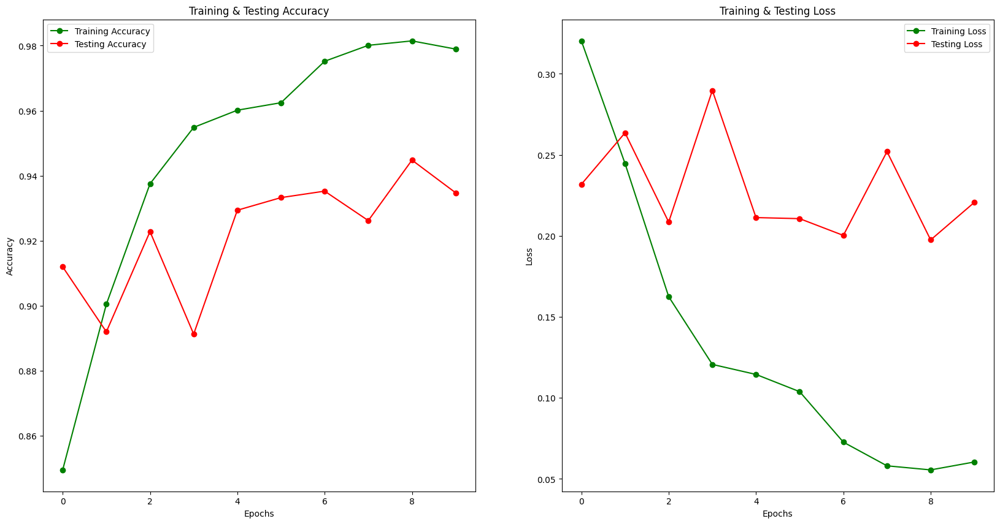

In [ ]:
print_graphs(history_rnn)

In [ ]:
predicted_categories_rnn = [1 * (x[0]>=0.5) for x in scores]
cm_rnn = confusion_matrix(y_test,predicted_categories_rnn)
cm_rnn = pd.DataFrame(cm_rnn , index = ['Fake','Original'] , columns = ['Fake','Original'])

Text(95.72222222222221, 0.5, 'Actual')

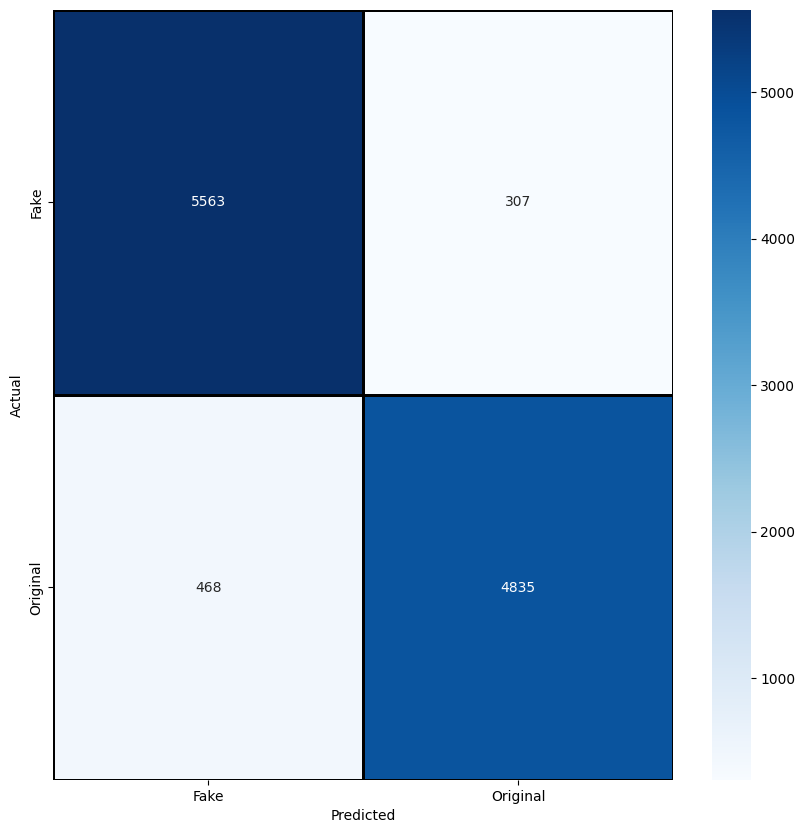

In [ ]:
plt.figure(figsize = (10,10))
sns.heatmap(cm_rnn,cmap= "Blues", linecolor = 'black' , linewidth = 1 , annot = True, fmt='' , xticklabels = ['Fake','Original'] , yticklabels = ['Fake','Original'])
plt.xlabel("Predicted")
plt.ylabel("Actual")

In [ ]:
scores_model = []
scores_model.append({'Model': 'SimpleRNN','AUC_Score': roc_auc(scores,y_test)})

In [ ]:
path_model_rnn = '/content/gdrive/MyDrive/Estudos/Data_Science/PUC_RIO/Sprint_2/MVP/models/rnn'
model_rnn.save_weights(path_model_rnn)
model_rnn.save(path_model_rnn)

#new_model = tf.keras.models.load_model('saved_model/my_model') -- como dar load no modelo

In [ ]:
with open('/content/gdrive/MyDrive/Estudos/Data_Science/PUC_RIO/Sprint_2/MVP/models/rnn/trainHistoryDict', 'wb') as file_pi:
    pickle.dump(history_rnn.history, file_pi)

In [ ]:
'''
with open('/trainHistoryDict', "rb") as file_pi:
    history_read = pickle.load(file_pi)
'''

##### **LSTM**

Testaremos também com uma evolução das redes recorrentes, sendo a LSTM melhor empregada para problemas de classificação dos textos.

In [ ]:
%%time
with strategy.scope():

    # Um LSTM náo treinável
    model_lstm = Sequential()
    model_lstm.add(Embedding(max_features,
                     output_dim=embed_size,
                     input_length=max_len,
                     trainable=False))

    model_lstm.add(LSTM(units = 128, return_sequences = True, dropout=0.25, recurrent_dropout=0.25))
    model_lstm.add(LSTM(units=64 , recurrent_dropout = 0.1 , dropout = 0.1))
    model_lstm.add(Dense(units = 32 , activation = 'relu'))
    model_lstm.add(Dense(1, activation='sigmoid'))
    model_lstm.compile(optimizer=keras.optimizers.Adam(lr = 0.01), loss='binary_crossentropy', metrics=['accuracy'])

model_lstm.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 300, 300)          3000000   
                                                                 
 lstm (LSTM)                 (None, 300, 128)          219648    
                                                                 
 lstm_1 (LSTM)               (None, 64)                49408     
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 3,271,169
Trainable params: 271,169
Non-trainable params: 3,000,000
_________________________________________________________________
CPU times: user 677 ms, sys: 19.3 ms, 

In [ ]:
path_model_lstm = '/content/gdrive/MyDrive/Estudos/Data_Science/PUC_RIO/Sprint_2/MVP/models/lstm'

cp_callback_lstm = ModelCheckpoint(
    filepath=path_model_lstm,
    verbose=1,
    save_best_only=True,
    save_weights_only=False,
    save_freq=1)

In [ ]:
history_lstm = model_lstm.fit(X_train_pad, y_train,
                         validation_split=0.3,
                         epochs=epochs,
                         batch_size=batch_size,
                         callbacks=[cp_callback_lstm],
                         verbose = 1)

Epoch 1/10


  1/367 [..............................] - ETA: 1:01:21 - loss: 0.6924 - accuracy: 0.6094

  2/367 [..............................] - ETA: 14:26 - loss: 0.7161 - accuracy: 0.5234  

  3/367 [..............................] - ETA: 14:26 - loss: 0.7072 - accuracy: 0.5521

  4/367 [..............................] - ETA: 14:30 - loss: 0.7030 - accuracy: 0.5312

  5/367 [..............................] - ETA: 17:07 - loss: 0.6969 - accuracy: 0.5437

  6/367 [..............................] - ETA: 17:15 - loss: 0.6919 - accuracy: 0.5495

  7/367 [..............................] - ETA: 18:11 - loss: 0.6871 - accuracy: 0.5603

  8/367 [..............................] - ETA: 19:02 - loss: 0.6717 - accuracy: 0.5918

  9/367 [..............................] - ETA: 21:06 - loss: 0.6589 - accuracy: 0.6007

 10/367 [..............................] - ETA: 21:14 - loss: 0.7438 - accuracy: 0.5953

 11/367 [..............................] - ETA: 21:03 - loss: 0.7416 - accuracy: 0.5938

 12/367 [..............................] - ETA: 20:26 - loss: 0.7295 - accuracy: 0.6016

 13/367 [>.............................] - ETA: 20:54 - loss: 0.7230 - accuracy: 0.6058

 14/367 [>.............................] - ETA: 20:18 - loss: 0.7169 - accuracy: 0.6094

 15/367 [>.............................] - ETA: 19:48 - loss: 0.7100 - accuracy: 0.6167

 16/367 [>.............................] - ETA: 19:20 - loss: 0.7022 - accuracy: 0.6279

 17/367 [>.............................] - ETA: 18:57 - loss: 0.6959 - accuracy: 0.6351

 18/367 [>.............................] - ETA: 19:20 - loss: 0.6880 - accuracy: 0.6450

 19/367 [>.............................] - ETA: 19:02 - loss: 0.6833 - accuracy: 0.6456

 20/367 [>.............................] - ETA: 18:42 - loss: 0.6755 - accuracy: 0.6539

 21/367 [>.............................] - ETA: 18:23 - loss: 0.6655 - accuracy: 0.6600

 22/367 [>.............................] - ETA: 18:06 - loss: 0.6555 - accuracy: 0.6669

 23/367 [>.............................] - ETA: 18:16 - loss: 0.6511 - accuracy: 0.6719

 24/367 [>.............................] - ETA: 18:12 - loss: 0.6417 - accuracy: 0.6784

 25/367 [=>............................] - ETA: 18:10 - loss: 0.6402 - accuracy: 0.6781

 26/367 [=>............................] - ETA: 18:11 - loss: 0.6324 - accuracy: 0.6839

 27/367 [=>............................] - ETA: 19:05 - loss: 0.6274 - accuracy: 0.6858

 28/367 [=>............................] - ETA: 19:18 - loss: 0.6221 - accuracy: 0.6875

 29/367 [=>............................] - ETA: 19:01 - loss: 0.6167 - accuracy: 0.6902

 30/367 [=>............................] - ETA: 18:47 - loss: 0.6090 - accuracy: 0.6953

 31/367 [=>............................] - ETA: 18:41 - loss: 0.6052 - accuracy: 0.6976

 32/367 [=>............................] - ETA: 18:46 - loss: 0.6007 - accuracy: 0.6997

 33/367 [=>............................] - ETA: 18:32 - loss: 0.5960 - accuracy: 0.7022

 34/367 [=>............................] - ETA: 18:19 - loss: 0.5980 - accuracy: 0.6999

 35/367 [=>............................] - ETA: 18:07 - loss: 0.5916 - accuracy: 0.7031

 36/367 [=>............................] - ETA: 17:54 - loss: 0.5860 - accuracy: 0.7070

 37/367 [==>...........................] - ETA: 18:05 - loss: 0.5788 - accuracy: 0.7107

 38/367 [==>...........................] - ETA: 17:55 - loss: 0.5708 - accuracy: 0.7155

 39/367 [==>...........................] - ETA: 17:44 - loss: 0.5683 - accuracy: 0.7175

 40/367 [==>...........................] - ETA: 17:34 - loss: 0.5616 - accuracy: 0.7211

 41/367 [==>...........................] - ETA: 17:23 - loss: 0.5560 - accuracy: 0.7248

 42/367 [==>...........................] - ETA: 17:30 - loss: 0.5536 - accuracy: 0.7266

 43/367 [==>...........................] - ETA: 17:24 - loss: 0.5497 - accuracy: 0.7286

 44/367 [==>...........................] - ETA: 17:14 - loss: 0.5439 - accuracy: 0.7319

 45/367 [==>...........................] - ETA: 17:05 - loss: 0.5379 - accuracy: 0.7344

 46/367 [==>...........................] - ETA: 16:56 - loss: 0.5344 - accuracy: 0.7364

 47/367 [==>...........................] - ETA: 16:58 - loss: 0.5295 - accuracy: 0.7394

 48/367 [==>...........................] - ETA: 16:56 - loss: 0.5274 - accuracy: 0.7412

 49/367 [===>..........................] - ETA: 16:48 - loss: 0.5256 - accuracy: 0.7417

 50/367 [===>..........................] - ETA: 16:39 - loss: 0.5238 - accuracy: 0.7425

 51/367 [===>..........................] - ETA: 16:31 - loss: 0.5207 - accuracy: 0.7439

 52/367 [===>..........................] - ETA: 16:31 - loss: 0.5165 - accuracy: 0.7461

 53/367 [===>..........................] - ETA: 16:31 - loss: 0.5127 - accuracy: 0.7485

 54/367 [===>..........................] - ETA: 16:23 - loss: 0.5122 - accuracy: 0.7491

 55/367 [===>..........................] - ETA: 16:15 - loss: 0.5075 - accuracy: 0.7520

 56/367 [===>..........................] - ETA: 16:08 - loss: 0.5064 - accuracy: 0.7533

 57/367 [===>..........................] - ETA: 16:06 - loss: 0.5023 - accuracy: 0.7563

 58/367 [===>..........................] - ETA: 16:07 - loss: 0.4998 - accuracy: 0.7578

 59/367 [===>..........................] - ETA: 15:59 - loss: 0.4965 - accuracy: 0.7598

 60/367 [===>..........................] - ETA: 15:59 - loss: 0.4944 - accuracy: 0.7609

 61/367 [===>..........................] - ETA: 15:53 - loss: 0.4903 - accuracy: 0.7633

 62/367 [====>.........................] - ETA: 15:56 - loss: 0.4884 - accuracy: 0.7644

 63/367 [====>.........................] - ETA: 15:52 - loss: 0.4854 - accuracy: 0.7661

 64/367 [====>.........................] - ETA: 15:45 - loss: 0.4831 - accuracy: 0.7673

 65/367 [====>.........................] - ETA: 15:43 - loss: 0.4833 - accuracy: 0.7668

 66/367 [====>.........................] - ETA: 15:37 - loss: 0.4803 - accuracy: 0.7682

 67/367 [====>.........................] - ETA: 15:41 - loss: 0.4778 - accuracy: 0.7698

 68/367 [====>.........................] - ETA: 15:34 - loss: 0.4745 - accuracy: 0.7714

 69/367 [====>.........................] - ETA: 15:28 - loss: 0.4754 - accuracy: 0.7706

 70/367 [====>.........................] - ETA: 15:22 - loss: 0.4739 - accuracy: 0.7719

 71/367 [====>.........................] - ETA: 15:15 - loss: 0.4717 - accuracy: 0.7733

 72/367 [====>.........................] - ETA: 15:23 - loss: 0.4702 - accuracy: 0.7745

 73/367 [====>.........................] - ETA: 15:17 - loss: 0.4694 - accuracy: 0.7744

 74/367 [=====>........................] - ETA: 15:11 - loss: 0.4696 - accuracy: 0.7739

 75/367 [=====>........................] - ETA: 15:05 - loss: 0.4686 - accuracy: 0.7740

 76/367 [=====>........................] - ETA: 15:01 - loss: 0.4689 - accuracy: 0.7732

 77/367 [=====>........................] - ETA: 15:02 - loss: 0.4673 - accuracy: 0.7746

 78/367 [=====>........................] - ETA: 14:57 - loss: 0.4654 - accuracy: 0.7760

 79/367 [=====>........................] - ETA: 14:51 - loss: 0.4660 - accuracy: 0.7761

 80/367 [=====>........................] - ETA: 14:45 - loss: 0.4650 - accuracy: 0.7766

 81/367 [=====>........................] - ETA: 14:39 - loss: 0.4650 - accuracy: 0.7762

 82/367 [=====>........................] - ETA: 14:42 - loss: 0.4631 - accuracy: 0.7774

 83/367 [=====>........................] - ETA: 14:36 - loss: 0.4630 - accuracy: 0.7771

 84/367 [=====>........................] - ETA: 14:31 - loss: 0.4604 - accuracy: 0.7786

 85/367 [=====>........................] - ETA: 14:26 - loss: 0.4594 - accuracy: 0.7794

 86/367 [======>.......................] - ETA: 14:20 - loss: 0.4578 - accuracy: 0.7803

 87/367 [======>.......................] - ETA: 14:21 - loss: 0.4565 - accuracy: 0.7807

 88/367 [======>.......................] - ETA: 14:17 - loss: 0.4563 - accuracy: 0.7807

 89/367 [======>.......................] - ETA: 14:12 - loss: 0.4550 - accuracy: 0.7807

 90/367 [======>.......................] - ETA: 14:07 - loss: 0.4533 - accuracy: 0.7818

 91/367 [======>.......................] - ETA: 14:02 - loss: 0.4527 - accuracy: 0.7823

 92/367 [======>.......................] - ETA: 14:02 - loss: 0.4504 - accuracy: 0.7836

 93/367 [======>.......................] - ETA: 13:59 - loss: 0.4489 - accuracy: 0.7848

 94/367 [======>.......................] - ETA: 13:54 - loss: 0.4480 - accuracy: 0.7851

 95/367 [======>.......................] - ETA: 13:49 - loss: 0.4485 - accuracy: 0.7854

 96/367 [======>.......................] - ETA: 13:44 - loss: 0.4474 - accuracy: 0.7856

 97/367 [======>.......................] - ETA: 13:42 - loss: 0.4456 - accuracy: 0.7867

 98/367 [=======>......................] - ETA: 13:41 - loss: 0.4465 - accuracy: 0.7864

 99/367 [=======>......................] - ETA: 13:36 - loss: 0.4466 - accuracy: 0.7861

100/367 [=======>......................] - ETA: 13:31 - loss: 0.4454 - accuracy: 0.7867

101/367 [=======>......................] - ETA: 13:26 - loss: 0.4460 - accuracy: 0.7857

102/367 [=======>......................] - ETA: 13:28 - loss: 0.4449 - accuracy: 0.7857

103/367 [=======>......................] - ETA: 13:26 - loss: 0.4439 - accuracy: 0.7858

104/367 [=======>......................] - ETA: 13:21 - loss: 0.4435 - accuracy: 0.7855

105/367 [=======>......................] - ETA: 13:16 - loss: 0.4423 - accuracy: 0.7862

106/367 [=======>......................] - ETA: 13:12 - loss: 0.4411 - accuracy: 0.7869

107/367 [=======>......................] - ETA: 13:10 - loss: 0.4400 - accuracy: 0.7874

108/367 [=======>......................] - ETA: 13:08 - loss: 0.4398 - accuracy: 0.7880

109/367 [=======>......................] - ETA: 13:04 - loss: 0.4391 - accuracy: 0.7880

110/367 [=======>......................] - ETA: 12:59 - loss: 0.4392 - accuracy: 0.7878

111/367 [========>.....................] - ETA: 12:55 - loss: 0.4380 - accuracy: 0.7884

112/367 [========>.....................] - ETA: 12:52 - loss: 0.4358 - accuracy: 0.7898

113/367 [========>.....................] - ETA: 12:51 - loss: 0.4354 - accuracy: 0.7900

114/367 [========>.....................] - ETA: 12:46 - loss: 0.4349 - accuracy: 0.7897

115/367 [========>.....................] - ETA: 12:42 - loss: 0.4339 - accuracy: 0.7899

116/367 [========>.....................] - ETA: 12:37 - loss: 0.4332 - accuracy: 0.7904

117/367 [========>.....................] - ETA: 12:34 - loss: 0.4322 - accuracy: 0.7911

118/367 [========>.....................] - ETA: 12:34 - loss: 0.4319 - accuracy: 0.7914

119/367 [========>.....................] - ETA: 12:29 - loss: 0.4302 - accuracy: 0.7924

120/367 [========>.....................] - ETA: 12:25 - loss: 0.4292 - accuracy: 0.7931

121/367 [========>.....................] - ETA: 12:21 - loss: 0.4292 - accuracy: 0.7933

122/367 [========>.....................] - ETA: 12:17 - loss: 0.4273 - accuracy: 0.7947

123/367 [=========>....................] - ETA: 12:17 - loss: 0.4259 - accuracy: 0.7959

124/367 [=========>....................] - ETA: 12:13 - loss: 0.4245 - accuracy: 0.7967

125/367 [=========>....................] - ETA: 12:08 - loss: 0.4237 - accuracy: 0.7974

126/367 [=========>....................] - ETA: 12:04 - loss: 0.4309 - accuracy: 0.7965

127/367 [=========>....................] - ETA: 12:00 - loss: 0.4292 - accuracy: 0.7976

128/367 [=========>....................] - ETA: 12:00 - loss: 0.4282 - accuracy: 0.7983

129/367 [=========>....................] - ETA: 11:56 - loss: 0.4267 - accuracy: 0.7994

130/367 [=========>....................] - ETA: 11:52 - loss: 0.4257 - accuracy: 0.8002

131/367 [=========>....................] - ETA: 11:48 - loss: 0.4258 - accuracy: 0.7996

132/367 [=========>....................] - ETA: 11:44 - loss: 0.4261 - accuracy: 0.7990

133/367 [=========>....................] - ETA: 11:43 - loss: 0.4255 - accuracy: 0.7997

134/367 [=========>....................] - ETA: 11:39 - loss: 0.4249 - accuracy: 0.7999

135/367 [==========>...................] - ETA: 11:35 - loss: 0.4241 - accuracy: 0.8008

136/367 [==========>...................] - ETA: 11:31 - loss: 0.4244 - accuracy: 0.8014

137/367 [==========>...................] - ETA: 11:27 - loss: 0.4234 - accuracy: 0.8020

138/367 [==========>...................] - ETA: 11:26 - loss: 0.4234 - accuracy: 0.8021

139/367 [==========>...................] - ETA: 11:23 - loss: 0.4222 - accuracy: 0.8028

140/367 [==========>...................] - ETA: 11:19 - loss: 0.4225 - accuracy: 0.8033

141/367 [==========>...................] - ETA: 11:15 - loss: 0.4218 - accuracy: 0.8037

142/367 [==========>...................] - ETA: 11:11 - loss: 0.4207 - accuracy: 0.8044

143/367 [==========>...................] - ETA: 11:09 - loss: 0.4194 - accuracy: 0.8051

144/367 [==========>...................] - ETA: 11:07 - loss: 0.4186 - accuracy: 0.8054

145/367 [==========>...................] - ETA: 11:03 - loss: 0.4172 - accuracy: 0.8060

146/367 [==========>...................] - ETA: 10:59 - loss: 0.4158 - accuracy: 0.8070

147/367 [===========>..................] - ETA: 10:55 - loss: 0.4193 - accuracy: 0.8065

148/367 [===========>..................] - ETA: 10:52 - loss: 0.4192 - accuracy: 0.8060

149/367 [===========>..................] - ETA: 10:51 - loss: 0.4189 - accuracy: 0.8061

150/367 [===========>..................] - ETA: 10:47 - loss: 0.4187 - accuracy: 0.8062

151/367 [===========>..................] - ETA: 10:43 - loss: 0.4186 - accuracy: 0.8064

152/367 [===========>..................] - ETA: 10:39 - loss: 0.4181 - accuracy: 0.8066

153/367 [===========>..................] - ETA: 10:36 - loss: 0.4181 - accuracy: 0.8065

154/367 [===========>..................] - ETA: 10:35 - loss: 0.4182 - accuracy: 0.8066

155/367 [===========>..................] - ETA: 10:31 - loss: 0.4175 - accuracy: 0.8070

156/367 [===========>..................] - ETA: 10:27 - loss: 0.4165 - accuracy: 0.8075

157/367 [===========>..................] - ETA: 10:24 - loss: 0.4159 - accuracy: 0.8078

158/367 [===========>..................] - ETA: 10:20 - loss: 0.4150 - accuracy: 0.8084

159/367 [===========>..................] - ETA: 10:19 - loss: 0.4154 - accuracy: 0.8083

160/367 [============>.................] - ETA: 10:16 - loss: 0.4148 - accuracy: 0.8086

161/367 [============>.................] - ETA: 10:12 - loss: 0.4150 - accuracy: 0.8086

162/367 [============>.................] - ETA: 10:08 - loss: 0.4146 - accuracy: 0.8088

163/367 [============>.................] - ETA: 10:04 - loss: 0.4139 - accuracy: 0.8091

164/367 [============>.................] - ETA: 10:03 - loss: 0.4134 - accuracy: 0.8095

165/367 [============>.................] - ETA: 10:00 - loss: 0.4132 - accuracy: 0.8096

166/367 [============>.................] - ETA: 9:56 - loss: 0.4124 - accuracy: 0.8101 

167/367 [============>.................] - ETA: 9:52 - loss: 0.4112 - accuracy: 0.8107

168/367 [============>.................] - ETA: 9:49 - loss: 0.4104 - accuracy: 0.8109

169/367 [============>.................] - ETA: 9:47 - loss: 0.4106 - accuracy: 0.8107

170/367 [============>.................] - ETA: 9:44 - loss: 0.4105 - accuracy: 0.8111

171/367 [============>.................] - ETA: 9:41 - loss: 0.4100 - accuracy: 0.8115

172/367 [=============>................] - ETA: 9:37 - loss: 0.4093 - accuracy: 0.8120

173/367 [=============>................] - ETA: 9:33 - loss: 0.4089 - accuracy: 0.8120

174/367 [=============>................] - ETA: 9:31 - loss: 0.4086 - accuracy: 0.8121

175/367 [=============>................] - ETA: 9:29 - loss: 0.4089 - accuracy: 0.8120

176/367 [=============>................] - ETA: 9:25 - loss: 0.4085 - accuracy: 0.8121

177/367 [=============>................] - ETA: 9:22 - loss: 0.4075 - accuracy: 0.8123

178/367 [=============>................] - ETA: 9:18 - loss: 0.4068 - accuracy: 0.8127

179/367 [=============>................] - ETA: 9:15 - loss: 0.4059 - accuracy: 0.8130

180/367 [=============>................] - ETA: 9:13 - loss: 0.4058 - accuracy: 0.8131

181/367 [=============>................] - ETA: 9:10 - loss: 0.4092 - accuracy: 0.8120

182/367 [=============>................] - ETA: 9:06 - loss: 0.4089 - accuracy: 0.8123

183/367 [=============>................] - ETA: 9:03 - loss: 0.4101 - accuracy: 0.8121

184/367 [==============>...............] - ETA: 8:59 - loss: 0.4125 - accuracy: 0.8106

185/367 [==============>...............] - ETA: 8:58 - loss: 0.4129 - accuracy: 0.8099

186/367 [==============>...............] - ETA: 8:55 - loss: 0.4133 - accuracy: 0.8097

187/367 [==============>...............] - ETA: 8:51 - loss: 0.4136 - accuracy: 0.8094

188/367 [==============>...............] - ETA: 8:48 - loss: 0.4135 - accuracy: 0.8098

189/367 [==============>...............] - ETA: 8:44 - loss: 0.4137 - accuracy: 0.8098

190/367 [==============>...............] - ETA: 8:42 - loss: 0.4137 - accuracy: 0.8097

191/367 [==============>...............] - ETA: 8:39 - loss: 0.4139 - accuracy: 0.8094

192/367 [==============>...............] - ETA: 8:36 - loss: 0.4143 - accuracy: 0.8091

193/367 [==============>...............] - ETA: 8:33 - loss: 0.4142 - accuracy: 0.8091

194/367 [==============>...............] - ETA: 8:29 - loss: 0.4142 - accuracy: 0.8090

195/367 [==============>...............] - ETA: 8:27 - loss: 0.4146 - accuracy: 0.8087

196/367 [===============>..............] - ETA: 8:24 - loss: 0.4146 - accuracy: 0.8084

197/367 [===============>..............] - ETA: 8:21 - loss: 0.4147 - accuracy: 0.8083

198/367 [===============>..............] - ETA: 8:17 - loss: 0.4146 - accuracy: 0.8085

199/367 [===============>..............] - ETA: 8:14 - loss: 0.4143 - accuracy: 0.8087

200/367 [===============>..............] - ETA: 8:12 - loss: 0.4138 - accuracy: 0.8088

201/367 [===============>..............] - ETA: 8:09 - loss: 0.4133 - accuracy: 0.8091

202/367 [===============>..............] - ETA: 8:06 - loss: 0.4133 - accuracy: 0.8089

203/367 [===============>..............] - ETA: 8:02 - loss: 0.4131 - accuracy: 0.8089

204/367 [===============>..............] - ETA: 7:59 - loss: 0.4131 - accuracy: 0.8088

205/367 [===============>..............] - ETA: 7:56 - loss: 0.4130 - accuracy: 0.8088

206/367 [===============>..............] - ETA: 7:54 - loss: 0.4126 - accuracy: 0.8089

207/367 [===============>..............] - ETA: 7:51 - loss: 0.4120 - accuracy: 0.8093

208/367 [================>.............] - ETA: 7:47 - loss: 0.4115 - accuracy: 0.8096

209/367 [================>.............] - ETA: 7:44 - loss: 0.4117 - accuracy: 0.8094

210/367 [================>.............] - ETA: 7:41 - loss: 0.4115 - accuracy: 0.8097

211/367 [================>.............] - ETA: 7:39 - loss: 0.4116 - accuracy: 0.8095

212/367 [================>.............] - ETA: 7:36 - loss: 0.4110 - accuracy: 0.8099

213/367 [================>.............] - ETA: 7:32 - loss: 0.4103 - accuracy: 0.8104

214/367 [================>.............] - ETA: 7:29 - loss: 0.4096 - accuracy: 0.8108

215/367 [================>.............] - ETA: 7:26 - loss: 0.4092 - accuracy: 0.8111

216/367 [================>.............] - ETA: 7:24 - loss: 0.4082 - accuracy: 0.8116

217/367 [================>.............] - ETA: 7:21 - loss: 0.4077 - accuracy: 0.8120

218/367 [================>.............] - ETA: 7:18 - loss: 0.4079 - accuracy: 0.8120

219/367 [================>.............] - ETA: 7:14 - loss: 0.4071 - accuracy: 0.8124

220/367 [================>.............] - ETA: 7:11 - loss: 0.4068 - accuracy: 0.8126

221/367 [=================>............] - ETA: 7:09 - loss: 0.4066 - accuracy: 0.8125

222/367 [=================>............] - ETA: 7:06 - loss: 0.4059 - accuracy: 0.8129

223/367 [=================>............] - ETA: 7:03 - loss: 0.4053 - accuracy: 0.8132

224/367 [=================>............] - ETA: 6:59 - loss: 0.4045 - accuracy: 0.8137

225/367 [=================>............] - ETA: 6:56 - loss: 0.4048 - accuracy: 0.8137

226/367 [=================>............] - ETA: 6:54 - loss: 0.4048 - accuracy: 0.8137

227/367 [=================>............] - ETA: 6:51 - loss: 0.4042 - accuracy: 0.8142

228/367 [=================>............] - ETA: 6:48 - loss: 0.4035 - accuracy: 0.8145

229/367 [=================>............] - ETA: 6:44 - loss: 0.4032 - accuracy: 0.8145

230/367 [=================>............] - ETA: 6:41 - loss: 0.4030 - accuracy: 0.8145

231/367 [=================>............] - ETA: 6:39 - loss: 0.4026 - accuracy: 0.8147

232/367 [=================>............] - ETA: 6:36 - loss: 0.4021 - accuracy: 0.8149

233/367 [==================>...........] - ETA: 6:33 - loss: 0.4020 - accuracy: 0.8150

234/367 [==================>...........] - ETA: 6:29 - loss: 0.4017 - accuracy: 0.8152

235/367 [==================>...........] - ETA: 6:26 - loss: 0.4009 - accuracy: 0.8158

236/367 [==================>...........] - ETA: 6:24 - loss: 0.4003 - accuracy: 0.8163

237/367 [==================>...........] - ETA: 6:22 - loss: 0.3994 - accuracy: 0.8168

238/367 [==================>...........] - ETA: 6:19 - loss: 0.3992 - accuracy: 0.8170

239/367 [==================>...........] - ETA: 6:16 - loss: 0.3990 - accuracy: 0.8173

240/367 [==================>...........] - ETA: 6:12 - loss: 0.3986 - accuracy: 0.8174

241/367 [==================>...........] - ETA: 6:10 - loss: 0.3981 - accuracy: 0.8178

242/367 [==================>...........] - ETA: 6:07 - loss: 0.3974 - accuracy: 0.8183

243/367 [==================>...........] - ETA: 6:04 - loss: 0.3967 - accuracy: 0.8187

244/367 [==================>...........] - ETA: 6:01 - loss: 0.3962 - accuracy: 0.8190

245/367 [===================>..........] - ETA: 5:58 - loss: 0.3956 - accuracy: 0.8194

246/367 [===================>..........] - ETA: 5:55 - loss: 0.3946 - accuracy: 0.8199

247/367 [===================>..........] - ETA: 5:52 - loss: 0.3940 - accuracy: 0.8204

248/367 [===================>..........] - ETA: 5:49 - loss: 0.3930 - accuracy: 0.8209

249/367 [===================>..........] - ETA: 5:46 - loss: 0.3924 - accuracy: 0.8213

250/367 [===================>..........] - ETA: 5:43 - loss: 0.3915 - accuracy: 0.8218

251/367 [===================>..........] - ETA: 5:40 - loss: 0.3915 - accuracy: 0.8220

252/367 [===================>..........] - ETA: 5:37 - loss: 0.3910 - accuracy: 0.8222

253/367 [===================>..........] - ETA: 5:34 - loss: 0.3903 - accuracy: 0.8226

254/367 [===================>..........] - ETA: 5:31 - loss: 0.3898 - accuracy: 0.8228

255/367 [===================>..........] - ETA: 5:28 - loss: 0.3895 - accuracy: 0.8230

256/367 [===================>..........] - ETA: 5:25 - loss: 0.3892 - accuracy: 0.8232

257/367 [====================>.........] - ETA: 5:23 - loss: 0.3890 - accuracy: 0.8234

258/367 [====================>.........] - ETA: 5:19 - loss: 0.3887 - accuracy: 0.8235

259/367 [====================>.........] - ETA: 5:16 - loss: 0.3884 - accuracy: 0.8237

260/367 [====================>.........] - ETA: 5:13 - loss: 0.3879 - accuracy: 0.8240

261/367 [====================>.........] - ETA: 5:10 - loss: 0.3873 - accuracy: 0.8243

262/367 [====================>.........] - ETA: 5:08 - loss: 0.3867 - accuracy: 0.8248

263/367 [====================>.........] - ETA: 5:05 - loss: 0.3867 - accuracy: 0.8249

264/367 [====================>.........] - ETA: 5:01 - loss: 0.3864 - accuracy: 0.8251

265/367 [====================>.........] - ETA: 4:58 - loss: 0.3867 - accuracy: 0.8249

266/367 [====================>.........] - ETA: 4:55 - loss: 0.3860 - accuracy: 0.8254

267/367 [====================>.........] - ETA: 4:53 - loss: 0.3860 - accuracy: 0.8253

268/367 [====================>.........] - ETA: 4:50 - loss: 0.3859 - accuracy: 0.8253

269/367 [====================>.........] - ETA: 4:47 - loss: 0.3855 - accuracy: 0.8255

270/367 [=====================>........] - ETA: 4:44 - loss: 0.3858 - accuracy: 0.8253

271/367 [=====================>........] - ETA: 4:40 - loss: 0.3857 - accuracy: 0.8253

272/367 [=====================>........] - ETA: 4:38 - loss: 0.3853 - accuracy: 0.8254

273/367 [=====================>........] - ETA: 4:35 - loss: 0.3850 - accuracy: 0.8258

274/367 [=====================>........] - ETA: 4:32 - loss: 0.3847 - accuracy: 0.8258

275/367 [=====================>........] - ETA: 4:29 - loss: 0.3850 - accuracy: 0.8255

276/367 [=====================>........] - ETA: 4:26 - loss: 0.3850 - accuracy: 0.8253

277/367 [=====================>........] - ETA: 4:23 - loss: 0.3850 - accuracy: 0.8252

278/367 [=====================>........] - ETA: 4:20 - loss: 0.3852 - accuracy: 0.8252

279/367 [=====================>........] - ETA: 4:17 - loss: 0.3857 - accuracy: 0.8247

280/367 [=====================>........] - ETA: 4:14 - loss: 0.3859 - accuracy: 0.8244

281/367 [=====================>........] - ETA: 4:11 - loss: 0.3860 - accuracy: 0.8243

282/367 [======================>.......] - ETA: 4:08 - loss: 0.3860 - accuracy: 0.8241

283/367 [======================>.......] - ETA: 4:06 - loss: 0.3859 - accuracy: 0.8243

284/367 [======================>.......] - ETA: 4:02 - loss: 0.3858 - accuracy: 0.8243

285/367 [======================>.......] - ETA: 3:59 - loss: 0.3856 - accuracy: 0.8244

286/367 [======================>.......] - ETA: 3:56 - loss: 0.3855 - accuracy: 0.8245

287/367 [======================>.......] - ETA: 3:54 - loss: 0.3855 - accuracy: 0.8244

288/367 [======================>.......] - ETA: 3:51 - loss: 0.3851 - accuracy: 0.8247

289/367 [======================>.......] - ETA: 3:48 - loss: 0.3847 - accuracy: 0.8250

290/367 [======================>.......] - ETA: 3:45 - loss: 0.3847 - accuracy: 0.8250

291/367 [======================>.......] - ETA: 3:42 - loss: 0.3845 - accuracy: 0.8251

292/367 [======================>.......] - ETA: 3:39 - loss: 0.3841 - accuracy: 0.8252

293/367 [======================>.......] - ETA: 3:36 - loss: 0.3840 - accuracy: 0.8252

294/367 [=======================>......] - ETA: 3:33 - loss: 0.3838 - accuracy: 0.8252

295/367 [=======================>......] - ETA: 3:30 - loss: 0.3838 - accuracy: 0.8252

296/367 [=======================>......] - ETA: 3:27 - loss: 0.3834 - accuracy: 0.8254

297/367 [=======================>......] - ETA: 3:24 - loss: 0.3830 - accuracy: 0.8256

298/367 [=======================>......] - ETA: 3:21 - loss: 0.3829 - accuracy: 0.8255

299/367 [=======================>......] - ETA: 3:18 - loss: 0.3828 - accuracy: 0.8255

300/367 [=======================>......] - ETA: 3:15 - loss: 0.3828 - accuracy: 0.8256

301/367 [=======================>......] - ETA: 3:12 - loss: 0.3821 - accuracy: 0.8259

302/367 [=======================>......] - ETA: 3:09 - loss: 0.3813 - accuracy: 0.8262

303/367 [=======================>......] - ETA: 3:07 - loss: 0.3811 - accuracy: 0.8263

304/367 [=======================>......] - ETA: 3:04 - loss: 0.3805 - accuracy: 0.8265

305/367 [=======================>......] - ETA: 3:01 - loss: 0.3806 - accuracy: 0.8264

306/367 [========================>.....] - ETA: 2:58 - loss: 0.3809 - accuracy: 0.8261

307/367 [========================>.....] - ETA: 2:55 - loss: 0.3810 - accuracy: 0.8258

308/367 [========================>.....] - ETA: 2:52 - loss: 0.3808 - accuracy: 0.8258

309/367 [========================>.....] - ETA: 2:49 - loss: 0.3802 - accuracy: 0.8260

310/367 [========================>.....] - ETA: 2:46 - loss: 0.3798 - accuracy: 0.8261

311/367 [========================>.....] - ETA: 2:43 - loss: 0.3794 - accuracy: 0.8262

312/367 [========================>.....] - ETA: 2:40 - loss: 0.3794 - accuracy: 0.8264

313/367 [========================>.....] - ETA: 2:37 - loss: 0.3792 - accuracy: 0.8266

314/367 [========================>.....] - ETA: 2:34 - loss: 0.3789 - accuracy: 0.8266

315/367 [========================>.....] - ETA: 2:31 - loss: 0.3789 - accuracy: 0.8264

316/367 [========================>.....] - ETA: 2:28 - loss: 0.3786 - accuracy: 0.8265

317/367 [========================>.....] - ETA: 2:25 - loss: 0.3783 - accuracy: 0.8267

318/367 [========================>.....] - ETA: 2:23 - loss: 0.3782 - accuracy: 0.8268

319/367 [=========================>....] - ETA: 2:20 - loss: 0.3782 - accuracy: 0.8269

320/367 [=========================>....] - ETA: 2:17 - loss: 0.3779 - accuracy: 0.8270

321/367 [=========================>....] - ETA: 2:14 - loss: 0.3775 - accuracy: 0.8271

322/367 [=========================>....] - ETA: 2:11 - loss: 0.3774 - accuracy: 0.8272

323/367 [=========================>....] - ETA: 2:08 - loss: 0.3768 - accuracy: 0.8276

324/367 [=========================>....] - ETA: 2:05 - loss: 0.3767 - accuracy: 0.8277

325/367 [=========================>....] - ETA: 2:02 - loss: 0.3765 - accuracy: 0.8279

326/367 [=========================>....] - ETA: 1:59 - loss: 0.3764 - accuracy: 0.8280

327/367 [=========================>....] - ETA: 1:56 - loss: 0.3763 - accuracy: 0.8281

328/367 [=========================>....] - ETA: 1:53 - loss: 0.3761 - accuracy: 0.8283

329/367 [=========================>....] - ETA: 1:50 - loss: 0.3756 - accuracy: 0.8286

330/367 [=========================>....] - ETA: 1:47 - loss: 0.3751 - accuracy: 0.8287

331/367 [==========================>...] - ETA: 1:45 - loss: 0.3746 - accuracy: 0.8290

332/367 [==========================>...] - ETA: 1:42 - loss: 0.3743 - accuracy: 0.8293

333/367 [==========================>...] - ETA: 1:39 - loss: 0.3740 - accuracy: 0.8295

334/367 [==========================>...] - ETA: 1:36 - loss: 0.3736 - accuracy: 0.8298

335/367 [==========================>...] - ETA: 1:33 - loss: 0.3732 - accuracy: 0.8300

336/367 [==========================>...] - ETA: 1:30 - loss: 0.3725 - accuracy: 0.8305

337/367 [==========================>...] - ETA: 1:27 - loss: 0.3723 - accuracy: 0.8306

338/367 [==========================>...] - ETA: 1:24 - loss: 0.3723 - accuracy: 0.8306

339/367 [==========================>...] - ETA: 1:21 - loss: 0.3719 - accuracy: 0.8308

340/367 [==========================>...] - ETA: 1:18 - loss: 0.3713 - accuracy: 0.8312

341/367 [==========================>...] - ETA: 1:15 - loss: 0.3709 - accuracy: 0.8314

342/367 [==========================>...] - ETA: 1:12 - loss: 0.3702 - accuracy: 0.8317

343/367 [===========================>..] - ETA: 1:09 - loss: 0.3697 - accuracy: 0.8321

344/367 [===========================>..] - ETA: 1:07 - loss: 0.3693 - accuracy: 0.8322

345/367 [===========================>..] - ETA: 1:04 - loss: 0.3686 - accuracy: 0.8325

346/367 [===========================>..] - ETA: 1:01 - loss: 0.3684 - accuracy: 0.8327

347/367 [===========================>..] - ETA: 58s - loss: 0.3682 - accuracy: 0.8329 

348/367 [===========================>..] - ETA: 55s - loss: 0.3684 - accuracy: 0.8327

349/367 [===========================>..] - ETA: 52s - loss: 0.3682 - accuracy: 0.8329

350/367 [===========================>..] - ETA: 49s - loss: 0.3681 - accuracy: 0.8330

351/367 [===========================>..] - ETA: 46s - loss: 0.3679 - accuracy: 0.8332

352/367 [===========================>..] - ETA: 43s - loss: 0.3677 - accuracy: 0.8332

353/367 [===========================>..] - ETA: 40s - loss: 0.3676 - accuracy: 0.8332

354/367 [===========================>..] - ETA: 37s - loss: 0.3673 - accuracy: 0.8333

355/367 [============================>.] - ETA: 34s - loss: 0.3671 - accuracy: 0.8335

356/367 [============================>.] - ETA: 32s - loss: 0.3669 - accuracy: 0.8335

357/367 [============================>.] - ETA: 29s - loss: 0.3667 - accuracy: 0.8336

358/367 [============================>.] - ETA: 26s - loss: 0.3663 - accuracy: 0.8339

359/367 [============================>.] - ETA: 23s - loss: 0.3662 - accuracy: 0.8339

360/367 [============================>.] - ETA: 20s - loss: 0.3660 - accuracy: 0.8341

361/367 [============================>.] - ETA: 17s - loss: 0.3656 - accuracy: 0.8343

362/367 [============================>.] - ETA: 14s - loss: 0.3650 - accuracy: 0.8346

363/367 [============================>.] - ETA: 11s - loss: 0.3645 - accuracy: 0.8349

364/367 [============================>.] - ETA: 8s - loss: 0.3642 - accuracy: 0.8351 

365/367 [============================>.] - ETA: 5s - loss: 0.3637 - accuracy: 0.8354

366/367 [============================>.] - ETA: 2s - loss: 0.3630 - accuracy: 0.8358

367/367 [==============================] - 1155s 3s/step - loss: 0.3627 - accuracy: 0.8358 - val_loss: 0.1989 - val_accuracy: 0.9210
Epoch 2/10


  1/367 [..............................] - ETA: 22:04 - loss: 0.1458 - accuracy: 0.9375

  2/367 [..............................] - ETA: 14:29 - loss: 0.1286 - accuracy: 0.9375

  3/367 [..............................] - ETA: 14:31 - loss: 0.1419 - accuracy: 0.9375

  4/367 [..............................] - ETA: 14:26 - loss: 0.2152 - accuracy: 0.9062

  5/367 [..............................] - ETA: 15:36 - loss: 0.1956 - accuracy: 0.9156

  6/367 [..............................] - ETA: 17:14 - loss: 0.1890 - accuracy: 0.9167

  7/367 [..............................] - ETA: 16:41 - loss: 0.2017 - accuracy: 0.9085

  8/367 [..............................] - ETA: 16:20 - loss: 0.2162 - accuracy: 0.8984

  9/367 [..............................] - ETA: 16:01 - loss: 0.2290 - accuracy: 0.8941

 10/367 [..............................] - ETA: 15:56 - loss: 0.2257 - accuracy: 0.9000

 11/367 [..............................] - ETA: 16:59 - loss: 0.2266 - accuracy: 0.9034

 12/367 [..............................] - ETA: 16:41 - loss: 0.2256 - accuracy: 0.9049

 13/367 [>.............................] - ETA: 16:25 - loss: 0.2234 - accuracy: 0.9050

 14/367 [>.............................] - ETA: 16:12 - loss: 0.2444 - accuracy: 0.8996

 15/367 [>.............................] - ETA: 16:00 - loss: 0.2499 - accuracy: 0.8979

 16/367 [>.............................] - ETA: 16:45 - loss: 0.2514 - accuracy: 0.8965

 17/367 [>.............................] - ETA: 16:32 - loss: 0.2526 - accuracy: 0.8961

 18/367 [>.............................] - ETA: 16:19 - loss: 0.2626 - accuracy: 0.8906

 19/367 [>.............................] - ETA: 16:09 - loss: 0.2635 - accuracy: 0.8898

 20/367 [>.............................] - ETA: 16:00 - loss: 0.2638 - accuracy: 0.8906

 21/367 [>.............................] - ETA: 16:25 - loss: 0.2645 - accuracy: 0.8906

 22/367 [>.............................] - ETA: 16:20 - loss: 0.2652 - accuracy: 0.8906

 23/367 [>.............................] - ETA: 16:10 - loss: 0.2657 - accuracy: 0.8920

 24/367 [>.............................] - ETA: 16:02 - loss: 0.2644 - accuracy: 0.8919

 25/367 [=>............................] - ETA: 15:54 - loss: 0.2663 - accuracy: 0.8919

 26/367 [=>............................] - ETA: 16:07 - loss: 0.2674 - accuracy: 0.8924

 27/367 [=>............................] - ETA: 16:08 - loss: 0.2656 - accuracy: 0.8929

 28/367 [=>............................] - ETA: 15:59 - loss: 0.2643 - accuracy: 0.8934

 29/367 [=>............................] - ETA: 15:51 - loss: 0.2626 - accuracy: 0.8949

 30/367 [=>............................] - ETA: 15:43 - loss: 0.2632 - accuracy: 0.8938

 31/367 [=>............................] - ETA: 15:51 - loss: 0.2623 - accuracy: 0.8936

 32/367 [=>............................] - ETA: 15:55 - loss: 0.2601 - accuracy: 0.8945

 33/367 [=>............................] - ETA: 15:48 - loss: 0.2587 - accuracy: 0.8939

 34/367 [=>............................] - ETA: 15:40 - loss: 0.2595 - accuracy: 0.8934

 35/367 [=>............................] - ETA: 15:33 - loss: 0.2581 - accuracy: 0.8946

 36/367 [=>............................] - ETA: 15:35 - loss: 0.2587 - accuracy: 0.8941

 37/367 [==>...........................] - ETA: 15:41 - loss: 0.2592 - accuracy: 0.8936

 38/367 [==>...........................] - ETA: 15:34 - loss: 0.2594 - accuracy: 0.8939

 39/367 [==>...........................] - ETA: 15:27 - loss: 0.2593 - accuracy: 0.8942

 40/367 [==>...........................] - ETA: 15:20 - loss: 0.2606 - accuracy: 0.8938

 41/367 [==>...........................] - ETA: 15:19 - loss: 0.2575 - accuracy: 0.8956

 42/367 [==>...........................] - ETA: 15:27 - loss: 0.2559 - accuracy: 0.8969

 43/367 [==>...........................] - ETA: 15:21 - loss: 0.2569 - accuracy: 0.8957

 44/367 [==>...........................] - ETA: 15:15 - loss: 0.2558 - accuracy: 0.8967

 45/367 [==>...........................] - ETA: 15:09 - loss: 0.2570 - accuracy: 0.8969

 46/367 [==>...........................] - ETA: 15:07 - loss: 0.2562 - accuracy: 0.8974

 47/367 [==>...........................] - ETA: 15:14 - loss: 0.2581 - accuracy: 0.8949

 48/367 [==>...........................] - ETA: 15:08 - loss: 0.2605 - accuracy: 0.8939

 49/367 [===>..........................] - ETA: 15:02 - loss: 0.2614 - accuracy: 0.8935

 50/367 [===>..........................] - ETA: 14:56 - loss: 0.2618 - accuracy: 0.8931

 51/367 [===>..........................] - ETA: 14:51 - loss: 0.2612 - accuracy: 0.8937

 52/367 [===>..........................] - ETA: 15:00 - loss: 0.2601 - accuracy: 0.8942

 53/367 [===>..........................] - ETA: 14:55 - loss: 0.2601 - accuracy: 0.8948

 54/367 [===>..........................] - ETA: 14:49 - loss: 0.2595 - accuracy: 0.8953

 55/367 [===>..........................] - ETA: 14:43 - loss: 0.2593 - accuracy: 0.8955

 56/367 [===>..........................] - ETA: 14:38 - loss: 0.2590 - accuracy: 0.8956

 57/367 [===>..........................] - ETA: 14:45 - loss: 0.2562 - accuracy: 0.8972

 58/367 [===>..........................] - ETA: 14:41 - loss: 0.2553 - accuracy: 0.8979

 59/367 [===>..........................] - ETA: 14:35 - loss: 0.2562 - accuracy: 0.8978

 60/367 [===>..........................] - ETA: 14:30 - loss: 0.2546 - accuracy: 0.8987

 61/367 [===>..........................] - ETA: 14:25 - loss: 0.2548 - accuracy: 0.8993

 62/367 [====>.........................] - ETA: 14:29 - loss: 0.2540 - accuracy: 0.8997

 63/367 [====>.........................] - ETA: 14:26 - loss: 0.2524 - accuracy: 0.9003

 64/367 [====>.........................] - ETA: 14:21 - loss: 0.2514 - accuracy: 0.9009

 65/367 [====>.........................] - ETA: 14:16 - loss: 0.2503 - accuracy: 0.9014

 66/367 [====>.........................] - ETA: 14:12 - loss: 0.2510 - accuracy: 0.9010

 67/367 [====>.........................] - ETA: 14:14 - loss: 0.2482 - accuracy: 0.9025

 68/367 [====>.........................] - ETA: 14:13 - loss: 0.2474 - accuracy: 0.9030

 69/367 [====>.........................] - ETA: 14:08 - loss: 0.2451 - accuracy: 0.9040

 70/367 [====>.........................] - ETA: 14:03 - loss: 0.2444 - accuracy: 0.9045

 71/367 [====>.........................] - ETA: 13:58 - loss: 0.2430 - accuracy: 0.9051

 72/367 [====>.........................] - ETA: 13:58 - loss: 0.2429 - accuracy: 0.9049

 73/367 [====>.........................] - ETA: 13:58 - loss: 0.2429 - accuracy: 0.9050

 74/367 [=====>........................] - ETA: 13:54 - loss: 0.2475 - accuracy: 0.9035

 75/367 [=====>........................] - ETA: 13:49 - loss: 0.2511 - accuracy: 0.9021

 76/367 [=====>........................] - ETA: 13:45 - loss: 0.2525 - accuracy: 0.9013

 77/367 [=====>........................] - ETA: 13:43 - loss: 0.2548 - accuracy: 0.9000

 78/367 [=====>........................] - ETA: 13:44 - loss: 0.2589 - accuracy: 0.8978

 79/367 [=====>........................] - ETA: 13:40 - loss: 0.2595 - accuracy: 0.8975

 80/367 [=====>........................] - ETA: 13:35 - loss: 0.2582 - accuracy: 0.8977

 81/367 [=====>........................] - ETA: 13:31 - loss: 0.2587 - accuracy: 0.8974

 82/367 [=====>........................] - ETA: 13:27 - loss: 0.2590 - accuracy: 0.8969

 83/367 [=====>........................] - ETA: 13:30 - loss: 0.2590 - accuracy: 0.8972

 84/367 [=====>........................] - ETA: 13:26 - loss: 0.2597 - accuracy: 0.8968

 85/367 [=====>........................] - ETA: 13:21 - loss: 0.2598 - accuracy: 0.8965

 86/367 [======>.......................] - ETA: 13:17 - loss: 0.2607 - accuracy: 0.8959

 87/367 [======>.......................] - ETA: 13:13 - loss: 0.2604 - accuracy: 0.8966

 88/367 [======>.......................] - ETA: 13:16 - loss: 0.2604 - accuracy: 0.8967

 89/367 [======>.......................] - ETA: 13:12 - loss: 0.2614 - accuracy: 0.8962

 90/367 [======>.......................] - ETA: 13:08 - loss: 0.2628 - accuracy: 0.8958

 91/367 [======>.......................] - ETA: 13:03 - loss: 0.2630 - accuracy: 0.8958

 92/367 [======>.......................] - ETA: 12:59 - loss: 0.2620 - accuracy: 0.8964

 93/367 [======>.......................] - ETA: 13:01 - loss: 0.2619 - accuracy: 0.8967

 94/367 [======>.......................] - ETA: 12:58 - loss: 0.2623 - accuracy: 0.8964

 95/367 [======>.......................] - ETA: 12:54 - loss: 0.2627 - accuracy: 0.8961

 96/367 [======>.......................] - ETA: 12:50 - loss: 0.2617 - accuracy: 0.8966

 97/367 [======>.......................] - ETA: 12:46 - loss: 0.2623 - accuracy: 0.8963

 98/367 [=======>......................] - ETA: 12:47 - loss: 0.2629 - accuracy: 0.8957

 99/367 [=======>......................] - ETA: 12:44 - loss: 0.2630 - accuracy: 0.8950

100/367 [=======>......................] - ETA: 12:40 - loss: 0.2626 - accuracy: 0.8950

101/367 [=======>......................] - ETA: 12:36 - loss: 0.2638 - accuracy: 0.8943

102/367 [=======>......................] - ETA: 12:32 - loss: 0.2636 - accuracy: 0.8949

103/367 [=======>......................] - ETA: 12:32 - loss: 0.2635 - accuracy: 0.8949

104/367 [=======>......................] - ETA: 12:30 - loss: 0.2629 - accuracy: 0.8951

105/367 [=======>......................] - ETA: 12:26 - loss: 0.2624 - accuracy: 0.8955

106/367 [=======>......................] - ETA: 12:22 - loss: 0.2629 - accuracy: 0.8952

107/367 [=======>......................] - ETA: 12:18 - loss: 0.2624 - accuracy: 0.8954

108/367 [=======>......................] - ETA: 12:17 - loss: 0.2622 - accuracy: 0.8955

109/367 [=======>......................] - ETA: 12:16 - loss: 0.2618 - accuracy: 0.8955

110/367 [=======>......................] - ETA: 12:12 - loss: 0.2625 - accuracy: 0.8953

111/367 [========>.....................] - ETA: 12:08 - loss: 0.2619 - accuracy: 0.8957

112/367 [========>.....................] - ETA: 12:04 - loss: 0.2621 - accuracy: 0.8958

113/367 [========>.....................] - ETA: 12:02 - loss: 0.2616 - accuracy: 0.8960

114/367 [========>.....................] - ETA: 12:01 - loss: 0.2610 - accuracy: 0.8964

115/367 [========>.....................] - ETA: 11:58 - loss: 0.2602 - accuracy: 0.8967

116/367 [========>.....................] - ETA: 11:54 - loss: 0.2592 - accuracy: 0.8974

117/367 [========>.....................] - ETA: 11:50 - loss: 0.2595 - accuracy: 0.8972

118/367 [========>.....................] - ETA: 11:47 - loss: 0.2586 - accuracy: 0.8976

119/367 [========>.....................] - ETA: 11:47 - loss: 0.2583 - accuracy: 0.8976

120/367 [========>.....................] - ETA: 11:44 - loss: 0.2572 - accuracy: 0.8980

121/367 [========>.....................] - ETA: 11:40 - loss: 0.2565 - accuracy: 0.8982

122/367 [========>.....................] - ETA: 11:36 - loss: 0.2556 - accuracy: 0.8988

123/367 [=========>....................] - ETA: 11:33 - loss: 0.2547 - accuracy: 0.8993

124/367 [=========>....................] - ETA: 11:34 - loss: 0.2559 - accuracy: 0.8991

125/367 [=========>....................] - ETA: 11:30 - loss: 0.2555 - accuracy: 0.8990

126/367 [=========>....................] - ETA: 11:26 - loss: 0.2552 - accuracy: 0.8992

127/367 [=========>....................] - ETA: 11:22 - loss: 0.2540 - accuracy: 0.8999

128/367 [=========>....................] - ETA: 11:19 - loss: 0.2532 - accuracy: 0.9000

129/367 [=========>....................] - ETA: 11:19 - loss: 0.2520 - accuracy: 0.9006

130/367 [=========>....................] - ETA: 11:16 - loss: 0.2518 - accuracy: 0.9006

131/367 [=========>....................] - ETA: 11:12 - loss: 0.2518 - accuracy: 0.9005

132/367 [=========>....................] - ETA: 11:09 - loss: 0.2517 - accuracy: 0.9007

133/367 [=========>....................] - ETA: 11:05 - loss: 0.2531 - accuracy: 0.9003

134/367 [=========>....................] - ETA: 11:05 - loss: 0.2532 - accuracy: 0.9003

135/367 [==========>...................] - ETA: 11:02 - loss: 0.2520 - accuracy: 0.9009

136/367 [==========>...................] - ETA: 10:58 - loss: 0.2528 - accuracy: 0.9003

137/367 [==========>...................] - ETA: 10:55 - loss: 0.2525 - accuracy: 0.9004

138/367 [==========>...................] - ETA: 10:51 - loss: 0.2517 - accuracy: 0.9009

139/367 [==========>...................] - ETA: 10:51 - loss: 0.2516 - accuracy: 0.9007

140/367 [==========>...................] - ETA: 10:48 - loss: 0.2503 - accuracy: 0.9015

141/367 [==========>...................] - ETA: 10:44 - loss: 0.2499 - accuracy: 0.9015

142/367 [==========>...................] - ETA: 10:41 - loss: 0.2495 - accuracy: 0.9014

143/367 [==========>...................] - ETA: 10:37 - loss: 0.2491 - accuracy: 0.9014

144/367 [==========>...................] - ETA: 10:36 - loss: 0.2496 - accuracy: 0.9013

145/367 [==========>...................] - ETA: 10:34 - loss: 0.2504 - accuracy: 0.9005

146/367 [==========>...................] - ETA: 10:30 - loss: 0.2498 - accuracy: 0.9007

147/367 [===========>..................] - ETA: 10:26 - loss: 0.2493 - accuracy: 0.9010

148/367 [===========>..................] - ETA: 10:23 - loss: 0.2487 - accuracy: 0.9013

149/367 [===========>..................] - ETA: 10:21 - loss: 0.2480 - accuracy: 0.9015

150/367 [===========>..................] - ETA: 10:19 - loss: 0.2479 - accuracy: 0.9018

151/367 [===========>..................] - ETA: 10:16 - loss: 0.2476 - accuracy: 0.9020

152/367 [===========>..................] - ETA: 10:12 - loss: 0.2481 - accuracy: 0.9016

153/367 [===========>..................] - ETA: 10:09 - loss: 0.2481 - accuracy: 0.9015

154/367 [===========>..................] - ETA: 10:06 - loss: 0.2480 - accuracy: 0.9014

155/367 [===========>..................] - ETA: 10:05 - loss: 0.2477 - accuracy: 0.9015

156/367 [===========>..................] - ETA: 10:02 - loss: 0.2470 - accuracy: 0.9017

157/367 [===========>..................] - ETA: 9:58 - loss: 0.2468 - accuracy: 0.9018 

158/367 [===========>..................] - ETA: 9:55 - loss: 0.2461 - accuracy: 0.9022

159/367 [===========>..................] - ETA: 9:52 - loss: 0.2460 - accuracy: 0.9023

160/367 [============>.................] - ETA: 9:51 - loss: 0.2450 - accuracy: 0.9029

161/367 [============>.................] - ETA: 9:48 - loss: 0.2446 - accuracy: 0.9032

162/367 [============>.................] - ETA: 9:44 - loss: 0.2441 - accuracy: 0.9035

163/367 [============>.................] - ETA: 9:41 - loss: 0.2439 - accuracy: 0.9036

164/367 [============>.................] - ETA: 9:37 - loss: 0.2431 - accuracy: 0.9039

165/367 [============>.................] - ETA: 9:37 - loss: 0.2426 - accuracy: 0.9041

166/367 [============>.................] - ETA: 9:33 - loss: 0.2418 - accuracy: 0.9044

167/367 [============>.................] - ETA: 9:30 - loss: 0.2410 - accuracy: 0.9048

168/367 [============>.................] - ETA: 9:26 - loss: 0.2405 - accuracy: 0.9049

169/367 [============>.................] - ETA: 9:23 - loss: 0.2397 - accuracy: 0.9053

170/367 [============>.................] - ETA: 9:22 - loss: 0.2387 - accuracy: 0.9058

171/367 [============>.................] - ETA: 9:19 - loss: 0.2388 - accuracy: 0.9057

172/367 [=============>................] - ETA: 9:16 - loss: 0.2382 - accuracy: 0.9059

173/367 [=============>................] - ETA: 9:12 - loss: 0.2383 - accuracy: 0.9061

174/367 [=============>................] - ETA: 9:09 - loss: 0.2371 - accuracy: 0.9066

175/367 [=============>................] - ETA: 9:07 - loss: 0.2364 - accuracy: 0.9069

176/367 [=============>................] - ETA: 9:05 - loss: 0.2355 - accuracy: 0.9073

177/367 [=============>................] - ETA: 9:01 - loss: 0.2354 - accuracy: 0.9073

178/367 [=============>................] - ETA: 8:58 - loss: 0.2352 - accuracy: 0.9076

179/367 [=============>................] - ETA: 8:55 - loss: 0.2349 - accuracy: 0.9077

180/367 [=============>................] - ETA: 8:53 - loss: 0.2345 - accuracy: 0.9079

181/367 [=============>................] - ETA: 8:51 - loss: 0.2337 - accuracy: 0.9081

182/367 [=============>................] - ETA: 8:47 - loss: 0.2335 - accuracy: 0.9080

183/367 [=============>................] - ETA: 8:44 - loss: 0.2339 - accuracy: 0.9077

184/367 [==============>...............] - ETA: 8:41 - loss: 0.2330 - accuracy: 0.9081

185/367 [==============>...............] - ETA: 8:38 - loss: 0.2324 - accuracy: 0.9082

186/367 [==============>...............] - ETA: 8:36 - loss: 0.2320 - accuracy: 0.9084

187/367 [==============>...............] - ETA: 8:33 - loss: 0.2321 - accuracy: 0.9084

188/367 [==============>...............] - ETA: 8:30 - loss: 0.2317 - accuracy: 0.9086

189/367 [==============>...............] - ETA: 8:26 - loss: 0.2315 - accuracy: 0.9086

190/367 [==============>...............] - ETA: 8:23 - loss: 0.2311 - accuracy: 0.9087

191/367 [==============>...............] - ETA: 8:22 - loss: 0.2306 - accuracy: 0.9089

192/367 [==============>...............] - ETA: 8:19 - loss: 0.2301 - accuracy: 0.9091

193/367 [==============>...............] - ETA: 8:15 - loss: 0.2294 - accuracy: 0.9093

194/367 [==============>...............] - ETA: 8:12 - loss: 0.2289 - accuracy: 0.9095

195/367 [==============>...............] - ETA: 8:09 - loss: 0.2290 - accuracy: 0.9095

196/367 [===============>..............] - ETA: 8:08 - loss: 0.2285 - accuracy: 0.9098

197/367 [===============>..............] - ETA: 8:05 - loss: 0.2277 - accuracy: 0.9101

198/367 [===============>..............] - ETA: 8:01 - loss: 0.2268 - accuracy: 0.9104

199/367 [===============>..............] - ETA: 7:58 - loss: 0.2266 - accuracy: 0.9103

200/367 [===============>..............] - ETA: 7:55 - loss: 0.2262 - accuracy: 0.9105

201/367 [===============>..............] - ETA: 7:53 - loss: 0.2258 - accuracy: 0.9107

202/367 [===============>..............] - ETA: 7:50 - loss: 0.2253 - accuracy: 0.9108

203/367 [===============>..............] - ETA: 7:47 - loss: 0.2253 - accuracy: 0.9107

204/367 [===============>..............] - ETA: 7:44 - loss: 0.2247 - accuracy: 0.9111

205/367 [===============>..............] - ETA: 7:41 - loss: 0.2240 - accuracy: 0.9114

206/367 [===============>..............] - ETA: 7:39 - loss: 0.2234 - accuracy: 0.9118

207/367 [===============>..............] - ETA: 7:36 - loss: 0.2227 - accuracy: 0.9121

208/367 [================>.............] - ETA: 7:33 - loss: 0.2222 - accuracy: 0.9123

209/367 [================>.............] - ETA: 7:30 - loss: 0.2217 - accuracy: 0.9126

210/367 [================>.............] - ETA: 7:26 - loss: 0.2210 - accuracy: 0.9129

211/367 [================>.............] - ETA: 7:24 - loss: 0.2207 - accuracy: 0.9131

212/367 [================>.............] - ETA: 7:22 - loss: 0.2205 - accuracy: 0.9131

213/367 [================>.............] - ETA: 7:19 - loss: 0.2200 - accuracy: 0.9134

214/367 [================>.............] - ETA: 7:15 - loss: 0.2198 - accuracy: 0.9134

215/367 [================>.............] - ETA: 7:12 - loss: 0.2215 - accuracy: 0.9127

216/367 [================>.............] - ETA: 7:10 - loss: 0.2219 - accuracy: 0.9126

217/367 [================>.............] - ETA: 7:08 - loss: 0.2225 - accuracy: 0.9122

218/367 [================>.............] - ETA: 7:04 - loss: 0.2226 - accuracy: 0.9121

219/367 [================>.............] - ETA: 7:01 - loss: 0.2224 - accuracy: 0.9120

220/367 [================>.............] - ETA: 6:58 - loss: 0.2226 - accuracy: 0.9122

221/367 [=================>............] - ETA: 6:55 - loss: 0.2226 - accuracy: 0.9122

222/367 [=================>............] - ETA: 6:53 - loss: 0.2221 - accuracy: 0.9124

223/367 [=================>............] - ETA: 6:50 - loss: 0.2220 - accuracy: 0.9124

224/367 [=================>............] - ETA: 6:47 - loss: 0.2216 - accuracy: 0.9125

225/367 [=================>............] - ETA: 6:44 - loss: 0.2223 - accuracy: 0.9124

226/367 [=================>............] - ETA: 6:41 - loss: 0.2223 - accuracy: 0.9123

227/367 [=================>............] - ETA: 6:39 - loss: 0.2218 - accuracy: 0.9126

228/367 [=================>............] - ETA: 6:36 - loss: 0.2214 - accuracy: 0.9128

229/367 [=================>............] - ETA: 6:33 - loss: 0.2211 - accuracy: 0.9129

230/367 [=================>............] - ETA: 6:30 - loss: 0.2212 - accuracy: 0.9129

231/367 [=================>............] - ETA: 6:27 - loss: 0.2213 - accuracy: 0.9129

232/367 [=================>............] - ETA: 6:25 - loss: 0.2211 - accuracy: 0.9131

233/367 [==================>...........] - ETA: 6:22 - loss: 0.2206 - accuracy: 0.9133

234/367 [==================>...........] - ETA: 6:19 - loss: 0.2200 - accuracy: 0.9136

235/367 [==================>...........] - ETA: 6:16 - loss: 0.2196 - accuracy: 0.9138

236/367 [==================>...........] - ETA: 6:12 - loss: 0.2196 - accuracy: 0.9137

237/367 [==================>...........] - ETA: 6:10 - loss: 0.2189 - accuracy: 0.9140

238/367 [==================>...........] - ETA: 6:07 - loss: 0.2188 - accuracy: 0.9141

239/367 [==================>...........] - ETA: 6:04 - loss: 0.2187 - accuracy: 0.9142

240/367 [==================>...........] - ETA: 6:01 - loss: 0.2184 - accuracy: 0.9143

241/367 [==================>...........] - ETA: 5:58 - loss: 0.2184 - accuracy: 0.9143

242/367 [==================>...........] - ETA: 5:56 - loss: 0.2179 - accuracy: 0.9145

243/367 [==================>...........] - ETA: 5:53 - loss: 0.2173 - accuracy: 0.9147

244/367 [==================>...........] - ETA: 5:50 - loss: 0.2169 - accuracy: 0.9149

245/367 [===================>..........] - ETA: 5:47 - loss: 0.2164 - accuracy: 0.9152

246/367 [===================>..........] - ETA: 5:44 - loss: 0.2160 - accuracy: 0.9153

247/367 [===================>..........] - ETA: 5:42 - loss: 0.2157 - accuracy: 0.9155

248/367 [===================>..........] - ETA: 5:39 - loss: 0.2153 - accuracy: 0.9157

249/367 [===================>..........] - ETA: 5:36 - loss: 0.2150 - accuracy: 0.9158

250/367 [===================>..........] - ETA: 5:33 - loss: 0.2147 - accuracy: 0.9159

251/367 [===================>..........] - ETA: 5:30 - loss: 0.2142 - accuracy: 0.9161

252/367 [===================>..........] - ETA: 5:27 - loss: 0.2143 - accuracy: 0.9160

253/367 [===================>..........] - ETA: 5:25 - loss: 0.2135 - accuracy: 0.9164

254/367 [===================>..........] - ETA: 5:22 - loss: 0.2128 - accuracy: 0.9166

255/367 [===================>..........] - ETA: 5:19 - loss: 0.2124 - accuracy: 0.9167

256/367 [===================>..........] - ETA: 5:16 - loss: 0.2118 - accuracy: 0.9170

257/367 [====================>.........] - ETA: 5:13 - loss: 0.2114 - accuracy: 0.9171

258/367 [====================>.........] - ETA: 5:11 - loss: 0.2108 - accuracy: 0.9174

259/367 [====================>.........] - ETA: 5:07 - loss: 0.2103 - accuracy: 0.9174

260/367 [====================>.........] - ETA: 5:04 - loss: 0.2099 - accuracy: 0.9175

261/367 [====================>.........] - ETA: 5:01 - loss: 0.2103 - accuracy: 0.9176

262/367 [====================>.........] - ETA: 4:58 - loss: 0.2099 - accuracy: 0.9178

263/367 [====================>.........] - ETA: 4:56 - loss: 0.2095 - accuracy: 0.9180

264/367 [====================>.........] - ETA: 4:53 - loss: 0.2092 - accuracy: 0.9181

265/367 [====================>.........] - ETA: 4:50 - loss: 0.2086 - accuracy: 0.9183

266/367 [====================>.........] - ETA: 4:47 - loss: 0.2093 - accuracy: 0.9182

267/367 [====================>.........] - ETA: 4:44 - loss: 0.2088 - accuracy: 0.9184

268/367 [====================>.........] - ETA: 4:42 - loss: 0.2085 - accuracy: 0.9186

269/367 [====================>.........] - ETA: 4:39 - loss: 0.2079 - accuracy: 0.9189

270/367 [=====================>........] - ETA: 4:36 - loss: 0.2078 - accuracy: 0.9190

271/367 [=====================>........] - ETA: 4:33 - loss: 0.2082 - accuracy: 0.9190

272/367 [=====================>........] - ETA: 4:30 - loss: 0.2079 - accuracy: 0.9190

273/367 [=====================>........] - ETA: 4:28 - loss: 0.2074 - accuracy: 0.9192

274/367 [=====================>........] - ETA: 4:25 - loss: 0.2075 - accuracy: 0.9191

275/367 [=====================>........] - ETA: 4:22 - loss: 0.2081 - accuracy: 0.9189

276/367 [=====================>........] - ETA: 4:19 - loss: 0.2078 - accuracy: 0.9190

277/367 [=====================>........] - ETA: 4:16 - loss: 0.2077 - accuracy: 0.9191

278/367 [=====================>........] - ETA: 4:13 - loss: 0.2074 - accuracy: 0.9192

279/367 [=====================>........] - ETA: 4:11 - loss: 0.2072 - accuracy: 0.9194

280/367 [=====================>........] - ETA: 4:08 - loss: 0.2070 - accuracy: 0.9195

281/367 [=====================>........] - ETA: 4:05 - loss: 0.2073 - accuracy: 0.9195

282/367 [======================>.......] - ETA: 4:02 - loss: 0.2069 - accuracy: 0.9197

283/367 [======================>.......] - ETA: 3:59 - loss: 0.2065 - accuracy: 0.9200

284/367 [======================>.......] - ETA: 3:56 - loss: 0.2062 - accuracy: 0.9202

285/367 [======================>.......] - ETA: 3:53 - loss: 0.2062 - accuracy: 0.9202

286/367 [======================>.......] - ETA: 3:50 - loss: 0.2056 - accuracy: 0.9205

287/367 [======================>.......] - ETA: 3:47 - loss: 0.2054 - accuracy: 0.9206

288/367 [======================>.......] - ETA: 3:45 - loss: 0.2050 - accuracy: 0.9208

289/367 [======================>.......] - ETA: 3:42 - loss: 0.2045 - accuracy: 0.9210

290/367 [======================>.......] - ETA: 3:39 - loss: 0.2043 - accuracy: 0.9211

291/367 [======================>.......] - ETA: 3:36 - loss: 0.2038 - accuracy: 0.9213

292/367 [======================>.......] - ETA: 3:33 - loss: 0.2036 - accuracy: 0.9215

293/367 [======================>.......] - ETA: 3:30 - loss: 0.2032 - accuracy: 0.9217

294/367 [=======================>......] - ETA: 3:28 - loss: 0.2026 - accuracy: 0.9219

295/367 [=======================>......] - ETA: 3:25 - loss: 0.2022 - accuracy: 0.9221

296/367 [=======================>......] - ETA: 3:22 - loss: 0.2019 - accuracy: 0.9222

297/367 [=======================>......] - ETA: 3:19 - loss: 0.2016 - accuracy: 0.9223

298/367 [=======================>......] - ETA: 3:16 - loss: 0.2012 - accuracy: 0.9225

299/367 [=======================>......] - ETA: 3:14 - loss: 0.2010 - accuracy: 0.9226

300/367 [=======================>......] - ETA: 3:11 - loss: 0.2006 - accuracy: 0.9227

301/367 [=======================>......] - ETA: 3:08 - loss: 0.2002 - accuracy: 0.9229

302/367 [=======================>......] - ETA: 3:05 - loss: 0.1996 - accuracy: 0.9231

303/367 [=======================>......] - ETA: 3:02 - loss: 0.1995 - accuracy: 0.9232

304/367 [=======================>......] - ETA: 2:59 - loss: 0.1991 - accuracy: 0.9234

305/367 [=======================>......] - ETA: 2:56 - loss: 0.1985 - accuracy: 0.9236

306/367 [========================>.....] - ETA: 2:53 - loss: 0.1981 - accuracy: 0.9238

307/367 [========================>.....] - ETA: 2:50 - loss: 0.1979 - accuracy: 0.9238

308/367 [========================>.....] - ETA: 2:48 - loss: 0.1977 - accuracy: 0.9239

309/367 [========================>.....] - ETA: 2:45 - loss: 0.1974 - accuracy: 0.9240

310/367 [========================>.....] - ETA: 2:42 - loss: 0.1972 - accuracy: 0.9241

311/367 [========================>.....] - ETA: 2:39 - loss: 0.1967 - accuracy: 0.9244

312/367 [========================>.....] - ETA: 2:36 - loss: 0.1964 - accuracy: 0.9245

313/367 [========================>.....] - ETA: 2:33 - loss: 0.1960 - accuracy: 0.9247

314/367 [========================>.....] - ETA: 2:31 - loss: 0.1956 - accuracy: 0.9248

315/367 [========================>.....] - ETA: 2:28 - loss: 0.1952 - accuracy: 0.9250

316/367 [========================>.....] - ETA: 2:25 - loss: 0.1947 - accuracy: 0.9252

317/367 [========================>.....] - ETA: 2:22 - loss: 0.1944 - accuracy: 0.9253

318/367 [========================>.....] - ETA: 2:19 - loss: 0.1940 - accuracy: 0.9255

319/367 [=========================>....] - ETA: 2:16 - loss: 0.1936 - accuracy: 0.9256

320/367 [=========================>....] - ETA: 2:14 - loss: 0.1933 - accuracy: 0.9258

321/367 [=========================>....] - ETA: 2:11 - loss: 0.1928 - accuracy: 0.9259

322/367 [=========================>....] - ETA: 2:08 - loss: 0.1924 - accuracy: 0.9261

323/367 [=========================>....] - ETA: 2:05 - loss: 0.1919 - accuracy: 0.9263

324/367 [=========================>....] - ETA: 2:02 - loss: 0.1917 - accuracy: 0.9265

325/367 [=========================>....] - ETA: 1:59 - loss: 0.1913 - accuracy: 0.9266

326/367 [=========================>....] - ETA: 1:56 - loss: 0.1909 - accuracy: 0.9268

327/367 [=========================>....] - ETA: 1:54 - loss: 0.1908 - accuracy: 0.9268

328/367 [=========================>....] - ETA: 1:51 - loss: 0.1903 - accuracy: 0.9270

329/367 [=========================>....] - ETA: 1:48 - loss: 0.1897 - accuracy: 0.9272

330/367 [=========================>....] - ETA: 1:45 - loss: 0.1897 - accuracy: 0.9274

331/367 [==========================>...] - ETA: 1:42 - loss: 0.1892 - accuracy: 0.9275

332/367 [==========================>...] - ETA: 1:39 - loss: 0.1891 - accuracy: 0.9276

333/367 [==========================>...] - ETA: 1:36 - loss: 0.1887 - accuracy: 0.9278

334/367 [==========================>...] - ETA: 1:33 - loss: 0.1883 - accuracy: 0.9280

335/367 [==========================>...] - ETA: 1:31 - loss: 0.1877 - accuracy: 0.9282

336/367 [==========================>...] - ETA: 1:28 - loss: 0.1872 - accuracy: 0.9284

337/367 [==========================>...] - ETA: 1:25 - loss: 0.1870 - accuracy: 0.9285

338/367 [==========================>...] - ETA: 1:22 - loss: 0.1866 - accuracy: 0.9287

339/367 [==========================>...] - ETA: 1:19 - loss: 0.1860 - accuracy: 0.9289

340/367 [==========================>...] - ETA: 1:17 - loss: 0.1855 - accuracy: 0.9291

341/367 [==========================>...] - ETA: 1:14 - loss: 0.1850 - accuracy: 0.9293

342/367 [==========================>...] - ETA: 1:11 - loss: 0.1850 - accuracy: 0.9294

343/367 [===========================>..] - ETA: 1:08 - loss: 0.1855 - accuracy: 0.9293

344/367 [===========================>..] - ETA: 1:05 - loss: 0.1852 - accuracy: 0.9295

345/367 [===========================>..] - ETA: 1:02 - loss: 0.1848 - accuracy: 0.9296

346/367 [===========================>..] - ETA: 59s - loss: 0.1845 - accuracy: 0.9297 

347/367 [===========================>..] - ETA: 57s - loss: 0.1842 - accuracy: 0.9299

348/367 [===========================>..] - ETA: 54s - loss: 0.1839 - accuracy: 0.9300

349/367 [===========================>..] - ETA: 51s - loss: 0.1834 - accuracy: 0.9302

350/367 [===========================>..] - ETA: 48s - loss: 0.1830 - accuracy: 0.9304

351/367 [===========================>..] - ETA: 45s - loss: 0.1827 - accuracy: 0.9305

352/367 [===========================>..] - ETA: 42s - loss: 0.1825 - accuracy: 0.9306

353/367 [===========================>..] - ETA: 39s - loss: 0.1824 - accuracy: 0.9307

354/367 [===========================>..] - ETA: 37s - loss: 0.1822 - accuracy: 0.9309

355/367 [============================>.] - ETA: 34s - loss: 0.1819 - accuracy: 0.9310

356/367 [============================>.] - ETA: 31s - loss: 0.1815 - accuracy: 0.9311

357/367 [============================>.] - ETA: 28s - loss: 0.1811 - accuracy: 0.9312

358/367 [============================>.] - ETA: 25s - loss: 0.1809 - accuracy: 0.9314

359/367 [============================>.] - ETA: 22s - loss: 0.1805 - accuracy: 0.9315

360/367 [============================>.] - ETA: 19s - loss: 0.1803 - accuracy: 0.9316

361/367 [============================>.] - ETA: 17s - loss: 0.1799 - accuracy: 0.9317

362/367 [============================>.] - ETA: 14s - loss: 0.1797 - accuracy: 0.9318

363/367 [============================>.] - ETA: 11s - loss: 0.1795 - accuracy: 0.9319

364/367 [============================>.] - ETA: 8s - loss: 0.1790 - accuracy: 0.9321 

365/367 [============================>.] - ETA: 5s - loss: 0.1786 - accuracy: 0.9323

366/367 [============================>.] - ETA: 2s - loss: 0.1783 - accuracy: 0.9324

367/367 [==============================] - 1129s 3s/step - loss: 0.1781 - accuracy: 0.9325 - val_loss: 0.0768 - val_accuracy: 0.9779
Epoch 3/10


  1/367 [..............................] - ETA: 28:29 - loss: 0.0931 - accuracy: 0.9688

  2/367 [..............................] - ETA: 15:10 - loss: 0.0825 - accuracy: 0.9688

  3/367 [..............................] - ETA: 14:49 - loss: 0.1016 - accuracy: 0.9635

  4/367 [..............................] - ETA: 14:42 - loss: 0.0809 - accuracy: 0.9727

  5/367 [..............................] - ETA: 14:34 - loss: 0.0923 - accuracy: 0.9688

  6/367 [..............................] - ETA: 16:41 - loss: 0.0834 - accuracy: 0.9714

  7/367 [..............................] - ETA: 16:48 - loss: 0.0760 - accuracy: 0.9732

  8/367 [..............................] - ETA: 16:22 - loss: 0.0679 - accuracy: 0.9766

  9/367 [..............................] - ETA: 16:05 - loss: 0.0622 - accuracy: 0.9792

 10/367 [..............................] - ETA: 15:49 - loss: 0.0603 - accuracy: 0.9797

 11/367 [..............................] - ETA: 16:24 - loss: 0.0734 - accuracy: 0.9773

 12/367 [..............................] - ETA: 16:42 - loss: 0.0685 - accuracy: 0.9792

 13/367 [>.............................] - ETA: 16:27 - loss: 0.0662 - accuracy: 0.9796

 14/367 [>.............................] - ETA: 16:13 - loss: 0.0624 - accuracy: 0.9810

 15/367 [>.............................] - ETA: 16:01 - loss: 0.0609 - accuracy: 0.9812

 16/367 [>.............................] - ETA: 16:14 - loss: 0.0666 - accuracy: 0.9785

 17/367 [>.............................] - ETA: 16:32 - loss: 0.0660 - accuracy: 0.9789

 18/367 [>.............................] - ETA: 16:19 - loss: 0.0637 - accuracy: 0.9792

 19/367 [>.............................] - ETA: 16:09 - loss: 0.0635 - accuracy: 0.9794

 20/367 [>.............................] - ETA: 15:58 - loss: 0.0644 - accuracy: 0.9797

 21/367 [>.............................] - ETA: 15:59 - loss: 0.0667 - accuracy: 0.9792

 22/367 [>.............................] - ETA: 16:19 - loss: 0.0735 - accuracy: 0.9773

 23/367 [>.............................] - ETA: 16:09 - loss: 0.0788 - accuracy: 0.9762

 24/367 [>.............................] - ETA: 16:00 - loss: 0.0765 - accuracy: 0.9772

 25/367 [=>............................] - ETA: 15:51 - loss: 0.0791 - accuracy: 0.9762

 26/367 [=>............................] - ETA: 15:44 - loss: 0.0788 - accuracy: 0.9760

 27/367 [=>............................] - ETA: 16:05 - loss: 0.0781 - accuracy: 0.9763

 28/367 [=>............................] - ETA: 15:57 - loss: 0.0781 - accuracy: 0.9766

 29/367 [=>............................] - ETA: 15:49 - loss: 0.0793 - accuracy: 0.9763

 30/367 [=>............................] - ETA: 15:41 - loss: 0.0777 - accuracy: 0.9766

 31/367 [=>............................] - ETA: 15:34 - loss: 0.0766 - accuracy: 0.9768

 32/367 [=>............................] - ETA: 15:52 - loss: 0.0792 - accuracy: 0.9761

 33/367 [=>............................] - ETA: 15:45 - loss: 0.0813 - accuracy: 0.9759

 34/367 [=>............................] - ETA: 15:38 - loss: 0.0811 - accuracy: 0.9756

 35/367 [=>............................] - ETA: 15:31 - loss: 0.0813 - accuracy: 0.9754

 36/367 [=>............................] - ETA: 15:25 - loss: 0.0800 - accuracy: 0.9761

 37/367 [==>...........................] - ETA: 15:36 - loss: 0.0807 - accuracy: 0.9755

 38/367 [==>...........................] - ETA: 15:32 - loss: 0.0808 - accuracy: 0.9753

 39/367 [==>...........................] - ETA: 15:26 - loss: 0.0810 - accuracy: 0.9756

 40/367 [==>...........................] - ETA: 15:20 - loss: 0.0795 - accuracy: 0.9762

 41/367 [==>...........................] - ETA: 15:14 - loss: 0.0806 - accuracy: 0.9752

 42/367 [==>...........................] - ETA: 15:20 - loss: 0.0797 - accuracy: 0.9754

 43/367 [==>...........................] - ETA: 15:20 - loss: 0.0802 - accuracy: 0.9749

 44/367 [==>...........................] - ETA: 15:13 - loss: 0.0799 - accuracy: 0.9751

 45/367 [==>...........................] - ETA: 15:07 - loss: 0.0789 - accuracy: 0.9753

 46/367 [==>...........................] - ETA: 15:01 - loss: 0.0793 - accuracy: 0.9752

 47/367 [==>...........................] - ETA: 15:03 - loss: 0.0778 - accuracy: 0.9757

 48/367 [==>...........................] - ETA: 15:06 - loss: 0.0768 - accuracy: 0.9762

 49/367 [===>..........................] - ETA: 15:01 - loss: 0.0754 - accuracy: 0.9767

 50/367 [===>..........................] - ETA: 14:55 - loss: 0.0761 - accuracy: 0.9759

 51/367 [===>..........................] - ETA: 14:49 - loss: 0.0751 - accuracy: 0.9764

 52/367 [===>..........................] - ETA: 14:49 - loss: 0.0738 - accuracy: 0.9769

 53/367 [===>..........................] - ETA: 14:53 - loss: 0.0727 - accuracy: 0.9773

 54/367 [===>..........................] - ETA: 14:47 - loss: 0.0723 - accuracy: 0.9774

 55/367 [===>..........................] - ETA: 14:42 - loss: 0.0721 - accuracy: 0.9773

 56/367 [===>..........................] - ETA: 14:37 - loss: 0.0737 - accuracy: 0.9768

 57/367 [===>..........................] - ETA: 14:34 - loss: 0.0733 - accuracy: 0.9770

 58/367 [===>..........................] - ETA: 14:40 - loss: 0.0723 - accuracy: 0.9774

 59/367 [===>..........................] - ETA: 14:34 - loss: 0.0730 - accuracy: 0.9770

 60/367 [===>..........................] - ETA: 14:29 - loss: 0.0724 - accuracy: 0.9771

 61/367 [===>..........................] - ETA: 14:24 - loss: 0.0718 - accuracy: 0.9772

 62/367 [====>.........................] - ETA: 14:20 - loss: 0.0708 - accuracy: 0.9776

 63/367 [====>.........................] - ETA: 14:26 - loss: 0.0707 - accuracy: 0.9777

 64/367 [====>.........................] - ETA: 14:21 - loss: 0.0698 - accuracy: 0.9780

 65/367 [====>.........................] - ETA: 14:16 - loss: 0.0692 - accuracy: 0.9781

 66/367 [====>.........................] - ETA: 14:11 - loss: 0.0686 - accuracy: 0.9782

 67/367 [====>.........................] - ETA: 14:07 - loss: 0.0679 - accuracy: 0.9785

 68/367 [====>.........................] - ETA: 14:12 - loss: 0.0679 - accuracy: 0.9786

 69/367 [====>.........................] - ETA: 14:08 - loss: 0.0678 - accuracy: 0.9785

 70/367 [====>.........................] - ETA: 14:08 - loss: 0.0672 - accuracy: 0.9786

 71/367 [====>.........................] - ETA: 14:03 - loss: 0.0675 - accuracy: 0.9787

 72/367 [====>.........................] - ETA: 14:02 - loss: 0.0677 - accuracy: 0.9787

 73/367 [====>.........................] - ETA: 14:04 - loss: 0.0668 - accuracy: 0.9790

 74/367 [=====>........................] - ETA: 13:59 - loss: 0.0673 - accuracy: 0.9789

 75/367 [=====>........................] - ETA: 13:55 - loss: 0.0668 - accuracy: 0.9790

 76/367 [=====>........................] - ETA: 13:50 - loss: 0.0667 - accuracy: 0.9788

 77/367 [=====>........................] - ETA: 13:48 - loss: 0.0678 - accuracy: 0.9785

 78/367 [=====>........................] - ETA: 13:50 - loss: 0.0683 - accuracy: 0.9782

 79/367 [=====>........................] - ETA: 13:45 - loss: 0.0683 - accuracy: 0.9780

 80/367 [=====>........................] - ETA: 13:41 - loss: 0.0676 - accuracy: 0.9783

 81/367 [=====>........................] - ETA: 13:36 - loss: 0.0680 - accuracy: 0.9782

 82/367 [=====>........................] - ETA: 13:32 - loss: 0.0682 - accuracy: 0.9783

 83/367 [=====>........................] - ETA: 13:36 - loss: 0.0685 - accuracy: 0.9784

 84/367 [=====>........................] - ETA: 13:31 - loss: 0.0684 - accuracy: 0.9782

 85/367 [=====>........................] - ETA: 13:27 - loss: 0.0678 - accuracy: 0.9785

 86/367 [======>.......................] - ETA: 13:23 - loss: 0.0684 - accuracy: 0.9784

 87/367 [======>.......................] - ETA: 13:18 - loss: 0.0681 - accuracy: 0.9784

 88/367 [======>.......................] - ETA: 13:21 - loss: 0.0689 - accuracy: 0.9783

 89/367 [======>.......................] - ETA: 13:17 - loss: 0.0695 - accuracy: 0.9782

 90/367 [======>.......................] - ETA: 13:13 - loss: 0.0691 - accuracy: 0.9783

 91/367 [======>.......................] - ETA: 13:08 - loss: 0.0694 - accuracy: 0.9784

 92/367 [======>.......................] - ETA: 13:04 - loss: 0.0691 - accuracy: 0.9783

 93/367 [======>.......................] - ETA: 13:06 - loss: 0.0690 - accuracy: 0.9783

 94/367 [======>.......................] - ETA: 13:03 - loss: 0.0691 - accuracy: 0.9784

 95/367 [======>.......................] - ETA: 12:59 - loss: 0.0686 - accuracy: 0.9786

 96/367 [======>.......................] - ETA: 12:55 - loss: 0.0687 - accuracy: 0.9784

 97/367 [======>.......................] - ETA: 12:50 - loss: 0.0682 - accuracy: 0.9786

 98/367 [=======>......................] - ETA: 12:51 - loss: 0.0688 - accuracy: 0.9782

 99/367 [=======>......................] - ETA: 12:49 - loss: 0.0688 - accuracy: 0.9781

100/367 [=======>......................] - ETA: 12:45 - loss: 0.0683 - accuracy: 0.9783

101/367 [=======>......................] - ETA: 12:40 - loss: 0.0678 - accuracy: 0.9785

102/367 [=======>......................] - ETA: 12:36 - loss: 0.0675 - accuracy: 0.9787

103/367 [=======>......................] - ETA: 12:36 - loss: 0.0670 - accuracy: 0.9788

104/367 [=======>......................] - ETA: 12:35 - loss: 0.0669 - accuracy: 0.9787

105/367 [=======>......................] - ETA: 12:31 - loss: 0.0664 - accuracy: 0.9789

106/367 [=======>......................] - ETA: 12:27 - loss: 0.0670 - accuracy: 0.9788

107/367 [=======>......................] - ETA: 12:23 - loss: 0.0665 - accuracy: 0.9790

108/367 [=======>......................] - ETA: 12:22 - loss: 0.0666 - accuracy: 0.9789

109/367 [=======>......................] - ETA: 12:20 - loss: 0.0661 - accuracy: 0.9791

110/367 [=======>......................] - ETA: 12:17 - loss: 0.0662 - accuracy: 0.9791

111/367 [========>.....................] - ETA: 12:13 - loss: 0.0658 - accuracy: 0.9793

112/367 [========>.....................] - ETA: 12:09 - loss: 0.0670 - accuracy: 0.9789

113/367 [========>.....................] - ETA: 12:07 - loss: 0.0670 - accuracy: 0.9788

114/367 [========>.....................] - ETA: 12:06 - loss: 0.0677 - accuracy: 0.9786

115/367 [========>.....................] - ETA: 12:02 - loss: 0.0673 - accuracy: 0.9788

116/367 [========>.....................] - ETA: 11:58 - loss: 0.0671 - accuracy: 0.9789

117/367 [========>.....................] - ETA: 11:54 - loss: 0.0680 - accuracy: 0.9785

118/367 [========>.....................] - ETA: 11:52 - loss: 0.0683 - accuracy: 0.9784

119/367 [========>.....................] - ETA: 11:52 - loss: 0.0697 - accuracy: 0.9781

120/367 [========>.....................] - ETA: 11:48 - loss: 0.0710 - accuracy: 0.9776

121/367 [========>.....................] - ETA: 11:44 - loss: 0.0706 - accuracy: 0.9778

122/367 [========>.....................] - ETA: 11:40 - loss: 0.0705 - accuracy: 0.9778

123/367 [=========>....................] - ETA: 11:37 - loss: 0.0707 - accuracy: 0.9778

124/367 [=========>....................] - ETA: 11:37 - loss: 0.0705 - accuracy: 0.9778

125/367 [=========>....................] - ETA: 11:34 - loss: 0.0704 - accuracy: 0.9780

126/367 [=========>....................] - ETA: 11:30 - loss: 0.0707 - accuracy: 0.9778

127/367 [=========>....................] - ETA: 11:26 - loss: 0.0704 - accuracy: 0.9780

128/367 [=========>....................] - ETA: 11:22 - loss: 0.0707 - accuracy: 0.9778

129/367 [=========>....................] - ETA: 11:23 - loss: 0.0704 - accuracy: 0.9780

130/367 [=========>....................] - ETA: 11:19 - loss: 0.0707 - accuracy: 0.9779

131/367 [=========>....................] - ETA: 11:16 - loss: 0.0708 - accuracy: 0.9779

132/367 [=========>....................] - ETA: 11:12 - loss: 0.0712 - accuracy: 0.9777

133/367 [=========>....................] - ETA: 11:08 - loss: 0.0718 - accuracy: 0.9776

134/367 [=========>....................] - ETA: 11:08 - loss: 0.0716 - accuracy: 0.9775

135/367 [==========>...................] - ETA: 11:05 - loss: 0.0716 - accuracy: 0.9774

136/367 [==========>...................] - ETA: 11:01 - loss: 0.0722 - accuracy: 0.9770

137/367 [==========>...................] - ETA: 10:58 - loss: 0.0725 - accuracy: 0.9770

138/367 [==========>...................] - ETA: 10:54 - loss: 0.0729 - accuracy: 0.9768

139/367 [==========>...................] - ETA: 10:53 - loss: 0.0728 - accuracy: 0.9768

140/367 [==========>...................] - ETA: 10:51 - loss: 0.0735 - accuracy: 0.9766

141/367 [==========>...................] - ETA: 10:47 - loss: 0.0733 - accuracy: 0.9767

142/367 [==========>...................] - ETA: 10:43 - loss: 0.0740 - accuracy: 0.9765

143/367 [==========>...................] - ETA: 10:40 - loss: 0.0743 - accuracy: 0.9764

144/367 [==========>...................] - ETA: 10:38 - loss: 0.0740 - accuracy: 0.9765

145/367 [==========>...................] - ETA: 10:36 - loss: 0.0742 - accuracy: 0.9764

146/367 [==========>...................] - ETA: 10:33 - loss: 0.0748 - accuracy: 0.9762

147/367 [===========>..................] - ETA: 10:29 - loss: 0.0746 - accuracy: 0.9763

148/367 [===========>..................] - ETA: 10:26 - loss: 0.0748 - accuracy: 0.9764

149/367 [===========>..................] - ETA: 10:23 - loss: 0.0744 - accuracy: 0.9764

150/367 [===========>..................] - ETA: 10:22 - loss: 0.0745 - accuracy: 0.9764

151/367 [===========>..................] - ETA: 10:18 - loss: 0.0745 - accuracy: 0.9764

152/367 [===========>..................] - ETA: 10:15 - loss: 0.0742 - accuracy: 0.9765

153/367 [===========>..................] - ETA: 10:12 - loss: 0.0738 - accuracy: 0.9766

154/367 [===========>..................] - ETA: 10:09 - loss: 0.0736 - accuracy: 0.9767

155/367 [===========>..................] - ETA: 10:08 - loss: 0.0732 - accuracy: 0.9768

156/367 [===========>..................] - ETA: 10:04 - loss: 0.0735 - accuracy: 0.9768

157/367 [===========>..................] - ETA: 10:01 - loss: 0.0733 - accuracy: 0.9768

158/367 [===========>..................] - ETA: 9:57 - loss: 0.0730 - accuracy: 0.9770 

159/367 [===========>..................] - ETA: 9:54 - loss: 0.0726 - accuracy: 0.9771

160/367 [============>.................] - ETA: 9:54 - loss: 0.0724 - accuracy: 0.9771

161/367 [============>.................] - ETA: 9:50 - loss: 0.0726 - accuracy: 0.9769

162/367 [============>.................] - ETA: 9:47 - loss: 0.0721 - accuracy: 0.9770

163/367 [============>.................] - ETA: 9:43 - loss: 0.0721 - accuracy: 0.9771

164/367 [============>.................] - ETA: 9:40 - loss: 0.0725 - accuracy: 0.9770

165/367 [============>.................] - ETA: 9:39 - loss: 0.0732 - accuracy: 0.9770

166/367 [============>.................] - ETA: 9:36 - loss: 0.0742 - accuracy: 0.9767

167/367 [============>.................] - ETA: 9:33 - loss: 0.0751 - accuracy: 0.9763

168/367 [============>.................] - ETA: 9:29 - loss: 0.0756 - accuracy: 0.9762

169/367 [============>.................] - ETA: 9:26 - loss: 0.0758 - accuracy: 0.9761

170/367 [============>.................] - ETA: 9:25 - loss: 0.0763 - accuracy: 0.9759

171/367 [============>.................] - ETA: 9:22 - loss: 0.0769 - accuracy: 0.9759

172/367 [=============>................] - ETA: 9:18 - loss: 0.0768 - accuracy: 0.9759

173/367 [=============>................] - ETA: 9:15 - loss: 0.0764 - accuracy: 0.9761

174/367 [=============>................] - ETA: 9:12 - loss: 0.0772 - accuracy: 0.9759

175/367 [=============>................] - ETA: 9:10 - loss: 0.0770 - accuracy: 0.9761

176/367 [=============>................] - ETA: 9:07 - loss: 0.0772 - accuracy: 0.9761

177/367 [=============>................] - ETA: 9:04 - loss: 0.0773 - accuracy: 0.9762

178/367 [=============>................] - ETA: 9:01 - loss: 0.0770 - accuracy: 0.9763

179/367 [=============>................] - ETA: 8:57 - loss: 0.0778 - accuracy: 0.9761

180/367 [=============>................] - ETA: 8:56 - loss: 0.0786 - accuracy: 0.9759

181/367 [=============>................] - ETA: 8:53 - loss: 0.0783 - accuracy: 0.9760

182/367 [=============>................] - ETA: 8:50 - loss: 0.0786 - accuracy: 0.9760

183/367 [=============>................] - ETA: 8:46 - loss: 0.0788 - accuracy: 0.9758

184/367 [==============>...............] - ETA: 8:43 - loss: 0.0789 - accuracy: 0.9758

185/367 [==============>...............] - ETA: 8:41 - loss: 0.0797 - accuracy: 0.9754

186/367 [==============>...............] - ETA: 8:39 - loss: 0.0806 - accuracy: 0.9751

187/367 [==============>...............] - ETA: 8:35 - loss: 0.0805 - accuracy: 0.9750

188/367 [==============>...............] - ETA: 8:32 - loss: 0.0805 - accuracy: 0.9751

189/367 [==============>...............] - ETA: 8:29 - loss: 0.0804 - accuracy: 0.9750

190/367 [==============>...............] - ETA: 8:26 - loss: 0.0803 - accuracy: 0.9751

191/367 [==============>...............] - ETA: 8:24 - loss: 0.0802 - accuracy: 0.9751

192/367 [==============>...............] - ETA: 8:21 - loss: 0.0799 - accuracy: 0.9753

193/367 [==============>...............] - ETA: 8:18 - loss: 0.0799 - accuracy: 0.9751

194/367 [==============>...............] - ETA: 8:15 - loss: 0.0802 - accuracy: 0.9750

195/367 [==============>...............] - ETA: 8:12 - loss: 0.0803 - accuracy: 0.9749

196/367 [===============>..............] - ETA: 8:10 - loss: 0.0801 - accuracy: 0.9750

197/367 [===============>..............] - ETA: 8:07 - loss: 0.0804 - accuracy: 0.9749

198/367 [===============>..............] - ETA: 8:04 - loss: 0.0804 - accuracy: 0.9750

199/367 [===============>..............] - ETA: 8:00 - loss: 0.0802 - accuracy: 0.9751

200/367 [===============>..............] - ETA: 7:57 - loss: 0.0800 - accuracy: 0.9752

201/367 [===============>..............] - ETA: 7:56 - loss: 0.0797 - accuracy: 0.9754

202/367 [===============>..............] - ETA: 7:53 - loss: 0.0797 - accuracy: 0.9754

203/367 [===============>..............] - ETA: 7:49 - loss: 0.0794 - accuracy: 0.9755

204/367 [===============>..............] - ETA: 7:46 - loss: 0.0792 - accuracy: 0.9756

205/367 [===============>..............] - ETA: 7:43 - loss: 0.0791 - accuracy: 0.9756

206/367 [===============>..............] - ETA: 7:41 - loss: 0.0789 - accuracy: 0.9757

207/367 [===============>..............] - ETA: 7:38 - loss: 0.0787 - accuracy: 0.9757

208/367 [================>.............] - ETA: 7:35 - loss: 0.0787 - accuracy: 0.9757

209/367 [================>.............] - ETA: 7:32 - loss: 0.0784 - accuracy: 0.9759

210/367 [================>.............] - ETA: 7:29 - loss: 0.0785 - accuracy: 0.9759

211/367 [================>.............] - ETA: 7:27 - loss: 0.0782 - accuracy: 0.9760

212/367 [================>.............] - ETA: 7:24 - loss: 0.0785 - accuracy: 0.9760

213/367 [================>.............] - ETA: 7:21 - loss: 0.0785 - accuracy: 0.9759

214/367 [================>.............] - ETA: 7:18 - loss: 0.0784 - accuracy: 0.9760

215/367 [================>.............] - ETA: 7:14 - loss: 0.0782 - accuracy: 0.9761

216/367 [================>.............] - ETA: 7:12 - loss: 0.0780 - accuracy: 0.9761

217/367 [================>.............] - ETA: 7:10 - loss: 0.0777 - accuracy: 0.9762

218/367 [================>.............] - ETA: 7:07 - loss: 0.0774 - accuracy: 0.9763

219/367 [================>.............] - ETA: 7:03 - loss: 0.0774 - accuracy: 0.9762

220/367 [================>.............] - ETA: 7:00 - loss: 0.0773 - accuracy: 0.9763

221/367 [=================>............] - ETA: 6:58 - loss: 0.0775 - accuracy: 0.9762

222/367 [=================>............] - ETA: 6:55 - loss: 0.0776 - accuracy: 0.9762

223/367 [=================>............] - ETA: 6:52 - loss: 0.0779 - accuracy: 0.9762

224/367 [=================>............] - ETA: 6:49 - loss: 0.0775 - accuracy: 0.9763

225/367 [=================>............] - ETA: 6:46 - loss: 0.0772 - accuracy: 0.9764

226/367 [=================>............] - ETA: 6:43 - loss: 0.0775 - accuracy: 0.9763

227/367 [=================>............] - ETA: 6:41 - loss: 0.0772 - accuracy: 0.9764

228/367 [=================>............] - ETA: 6:38 - loss: 0.0771 - accuracy: 0.9764

229/367 [=================>............] - ETA: 6:35 - loss: 0.0768 - accuracy: 0.9765

230/367 [=================>............] - ETA: 6:32 - loss: 0.0768 - accuracy: 0.9764

231/367 [=================>............] - ETA: 6:29 - loss: 0.0766 - accuracy: 0.9764

232/367 [=================>............] - ETA: 6:27 - loss: 0.0770 - accuracy: 0.9763

233/367 [==================>...........] - ETA: 6:24 - loss: 0.0778 - accuracy: 0.9761

234/367 [==================>...........] - ETA: 6:20 - loss: 0.0779 - accuracy: 0.9760

235/367 [==================>...........] - ETA: 6:17 - loss: 0.0782 - accuracy: 0.9760

236/367 [==================>...........] - ETA: 6:15 - loss: 0.0781 - accuracy: 0.9760

237/367 [==================>...........] - ETA: 6:12 - loss: 0.0779 - accuracy: 0.9761

238/367 [==================>...........] - ETA: 6:09 - loss: 0.0782 - accuracy: 0.9759

239/367 [==================>...........] - ETA: 6:06 - loss: 0.0784 - accuracy: 0.9759

240/367 [==================>...........] - ETA: 6:03 - loss: 0.0785 - accuracy: 0.9758

241/367 [==================>...........] - ETA: 6:00 - loss: 0.0784 - accuracy: 0.9758

242/367 [==================>...........] - ETA: 5:58 - loss: 0.0782 - accuracy: 0.9759

243/367 [==================>...........] - ETA: 5:55 - loss: 0.0780 - accuracy: 0.9760

244/367 [==================>...........] - ETA: 5:52 - loss: 0.0780 - accuracy: 0.9759

245/367 [===================>..........] - ETA: 5:49 - loss: 0.0780 - accuracy: 0.9759

246/367 [===================>..........] - ETA: 5:46 - loss: 0.0780 - accuracy: 0.9759

247/367 [===================>..........] - ETA: 5:44 - loss: 0.0778 - accuracy: 0.9760

248/367 [===================>..........] - ETA: 5:41 - loss: 0.0776 - accuracy: 0.9761

249/367 [===================>..........] - ETA: 5:38 - loss: 0.0773 - accuracy: 0.9762

250/367 [===================>..........] - ETA: 5:35 - loss: 0.0775 - accuracy: 0.9761

251/367 [===================>..........] - ETA: 5:31 - loss: 0.0772 - accuracy: 0.9762

252/367 [===================>..........] - ETA: 5:29 - loss: 0.0774 - accuracy: 0.9761

253/367 [===================>..........] - ETA: 5:26 - loss: 0.0773 - accuracy: 0.9762

254/367 [===================>..........] - ETA: 5:23 - loss: 0.0773 - accuracy: 0.9762

255/367 [===================>..........] - ETA: 5:20 - loss: 0.0771 - accuracy: 0.9762

256/367 [===================>..........] - ETA: 5:17 - loss: 0.0770 - accuracy: 0.9763

257/367 [====================>.........] - ETA: 5:15 - loss: 0.0773 - accuracy: 0.9762

258/367 [====================>.........] - ETA: 5:12 - loss: 0.0771 - accuracy: 0.9763

259/367 [====================>.........] - ETA: 5:09 - loss: 0.0772 - accuracy: 0.9762

260/367 [====================>.........] - ETA: 5:06 - loss: 0.0774 - accuracy: 0.9761

261/367 [====================>.........] - ETA: 5:03 - loss: 0.0773 - accuracy: 0.9761

262/367 [====================>.........] - ETA: 5:00 - loss: 0.0771 - accuracy: 0.9761

263/367 [====================>.........] - ETA: 4:58 - loss: 0.0769 - accuracy: 0.9762

264/367 [====================>.........] - ETA: 4:55 - loss: 0.0767 - accuracy: 0.9763

265/367 [====================>.........] - ETA: 4:52 - loss: 0.0764 - accuracy: 0.9764

266/367 [====================>.........] - ETA: 4:49 - loss: 0.0764 - accuracy: 0.9764

267/367 [====================>.........] - ETA: 4:46 - loss: 0.0762 - accuracy: 0.9764

268/367 [====================>.........] - ETA: 4:43 - loss: 0.0761 - accuracy: 0.9764

269/367 [====================>.........] - ETA: 4:40 - loss: 0.0762 - accuracy: 0.9764

270/367 [=====================>........] - ETA: 4:37 - loss: 0.0760 - accuracy: 0.9764

271/367 [=====================>........] - ETA: 4:34 - loss: 0.0759 - accuracy: 0.9764

272/367 [=====================>........] - ETA: 4:31 - loss: 0.0757 - accuracy: 0.9764

273/367 [=====================>........] - ETA: 4:29 - loss: 0.0756 - accuracy: 0.9765

274/367 [=====================>........] - ETA: 4:26 - loss: 0.0757 - accuracy: 0.9763

275/367 [=====================>........] - ETA: 4:23 - loss: 0.0762 - accuracy: 0.9762

276/367 [=====================>........] - ETA: 4:20 - loss: 0.0759 - accuracy: 0.9763

277/367 [=====================>........] - ETA: 4:17 - loss: 0.0764 - accuracy: 0.9763

278/367 [=====================>........] - ETA: 4:15 - loss: 0.0765 - accuracy: 0.9763

279/367 [=====================>........] - ETA: 4:12 - loss: 0.0763 - accuracy: 0.9764

280/367 [=====================>........] - ETA: 4:09 - loss: 0.0764 - accuracy: 0.9763

281/367 [=====================>........] - ETA: 4:06 - loss: 0.0762 - accuracy: 0.9764

282/367 [======================>.......] - ETA: 4:03 - loss: 0.0764 - accuracy: 0.9764

283/367 [======================>.......] - ETA: 4:00 - loss: 0.0764 - accuracy: 0.9764

284/367 [======================>.......] - ETA: 3:57 - loss: 0.0764 - accuracy: 0.9764

285/367 [======================>.......] - ETA: 3:54 - loss: 0.0764 - accuracy: 0.9764

286/367 [======================>.......] - ETA: 3:51 - loss: 0.0764 - accuracy: 0.9763

287/367 [======================>.......] - ETA: 3:48 - loss: 0.0768 - accuracy: 0.9762

288/367 [======================>.......] - ETA: 3:46 - loss: 0.0771 - accuracy: 0.9761

289/367 [======================>.......] - ETA: 3:43 - loss: 0.0771 - accuracy: 0.9760

290/367 [======================>.......] - ETA: 3:40 - loss: 0.0771 - accuracy: 0.9761

291/367 [======================>.......] - ETA: 3:37 - loss: 0.0770 - accuracy: 0.9761

292/367 [======================>.......] - ETA: 3:34 - loss: 0.0773 - accuracy: 0.9760

293/367 [======================>.......] - ETA: 3:32 - loss: 0.0771 - accuracy: 0.9761

294/367 [=======================>......] - ETA: 3:29 - loss: 0.0772 - accuracy: 0.9760

295/367 [=======================>......] - ETA: 3:26 - loss: 0.0772 - accuracy: 0.9760

296/367 [=======================>......] - ETA: 3:23 - loss: 0.0770 - accuracy: 0.9761

297/367 [=======================>......] - ETA: 3:20 - loss: 0.0770 - accuracy: 0.9761

298/367 [=======================>......] - ETA: 3:17 - loss: 0.0771 - accuracy: 0.9760

299/367 [=======================>......] - ETA: 3:14 - loss: 0.0772 - accuracy: 0.9760

300/367 [=======================>......] - ETA: 3:11 - loss: 0.0771 - accuracy: 0.9760

301/367 [=======================>......] - ETA: 3:09 - loss: 0.0772 - accuracy: 0.9759

302/367 [=======================>......] - ETA: 3:06 - loss: 0.0771 - accuracy: 0.9759

303/367 [=======================>......] - ETA: 3:03 - loss: 0.0771 - accuracy: 0.9759

304/367 [=======================>......] - ETA: 3:00 - loss: 0.0775 - accuracy: 0.9758

305/367 [=======================>......] - ETA: 2:57 - loss: 0.0775 - accuracy: 0.9758

306/367 [========================>.....] - ETA: 2:54 - loss: 0.0776 - accuracy: 0.9756

307/367 [========================>.....] - ETA: 2:51 - loss: 0.0778 - accuracy: 0.9753

308/367 [========================>.....] - ETA: 2:48 - loss: 0.0777 - accuracy: 0.9753

309/367 [========================>.....] - ETA: 2:46 - loss: 0.0777 - accuracy: 0.9753

310/367 [========================>.....] - ETA: 2:43 - loss: 0.0786 - accuracy: 0.9750

311/367 [========================>.....] - ETA: 2:40 - loss: 0.0786 - accuracy: 0.9749

312/367 [========================>.....] - ETA: 2:37 - loss: 0.0789 - accuracy: 0.9747

313/367 [========================>.....] - ETA: 2:34 - loss: 0.0787 - accuracy: 0.9747

314/367 [========================>.....] - ETA: 2:31 - loss: 0.0793 - accuracy: 0.9746

315/367 [========================>.....] - ETA: 2:29 - loss: 0.0793 - accuracy: 0.9746

316/367 [========================>.....] - ETA: 2:26 - loss: 0.0791 - accuracy: 0.9746

317/367 [========================>.....] - ETA: 2:23 - loss: 0.0791 - accuracy: 0.9746

318/367 [========================>.....] - ETA: 2:20 - loss: 0.0790 - accuracy: 0.9746

319/367 [=========================>....] - ETA: 2:17 - loss: 0.0791 - accuracy: 0.9746

320/367 [=========================>....] - ETA: 2:14 - loss: 0.0790 - accuracy: 0.9746

321/367 [=========================>....] - ETA: 2:11 - loss: 0.0789 - accuracy: 0.9747

322/367 [=========================>....] - ETA: 2:08 - loss: 0.0790 - accuracy: 0.9746

323/367 [=========================>....] - ETA: 2:05 - loss: 0.0795 - accuracy: 0.9745

324/367 [=========================>....] - ETA: 2:03 - loss: 0.0795 - accuracy: 0.9744

325/367 [=========================>....] - ETA: 2:00 - loss: 0.0794 - accuracy: 0.9745

326/367 [=========================>....] - ETA: 1:57 - loss: 0.0792 - accuracy: 0.9746

327/367 [=========================>....] - ETA: 1:54 - loss: 0.0793 - accuracy: 0.9746

328/367 [=========================>....] - ETA: 1:51 - loss: 0.0792 - accuracy: 0.9746

329/367 [=========================>....] - ETA: 1:48 - loss: 0.0794 - accuracy: 0.9745

330/367 [=========================>....] - ETA: 1:46 - loss: 0.0795 - accuracy: 0.9745

331/367 [==========================>...] - ETA: 1:43 - loss: 0.0795 - accuracy: 0.9745

332/367 [==========================>...] - ETA: 1:40 - loss: 0.0794 - accuracy: 0.9744

333/367 [==========================>...] - ETA: 1:37 - loss: 0.0794 - accuracy: 0.9745

334/367 [==========================>...] - ETA: 1:34 - loss: 0.0794 - accuracy: 0.9744

335/367 [==========================>...] - ETA: 1:31 - loss: 0.0793 - accuracy: 0.9744

336/367 [==========================>...] - ETA: 1:28 - loss: 0.0802 - accuracy: 0.9741

337/367 [==========================>...] - ETA: 1:25 - loss: 0.0805 - accuracy: 0.9741

338/367 [==========================>...] - ETA: 1:23 - loss: 0.0810 - accuracy: 0.9740

339/367 [==========================>...] - ETA: 1:20 - loss: 0.0813 - accuracy: 0.9740

340/367 [==========================>...] - ETA: 1:17 - loss: 0.0817 - accuracy: 0.9739

341/367 [==========================>...] - ETA: 1:14 - loss: 0.0819 - accuracy: 0.9738

342/367 [==========================>...] - ETA: 1:11 - loss: 0.0818 - accuracy: 0.9738

343/367 [===========================>..] - ETA: 1:08 - loss: 0.0823 - accuracy: 0.9736

344/367 [===========================>..] - ETA: 1:05 - loss: 0.0826 - accuracy: 0.9734

345/367 [===========================>..] - ETA: 1:03 - loss: 0.0825 - accuracy: 0.9734

346/367 [===========================>..] - ETA: 1:00 - loss: 0.0824 - accuracy: 0.9734

347/367 [===========================>..] - ETA: 57s - loss: 0.0825 - accuracy: 0.9734 

348/367 [===========================>..] - ETA: 54s - loss: 0.0825 - accuracy: 0.9734

349/367 [===========================>..] - ETA: 51s - loss: 0.0827 - accuracy: 0.9734

350/367 [===========================>..] - ETA: 48s - loss: 0.0832 - accuracy: 0.9731

351/367 [===========================>..] - ETA: 45s - loss: 0.0832 - accuracy: 0.9732

352/367 [===========================>..] - ETA: 42s - loss: 0.0833 - accuracy: 0.9731

353/367 [===========================>..] - ETA: 40s - loss: 0.0834 - accuracy: 0.9730

354/367 [===========================>..] - ETA: 37s - loss: 0.0834 - accuracy: 0.9730

355/367 [============================>.] - ETA: 34s - loss: 0.0836 - accuracy: 0.9730

356/367 [============================>.] - ETA: 31s - loss: 0.0835 - accuracy: 0.9731

357/367 [============================>.] - ETA: 28s - loss: 0.0835 - accuracy: 0.9731

358/367 [============================>.] - ETA: 25s - loss: 0.0837 - accuracy: 0.9729

359/367 [============================>.] - ETA: 22s - loss: 0.0837 - accuracy: 0.9729

360/367 [============================>.] - ETA: 20s - loss: 0.0836 - accuracy: 0.9730

361/367 [============================>.] - ETA: 17s - loss: 0.0838 - accuracy: 0.9730

362/367 [============================>.] - ETA: 14s - loss: 0.0839 - accuracy: 0.9729

363/367 [============================>.] - ETA: 11s - loss: 0.0838 - accuracy: 0.9730

364/367 [============================>.] - ETA: 8s - loss: 0.0838 - accuracy: 0.9729 

365/367 [============================>.] - ETA: 5s - loss: 0.0841 - accuracy: 0.9728

366/367 [============================>.] - ETA: 2s - loss: 0.0839 - accuracy: 0.9728

367/367 [==============================] - 1135s 3s/step - loss: 0.0839 - accuracy: 0.9728 - val_loss: 0.1047 - val_accuracy: 0.9568
Epoch 4/10


  1/367 [..............................] - ETA: 17:27 - loss: 0.0980 - accuracy: 0.9375

  2/367 [..............................] - ETA: 14:26 - loss: 0.0855 - accuracy: 0.9531

  3/367 [..............................] - ETA: 14:23 - loss: 0.0788 - accuracy: 0.9531

  4/367 [..............................] - ETA: 14:22 - loss: 0.0744 - accuracy: 0.9609

  5/367 [..............................] - ETA: 16:33 - loss: 0.0751 - accuracy: 0.9625

  6/367 [..............................] - ETA: 17:09 - loss: 0.0763 - accuracy: 0.9635

  7/367 [..............................] - ETA: 16:39 - loss: 0.0789 - accuracy: 0.9621

  8/367 [..............................] - ETA: 16:16 - loss: 0.0794 - accuracy: 0.9629

  9/367 [..............................] - ETA: 16:00 - loss: 0.0735 - accuracy: 0.9670

 10/367 [..............................] - ETA: 16:31 - loss: 0.0713 - accuracy: 0.9688

 11/367 [..............................] - ETA: 17:00 - loss: 0.0712 - accuracy: 0.9688

 12/367 [..............................] - ETA: 16:44 - loss: 0.0741 - accuracy: 0.9674

 13/367 [>.............................] - ETA: 16:29 - loss: 0.0735 - accuracy: 0.9688

 14/367 [>.............................] - ETA: 16:15 - loss: 0.0707 - accuracy: 0.9710

 15/367 [>.............................] - ETA: 16:29 - loss: 0.0682 - accuracy: 0.9729

 16/367 [>.............................] - ETA: 16:49 - loss: 0.0671 - accuracy: 0.9746

 17/367 [>.............................] - ETA: 16:35 - loss: 0.0650 - accuracy: 0.9761

 18/367 [>.............................] - ETA: 16:24 - loss: 0.0626 - accuracy: 0.9774

 19/367 [>.............................] - ETA: 16:13 - loss: 0.0604 - accuracy: 0.9786

 20/367 [>.............................] - ETA: 16:15 - loss: 0.0595 - accuracy: 0.9797

 21/367 [>.............................] - ETA: 16:34 - loss: 0.0573 - accuracy: 0.9807

 22/367 [>.............................] - ETA: 16:24 - loss: 0.0554 - accuracy: 0.9815

 23/367 [>.............................] - ETA: 16:14 - loss: 0.0559 - accuracy: 0.9817

 24/367 [>.............................] - ETA: 16:05 - loss: 0.0550 - accuracy: 0.9818

 25/367 [=>............................] - ETA: 16:01 - loss: 0.0542 - accuracy: 0.9819

 26/367 [=>............................] - ETA: 16:20 - loss: 0.0521 - accuracy: 0.9826

 27/367 [=>............................] - ETA: 16:11 - loss: 0.0593 - accuracy: 0.9809

 28/367 [=>............................] - ETA: 16:02 - loss: 0.0582 - accuracy: 0.9810

 29/367 [=>............................] - ETA: 15:54 - loss: 0.0633 - accuracy: 0.9806

 30/367 [=>............................] - ETA: 15:46 - loss: 0.0646 - accuracy: 0.9802

 31/367 [=>............................] - ETA: 16:05 - loss: 0.0671 - accuracy: 0.9793

 32/367 [=>............................] - ETA: 15:57 - loss: 0.0663 - accuracy: 0.9800

 33/367 [=>............................] - ETA: 15:50 - loss: 0.0650 - accuracy: 0.9806

 34/367 [=>............................] - ETA: 15:42 - loss: 0.0639 - accuracy: 0.9812

 35/367 [=>............................] - ETA: 15:35 - loss: 0.0627 - accuracy: 0.9812

 36/367 [=>............................] - ETA: 15:49 - loss: 0.0620 - accuracy: 0.9809

 37/367 [==>...........................] - ETA: 15:43 - loss: 0.0620 - accuracy: 0.9806

 38/367 [==>...........................] - ETA: 15:36 - loss: 0.0611 - accuracy: 0.9807

 39/367 [==>...........................] - ETA: 15:29 - loss: 0.0619 - accuracy: 0.9804

 40/367 [==>...........................] - ETA: 15:23 - loss: 0.0632 - accuracy: 0.9789

 41/367 [==>...........................] - ETA: 15:31 - loss: 0.0621 - accuracy: 0.9794

 42/367 [==>...........................] - ETA: 15:29 - loss: 0.0617 - accuracy: 0.9795

 43/367 [==>...........................] - ETA: 15:23 - loss: 0.0607 - accuracy: 0.9800

 44/367 [==>...........................] - ETA: 15:18 - loss: 0.0598 - accuracy: 0.9805

 45/367 [==>...........................] - ETA: 15:12 - loss: 0.0595 - accuracy: 0.9802

 46/367 [==>...........................] - ETA: 15:18 - loss: 0.0587 - accuracy: 0.9803

 47/367 [==>...........................] - ETA: 15:16 - loss: 0.0592 - accuracy: 0.9801

 48/367 [==>...........................] - ETA: 15:10 - loss: 0.0600 - accuracy: 0.9798

 49/367 [===>..........................] - ETA: 15:04 - loss: 0.0591 - accuracy: 0.9802

 50/367 [===>..........................] - ETA: 14:59 - loss: 0.0586 - accuracy: 0.9803

 51/367 [===>..........................] - ETA: 15:02 - loss: 0.0579 - accuracy: 0.9804

 52/367 [===>..........................] - ETA: 15:03 - loss: 0.0571 - accuracy: 0.9808

 53/367 [===>..........................] - ETA: 14:57 - loss: 0.0566 - accuracy: 0.9811

 54/367 [===>..........................] - ETA: 14:52 - loss: 0.0558 - accuracy: 0.9815

 55/367 [===>..........................] - ETA: 14:47 - loss: 0.0553 - accuracy: 0.9818

 56/367 [===>..........................] - ETA: 14:47 - loss: 0.0561 - accuracy: 0.9816

 57/367 [===>..........................] - ETA: 14:49 - loss: 0.0566 - accuracy: 0.9811

 58/367 [===>..........................] - ETA: 14:44 - loss: 0.0558 - accuracy: 0.9814

 59/367 [===>..........................] - ETA: 14:38 - loss: 0.0564 - accuracy: 0.9812

 60/367 [===>..........................] - ETA: 14:33 - loss: 0.0557 - accuracy: 0.9815

 61/367 [===>..........................] - ETA: 14:31 - loss: 0.0552 - accuracy: 0.9816

 62/367 [====>.........................] - ETA: 14:35 - loss: 0.0550 - accuracy: 0.9816

 63/367 [====>.........................] - ETA: 14:29 - loss: 0.0546 - accuracy: 0.9816

 64/367 [====>.........................] - ETA: 14:25 - loss: 0.0539 - accuracy: 0.9819

 65/367 [====>.........................] - ETA: 14:20 - loss: 0.0532 - accuracy: 0.9822

 66/367 [====>.........................] - ETA: 14:16 - loss: 0.0527 - accuracy: 0.9825

 67/367 [====>.........................] - ETA: 14:21 - loss: 0.0524 - accuracy: 0.9825

 68/367 [====>.........................] - ETA: 14:16 - loss: 0.0532 - accuracy: 0.9823

 69/367 [====>.........................] - ETA: 14:11 - loss: 0.0525 - accuracy: 0.9826

 70/367 [====>.........................] - ETA: 14:06 - loss: 0.0519 - accuracy: 0.9828

 71/367 [====>.........................] - ETA: 14:01 - loss: 0.0518 - accuracy: 0.9826

 72/367 [====>.........................] - ETA: 14:06 - loss: 0.0518 - accuracy: 0.9826

 73/367 [====>.........................] - ETA: 14:02 - loss: 0.0518 - accuracy: 0.9827

 74/367 [=====>........................] - ETA: 13:57 - loss: 0.0513 - accuracy: 0.9829

 75/367 [=====>........................] - ETA: 13:52 - loss: 0.0512 - accuracy: 0.9829

 76/367 [=====>........................] - ETA: 13:48 - loss: 0.0512 - accuracy: 0.9827

 77/367 [=====>........................] - ETA: 13:51 - loss: 0.0507 - accuracy: 0.9830

 78/367 [=====>........................] - ETA: 13:47 - loss: 0.0501 - accuracy: 0.9832

 79/367 [=====>........................] - ETA: 13:43 - loss: 0.0500 - accuracy: 0.9830

 80/367 [=====>........................] - ETA: 13:38 - loss: 0.0501 - accuracy: 0.9830

 81/367 [=====>........................] - ETA: 13:34 - loss: 0.0510 - accuracy: 0.9826

 82/367 [=====>........................] - ETA: 13:35 - loss: 0.0509 - accuracy: 0.9827

 83/367 [=====>........................] - ETA: 13:33 - loss: 0.0507 - accuracy: 0.9827

 84/367 [=====>........................] - ETA: 13:29 - loss: 0.0502 - accuracy: 0.9829

 85/367 [=====>........................] - ETA: 13:25 - loss: 0.0503 - accuracy: 0.9829

 86/367 [======>.......................] - ETA: 13:20 - loss: 0.0503 - accuracy: 0.9829

 87/367 [======>.......................] - ETA: 13:21 - loss: 0.0498 - accuracy: 0.9831

 88/367 [======>.......................] - ETA: 13:20 - loss: 0.0495 - accuracy: 0.9833

 89/367 [======>.......................] - ETA: 13:15 - loss: 0.0494 - accuracy: 0.9831

 90/367 [======>.......................] - ETA: 13:11 - loss: 0.0492 - accuracy: 0.9833

 91/367 [======>.......................] - ETA: 13:07 - loss: 0.0494 - accuracy: 0.9832

 92/367 [======>.......................] - ETA: 13:06 - loss: 0.0493 - accuracy: 0.9830

 93/367 [======>.......................] - ETA: 13:06 - loss: 0.0490 - accuracy: 0.9832

 94/367 [======>.......................] - ETA: 13:01 - loss: 0.0486 - accuracy: 0.9834

 95/367 [======>.......................] - ETA: 12:57 - loss: 0.0483 - accuracy: 0.9836

 96/367 [======>.......................] - ETA: 12:53 - loss: 0.0479 - accuracy: 0.9837

 97/367 [======>.......................] - ETA: 12:52 - loss: 0.0480 - accuracy: 0.9836

 98/367 [=======>......................] - ETA: 12:52 - loss: 0.0478 - accuracy: 0.9837

 99/367 [=======>......................] - ETA: 12:48 - loss: 0.0476 - accuracy: 0.9837

100/367 [=======>......................] - ETA: 12:43 - loss: 0.0474 - accuracy: 0.9837

101/367 [=======>......................] - ETA: 12:39 - loss: 0.0473 - accuracy: 0.9838

102/367 [=======>......................] - ETA: 12:37 - loss: 0.0469 - accuracy: 0.9839

103/367 [=======>......................] - ETA: 12:37 - loss: 0.0469 - accuracy: 0.9839

104/367 [=======>......................] - ETA: 12:33 - loss: 0.0472 - accuracy: 0.9838

105/367 [=======>......................] - ETA: 12:29 - loss: 0.0469 - accuracy: 0.9839

106/367 [=======>......................] - ETA: 12:25 - loss: 0.0465 - accuracy: 0.9841

107/367 [=======>......................] - ETA: 12:23 - loss: 0.0462 - accuracy: 0.9842

108/367 [=======>......................] - ETA: 12:23 - loss: 0.0461 - accuracy: 0.9842

109/367 [=======>......................] - ETA: 12:19 - loss: 0.0459 - accuracy: 0.9842

110/367 [=======>......................] - ETA: 12:15 - loss: 0.0455 - accuracy: 0.9844

111/367 [========>.....................] - ETA: 12:11 - loss: 0.0454 - accuracy: 0.9844

112/367 [========>.....................] - ETA: 12:08 - loss: 0.0452 - accuracy: 0.9844

113/367 [========>.....................] - ETA: 12:09 - loss: 0.0449 - accuracy: 0.9845

114/367 [========>.....................] - ETA: 12:05 - loss: 0.0447 - accuracy: 0.9846

115/367 [========>.....................] - ETA: 12:01 - loss: 0.0449 - accuracy: 0.9845

116/367 [========>.....................] - ETA: 11:57 - loss: 0.0449 - accuracy: 0.9844

117/367 [========>.....................] - ETA: 11:53 - loss: 0.0457 - accuracy: 0.9842

118/367 [========>.....................] - ETA: 11:55 - loss: 0.0454 - accuracy: 0.9844

119/367 [========>.....................] - ETA: 11:51 - loss: 0.0460 - accuracy: 0.9841

120/367 [========>.....................] - ETA: 11:47 - loss: 0.0458 - accuracy: 0.9841

121/367 [========>.....................] - ETA: 11:43 - loss: 0.0455 - accuracy: 0.9842

122/367 [========>.....................] - ETA: 11:39 - loss: 0.0454 - accuracy: 0.9842

123/367 [=========>....................] - ETA: 11:40 - loss: 0.0455 - accuracy: 0.9842

124/367 [=========>....................] - ETA: 11:37 - loss: 0.0456 - accuracy: 0.9842

125/367 [=========>....................] - ETA: 11:33 - loss: 0.0455 - accuracy: 0.9843

126/367 [=========>....................] - ETA: 11:29 - loss: 0.0460 - accuracy: 0.9841

127/367 [=========>....................] - ETA: 11:25 - loss: 0.0462 - accuracy: 0.9840

128/367 [=========>....................] - ETA: 11:25 - loss: 0.0464 - accuracy: 0.9840

129/367 [=========>....................] - ETA: 11:22 - loss: 0.0462 - accuracy: 0.9841

130/367 [=========>....................] - ETA: 11:19 - loss: 0.0463 - accuracy: 0.9841

131/367 [=========>....................] - ETA: 11:15 - loss: 0.0461 - accuracy: 0.9843

132/367 [=========>....................] - ETA: 11:11 - loss: 0.0459 - accuracy: 0.9844

133/367 [=========>....................] - ETA: 11:10 - loss: 0.0457 - accuracy: 0.9845

134/367 [=========>....................] - ETA: 11:08 - loss: 0.0460 - accuracy: 0.9841

135/367 [==========>...................] - ETA: 11:04 - loss: 0.0459 - accuracy: 0.9841

136/367 [==========>...................] - ETA: 11:01 - loss: 0.0460 - accuracy: 0.9841

137/367 [==========>...................] - ETA: 10:57 - loss: 0.0458 - accuracy: 0.9841

138/367 [==========>...................] - ETA: 10:55 - loss: 0.0457 - accuracy: 0.9841

139/367 [==========>...................] - ETA: 10:54 - loss: 0.0459 - accuracy: 0.9842

140/367 [==========>...................] - ETA: 10:50 - loss: 0.0459 - accuracy: 0.9840

141/367 [==========>...................] - ETA: 10:47 - loss: 0.0465 - accuracy: 0.9840

142/367 [==========>...................] - ETA: 10:43 - loss: 0.0466 - accuracy: 0.9840

143/367 [==========>...................] - ETA: 10:41 - loss: 0.0463 - accuracy: 0.9842

144/367 [==========>...................] - ETA: 10:39 - loss: 0.0463 - accuracy: 0.9842

145/367 [==========>...................] - ETA: 10:36 - loss: 0.0461 - accuracy: 0.9843

146/367 [==========>...................] - ETA: 10:32 - loss: 0.0461 - accuracy: 0.9842

147/367 [===========>..................] - ETA: 10:29 - loss: 0.0462 - accuracy: 0.9842

148/367 [===========>..................] - ETA: 10:26 - loss: 0.0460 - accuracy: 0.9843

149/367 [===========>..................] - ETA: 10:25 - loss: 0.0457 - accuracy: 0.9844

150/367 [===========>..................] - ETA: 10:22 - loss: 0.0459 - accuracy: 0.9843

151/367 [===========>..................] - ETA: 10:18 - loss: 0.0459 - accuracy: 0.9842

152/367 [===========>..................] - ETA: 10:15 - loss: 0.0459 - accuracy: 0.9842

153/367 [===========>..................] - ETA: 10:12 - loss: 0.0456 - accuracy: 0.9843

154/367 [===========>..................] - ETA: 10:11 - loss: 0.0453 - accuracy: 0.9844

155/367 [===========>..................] - ETA: 10:08 - loss: 0.0460 - accuracy: 0.9842

156/367 [===========>..................] - ETA: 10:04 - loss: 0.0468 - accuracy: 0.9840

157/367 [===========>..................] - ETA: 10:01 - loss: 0.0466 - accuracy: 0.9841

158/367 [===========>..................] - ETA: 9:57 - loss: 0.0469 - accuracy: 0.9839 

159/367 [===========>..................] - ETA: 9:57 - loss: 0.0468 - accuracy: 0.9839

160/367 [============>.................] - ETA: 9:54 - loss: 0.0468 - accuracy: 0.9839

161/367 [============>.................] - ETA: 9:50 - loss: 0.0466 - accuracy: 0.9840

162/367 [============>.................] - ETA: 9:47 - loss: 0.0465 - accuracy: 0.9840

163/367 [============>.................] - ETA: 9:43 - loss: 0.0466 - accuracy: 0.9839

164/367 [============>.................] - ETA: 9:43 - loss: 0.0466 - accuracy: 0.9839

165/367 [============>.................] - ETA: 9:39 - loss: 0.0464 - accuracy: 0.9840

166/367 [============>.................] - ETA: 9:36 - loss: 0.0467 - accuracy: 0.9837

167/367 [============>.................] - ETA: 9:32 - loss: 0.0466 - accuracy: 0.9838

168/367 [============>.................] - ETA: 9:29 - loss: 0.0464 - accuracy: 0.9839

169/367 [============>.................] - ETA: 9:28 - loss: 0.0464 - accuracy: 0.9838

170/367 [============>.................] - ETA: 9:25 - loss: 0.0463 - accuracy: 0.9839

171/367 [============>.................] - ETA: 9:22 - loss: 0.0465 - accuracy: 0.9839

172/367 [=============>................] - ETA: 9:18 - loss: 0.0464 - accuracy: 0.9839

173/367 [=============>................] - ETA: 9:15 - loss: 0.0462 - accuracy: 0.9840

174/367 [=============>................] - ETA: 9:13 - loss: 0.0465 - accuracy: 0.9839

175/367 [=============>................] - ETA: 9:11 - loss: 0.0466 - accuracy: 0.9838

176/367 [=============>................] - ETA: 9:07 - loss: 0.0465 - accuracy: 0.9838

177/367 [=============>................] - ETA: 9:04 - loss: 0.0464 - accuracy: 0.9838

178/367 [=============>................] - ETA: 9:01 - loss: 0.0463 - accuracy: 0.9838

179/367 [=============>................] - ETA: 8:59 - loss: 0.0461 - accuracy: 0.9838

180/367 [=============>................] - ETA: 8:56 - loss: 0.0460 - accuracy: 0.9838

181/367 [=============>................] - ETA: 8:53 - loss: 0.0459 - accuracy: 0.9839

182/367 [=============>................] - ETA: 8:50 - loss: 0.0459 - accuracy: 0.9839

183/367 [=============>................] - ETA: 8:46 - loss: 0.0458 - accuracy: 0.9839

184/367 [==============>...............] - ETA: 8:44 - loss: 0.0456 - accuracy: 0.9840

185/367 [==============>...............] - ETA: 8:42 - loss: 0.0455 - accuracy: 0.9840

186/367 [==============>...............] - ETA: 8:39 - loss: 0.0453 - accuracy: 0.9840

187/367 [==============>...............] - ETA: 8:36 - loss: 0.0453 - accuracy: 0.9840

188/367 [==============>...............] - ETA: 8:32 - loss: 0.0459 - accuracy: 0.9839

189/367 [==============>...............] - ETA: 8:29 - loss: 0.0457 - accuracy: 0.9840

190/367 [==============>...............] - ETA: 8:28 - loss: 0.0464 - accuracy: 0.9838

191/367 [==============>...............] - ETA: 8:25 - loss: 0.0463 - accuracy: 0.9838

192/367 [==============>...............] - ETA: 8:21 - loss: 0.0465 - accuracy: 0.9837

193/367 [==============>...............] - ETA: 8:18 - loss: 0.0467 - accuracy: 0.9836

194/367 [==============>...............] - ETA: 8:15 - loss: 0.0465 - accuracy: 0.9837

195/367 [==============>...............] - ETA: 8:14 - loss: 0.0466 - accuracy: 0.9837

196/367 [===============>..............] - ETA: 8:10 - loss: 0.0467 - accuracy: 0.9837

197/367 [===============>..............] - ETA: 8:07 - loss: 0.0465 - accuracy: 0.9837

198/367 [===============>..............] - ETA: 8:04 - loss: 0.0464 - accuracy: 0.9837

199/367 [===============>..............] - ETA: 8:00 - loss: 0.0462 - accuracy: 0.9837

200/367 [===============>..............] - ETA: 7:59 - loss: 0.0461 - accuracy: 0.9838

201/367 [===============>..............] - ETA: 7:56 - loss: 0.0460 - accuracy: 0.9838

202/367 [===============>..............] - ETA: 7:53 - loss: 0.0462 - accuracy: 0.9838

203/367 [===============>..............] - ETA: 7:49 - loss: 0.0463 - accuracy: 0.9838

204/367 [===============>..............] - ETA: 7:46 - loss: 0.0463 - accuracy: 0.9837

205/367 [===============>..............] - ETA: 7:45 - loss: 0.0464 - accuracy: 0.9836

206/367 [===============>..............] - ETA: 7:42 - loss: 0.0463 - accuracy: 0.9836

207/367 [===============>..............] - ETA: 7:38 - loss: 0.0463 - accuracy: 0.9836

208/367 [================>.............] - ETA: 7:35 - loss: 0.0461 - accuracy: 0.9837

209/367 [================>.............] - ETA: 7:32 - loss: 0.0464 - accuracy: 0.9836

210/367 [================>.............] - ETA: 7:30 - loss: 0.0462 - accuracy: 0.9836

211/367 [================>.............] - ETA: 7:27 - loss: 0.0463 - accuracy: 0.9835

212/367 [================>.............] - ETA: 7:24 - loss: 0.0462 - accuracy: 0.9835

213/367 [================>.............] - ETA: 7:21 - loss: 0.0461 - accuracy: 0.9836

214/367 [================>.............] - ETA: 7:18 - loss: 0.0460 - accuracy: 0.9836

215/367 [================>.............] - ETA: 7:16 - loss: 0.0458 - accuracy: 0.9837

216/367 [================>.............] - ETA: 7:13 - loss: 0.0456 - accuracy: 0.9838

217/367 [================>.............] - ETA: 7:10 - loss: 0.0456 - accuracy: 0.9838

218/367 [================>.............] - ETA: 7:07 - loss: 0.0456 - accuracy: 0.9838

219/367 [================>.............] - ETA: 7:03 - loss: 0.0454 - accuracy: 0.9839

220/367 [================>.............] - ETA: 7:01 - loss: 0.0452 - accuracy: 0.9839

221/367 [=================>............] - ETA: 6:59 - loss: 0.0451 - accuracy: 0.9840

222/367 [=================>............] - ETA: 6:56 - loss: 0.0453 - accuracy: 0.9840

223/367 [=================>............] - ETA: 6:52 - loss: 0.0452 - accuracy: 0.9840

224/367 [=================>............] - ETA: 6:49 - loss: 0.0451 - accuracy: 0.9840

225/367 [=================>............] - ETA: 6:47 - loss: 0.0450 - accuracy: 0.9841

226/367 [=================>............] - ETA: 6:44 - loss: 0.0451 - accuracy: 0.9840

227/367 [=================>............] - ETA: 6:41 - loss: 0.0450 - accuracy: 0.9840

228/367 [=================>............] - ETA: 6:38 - loss: 0.0451 - accuracy: 0.9838

229/367 [=================>............] - ETA: 6:35 - loss: 0.0454 - accuracy: 0.9838

230/367 [=================>............] - ETA: 6:32 - loss: 0.0454 - accuracy: 0.9838

231/367 [=================>............] - ETA: 6:30 - loss: 0.0452 - accuracy: 0.9839

232/367 [=================>............] - ETA: 6:27 - loss: 0.0452 - accuracy: 0.9839

233/367 [==================>...........] - ETA: 6:24 - loss: 0.0455 - accuracy: 0.9838

234/367 [==================>...........] - ETA: 6:21 - loss: 0.0454 - accuracy: 0.9838

235/367 [==================>...........] - ETA: 6:18 - loss: 0.0456 - accuracy: 0.9837

236/367 [==================>...........] - ETA: 6:16 - loss: 0.0456 - accuracy: 0.9837

237/367 [==================>...........] - ETA: 6:13 - loss: 0.0455 - accuracy: 0.9838

238/367 [==================>...........] - ETA: 6:10 - loss: 0.0453 - accuracy: 0.9838

239/367 [==================>...........] - ETA: 6:06 - loss: 0.0452 - accuracy: 0.9839

240/367 [==================>...........] - ETA: 6:03 - loss: 0.0453 - accuracy: 0.9839

241/367 [==================>...........] - ETA: 6:01 - loss: 0.0455 - accuracy: 0.9839

242/367 [==================>...........] - ETA: 5:58 - loss: 0.0454 - accuracy: 0.9839

243/367 [==================>...........] - ETA: 5:55 - loss: 0.0454 - accuracy: 0.9839

244/367 [==================>...........] - ETA: 5:52 - loss: 0.0453 - accuracy: 0.9839

245/367 [===================>..........] - ETA: 5:49 - loss: 0.0452 - accuracy: 0.9840

246/367 [===================>..........] - ETA: 5:47 - loss: 0.0451 - accuracy: 0.9841

247/367 [===================>..........] - ETA: 5:44 - loss: 0.0451 - accuracy: 0.9841

248/367 [===================>..........] - ETA: 5:41 - loss: 0.0449 - accuracy: 0.9841

249/367 [===================>..........] - ETA: 5:38 - loss: 0.0450 - accuracy: 0.9841

250/367 [===================>..........] - ETA: 5:35 - loss: 0.0449 - accuracy: 0.9841

251/367 [===================>..........] - ETA: 5:33 - loss: 0.0448 - accuracy: 0.9841

252/367 [===================>..........] - ETA: 5:30 - loss: 0.0446 - accuracy: 0.9842

253/367 [===================>..........] - ETA: 5:27 - loss: 0.0446 - accuracy: 0.9842

254/367 [===================>..........] - ETA: 5:24 - loss: 0.0446 - accuracy: 0.9842

255/367 [===================>..........] - ETA: 5:20 - loss: 0.0444 - accuracy: 0.9843

256/367 [===================>..........] - ETA: 5:18 - loss: 0.0447 - accuracy: 0.9841

257/367 [====================>.........] - ETA: 5:15 - loss: 0.0445 - accuracy: 0.9842

258/367 [====================>.........] - ETA: 5:12 - loss: 0.0443 - accuracy: 0.9843

259/367 [====================>.........] - ETA: 5:09 - loss: 0.0442 - accuracy: 0.9843

260/367 [====================>.........] - ETA: 5:06 - loss: 0.0442 - accuracy: 0.9843

261/367 [====================>.........] - ETA: 5:04 - loss: 0.0441 - accuracy: 0.9843

262/367 [====================>.........] - ETA: 5:01 - loss: 0.0443 - accuracy: 0.9843

263/367 [====================>.........] - ETA: 4:58 - loss: 0.0442 - accuracy: 0.9843

264/367 [====================>.........] - ETA: 4:55 - loss: 0.0441 - accuracy: 0.9844

265/367 [====================>.........] - ETA: 4:52 - loss: 0.0439 - accuracy: 0.9844

266/367 [====================>.........] - ETA: 4:49 - loss: 0.0442 - accuracy: 0.9844

267/367 [====================>.........] - ETA: 4:47 - loss: 0.0443 - accuracy: 0.9843

268/367 [====================>.........] - ETA: 4:44 - loss: 0.0442 - accuracy: 0.9843

269/367 [====================>.........] - ETA: 4:41 - loss: 0.0440 - accuracy: 0.9844

270/367 [=====================>........] - ETA: 4:38 - loss: 0.0440 - accuracy: 0.9844

271/367 [=====================>........] - ETA: 4:35 - loss: 0.0440 - accuracy: 0.9844

272/367 [=====================>........] - ETA: 4:32 - loss: 0.0439 - accuracy: 0.9844

273/367 [=====================>........] - ETA: 4:29 - loss: 0.0441 - accuracy: 0.9844

274/367 [=====================>........] - ETA: 4:26 - loss: 0.0440 - accuracy: 0.9844

275/367 [=====================>........] - ETA: 4:23 - loss: 0.0439 - accuracy: 0.9844

276/367 [=====================>........] - ETA: 4:21 - loss: 0.0438 - accuracy: 0.9845

277/367 [=====================>........] - ETA: 4:18 - loss: 0.0438 - accuracy: 0.9845

278/367 [=====================>........] - ETA: 4:15 - loss: 0.0437 - accuracy: 0.9845

279/367 [=====================>........] - ETA: 4:12 - loss: 0.0436 - accuracy: 0.9845

280/367 [=====================>........] - ETA: 4:09 - loss: 0.0435 - accuracy: 0.9846

281/367 [=====================>........] - ETA: 4:06 - loss: 0.0433 - accuracy: 0.9847

282/367 [======================>.......] - ETA: 4:04 - loss: 0.0432 - accuracy: 0.9847

283/367 [======================>.......] - ETA: 4:01 - loss: 0.0436 - accuracy: 0.9847

284/367 [======================>.......] - ETA: 3:58 - loss: 0.0435 - accuracy: 0.9847

285/367 [======================>.......] - ETA: 3:55 - loss: 0.0436 - accuracy: 0.9846

286/367 [======================>.......] - ETA: 3:52 - loss: 0.0435 - accuracy: 0.9846

287/367 [======================>.......] - ETA: 3:49 - loss: 0.0435 - accuracy: 0.9846

288/367 [======================>.......] - ETA: 3:46 - loss: 0.0434 - accuracy: 0.9847

289/367 [======================>.......] - ETA: 3:43 - loss: 0.0435 - accuracy: 0.9846

290/367 [======================>.......] - ETA: 3:40 - loss: 0.0436 - accuracy: 0.9846

291/367 [======================>.......] - ETA: 3:37 - loss: 0.0435 - accuracy: 0.9846

292/367 [======================>.......] - ETA: 3:35 - loss: 0.0435 - accuracy: 0.9846

293/367 [======================>.......] - ETA: 3:32 - loss: 0.0435 - accuracy: 0.9846

294/367 [=======================>......] - ETA: 3:29 - loss: 0.0434 - accuracy: 0.9846

295/367 [=======================>......] - ETA: 3:26 - loss: 0.0434 - accuracy: 0.9847

296/367 [=======================>......] - ETA: 3:23 - loss: 0.0433 - accuracy: 0.9847

297/367 [=======================>......] - ETA: 3:21 - loss: 0.0435 - accuracy: 0.9846

298/367 [=======================>......] - ETA: 3:18 - loss: 0.0436 - accuracy: 0.9846

299/367 [=======================>......] - ETA: 3:15 - loss: 0.0435 - accuracy: 0.9846

300/367 [=======================>......] - ETA: 3:12 - loss: 0.0435 - accuracy: 0.9846

301/367 [=======================>......] - ETA: 3:09 - loss: 0.0434 - accuracy: 0.9847

302/367 [=======================>......] - ETA: 3:06 - loss: 0.0433 - accuracy: 0.9847

303/367 [=======================>......] - ETA: 3:03 - loss: 0.0432 - accuracy: 0.9848

304/367 [=======================>......] - ETA: 3:00 - loss: 0.0431 - accuracy: 0.9848

305/367 [=======================>......] - ETA: 2:58 - loss: 0.0430 - accuracy: 0.9849

306/367 [========================>.....] - ETA: 2:55 - loss: 0.0431 - accuracy: 0.9849

307/367 [========================>.....] - ETA: 2:52 - loss: 0.0435 - accuracy: 0.9848

308/367 [========================>.....] - ETA: 2:49 - loss: 0.0435 - accuracy: 0.9848

309/367 [========================>.....] - ETA: 2:46 - loss: 0.0434 - accuracy: 0.9849

310/367 [========================>.....] - ETA: 2:43 - loss: 0.0436 - accuracy: 0.9848

311/367 [========================>.....] - ETA: 2:40 - loss: 0.0437 - accuracy: 0.9848

312/367 [========================>.....] - ETA: 2:38 - loss: 0.0436 - accuracy: 0.9848

313/367 [========================>.....] - ETA: 2:35 - loss: 0.0437 - accuracy: 0.9847

314/367 [========================>.....] - ETA: 2:32 - loss: 0.0436 - accuracy: 0.9848

315/367 [========================>.....] - ETA: 2:29 - loss: 0.0436 - accuracy: 0.9848

316/367 [========================>.....] - ETA: 2:26 - loss: 0.0435 - accuracy: 0.9849

317/367 [========================>.....] - ETA: 2:23 - loss: 0.0434 - accuracy: 0.9849

318/367 [========================>.....] - ETA: 2:20 - loss: 0.0434 - accuracy: 0.9849

319/367 [=========================>....] - ETA: 2:17 - loss: 0.0433 - accuracy: 0.9850

320/367 [=========================>....] - ETA: 2:14 - loss: 0.0432 - accuracy: 0.9850

321/367 [=========================>....] - ETA: 2:12 - loss: 0.0430 - accuracy: 0.9851

322/367 [=========================>....] - ETA: 2:09 - loss: 0.0429 - accuracy: 0.9851

323/367 [=========================>....] - ETA: 2:06 - loss: 0.0428 - accuracy: 0.9851

324/367 [=========================>....] - ETA: 2:03 - loss: 0.0430 - accuracy: 0.9851

325/367 [=========================>....] - ETA: 2:00 - loss: 0.0429 - accuracy: 0.9851

326/367 [=========================>....] - ETA: 1:57 - loss: 0.0429 - accuracy: 0.9851

327/367 [=========================>....] - ETA: 1:54 - loss: 0.0431 - accuracy: 0.9851

328/367 [=========================>....] - ETA: 1:52 - loss: 0.0430 - accuracy: 0.9851

329/367 [=========================>....] - ETA: 1:49 - loss: 0.0430 - accuracy: 0.9851

330/367 [=========================>....] - ETA: 1:46 - loss: 0.0430 - accuracy: 0.9851

331/367 [==========================>...] - ETA: 1:43 - loss: 0.0430 - accuracy: 0.9851

332/367 [==========================>...] - ETA: 1:40 - loss: 0.0429 - accuracy: 0.9852

333/367 [==========================>...] - ETA: 1:37 - loss: 0.0429 - accuracy: 0.9852

334/367 [==========================>...] - ETA: 1:34 - loss: 0.0428 - accuracy: 0.9852

335/367 [==========================>...] - ETA: 1:31 - loss: 0.0429 - accuracy: 0.9852

336/367 [==========================>...] - ETA: 1:29 - loss: 0.0428 - accuracy: 0.9852

337/367 [==========================>...] - ETA: 1:26 - loss: 0.0428 - accuracy: 0.9853

338/367 [==========================>...] - ETA: 1:23 - loss: 0.0427 - accuracy: 0.9853

339/367 [==========================>...] - ETA: 1:20 - loss: 0.0427 - accuracy: 0.9853

340/367 [==========================>...] - ETA: 1:17 - loss: 0.0426 - accuracy: 0.9853

341/367 [==========================>...] - ETA: 1:14 - loss: 0.0425 - accuracy: 0.9853

342/367 [==========================>...] - ETA: 1:11 - loss: 0.0424 - accuracy: 0.9854

343/367 [===========================>..] - ETA: 1:09 - loss: 0.0423 - accuracy: 0.9854

344/367 [===========================>..] - ETA: 1:06 - loss: 0.0423 - accuracy: 0.9854

345/367 [===========================>..] - ETA: 1:03 - loss: 0.0422 - accuracy: 0.9855

346/367 [===========================>..] - ETA: 1:00 - loss: 0.0423 - accuracy: 0.9854

347/367 [===========================>..] - ETA: 57s - loss: 0.0423 - accuracy: 0.9854 

348/367 [===========================>..] - ETA: 54s - loss: 0.0422 - accuracy: 0.9855

349/367 [===========================>..] - ETA: 51s - loss: 0.0425 - accuracy: 0.9854

350/367 [===========================>..] - ETA: 48s - loss: 0.0429 - accuracy: 0.9854

351/367 [===========================>..] - ETA: 45s - loss: 0.0431 - accuracy: 0.9854

352/367 [===========================>..] - ETA: 43s - loss: 0.0430 - accuracy: 0.9854

353/367 [===========================>..] - ETA: 40s - loss: 0.0430 - accuracy: 0.9854

354/367 [===========================>..] - ETA: 37s - loss: 0.0430 - accuracy: 0.9853

355/367 [============================>.] - ETA: 34s - loss: 0.0431 - accuracy: 0.9853

356/367 [============================>.] - ETA: 31s - loss: 0.0431 - accuracy: 0.9853

357/367 [============================>.] - ETA: 28s - loss: 0.0433 - accuracy: 0.9853

358/367 [============================>.] - ETA: 25s - loss: 0.0432 - accuracy: 0.9853

359/367 [============================>.] - ETA: 23s - loss: 0.0432 - accuracy: 0.9852

360/367 [============================>.] - ETA: 20s - loss: 0.0433 - accuracy: 0.9852

361/367 [============================>.] - ETA: 17s - loss: 0.0433 - accuracy: 0.9852

362/367 [============================>.] - ETA: 14s - loss: 0.0436 - accuracy: 0.9852

363/367 [============================>.] - ETA: 11s - loss: 0.0437 - accuracy: 0.9851

364/367 [============================>.] - ETA: 8s - loss: 0.0437 - accuracy: 0.9851 

365/367 [============================>.] - ETA: 5s - loss: 0.0437 - accuracy: 0.9851

366/367 [============================>.] - ETA: 2s - loss: 0.0436 - accuracy: 0.9852

367/367 [==============================] - 1195s 3s/step - loss: 0.0436 - accuracy: 0.9852 - val_loss: 0.0510 - val_accuracy: 0.9834
Epoch 5/10


  1/367 [..............................] - ETA: 21:31 - loss: 0.0777 - accuracy: 0.9531

  2/367 [..............................] - ETA: 14:47 - loss: 0.0911 - accuracy: 0.9531

  3/367 [..............................] - ETA: 14:46 - loss: 0.0687 - accuracy: 0.9688

  4/367 [..............................] - ETA: 14:43 - loss: 0.0530 - accuracy: 0.9766

  5/367 [..............................] - ETA: 16:12 - loss: 0.0474 - accuracy: 0.9812

  6/367 [..............................] - ETA: 17:31 - loss: 0.0407 - accuracy: 0.9844

  7/367 [..............................] - ETA: 17:05 - loss: 0.0361 - accuracy: 0.9866

  8/367 [..............................] - ETA: 16:39 - loss: 0.0336 - accuracy: 0.9883

  9/367 [..............................] - ETA: 16:20 - loss: 0.0367 - accuracy: 0.9861

 10/367 [..............................] - ETA: 16:42 - loss: 0.0336 - accuracy: 0.9875

 11/367 [..............................] - ETA: 17:16 - loss: 0.0409 - accuracy: 0.9872

 12/367 [..............................] - ETA: 16:58 - loss: 0.0472 - accuracy: 0.9857

 13/367 [>.............................] - ETA: 16:42 - loss: 0.0471 - accuracy: 0.9844

 14/367 [>.............................] - ETA: 16:29 - loss: 0.0450 - accuracy: 0.9855

 15/367 [>.............................] - ETA: 16:37 - loss: 0.0429 - accuracy: 0.9865

 16/367 [>.............................] - ETA: 17:01 - loss: 0.0419 - accuracy: 0.9873

 17/367 [>.............................] - ETA: 16:48 - loss: 0.0403 - accuracy: 0.9881

 18/367 [>.............................] - ETA: 16:35 - loss: 0.0406 - accuracy: 0.9887

 19/367 [>.............................] - ETA: 16:24 - loss: 0.0410 - accuracy: 0.9885

 20/367 [>.............................] - ETA: 16:21 - loss: 0.0399 - accuracy: 0.9891

 21/367 [>.............................] - ETA: 16:44 - loss: 0.0393 - accuracy: 0.9896

 22/367 [>.............................] - ETA: 16:32 - loss: 0.0409 - accuracy: 0.9886

 23/367 [>.............................] - ETA: 16:23 - loss: 0.0398 - accuracy: 0.9891

 24/367 [>.............................] - ETA: 16:14 - loss: 0.0389 - accuracy: 0.9896

 25/367 [=>............................] - ETA: 16:06 - loss: 0.0394 - accuracy: 0.9887

 26/367 [=>............................] - ETA: 16:29 - loss: 0.0398 - accuracy: 0.9886

 27/367 [=>............................] - ETA: 16:20 - loss: 0.0390 - accuracy: 0.9890

 28/367 [=>............................] - ETA: 16:11 - loss: 0.0382 - accuracy: 0.9894

 29/367 [=>............................] - ETA: 16:03 - loss: 0.0370 - accuracy: 0.9898

 30/367 [=>............................] - ETA: 15:55 - loss: 0.0363 - accuracy: 0.9901

 31/367 [=>............................] - ETA: 16:12 - loss: 0.0386 - accuracy: 0.9889

 32/367 [=>............................] - ETA: 16:05 - loss: 0.0380 - accuracy: 0.9893

 33/367 [=>............................] - ETA: 15:57 - loss: 0.0396 - accuracy: 0.9886

 34/367 [=>............................] - ETA: 15:50 - loss: 0.0405 - accuracy: 0.9881

 35/367 [=>............................] - ETA: 15:43 - loss: 0.0396 - accuracy: 0.9884

 36/367 [=>............................] - ETA: 15:56 - loss: 0.0406 - accuracy: 0.9878

 37/367 [==>...........................] - ETA: 15:52 - loss: 0.0412 - accuracy: 0.9878

 38/367 [==>...........................] - ETA: 15:45 - loss: 0.0402 - accuracy: 0.9881

 39/367 [==>...........................] - ETA: 15:38 - loss: 0.0397 - accuracy: 0.9880

 40/367 [==>...........................] - ETA: 15:31 - loss: 0.0400 - accuracy: 0.9879

 41/367 [==>...........................] - ETA: 15:39 - loss: 0.0394 - accuracy: 0.9882

 42/367 [==>...........................] - ETA: 15:37 - loss: 0.0397 - accuracy: 0.9881

 43/367 [==>...........................] - ETA: 15:31 - loss: 0.0401 - accuracy: 0.9876

 44/367 [==>...........................] - ETA: 15:25 - loss: 0.0394 - accuracy: 0.9879

 45/367 [==>...........................] - ETA: 15:18 - loss: 0.0390 - accuracy: 0.9882

 46/367 [==>...........................] - ETA: 15:22 - loss: 0.0382 - accuracy: 0.9885

 47/367 [==>...........................] - ETA: 15:23 - loss: 0.0376 - accuracy: 0.9887

 48/367 [==>...........................] - ETA: 15:17 - loss: 0.0371 - accuracy: 0.9886

 49/367 [===>..........................] - ETA: 15:11 - loss: 0.0365 - accuracy: 0.9888

 50/367 [===>..........................] - ETA: 15:05 - loss: 0.0359 - accuracy: 0.9891

 51/367 [===>..........................] - ETA: 15:07 - loss: 0.0353 - accuracy: 0.9893

 52/367 [===>..........................] - ETA: 15:09 - loss: 0.0368 - accuracy: 0.9889

 53/367 [===>..........................] - ETA: 15:03 - loss: 0.0364 - accuracy: 0.9891

 54/367 [===>..........................] - ETA: 14:57 - loss: 0.0360 - accuracy: 0.9890

 55/367 [===>..........................] - ETA: 14:52 - loss: 0.0355 - accuracy: 0.9892

 56/367 [===>..........................] - ETA: 14:52 - loss: 0.0363 - accuracy: 0.9886

 57/367 [===>..........................] - ETA: 14:54 - loss: 0.0357 - accuracy: 0.9888

 58/367 [===>..........................] - ETA: 14:49 - loss: 0.0369 - accuracy: 0.9887

 59/367 [===>..........................] - ETA: 14:44 - loss: 0.0363 - accuracy: 0.9889

 60/367 [===>..........................] - ETA: 14:39 - loss: 0.0361 - accuracy: 0.9888

 61/367 [===>..........................] - ETA: 14:37 - loss: 0.0355 - accuracy: 0.9890

 62/367 [====>.........................] - ETA: 14:40 - loss: 0.0351 - accuracy: 0.9892

 63/367 [====>.........................] - ETA: 14:35 - loss: 0.0351 - accuracy: 0.9891

 64/367 [====>.........................] - ETA: 14:30 - loss: 0.0348 - accuracy: 0.9890

 65/367 [====>.........................] - ETA: 14:25 - loss: 0.0343 - accuracy: 0.9892

 66/367 [====>.........................] - ETA: 14:21 - loss: 0.0342 - accuracy: 0.9891

 67/367 [====>.........................] - ETA: 14:26 - loss: 0.0338 - accuracy: 0.9893

 68/367 [====>.........................] - ETA: 14:21 - loss: 0.0333 - accuracy: 0.9894

 69/367 [====>.........................] - ETA: 14:16 - loss: 0.0338 - accuracy: 0.9894

 70/367 [====>.........................] - ETA: 14:11 - loss: 0.0335 - accuracy: 0.9895

 71/367 [====>.........................] - ETA: 14:07 - loss: 0.0331 - accuracy: 0.9897

 72/367 [====>.........................] - ETA: 14:12 - loss: 0.0327 - accuracy: 0.9898

 73/367 [====>.........................] - ETA: 14:07 - loss: 0.0327 - accuracy: 0.9899

 74/367 [=====>........................] - ETA: 14:02 - loss: 0.0325 - accuracy: 0.9899

 75/367 [=====>........................] - ETA: 13:57 - loss: 0.0327 - accuracy: 0.9896

 76/367 [=====>........................] - ETA: 13:53 - loss: 0.0322 - accuracy: 0.9897

 77/367 [=====>........................] - ETA: 13:57 - loss: 0.0325 - accuracy: 0.9897

 78/367 [=====>........................] - ETA: 13:53 - loss: 0.0327 - accuracy: 0.9896

 79/367 [=====>........................] - ETA: 13:48 - loss: 0.0323 - accuracy: 0.9897

 80/367 [=====>........................] - ETA: 13:44 - loss: 0.0320 - accuracy: 0.9898

 81/367 [=====>........................] - ETA: 13:39 - loss: 0.0321 - accuracy: 0.9898

 82/367 [=====>........................] - ETA: 13:43 - loss: 0.0317 - accuracy: 0.9899

 83/367 [=====>........................] - ETA: 13:38 - loss: 0.0317 - accuracy: 0.9898

 84/367 [=====>........................] - ETA: 13:34 - loss: 0.0318 - accuracy: 0.9896

 85/367 [=====>........................] - ETA: 13:29 - loss: 0.0315 - accuracy: 0.9897

 86/367 [======>.......................] - ETA: 13:25 - loss: 0.0314 - accuracy: 0.9896

 87/367 [======>.......................] - ETA: 13:27 - loss: 0.0312 - accuracy: 0.9896

 88/367 [======>.......................] - ETA: 13:24 - loss: 0.0309 - accuracy: 0.9897

 89/367 [======>.......................] - ETA: 13:19 - loss: 0.0307 - accuracy: 0.9898

 90/367 [======>.......................] - ETA: 13:15 - loss: 0.0305 - accuracy: 0.9899

 91/367 [======>.......................] - ETA: 13:11 - loss: 0.0302 - accuracy: 0.9900

 92/367 [======>.......................] - ETA: 13:11 - loss: 0.0305 - accuracy: 0.9898

 93/367 [======>.......................] - ETA: 13:09 - loss: 0.0312 - accuracy: 0.9894

 94/367 [======>.......................] - ETA: 13:05 - loss: 0.0310 - accuracy: 0.9895

 95/367 [======>.......................] - ETA: 13:01 - loss: 0.0307 - accuracy: 0.9896

 96/367 [======>.......................] - ETA: 12:57 - loss: 0.0305 - accuracy: 0.9897

 97/367 [======>.......................] - ETA: 12:57 - loss: 0.0303 - accuracy: 0.9899

 98/367 [=======>......................] - ETA: 12:55 - loss: 0.0307 - accuracy: 0.9896

 99/367 [=======>......................] - ETA: 12:51 - loss: 0.0306 - accuracy: 0.9896

100/367 [=======>......................] - ETA: 12:47 - loss: 0.0308 - accuracy: 0.9894

101/367 [=======>......................] - ETA: 12:43 - loss: 0.0307 - accuracy: 0.9895

102/367 [=======>......................] - ETA: 12:42 - loss: 0.0304 - accuracy: 0.9896

103/367 [=======>......................] - ETA: 12:41 - loss: 0.0307 - accuracy: 0.9895

104/367 [=======>......................] - ETA: 12:37 - loss: 0.0307 - accuracy: 0.9896

105/367 [=======>......................] - ETA: 12:33 - loss: 0.0307 - accuracy: 0.9896

106/367 [=======>......................] - ETA: 12:29 - loss: 0.0311 - accuracy: 0.9894

107/367 [=======>......................] - ETA: 12:28 - loss: 0.0308 - accuracy: 0.9895

108/367 [=======>......................] - ETA: 12:27 - loss: 0.0306 - accuracy: 0.9896

109/367 [=======>......................] - ETA: 12:23 - loss: 0.0306 - accuracy: 0.9895

110/367 [=======>......................] - ETA: 12:19 - loss: 0.0306 - accuracy: 0.9895

111/367 [========>.....................] - ETA: 12:15 - loss: 0.0304 - accuracy: 0.9896

112/367 [========>.....................] - ETA: 12:13 - loss: 0.0303 - accuracy: 0.9895

113/367 [========>.....................] - ETA: 12:13 - loss: 0.0304 - accuracy: 0.9895

114/367 [========>.....................] - ETA: 12:09 - loss: 0.0303 - accuracy: 0.9896

115/367 [========>.....................] - ETA: 12:05 - loss: 0.0302 - accuracy: 0.9895

116/367 [========>.....................] - ETA: 12:01 - loss: 0.0300 - accuracy: 0.9896

117/367 [========>.....................] - ETA: 11:59 - loss: 0.0301 - accuracy: 0.9894

118/367 [========>.....................] - ETA: 11:58 - loss: 0.0306 - accuracy: 0.9894

119/367 [========>.....................] - ETA: 11:54 - loss: 0.0305 - accuracy: 0.9895

120/367 [========>.....................] - ETA: 11:51 - loss: 0.0304 - accuracy: 0.9895

121/367 [========>.....................] - ETA: 11:47 - loss: 0.0304 - accuracy: 0.9894

122/367 [========>.....................] - ETA: 11:44 - loss: 0.0305 - accuracy: 0.9894

123/367 [=========>....................] - ETA: 11:44 - loss: 0.0305 - accuracy: 0.9893

124/367 [=========>....................] - ETA: 11:40 - loss: 0.0303 - accuracy: 0.9894

125/367 [=========>....................] - ETA: 11:37 - loss: 0.0310 - accuracy: 0.9894

126/367 [=========>....................] - ETA: 11:33 - loss: 0.0309 - accuracy: 0.9895

127/367 [=========>....................] - ETA: 11:30 - loss: 0.0308 - accuracy: 0.9894

128/367 [=========>....................] - ETA: 11:30 - loss: 0.0306 - accuracy: 0.9895

129/367 [=========>....................] - ETA: 11:26 - loss: 0.0304 - accuracy: 0.9896

130/367 [=========>....................] - ETA: 11:22 - loss: 0.0305 - accuracy: 0.9895

131/367 [=========>....................] - ETA: 11:19 - loss: 0.0305 - accuracy: 0.9895

132/367 [=========>....................] - ETA: 11:15 - loss: 0.0303 - accuracy: 0.9896

133/367 [=========>....................] - ETA: 11:15 - loss: 0.0301 - accuracy: 0.9897

134/367 [=========>....................] - ETA: 11:12 - loss: 0.0300 - accuracy: 0.9897

135/367 [==========>...................] - ETA: 11:08 - loss: 0.0303 - accuracy: 0.9897

136/367 [==========>...................] - ETA: 11:04 - loss: 0.0304 - accuracy: 0.9897

137/367 [==========>...................] - ETA: 11:01 - loss: 0.0305 - accuracy: 0.9895

138/367 [==========>...................] - ETA: 11:00 - loss: 0.0308 - accuracy: 0.9894

139/367 [==========>...................] - ETA: 10:57 - loss: 0.0308 - accuracy: 0.9893

140/367 [==========>...................] - ETA: 10:54 - loss: 0.0306 - accuracy: 0.9894

141/367 [==========>...................] - ETA: 10:50 - loss: 0.0304 - accuracy: 0.9895

142/367 [==========>...................] - ETA: 10:46 - loss: 0.0304 - accuracy: 0.9894

143/367 [==========>...................] - ETA: 10:46 - loss: 0.0302 - accuracy: 0.9895

144/367 [==========>...................] - ETA: 10:43 - loss: 0.0305 - accuracy: 0.9895

145/367 [==========>...................] - ETA: 10:39 - loss: 0.0310 - accuracy: 0.9893

146/367 [==========>...................] - ETA: 10:36 - loss: 0.0309 - accuracy: 0.9894

147/367 [===========>..................] - ETA: 10:32 - loss: 0.0309 - accuracy: 0.9895

148/367 [===========>..................] - ETA: 10:31 - loss: 0.0309 - accuracy: 0.9894

149/367 [===========>..................] - ETA: 10:29 - loss: 0.0308 - accuracy: 0.9895

150/367 [===========>..................] - ETA: 10:25 - loss: 0.0306 - accuracy: 0.9896

151/367 [===========>..................] - ETA: 10:21 - loss: 0.0308 - accuracy: 0.9895

152/367 [===========>..................] - ETA: 10:18 - loss: 0.0307 - accuracy: 0.9896

153/367 [===========>..................] - ETA: 10:16 - loss: 0.0305 - accuracy: 0.9897

154/367 [===========>..................] - ETA: 10:14 - loss: 0.0304 - accuracy: 0.9898

155/367 [===========>..................] - ETA: 10:11 - loss: 0.0303 - accuracy: 0.9897

156/367 [===========>..................] - ETA: 10:07 - loss: 0.0301 - accuracy: 0.9898

157/367 [===========>..................] - ETA: 10:04 - loss: 0.0300 - accuracy: 0.9898

158/367 [===========>..................] - ETA: 10:02 - loss: 0.0298 - accuracy: 0.9899

159/367 [===========>..................] - ETA: 10:00 - loss: 0.0296 - accuracy: 0.9900

160/367 [============>.................] - ETA: 9:56 - loss: 0.0296 - accuracy: 0.9900 

161/367 [============>.................] - ETA: 9:53 - loss: 0.0294 - accuracy: 0.9901

162/367 [============>.................] - ETA: 9:49 - loss: 0.0293 - accuracy: 0.9902

163/367 [============>.................] - ETA: 9:47 - loss: 0.0303 - accuracy: 0.9899

164/367 [============>.................] - ETA: 9:45 - loss: 0.0302 - accuracy: 0.9900

165/367 [============>.................] - ETA: 9:42 - loss: 0.0301 - accuracy: 0.9901

166/367 [============>.................] - ETA: 9:38 - loss: 0.0301 - accuracy: 0.9899

167/367 [============>.................] - ETA: 9:35 - loss: 0.0299 - accuracy: 0.9900

168/367 [============>.................] - ETA: 9:32 - loss: 0.0298 - accuracy: 0.9900

169/367 [============>.................] - ETA: 9:31 - loss: 0.0297 - accuracy: 0.9901

170/367 [============>.................] - ETA: 9:28 - loss: 0.0296 - accuracy: 0.9902

171/367 [============>.................] - ETA: 9:24 - loss: 0.0296 - accuracy: 0.9902

172/367 [=============>................] - ETA: 9:21 - loss: 0.0299 - accuracy: 0.9902

173/367 [=============>................] - ETA: 9:17 - loss: 0.0298 - accuracy: 0.9902

174/367 [=============>................] - ETA: 9:17 - loss: 0.0298 - accuracy: 0.9902

175/367 [=============>................] - ETA: 9:13 - loss: 0.0297 - accuracy: 0.9903

176/367 [=============>................] - ETA: 9:10 - loss: 0.0296 - accuracy: 0.9902

177/367 [=============>................] - ETA: 9:06 - loss: 0.0298 - accuracy: 0.9902

178/367 [=============>................] - ETA: 9:03 - loss: 0.0298 - accuracy: 0.9902

179/367 [=============>................] - ETA: 9:02 - loss: 0.0297 - accuracy: 0.9902

180/367 [=============>................] - ETA: 8:59 - loss: 0.0301 - accuracy: 0.9901

181/367 [=============>................] - ETA: 8:55 - loss: 0.0300 - accuracy: 0.9902

182/367 [=============>................] - ETA: 8:52 - loss: 0.0299 - accuracy: 0.9902

183/367 [=============>................] - ETA: 8:49 - loss: 0.0301 - accuracy: 0.9902

184/367 [==============>...............] - ETA: 8:48 - loss: 0.0300 - accuracy: 0.9902

185/367 [==============>...............] - ETA: 8:45 - loss: 0.0299 - accuracy: 0.9903

186/367 [==============>...............] - ETA: 8:41 - loss: 0.0297 - accuracy: 0.9903

187/367 [==============>...............] - ETA: 8:38 - loss: 0.0296 - accuracy: 0.9904

188/367 [==============>...............] - ETA: 8:35 - loss: 0.0295 - accuracy: 0.9904

189/367 [==============>...............] - ETA: 8:33 - loss: 0.0294 - accuracy: 0.9904

190/367 [==============>...............] - ETA: 8:30 - loss: 0.0293 - accuracy: 0.9905

191/367 [==============>...............] - ETA: 8:27 - loss: 0.0292 - accuracy: 0.9905

192/367 [==============>...............] - ETA: 8:24 - loss: 0.0291 - accuracy: 0.9906

193/367 [==============>...............] - ETA: 8:20 - loss: 0.0289 - accuracy: 0.9906

194/367 [==============>...............] - ETA: 8:19 - loss: 0.0289 - accuracy: 0.9906

195/367 [==============>...............] - ETA: 8:16 - loss: 0.0291 - accuracy: 0.9905

196/367 [===============>..............] - ETA: 8:13 - loss: 0.0291 - accuracy: 0.9905

197/367 [===============>..............] - ETA: 8:09 - loss: 0.0290 - accuracy: 0.9906

198/367 [===============>..............] - ETA: 8:06 - loss: 0.0290 - accuracy: 0.9905

199/367 [===============>..............] - ETA: 8:04 - loss: 0.0289 - accuracy: 0.9906

200/367 [===============>..............] - ETA: 8:01 - loss: 0.0288 - accuracy: 0.9906

201/367 [===============>..............] - ETA: 7:58 - loss: 0.0287 - accuracy: 0.9907

202/367 [===============>..............] - ETA: 7:55 - loss: 0.0288 - accuracy: 0.9906

203/367 [===============>..............] - ETA: 7:52 - loss: 0.0286 - accuracy: 0.9907

204/367 [===============>..............] - ETA: 7:49 - loss: 0.0287 - accuracy: 0.9906

205/367 [===============>..............] - ETA: 7:47 - loss: 0.0286 - accuracy: 0.9905

206/367 [===============>..............] - ETA: 7:44 - loss: 0.0285 - accuracy: 0.9906

207/367 [===============>..............] - ETA: 7:41 - loss: 0.0286 - accuracy: 0.9906

208/367 [================>.............] - ETA: 7:37 - loss: 0.0287 - accuracy: 0.9905

209/367 [================>.............] - ETA: 7:35 - loss: 0.0290 - accuracy: 0.9904

210/367 [================>.............] - ETA: 7:33 - loss: 0.0292 - accuracy: 0.9904

211/367 [================>.............] - ETA: 7:29 - loss: 0.0292 - accuracy: 0.9904

212/367 [================>.............] - ETA: 7:26 - loss: 0.0291 - accuracy: 0.9904

213/367 [================>.............] - ETA: 7:23 - loss: 0.0291 - accuracy: 0.9904

214/367 [================>.............] - ETA: 7:20 - loss: 0.0293 - accuracy: 0.9903

215/367 [================>.............] - ETA: 7:18 - loss: 0.0295 - accuracy: 0.9902

216/367 [================>.............] - ETA: 7:15 - loss: 0.0295 - accuracy: 0.9902

217/367 [================>.............] - ETA: 7:12 - loss: 0.0297 - accuracy: 0.9901

218/367 [================>.............] - ETA: 7:09 - loss: 0.0296 - accuracy: 0.9902

219/367 [================>.............] - ETA: 7:06 - loss: 0.0297 - accuracy: 0.9902

220/367 [================>.............] - ETA: 7:04 - loss: 0.0296 - accuracy: 0.9902

221/367 [=================>............] - ETA: 7:01 - loss: 0.0296 - accuracy: 0.9902

222/367 [=================>............] - ETA: 6:58 - loss: 0.0296 - accuracy: 0.9901

223/367 [=================>............] - ETA: 6:54 - loss: 0.0295 - accuracy: 0.9901

224/367 [=================>............] - ETA: 6:51 - loss: 0.0294 - accuracy: 0.9902

225/367 [=================>............] - ETA: 6:50 - loss: 0.0299 - accuracy: 0.9901

226/367 [=================>............] - ETA: 6:46 - loss: 0.0298 - accuracy: 0.9901

227/367 [=================>............] - ETA: 6:43 - loss: 0.0297 - accuracy: 0.9902

228/367 [=================>............] - ETA: 6:40 - loss: 0.0296 - accuracy: 0.9902

229/367 [=================>............] - ETA: 6:37 - loss: 0.0296 - accuracy: 0.9902

230/367 [=================>............] - ETA: 6:35 - loss: 0.0295 - accuracy: 0.9903

231/367 [=================>............] - ETA: 6:32 - loss: 0.0294 - accuracy: 0.9903

232/367 [=================>............] - ETA: 6:29 - loss: 0.0294 - accuracy: 0.9903

233/367 [==================>...........] - ETA: 6:26 - loss: 0.0293 - accuracy: 0.9903

234/367 [==================>...........] - ETA: 6:22 - loss: 0.0293 - accuracy: 0.9903

235/367 [==================>...........] - ETA: 6:20 - loss: 0.0292 - accuracy: 0.9904

236/367 [==================>...........] - ETA: 6:17 - loss: 0.0292 - accuracy: 0.9903

237/367 [==================>...........] - ETA: 6:14 - loss: 0.0292 - accuracy: 0.9903

238/367 [==================>...........] - ETA: 6:11 - loss: 0.0293 - accuracy: 0.9903

239/367 [==================>...........] - ETA: 6:08 - loss: 0.0293 - accuracy: 0.9903

240/367 [==================>...........] - ETA: 6:06 - loss: 0.0295 - accuracy: 0.9902

241/367 [==================>...........] - ETA: 6:03 - loss: 0.0295 - accuracy: 0.9902

242/367 [==================>...........] - ETA: 6:00 - loss: 0.0296 - accuracy: 0.9901

243/367 [==================>...........] - ETA: 5:57 - loss: 0.0296 - accuracy: 0.9901

244/367 [==================>...........] - ETA: 5:54 - loss: 0.0295 - accuracy: 0.9901

245/367 [===================>..........] - ETA: 5:51 - loss: 0.0294 - accuracy: 0.9901

246/367 [===================>..........] - ETA: 5:49 - loss: 0.0295 - accuracy: 0.9901

247/367 [===================>..........] - ETA: 5:46 - loss: 0.0295 - accuracy: 0.9901

248/367 [===================>..........] - ETA: 5:42 - loss: 0.0294 - accuracy: 0.9902

249/367 [===================>..........] - ETA: 5:39 - loss: 0.0297 - accuracy: 0.9900

250/367 [===================>..........] - ETA: 5:37 - loss: 0.0296 - accuracy: 0.9901

251/367 [===================>..........] - ETA: 5:34 - loss: 0.0297 - accuracy: 0.9900

252/367 [===================>..........] - ETA: 5:31 - loss: 0.0296 - accuracy: 0.9901

253/367 [===================>..........] - ETA: 5:28 - loss: 0.0296 - accuracy: 0.9901

254/367 [===================>..........] - ETA: 5:25 - loss: 0.0295 - accuracy: 0.9902

255/367 [===================>..........] - ETA: 5:22 - loss: 0.0295 - accuracy: 0.9902

256/367 [===================>..........] - ETA: 5:20 - loss: 0.0295 - accuracy: 0.9902

257/367 [====================>.........] - ETA: 5:17 - loss: 0.0295 - accuracy: 0.9902

258/367 [====================>.........] - ETA: 5:14 - loss: 0.0294 - accuracy: 0.9902

259/367 [====================>.........] - ETA: 5:11 - loss: 0.0293 - accuracy: 0.9902

260/367 [====================>.........] - ETA: 5:08 - loss: 0.0293 - accuracy: 0.9902

261/367 [====================>.........] - ETA: 5:05 - loss: 0.0294 - accuracy: 0.9901

262/367 [====================>.........] - ETA: 5:02 - loss: 0.0294 - accuracy: 0.9902

263/367 [====================>.........] - ETA: 4:59 - loss: 0.0293 - accuracy: 0.9902

264/367 [====================>.........] - ETA: 4:56 - loss: 0.0292 - accuracy: 0.9902

265/367 [====================>.........] - ETA: 4:53 - loss: 0.0293 - accuracy: 0.9902

266/367 [====================>.........] - ETA: 4:51 - loss: 0.0292 - accuracy: 0.9902

267/367 [====================>.........] - ETA: 4:48 - loss: 0.0291 - accuracy: 0.9902

268/367 [====================>.........] - ETA: 4:45 - loss: 0.0291 - accuracy: 0.9902

269/367 [====================>.........] - ETA: 4:42 - loss: 0.0292 - accuracy: 0.9901

270/367 [=====================>........] - ETA: 4:39 - loss: 0.0292 - accuracy: 0.9901

271/367 [=====================>........] - ETA: 4:37 - loss: 0.0291 - accuracy: 0.9901

272/367 [=====================>........] - ETA: 4:34 - loss: 0.0292 - accuracy: 0.9901

273/367 [=====================>........] - ETA: 4:31 - loss: 0.0296 - accuracy: 0.9901

274/367 [=====================>........] - ETA: 4:27 - loss: 0.0296 - accuracy: 0.9901

275/367 [=====================>........] - ETA: 4:24 - loss: 0.0296 - accuracy: 0.9901

276/367 [=====================>........] - ETA: 4:22 - loss: 0.0298 - accuracy: 0.9900

277/367 [=====================>........] - ETA: 4:19 - loss: 0.0297 - accuracy: 0.9901

278/367 [=====================>........] - ETA: 4:16 - loss: 0.0296 - accuracy: 0.9901

279/367 [=====================>........] - ETA: 4:13 - loss: 0.0297 - accuracy: 0.9901

280/367 [=====================>........] - ETA: 4:10 - loss: 0.0297 - accuracy: 0.9901

281/367 [=====================>........] - ETA: 4:08 - loss: 0.0296 - accuracy: 0.9902

282/367 [======================>.......] - ETA: 4:05 - loss: 0.0295 - accuracy: 0.9902

283/367 [======================>.......] - ETA: 4:02 - loss: 0.0294 - accuracy: 0.9902

284/367 [======================>.......] - ETA: 3:59 - loss: 0.0293 - accuracy: 0.9903

285/367 [======================>.......] - ETA: 3:56 - loss: 0.0293 - accuracy: 0.9903

286/367 [======================>.......] - ETA: 3:53 - loss: 0.0292 - accuracy: 0.9903

287/367 [======================>.......] - ETA: 3:50 - loss: 0.0292 - accuracy: 0.9904

288/367 [======================>.......] - ETA: 3:47 - loss: 0.0292 - accuracy: 0.9903

289/367 [======================>.......] - ETA: 3:44 - loss: 0.0292 - accuracy: 0.9904

290/367 [======================>.......] - ETA: 3:41 - loss: 0.0291 - accuracy: 0.9904

291/367 [======================>.......] - ETA: 3:39 - loss: 0.0290 - accuracy: 0.9904

292/367 [======================>.......] - ETA: 3:36 - loss: 0.0289 - accuracy: 0.9905

293/367 [======================>.......] - ETA: 3:33 - loss: 0.0288 - accuracy: 0.9905

294/367 [=======================>......] - ETA: 3:30 - loss: 0.0288 - accuracy: 0.9905

295/367 [=======================>......] - ETA: 3:27 - loss: 0.0287 - accuracy: 0.9906

296/367 [=======================>......] - ETA: 3:24 - loss: 0.0289 - accuracy: 0.9905

297/367 [=======================>......] - ETA: 3:22 - loss: 0.0288 - accuracy: 0.9905

298/367 [=======================>......] - ETA: 3:19 - loss: 0.0288 - accuracy: 0.9906

299/367 [=======================>......] - ETA: 3:16 - loss: 0.0289 - accuracy: 0.9905

300/367 [=======================>......] - ETA: 3:13 - loss: 0.0289 - accuracy: 0.9905

301/367 [=======================>......] - ETA: 3:10 - loss: 0.0288 - accuracy: 0.9906

302/367 [=======================>......] - ETA: 3:07 - loss: 0.0287 - accuracy: 0.9906

303/367 [=======================>......] - ETA: 3:04 - loss: 0.0289 - accuracy: 0.9905

304/367 [=======================>......] - ETA: 3:01 - loss: 0.0288 - accuracy: 0.9905

305/367 [=======================>......] - ETA: 2:58 - loss: 0.0290 - accuracy: 0.9904

306/367 [========================>.....] - ETA: 2:55 - loss: 0.0289 - accuracy: 0.9905

307/367 [========================>.....] - ETA: 2:53 - loss: 0.0288 - accuracy: 0.9905

308/367 [========================>.....] - ETA: 2:50 - loss: 0.0290 - accuracy: 0.9904

309/367 [========================>.....] - ETA: 2:47 - loss: 0.0289 - accuracy: 0.9904

310/367 [========================>.....] - ETA: 2:44 - loss: 0.0288 - accuracy: 0.9905

311/367 [========================>.....] - ETA: 2:41 - loss: 0.0290 - accuracy: 0.9904

312/367 [========================>.....] - ETA: 2:38 - loss: 0.0289 - accuracy: 0.9904

313/367 [========================>.....] - ETA: 2:35 - loss: 0.0289 - accuracy: 0.9905

314/367 [========================>.....] - ETA: 2:32 - loss: 0.0288 - accuracy: 0.9905

315/367 [========================>.....] - ETA: 2:29 - loss: 0.0288 - accuracy: 0.9905

316/367 [========================>.....] - ETA: 2:26 - loss: 0.0289 - accuracy: 0.9905

317/367 [========================>.....] - ETA: 2:24 - loss: 0.0288 - accuracy: 0.9905

318/367 [========================>.....] - ETA: 2:21 - loss: 0.0287 - accuracy: 0.9905

319/367 [=========================>....] - ETA: 2:18 - loss: 0.0286 - accuracy: 0.9905

320/367 [=========================>....] - ETA: 2:15 - loss: 0.0286 - accuracy: 0.9906

321/367 [=========================>....] - ETA: 2:12 - loss: 0.0285 - accuracy: 0.9906

322/367 [=========================>....] - ETA: 2:09 - loss: 0.0285 - accuracy: 0.9906

323/367 [=========================>....] - ETA: 2:06 - loss: 0.0284 - accuracy: 0.9906

324/367 [=========================>....] - ETA: 2:04 - loss: 0.0284 - accuracy: 0.9906

325/367 [=========================>....] - ETA: 2:01 - loss: 0.0283 - accuracy: 0.9906

326/367 [=========================>....] - ETA: 1:58 - loss: 0.0283 - accuracy: 0.9907

327/367 [=========================>....] - ETA: 1:55 - loss: 0.0282 - accuracy: 0.9907

328/367 [=========================>....] - ETA: 1:52 - loss: 0.0281 - accuracy: 0.9907

329/367 [=========================>....] - ETA: 1:49 - loss: 0.0281 - accuracy: 0.9907

330/367 [=========================>....] - ETA: 1:46 - loss: 0.0280 - accuracy: 0.9908

331/367 [==========================>...] - ETA: 1:43 - loss: 0.0280 - accuracy: 0.9907

332/367 [==========================>...] - ETA: 1:41 - loss: 0.0279 - accuracy: 0.9908

333/367 [==========================>...] - ETA: 1:38 - loss: 0.0282 - accuracy: 0.9907

334/367 [==========================>...] - ETA: 1:35 - loss: 0.0282 - accuracy: 0.9907

335/367 [==========================>...] - ETA: 1:32 - loss: 0.0281 - accuracy: 0.9907

336/367 [==========================>...] - ETA: 1:29 - loss: 0.0280 - accuracy: 0.9907

337/367 [==========================>...] - ETA: 1:26 - loss: 0.0280 - accuracy: 0.9908

338/367 [==========================>...] - ETA: 1:23 - loss: 0.0279 - accuracy: 0.9908

339/367 [==========================>...] - ETA: 1:20 - loss: 0.0278 - accuracy: 0.9908

340/367 [==========================>...] - ETA: 1:17 - loss: 0.0278 - accuracy: 0.9909

341/367 [==========================>...] - ETA: 1:14 - loss: 0.0277 - accuracy: 0.9909

342/367 [==========================>...] - ETA: 1:12 - loss: 0.0277 - accuracy: 0.9909

343/367 [===========================>..] - ETA: 1:09 - loss: 0.0281 - accuracy: 0.9908

344/367 [===========================>..] - ETA: 1:06 - loss: 0.0281 - accuracy: 0.9908

345/367 [===========================>..] - ETA: 1:03 - loss: 0.0280 - accuracy: 0.9909

346/367 [===========================>..] - ETA: 1:00 - loss: 0.0279 - accuracy: 0.9909

347/367 [===========================>..] - ETA: 57s - loss: 0.0279 - accuracy: 0.9909 

348/367 [===========================>..] - ETA: 54s - loss: 0.0278 - accuracy: 0.9909

349/367 [===========================>..] - ETA: 51s - loss: 0.0277 - accuracy: 0.9910

350/367 [===========================>..] - ETA: 49s - loss: 0.0277 - accuracy: 0.9910

351/367 [===========================>..] - ETA: 46s - loss: 0.0280 - accuracy: 0.9909

352/367 [===========================>..] - ETA: 43s - loss: 0.0279 - accuracy: 0.9909

353/367 [===========================>..] - ETA: 40s - loss: 0.0278 - accuracy: 0.9910

354/367 [===========================>..] - ETA: 37s - loss: 0.0279 - accuracy: 0.9910

355/367 [============================>.] - ETA: 34s - loss: 0.0278 - accuracy: 0.9910

356/367 [============================>.] - ETA: 31s - loss: 0.0277 - accuracy: 0.9910

357/367 [============================>.] - ETA: 28s - loss: 0.0278 - accuracy: 0.9910

358/367 [============================>.] - ETA: 25s - loss: 0.0277 - accuracy: 0.9910

359/367 [============================>.] - ETA: 23s - loss: 0.0277 - accuracy: 0.9910

360/367 [============================>.] - ETA: 20s - loss: 0.0277 - accuracy: 0.9910

361/367 [============================>.] - ETA: 17s - loss: 0.0276 - accuracy: 0.9910

362/367 [============================>.] - ETA: 14s - loss: 0.0276 - accuracy: 0.9910

363/367 [============================>.] - ETA: 11s - loss: 0.0277 - accuracy: 0.9910

364/367 [============================>.] - ETA: 8s - loss: 0.0277 - accuracy: 0.9910 

365/367 [============================>.] - ETA: 5s - loss: 0.0276 - accuracy: 0.9910

366/367 [============================>.] - ETA: 2s - loss: 0.0277 - accuracy: 0.9909

367/367 [==============================] - 1140s 3s/step - loss: 0.0276 - accuracy: 0.9910 - val_loss: 0.0268 - val_accuracy: 0.9900
Epoch 6/10


  1/367 [..............................] - ETA: 14:44 - loss: 0.0848 - accuracy: 0.9531

  2/367 [..............................] - ETA: 14:39 - loss: 0.0434 - accuracy: 0.9766

  3/367 [..............................] - ETA: 16:30 - loss: 0.0296 - accuracy: 0.9844

  4/367 [..............................] - ETA: 19:24 - loss: 0.0229 - accuracy: 0.9883

  5/367 [..............................] - ETA: 18:11 - loss: 0.0290 - accuracy: 0.9875

  6/367 [..............................] - ETA: 17:26 - loss: 0.0245 - accuracy: 0.9896

  7/367 [..............................] - ETA: 16:56 - loss: 0.0234 - accuracy: 0.9911

  8/367 [..............................] - ETA: 16:53 - loss: 0.0247 - accuracy: 0.9902

  9/367 [..............................] - ETA: 18:01 - loss: 0.0238 - accuracy: 0.9913

 10/367 [..............................] - ETA: 17:35 - loss: 0.0219 - accuracy: 0.9922

 11/367 [..............................] - ETA: 17:13 - loss: 0.0206 - accuracy: 0.9929

 12/367 [..............................] - ETA: 16:56 - loss: 0.0191 - accuracy: 0.9935

 13/367 [>.............................] - ETA: 16:49 - loss: 0.0213 - accuracy: 0.9928

 14/367 [>.............................] - ETA: 17:32 - loss: 0.0199 - accuracy: 0.9933

 15/367 [>.............................] - ETA: 17:14 - loss: 0.0194 - accuracy: 0.9927

 16/367 [>.............................] - ETA: 17:01 - loss: 0.0207 - accuracy: 0.9922

 17/367 [>.............................] - ETA: 16:48 - loss: 0.0198 - accuracy: 0.9926

 18/367 [>.............................] - ETA: 16:37 - loss: 0.0188 - accuracy: 0.9931

 19/367 [>.............................] - ETA: 17:10 - loss: 0.0180 - accuracy: 0.9934

 20/367 [>.............................] - ETA: 16:57 - loss: 0.0191 - accuracy: 0.9922

 21/367 [>.............................] - ETA: 16:45 - loss: 0.0183 - accuracy: 0.9926

 22/367 [>.............................] - ETA: 16:35 - loss: 0.0207 - accuracy: 0.9915

 23/367 [>.............................] - ETA: 16:26 - loss: 0.0204 - accuracy: 0.9918

 24/367 [>.............................] - ETA: 16:51 - loss: 0.0202 - accuracy: 0.9922

 25/367 [=>............................] - ETA: 16:41 - loss: 0.0195 - accuracy: 0.9925

 26/367 [=>............................] - ETA: 16:31 - loss: 0.0194 - accuracy: 0.9922

 27/367 [=>............................] - ETA: 16:23 - loss: 0.0197 - accuracy: 0.9919

 28/367 [=>............................] - ETA: 16:14 - loss: 0.0234 - accuracy: 0.9905

 29/367 [=>............................] - ETA: 16:32 - loss: 0.0261 - accuracy: 0.9898

 30/367 [=>............................] - ETA: 16:24 - loss: 0.0263 - accuracy: 0.9896

 31/367 [=>............................] - ETA: 16:16 - loss: 0.0259 - accuracy: 0.9894

 32/367 [=>............................] - ETA: 16:08 - loss: 0.0253 - accuracy: 0.9897

 33/367 [=>............................] - ETA: 16:00 - loss: 0.0249 - accuracy: 0.9901

 34/367 [=>............................] - ETA: 16:13 - loss: 0.0245 - accuracy: 0.9903

 35/367 [=>............................] - ETA: 16:08 - loss: 0.0244 - accuracy: 0.9902

 36/367 [=>............................] - ETA: 16:01 - loss: 0.0253 - accuracy: 0.9900

 37/367 [==>...........................] - ETA: 15:54 - loss: 0.0253 - accuracy: 0.9899

 38/367 [==>...........................] - ETA: 15:47 - loss: 0.0249 - accuracy: 0.9901

 39/367 [==>...........................] - ETA: 15:56 - loss: 0.0248 - accuracy: 0.9904

 40/367 [==>...........................] - ETA: 15:53 - loss: 0.0243 - accuracy: 0.9906

 41/367 [==>...........................] - ETA: 15:46 - loss: 0.0249 - accuracy: 0.9905

 42/367 [==>...........................] - ETA: 15:39 - loss: 0.0245 - accuracy: 0.9907

 43/367 [==>...........................] - ETA: 15:33 - loss: 0.0243 - accuracy: 0.9906

 44/367 [==>...........................] - ETA: 15:38 - loss: 0.0242 - accuracy: 0.9904

 45/367 [==>...........................] - ETA: 15:37 - loss: 0.0238 - accuracy: 0.9906

 46/367 [==>...........................] - ETA: 15:31 - loss: 0.0240 - accuracy: 0.9905

 47/367 [==>...........................] - ETA: 15:25 - loss: 0.0238 - accuracy: 0.9907

 48/367 [==>...........................] - ETA: 15:19 - loss: 0.0235 - accuracy: 0.9909

 49/367 [===>..........................] - ETA: 15:21 - loss: 0.0233 - accuracy: 0.9911

 50/367 [===>..........................] - ETA: 15:22 - loss: 0.0232 - accuracy: 0.9912

 51/367 [===>..........................] - ETA: 15:16 - loss: 0.0236 - accuracy: 0.9908

 52/367 [===>..........................] - ETA: 15:10 - loss: 0.0233 - accuracy: 0.9910

 53/367 [===>..........................] - ETA: 15:05 - loss: 0.0229 - accuracy: 0.9912

 54/367 [===>..........................] - ETA: 15:05 - loss: 0.0228 - accuracy: 0.9910

 55/367 [===>..........................] - ETA: 15:07 - loss: 0.0225 - accuracy: 0.9912

 56/367 [===>..........................] - ETA: 15:02 - loss: 0.0221 - accuracy: 0.9914

 57/367 [===>..........................] - ETA: 14:56 - loss: 0.0223 - accuracy: 0.9912

 58/367 [===>..........................] - ETA: 14:51 - loss: 0.0221 - accuracy: 0.9914

 59/367 [===>..........................] - ETA: 14:51 - loss: 0.0219 - accuracy: 0.9915

 60/367 [===>..........................] - ETA: 14:52 - loss: 0.0220 - accuracy: 0.9914

 61/367 [===>..........................] - ETA: 14:47 - loss: 0.0225 - accuracy: 0.9913

 62/367 [====>.........................] - ETA: 14:42 - loss: 0.0221 - accuracy: 0.9914

 63/367 [====>.........................] - ETA: 14:37 - loss: 0.0228 - accuracy: 0.9908

 64/367 [====>.........................] - ETA: 14:35 - loss: 0.0226 - accuracy: 0.9910

 65/367 [====>.........................] - ETA: 14:38 - loss: 0.0223 - accuracy: 0.9911

 66/367 [====>.........................] - ETA: 14:33 - loss: 0.0223 - accuracy: 0.9910

 67/367 [====>.........................] - ETA: 14:27 - loss: 0.0221 - accuracy: 0.9911

 68/367 [====>.........................] - ETA: 14:22 - loss: 0.0218 - accuracy: 0.9913

 69/367 [====>.........................] - ETA: 14:19 - loss: 0.0215 - accuracy: 0.9914

 70/367 [====>.........................] - ETA: 14:23 - loss: 0.0217 - accuracy: 0.9911

 71/367 [====>.........................] - ETA: 14:18 - loss: 0.0215 - accuracy: 0.9912

 72/367 [====>.........................] - ETA: 14:13 - loss: 0.0212 - accuracy: 0.9913

 73/367 [====>.........................] - ETA: 14:08 - loss: 0.0210 - accuracy: 0.9914

 74/367 [=====>........................] - ETA: 14:04 - loss: 0.0209 - accuracy: 0.9916

 75/367 [=====>........................] - ETA: 14:08 - loss: 0.0206 - accuracy: 0.9917

 76/367 [=====>........................] - ETA: 14:03 - loss: 0.0205 - accuracy: 0.9918

 77/367 [=====>........................] - ETA: 13:59 - loss: 0.0202 - accuracy: 0.9919

 78/367 [=====>........................] - ETA: 13:54 - loss: 0.0206 - accuracy: 0.9916

 79/367 [=====>........................] - ETA: 13:49 - loss: 0.0205 - accuracy: 0.9915

 80/367 [=====>........................] - ETA: 13:53 - loss: 0.0209 - accuracy: 0.9914

 81/367 [=====>........................] - ETA: 13:49 - loss: 0.0207 - accuracy: 0.9915

 82/367 [=====>........................] - ETA: 13:44 - loss: 0.0205 - accuracy: 0.9916

 83/367 [=====>........................] - ETA: 13:40 - loss: 0.0204 - accuracy: 0.9917

 84/367 [=====>........................] - ETA: 13:35 - loss: 0.0202 - accuracy: 0.9918

 85/367 [=====>........................] - ETA: 13:38 - loss: 0.0200 - accuracy: 0.9919

 86/367 [======>.......................] - ETA: 13:34 - loss: 0.0206 - accuracy: 0.9916

 87/367 [======>.......................] - ETA: 13:30 - loss: 0.0211 - accuracy: 0.9916

 88/367 [======>.......................] - ETA: 13:25 - loss: 0.0210 - accuracy: 0.9917

 89/367 [======>.......................] - ETA: 13:21 - loss: 0.0213 - accuracy: 0.9914

 90/367 [======>.......................] - ETA: 13:22 - loss: 0.0211 - accuracy: 0.9915

 91/367 [======>.......................] - ETA: 13:20 - loss: 0.0209 - accuracy: 0.9916

 92/367 [======>.......................] - ETA: 13:15 - loss: 0.0207 - accuracy: 0.9917

 93/367 [======>.......................] - ETA: 13:11 - loss: 0.0206 - accuracy: 0.9918

 94/367 [======>.......................] - ETA: 13:07 - loss: 0.0208 - accuracy: 0.9917

 95/367 [======>.......................] - ETA: 13:06 - loss: 0.0210 - accuracy: 0.9914

 96/367 [======>.......................] - ETA: 13:05 - loss: 0.0210 - accuracy: 0.9914

 97/367 [======>.......................] - ETA: 13:01 - loss: 0.0208 - accuracy: 0.9915

 98/367 [=======>......................] - ETA: 12:57 - loss: 0.0206 - accuracy: 0.9915

 99/367 [=======>......................] - ETA: 12:53 - loss: 0.0204 - accuracy: 0.9916

100/367 [=======>......................] - ETA: 12:52 - loss: 0.0205 - accuracy: 0.9916

101/367 [=======>......................] - ETA: 12:51 - loss: 0.0204 - accuracy: 0.9916

102/367 [=======>......................] - ETA: 12:47 - loss: 0.0204 - accuracy: 0.9916

103/367 [=======>......................] - ETA: 12:42 - loss: 0.0202 - accuracy: 0.9917

104/367 [=======>......................] - ETA: 12:38 - loss: 0.0201 - accuracy: 0.9917

105/367 [=======>......................] - ETA: 12:36 - loss: 0.0201 - accuracy: 0.9917

106/367 [=======>......................] - ETA: 12:36 - loss: 0.0199 - accuracy: 0.9917

107/367 [=======>......................] - ETA: 12:32 - loss: 0.0198 - accuracy: 0.9918

108/367 [=======>......................] - ETA: 12:28 - loss: 0.0200 - accuracy: 0.9918

109/367 [=======>......................] - ETA: 12:24 - loss: 0.0199 - accuracy: 0.9917

110/367 [=======>......................] - ETA: 12:22 - loss: 0.0197 - accuracy: 0.9918

111/367 [========>.....................] - ETA: 12:22 - loss: 0.0196 - accuracy: 0.9918

112/367 [========>.....................] - ETA: 12:18 - loss: 0.0195 - accuracy: 0.9919

113/367 [========>.....................] - ETA: 12:14 - loss: 0.0193 - accuracy: 0.9920

114/367 [========>.....................] - ETA: 12:10 - loss: 0.0198 - accuracy: 0.9919

115/367 [========>.....................] - ETA: 12:07 - loss: 0.0197 - accuracy: 0.9920

116/367 [========>.....................] - ETA: 12:08 - loss: 0.0200 - accuracy: 0.9919

117/367 [========>.....................] - ETA: 12:04 - loss: 0.0198 - accuracy: 0.9920

118/367 [========>.....................] - ETA: 12:00 - loss: 0.0198 - accuracy: 0.9921

119/367 [========>.....................] - ETA: 11:56 - loss: 0.0196 - accuracy: 0.9921

120/367 [========>.....................] - ETA: 11:53 - loss: 0.0196 - accuracy: 0.9922

121/367 [========>.....................] - ETA: 11:53 - loss: 0.0194 - accuracy: 0.9923

122/367 [========>.....................] - ETA: 11:49 - loss: 0.0194 - accuracy: 0.9922

123/367 [=========>....................] - ETA: 11:46 - loss: 0.0193 - accuracy: 0.9923

124/367 [=========>....................] - ETA: 11:42 - loss: 0.0195 - accuracy: 0.9922

125/367 [=========>....................] - ETA: 11:38 - loss: 0.0194 - accuracy: 0.9923

126/367 [=========>....................] - ETA: 11:39 - loss: 0.0197 - accuracy: 0.9921

127/367 [=========>....................] - ETA: 11:35 - loss: 0.0196 - accuracy: 0.9921

128/367 [=========>....................] - ETA: 11:31 - loss: 0.0197 - accuracy: 0.9921

129/367 [=========>....................] - ETA: 11:28 - loss: 0.0201 - accuracy: 0.9920

130/367 [=========>....................] - ETA: 11:24 - loss: 0.0200 - accuracy: 0.9921

131/367 [=========>....................] - ETA: 11:25 - loss: 0.0198 - accuracy: 0.9921

132/367 [=========>....................] - ETA: 11:21 - loss: 0.0198 - accuracy: 0.9922

133/367 [=========>....................] - ETA: 11:17 - loss: 0.0198 - accuracy: 0.9921

134/367 [=========>....................] - ETA: 11:13 - loss: 0.0197 - accuracy: 0.9922

135/367 [==========>...................] - ETA: 11:10 - loss: 0.0195 - accuracy: 0.9922

136/367 [==========>...................] - ETA: 11:10 - loss: 0.0195 - accuracy: 0.9923

137/367 [==========>...................] - ETA: 11:06 - loss: 0.0193 - accuracy: 0.9924

138/367 [==========>...................] - ETA: 11:03 - loss: 0.0195 - accuracy: 0.9923

139/367 [==========>...................] - ETA: 10:59 - loss: 0.0195 - accuracy: 0.9922

140/367 [==========>...................] - ETA: 10:55 - loss: 0.0193 - accuracy: 0.9923

141/367 [==========>...................] - ETA: 10:55 - loss: 0.0192 - accuracy: 0.9924

142/367 [==========>...................] - ETA: 10:52 - loss: 0.0191 - accuracy: 0.9924

143/367 [==========>...................] - ETA: 10:48 - loss: 0.0193 - accuracy: 0.9922

144/367 [==========>...................] - ETA: 10:44 - loss: 0.0192 - accuracy: 0.9923

145/367 [==========>...................] - ETA: 10:41 - loss: 0.0194 - accuracy: 0.9922

146/367 [==========>...................] - ETA: 10:40 - loss: 0.0198 - accuracy: 0.9922

147/367 [===========>..................] - ETA: 10:37 - loss: 0.0200 - accuracy: 0.9921

148/367 [===========>..................] - ETA: 10:34 - loss: 0.0199 - accuracy: 0.9922

149/367 [===========>..................] - ETA: 10:30 - loss: 0.0197 - accuracy: 0.9922

150/367 [===========>..................] - ETA: 10:26 - loss: 0.0197 - accuracy: 0.9922

151/367 [===========>..................] - ETA: 10:25 - loss: 0.0196 - accuracy: 0.9922

152/367 [===========>..................] - ETA: 10:23 - loss: 0.0195 - accuracy: 0.9923

153/367 [===========>..................] - ETA: 10:19 - loss: 0.0194 - accuracy: 0.9923

154/367 [===========>..................] - ETA: 10:16 - loss: 0.0193 - accuracy: 0.9924

155/367 [===========>..................] - ETA: 10:12 - loss: 0.0192 - accuracy: 0.9924

156/367 [===========>..................] - ETA: 10:10 - loss: 0.0191 - accuracy: 0.9925

157/367 [===========>..................] - ETA: 10:08 - loss: 0.0191 - accuracy: 0.9924

158/367 [===========>..................] - ETA: 10:05 - loss: 0.0190 - accuracy: 0.9925

159/367 [===========>..................] - ETA: 10:01 - loss: 0.0190 - accuracy: 0.9924

160/367 [============>.................] - ETA: 9:58 - loss: 0.0189 - accuracy: 0.9925 

161/367 [============>.................] - ETA: 9:55 - loss: 0.0188 - accuracy: 0.9925

162/367 [============>.................] - ETA: 9:54 - loss: 0.0187 - accuracy: 0.9926

163/367 [============>.................] - ETA: 9:50 - loss: 0.0187 - accuracy: 0.9926

164/367 [============>.................] - ETA: 9:47 - loss: 0.0186 - accuracy: 0.9927

165/367 [============>.................] - ETA: 9:43 - loss: 0.0185 - accuracy: 0.9927

166/367 [============>.................] - ETA: 9:40 - loss: 0.0185 - accuracy: 0.9927

167/367 [============>.................] - ETA: 9:39 - loss: 0.0189 - accuracy: 0.9926

168/367 [============>.................] - ETA: 9:36 - loss: 0.0188 - accuracy: 0.9927

169/367 [============>.................] - ETA: 9:32 - loss: 0.0187 - accuracy: 0.9927

170/367 [============>.................] - ETA: 9:29 - loss: 0.0187 - accuracy: 0.9927

171/367 [============>.................] - ETA: 9:25 - loss: 0.0186 - accuracy: 0.9928

172/367 [=============>................] - ETA: 9:25 - loss: 0.0186 - accuracy: 0.9928

173/367 [=============>................] - ETA: 9:21 - loss: 0.0186 - accuracy: 0.9928

174/367 [=============>................] - ETA: 9:18 - loss: 0.0185 - accuracy: 0.9928

175/367 [=============>................] - ETA: 9:14 - loss: 0.0184 - accuracy: 0.9929

176/367 [=============>................] - ETA: 9:11 - loss: 0.0183 - accuracy: 0.9929

177/367 [=============>................] - ETA: 9:10 - loss: 0.0182 - accuracy: 0.9929

178/367 [=============>................] - ETA: 9:07 - loss: 0.0181 - accuracy: 0.9930

179/367 [=============>................] - ETA: 9:03 - loss: 0.0181 - accuracy: 0.9930

180/367 [=============>................] - ETA: 9:00 - loss: 0.0180 - accuracy: 0.9931

181/367 [=============>................] - ETA: 8:57 - loss: 0.0180 - accuracy: 0.9931

182/367 [=============>................] - ETA: 8:55 - loss: 0.0179 - accuracy: 0.9931

183/367 [=============>................] - ETA: 8:52 - loss: 0.0178 - accuracy: 0.9932

184/367 [==============>...............] - ETA: 8:49 - loss: 0.0177 - accuracy: 0.9932

185/367 [==============>...............] - ETA: 8:46 - loss: 0.0176 - accuracy: 0.9932

186/367 [==============>...............] - ETA: 8:42 - loss: 0.0180 - accuracy: 0.9932

187/367 [==============>...............] - ETA: 8:41 - loss: 0.0179 - accuracy: 0.9932

188/367 [==============>...............] - ETA: 8:38 - loss: 0.0179 - accuracy: 0.9933

189/367 [==============>...............] - ETA: 8:35 - loss: 0.0178 - accuracy: 0.9933

190/367 [==============>...............] - ETA: 8:31 - loss: 0.0178 - accuracy: 0.9933

191/367 [==============>...............] - ETA: 8:28 - loss: 0.0177 - accuracy: 0.9934

192/367 [==============>...............] - ETA: 8:26 - loss: 0.0178 - accuracy: 0.9932

193/367 [==============>...............] - ETA: 8:23 - loss: 0.0177 - accuracy: 0.9933

194/367 [==============>...............] - ETA: 8:20 - loss: 0.0177 - accuracy: 0.9933

195/367 [==============>...............] - ETA: 8:17 - loss: 0.0177 - accuracy: 0.9933

196/367 [===============>..............] - ETA: 8:13 - loss: 0.0183 - accuracy: 0.9932

197/367 [===============>..............] - ETA: 8:11 - loss: 0.0182 - accuracy: 0.9933

198/367 [===============>..............] - ETA: 8:09 - loss: 0.0184 - accuracy: 0.9932

199/367 [===============>..............] - ETA: 8:06 - loss: 0.0185 - accuracy: 0.9932

200/367 [===============>..............] - ETA: 8:02 - loss: 0.0184 - accuracy: 0.9932

201/367 [===============>..............] - ETA: 7:59 - loss: 0.0183 - accuracy: 0.9932

202/367 [===============>..............] - ETA: 7:57 - loss: 0.0183 - accuracy: 0.9932

203/367 [===============>..............] - ETA: 7:55 - loss: 0.0182 - accuracy: 0.9932

204/367 [===============>..............] - ETA: 7:51 - loss: 0.0181 - accuracy: 0.9933

205/367 [===============>..............] - ETA: 7:48 - loss: 0.0181 - accuracy: 0.9933

206/367 [===============>..............] - ETA: 7:45 - loss: 0.0180 - accuracy: 0.9933

207/367 [===============>..............] - ETA: 7:42 - loss: 0.0179 - accuracy: 0.9934

208/367 [================>.............] - ETA: 7:40 - loss: 0.0178 - accuracy: 0.9934

209/367 [================>.............] - ETA: 7:37 - loss: 0.0178 - accuracy: 0.9934

210/367 [================>.............] - ETA: 7:34 - loss: 0.0177 - accuracy: 0.9935

211/367 [================>.............] - ETA: 7:30 - loss: 0.0180 - accuracy: 0.9934

212/367 [================>.............] - ETA: 7:28 - loss: 0.0180 - accuracy: 0.9934

213/367 [================>.............] - ETA: 7:26 - loss: 0.0179 - accuracy: 0.9935

214/367 [================>.............] - ETA: 7:22 - loss: 0.0178 - accuracy: 0.9935

215/367 [================>.............] - ETA: 7:19 - loss: 0.0180 - accuracy: 0.9934

216/367 [================>.............] - ETA: 7:16 - loss: 0.0179 - accuracy: 0.9934

217/367 [================>.............] - ETA: 7:13 - loss: 0.0178 - accuracy: 0.9934

218/367 [================>.............] - ETA: 7:11 - loss: 0.0178 - accuracy: 0.9935

219/367 [================>.............] - ETA: 7:08 - loss: 0.0177 - accuracy: 0.9935

220/367 [================>.............] - ETA: 7:05 - loss: 0.0179 - accuracy: 0.9935

221/367 [=================>............] - ETA: 7:02 - loss: 0.0178 - accuracy: 0.9935

222/367 [=================>............] - ETA: 6:58 - loss: 0.0177 - accuracy: 0.9935

223/367 [=================>............] - ETA: 6:57 - loss: 0.0177 - accuracy: 0.9935

224/367 [=================>............] - ETA: 6:53 - loss: 0.0177 - accuracy: 0.9935

225/367 [=================>............] - ETA: 6:50 - loss: 0.0177 - accuracy: 0.9935

226/367 [=================>............] - ETA: 6:47 - loss: 0.0176 - accuracy: 0.9935

227/367 [=================>............] - ETA: 6:44 - loss: 0.0176 - accuracy: 0.9935

228/367 [=================>............] - ETA: 6:42 - loss: 0.0175 - accuracy: 0.9936

229/367 [=================>............] - ETA: 6:39 - loss: 0.0175 - accuracy: 0.9936

230/367 [=================>............] - ETA: 6:36 - loss: 0.0180 - accuracy: 0.9934

231/367 [=================>............] - ETA: 6:33 - loss: 0.0183 - accuracy: 0.9934

232/367 [=================>............] - ETA: 6:29 - loss: 0.0188 - accuracy: 0.9933

233/367 [==================>...........] - ETA: 6:27 - loss: 0.0188 - accuracy: 0.9934

234/367 [==================>...........] - ETA: 6:24 - loss: 0.0188 - accuracy: 0.9933

235/367 [==================>...........] - ETA: 6:21 - loss: 0.0189 - accuracy: 0.9933

236/367 [==================>...........] - ETA: 6:18 - loss: 0.0190 - accuracy: 0.9931

237/367 [==================>...........] - ETA: 6:15 - loss: 0.0193 - accuracy: 0.9929

238/367 [==================>...........] - ETA: 6:13 - loss: 0.0195 - accuracy: 0.9929

239/367 [==================>...........] - ETA: 6:10 - loss: 0.0195 - accuracy: 0.9929

240/367 [==================>...........] - ETA: 6:07 - loss: 0.0195 - accuracy: 0.9929

241/367 [==================>...........] - ETA: 6:04 - loss: 0.0194 - accuracy: 0.9929

242/367 [==================>...........] - ETA: 6:01 - loss: 0.0194 - accuracy: 0.9929

243/367 [==================>...........] - ETA: 5:58 - loss: 0.0193 - accuracy: 0.9929

244/367 [==================>...........] - ETA: 5:56 - loss: 0.0194 - accuracy: 0.9929

245/367 [===================>..........] - ETA: 5:52 - loss: 0.0193 - accuracy: 0.9929

246/367 [===================>..........] - ETA: 5:49 - loss: 0.0193 - accuracy: 0.9929

247/367 [===================>..........] - ETA: 5:46 - loss: 0.0193 - accuracy: 0.9929

248/367 [===================>..........] - ETA: 5:44 - loss: 0.0192 - accuracy: 0.9929

249/367 [===================>..........] - ETA: 5:41 - loss: 0.0192 - accuracy: 0.9930

250/367 [===================>..........] - ETA: 5:38 - loss: 0.0192 - accuracy: 0.9929

251/367 [===================>..........] - ETA: 5:35 - loss: 0.0193 - accuracy: 0.9929

252/367 [===================>..........] - ETA: 5:32 - loss: 0.0192 - accuracy: 0.9929

253/367 [===================>..........] - ETA: 5:29 - loss: 0.0191 - accuracy: 0.9930

254/367 [===================>..........] - ETA: 5:27 - loss: 0.0192 - accuracy: 0.9929

255/367 [===================>..........] - ETA: 5:24 - loss: 0.0192 - accuracy: 0.9929

256/367 [===================>..........] - ETA: 5:21 - loss: 0.0192 - accuracy: 0.9929

257/367 [====================>.........] - ETA: 5:17 - loss: 0.0192 - accuracy: 0.9929

258/367 [====================>.........] - ETA: 5:15 - loss: 0.0192 - accuracy: 0.9929

259/367 [====================>.........] - ETA: 5:12 - loss: 0.0192 - accuracy: 0.9929

260/367 [====================>.........] - ETA: 5:09 - loss: 0.0191 - accuracy: 0.9929

261/367 [====================>.........] - ETA: 5:06 - loss: 0.0191 - accuracy: 0.9929

262/367 [====================>.........] - ETA: 5:03 - loss: 0.0194 - accuracy: 0.9929

263/367 [====================>.........] - ETA: 5:00 - loss: 0.0199 - accuracy: 0.9927

264/367 [====================>.........] - ETA: 4:58 - loss: 0.0200 - accuracy: 0.9927

265/367 [====================>.........] - ETA: 4:55 - loss: 0.0200 - accuracy: 0.9927

266/367 [====================>.........] - ETA: 4:52 - loss: 0.0199 - accuracy: 0.9927

267/367 [====================>.........] - ETA: 4:49 - loss: 0.0198 - accuracy: 0.9927

268/367 [====================>.........] - ETA: 4:46 - loss: 0.0198 - accuracy: 0.9928

269/367 [====================>.........] - ETA: 4:43 - loss: 0.0197 - accuracy: 0.9928

270/367 [=====================>........] - ETA: 4:40 - loss: 0.0197 - accuracy: 0.9928

271/367 [=====================>........] - ETA: 4:37 - loss: 0.0198 - accuracy: 0.9928

272/367 [=====================>........] - ETA: 4:34 - loss: 0.0200 - accuracy: 0.9927

273/367 [=====================>........] - ETA: 4:31 - loss: 0.0200 - accuracy: 0.9927

274/367 [=====================>........] - ETA: 4:29 - loss: 0.0200 - accuracy: 0.9927

275/367 [=====================>........] - ETA: 4:26 - loss: 0.0200 - accuracy: 0.9927

276/367 [=====================>........] - ETA: 4:23 - loss: 0.0202 - accuracy: 0.9926

277/367 [=====================>........] - ETA: 4:20 - loss: 0.0201 - accuracy: 0.9926

278/367 [=====================>........] - ETA: 4:17 - loss: 0.0201 - accuracy: 0.9926

279/367 [=====================>........] - ETA: 4:14 - loss: 0.0204 - accuracy: 0.9926

280/367 [=====================>........] - ETA: 4:11 - loss: 0.0203 - accuracy: 0.9926

281/367 [=====================>........] - ETA: 4:08 - loss: 0.0202 - accuracy: 0.9926

282/367 [======================>.......] - ETA: 4:05 - loss: 0.0204 - accuracy: 0.9926

283/367 [======================>.......] - ETA: 4:02 - loss: 0.0204 - accuracy: 0.9925

284/367 [======================>.......] - ETA: 4:00 - loss: 0.0203 - accuracy: 0.9926

285/367 [======================>.......] - ETA: 3:57 - loss: 0.0203 - accuracy: 0.9926

286/367 [======================>.......] - ETA: 3:54 - loss: 0.0206 - accuracy: 0.9926

287/367 [======================>.......] - ETA: 3:51 - loss: 0.0206 - accuracy: 0.9926

288/367 [======================>.......] - ETA: 3:48 - loss: 0.0205 - accuracy: 0.9926

289/367 [======================>.......] - ETA: 3:45 - loss: 0.0205 - accuracy: 0.9926

290/367 [======================>.......] - ETA: 3:42 - loss: 0.0205 - accuracy: 0.9927

291/367 [======================>.......] - ETA: 3:39 - loss: 0.0205 - accuracy: 0.9926

292/367 [======================>.......] - ETA: 3:36 - loss: 0.0204 - accuracy: 0.9927

293/367 [======================>.......] - ETA: 3:33 - loss: 0.0204 - accuracy: 0.9927

294/367 [=======================>......] - ETA: 3:31 - loss: 0.0204 - accuracy: 0.9927

295/367 [=======================>......] - ETA: 3:28 - loss: 0.0203 - accuracy: 0.9927

296/367 [=======================>......] - ETA: 3:25 - loss: 0.0202 - accuracy: 0.9928

297/367 [=======================>......] - ETA: 3:22 - loss: 0.0202 - accuracy: 0.9928

298/367 [=======================>......] - ETA: 3:19 - loss: 0.0202 - accuracy: 0.9928

299/367 [=======================>......] - ETA: 3:16 - loss: 0.0201 - accuracy: 0.9928

300/367 [=======================>......] - ETA: 3:13 - loss: 0.0201 - accuracy: 0.9929

301/367 [=======================>......] - ETA: 3:10 - loss: 0.0201 - accuracy: 0.9928

302/367 [=======================>......] - ETA: 3:07 - loss: 0.0202 - accuracy: 0.9928

303/367 [=======================>......] - ETA: 3:05 - loss: 0.0202 - accuracy: 0.9928

304/367 [=======================>......] - ETA: 3:02 - loss: 0.0202 - accuracy: 0.9928

305/367 [=======================>......] - ETA: 2:59 - loss: 0.0202 - accuracy: 0.9927

306/367 [========================>.....] - ETA: 2:56 - loss: 0.0203 - accuracy: 0.9927

307/367 [========================>.....] - ETA: 2:53 - loss: 0.0203 - accuracy: 0.9927

308/367 [========================>.....] - ETA: 2:50 - loss: 0.0202 - accuracy: 0.9927

309/367 [========================>.....] - ETA: 2:47 - loss: 0.0202 - accuracy: 0.9928

310/367 [========================>.....] - ETA: 2:45 - loss: 0.0203 - accuracy: 0.9927

311/367 [========================>.....] - ETA: 2:42 - loss: 0.0202 - accuracy: 0.9928

312/367 [========================>.....] - ETA: 2:39 - loss: 0.0203 - accuracy: 0.9927

313/367 [========================>.....] - ETA: 2:36 - loss: 0.0203 - accuracy: 0.9928

314/367 [========================>.....] - ETA: 2:33 - loss: 0.0203 - accuracy: 0.9927

315/367 [========================>.....] - ETA: 2:30 - loss: 0.0203 - accuracy: 0.9928

316/367 [========================>.....] - ETA: 2:27 - loss: 0.0203 - accuracy: 0.9927

317/367 [========================>.....] - ETA: 2:24 - loss: 0.0202 - accuracy: 0.9928

318/367 [========================>.....] - ETA: 2:21 - loss: 0.0202 - accuracy: 0.9927

319/367 [=========================>....] - ETA: 2:18 - loss: 0.0202 - accuracy: 0.9928

320/367 [=========================>....] - ETA: 2:16 - loss: 0.0201 - accuracy: 0.9928

321/367 [=========================>....] - ETA: 2:13 - loss: 0.0200 - accuracy: 0.9928

322/367 [=========================>....] - ETA: 2:10 - loss: 0.0200 - accuracy: 0.9928

323/367 [=========================>....] - ETA: 2:07 - loss: 0.0203 - accuracy: 0.9927

324/367 [=========================>....] - ETA: 2:04 - loss: 0.0203 - accuracy: 0.9927

325/367 [=========================>....] - ETA: 2:01 - loss: 0.0203 - accuracy: 0.9927

326/367 [=========================>....] - ETA: 1:58 - loss: 0.0203 - accuracy: 0.9927

327/367 [=========================>....] - ETA: 1:55 - loss: 0.0202 - accuracy: 0.9927

328/367 [=========================>....] - ETA: 1:52 - loss: 0.0203 - accuracy: 0.9926

329/367 [=========================>....] - ETA: 1:49 - loss: 0.0203 - accuracy: 0.9926

330/367 [=========================>....] - ETA: 1:47 - loss: 0.0204 - accuracy: 0.9926

331/367 [==========================>...] - ETA: 1:44 - loss: 0.0205 - accuracy: 0.9925

332/367 [==========================>...] - ETA: 1:41 - loss: 0.0205 - accuracy: 0.9925

333/367 [==========================>...] - ETA: 1:38 - loss: 0.0205 - accuracy: 0.9925

334/367 [==========================>...] - ETA: 1:35 - loss: 0.0205 - accuracy: 0.9925

335/367 [==========================>...] - ETA: 1:32 - loss: 0.0204 - accuracy: 0.9925

336/367 [==========================>...] - ETA: 1:29 - loss: 0.0204 - accuracy: 0.9926

337/367 [==========================>...] - ETA: 1:26 - loss: 0.0204 - accuracy: 0.9926

338/367 [==========================>...] - ETA: 1:23 - loss: 0.0203 - accuracy: 0.9926

339/367 [==========================>...] - ETA: 1:20 - loss: 0.0203 - accuracy: 0.9926

340/367 [==========================>...] - ETA: 1:18 - loss: 0.0202 - accuracy: 0.9926

341/367 [==========================>...] - ETA: 1:15 - loss: 0.0202 - accuracy: 0.9927

342/367 [==========================>...] - ETA: 1:12 - loss: 0.0202 - accuracy: 0.9927

343/367 [===========================>..] - ETA: 1:09 - loss: 0.0201 - accuracy: 0.9927

344/367 [===========================>..] - ETA: 1:06 - loss: 0.0201 - accuracy: 0.9927

345/367 [===========================>..] - ETA: 1:03 - loss: 0.0201 - accuracy: 0.9927

346/367 [===========================>..] - ETA: 1:00 - loss: 0.0203 - accuracy: 0.9927

347/367 [===========================>..] - ETA: 57s - loss: 0.0203 - accuracy: 0.9927 

348/367 [===========================>..] - ETA: 54s - loss: 0.0203 - accuracy: 0.9927

349/367 [===========================>..] - ETA: 52s - loss: 0.0204 - accuracy: 0.9927

350/367 [===========================>..] - ETA: 49s - loss: 0.0204 - accuracy: 0.9927

351/367 [===========================>..] - ETA: 46s - loss: 0.0204 - accuracy: 0.9927

352/367 [===========================>..] - ETA: 43s - loss: 0.0203 - accuracy: 0.9927

353/367 [===========================>..] - ETA: 40s - loss: 0.0203 - accuracy: 0.9927

354/367 [===========================>..] - ETA: 37s - loss: 0.0202 - accuracy: 0.9928

355/367 [============================>.] - ETA: 34s - loss: 0.0202 - accuracy: 0.9928

356/367 [============================>.] - ETA: 31s - loss: 0.0201 - accuracy: 0.9928

357/367 [============================>.] - ETA: 28s - loss: 0.0201 - accuracy: 0.9928

358/367 [============================>.] - ETA: 26s - loss: 0.0201 - accuracy: 0.9928

359/367 [============================>.] - ETA: 23s - loss: 0.0200 - accuracy: 0.9929

360/367 [============================>.] - ETA: 20s - loss: 0.0200 - accuracy: 0.9928

361/367 [============================>.] - ETA: 17s - loss: 0.0200 - accuracy: 0.9929

362/367 [============================>.] - ETA: 14s - loss: 0.0199 - accuracy: 0.9929

363/367 [============================>.] - ETA: 11s - loss: 0.0199 - accuracy: 0.9929

364/367 [============================>.] - ETA: 8s - loss: 0.0199 - accuracy: 0.9929 

365/367 [============================>.] - ETA: 5s - loss: 0.0198 - accuracy: 0.9929

366/367 [============================>.] - ETA: 2s - loss: 0.0198 - accuracy: 0.9930

367/367 [==============================] - 1204s 3s/step - loss: 0.0198 - accuracy: 0.9930 - val_loss: 0.0219 - val_accuracy: 0.9934
Epoch 7/10


  1/367 [..............................] - ETA: 15:25 - loss: 0.0222 - accuracy: 0.9844

  2/367 [..............................] - ETA: 18:38 - loss: 0.0228 - accuracy: 0.9844

  3/367 [..............................] - ETA: 21:57 - loss: 0.0185 - accuracy: 0.9896

  4/367 [..............................] - ETA: 19:30 - loss: 0.0142 - accuracy: 0.9922

  5/367 [..............................] - ETA: 18:18 - loss: 0.0145 - accuracy: 0.9937

  6/367 [..............................] - ETA: 17:31 - loss: 0.0124 - accuracy: 0.9948

  7/367 [..............................] - ETA: 17:30 - loss: 0.0107 - accuracy: 0.9955

  8/367 [..............................] - ETA: 18:37 - loss: 0.0098 - accuracy: 0.9961

  9/367 [..............................] - ETA: 18:03 - loss: 0.0096 - accuracy: 0.9965

 10/367 [..............................] - ETA: 17:37 - loss: 0.0095 - accuracy: 0.9969

 11/367 [..............................] - ETA: 17:14 - loss: 0.0087 - accuracy: 0.9972

 12/367 [..............................] - ETA: 17:07 - loss: 0.0081 - accuracy: 0.9974

 13/367 [>.............................] - ETA: 17:52 - loss: 0.0076 - accuracy: 0.9976

 14/367 [>.............................] - ETA: 17:34 - loss: 0.0071 - accuracy: 0.9978

 15/367 [>.............................] - ETA: 17:18 - loss: 0.0067 - accuracy: 0.9979

 16/367 [>.............................] - ETA: 17:03 - loss: 0.0097 - accuracy: 0.9971

 17/367 [>.............................] - ETA: 16:55 - loss: 0.0092 - accuracy: 0.9972

 18/367 [>.............................] - ETA: 17:27 - loss: 0.0125 - accuracy: 0.9965

 19/367 [>.............................] - ETA: 17:13 - loss: 0.0120 - accuracy: 0.9967

 20/367 [>.............................] - ETA: 17:00 - loss: 0.0123 - accuracy: 0.9961

 21/367 [>.............................] - ETA: 16:49 - loss: 0.0121 - accuracy: 0.9963

 22/367 [>.............................] - ETA: 16:39 - loss: 0.0116 - accuracy: 0.9964

 23/367 [>.............................] - ETA: 17:06 - loss: 0.0116 - accuracy: 0.9966

 24/367 [>.............................] - ETA: 16:55 - loss: 0.0112 - accuracy: 0.9967

 25/367 [=>............................] - ETA: 16:45 - loss: 0.0109 - accuracy: 0.9969

 26/367 [=>............................] - ETA: 16:35 - loss: 0.0105 - accuracy: 0.9970

 27/367 [=>............................] - ETA: 16:25 - loss: 0.0104 - accuracy: 0.9971

 28/367 [=>............................] - ETA: 16:46 - loss: 0.0103 - accuracy: 0.9972

 29/367 [=>............................] - ETA: 16:36 - loss: 0.0100 - accuracy: 0.9973

 30/367 [=>............................] - ETA: 16:28 - loss: 0.0100 - accuracy: 0.9974

 31/367 [=>............................] - ETA: 16:19 - loss: 0.0100 - accuracy: 0.9975

 32/367 [=>............................] - ETA: 16:11 - loss: 0.0097 - accuracy: 0.9976

 33/367 [=>............................] - ETA: 16:27 - loss: 0.0094 - accuracy: 0.9976

 34/367 [=>............................] - ETA: 16:20 - loss: 0.0092 - accuracy: 0.9977

 35/367 [=>............................] - ETA: 16:12 - loss: 0.0090 - accuracy: 0.9978

 36/367 [=>............................] - ETA: 16:05 - loss: 0.0088 - accuracy: 0.9978

 37/367 [==>...........................] - ETA: 15:57 - loss: 0.0086 - accuracy: 0.9979

 38/367 [==>...........................] - ETA: 16:09 - loss: 0.0088 - accuracy: 0.9975

 39/367 [==>...........................] - ETA: 16:04 - loss: 0.0086 - accuracy: 0.9976

 40/367 [==>...........................] - ETA: 15:57 - loss: 0.0084 - accuracy: 0.9977

 41/367 [==>...........................] - ETA: 15:50 - loss: 0.0085 - accuracy: 0.9977

 42/367 [==>...........................] - ETA: 15:44 - loss: 0.0084 - accuracy: 0.9978

 43/367 [==>...........................] - ETA: 15:53 - loss: 0.0084 - accuracy: 0.9978

 44/367 [==>...........................] - ETA: 15:49 - loss: 0.0088 - accuracy: 0.9975

 45/367 [==>...........................] - ETA: 15:43 - loss: 0.0098 - accuracy: 0.9972

 46/367 [==>...........................] - ETA: 15:36 - loss: 0.0096 - accuracy: 0.9973

 47/367 [==>...........................] - ETA: 15:30 - loss: 0.0094 - accuracy: 0.9973

 48/367 [==>...........................] - ETA: 15:35 - loss: 0.0092 - accuracy: 0.9974

 49/367 [===>..........................] - ETA: 15:34 - loss: 0.0091 - accuracy: 0.9974

 50/367 [===>..........................] - ETA: 15:28 - loss: 0.0089 - accuracy: 0.9975

 51/367 [===>..........................] - ETA: 15:22 - loss: 0.0088 - accuracy: 0.9975

 52/367 [===>..........................] - ETA: 15:16 - loss: 0.0086 - accuracy: 0.9976

 53/367 [===>..........................] - ETA: 15:19 - loss: 0.0085 - accuracy: 0.9976

 54/367 [===>..........................] - ETA: 15:18 - loss: 0.0093 - accuracy: 0.9974

 55/367 [===>..........................] - ETA: 15:13 - loss: 0.0092 - accuracy: 0.9974

 56/367 [===>..........................] - ETA: 15:07 - loss: 0.0091 - accuracy: 0.9975

 57/367 [===>..........................] - ETA: 15:01 - loss: 0.0089 - accuracy: 0.9975

 58/367 [===>..........................] - ETA: 15:03 - loss: 0.0091 - accuracy: 0.9976

 59/367 [===>..........................] - ETA: 15:03 - loss: 0.0089 - accuracy: 0.9976

 60/367 [===>..........................] - ETA: 14:57 - loss: 0.0094 - accuracy: 0.9974

 61/367 [===>..........................] - ETA: 14:52 - loss: 0.0093 - accuracy: 0.9974

 62/367 [====>.........................] - ETA: 14:46 - loss: 0.0092 - accuracy: 0.9975

 63/367 [====>.........................] - ETA: 14:46 - loss: 0.0090 - accuracy: 0.9975

 64/367 [====>.........................] - ETA: 14:47 - loss: 0.0090 - accuracy: 0.9976

 65/367 [====>.........................] - ETA: 14:42 - loss: 0.0104 - accuracy: 0.9971

 66/367 [====>.........................] - ETA: 14:37 - loss: 0.0103 - accuracy: 0.9972

 67/367 [====>.........................] - ETA: 14:32 - loss: 0.0102 - accuracy: 0.9972

 68/367 [====>.........................] - ETA: 14:30 - loss: 0.0100 - accuracy: 0.9972

 69/367 [====>.........................] - ETA: 14:32 - loss: 0.0101 - accuracy: 0.9971

 70/367 [====>.........................] - ETA: 14:27 - loss: 0.0104 - accuracy: 0.9969

 71/367 [====>.........................] - ETA: 14:22 - loss: 0.0103 - accuracy: 0.9969

 72/367 [====>.........................] - ETA: 14:17 - loss: 0.0102 - accuracy: 0.9970

 73/367 [====>.........................] - ETA: 14:15 - loss: 0.0102 - accuracy: 0.9970

 74/367 [=====>........................] - ETA: 14:18 - loss: 0.0100 - accuracy: 0.9970

 75/367 [=====>........................] - ETA: 14:13 - loss: 0.0100 - accuracy: 0.9971

 76/367 [=====>........................] - ETA: 14:08 - loss: 0.0098 - accuracy: 0.9971

 77/367 [=====>........................] - ETA: 14:03 - loss: 0.0098 - accuracy: 0.9972

 78/367 [=====>........................] - ETA: 13:59 - loss: 0.0097 - accuracy: 0.9972

 79/367 [=====>........................] - ETA: 14:03 - loss: 0.0096 - accuracy: 0.9972

 80/367 [=====>........................] - ETA: 13:58 - loss: 0.0095 - accuracy: 0.9973

 81/367 [=====>........................] - ETA: 13:53 - loss: 0.0094 - accuracy: 0.9973

 82/367 [=====>........................] - ETA: 13:49 - loss: 0.0093 - accuracy: 0.9973

 83/367 [=====>........................] - ETA: 13:44 - loss: 0.0094 - accuracy: 0.9972

 84/367 [=====>........................] - ETA: 13:48 - loss: 0.0093 - accuracy: 0.9972

 85/367 [=====>........................] - ETA: 13:43 - loss: 0.0093 - accuracy: 0.9972

 86/367 [======>.......................] - ETA: 13:39 - loss: 0.0092 - accuracy: 0.9973

 87/367 [======>.......................] - ETA: 13:34 - loss: 0.0092 - accuracy: 0.9973

 88/367 [======>.......................] - ETA: 13:30 - loss: 0.0091 - accuracy: 0.9973

 89/367 [======>.......................] - ETA: 13:32 - loss: 0.0090 - accuracy: 0.9974

 90/367 [======>.......................] - ETA: 13:28 - loss: 0.0094 - accuracy: 0.9972

 91/367 [======>.......................] - ETA: 13:24 - loss: 0.0093 - accuracy: 0.9973

 92/367 [======>.......................] - ETA: 13:20 - loss: 0.0093 - accuracy: 0.9973

 93/367 [======>.......................] - ETA: 13:15 - loss: 0.0104 - accuracy: 0.9970

 94/367 [======>.......................] - ETA: 13:17 - loss: 0.0104 - accuracy: 0.9970

 95/367 [======>.......................] - ETA: 13:13 - loss: 0.0103 - accuracy: 0.9970

 96/367 [======>.......................] - ETA: 13:09 - loss: 0.0102 - accuracy: 0.9971

 97/367 [======>.......................] - ETA: 13:05 - loss: 0.0101 - accuracy: 0.9971

 98/367 [=======>......................] - ETA: 13:01 - loss: 0.0101 - accuracy: 0.9970

 99/367 [=======>......................] - ETA: 13:01 - loss: 0.0100 - accuracy: 0.9970

100/367 [=======>......................] - ETA: 12:59 - loss: 0.0104 - accuracy: 0.9967

101/367 [=======>......................] - ETA: 12:55 - loss: 0.0111 - accuracy: 0.9964

102/367 [=======>......................] - ETA: 12:50 - loss: 0.0116 - accuracy: 0.9962

103/367 [=======>......................] - ETA: 12:46 - loss: 0.0115 - accuracy: 0.9962

104/367 [=======>......................] - ETA: 12:46 - loss: 0.0123 - accuracy: 0.9961

105/367 [=======>......................] - ETA: 12:44 - loss: 0.0124 - accuracy: 0.9960

106/367 [=======>......................] - ETA: 12:40 - loss: 0.0123 - accuracy: 0.9960

107/367 [=======>......................] - ETA: 12:36 - loss: 0.0145 - accuracy: 0.9956

108/367 [=======>......................] - ETA: 12:32 - loss: 0.0150 - accuracy: 0.9954

109/367 [=======>......................] - ETA: 12:31 - loss: 0.0151 - accuracy: 0.9953

110/367 [=======>......................] - ETA: 12:30 - loss: 0.0154 - accuracy: 0.9952

111/367 [========>.....................] - ETA: 12:26 - loss: 0.0153 - accuracy: 0.9952

112/367 [========>.....................] - ETA: 12:22 - loss: 0.0156 - accuracy: 0.9951

113/367 [========>.....................] - ETA: 12:18 - loss: 0.0155 - accuracy: 0.9952

114/367 [========>.....................] - ETA: 12:16 - loss: 0.0155 - accuracy: 0.9952

115/367 [========>.....................] - ETA: 12:15 - loss: 0.0154 - accuracy: 0.9952

116/367 [========>.....................] - ETA: 12:11 - loss: 0.0153 - accuracy: 0.9953

117/367 [========>.....................] - ETA: 12:07 - loss: 0.0156 - accuracy: 0.9951

118/367 [========>.....................] - ETA: 12:04 - loss: 0.0156 - accuracy: 0.9951

119/367 [========>.....................] - ETA: 12:02 - loss: 0.0156 - accuracy: 0.9951

120/367 [========>.....................] - ETA: 12:01 - loss: 0.0155 - accuracy: 0.9952

121/367 [========>.....................] - ETA: 11:57 - loss: 0.0158 - accuracy: 0.9951

122/367 [========>.....................] - ETA: 11:53 - loss: 0.0161 - accuracy: 0.9950

123/367 [=========>....................] - ETA: 11:49 - loss: 0.0163 - accuracy: 0.9949

124/367 [=========>....................] - ETA: 11:47 - loss: 0.0162 - accuracy: 0.9950

125/367 [=========>....................] - ETA: 11:46 - loss: 0.0161 - accuracy: 0.9950

126/367 [=========>....................] - ETA: 11:42 - loss: 0.0163 - accuracy: 0.9949

127/367 [=========>....................] - ETA: 11:39 - loss: 0.0166 - accuracy: 0.9948

128/367 [=========>....................] - ETA: 11:35 - loss: 0.0166 - accuracy: 0.9948

129/367 [=========>....................] - ETA: 11:32 - loss: 0.0169 - accuracy: 0.9947

130/367 [=========>....................] - ETA: 11:32 - loss: 0.0169 - accuracy: 0.9947

131/367 [=========>....................] - ETA: 11:28 - loss: 0.0169 - accuracy: 0.9946

132/367 [=========>....................] - ETA: 11:24 - loss: 0.0173 - accuracy: 0.9944

133/367 [=========>....................] - ETA: 11:20 - loss: 0.0173 - accuracy: 0.9944

134/367 [=========>....................] - ETA: 11:17 - loss: 0.0173 - accuracy: 0.9944

135/367 [==========>...................] - ETA: 11:17 - loss: 0.0172 - accuracy: 0.9944

136/367 [==========>...................] - ETA: 11:13 - loss: 0.0175 - accuracy: 0.9944

137/367 [==========>...................] - ETA: 11:09 - loss: 0.0175 - accuracy: 0.9944

138/367 [==========>...................] - ETA: 11:06 - loss: 0.0174 - accuracy: 0.9945

139/367 [==========>...................] - ETA: 11:02 - loss: 0.0177 - accuracy: 0.9944

140/367 [==========>...................] - ETA: 11:02 - loss: 0.0176 - accuracy: 0.9944

141/367 [==========>...................] - ETA: 10:59 - loss: 0.0176 - accuracy: 0.9945

142/367 [==========>...................] - ETA: 10:55 - loss: 0.0175 - accuracy: 0.9945

143/367 [==========>...................] - ETA: 10:51 - loss: 0.0174 - accuracy: 0.9945

144/367 [==========>...................] - ETA: 10:48 - loss: 0.0174 - accuracy: 0.9946

145/367 [==========>...................] - ETA: 10:47 - loss: 0.0174 - accuracy: 0.9945

146/367 [==========>...................] - ETA: 10:44 - loss: 0.0173 - accuracy: 0.9945

147/367 [===========>..................] - ETA: 10:40 - loss: 0.0176 - accuracy: 0.9945

148/367 [===========>..................] - ETA: 10:37 - loss: 0.0175 - accuracy: 0.9945

149/367 [===========>..................] - ETA: 10:33 - loss: 0.0174 - accuracy: 0.9945

150/367 [===========>..................] - ETA: 10:32 - loss: 0.0176 - accuracy: 0.9945

151/367 [===========>..................] - ETA: 10:29 - loss: 0.0175 - accuracy: 0.9945

152/367 [===========>..................] - ETA: 10:26 - loss: 0.0174 - accuracy: 0.9946

153/367 [===========>..................] - ETA: 10:22 - loss: 0.0174 - accuracy: 0.9946

154/367 [===========>..................] - ETA: 10:19 - loss: 0.0174 - accuracy: 0.9946

155/367 [===========>..................] - ETA: 10:18 - loss: 0.0173 - accuracy: 0.9947

156/367 [===========>..................] - ETA: 10:15 - loss: 0.0173 - accuracy: 0.9946

157/367 [===========>..................] - ETA: 10:11 - loss: 0.0174 - accuracy: 0.9945

158/367 [===========>..................] - ETA: 10:08 - loss: 0.0177 - accuracy: 0.9945

159/367 [===========>..................] - ETA: 10:04 - loss: 0.0177 - accuracy: 0.9944

160/367 [============>.................] - ETA: 10:03 - loss: 0.0177 - accuracy: 0.9944

161/367 [============>.................] - ETA: 10:00 - loss: 0.0176 - accuracy: 0.9945

162/367 [============>.................] - ETA: 9:57 - loss: 0.0175 - accuracy: 0.9945 

163/367 [============>.................] - ETA: 9:53 - loss: 0.0177 - accuracy: 0.9944

164/367 [============>.................] - ETA: 9:50 - loss: 0.0177 - accuracy: 0.9945

165/367 [============>.................] - ETA: 9:48 - loss: 0.0176 - accuracy: 0.9945

166/367 [============>.................] - ETA: 9:46 - loss: 0.0175 - accuracy: 0.9945

167/367 [============>.................] - ETA: 9:42 - loss: 0.0175 - accuracy: 0.9946

168/367 [============>.................] - ETA: 9:39 - loss: 0.0174 - accuracy: 0.9946

169/367 [============>.................] - ETA: 9:35 - loss: 0.0174 - accuracy: 0.9946

170/367 [============>.................] - ETA: 9:34 - loss: 0.0174 - accuracy: 0.9946

171/367 [============>.................] - ETA: 9:31 - loss: 0.0176 - accuracy: 0.9945

172/367 [=============>................] - ETA: 9:28 - loss: 0.0175 - accuracy: 0.9945

173/367 [=============>................] - ETA: 9:24 - loss: 0.0178 - accuracy: 0.9945

174/367 [=============>................] - ETA: 9:21 - loss: 0.0179 - accuracy: 0.9944

175/367 [=============>................] - ETA: 9:19 - loss: 0.0178 - accuracy: 0.9945

176/367 [=============>................] - ETA: 9:17 - loss: 0.0178 - accuracy: 0.9945

177/367 [=============>................] - ETA: 9:13 - loss: 0.0177 - accuracy: 0.9945

178/367 [=============>................] - ETA: 9:10 - loss: 0.0176 - accuracy: 0.9946

179/367 [=============>................] - ETA: 9:07 - loss: 0.0175 - accuracy: 0.9946

180/367 [=============>................] - ETA: 9:04 - loss: 0.0174 - accuracy: 0.9946

181/367 [=============>................] - ETA: 9:02 - loss: 0.0173 - accuracy: 0.9946

182/367 [=============>................] - ETA: 8:59 - loss: 0.0176 - accuracy: 0.9946

183/367 [=============>................] - ETA: 8:56 - loss: 0.0176 - accuracy: 0.9945

184/367 [==============>...............] - ETA: 8:52 - loss: 0.0178 - accuracy: 0.9945

185/367 [==============>...............] - ETA: 8:50 - loss: 0.0177 - accuracy: 0.9945

186/367 [==============>...............] - ETA: 8:48 - loss: 0.0176 - accuracy: 0.9945

187/367 [==============>...............] - ETA: 8:44 - loss: 0.0180 - accuracy: 0.9945

188/367 [==============>...............] - ETA: 8:41 - loss: 0.0183 - accuracy: 0.9944

189/367 [==============>...............] - ETA: 8:38 - loss: 0.0182 - accuracy: 0.9945

190/367 [==============>...............] - ETA: 8:35 - loss: 0.0182 - accuracy: 0.9945

191/367 [==============>...............] - ETA: 8:33 - loss: 0.0182 - accuracy: 0.9945

192/367 [==============>...............] - ETA: 8:30 - loss: 0.0181 - accuracy: 0.9945

193/367 [==============>...............] - ETA: 8:27 - loss: 0.0180 - accuracy: 0.9946

194/367 [==============>...............] - ETA: 8:23 - loss: 0.0179 - accuracy: 0.9946

195/367 [==============>...............] - ETA: 8:21 - loss: 0.0179 - accuracy: 0.9946

196/367 [===============>..............] - ETA: 8:19 - loss: 0.0179 - accuracy: 0.9947

197/367 [===============>..............] - ETA: 8:15 - loss: 0.0179 - accuracy: 0.9946

198/367 [===============>..............] - ETA: 8:12 - loss: 0.0178 - accuracy: 0.9946

199/367 [===============>..............] - ETA: 8:09 - loss: 0.0178 - accuracy: 0.9947

200/367 [===============>..............] - ETA: 8:06 - loss: 0.0177 - accuracy: 0.9947

201/367 [===============>..............] - ETA: 8:04 - loss: 0.0177 - accuracy: 0.9947

202/367 [===============>..............] - ETA: 8:01 - loss: 0.0176 - accuracy: 0.9947

203/367 [===============>..............] - ETA: 7:57 - loss: 0.0179 - accuracy: 0.9946

204/367 [===============>..............] - ETA: 7:54 - loss: 0.0178 - accuracy: 0.9946

205/367 [===============>..............] - ETA: 7:52 - loss: 0.0178 - accuracy: 0.9947

206/367 [===============>..............] - ETA: 7:50 - loss: 0.0178 - accuracy: 0.9947

207/367 [===============>..............] - ETA: 7:46 - loss: 0.0177 - accuracy: 0.9947

208/367 [================>.............] - ETA: 7:43 - loss: 0.0176 - accuracy: 0.9947

209/367 [================>.............] - ETA: 7:40 - loss: 0.0176 - accuracy: 0.9948

210/367 [================>.............] - ETA: 7:37 - loss: 0.0175 - accuracy: 0.9948

211/367 [================>.............] - ETA: 7:35 - loss: 0.0175 - accuracy: 0.9948

212/367 [================>.............] - ETA: 7:32 - loss: 0.0175 - accuracy: 0.9948

213/367 [================>.............] - ETA: 7:29 - loss: 0.0174 - accuracy: 0.9949

214/367 [================>.............] - ETA: 7:25 - loss: 0.0174 - accuracy: 0.9949

215/367 [================>.............] - ETA: 7:23 - loss: 0.0179 - accuracy: 0.9948

216/367 [================>.............] - ETA: 7:20 - loss: 0.0178 - accuracy: 0.9949

217/367 [================>.............] - ETA: 7:17 - loss: 0.0179 - accuracy: 0.9948

218/367 [================>.............] - ETA: 7:14 - loss: 0.0179 - accuracy: 0.9948

219/367 [================>.............] - ETA: 7:11 - loss: 0.0178 - accuracy: 0.9949

220/367 [================>.............] - ETA: 7:08 - loss: 0.0177 - accuracy: 0.9949

221/367 [=================>............] - ETA: 7:06 - loss: 0.0177 - accuracy: 0.9949

222/367 [=================>............] - ETA: 7:03 - loss: 0.0176 - accuracy: 0.9949

223/367 [=================>............] - ETA: 6:59 - loss: 0.0178 - accuracy: 0.9947

224/367 [=================>............] - ETA: 6:56 - loss: 0.0185 - accuracy: 0.9946

225/367 [=================>............] - ETA: 6:53 - loss: 0.0188 - accuracy: 0.9945

226/367 [=================>............] - ETA: 6:51 - loss: 0.0188 - accuracy: 0.9945

227/367 [=================>............] - ETA: 6:48 - loss: 0.0188 - accuracy: 0.9945

228/367 [=================>............] - ETA: 6:45 - loss: 0.0187 - accuracy: 0.9945

229/367 [=================>............] - ETA: 6:42 - loss: 0.0188 - accuracy: 0.9945

230/367 [=================>............] - ETA: 6:39 - loss: 0.0192 - accuracy: 0.9944

231/367 [=================>............] - ETA: 6:37 - loss: 0.0192 - accuracy: 0.9943

232/367 [=================>............] - ETA: 6:34 - loss: 0.0193 - accuracy: 0.9943

233/367 [==================>...........] - ETA: 6:30 - loss: 0.0192 - accuracy: 0.9943

234/367 [==================>...........] - ETA: 6:27 - loss: 0.0193 - accuracy: 0.9943

235/367 [==================>...........] - ETA: 6:24 - loss: 0.0193 - accuracy: 0.9943

236/367 [==================>...........] - ETA: 6:22 - loss: 0.0192 - accuracy: 0.9943

237/367 [==================>...........] - ETA: 6:19 - loss: 0.0192 - accuracy: 0.9943

238/367 [==================>...........] - ETA: 6:17 - loss: 0.0192 - accuracy: 0.9944

239/367 [==================>...........] - ETA: 6:14 - loss: 0.0195 - accuracy: 0.9943

240/367 [==================>...........] - ETA: 6:11 - loss: 0.0200 - accuracy: 0.9941

241/367 [==================>...........] - ETA: 6:09 - loss: 0.0203 - accuracy: 0.9940

242/367 [==================>...........] - ETA: 6:05 - loss: 0.0203 - accuracy: 0.9941

243/367 [==================>...........] - ETA: 6:02 - loss: 0.0202 - accuracy: 0.9940

244/367 [==================>...........] - ETA: 5:59 - loss: 0.0201 - accuracy: 0.9940

245/367 [===================>..........] - ETA: 5:56 - loss: 0.0204 - accuracy: 0.9939

246/367 [===================>..........] - ETA: 5:54 - loss: 0.0204 - accuracy: 0.9939

247/367 [===================>..........] - ETA: 5:51 - loss: 0.0203 - accuracy: 0.9939

248/367 [===================>..........] - ETA: 5:48 - loss: 0.0204 - accuracy: 0.9939

249/367 [===================>..........] - ETA: 5:44 - loss: 0.0204 - accuracy: 0.9939

250/367 [===================>..........] - ETA: 5:42 - loss: 0.0206 - accuracy: 0.9938

251/367 [===================>..........] - ETA: 5:39 - loss: 0.0205 - accuracy: 0.9938

252/367 [===================>..........] - ETA: 5:36 - loss: 0.0204 - accuracy: 0.9939

253/367 [===================>..........] - ETA: 5:33 - loss: 0.0207 - accuracy: 0.9938

254/367 [===================>..........] - ETA: 5:30 - loss: 0.0208 - accuracy: 0.9937

255/367 [===================>..........] - ETA: 5:27 - loss: 0.0207 - accuracy: 0.9937

256/367 [===================>..........] - ETA: 5:25 - loss: 0.0207 - accuracy: 0.9937

257/367 [====================>.........] - ETA: 5:21 - loss: 0.0209 - accuracy: 0.9936

258/367 [====================>.........] - ETA: 5:18 - loss: 0.0208 - accuracy: 0.9936

259/367 [====================>.........] - ETA: 5:15 - loss: 0.0209 - accuracy: 0.9936

260/367 [====================>.........] - ETA: 5:12 - loss: 0.0208 - accuracy: 0.9936

261/367 [====================>.........] - ETA: 5:10 - loss: 0.0208 - accuracy: 0.9937

262/367 [====================>.........] - ETA: 5:07 - loss: 0.0207 - accuracy: 0.9936

263/367 [====================>.........] - ETA: 5:04 - loss: 0.0207 - accuracy: 0.9936

264/367 [====================>.........] - ETA: 5:01 - loss: 0.0207 - accuracy: 0.9936

265/367 [====================>.........] - ETA: 4:58 - loss: 0.0207 - accuracy: 0.9936

266/367 [====================>.........] - ETA: 4:55 - loss: 0.0206 - accuracy: 0.9937

267/367 [====================>.........] - ETA: 4:52 - loss: 0.0206 - accuracy: 0.9937

268/367 [====================>.........] - ETA: 4:49 - loss: 0.0207 - accuracy: 0.9936

269/367 [====================>.........] - ETA: 4:46 - loss: 0.0206 - accuracy: 0.9937

270/367 [=====================>........] - ETA: 4:43 - loss: 0.0206 - accuracy: 0.9937

271/367 [=====================>........] - ETA: 4:41 - loss: 0.0206 - accuracy: 0.9937

272/367 [=====================>........] - ETA: 4:37 - loss: 0.0206 - accuracy: 0.9937

273/367 [=====================>........] - ETA: 4:34 - loss: 0.0205 - accuracy: 0.9937

274/367 [=====================>........] - ETA: 4:31 - loss: 0.0209 - accuracy: 0.9937

275/367 [=====================>........] - ETA: 4:28 - loss: 0.0209 - accuracy: 0.9936

276/367 [=====================>........] - ETA: 4:26 - loss: 0.0209 - accuracy: 0.9937

277/367 [=====================>........] - ETA: 4:23 - loss: 0.0208 - accuracy: 0.9937

278/367 [=====================>........] - ETA: 4:20 - loss: 0.0208 - accuracy: 0.9937

279/367 [=====================>........] - ETA: 4:17 - loss: 0.0207 - accuracy: 0.9937

280/367 [=====================>........] - ETA: 4:14 - loss: 0.0207 - accuracy: 0.9937

281/367 [=====================>........] - ETA: 4:11 - loss: 0.0207 - accuracy: 0.9937

282/367 [======================>.......] - ETA: 4:08 - loss: 0.0206 - accuracy: 0.9937

283/367 [======================>.......] - ETA: 4:05 - loss: 0.0206 - accuracy: 0.9937

284/367 [======================>.......] - ETA: 4:02 - loss: 0.0205 - accuracy: 0.9937

285/367 [======================>.......] - ETA: 3:59 - loss: 0.0205 - accuracy: 0.9937

286/367 [======================>.......] - ETA: 3:57 - loss: 0.0204 - accuracy: 0.9938

287/367 [======================>.......] - ETA: 3:54 - loss: 0.0204 - accuracy: 0.9938

288/367 [======================>.......] - ETA: 3:51 - loss: 0.0203 - accuracy: 0.9938

289/367 [======================>.......] - ETA: 3:47 - loss: 0.0203 - accuracy: 0.9938

290/367 [======================>.......] - ETA: 3:44 - loss: 0.0202 - accuracy: 0.9939

291/367 [======================>.......] - ETA: 3:42 - loss: 0.0201 - accuracy: 0.9939

292/367 [======================>.......] - ETA: 3:39 - loss: 0.0201 - accuracy: 0.9938

293/367 [======================>.......] - ETA: 3:36 - loss: 0.0201 - accuracy: 0.9939

294/367 [=======================>......] - ETA: 3:33 - loss: 0.0200 - accuracy: 0.9939

295/367 [=======================>......] - ETA: 3:30 - loss: 0.0199 - accuracy: 0.9939

296/367 [=======================>......] - ETA: 3:27 - loss: 0.0199 - accuracy: 0.9939

297/367 [=======================>......] - ETA: 3:24 - loss: 0.0198 - accuracy: 0.9939

298/367 [=======================>......] - ETA: 3:21 - loss: 0.0198 - accuracy: 0.9940

299/367 [=======================>......] - ETA: 3:18 - loss: 0.0197 - accuracy: 0.9940

300/367 [=======================>......] - ETA: 3:15 - loss: 0.0197 - accuracy: 0.9940

301/367 [=======================>......] - ETA: 3:13 - loss: 0.0197 - accuracy: 0.9940

302/367 [=======================>......] - ETA: 3:10 - loss: 0.0196 - accuracy: 0.9940

303/367 [=======================>......] - ETA: 3:07 - loss: 0.0196 - accuracy: 0.9940

304/367 [=======================>......] - ETA: 3:04 - loss: 0.0195 - accuracy: 0.9940

305/367 [=======================>......] - ETA: 3:01 - loss: 0.0195 - accuracy: 0.9941

306/367 [========================>.....] - ETA: 2:58 - loss: 0.0198 - accuracy: 0.9939

307/367 [========================>.....] - ETA: 2:55 - loss: 0.0198 - accuracy: 0.9939

308/367 [========================>.....] - ETA: 2:52 - loss: 0.0198 - accuracy: 0.9940

309/367 [========================>.....] - ETA: 2:49 - loss: 0.0199 - accuracy: 0.9939

310/367 [========================>.....] - ETA: 2:46 - loss: 0.0201 - accuracy: 0.9939

311/367 [========================>.....] - ETA: 2:43 - loss: 0.0200 - accuracy: 0.9939

312/367 [========================>.....] - ETA: 2:40 - loss: 0.0200 - accuracy: 0.9939

313/367 [========================>.....] - ETA: 2:37 - loss: 0.0200 - accuracy: 0.9940

314/367 [========================>.....] - ETA: 2:34 - loss: 0.0199 - accuracy: 0.9940

315/367 [========================>.....] - ETA: 2:31 - loss: 0.0199 - accuracy: 0.9940

316/367 [========================>.....] - ETA: 2:29 - loss: 0.0199 - accuracy: 0.9940

317/367 [========================>.....] - ETA: 2:26 - loss: 0.0198 - accuracy: 0.9940

318/367 [========================>.....] - ETA: 2:23 - loss: 0.0198 - accuracy: 0.9940

319/367 [=========================>....] - ETA: 2:20 - loss: 0.0198 - accuracy: 0.9940

320/367 [=========================>....] - ETA: 2:17 - loss: 0.0197 - accuracy: 0.9940

321/367 [=========================>....] - ETA: 2:14 - loss: 0.0197 - accuracy: 0.9941

322/367 [=========================>....] - ETA: 2:11 - loss: 0.0196 - accuracy: 0.9941

323/367 [=========================>....] - ETA: 2:08 - loss: 0.0196 - accuracy: 0.9941

324/367 [=========================>....] - ETA: 2:05 - loss: 0.0195 - accuracy: 0.9941

325/367 [=========================>....] - ETA: 2:02 - loss: 0.0195 - accuracy: 0.9941

326/367 [=========================>....] - ETA: 1:59 - loss: 0.0195 - accuracy: 0.9941

327/367 [=========================>....] - ETA: 1:57 - loss: 0.0194 - accuracy: 0.9941

328/367 [=========================>....] - ETA: 1:54 - loss: 0.0194 - accuracy: 0.9941

329/367 [=========================>....] - ETA: 1:51 - loss: 0.0193 - accuracy: 0.9942

330/367 [=========================>....] - ETA: 1:48 - loss: 0.0193 - accuracy: 0.9942

331/367 [==========================>...] - ETA: 1:45 - loss: 0.0192 - accuracy: 0.9942

332/367 [==========================>...] - ETA: 1:42 - loss: 0.0192 - accuracy: 0.9942

333/367 [==========================>...] - ETA: 1:39 - loss: 0.0191 - accuracy: 0.9942

334/367 [==========================>...] - ETA: 1:36 - loss: 0.0192 - accuracy: 0.9942

335/367 [==========================>...] - ETA: 1:33 - loss: 0.0192 - accuracy: 0.9942

336/367 [==========================>...] - ETA: 1:30 - loss: 0.0192 - accuracy: 0.9942

337/367 [==========================>...] - ETA: 1:27 - loss: 0.0192 - accuracy: 0.9942

338/367 [==========================>...] - ETA: 1:24 - loss: 0.0193 - accuracy: 0.9942

339/367 [==========================>...] - ETA: 1:21 - loss: 0.0192 - accuracy: 0.9941

340/367 [==========================>...] - ETA: 1:18 - loss: 0.0192 - accuracy: 0.9942

341/367 [==========================>...] - ETA: 1:15 - loss: 0.0191 - accuracy: 0.9942

342/367 [==========================>...] - ETA: 1:13 - loss: 0.0193 - accuracy: 0.9942

343/367 [===========================>..] - ETA: 1:10 - loss: 0.0194 - accuracy: 0.9941

344/367 [===========================>..] - ETA: 1:07 - loss: 0.0194 - accuracy: 0.9941

345/367 [===========================>..] - ETA: 1:04 - loss: 0.0193 - accuracy: 0.9941

346/367 [===========================>..] - ETA: 1:01 - loss: 0.0193 - accuracy: 0.9941

347/367 [===========================>..] - ETA: 58s - loss: 0.0192 - accuracy: 0.9941 

348/367 [===========================>..] - ETA: 55s - loss: 0.0192 - accuracy: 0.9942

349/367 [===========================>..] - ETA: 52s - loss: 0.0192 - accuracy: 0.9942

350/367 [===========================>..] - ETA: 49s - loss: 0.0191 - accuracy: 0.9942

351/367 [===========================>..] - ETA: 46s - loss: 0.0191 - accuracy: 0.9942

352/367 [===========================>..] - ETA: 43s - loss: 0.0191 - accuracy: 0.9942

353/367 [===========================>..] - ETA: 40s - loss: 0.0190 - accuracy: 0.9942

354/367 [===========================>..] - ETA: 38s - loss: 0.0190 - accuracy: 0.9943

355/367 [============================>.] - ETA: 35s - loss: 0.0189 - accuracy: 0.9943

356/367 [============================>.] - ETA: 32s - loss: 0.0189 - accuracy: 0.9943

357/367 [============================>.] - ETA: 29s - loss: 0.0188 - accuracy: 0.9943

358/367 [============================>.] - ETA: 26s - loss: 0.0188 - accuracy: 0.9943

359/367 [============================>.] - ETA: 23s - loss: 0.0189 - accuracy: 0.9943

360/367 [============================>.] - ETA: 20s - loss: 0.0190 - accuracy: 0.9942

361/367 [============================>.] - ETA: 17s - loss: 0.0190 - accuracy: 0.9942

362/367 [============================>.] - ETA: 14s - loss: 0.0190 - accuracy: 0.9943

363/367 [============================>.] - ETA: 11s - loss: 0.0189 - accuracy: 0.9943

364/367 [============================>.] - ETA: 8s - loss: 0.0191 - accuracy: 0.9942 

365/367 [============================>.] - ETA: 5s - loss: 0.0191 - accuracy: 0.9942

366/367 [============================>.] - ETA: 2s - loss: 0.0191 - accuracy: 0.9942

367/367 [==============================] - 1154s 3s/step - loss: 0.0191 - accuracy: 0.9942 - val_loss: 0.0211 - val_accuracy: 0.9938
Epoch 8/10


  1/367 [..............................] - ETA: 15:03 - loss: 0.0021 - accuracy: 1.0000

  2/367 [..............................] - ETA: 25:02 - loss: 0.0015 - accuracy: 1.0000

  3/367 [..............................] - ETA: 22:04 - loss: 0.0149 - accuracy: 0.9948

  4/367 [..............................] - ETA: 19:36 - loss: 0.0241 - accuracy: 0.9922

  5/367 [..............................] - ETA: 18:22 - loss: 0.0204 - accuracy: 0.9937

  6/367 [..............................] - ETA: 17:35 - loss: 0.0173 - accuracy: 0.9948

  7/367 [..............................] - ETA: 18:39 - loss: 0.0202 - accuracy: 0.9933

  8/367 [..............................] - ETA: 18:45 - loss: 0.0180 - accuracy: 0.9941

  9/367 [..............................] - ETA: 18:11 - loss: 0.0164 - accuracy: 0.9948

 10/367 [..............................] - ETA: 17:47 - loss: 0.0149 - accuracy: 0.9953

 11/367 [..............................] - ETA: 17:24 - loss: 0.0185 - accuracy: 0.9943

 12/367 [..............................] - ETA: 17:53 - loss: 0.0171 - accuracy: 0.9948

 13/367 [>.............................] - ETA: 17:59 - loss: 0.0160 - accuracy: 0.9952

 14/367 [>.............................] - ETA: 17:40 - loss: 0.0149 - accuracy: 0.9955

 15/367 [>.............................] - ETA: 17:23 - loss: 0.0146 - accuracy: 0.9958

 16/367 [>.............................] - ETA: 17:08 - loss: 0.0139 - accuracy: 0.9961

 17/367 [>.............................] - ETA: 17:26 - loss: 0.0132 - accuracy: 0.9963

 18/367 [>.............................] - ETA: 17:33 - loss: 0.0140 - accuracy: 0.9957

 19/367 [>.............................] - ETA: 17:20 - loss: 0.0134 - accuracy: 0.9959

 20/367 [>.............................] - ETA: 17:08 - loss: 0.0129 - accuracy: 0.9961

 21/367 [>.............................] - ETA: 16:56 - loss: 0.0145 - accuracy: 0.9955

 22/367 [>.............................] - ETA: 17:07 - loss: 0.0147 - accuracy: 0.9950

 23/367 [>.............................] - ETA: 17:11 - loss: 0.0144 - accuracy: 0.9952

 24/367 [>.............................] - ETA: 17:00 - loss: 0.0141 - accuracy: 0.9954

 25/367 [=>............................] - ETA: 16:50 - loss: 0.0136 - accuracy: 0.9956

 26/367 [=>............................] - ETA: 16:41 - loss: 0.0133 - accuracy: 0.9958

 27/367 [=>............................] - ETA: 16:56 - loss: 0.0130 - accuracy: 0.9959

 28/367 [=>............................] - ETA: 16:57 - loss: 0.0127 - accuracy: 0.9961

 29/367 [=>............................] - ETA: 16:47 - loss: 0.0123 - accuracy: 0.9962

 30/367 [=>............................] - ETA: 16:39 - loss: 0.0120 - accuracy: 0.9964

 31/367 [=>............................] - ETA: 16:30 - loss: 0.0117 - accuracy: 0.9965

 32/367 [=>............................] - ETA: 16:37 - loss: 0.0118 - accuracy: 0.9966

 33/367 [=>............................] - ETA: 16:38 - loss: 0.0115 - accuracy: 0.9967

 34/367 [=>............................] - ETA: 16:30 - loss: 0.0149 - accuracy: 0.9954

 35/367 [=>............................] - ETA: 16:21 - loss: 0.0145 - accuracy: 0.9955

 36/367 [=>............................] - ETA: 16:13 - loss: 0.0141 - accuracy: 0.9957

 37/367 [==>...........................] - ETA: 16:15 - loss: 0.0139 - accuracy: 0.9958

 38/367 [==>...........................] - ETA: 16:20 - loss: 0.0137 - accuracy: 0.9959

 39/367 [==>...........................] - ETA: 16:12 - loss: 0.0136 - accuracy: 0.9960

 40/367 [==>...........................] - ETA: 16:05 - loss: 0.0133 - accuracy: 0.9961

 41/367 [==>...........................] - ETA: 15:58 - loss: 0.0133 - accuracy: 0.9962

 42/367 [==>...........................] - ETA: 15:59 - loss: 0.0136 - accuracy: 0.9963

 43/367 [==>...........................] - ETA: 16:03 - loss: 0.0141 - accuracy: 0.9960

 44/367 [==>...........................] - ETA: 15:56 - loss: 0.0149 - accuracy: 0.9957

 45/367 [==>...........................] - ETA: 15:49 - loss: 0.0147 - accuracy: 0.9958

 46/367 [==>...........................] - ETA: 15:43 - loss: 0.0146 - accuracy: 0.9959

 47/367 [==>...........................] - ETA: 15:43 - loss: 0.0147 - accuracy: 0.9960

 48/367 [==>...........................] - ETA: 15:47 - loss: 0.0146 - accuracy: 0.9961

 49/367 [===>..........................] - ETA: 15:41 - loss: 0.0145 - accuracy: 0.9962

 50/367 [===>..........................] - ETA: 15:35 - loss: 0.0146 - accuracy: 0.9962

 51/367 [===>..........................] - ETA: 15:29 - loss: 0.0144 - accuracy: 0.9963

 52/367 [===>..........................] - ETA: 15:28 - loss: 0.0142 - accuracy: 0.9964

 53/367 [===>..........................] - ETA: 15:31 - loss: 0.0145 - accuracy: 0.9962

 54/367 [===>..........................] - ETA: 15:25 - loss: 0.0150 - accuracy: 0.9959

 55/367 [===>..........................] - ETA: 15:19 - loss: 0.0152 - accuracy: 0.9957

 56/367 [===>..........................] - ETA: 15:14 - loss: 0.0150 - accuracy: 0.9958

 57/367 [===>..........................] - ETA: 15:12 - loss: 0.0148 - accuracy: 0.9959

 58/367 [===>..........................] - ETA: 15:15 - loss: 0.0146 - accuracy: 0.9960

 59/367 [===>..........................] - ETA: 15:10 - loss: 0.0145 - accuracy: 0.9960

 60/367 [===>..........................] - ETA: 15:04 - loss: 0.0144 - accuracy: 0.9961

 61/367 [===>..........................] - ETA: 14:59 - loss: 0.0162 - accuracy: 0.9956

 62/367 [====>.........................] - ETA: 14:57 - loss: 0.0170 - accuracy: 0.9952

 63/367 [====>.........................] - ETA: 15:00 - loss: 0.0168 - accuracy: 0.9953

 64/367 [====>.........................] - ETA: 14:55 - loss: 0.0167 - accuracy: 0.9954

 65/367 [====>.........................] - ETA: 14:49 - loss: 0.0165 - accuracy: 0.9954

 66/367 [====>.........................] - ETA: 14:44 - loss: 0.0163 - accuracy: 0.9955

 67/367 [====>.........................] - ETA: 14:41 - loss: 0.0172 - accuracy: 0.9949

 68/367 [====>.........................] - ETA: 14:44 - loss: 0.0172 - accuracy: 0.9947

 69/367 [====>.........................] - ETA: 14:39 - loss: 0.0177 - accuracy: 0.9946

 70/367 [====>.........................] - ETA: 14:34 - loss: 0.0183 - accuracy: 0.9944

 71/367 [====>.........................] - ETA: 14:29 - loss: 0.0185 - accuracy: 0.9941

 72/367 [====>.........................] - ETA: 14:24 - loss: 0.0183 - accuracy: 0.9941

 73/367 [====>.........................] - ETA: 14:28 - loss: 0.0184 - accuracy: 0.9940

 74/367 [=====>........................] - ETA: 14:24 - loss: 0.0182 - accuracy: 0.9941

 75/367 [=====>........................] - ETA: 14:19 - loss: 0.0181 - accuracy: 0.9942

 76/367 [=====>........................] - ETA: 14:14 - loss: 0.0185 - accuracy: 0.9938

 77/367 [=====>........................] - ETA: 14:09 - loss: 0.0183 - accuracy: 0.9939

 78/367 [=====>........................] - ETA: 14:13 - loss: 0.0181 - accuracy: 0.9940

 79/367 [=====>........................] - ETA: 14:08 - loss: 0.0180 - accuracy: 0.9941

 80/367 [=====>........................] - ETA: 14:04 - loss: 0.0178 - accuracy: 0.9941

 81/367 [=====>........................] - ETA: 13:59 - loss: 0.0177 - accuracy: 0.9942

 82/367 [=====>........................] - ETA: 13:54 - loss: 0.0175 - accuracy: 0.9943

 83/367 [=====>........................] - ETA: 13:58 - loss: 0.0173 - accuracy: 0.9944

 84/367 [=====>........................] - ETA: 13:53 - loss: 0.0177 - accuracy: 0.9942

 85/367 [=====>........................] - ETA: 13:49 - loss: 0.0180 - accuracy: 0.9941

 86/367 [======>.......................] - ETA: 13:44 - loss: 0.0178 - accuracy: 0.9942

 87/367 [======>.......................] - ETA: 13:40 - loss: 0.0176 - accuracy: 0.9943

 88/367 [======>.......................] - ETA: 13:43 - loss: 0.0175 - accuracy: 0.9943

 89/367 [======>.......................] - ETA: 13:38 - loss: 0.0173 - accuracy: 0.9944

 90/367 [======>.......................] - ETA: 13:34 - loss: 0.0172 - accuracy: 0.9944

 91/367 [======>.......................] - ETA: 13:29 - loss: 0.0176 - accuracy: 0.9943

 92/367 [======>.......................] - ETA: 13:25 - loss: 0.0175 - accuracy: 0.9944

 93/367 [======>.......................] - ETA: 13:28 - loss: 0.0173 - accuracy: 0.9945

 94/367 [======>.......................] - ETA: 13:23 - loss: 0.0171 - accuracy: 0.9945

 95/367 [======>.......................] - ETA: 13:19 - loss: 0.0170 - accuracy: 0.9946

 96/367 [======>.......................] - ETA: 13:15 - loss: 0.0169 - accuracy: 0.9946

 97/367 [======>.......................] - ETA: 13:10 - loss: 0.0168 - accuracy: 0.9947

 98/367 [=======>......................] - ETA: 13:12 - loss: 0.0167 - accuracy: 0.9947

 99/367 [=======>......................] - ETA: 13:08 - loss: 0.0168 - accuracy: 0.9946

100/367 [=======>......................] - ETA: 13:04 - loss: 0.0167 - accuracy: 0.9947

101/367 [=======>......................] - ETA: 13:00 - loss: 0.0165 - accuracy: 0.9947

102/367 [=======>......................] - ETA: 12:56 - loss: 0.0164 - accuracy: 0.9948

103/367 [=======>......................] - ETA: 12:57 - loss: 0.0164 - accuracy: 0.9948

104/367 [=======>......................] - ETA: 12:53 - loss: 0.0172 - accuracy: 0.9944

105/367 [=======>......................] - ETA: 12:49 - loss: 0.0171 - accuracy: 0.9945

106/367 [=======>......................] - ETA: 12:45 - loss: 0.0172 - accuracy: 0.9944

107/367 [=======>......................] - ETA: 12:41 - loss: 0.0171 - accuracy: 0.9945

108/367 [=======>......................] - ETA: 12:41 - loss: 0.0175 - accuracy: 0.9942

109/367 [=======>......................] - ETA: 12:38 - loss: 0.0174 - accuracy: 0.9943

110/367 [=======>......................] - ETA: 12:34 - loss: 0.0173 - accuracy: 0.9943

111/367 [========>.....................] - ETA: 12:30 - loss: 0.0176 - accuracy: 0.9941

112/367 [========>.....................] - ETA: 12:26 - loss: 0.0177 - accuracy: 0.9940

113/367 [========>.....................] - ETA: 12:26 - loss: 0.0175 - accuracy: 0.9941

114/367 [========>.....................] - ETA: 12:24 - loss: 0.0174 - accuracy: 0.9941

115/367 [========>.....................] - ETA: 12:20 - loss: 0.0180 - accuracy: 0.9940

116/367 [========>.....................] - ETA: 12:16 - loss: 0.0179 - accuracy: 0.9941

117/367 [========>.....................] - ETA: 12:12 - loss: 0.0179 - accuracy: 0.9940

118/367 [========>.....................] - ETA: 12:11 - loss: 0.0178 - accuracy: 0.9940

119/367 [========>.....................] - ETA: 12:09 - loss: 0.0177 - accuracy: 0.9941

120/367 [========>.....................] - ETA: 12:05 - loss: 0.0175 - accuracy: 0.9941

121/367 [========>.....................] - ETA: 12:01 - loss: 0.0174 - accuracy: 0.9942

122/367 [========>.....................] - ETA: 11:57 - loss: 0.0173 - accuracy: 0.9942

123/367 [=========>....................] - ETA: 11:56 - loss: 0.0172 - accuracy: 0.9943

124/367 [=========>....................] - ETA: 11:54 - loss: 0.0170 - accuracy: 0.9943

125/367 [=========>....................] - ETA: 11:50 - loss: 0.0169 - accuracy: 0.9944

126/367 [=========>....................] - ETA: 11:46 - loss: 0.0168 - accuracy: 0.9944

127/367 [=========>....................] - ETA: 11:42 - loss: 0.0167 - accuracy: 0.9945

128/367 [=========>....................] - ETA: 11:41 - loss: 0.0166 - accuracy: 0.9945

129/367 [=========>....................] - ETA: 11:39 - loss: 0.0165 - accuracy: 0.9945

130/367 [=========>....................] - ETA: 11:35 - loss: 0.0164 - accuracy: 0.9945

131/367 [=========>....................] - ETA: 11:32 - loss: 0.0163 - accuracy: 0.9945

132/367 [=========>....................] - ETA: 11:28 - loss: 0.0164 - accuracy: 0.9944

133/367 [=========>....................] - ETA: 11:26 - loss: 0.0163 - accuracy: 0.9945

134/367 [=========>....................] - ETA: 11:25 - loss: 0.0162 - accuracy: 0.9945

135/367 [==========>...................] - ETA: 11:21 - loss: 0.0161 - accuracy: 0.9946

136/367 [==========>...................] - ETA: 11:17 - loss: 0.0160 - accuracy: 0.9946

137/367 [==========>...................] - ETA: 11:13 - loss: 0.0160 - accuracy: 0.9945

138/367 [==========>...................] - ETA: 11:11 - loss: 0.0168 - accuracy: 0.9942

139/367 [==========>...................] - ETA: 11:10 - loss: 0.0167 - accuracy: 0.9943

140/367 [==========>...................] - ETA: 11:06 - loss: 0.0166 - accuracy: 0.9943

141/367 [==========>...................] - ETA: 11:02 - loss: 0.0174 - accuracy: 0.9939

142/367 [==========>...................] - ETA: 10:59 - loss: 0.0179 - accuracy: 0.9937

143/367 [==========>...................] - ETA: 10:56 - loss: 0.0182 - accuracy: 0.9937

144/367 [==========>...................] - ETA: 10:55 - loss: 0.0183 - accuracy: 0.9935

145/367 [==========>...................] - ETA: 10:51 - loss: 0.0183 - accuracy: 0.9934

146/367 [==========>...................] - ETA: 10:48 - loss: 0.0182 - accuracy: 0.9935

147/367 [===========>..................] - ETA: 10:44 - loss: 0.0181 - accuracy: 0.9935

148/367 [===========>..................] - ETA: 10:41 - loss: 0.0186 - accuracy: 0.9935

149/367 [===========>..................] - ETA: 10:40 - loss: 0.0186 - accuracy: 0.9935

150/367 [===========>..................] - ETA: 10:36 - loss: 0.0186 - accuracy: 0.9934

151/367 [===========>..................] - ETA: 10:33 - loss: 0.0186 - accuracy: 0.9935

152/367 [===========>..................] - ETA: 10:29 - loss: 0.0192 - accuracy: 0.9932

153/367 [===========>..................] - ETA: 10:26 - loss: 0.0194 - accuracy: 0.9932

154/367 [===========>..................] - ETA: 10:25 - loss: 0.0200 - accuracy: 0.9930

155/367 [===========>..................] - ETA: 10:22 - loss: 0.0200 - accuracy: 0.9929

156/367 [===========>..................] - ETA: 10:18 - loss: 0.0203 - accuracy: 0.9929

157/367 [===========>..................] - ETA: 10:15 - loss: 0.0202 - accuracy: 0.9929

158/367 [===========>..................] - ETA: 10:12 - loss: 0.0201 - accuracy: 0.9930

159/367 [===========>..................] - ETA: 10:11 - loss: 0.0202 - accuracy: 0.9929

160/367 [============>.................] - ETA: 10:07 - loss: 0.0201 - accuracy: 0.9930

161/367 [============>.................] - ETA: 10:04 - loss: 0.0200 - accuracy: 0.9930

162/367 [============>.................] - ETA: 10:00 - loss: 0.0199 - accuracy: 0.9931

163/367 [============>.................] - ETA: 9:57 - loss: 0.0198 - accuracy: 0.9931 

164/367 [============>.................] - ETA: 9:56 - loss: 0.0198 - accuracy: 0.9931

165/367 [============>.................] - ETA: 9:52 - loss: 0.0197 - accuracy: 0.9931

166/367 [============>.................] - ETA: 9:49 - loss: 0.0196 - accuracy: 0.9931

167/367 [============>.................] - ETA: 9:45 - loss: 0.0197 - accuracy: 0.9932

168/367 [============>.................] - ETA: 9:42 - loss: 0.0196 - accuracy: 0.9932

169/367 [============>.................] - ETA: 9:41 - loss: 0.0196 - accuracy: 0.9932

170/367 [============>.................] - ETA: 9:38 - loss: 0.0197 - accuracy: 0.9931

171/367 [============>.................] - ETA: 9:34 - loss: 0.0196 - accuracy: 0.9931

172/367 [=============>................] - ETA: 9:31 - loss: 0.0196 - accuracy: 0.9932

173/367 [=============>................] - ETA: 9:27 - loss: 0.0195 - accuracy: 0.9932

174/367 [=============>................] - ETA: 9:26 - loss: 0.0194 - accuracy: 0.9933

175/367 [=============>................] - ETA: 9:23 - loss: 0.0193 - accuracy: 0.9933

176/367 [=============>................] - ETA: 9:19 - loss: 0.0193 - accuracy: 0.9933

177/367 [=============>................] - ETA: 9:16 - loss: 0.0192 - accuracy: 0.9934

178/367 [=============>................] - ETA: 9:13 - loss: 0.0192 - accuracy: 0.9934

179/367 [=============>................] - ETA: 9:12 - loss: 0.0191 - accuracy: 0.9935

180/367 [=============>................] - ETA: 9:08 - loss: 0.0191 - accuracy: 0.9934

181/367 [=============>................] - ETA: 9:05 - loss: 0.0190 - accuracy: 0.9934

182/367 [=============>................] - ETA: 9:01 - loss: 0.0190 - accuracy: 0.9935

183/367 [=============>................] - ETA: 8:58 - loss: 0.0192 - accuracy: 0.9933

184/367 [==============>...............] - ETA: 8:57 - loss: 0.0191 - accuracy: 0.9934

185/367 [==============>...............] - ETA: 8:53 - loss: 0.0190 - accuracy: 0.9934

186/367 [==============>...............] - ETA: 8:50 - loss: 0.0192 - accuracy: 0.9933

187/367 [==============>...............] - ETA: 8:47 - loss: 0.0191 - accuracy: 0.9933

188/367 [==============>...............] - ETA: 8:43 - loss: 0.0191 - accuracy: 0.9934

189/367 [==============>...............] - ETA: 8:42 - loss: 0.0190 - accuracy: 0.9934

190/367 [==============>...............] - ETA: 8:39 - loss: 0.0189 - accuracy: 0.9934

191/367 [==============>...............] - ETA: 8:35 - loss: 0.0190 - accuracy: 0.9934

192/367 [==============>...............] - ETA: 8:32 - loss: 0.0191 - accuracy: 0.9933

193/367 [==============>...............] - ETA: 8:29 - loss: 0.0190 - accuracy: 0.9933

194/367 [==============>...............] - ETA: 8:27 - loss: 0.0190 - accuracy: 0.9932

195/367 [==============>...............] - ETA: 8:24 - loss: 0.0189 - accuracy: 0.9933

196/367 [===============>..............] - ETA: 8:21 - loss: 0.0188 - accuracy: 0.9933

197/367 [===============>..............] - ETA: 8:17 - loss: 0.0189 - accuracy: 0.9933

198/367 [===============>..............] - ETA: 8:14 - loss: 0.0188 - accuracy: 0.9933

199/367 [===============>..............] - ETA: 8:12 - loss: 0.0187 - accuracy: 0.9933

200/367 [===============>..............] - ETA: 8:09 - loss: 0.0186 - accuracy: 0.9934

201/367 [===============>..............] - ETA: 8:06 - loss: 0.0188 - accuracy: 0.9933

202/367 [===============>..............] - ETA: 8:03 - loss: 0.0187 - accuracy: 0.9933

203/367 [===============>..............] - ETA: 7:59 - loss: 0.0188 - accuracy: 0.9933

204/367 [===============>..............] - ETA: 7:57 - loss: 0.0187 - accuracy: 0.9933

205/367 [===============>..............] - ETA: 7:55 - loss: 0.0186 - accuracy: 0.9934

206/367 [===============>..............] - ETA: 7:51 - loss: 0.0185 - accuracy: 0.9934

207/367 [===============>..............] - ETA: 7:48 - loss: 0.0187 - accuracy: 0.9934

208/367 [================>.............] - ETA: 7:45 - loss: 0.0187 - accuracy: 0.9933

209/367 [================>.............] - ETA: 7:43 - loss: 0.0187 - accuracy: 0.9933

210/367 [================>.............] - ETA: 7:40 - loss: 0.0187 - accuracy: 0.9933

211/367 [================>.............] - ETA: 7:37 - loss: 0.0186 - accuracy: 0.9933

212/367 [================>.............] - ETA: 7:33 - loss: 0.0185 - accuracy: 0.9934

213/367 [================>.............] - ETA: 7:30 - loss: 0.0186 - accuracy: 0.9933

214/367 [================>.............] - ETA: 7:28 - loss: 0.0188 - accuracy: 0.9933

215/367 [================>.............] - ETA: 7:25 - loss: 0.0187 - accuracy: 0.9933

216/367 [================>.............] - ETA: 7:22 - loss: 0.0187 - accuracy: 0.9933

217/367 [================>.............] - ETA: 7:19 - loss: 0.0188 - accuracy: 0.9933

218/367 [================>.............] - ETA: 7:16 - loss: 0.0187 - accuracy: 0.9933

219/367 [================>.............] - ETA: 7:13 - loss: 0.0186 - accuracy: 0.9934

220/367 [================>.............] - ETA: 7:11 - loss: 0.0188 - accuracy: 0.9933

221/367 [=================>............] - ETA: 7:07 - loss: 0.0190 - accuracy: 0.9933

222/367 [=================>............] - ETA: 7:04 - loss: 0.0190 - accuracy: 0.9932

223/367 [=================>............] - ETA: 7:01 - loss: 0.0191 - accuracy: 0.9932

224/367 [=================>............] - ETA: 6:58 - loss: 0.0192 - accuracy: 0.9931

225/367 [=================>............] - ETA: 6:56 - loss: 0.0193 - accuracy: 0.9930

226/367 [=================>............] - ETA: 6:53 - loss: 0.0193 - accuracy: 0.9930

227/367 [=================>............] - ETA: 6:50 - loss: 0.0192 - accuracy: 0.9930

228/367 [=================>............] - ETA: 6:46 - loss: 0.0191 - accuracy: 0.9931

229/367 [=================>............] - ETA: 6:44 - loss: 0.0191 - accuracy: 0.9931

230/367 [=================>............] - ETA: 6:41 - loss: 0.0190 - accuracy: 0.9931

231/367 [=================>............] - ETA: 6:38 - loss: 0.0191 - accuracy: 0.9931

232/367 [=================>............] - ETA: 6:35 - loss: 0.0190 - accuracy: 0.9931

233/367 [==================>...........] - ETA: 6:32 - loss: 0.0190 - accuracy: 0.9932

234/367 [==================>...........] - ETA: 6:29 - loss: 0.0189 - accuracy: 0.9931

235/367 [==================>...........] - ETA: 6:27 - loss: 0.0193 - accuracy: 0.9930

236/367 [==================>...........] - ETA: 6:23 - loss: 0.0192 - accuracy: 0.9930

237/367 [==================>...........] - ETA: 6:20 - loss: 0.0194 - accuracy: 0.9930

238/367 [==================>...........] - ETA: 6:17 - loss: 0.0195 - accuracy: 0.9930

239/367 [==================>...........] - ETA: 6:14 - loss: 0.0194 - accuracy: 0.9930

240/367 [==================>...........] - ETA: 6:12 - loss: 0.0194 - accuracy: 0.9930

241/367 [==================>...........] - ETA: 6:09 - loss: 0.0193 - accuracy: 0.9931

242/367 [==================>...........] - ETA: 6:06 - loss: 0.0193 - accuracy: 0.9931

243/367 [==================>...........] - ETA: 6:02 - loss: 0.0193 - accuracy: 0.9931

244/367 [==================>...........] - ETA: 5:59 - loss: 0.0192 - accuracy: 0.9931

245/367 [===================>..........] - ETA: 5:57 - loss: 0.0191 - accuracy: 0.9931

246/367 [===================>..........] - ETA: 5:54 - loss: 0.0191 - accuracy: 0.9931

247/367 [===================>..........] - ETA: 5:51 - loss: 0.0191 - accuracy: 0.9932

248/367 [===================>..........] - ETA: 5:48 - loss: 0.0191 - accuracy: 0.9932

249/367 [===================>..........] - ETA: 5:45 - loss: 0.0190 - accuracy: 0.9932

250/367 [===================>..........] - ETA: 5:43 - loss: 0.0192 - accuracy: 0.9931

251/367 [===================>..........] - ETA: 5:39 - loss: 0.0193 - accuracy: 0.9931

252/367 [===================>..........] - ETA: 5:36 - loss: 0.0192 - accuracy: 0.9931

253/367 [===================>..........] - ETA: 5:33 - loss: 0.0192 - accuracy: 0.9931

254/367 [===================>..........] - ETA: 5:30 - loss: 0.0191 - accuracy: 0.9932

255/367 [===================>..........] - ETA: 5:28 - loss: 0.0191 - accuracy: 0.9931

256/367 [===================>..........] - ETA: 5:25 - loss: 0.0191 - accuracy: 0.9931

257/367 [====================>.........] - ETA: 5:22 - loss: 0.0191 - accuracy: 0.9931

258/367 [====================>.........] - ETA: 5:19 - loss: 0.0191 - accuracy: 0.9932

259/367 [====================>.........] - ETA: 5:15 - loss: 0.0190 - accuracy: 0.9932

260/367 [====================>.........] - ETA: 5:13 - loss: 0.0189 - accuracy: 0.9932

261/367 [====================>.........] - ETA: 5:10 - loss: 0.0191 - accuracy: 0.9932

262/367 [====================>.........] - ETA: 5:07 - loss: 0.0190 - accuracy: 0.9932

263/367 [====================>.........] - ETA: 5:04 - loss: 0.0193 - accuracy: 0.9931

264/367 [====================>.........] - ETA: 5:01 - loss: 0.0194 - accuracy: 0.9931

265/367 [====================>.........] - ETA: 4:59 - loss: 0.0194 - accuracy: 0.9930

266/367 [====================>.........] - ETA: 4:55 - loss: 0.0194 - accuracy: 0.9931

267/367 [====================>.........] - ETA: 4:52 - loss: 0.0193 - accuracy: 0.9931

268/367 [====================>.........] - ETA: 4:49 - loss: 0.0194 - accuracy: 0.9930

269/367 [====================>.........] - ETA: 4:46 - loss: 0.0193 - accuracy: 0.9930

270/367 [=====================>........] - ETA: 4:44 - loss: 0.0193 - accuracy: 0.9931

271/367 [=====================>........] - ETA: 4:41 - loss: 0.0192 - accuracy: 0.9931

272/367 [=====================>........] - ETA: 4:38 - loss: 0.0192 - accuracy: 0.9931

273/367 [=====================>........] - ETA: 4:35 - loss: 0.0192 - accuracy: 0.9930

274/367 [=====================>........] - ETA: 4:32 - loss: 0.0192 - accuracy: 0.9930

275/367 [=====================>........] - ETA: 4:29 - loss: 0.0193 - accuracy: 0.9930

276/367 [=====================>........] - ETA: 4:26 - loss: 0.0192 - accuracy: 0.9930

277/367 [=====================>........] - ETA: 4:23 - loss: 0.0191 - accuracy: 0.9931

278/367 [=====================>........] - ETA: 4:20 - loss: 0.0191 - accuracy: 0.9931

279/367 [=====================>........] - ETA: 4:17 - loss: 0.0190 - accuracy: 0.9931

280/367 [=====================>........] - ETA: 4:15 - loss: 0.0190 - accuracy: 0.9931

281/367 [=====================>........] - ETA: 4:12 - loss: 0.0192 - accuracy: 0.9931

282/367 [======================>.......] - ETA: 4:08 - loss: 0.0191 - accuracy: 0.9931

283/367 [======================>.......] - ETA: 4:05 - loss: 0.0190 - accuracy: 0.9932

284/367 [======================>.......] - ETA: 4:02 - loss: 0.0190 - accuracy: 0.9932

285/367 [======================>.......] - ETA: 4:00 - loss: 0.0189 - accuracy: 0.9932

286/367 [======================>.......] - ETA: 3:57 - loss: 0.0189 - accuracy: 0.9932

287/367 [======================>.......] - ETA: 3:54 - loss: 0.0189 - accuracy: 0.9932

288/367 [======================>.......] - ETA: 3:51 - loss: 0.0188 - accuracy: 0.9933

289/367 [======================>.......] - ETA: 3:48 - loss: 0.0187 - accuracy: 0.9933

290/367 [======================>.......] - ETA: 3:45 - loss: 0.0187 - accuracy: 0.9933

291/367 [======================>.......] - ETA: 3:42 - loss: 0.0189 - accuracy: 0.9932

292/367 [======================>.......] - ETA: 3:39 - loss: 0.0190 - accuracy: 0.9932

293/367 [======================>.......] - ETA: 3:36 - loss: 0.0189 - accuracy: 0.9932

294/367 [=======================>......] - ETA: 3:33 - loss: 0.0190 - accuracy: 0.9932

295/367 [=======================>......] - ETA: 3:31 - loss: 0.0190 - accuracy: 0.9932

296/367 [=======================>......] - ETA: 3:28 - loss: 0.0189 - accuracy: 0.9932

297/367 [=======================>......] - ETA: 3:25 - loss: 0.0191 - accuracy: 0.9932

298/367 [=======================>......] - ETA: 3:22 - loss: 0.0200 - accuracy: 0.9930

299/367 [=======================>......] - ETA: 3:18 - loss: 0.0200 - accuracy: 0.9930

300/367 [=======================>......] - ETA: 3:16 - loss: 0.0200 - accuracy: 0.9930

301/367 [=======================>......] - ETA: 3:13 - loss: 0.0200 - accuracy: 0.9930

302/367 [=======================>......] - ETA: 3:10 - loss: 0.0200 - accuracy: 0.9931

303/367 [=======================>......] - ETA: 3:07 - loss: 0.0200 - accuracy: 0.9930

304/367 [=======================>......] - ETA: 3:04 - loss: 0.0200 - accuracy: 0.9931

305/367 [=======================>......] - ETA: 3:01 - loss: 0.0199 - accuracy: 0.9931

306/367 [========================>.....] - ETA: 2:58 - loss: 0.0199 - accuracy: 0.9931

307/367 [========================>.....] - ETA: 2:55 - loss: 0.0200 - accuracy: 0.9931

308/367 [========================>.....] - ETA: 2:52 - loss: 0.0199 - accuracy: 0.9931

309/367 [========================>.....] - ETA: 2:49 - loss: 0.0199 - accuracy: 0.9931

310/367 [========================>.....] - ETA: 2:46 - loss: 0.0199 - accuracy: 0.9930

311/367 [========================>.....] - ETA: 2:44 - loss: 0.0199 - accuracy: 0.9931

312/367 [========================>.....] - ETA: 2:41 - loss: 0.0198 - accuracy: 0.9931

313/367 [========================>.....] - ETA: 2:38 - loss: 0.0198 - accuracy: 0.9931

314/367 [========================>.....] - ETA: 2:35 - loss: 0.0198 - accuracy: 0.9931

315/367 [========================>.....] - ETA: 2:32 - loss: 0.0197 - accuracy: 0.9932

316/367 [========================>.....] - ETA: 2:29 - loss: 0.0197 - accuracy: 0.9932

317/367 [========================>.....] - ETA: 2:26 - loss: 0.0200 - accuracy: 0.9931

318/367 [========================>.....] - ETA: 2:23 - loss: 0.0200 - accuracy: 0.9931

319/367 [=========================>....] - ETA: 2:20 - loss: 0.0199 - accuracy: 0.9931

320/367 [=========================>....] - ETA: 2:17 - loss: 0.0199 - accuracy: 0.9932

321/367 [=========================>....] - ETA: 2:14 - loss: 0.0200 - accuracy: 0.9931

322/367 [=========================>....] - ETA: 2:11 - loss: 0.0199 - accuracy: 0.9931

323/367 [=========================>....] - ETA: 2:08 - loss: 0.0199 - accuracy: 0.9931

324/367 [=========================>....] - ETA: 2:05 - loss: 0.0198 - accuracy: 0.9932

325/367 [=========================>....] - ETA: 2:03 - loss: 0.0198 - accuracy: 0.9932

326/367 [=========================>....] - ETA: 2:00 - loss: 0.0197 - accuracy: 0.9932

327/367 [=========================>....] - ETA: 1:57 - loss: 0.0197 - accuracy: 0.9932

328/367 [=========================>....] - ETA: 1:54 - loss: 0.0199 - accuracy: 0.9931

329/367 [=========================>....] - ETA: 1:51 - loss: 0.0198 - accuracy: 0.9932

330/367 [=========================>....] - ETA: 1:48 - loss: 0.0199 - accuracy: 0.9931

331/367 [==========================>...] - ETA: 1:45 - loss: 0.0200 - accuracy: 0.9931

332/367 [==========================>...] - ETA: 1:42 - loss: 0.0199 - accuracy: 0.9931

333/367 [==========================>...] - ETA: 1:39 - loss: 0.0199 - accuracy: 0.9931

334/367 [==========================>...] - ETA: 1:36 - loss: 0.0198 - accuracy: 0.9932

335/367 [==========================>...] - ETA: 1:33 - loss: 0.0198 - accuracy: 0.9931

336/367 [==========================>...] - ETA: 1:30 - loss: 0.0198 - accuracy: 0.9932

337/367 [==========================>...] - ETA: 1:27 - loss: 0.0198 - accuracy: 0.9932

338/367 [==========================>...] - ETA: 1:24 - loss: 0.0197 - accuracy: 0.9932

339/367 [==========================>...] - ETA: 1:21 - loss: 0.0197 - accuracy: 0.9932

340/367 [==========================>...] - ETA: 1:19 - loss: 0.0197 - accuracy: 0.9932

341/367 [==========================>...] - ETA: 1:16 - loss: 0.0197 - accuracy: 0.9932

342/367 [==========================>...] - ETA: 1:13 - loss: 0.0197 - accuracy: 0.9932

343/367 [===========================>..] - ETA: 1:10 - loss: 0.0197 - accuracy: 0.9932

344/367 [===========================>..] - ETA: 1:07 - loss: 0.0196 - accuracy: 0.9932

345/367 [===========================>..] - ETA: 1:04 - loss: 0.0196 - accuracy: 0.9933

346/367 [===========================>..] - ETA: 1:01 - loss: 0.0198 - accuracy: 0.9932

347/367 [===========================>..] - ETA: 58s - loss: 0.0197 - accuracy: 0.9932 

348/367 [===========================>..] - ETA: 55s - loss: 0.0197 - accuracy: 0.9932

349/367 [===========================>..] - ETA: 52s - loss: 0.0198 - accuracy: 0.9932

350/367 [===========================>..] - ETA: 49s - loss: 0.0198 - accuracy: 0.9931

351/367 [===========================>..] - ETA: 46s - loss: 0.0198 - accuracy: 0.9931

352/367 [===========================>..] - ETA: 43s - loss: 0.0198 - accuracy: 0.9931

353/367 [===========================>..] - ETA: 40s - loss: 0.0197 - accuracy: 0.9931

354/367 [===========================>..] - ETA: 38s - loss: 0.0198 - accuracy: 0.9931

355/367 [============================>.] - ETA: 35s - loss: 0.0197 - accuracy: 0.9931

356/367 [============================>.] - ETA: 32s - loss: 0.0197 - accuracy: 0.9932

357/367 [============================>.] - ETA: 29s - loss: 0.0196 - accuracy: 0.9932

358/367 [============================>.] - ETA: 26s - loss: 0.0196 - accuracy: 0.9932

359/367 [============================>.] - ETA: 23s - loss: 0.0195 - accuracy: 0.9932

360/367 [============================>.] - ETA: 20s - loss: 0.0195 - accuracy: 0.9932

361/367 [============================>.] - ETA: 17s - loss: 0.0195 - accuracy: 0.9932

362/367 [============================>.] - ETA: 14s - loss: 0.0194 - accuracy: 0.9933

363/367 [============================>.] - ETA: 11s - loss: 0.0194 - accuracy: 0.9933

364/367 [============================>.] - ETA: 8s - loss: 0.0194 - accuracy: 0.9933 

365/367 [============================>.] - ETA: 5s - loss: 0.0193 - accuracy: 0.9933

366/367 [============================>.] - ETA: 2s - loss: 0.0193 - accuracy: 0.9933

367/367 [==============================] - 1156s 3s/step - loss: 0.0192 - accuracy: 0.9934 - val_loss: 0.0259 - val_accuracy: 0.9929
Epoch 9/10


  1/367 [..............................] - ETA: 25:27 - loss: 0.0022 - accuracy: 1.0000

  2/367 [..............................] - ETA: 18:29 - loss: 0.0023 - accuracy: 1.0000

  3/367 [..............................] - ETA: 16:38 - loss: 0.0017 - accuracy: 1.0000

  4/367 [..............................] - ETA: 16:02 - loss: 0.0027 - accuracy: 1.0000

  5/367 [..............................] - ETA: 15:43 - loss: 0.0024 - accuracy: 1.0000

  6/367 [..............................] - ETA: 17:16 - loss: 0.0040 - accuracy: 1.0000

  7/367 [..............................] - ETA: 17:42 - loss: 0.0046 - accuracy: 1.0000

  8/367 [..............................] - ETA: 17:13 - loss: 0.0041 - accuracy: 1.0000

  9/367 [..............................] - ETA: 16:51 - loss: 0.0038 - accuracy: 1.0000

 10/367 [..............................] - ETA: 16:32 - loss: 0.0039 - accuracy: 1.0000

 11/367 [..............................] - ETA: 17:06 - loss: 0.0048 - accuracy: 0.9986

 12/367 [..............................] - ETA: 17:22 - loss: 0.0044 - accuracy: 0.9987

 13/367 [>.............................] - ETA: 17:05 - loss: 0.0042 - accuracy: 0.9988

 14/367 [>.............................] - ETA: 16:50 - loss: 0.0040 - accuracy: 0.9989

 15/367 [>.............................] - ETA: 16:37 - loss: 0.0053 - accuracy: 0.9979

 16/367 [>.............................] - ETA: 16:52 - loss: 0.0052 - accuracy: 0.9980

 17/367 [>.............................] - ETA: 17:06 - loss: 0.0056 - accuracy: 0.9982

 18/367 [>.............................] - ETA: 16:54 - loss: 0.0056 - accuracy: 0.9983

 19/367 [>.............................] - ETA: 16:42 - loss: 0.0053 - accuracy: 0.9984

 20/367 [>.............................] - ETA: 16:31 - loss: 0.0053 - accuracy: 0.9984

 21/367 [>.............................] - ETA: 16:39 - loss: 0.0051 - accuracy: 0.9985

 22/367 [>.............................] - ETA: 16:52 - loss: 0.0049 - accuracy: 0.9986

 23/367 [>.............................] - ETA: 16:42 - loss: 0.0047 - accuracy: 0.9986

 24/367 [>.............................] - ETA: 16:32 - loss: 0.0046 - accuracy: 0.9987

 25/367 [=>............................] - ETA: 16:24 - loss: 0.0044 - accuracy: 0.9987

 26/367 [=>............................] - ETA: 16:27 - loss: 0.0042 - accuracy: 0.9988

 27/367 [=>............................] - ETA: 16:37 - loss: 0.0048 - accuracy: 0.9983

 28/367 [=>............................] - ETA: 16:29 - loss: 0.0046 - accuracy: 0.9983

 29/367 [=>............................] - ETA: 16:20 - loss: 0.0046 - accuracy: 0.9984

 30/367 [=>............................] - ETA: 16:12 - loss: 0.0046 - accuracy: 0.9984

 31/367 [=>............................] - ETA: 16:13 - loss: 0.0046 - accuracy: 0.9985

 32/367 [=>............................] - ETA: 16:23 - loss: 0.0045 - accuracy: 0.9985

 33/367 [=>............................] - ETA: 16:15 - loss: 0.0044 - accuracy: 0.9986

 34/367 [=>............................] - ETA: 16:07 - loss: 0.0045 - accuracy: 0.9986

 35/367 [=>............................] - ETA: 16:00 - loss: 0.0044 - accuracy: 0.9987

 36/367 [=>............................] - ETA: 15:58 - loss: 0.0043 - accuracy: 0.9987

 37/367 [==>...........................] - ETA: 16:08 - loss: 0.0068 - accuracy: 0.9983

 38/367 [==>...........................] - ETA: 16:01 - loss: 0.0073 - accuracy: 0.9979

 39/367 [==>...........................] - ETA: 15:54 - loss: 0.0073 - accuracy: 0.9980

 40/367 [==>...........................] - ETA: 15:47 - loss: 0.0072 - accuracy: 0.9980

 41/367 [==>...........................] - ETA: 15:45 - loss: 0.0071 - accuracy: 0.9981

 42/367 [==>...........................] - ETA: 15:53 - loss: 0.0073 - accuracy: 0.9978

 43/367 [==>...........................] - ETA: 15:47 - loss: 0.0072 - accuracy: 0.9978

 44/367 [==>...........................] - ETA: 15:40 - loss: 0.0081 - accuracy: 0.9975

 45/367 [==>...........................] - ETA: 15:34 - loss: 0.0080 - accuracy: 0.9976

 46/367 [==>...........................] - ETA: 15:30 - loss: 0.0078 - accuracy: 0.9976

 47/367 [==>...........................] - ETA: 15:39 - loss: 0.0077 - accuracy: 0.9977

 48/367 [==>...........................] - ETA: 15:33 - loss: 0.0075 - accuracy: 0.9977

 49/367 [===>..........................] - ETA: 15:27 - loss: 0.0088 - accuracy: 0.9974

 50/367 [===>..........................] - ETA: 15:21 - loss: 0.0086 - accuracy: 0.9975

 51/367 [===>..........................] - ETA: 15:16 - loss: 0.0085 - accuracy: 0.9975

 52/367 [===>..........................] - ETA: 15:24 - loss: 0.0085 - accuracy: 0.9976

 53/367 [===>..........................] - ETA: 15:18 - loss: 0.0083 - accuracy: 0.9976

 54/367 [===>..........................] - ETA: 15:13 - loss: 0.0082 - accuracy: 0.9977

 55/367 [===>..........................] - ETA: 15:07 - loss: 0.0081 - accuracy: 0.9977

 56/367 [===>..........................] - ETA: 15:02 - loss: 0.0080 - accuracy: 0.9978

 57/367 [===>..........................] - ETA: 15:09 - loss: 0.0079 - accuracy: 0.9978

 58/367 [===>..........................] - ETA: 15:04 - loss: 0.0077 - accuracy: 0.9978

 59/367 [===>..........................] - ETA: 14:58 - loss: 0.0076 - accuracy: 0.9979

 60/367 [===>..........................] - ETA: 14:53 - loss: 0.0075 - accuracy: 0.9979

 61/367 [===>..........................] - ETA: 14:48 - loss: 0.0074 - accuracy: 0.9980

 62/367 [====>.........................] - ETA: 14:54 - loss: 0.0073 - accuracy: 0.9980

 63/367 [====>.........................] - ETA: 14:49 - loss: 0.0072 - accuracy: 0.9980

 64/367 [====>.........................] - ETA: 14:44 - loss: 0.0071 - accuracy: 0.9980

 65/367 [====>.........................] - ETA: 14:39 - loss: 0.0071 - accuracy: 0.9981

 66/367 [====>.........................] - ETA: 14:34 - loss: 0.0075 - accuracy: 0.9979

 67/367 [====>.........................] - ETA: 14:40 - loss: 0.0074 - accuracy: 0.9979

 68/367 [====>.........................] - ETA: 14:35 - loss: 0.0073 - accuracy: 0.9979

 69/367 [====>.........................] - ETA: 14:30 - loss: 0.0073 - accuracy: 0.9980

 70/367 [====>.........................] - ETA: 14:25 - loss: 0.0072 - accuracy: 0.9980

 71/367 [====>.........................] - ETA: 14:20 - loss: 0.0072 - accuracy: 0.9980

 72/367 [====>.........................] - ETA: 14:25 - loss: 0.0075 - accuracy: 0.9978

 73/367 [====>.........................] - ETA: 14:20 - loss: 0.0074 - accuracy: 0.9979

 74/367 [=====>........................] - ETA: 14:15 - loss: 0.0074 - accuracy: 0.9979

 75/367 [=====>........................] - ETA: 14:10 - loss: 0.0073 - accuracy: 0.9979

 76/367 [=====>........................] - ETA: 14:06 - loss: 0.0072 - accuracy: 0.9979

 77/367 [=====>........................] - ETA: 14:09 - loss: 0.0083 - accuracy: 0.9978

 78/367 [=====>........................] - ETA: 14:05 - loss: 0.0086 - accuracy: 0.9976

 79/367 [=====>........................] - ETA: 14:01 - loss: 0.0085 - accuracy: 0.9976

 80/367 [=====>........................] - ETA: 13:56 - loss: 0.0084 - accuracy: 0.9977

 81/367 [=====>........................] - ETA: 13:52 - loss: 0.0085 - accuracy: 0.9975

 82/367 [=====>........................] - ETA: 13:54 - loss: 0.0092 - accuracy: 0.9973

 83/367 [=====>........................] - ETA: 13:51 - loss: 0.0091 - accuracy: 0.9974

 84/367 [=====>........................] - ETA: 13:46 - loss: 0.0090 - accuracy: 0.9974

 85/367 [=====>........................] - ETA: 13:42 - loss: 0.0089 - accuracy: 0.9974

 86/367 [======>.......................] - ETA: 13:38 - loss: 0.0088 - accuracy: 0.9975

 87/367 [======>.......................] - ETA: 13:39 - loss: 0.0087 - accuracy: 0.9975

 88/367 [======>.......................] - ETA: 13:36 - loss: 0.0087 - accuracy: 0.9975

 89/367 [======>.......................] - ETA: 13:32 - loss: 0.0087 - accuracy: 0.9975

 90/367 [======>.......................] - ETA: 13:28 - loss: 0.0089 - accuracy: 0.9974

 91/367 [======>.......................] - ETA: 13:23 - loss: 0.0092 - accuracy: 0.9973

 92/367 [======>.......................] - ETA: 13:24 - loss: 0.0091 - accuracy: 0.9973

 93/367 [======>.......................] - ETA: 13:22 - loss: 0.0091 - accuracy: 0.9973

 94/367 [======>.......................] - ETA: 13:18 - loss: 0.0090 - accuracy: 0.9973

 95/367 [======>.......................] - ETA: 13:13 - loss: 0.0089 - accuracy: 0.9974

 96/367 [======>.......................] - ETA: 13:09 - loss: 0.0088 - accuracy: 0.9974

 97/367 [======>.......................] - ETA: 13:09 - loss: 0.0088 - accuracy: 0.9974

 98/367 [=======>......................] - ETA: 13:07 - loss: 0.0087 - accuracy: 0.9974

 99/367 [=======>......................] - ETA: 13:03 - loss: 0.0086 - accuracy: 0.9975

100/367 [=======>......................] - ETA: 12:59 - loss: 0.0086 - accuracy: 0.9975

101/367 [=======>......................] - ETA: 12:55 - loss: 0.0085 - accuracy: 0.9975

102/367 [=======>......................] - ETA: 12:55 - loss: 0.0088 - accuracy: 0.9974

103/367 [=======>......................] - ETA: 12:53 - loss: 0.0088 - accuracy: 0.9974

104/367 [=======>......................] - ETA: 12:49 - loss: 0.0088 - accuracy: 0.9974

105/367 [=======>......................] - ETA: 12:45 - loss: 0.0096 - accuracy: 0.9973

106/367 [=======>......................] - ETA: 12:41 - loss: 0.0095 - accuracy: 0.9973

107/367 [=======>......................] - ETA: 12:40 - loss: 0.0094 - accuracy: 0.9974

108/367 [=======>......................] - ETA: 12:38 - loss: 0.0093 - accuracy: 0.9974

109/367 [=======>......................] - ETA: 12:34 - loss: 0.0093 - accuracy: 0.9974

110/367 [=======>......................] - ETA: 12:30 - loss: 0.0093 - accuracy: 0.9974

111/367 [========>.....................] - ETA: 12:26 - loss: 0.0092 - accuracy: 0.9975

112/367 [========>.....................] - ETA: 12:25 - loss: 0.0091 - accuracy: 0.9975

113/367 [========>.....................] - ETA: 12:24 - loss: 0.0096 - accuracy: 0.9972

114/367 [========>.....................] - ETA: 12:20 - loss: 0.0095 - accuracy: 0.9973

115/367 [========>.....................] - ETA: 12:16 - loss: 0.0095 - accuracy: 0.9973

116/367 [========>.....................] - ETA: 12:12 - loss: 0.0094 - accuracy: 0.9973

117/367 [========>.....................] - ETA: 12:10 - loss: 0.0093 - accuracy: 0.9973

118/367 [========>.....................] - ETA: 12:09 - loss: 0.0093 - accuracy: 0.9974

119/367 [========>.....................] - ETA: 12:05 - loss: 0.0092 - accuracy: 0.9974

120/367 [========>.....................] - ETA: 12:01 - loss: 0.0091 - accuracy: 0.9974

121/367 [========>.....................] - ETA: 11:57 - loss: 0.0091 - accuracy: 0.9974

122/367 [========>.....................] - ETA: 11:55 - loss: 0.0098 - accuracy: 0.9973

123/367 [=========>....................] - ETA: 11:54 - loss: 0.0097 - accuracy: 0.9973

124/367 [=========>....................] - ETA: 11:50 - loss: 0.0097 - accuracy: 0.9974

125/367 [=========>....................] - ETA: 11:46 - loss: 0.0096 - accuracy: 0.9974

126/367 [=========>....................] - ETA: 11:43 - loss: 0.0095 - accuracy: 0.9974

127/367 [=========>....................] - ETA: 11:40 - loss: 0.0100 - accuracy: 0.9972

128/367 [=========>....................] - ETA: 11:40 - loss: 0.0100 - accuracy: 0.9972

129/367 [=========>....................] - ETA: 11:36 - loss: 0.0099 - accuracy: 0.9972

130/367 [=========>....................] - ETA: 11:32 - loss: 0.0099 - accuracy: 0.9972

131/367 [=========>....................] - ETA: 11:28 - loss: 0.0110 - accuracy: 0.9970

132/367 [=========>....................] - ETA: 11:25 - loss: 0.0116 - accuracy: 0.9969

133/367 [=========>....................] - ETA: 11:25 - loss: 0.0116 - accuracy: 0.9969

134/367 [=========>....................] - ETA: 11:21 - loss: 0.0121 - accuracy: 0.9969

135/367 [==========>...................] - ETA: 11:18 - loss: 0.0121 - accuracy: 0.9969

136/367 [==========>...................] - ETA: 11:14 - loss: 0.0121 - accuracy: 0.9969

137/367 [==========>...................] - ETA: 11:11 - loss: 0.0126 - accuracy: 0.9968

138/367 [==========>...................] - ETA: 11:10 - loss: 0.0125 - accuracy: 0.9968

139/367 [==========>...................] - ETA: 11:07 - loss: 0.0125 - accuracy: 0.9969

140/367 [==========>...................] - ETA: 11:03 - loss: 0.0124 - accuracy: 0.9969

141/367 [==========>...................] - ETA: 10:59 - loss: 0.0124 - accuracy: 0.9969

142/367 [==========>...................] - ETA: 10:56 - loss: 0.0125 - accuracy: 0.9968

143/367 [==========>...................] - ETA: 10:56 - loss: 0.0127 - accuracy: 0.9967

144/367 [==========>...................] - ETA: 10:52 - loss: 0.0126 - accuracy: 0.9967

145/367 [==========>...................] - ETA: 10:49 - loss: 0.0126 - accuracy: 0.9968

146/367 [==========>...................] - ETA: 10:45 - loss: 0.0125 - accuracy: 0.9968

147/367 [===========>..................] - ETA: 10:42 - loss: 0.0126 - accuracy: 0.9968

148/367 [===========>..................] - ETA: 10:41 - loss: 0.0125 - accuracy: 0.9968

149/367 [===========>..................] - ETA: 10:38 - loss: 0.0125 - accuracy: 0.9969

150/367 [===========>..................] - ETA: 10:34 - loss: 0.0124 - accuracy: 0.9969

151/367 [===========>..................] - ETA: 10:30 - loss: 0.0124 - accuracy: 0.9969

152/367 [===========>..................] - ETA: 10:27 - loss: 0.0124 - accuracy: 0.9969

153/367 [===========>..................] - ETA: 10:27 - loss: 0.0124 - accuracy: 0.9969

154/367 [===========>..................] - ETA: 10:23 - loss: 0.0123 - accuracy: 0.9970

155/367 [===========>..................] - ETA: 10:20 - loss: 0.0123 - accuracy: 0.9970

156/367 [===========>..................] - ETA: 10:16 - loss: 0.0123 - accuracy: 0.9969

157/367 [===========>..................] - ETA: 10:13 - loss: 0.0124 - accuracy: 0.9969

158/367 [===========>..................] - ETA: 10:12 - loss: 0.0124 - accuracy: 0.9969

159/367 [===========>..................] - ETA: 10:09 - loss: 0.0124 - accuracy: 0.9970

160/367 [============>.................] - ETA: 10:05 - loss: 0.0123 - accuracy: 0.9970

161/367 [============>.................] - ETA: 10:01 - loss: 0.0124 - accuracy: 0.9969

162/367 [============>.................] - ETA: 9:58 - loss: 0.0123 - accuracy: 0.9969 

163/367 [============>.................] - ETA: 9:57 - loss: 0.0123 - accuracy: 0.9969

164/367 [============>.................] - ETA: 9:54 - loss: 0.0122 - accuracy: 0.9970

165/367 [============>.................] - ETA: 9:50 - loss: 0.0122 - accuracy: 0.9970

166/367 [============>.................] - ETA: 9:47 - loss: 0.0122 - accuracy: 0.9969

167/367 [============>.................] - ETA: 9:43 - loss: 0.0122 - accuracy: 0.9969

168/367 [============>.................] - ETA: 9:43 - loss: 0.0121 - accuracy: 0.9969

169/367 [============>.................] - ETA: 9:39 - loss: 0.0121 - accuracy: 0.9969

170/367 [============>.................] - ETA: 9:36 - loss: 0.0125 - accuracy: 0.9968

171/367 [============>.................] - ETA: 9:32 - loss: 0.0124 - accuracy: 0.9968

172/367 [=============>................] - ETA: 9:29 - loss: 0.0123 - accuracy: 0.9968

173/367 [=============>................] - ETA: 9:28 - loss: 0.0123 - accuracy: 0.9968

174/367 [=============>................] - ETA: 9:25 - loss: 0.0122 - accuracy: 0.9969

175/367 [=============>................] - ETA: 9:21 - loss: 0.0124 - accuracy: 0.9968

176/367 [=============>................] - ETA: 9:18 - loss: 0.0124 - accuracy: 0.9968

177/367 [=============>................] - ETA: 9:14 - loss: 0.0126 - accuracy: 0.9966

178/367 [=============>................] - ETA: 9:13 - loss: 0.0125 - accuracy: 0.9967

179/367 [=============>................] - ETA: 9:10 - loss: 0.0125 - accuracy: 0.9967

180/367 [=============>................] - ETA: 9:07 - loss: 0.0127 - accuracy: 0.9966

181/367 [=============>................] - ETA: 9:03 - loss: 0.0126 - accuracy: 0.9966

182/367 [=============>................] - ETA: 9:00 - loss: 0.0128 - accuracy: 0.9965

183/367 [=============>................] - ETA: 8:58 - loss: 0.0127 - accuracy: 0.9965

184/367 [==============>...............] - ETA: 8:56 - loss: 0.0127 - accuracy: 0.9965

185/367 [==============>...............] - ETA: 8:52 - loss: 0.0128 - accuracy: 0.9964

186/367 [==============>...............] - ETA: 8:49 - loss: 0.0128 - accuracy: 0.9964

187/367 [==============>...............] - ETA: 8:45 - loss: 0.0127 - accuracy: 0.9964

188/367 [==============>...............] - ETA: 8:44 - loss: 0.0127 - accuracy: 0.9964

189/367 [==============>...............] - ETA: 8:41 - loss: 0.0126 - accuracy: 0.9964

190/367 [==============>...............] - ETA: 8:38 - loss: 0.0126 - accuracy: 0.9965

191/367 [==============>...............] - ETA: 8:34 - loss: 0.0125 - accuracy: 0.9965

192/367 [==============>...............] - ETA: 8:31 - loss: 0.0125 - accuracy: 0.9965

193/367 [==============>...............] - ETA: 8:29 - loss: 0.0125 - accuracy: 0.9965

194/367 [==============>...............] - ETA: 8:26 - loss: 0.0125 - accuracy: 0.9965

195/367 [==============>...............] - ETA: 8:23 - loss: 0.0124 - accuracy: 0.9965

196/367 [===============>..............] - ETA: 8:20 - loss: 0.0124 - accuracy: 0.9965

197/367 [===============>..............] - ETA: 8:16 - loss: 0.0124 - accuracy: 0.9965

198/367 [===============>..............] - ETA: 8:14 - loss: 0.0123 - accuracy: 0.9965

199/367 [===============>..............] - ETA: 8:12 - loss: 0.0123 - accuracy: 0.9965

200/367 [===============>..............] - ETA: 8:08 - loss: 0.0124 - accuracy: 0.9965

201/367 [===============>..............] - ETA: 8:05 - loss: 0.0124 - accuracy: 0.9964

202/367 [===============>..............] - ETA: 8:02 - loss: 0.0124 - accuracy: 0.9964

203/367 [===============>..............] - ETA: 7:59 - loss: 0.0124 - accuracy: 0.9965

204/367 [===============>..............] - ETA: 7:57 - loss: 0.0123 - accuracy: 0.9965

205/367 [===============>..............] - ETA: 7:54 - loss: 0.0123 - accuracy: 0.9965

206/367 [===============>..............] - ETA: 7:50 - loss: 0.0122 - accuracy: 0.9965

207/367 [===============>..............] - ETA: 7:47 - loss: 0.0124 - accuracy: 0.9965

208/367 [================>.............] - ETA: 7:45 - loss: 0.0124 - accuracy: 0.9965

209/367 [================>.............] - ETA: 7:42 - loss: 0.0125 - accuracy: 0.9964

210/367 [================>.............] - ETA: 7:39 - loss: 0.0124 - accuracy: 0.9964

211/367 [================>.............] - ETA: 7:36 - loss: 0.0124 - accuracy: 0.9964

212/367 [================>.............] - ETA: 7:32 - loss: 0.0124 - accuracy: 0.9965

213/367 [================>.............] - ETA: 7:30 - loss: 0.0124 - accuracy: 0.9965

214/367 [================>.............] - ETA: 7:28 - loss: 0.0123 - accuracy: 0.9965

215/367 [================>.............] - ETA: 7:24 - loss: 0.0123 - accuracy: 0.9965

216/367 [================>.............] - ETA: 7:21 - loss: 0.0122 - accuracy: 0.9965

217/367 [================>.............] - ETA: 7:18 - loss: 0.0122 - accuracy: 0.9965

218/367 [================>.............] - ETA: 7:15 - loss: 0.0123 - accuracy: 0.9965

219/367 [================>.............] - ETA: 7:13 - loss: 0.0123 - accuracy: 0.9965

220/367 [================>.............] - ETA: 7:10 - loss: 0.0123 - accuracy: 0.9964

221/367 [=================>............] - ETA: 7:06 - loss: 0.0125 - accuracy: 0.9964

222/367 [=================>............] - ETA: 7:03 - loss: 0.0124 - accuracy: 0.9964

223/367 [=================>............] - ETA: 7:00 - loss: 0.0124 - accuracy: 0.9964

224/367 [=================>............] - ETA: 6:58 - loss: 0.0125 - accuracy: 0.9964

225/367 [=================>............] - ETA: 6:55 - loss: 0.0124 - accuracy: 0.9964

226/367 [=================>............] - ETA: 6:52 - loss: 0.0124 - accuracy: 0.9964

227/367 [=================>............] - ETA: 6:49 - loss: 0.0123 - accuracy: 0.9964

228/367 [=================>............] - ETA: 6:46 - loss: 0.0123 - accuracy: 0.9964

229/367 [=================>............] - ETA: 6:44 - loss: 0.0125 - accuracy: 0.9964

230/367 [=================>............] - ETA: 6:41 - loss: 0.0124 - accuracy: 0.9964

231/367 [=================>............] - ETA: 6:37 - loss: 0.0124 - accuracy: 0.9964

232/367 [=================>............] - ETA: 6:34 - loss: 0.0125 - accuracy: 0.9964

233/367 [==================>...........] - ETA: 6:31 - loss: 0.0125 - accuracy: 0.9963

234/367 [==================>...........] - ETA: 6:29 - loss: 0.0125 - accuracy: 0.9963

235/367 [==================>...........] - ETA: 6:26 - loss: 0.0125 - accuracy: 0.9963

236/367 [==================>...........] - ETA: 6:23 - loss: 0.0127 - accuracy: 0.9963

237/367 [==================>...........] - ETA: 6:20 - loss: 0.0126 - accuracy: 0.9963

238/367 [==================>...........] - ETA: 6:17 - loss: 0.0126 - accuracy: 0.9963

239/367 [==================>...........] - ETA: 6:15 - loss: 0.0126 - accuracy: 0.9963

240/367 [==================>...........] - ETA: 6:11 - loss: 0.0126 - accuracy: 0.9964

241/367 [==================>...........] - ETA: 6:08 - loss: 0.0126 - accuracy: 0.9964

242/367 [==================>...........] - ETA: 6:05 - loss: 0.0126 - accuracy: 0.9963

243/367 [==================>...........] - ETA: 6:02 - loss: 0.0126 - accuracy: 0.9963

244/367 [==================>...........] - ETA: 6:00 - loss: 0.0125 - accuracy: 0.9963

245/367 [===================>..........] - ETA: 5:57 - loss: 0.0125 - accuracy: 0.9964

246/367 [===================>..........] - ETA: 5:54 - loss: 0.0124 - accuracy: 0.9964

247/367 [===================>..........] - ETA: 5:51 - loss: 0.0127 - accuracy: 0.9963

248/367 [===================>..........] - ETA: 5:47 - loss: 0.0127 - accuracy: 0.9963

249/367 [===================>..........] - ETA: 5:45 - loss: 0.0126 - accuracy: 0.9963

250/367 [===================>..........] - ETA: 5:42 - loss: 0.0126 - accuracy: 0.9963

251/367 [===================>..........] - ETA: 5:39 - loss: 0.0128 - accuracy: 0.9962

252/367 [===================>..........] - ETA: 5:36 - loss: 0.0133 - accuracy: 0.9961

253/367 [===================>..........] - ETA: 5:33 - loss: 0.0133 - accuracy: 0.9961

254/367 [===================>..........] - ETA: 5:31 - loss: 0.0133 - accuracy: 0.9961

255/367 [===================>..........] - ETA: 5:28 - loss: 0.0133 - accuracy: 0.9960

256/367 [===================>..........] - ETA: 5:24 - loss: 0.0133 - accuracy: 0.9960

257/367 [====================>.........] - ETA: 5:21 - loss: 0.0135 - accuracy: 0.9960

258/367 [====================>.........] - ETA: 5:18 - loss: 0.0135 - accuracy: 0.9959

259/367 [====================>.........] - ETA: 5:16 - loss: 0.0138 - accuracy: 0.9959

260/367 [====================>.........] - ETA: 5:13 - loss: 0.0138 - accuracy: 0.9959

261/367 [====================>.........] - ETA: 5:10 - loss: 0.0139 - accuracy: 0.9959

262/367 [====================>.........] - ETA: 5:07 - loss: 0.0138 - accuracy: 0.9959

263/367 [====================>.........] - ETA: 5:04 - loss: 0.0138 - accuracy: 0.9959

264/367 [====================>.........] - ETA: 5:01 - loss: 0.0138 - accuracy: 0.9959

265/367 [====================>.........] - ETA: 4:58 - loss: 0.0138 - accuracy: 0.9959

266/367 [====================>.........] - ETA: 4:55 - loss: 0.0139 - accuracy: 0.9959

267/367 [====================>.........] - ETA: 4:52 - loss: 0.0138 - accuracy: 0.9959

268/367 [====================>.........] - ETA: 4:49 - loss: 0.0138 - accuracy: 0.9959

269/367 [====================>.........] - ETA: 4:47 - loss: 0.0138 - accuracy: 0.9959

270/367 [=====================>........] - ETA: 4:44 - loss: 0.0137 - accuracy: 0.9959

271/367 [=====================>........] - ETA: 4:41 - loss: 0.0137 - accuracy: 0.9960

272/367 [=====================>........] - ETA: 4:37 - loss: 0.0136 - accuracy: 0.9960

273/367 [=====================>........] - ETA: 4:34 - loss: 0.0136 - accuracy: 0.9960

274/367 [=====================>........] - ETA: 4:32 - loss: 0.0136 - accuracy: 0.9960

275/367 [=====================>........] - ETA: 4:29 - loss: 0.0135 - accuracy: 0.9960

276/367 [=====================>........] - ETA: 4:26 - loss: 0.0135 - accuracy: 0.9960

277/367 [=====================>........] - ETA: 4:23 - loss: 0.0134 - accuracy: 0.9961

278/367 [=====================>........] - ETA: 4:20 - loss: 0.0134 - accuracy: 0.9961

279/367 [=====================>........] - ETA: 4:17 - loss: 0.0134 - accuracy: 0.9961

280/367 [=====================>........] - ETA: 4:14 - loss: 0.0133 - accuracy: 0.9961

281/367 [=====================>........] - ETA: 4:11 - loss: 0.0133 - accuracy: 0.9961

282/367 [======================>.......] - ETA: 4:08 - loss: 0.0132 - accuracy: 0.9961

283/367 [======================>.......] - ETA: 4:05 - loss: 0.0132 - accuracy: 0.9961

284/367 [======================>.......] - ETA: 4:03 - loss: 0.0132 - accuracy: 0.9961

285/367 [======================>.......] - ETA: 4:00 - loss: 0.0132 - accuracy: 0.9961

286/367 [======================>.......] - ETA: 3:57 - loss: 0.0131 - accuracy: 0.9961

287/367 [======================>.......] - ETA: 3:54 - loss: 0.0131 - accuracy: 0.9961

288/367 [======================>.......] - ETA: 3:51 - loss: 0.0131 - accuracy: 0.9961

289/367 [======================>.......] - ETA: 3:48 - loss: 0.0130 - accuracy: 0.9961

290/367 [======================>.......] - ETA: 3:45 - loss: 0.0130 - accuracy: 0.9961

291/367 [======================>.......] - ETA: 3:42 - loss: 0.0130 - accuracy: 0.9961

292/367 [======================>.......] - ETA: 3:39 - loss: 0.0130 - accuracy: 0.9961

293/367 [======================>.......] - ETA: 3:36 - loss: 0.0130 - accuracy: 0.9961

294/367 [=======================>......] - ETA: 3:33 - loss: 0.0129 - accuracy: 0.9961

295/367 [=======================>......] - ETA: 3:30 - loss: 0.0131 - accuracy: 0.9960

296/367 [=======================>......] - ETA: 3:27 - loss: 0.0131 - accuracy: 0.9960

297/367 [=======================>......] - ETA: 3:24 - loss: 0.0131 - accuracy: 0.9961

298/367 [=======================>......] - ETA: 3:21 - loss: 0.0130 - accuracy: 0.9961

299/367 [=======================>......] - ETA: 3:19 - loss: 0.0131 - accuracy: 0.9960

300/367 [=======================>......] - ETA: 3:16 - loss: 0.0131 - accuracy: 0.9960

301/367 [=======================>......] - ETA: 3:13 - loss: 0.0132 - accuracy: 0.9960

302/367 [=======================>......] - ETA: 3:10 - loss: 0.0132 - accuracy: 0.9960

303/367 [=======================>......] - ETA: 3:07 - loss: 0.0133 - accuracy: 0.9959

304/367 [=======================>......] - ETA: 3:04 - loss: 0.0132 - accuracy: 0.9959

305/367 [=======================>......] - ETA: 3:01 - loss: 0.0132 - accuracy: 0.9960

306/367 [========================>.....] - ETA: 2:58 - loss: 0.0132 - accuracy: 0.9960

307/367 [========================>.....] - ETA: 2:55 - loss: 0.0132 - accuracy: 0.9959

308/367 [========================>.....] - ETA: 2:52 - loss: 0.0135 - accuracy: 0.9959

309/367 [========================>.....] - ETA: 2:49 - loss: 0.0134 - accuracy: 0.9959

310/367 [========================>.....] - ETA: 2:46 - loss: 0.0135 - accuracy: 0.9959

311/367 [========================>.....] - ETA: 2:43 - loss: 0.0135 - accuracy: 0.9959

312/367 [========================>.....] - ETA: 2:40 - loss: 0.0135 - accuracy: 0.9959

313/367 [========================>.....] - ETA: 2:37 - loss: 0.0134 - accuracy: 0.9959

314/367 [========================>.....] - ETA: 2:35 - loss: 0.0136 - accuracy: 0.9958

315/367 [========================>.....] - ETA: 2:32 - loss: 0.0136 - accuracy: 0.9958

316/367 [========================>.....] - ETA: 2:29 - loss: 0.0135 - accuracy: 0.9958

317/367 [========================>.....] - ETA: 2:26 - loss: 0.0135 - accuracy: 0.9958

318/367 [========================>.....] - ETA: 2:23 - loss: 0.0137 - accuracy: 0.9957

319/367 [=========================>....] - ETA: 2:20 - loss: 0.0136 - accuracy: 0.9957

320/367 [=========================>....] - ETA: 2:17 - loss: 0.0136 - accuracy: 0.9958

321/367 [=========================>....] - ETA: 2:14 - loss: 0.0136 - accuracy: 0.9958

322/367 [=========================>....] - ETA: 2:11 - loss: 0.0136 - accuracy: 0.9958

323/367 [=========================>....] - ETA: 2:08 - loss: 0.0135 - accuracy: 0.9958

324/367 [=========================>....] - ETA: 2:05 - loss: 0.0135 - accuracy: 0.9958

325/367 [=========================>....] - ETA: 2:03 - loss: 0.0135 - accuracy: 0.9958

326/367 [=========================>....] - ETA: 2:00 - loss: 0.0135 - accuracy: 0.9958

327/367 [=========================>....] - ETA: 1:57 - loss: 0.0134 - accuracy: 0.9958

328/367 [=========================>....] - ETA: 1:54 - loss: 0.0134 - accuracy: 0.9959

329/367 [=========================>....] - ETA: 1:51 - loss: 0.0134 - accuracy: 0.9959

330/367 [=========================>....] - ETA: 1:48 - loss: 0.0133 - accuracy: 0.9959

331/367 [==========================>...] - ETA: 1:45 - loss: 0.0133 - accuracy: 0.9959

332/367 [==========================>...] - ETA: 1:42 - loss: 0.0136 - accuracy: 0.9958

333/367 [==========================>...] - ETA: 1:39 - loss: 0.0136 - accuracy: 0.9958

334/367 [==========================>...] - ETA: 1:36 - loss: 0.0135 - accuracy: 0.9958

335/367 [==========================>...] - ETA: 1:33 - loss: 0.0136 - accuracy: 0.9958

336/367 [==========================>...] - ETA: 1:30 - loss: 0.0138 - accuracy: 0.9957

337/367 [==========================>...] - ETA: 1:27 - loss: 0.0138 - accuracy: 0.9957

338/367 [==========================>...] - ETA: 1:24 - loss: 0.0138 - accuracy: 0.9957

339/367 [==========================>...] - ETA: 1:21 - loss: 0.0137 - accuracy: 0.9957

340/367 [==========================>...] - ETA: 1:19 - loss: 0.0137 - accuracy: 0.9957

341/367 [==========================>...] - ETA: 1:16 - loss: 0.0140 - accuracy: 0.9956

342/367 [==========================>...] - ETA: 1:13 - loss: 0.0140 - accuracy: 0.9955

343/367 [===========================>..] - ETA: 1:10 - loss: 0.0140 - accuracy: 0.9955

344/367 [===========================>..] - ETA: 1:07 - loss: 0.0141 - accuracy: 0.9955

345/367 [===========================>..] - ETA: 1:04 - loss: 0.0141 - accuracy: 0.9955

346/367 [===========================>..] - ETA: 1:01 - loss: 0.0142 - accuracy: 0.9954

347/367 [===========================>..] - ETA: 58s - loss: 0.0141 - accuracy: 0.9955 

348/367 [===========================>..] - ETA: 55s - loss: 0.0142 - accuracy: 0.9954

349/367 [===========================>..] - ETA: 52s - loss: 0.0142 - accuracy: 0.9954

350/367 [===========================>..] - ETA: 49s - loss: 0.0141 - accuracy: 0.9954

351/367 [===========================>..] - ETA: 46s - loss: 0.0141 - accuracy: 0.9954

352/367 [===========================>..] - ETA: 43s - loss: 0.0141 - accuracy: 0.9954

353/367 [===========================>..] - ETA: 40s - loss: 0.0141 - accuracy: 0.9954

354/367 [===========================>..] - ETA: 38s - loss: 0.0144 - accuracy: 0.9954

355/367 [============================>.] - ETA: 35s - loss: 0.0143 - accuracy: 0.9954

356/367 [============================>.] - ETA: 32s - loss: 0.0143 - accuracy: 0.9954

357/367 [============================>.] - ETA: 29s - loss: 0.0143 - accuracy: 0.9954

358/367 [============================>.] - ETA: 26s - loss: 0.0146 - accuracy: 0.9953

359/367 [============================>.] - ETA: 23s - loss: 0.0146 - accuracy: 0.9953

360/367 [============================>.] - ETA: 20s - loss: 0.0146 - accuracy: 0.9953

361/367 [============================>.] - ETA: 17s - loss: 0.0146 - accuracy: 0.9953

362/367 [============================>.] - ETA: 14s - loss: 0.0145 - accuracy: 0.9953

363/367 [============================>.] - ETA: 11s - loss: 0.0146 - accuracy: 0.9953

364/367 [============================>.] - ETA: 8s - loss: 0.0145 - accuracy: 0.9953 

365/367 [============================>.] - ETA: 5s - loss: 0.0145 - accuracy: 0.9953

366/367 [============================>.] - ETA: 2s - loss: 0.0145 - accuracy: 0.9953

367/367 [==============================] - 1157s 3s/step - loss: 0.0145 - accuracy: 0.9954 - val_loss: 0.0330 - val_accuracy: 0.9899
Epoch 10/10


  1/367 [..............................] - ETA: 18:45 - loss: 0.0050 - accuracy: 1.0000

  2/367 [..............................] - ETA: 15:07 - loss: 0.0029 - accuracy: 1.0000

  3/367 [..............................] - ETA: 15:08 - loss: 0.0057 - accuracy: 1.0000

  4/367 [..............................] - ETA: 15:00 - loss: 0.0051 - accuracy: 1.0000

  5/367 [..............................] - ETA: 17:29 - loss: 0.0091 - accuracy: 1.0000

  6/367 [..............................] - ETA: 17:45 - loss: 0.0082 - accuracy: 1.0000

  7/367 [..............................] - ETA: 17:12 - loss: 0.0092 - accuracy: 0.9978

  8/367 [..............................] - ETA: 16:49 - loss: 0.0093 - accuracy: 0.9980

  9/367 [..............................] - ETA: 16:32 - loss: 0.0084 - accuracy: 0.9983

 10/367 [..............................] - ETA: 17:26 - loss: 0.0079 - accuracy: 0.9984

 11/367 [..............................] - ETA: 17:29 - loss: 0.0073 - accuracy: 0.9986

 12/367 [..............................] - ETA: 17:10 - loss: 0.0072 - accuracy: 0.9987

 13/367 [>.............................] - ETA: 16:54 - loss: 0.0068 - accuracy: 0.9988

 14/367 [>.............................] - ETA: 16:39 - loss: 0.0071 - accuracy: 0.9989

 15/367 [>.............................] - ETA: 17:08 - loss: 0.0067 - accuracy: 0.9990

 16/367 [>.............................] - ETA: 17:12 - loss: 0.0065 - accuracy: 0.9990

 17/367 [>.............................] - ETA: 16:59 - loss: 0.0063 - accuracy: 0.9991

 18/367 [>.............................] - ETA: 16:48 - loss: 0.0062 - accuracy: 0.9991

 19/367 [>.............................] - ETA: 16:37 - loss: 0.0060 - accuracy: 0.9992

 20/367 [>.............................] - ETA: 16:56 - loss: 0.0058 - accuracy: 0.9992

 21/367 [>.............................] - ETA: 16:59 - loss: 0.0056 - accuracy: 0.9993

 22/367 [>.............................] - ETA: 16:49 - loss: 0.0054 - accuracy: 0.9993

 23/367 [>.............................] - ETA: 16:38 - loss: 0.0052 - accuracy: 0.9993

 24/367 [>.............................] - ETA: 16:29 - loss: 0.0051 - accuracy: 0.9993

 25/367 [=>............................] - ETA: 16:41 - loss: 0.0060 - accuracy: 0.9981

 26/367 [=>............................] - ETA: 16:45 - loss: 0.0058 - accuracy: 0.9982

 27/367 [=>............................] - ETA: 16:35 - loss: 0.0058 - accuracy: 0.9983

 28/367 [=>............................] - ETA: 16:26 - loss: 0.0057 - accuracy: 0.9983

 29/367 [=>............................] - ETA: 16:18 - loss: 0.0055 - accuracy: 0.9984

 30/367 [=>............................] - ETA: 16:25 - loss: 0.0063 - accuracy: 0.9979

 31/367 [=>............................] - ETA: 16:30 - loss: 0.0061 - accuracy: 0.9980

 32/367 [=>............................] - ETA: 16:21 - loss: 0.0060 - accuracy: 0.9980

 33/367 [=>............................] - ETA: 16:13 - loss: 0.0058 - accuracy: 0.9981

 34/367 [=>............................] - ETA: 16:06 - loss: 0.0056 - accuracy: 0.9982

 35/367 [=>............................] - ETA: 16:10 - loss: 0.0056 - accuracy: 0.9982

 36/367 [=>............................] - ETA: 16:14 - loss: 0.0080 - accuracy: 0.9974

 37/367 [==>...........................] - ETA: 16:07 - loss: 0.0078 - accuracy: 0.9975

 38/367 [==>...........................] - ETA: 16:00 - loss: 0.0076 - accuracy: 0.9975

 39/367 [==>...........................] - ETA: 15:53 - loss: 0.0074 - accuracy: 0.9976

 40/367 [==>...........................] - ETA: 15:55 - loss: 0.0075 - accuracy: 0.9977

 41/367 [==>...........................] - ETA: 16:00 - loss: 0.0074 - accuracy: 0.9977

 42/367 [==>...........................] - ETA: 15:53 - loss: 0.0072 - accuracy: 0.9978

 43/367 [==>...........................] - ETA: 15:47 - loss: 0.0080 - accuracy: 0.9975

 44/367 [==>...........................] - ETA: 15:41 - loss: 0.0078 - accuracy: 0.9975

 45/367 [==>...........................] - ETA: 15:42 - loss: 0.0078 - accuracy: 0.9976

 46/367 [==>...........................] - ETA: 15:46 - loss: 0.0077 - accuracy: 0.9976

 47/367 [==>...........................] - ETA: 15:39 - loss: 0.0075 - accuracy: 0.9977

 48/367 [==>...........................] - ETA: 15:33 - loss: 0.0073 - accuracy: 0.9977

 49/367 [===>..........................] - ETA: 15:27 - loss: 0.0072 - accuracy: 0.9978

 50/367 [===>..........................] - ETA: 15:27 - loss: 0.0071 - accuracy: 0.9978

 51/367 [===>..........................] - ETA: 15:31 - loss: 0.0085 - accuracy: 0.9975

 52/367 [===>..........................] - ETA: 15:24 - loss: 0.0084 - accuracy: 0.9976

 53/367 [===>..........................] - ETA: 15:19 - loss: 0.0083 - accuracy: 0.9976

 54/367 [===>..........................] - ETA: 15:13 - loss: 0.0087 - accuracy: 0.9974

 55/367 [===>..........................] - ETA: 15:12 - loss: 0.0086 - accuracy: 0.9974

 56/367 [===>..........................] - ETA: 15:16 - loss: 0.0084 - accuracy: 0.9975

 57/367 [===>..........................] - ETA: 15:10 - loss: 0.0083 - accuracy: 0.9975

 58/367 [===>..........................] - ETA: 15:05 - loss: 0.0083 - accuracy: 0.9976

 59/367 [===>..........................] - ETA: 15:00 - loss: 0.0083 - accuracy: 0.9976

 60/367 [===>..........................] - ETA: 14:58 - loss: 0.0082 - accuracy: 0.9977

 61/367 [===>..........................] - ETA: 15:01 - loss: 0.0081 - accuracy: 0.9977

 62/367 [====>.........................] - ETA: 14:56 - loss: 0.0081 - accuracy: 0.9977

 63/367 [====>.........................] - ETA: 14:51 - loss: 0.0080 - accuracy: 0.9978

 64/367 [====>.........................] - ETA: 14:46 - loss: 0.0079 - accuracy: 0.9978

 65/367 [====>.........................] - ETA: 14:43 - loss: 0.0085 - accuracy: 0.9976

 66/367 [====>.........................] - ETA: 14:47 - loss: 0.0090 - accuracy: 0.9972

 67/367 [====>.........................] - ETA: 14:41 - loss: 0.0088 - accuracy: 0.9972

 68/367 [====>.........................] - ETA: 14:36 - loss: 0.0087 - accuracy: 0.9972

 69/367 [====>.........................] - ETA: 14:32 - loss: 0.0087 - accuracy: 0.9973

 70/367 [====>.........................] - ETA: 14:28 - loss: 0.0094 - accuracy: 0.9971

 71/367 [====>.........................] - ETA: 14:32 - loss: 0.0093 - accuracy: 0.9971

 72/367 [====>.........................] - ETA: 14:27 - loss: 0.0092 - accuracy: 0.9972

 73/367 [====>.........................] - ETA: 14:22 - loss: 0.0091 - accuracy: 0.9972

 74/367 [=====>........................] - ETA: 14:17 - loss: 0.0091 - accuracy: 0.9973

 75/367 [=====>........................] - ETA: 14:13 - loss: 0.0095 - accuracy: 0.9971

 76/367 [=====>........................] - ETA: 14:17 - loss: 0.0094 - accuracy: 0.9971

 77/367 [=====>........................] - ETA: 14:12 - loss: 0.0101 - accuracy: 0.9968

 78/367 [=====>........................] - ETA: 14:07 - loss: 0.0099 - accuracy: 0.9968

 79/367 [=====>........................] - ETA: 14:03 - loss: 0.0104 - accuracy: 0.9964

 80/367 [=====>........................] - ETA: 13:59 - loss: 0.0103 - accuracy: 0.9965

 81/367 [=====>........................] - ETA: 14:02 - loss: 0.0103 - accuracy: 0.9965

 82/367 [=====>........................] - ETA: 13:58 - loss: 0.0104 - accuracy: 0.9964

 83/367 [=====>........................] - ETA: 13:53 - loss: 0.0122 - accuracy: 0.9960

 84/367 [=====>........................] - ETA: 13:49 - loss: 0.0131 - accuracy: 0.9959

 85/367 [=====>........................] - ETA: 13:44 - loss: 0.0130 - accuracy: 0.9960

 86/367 [======>.......................] - ETA: 13:48 - loss: 0.0130 - accuracy: 0.9958

 87/367 [======>.......................] - ETA: 13:43 - loss: 0.0129 - accuracy: 0.9959

 88/367 [======>.......................] - ETA: 13:39 - loss: 0.0128 - accuracy: 0.9959

 89/367 [======>.......................] - ETA: 13:34 - loss: 0.0127 - accuracy: 0.9960

 90/367 [======>.......................] - ETA: 13:30 - loss: 0.0126 - accuracy: 0.9960

 91/367 [======>.......................] - ETA: 13:33 - loss: 0.0125 - accuracy: 0.9961

 92/367 [======>.......................] - ETA: 13:29 - loss: 0.0128 - accuracy: 0.9959

 93/367 [======>.......................] - ETA: 13:24 - loss: 0.0127 - accuracy: 0.9960

 94/367 [======>.......................] - ETA: 13:20 - loss: 0.0126 - accuracy: 0.9960

 95/367 [======>.......................] - ETA: 13:16 - loss: 0.0125 - accuracy: 0.9961

 96/367 [======>.......................] - ETA: 13:18 - loss: 0.0123 - accuracy: 0.9961

 97/367 [======>.......................] - ETA: 13:14 - loss: 0.0123 - accuracy: 0.9961

 98/367 [=======>......................] - ETA: 13:09 - loss: 0.0122 - accuracy: 0.9962

 99/367 [=======>......................] - ETA: 13:05 - loss: 0.0121 - accuracy: 0.9962

100/367 [=======>......................] - ETA: 13:01 - loss: 0.0120 - accuracy: 0.9962

101/367 [=======>......................] - ETA: 13:03 - loss: 0.0119 - accuracy: 0.9963

102/367 [=======>......................] - ETA: 12:59 - loss: 0.0118 - accuracy: 0.9963

103/367 [=======>......................] - ETA: 12:55 - loss: 0.0119 - accuracy: 0.9962

104/367 [=======>......................] - ETA: 12:51 - loss: 0.0119 - accuracy: 0.9962

105/367 [=======>......................] - ETA: 12:47 - loss: 0.0119 - accuracy: 0.9963

106/367 [=======>......................] - ETA: 12:48 - loss: 0.0118 - accuracy: 0.9963

107/367 [=======>......................] - ETA: 12:44 - loss: 0.0117 - accuracy: 0.9963

108/367 [=======>......................] - ETA: 12:40 - loss: 0.0118 - accuracy: 0.9962

109/367 [=======>......................] - ETA: 12:36 - loss: 0.0118 - accuracy: 0.9963

110/367 [=======>......................] - ETA: 12:32 - loss: 0.0118 - accuracy: 0.9963

111/367 [========>.....................] - ETA: 12:33 - loss: 0.0117 - accuracy: 0.9963

112/367 [========>.....................] - ETA: 12:30 - loss: 0.0116 - accuracy: 0.9964

113/367 [========>.....................] - ETA: 12:26 - loss: 0.0115 - accuracy: 0.9964

114/367 [========>.....................] - ETA: 12:22 - loss: 0.0116 - accuracy: 0.9963

115/367 [========>.....................] - ETA: 12:18 - loss: 0.0117 - accuracy: 0.9962

116/367 [========>.....................] - ETA: 12:18 - loss: 0.0116 - accuracy: 0.9962

117/367 [========>.....................] - ETA: 12:15 - loss: 0.0116 - accuracy: 0.9963

118/367 [========>.....................] - ETA: 12:11 - loss: 0.0116 - accuracy: 0.9962

119/367 [========>.....................] - ETA: 12:07 - loss: 0.0115 - accuracy: 0.9962

120/367 [========>.....................] - ETA: 12:03 - loss: 0.0116 - accuracy: 0.9962

121/367 [========>.....................] - ETA: 12:02 - loss: 0.0115 - accuracy: 0.9963

122/367 [========>.....................] - ETA: 12:00 - loss: 0.0114 - accuracy: 0.9963

123/367 [=========>....................] - ETA: 11:56 - loss: 0.0113 - accuracy: 0.9963

124/367 [=========>....................] - ETA: 11:53 - loss: 0.0113 - accuracy: 0.9963

125/367 [=========>....................] - ETA: 11:49 - loss: 0.0113 - accuracy: 0.9964

126/367 [=========>....................] - ETA: 11:48 - loss: 0.0113 - accuracy: 0.9963

127/367 [=========>....................] - ETA: 11:46 - loss: 0.0114 - accuracy: 0.9962

128/367 [=========>....................] - ETA: 11:42 - loss: 0.0114 - accuracy: 0.9962

129/367 [=========>....................] - ETA: 11:38 - loss: 0.0113 - accuracy: 0.9962

130/367 [=========>....................] - ETA: 11:34 - loss: 0.0112 - accuracy: 0.9963

131/367 [=========>....................] - ETA: 11:33 - loss: 0.0115 - accuracy: 0.9961

132/367 [=========>....................] - ETA: 11:31 - loss: 0.0114 - accuracy: 0.9961

133/367 [=========>....................] - ETA: 11:27 - loss: 0.0114 - accuracy: 0.9961

134/367 [=========>....................] - ETA: 11:23 - loss: 0.0113 - accuracy: 0.9962

135/367 [==========>...................] - ETA: 11:20 - loss: 0.0115 - accuracy: 0.9961

136/367 [==========>...................] - ETA: 11:18 - loss: 0.0114 - accuracy: 0.9961

137/367 [==========>...................] - ETA: 11:16 - loss: 0.0114 - accuracy: 0.9961

138/367 [==========>...................] - ETA: 11:13 - loss: 0.0113 - accuracy: 0.9962

139/367 [==========>...................] - ETA: 11:09 - loss: 0.0112 - accuracy: 0.9962

140/367 [==========>...................] - ETA: 11:05 - loss: 0.0111 - accuracy: 0.9962

141/367 [==========>...................] - ETA: 11:04 - loss: 0.0112 - accuracy: 0.9961

142/367 [==========>...................] - ETA: 11:02 - loss: 0.0111 - accuracy: 0.9961

143/367 [==========>...................] - ETA: 10:58 - loss: 0.0111 - accuracy: 0.9962

144/367 [==========>...................] - ETA: 10:54 - loss: 0.0110 - accuracy: 0.9962

145/367 [==========>...................] - ETA: 10:51 - loss: 0.0110 - accuracy: 0.9961

146/367 [==========>...................] - ETA: 10:49 - loss: 0.0109 - accuracy: 0.9961

147/367 [===========>..................] - ETA: 10:47 - loss: 0.0109 - accuracy: 0.9962

148/367 [===========>..................] - ETA: 10:44 - loss: 0.0108 - accuracy: 0.9962

149/367 [===========>..................] - ETA: 10:40 - loss: 0.0108 - accuracy: 0.9962

150/367 [===========>..................] - ETA: 10:36 - loss: 0.0107 - accuracy: 0.9962

151/367 [===========>..................] - ETA: 10:34 - loss: 0.0106 - accuracy: 0.9963

152/367 [===========>..................] - ETA: 10:33 - loss: 0.0106 - accuracy: 0.9963

153/367 [===========>..................] - ETA: 10:29 - loss: 0.0105 - accuracy: 0.9963

154/367 [===========>..................] - ETA: 10:25 - loss: 0.0106 - accuracy: 0.9962

155/367 [===========>..................] - ETA: 10:22 - loss: 0.0105 - accuracy: 0.9963

156/367 [===========>..................] - ETA: 10:20 - loss: 0.0105 - accuracy: 0.9963

157/367 [===========>..................] - ETA: 10:18 - loss: 0.0104 - accuracy: 0.9963

158/367 [===========>..................] - ETA: 10:14 - loss: 0.0104 - accuracy: 0.9963

159/367 [===========>..................] - ETA: 10:11 - loss: 0.0103 - accuracy: 0.9964

160/367 [============>.................] - ETA: 10:07 - loss: 0.0103 - accuracy: 0.9963

161/367 [============>.................] - ETA: 10:05 - loss: 0.0103 - accuracy: 0.9963

162/367 [============>.................] - ETA: 10:03 - loss: 0.0102 - accuracy: 0.9963

163/367 [============>.................] - ETA: 10:00 - loss: 0.0102 - accuracy: 0.9964

164/367 [============>.................] - ETA: 9:56 - loss: 0.0102 - accuracy: 0.9964 

165/367 [============>.................] - ETA: 9:53 - loss: 0.0101 - accuracy: 0.9964

166/367 [============>.................] - ETA: 9:50 - loss: 0.0101 - accuracy: 0.9964

167/367 [============>.................] - ETA: 9:49 - loss: 0.0100 - accuracy: 0.9964

168/367 [============>.................] - ETA: 9:45 - loss: 0.0100 - accuracy: 0.9965

169/367 [============>.................] - ETA: 9:42 - loss: 0.0100 - accuracy: 0.9965

170/367 [============>.................] - ETA: 9:38 - loss: 0.0100 - accuracy: 0.9964

171/367 [============>.................] - ETA: 9:35 - loss: 0.0102 - accuracy: 0.9963

172/367 [=============>................] - ETA: 9:34 - loss: 0.0101 - accuracy: 0.9964

173/367 [=============>................] - ETA: 9:30 - loss: 0.0101 - accuracy: 0.9964

174/367 [=============>................] - ETA: 9:27 - loss: 0.0100 - accuracy: 0.9964

175/367 [=============>................] - ETA: 9:24 - loss: 0.0100 - accuracy: 0.9964

176/367 [=============>................] - ETA: 9:21 - loss: 0.0099 - accuracy: 0.9964

177/367 [=============>................] - ETA: 9:19 - loss: 0.0099 - accuracy: 0.9965

178/367 [=============>................] - ETA: 9:16 - loss: 0.0098 - accuracy: 0.9965

179/367 [=============>................] - ETA: 9:12 - loss: 0.0098 - accuracy: 0.9965

180/367 [=============>................] - ETA: 9:09 - loss: 0.0097 - accuracy: 0.9965

181/367 [=============>................] - ETA: 9:06 - loss: 0.0097 - accuracy: 0.9965

182/367 [=============>................] - ETA: 9:05 - loss: 0.0097 - accuracy: 0.9966

183/367 [=============>................] - ETA: 9:01 - loss: 0.0098 - accuracy: 0.9965

184/367 [==============>...............] - ETA: 8:58 - loss: 0.0097 - accuracy: 0.9965

185/367 [==============>...............] - ETA: 8:54 - loss: 0.0097 - accuracy: 0.9965

186/367 [==============>...............] - ETA: 8:51 - loss: 0.0097 - accuracy: 0.9966

187/367 [==============>...............] - ETA: 8:50 - loss: 0.0096 - accuracy: 0.9966

188/367 [==============>...............] - ETA: 8:46 - loss: 0.0096 - accuracy: 0.9966

189/367 [==============>...............] - ETA: 8:43 - loss: 0.0095 - accuracy: 0.9966

190/367 [==============>...............] - ETA: 8:40 - loss: 0.0095 - accuracy: 0.9966

191/367 [==============>...............] - ETA: 8:37 - loss: 0.0096 - accuracy: 0.9966

192/367 [==============>...............] - ETA: 8:35 - loss: 0.0095 - accuracy: 0.9966

193/367 [==============>...............] - ETA: 8:32 - loss: 0.0095 - accuracy: 0.9966

194/367 [==============>...............] - ETA: 8:28 - loss: 0.0095 - accuracy: 0.9965

195/367 [==============>...............] - ETA: 8:25 - loss: 0.0095 - accuracy: 0.9966

196/367 [===============>..............] - ETA: 8:22 - loss: 0.0094 - accuracy: 0.9966

197/367 [===============>..............] - ETA: 8:20 - loss: 0.0094 - accuracy: 0.9966

198/367 [===============>..............] - ETA: 8:17 - loss: 0.0094 - accuracy: 0.9966

199/367 [===============>..............] - ETA: 8:14 - loss: 0.0093 - accuracy: 0.9966

200/367 [===============>..............] - ETA: 8:10 - loss: 0.0093 - accuracy: 0.9966

201/367 [===============>..............] - ETA: 8:07 - loss: 0.0092 - accuracy: 0.9967

202/367 [===============>..............] - ETA: 8:06 - loss: 0.0092 - accuracy: 0.9967

203/367 [===============>..............] - ETA: 8:02 - loss: 0.0091 - accuracy: 0.9967

204/367 [===============>..............] - ETA: 7:59 - loss: 0.0092 - accuracy: 0.9967

205/367 [===============>..............] - ETA: 7:56 - loss: 0.0091 - accuracy: 0.9967

206/367 [===============>..............] - ETA: 7:52 - loss: 0.0091 - accuracy: 0.9967

207/367 [===============>..............] - ETA: 7:51 - loss: 0.0091 - accuracy: 0.9968

208/367 [================>.............] - ETA: 7:48 - loss: 0.0090 - accuracy: 0.9968

209/367 [================>.............] - ETA: 7:44 - loss: 0.0090 - accuracy: 0.9968

210/367 [================>.............] - ETA: 7:41 - loss: 0.0089 - accuracy: 0.9968

211/367 [================>.............] - ETA: 7:38 - loss: 0.0089 - accuracy: 0.9968

212/367 [================>.............] - ETA: 7:36 - loss: 0.0088 - accuracy: 0.9968

213/367 [================>.............] - ETA: 7:33 - loss: 0.0089 - accuracy: 0.9968

214/367 [================>.............] - ETA: 7:30 - loss: 0.0088 - accuracy: 0.9968

215/367 [================>.............] - ETA: 7:26 - loss: 0.0088 - accuracy: 0.9968

216/367 [================>.............] - ETA: 7:23 - loss: 0.0088 - accuracy: 0.9968

217/367 [================>.............] - ETA: 7:21 - loss: 0.0088 - accuracy: 0.9968

218/367 [================>.............] - ETA: 7:18 - loss: 0.0094 - accuracy: 0.9966

219/367 [================>.............] - ETA: 7:15 - loss: 0.0093 - accuracy: 0.9966

220/367 [================>.............] - ETA: 7:12 - loss: 0.0093 - accuracy: 0.9967

221/367 [=================>............] - ETA: 7:08 - loss: 0.0094 - accuracy: 0.9966

222/367 [=================>............] - ETA: 7:07 - loss: 0.0094 - accuracy: 0.9966

223/367 [=================>............] - ETA: 7:03 - loss: 0.0093 - accuracy: 0.9966

224/367 [=================>............] - ETA: 7:00 - loss: 0.0093 - accuracy: 0.9967

225/367 [=================>............] - ETA: 6:57 - loss: 0.0093 - accuracy: 0.9966

226/367 [=================>............] - ETA: 6:54 - loss: 0.0093 - accuracy: 0.9966

227/367 [=================>............] - ETA: 6:52 - loss: 0.0093 - accuracy: 0.9966

228/367 [=================>............] - ETA: 6:49 - loss: 0.0093 - accuracy: 0.9966

229/367 [=================>............] - ETA: 6:46 - loss: 0.0093 - accuracy: 0.9966

230/367 [=================>............] - ETA: 6:42 - loss: 0.0093 - accuracy: 0.9966

231/367 [=================>............] - ETA: 6:39 - loss: 0.0093 - accuracy: 0.9966

232/367 [=================>............] - ETA: 6:37 - loss: 0.0093 - accuracy: 0.9966

233/367 [==================>...........] - ETA: 6:34 - loss: 0.0093 - accuracy: 0.9966

234/367 [==================>...........] - ETA: 6:31 - loss: 0.0092 - accuracy: 0.9966

235/367 [==================>...........] - ETA: 6:28 - loss: 0.0092 - accuracy: 0.9966

236/367 [==================>...........] - ETA: 6:24 - loss: 0.0092 - accuracy: 0.9966

237/367 [==================>...........] - ETA: 6:23 - loss: 0.0091 - accuracy: 0.9966

238/367 [==================>...........] - ETA: 6:19 - loss: 0.0091 - accuracy: 0.9967

239/367 [==================>...........] - ETA: 6:16 - loss: 0.0091 - accuracy: 0.9967

240/367 [==================>...........] - ETA: 6:13 - loss: 0.0091 - accuracy: 0.9967

241/367 [==================>...........] - ETA: 6:10 - loss: 0.0090 - accuracy: 0.9967

242/367 [==================>...........] - ETA: 6:08 - loss: 0.0090 - accuracy: 0.9967

243/367 [==================>...........] - ETA: 6:05 - loss: 0.0090 - accuracy: 0.9967

244/367 [==================>...........] - ETA: 6:02 - loss: 0.0090 - accuracy: 0.9967

245/367 [===================>..........] - ETA: 5:58 - loss: 0.0090 - accuracy: 0.9967

246/367 [===================>..........] - ETA: 5:55 - loss: 0.0089 - accuracy: 0.9968

247/367 [===================>..........] - ETA: 5:53 - loss: 0.0089 - accuracy: 0.9968

248/367 [===================>..........] - ETA: 5:50 - loss: 0.0089 - accuracy: 0.9968

249/367 [===================>..........] - ETA: 5:47 - loss: 0.0088 - accuracy: 0.9968

250/367 [===================>..........] - ETA: 5:44 - loss: 0.0088 - accuracy: 0.9968

251/367 [===================>..........] - ETA: 5:40 - loss: 0.0088 - accuracy: 0.9968

252/367 [===================>..........] - ETA: 5:38 - loss: 0.0088 - accuracy: 0.9968

253/367 [===================>..........] - ETA: 5:35 - loss: 0.0088 - accuracy: 0.9968

254/367 [===================>..........] - ETA: 5:32 - loss: 0.0087 - accuracy: 0.9968

255/367 [===================>..........] - ETA: 5:29 - loss: 0.0087 - accuracy: 0.9968

256/367 [===================>..........] - ETA: 5:26 - loss: 0.0087 - accuracy: 0.9968

257/367 [====================>.........] - ETA: 5:24 - loss: 0.0087 - accuracy: 0.9968

258/367 [====================>.........] - ETA: 5:21 - loss: 0.0086 - accuracy: 0.9969

259/367 [====================>.........] - ETA: 5:17 - loss: 0.0086 - accuracy: 0.9969

260/367 [====================>.........] - ETA: 5:14 - loss: 0.0086 - accuracy: 0.9969

261/367 [====================>.........] - ETA: 5:11 - loss: 0.0085 - accuracy: 0.9969

262/367 [====================>.........] - ETA: 5:09 - loss: 0.0085 - accuracy: 0.9969

263/367 [====================>.........] - ETA: 5:06 - loss: 0.0085 - accuracy: 0.9969

264/367 [====================>.........] - ETA: 5:03 - loss: 0.0085 - accuracy: 0.9969

265/367 [====================>.........] - ETA: 5:00 - loss: 0.0084 - accuracy: 0.9969

266/367 [====================>.........] - ETA: 4:56 - loss: 0.0084 - accuracy: 0.9969

267/367 [====================>.........] - ETA: 4:54 - loss: 0.0084 - accuracy: 0.9970

268/367 [====================>.........] - ETA: 4:51 - loss: 0.0083 - accuracy: 0.9970

269/367 [====================>.........] - ETA: 4:48 - loss: 0.0085 - accuracy: 0.9969

270/367 [=====================>........] - ETA: 4:45 - loss: 0.0085 - accuracy: 0.9969

271/367 [=====================>........] - ETA: 4:42 - loss: 0.0085 - accuracy: 0.9969

272/367 [=====================>........] - ETA: 4:39 - loss: 0.0085 - accuracy: 0.9970

273/367 [=====================>........] - ETA: 4:36 - loss: 0.0085 - accuracy: 0.9970

274/367 [=====================>........] - ETA: 4:33 - loss: 0.0084 - accuracy: 0.9970

275/367 [=====================>........] - ETA: 4:30 - loss: 0.0084 - accuracy: 0.9970

276/367 [=====================>........] - ETA: 4:27 - loss: 0.0084 - accuracy: 0.9970

277/367 [=====================>........] - ETA: 4:25 - loss: 0.0083 - accuracy: 0.9970

278/367 [=====================>........] - ETA: 4:22 - loss: 0.0083 - accuracy: 0.9970

279/367 [=====================>........] - ETA: 4:19 - loss: 0.0083 - accuracy: 0.9970

280/367 [=====================>........] - ETA: 4:15 - loss: 0.0083 - accuracy: 0.9970

281/367 [=====================>........] - ETA: 4:12 - loss: 0.0082 - accuracy: 0.9971

282/367 [======================>.......] - ETA: 4:10 - loss: 0.0083 - accuracy: 0.9971

283/367 [======================>.......] - ETA: 4:07 - loss: 0.0082 - accuracy: 0.9971

284/367 [======================>.......] - ETA: 4:04 - loss: 0.0083 - accuracy: 0.9971

285/367 [======================>.......] - ETA: 4:01 - loss: 0.0082 - accuracy: 0.9971

286/367 [======================>.......] - ETA: 3:58 - loss: 0.0085 - accuracy: 0.9970

287/367 [======================>.......] - ETA: 3:55 - loss: 0.0084 - accuracy: 0.9971

288/367 [======================>.......] - ETA: 3:52 - loss: 0.0084 - accuracy: 0.9971

289/367 [======================>.......] - ETA: 3:49 - loss: 0.0084 - accuracy: 0.9971

290/367 [======================>.......] - ETA: 3:46 - loss: 0.0083 - accuracy: 0.9971

291/367 [======================>.......] - ETA: 3:43 - loss: 0.0085 - accuracy: 0.9970

292/367 [======================>.......] - ETA: 3:41 - loss: 0.0089 - accuracy: 0.9969

293/367 [======================>.......] - ETA: 3:37 - loss: 0.0089 - accuracy: 0.9969

294/367 [=======================>......] - ETA: 3:34 - loss: 0.0095 - accuracy: 0.9967

295/367 [=======================>......] - ETA: 3:31 - loss: 0.0094 - accuracy: 0.9967

296/367 [=======================>......] - ETA: 3:28 - loss: 0.0094 - accuracy: 0.9967

297/367 [=======================>......] - ETA: 3:26 - loss: 0.0094 - accuracy: 0.9967

298/367 [=======================>......] - ETA: 3:23 - loss: 0.0095 - accuracy: 0.9967

299/367 [=======================>......] - ETA: 3:20 - loss: 0.0098 - accuracy: 0.9966

300/367 [=======================>......] - ETA: 3:17 - loss: 0.0098 - accuracy: 0.9966

301/367 [=======================>......] - ETA: 3:14 - loss: 0.0097 - accuracy: 0.9966

302/367 [=======================>......] - ETA: 3:11 - loss: 0.0097 - accuracy: 0.9966

303/367 [=======================>......] - ETA: 3:08 - loss: 0.0097 - accuracy: 0.9966

304/367 [=======================>......] - ETA: 3:05 - loss: 0.0098 - accuracy: 0.9966

305/367 [=======================>......] - ETA: 3:02 - loss: 0.0098 - accuracy: 0.9966

306/367 [========================>.....] - ETA: 2:59 - loss: 0.0099 - accuracy: 0.9965

307/367 [========================>.....] - ETA: 2:56 - loss: 0.0099 - accuracy: 0.9965

308/367 [========================>.....] - ETA: 2:53 - loss: 0.0099 - accuracy: 0.9966

309/367 [========================>.....] - ETA: 2:50 - loss: 0.0099 - accuracy: 0.9966

310/367 [========================>.....] - ETA: 2:47 - loss: 0.0100 - accuracy: 0.9965

311/367 [========================>.....] - ETA: 2:44 - loss: 0.0100 - accuracy: 0.9965

312/367 [========================>.....] - ETA: 2:42 - loss: 0.0100 - accuracy: 0.9965

313/367 [========================>.....] - ETA: 2:39 - loss: 0.0101 - accuracy: 0.9965

314/367 [========================>.....] - ETA: 2:36 - loss: 0.0101 - accuracy: 0.9965

315/367 [========================>.....] - ETA: 2:33 - loss: 0.0102 - accuracy: 0.9965

316/367 [========================>.....] - ETA: 2:29 - loss: 0.0102 - accuracy: 0.9964

317/367 [========================>.....] - ETA: 2:27 - loss: 0.0103 - accuracy: 0.9964

318/367 [========================>.....] - ETA: 2:24 - loss: 0.0103 - accuracy: 0.9964

319/367 [=========================>....] - ETA: 2:21 - loss: 0.0103 - accuracy: 0.9963

320/367 [=========================>....] - ETA: 2:18 - loss: 0.0103 - accuracy: 0.9963

321/367 [=========================>....] - ETA: 2:15 - loss: 0.0103 - accuracy: 0.9963

322/367 [=========================>....] - ETA: 2:12 - loss: 0.0103 - accuracy: 0.9964

323/367 [=========================>....] - ETA: 2:09 - loss: 0.0103 - accuracy: 0.9964

324/367 [=========================>....] - ETA: 2:06 - loss: 0.0103 - accuracy: 0.9964

325/367 [=========================>....] - ETA: 2:03 - loss: 0.0102 - accuracy: 0.9964

326/367 [=========================>....] - ETA: 2:00 - loss: 0.0102 - accuracy: 0.9964

327/367 [=========================>....] - ETA: 1:57 - loss: 0.0102 - accuracy: 0.9964

328/367 [=========================>....] - ETA: 1:54 - loss: 0.0102 - accuracy: 0.9964

329/367 [=========================>....] - ETA: 1:51 - loss: 0.0102 - accuracy: 0.9964

330/367 [=========================>....] - ETA: 1:48 - loss: 0.0101 - accuracy: 0.9964

331/367 [==========================>...] - ETA: 1:45 - loss: 0.0103 - accuracy: 0.9964

332/367 [==========================>...] - ETA: 1:43 - loss: 0.0104 - accuracy: 0.9964

333/367 [==========================>...] - ETA: 1:40 - loss: 0.0104 - accuracy: 0.9964

334/367 [==========================>...] - ETA: 1:37 - loss: 0.0104 - accuracy: 0.9964

335/367 [==========================>...] - ETA: 1:34 - loss: 0.0104 - accuracy: 0.9964

336/367 [==========================>...] - ETA: 1:31 - loss: 0.0105 - accuracy: 0.9963

337/367 [==========================>...] - ETA: 1:28 - loss: 0.0105 - accuracy: 0.9962

338/367 [==========================>...] - ETA: 1:25 - loss: 0.0107 - accuracy: 0.9962

339/367 [==========================>...] - ETA: 1:22 - loss: 0.0107 - accuracy: 0.9962

340/367 [==========================>...] - ETA: 1:19 - loss: 0.0107 - accuracy: 0.9962

341/367 [==========================>...] - ETA: 1:16 - loss: 0.0107 - accuracy: 0.9962

342/367 [==========================>...] - ETA: 1:13 - loss: 0.0107 - accuracy: 0.9962

343/367 [===========================>..] - ETA: 1:10 - loss: 0.0106 - accuracy: 0.9962

344/367 [===========================>..] - ETA: 1:07 - loss: 0.0106 - accuracy: 0.9962

345/367 [===========================>..] - ETA: 1:04 - loss: 0.0106 - accuracy: 0.9962

346/367 [===========================>..] - ETA: 1:01 - loss: 0.0106 - accuracy: 0.9963

347/367 [===========================>..] - ETA: 58s - loss: 0.0106 - accuracy: 0.9963 

348/367 [===========================>..] - ETA: 55s - loss: 0.0106 - accuracy: 0.9963

349/367 [===========================>..] - ETA: 53s - loss: 0.0106 - accuracy: 0.9962

350/367 [===========================>..] - ETA: 50s - loss: 0.0107 - accuracy: 0.9962

351/367 [===========================>..] - ETA: 47s - loss: 0.0107 - accuracy: 0.9962

352/367 [===========================>..] - ETA: 44s - loss: 0.0107 - accuracy: 0.9962

353/367 [===========================>..] - ETA: 41s - loss: 0.0106 - accuracy: 0.9962

354/367 [===========================>..] - ETA: 38s - loss: 0.0106 - accuracy: 0.9962

355/367 [============================>.] - ETA: 35s - loss: 0.0106 - accuracy: 0.9963

356/367 [============================>.] - ETA: 32s - loss: 0.0106 - accuracy: 0.9963

357/367 [============================>.] - ETA: 29s - loss: 0.0106 - accuracy: 0.9962

358/367 [============================>.] - ETA: 26s - loss: 0.0107 - accuracy: 0.9962

359/367 [============================>.] - ETA: 23s - loss: 0.0106 - accuracy: 0.9962

360/367 [============================>.] - ETA: 20s - loss: 0.0106 - accuracy: 0.9962

361/367 [============================>.] - ETA: 17s - loss: 0.0107 - accuracy: 0.9961

362/367 [============================>.] - ETA: 14s - loss: 0.0107 - accuracy: 0.9962

363/367 [============================>.] - ETA: 11s - loss: 0.0107 - accuracy: 0.9962

364/367 [============================>.] - ETA: 8s - loss: 0.0106 - accuracy: 0.9962 

365/367 [============================>.] - ETA: 5s - loss: 0.0106 - accuracy: 0.9962

366/367 [============================>.] - ETA: 2s - loss: 0.0106 - accuracy: 0.9962

367/367 [==============================] - 1161s 3s/step - loss: 0.0107 - accuracy: 0.9962 - val_loss: 0.0387 - val_accuracy: 0.9879


###### **Resultados**

In [ ]:
scores_lstm = model_lstm.predict(X_test_pad)
print("Auc: %.2f%%" % (roc_auc(scores_lstm,y_test)))

350/350 [==============================] - 92s 261ms/step
Auc: 1.00%


In [ ]:
predicted_categories_lstm = [1 * (x[0]>=0.5) for x in scores_lstm]
cm_lstm = confusion_matrix(y_test,predicted_categories_lstm)
cm_lstm = pd.DataFrame(cm_lstm , index = ['Fake','Original'] , columns = ['Fake','Original'])

Text(95.72222222222221, 0.5, 'Actual')

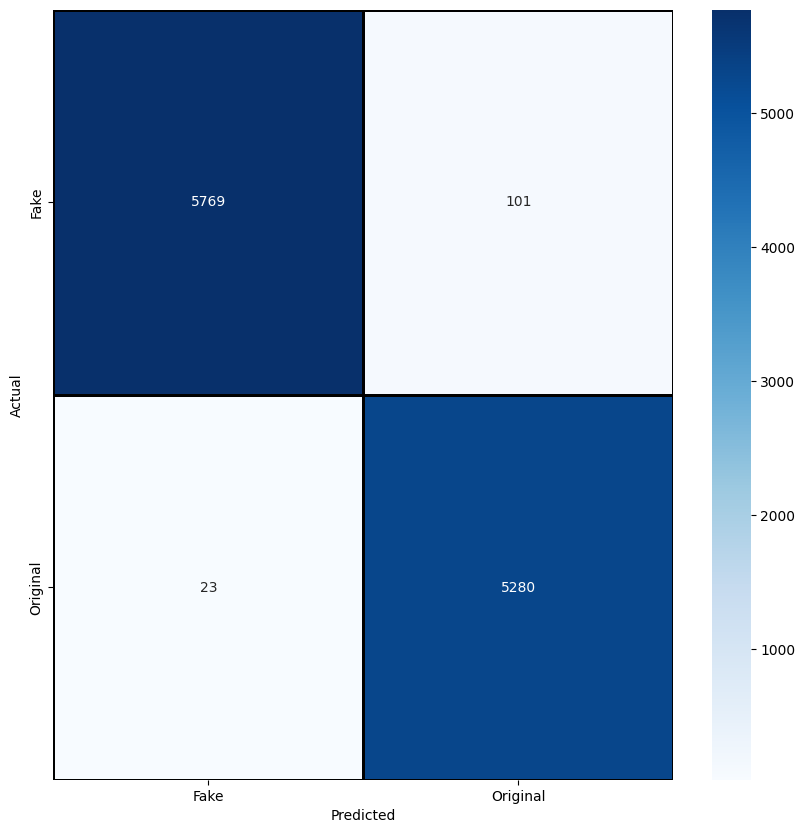

In [ ]:
plt.figure(figsize = (10,10))
sns.heatmap(cm_lstm,cmap= "Blues", linecolor = 'black' , linewidth = 1 , annot = True, fmt='' , xticklabels = ['Fake','Original'] , yticklabels = ['Fake','Original'])
plt.xlabel("Predicted")
plt.ylabel("Actual")

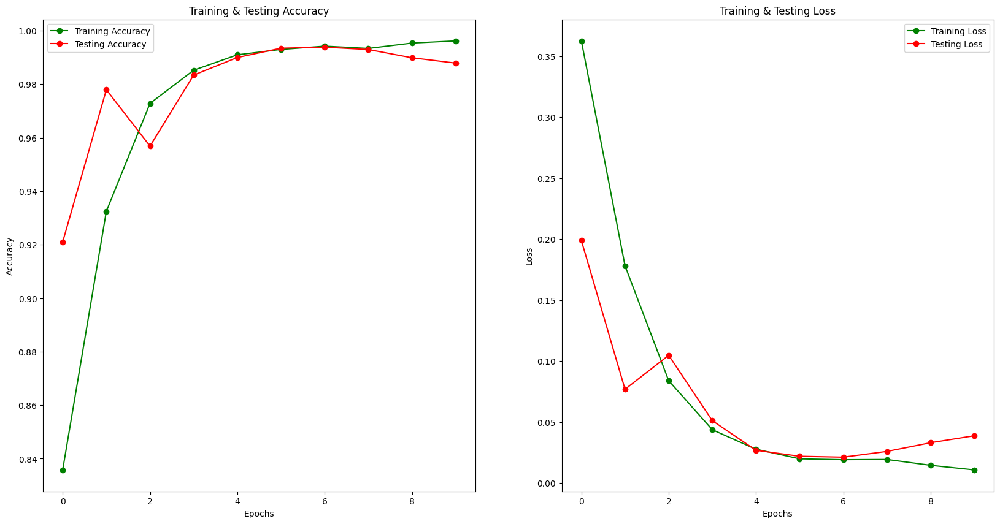

In [ ]:
print_graphs(history_lstm)

In [ ]:
scores_model.append({'Model': 'LSTM','AUC_Score': roc_auc(scores_lstm,y_test)})

In [ ]:
path_model_lstm = '/content/gdrive/MyDrive/Estudos/Data_Science/PUC_RIO/Sprint_2/MVP/models/lstm'
model_lstm.save_weights(path_model_lstm)
model_lstm.save(path_model_lstm)

#new_model = tf.keras.models.load_model('saved_model/my_model') -- como dar load no modelo

In [ ]:
with open('/content/gdrive/MyDrive/Estudos/Data_Science/PUC_RIO/Sprint_2/MVP/models/lstm/trainHistoryDict', 'wb') as file_pi:
    pickle.dump(history_lstm.history, file_pi)

In [ ]:
path_scores = '/content/gdrive/MyDrive/Estudos/Data_Science/PUC_RIO/Sprint_2/MVP/scores/score_models.csv'
df_scores_model = pd.DataFrame(scores_model)
df_scores_model.to_csv(path_scores, index=False)

#### **Aplicação do Word2Vector**

Iremos criar nossa matriz de embedding, a fim de analisar se com nossa matriz de semântica distributiva possa melhorar a performance dos nossos modelos.

In [ ]:
sentence = [sentence.lower().split() for sentence in X_train]

In [ ]:
w2v = Word2Vec(sentences=sentence, vector_size=embed_size, window=15, min_count=1)

In [ ]:
embedding_matrix = np.zeros((len(word_index)+1, 300))
for word,i in word_index.items():
    try:
        embedding_matrix[i] = w2v.wv[i]
    except:
        embedding_matrix[i] = np.zeros(300)

##### **RNN Simples - Com w2vector**

In [ ]:
%%time
with strategy.scope():
    # Um RNN sem camada oculta
    model_rnn_w2v = Sequential()
    model_rnn_w2v.add(Embedding(len(word_index)+1,
                     output_dim=embed_size,
                      weights=[embedding_matrix],
                     input_length=max_len))
    model_rnn_w2v.add(SimpleRNN(128))
    model_rnn_w2v.add(Dense(1, activation='sigmoid'))
    model_rnn_w2v.compile(optimizer=keras.optimizers.Adam(lr = 0.01), loss='binary_crossentropy', metrics=['accuracy'])

model_rnn_w2v.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 300, 300)          59396100  
                                                                 
 simple_rnn_1 (SimpleRNN)    (None, 128)               54912     
                                                                 
 dense_3 (Dense)             (None, 1)                 129       
                                                                 
Total params: 59,451,141
Trainable params: 59,451,141
Non-trainable params: 0
_________________________________________________________________
CPU times: user 1 s, sys: 1.5 s, total: 2.5 s
Wall time: 1.63 s


In [ ]:
path_model_rnn = '/content/gdrive/MyDrive/Estudos/Data_Science/PUC_RIO/Sprint_2/MVP/models/rnn_w2v'

cp_callback_rnn = ModelCheckpoint(
    filepath=path_model_rnn,
    verbose=2,
    save_best_only=True,
    save_weights_only=False,
    save_freq=1)

In [ ]:
history_rnn_w2v = model_rnn_w2v.fit(X_train_pad, y_train,
                        validation_split=0.3,
                        epochs=epochs,
                        batch_size=batch_size,
                        callbacks=[cp_callback_rnn])

Epoch 1/10


  1/367 [..............................] - ETA: 15:16 - loss: 0.8227 - accuracy: 0.4375

  2/367 [..............................] - ETA: 8:28 - loss: 0.7438 - accuracy: 0.5391 

  3/367 [..............................] - ETA: 9:34 - loss: 0.7512 - accuracy: 0.5990

  4/367 [..............................] - ETA: 11:16 - loss: 0.7442 - accuracy: 0.6133

  5/367 [..............................] - ETA: 10:54 - loss: 0.7527 - accuracy: 0.6250

  6/367 [..............................] - ETA: 10:24 - loss: 0.7498 - accuracy: 0.6328

  7/367 [..............................] - ETA: 10:02 - loss: 0.7542 - accuracy: 0.6362

  8/367 [..............................] - ETA: 9:48 - loss: 0.7502 - accuracy: 0.6484 

  9/367 [..............................] - ETA: 9:37 - loss: 0.7274 - accuracy: 0.6615

 10/367 [..............................] - ETA: 9:27 - loss: 0.7215 - accuracy: 0.6578

 11/367 [..............................] - ETA: 9:21 - loss: 0.7104 - accuracy: 0.6662

 12/367 [..............................] - ETA: 10:27 - loss: 0.7033 - accuracy: 0.6693

 13/367 [>.............................] - ETA: 10:33 - loss: 0.6906 - accuracy: 0.6743

 14/367 [>.............................] - ETA: 10:21 - loss: 0.6839 - accuracy: 0.6752

 15/367 [>.............................] - ETA: 10:11 - loss: 0.6731 - accuracy: 0.6802

 16/367 [>.............................] - ETA: 10:02 - loss: 0.6593 - accuracy: 0.6826

 17/367 [>.............................] - ETA: 9:54 - loss: 0.6496 - accuracy: 0.6847 

 18/367 [>.............................] - ETA: 9:48 - loss: 0.6377 - accuracy: 0.6901

 19/367 [>.............................] - ETA: 9:41 - loss: 0.6347 - accuracy: 0.6891

 20/367 [>.............................] - ETA: 9:43 - loss: 0.6262 - accuracy: 0.6938

 21/367 [>.............................] - ETA: 9:53 - loss: 0.6185 - accuracy: 0.6979

 22/367 [>.............................] - ETA: 9:51 - loss: 0.6090 - accuracy: 0.7031

 23/367 [>.............................] - ETA: 9:44 - loss: 0.6023 - accuracy: 0.7072

 24/367 [>.............................] - ETA: 9:39 - loss: 0.5970 - accuracy: 0.7090

 25/367 [=>............................] - ETA: 9:33 - loss: 0.5891 - accuracy: 0.7144

 26/367 [=>............................] - ETA: 9:28 - loss: 0.5836 - accuracy: 0.7169

 27/367 [=>............................] - ETA: 9:24 - loss: 0.5780 - accuracy: 0.7211

 28/367 [=>............................] - ETA: 9:19 - loss: 0.5738 - accuracy: 0.7238

 29/367 [=>............................] - ETA: 9:23 - loss: 0.5735 - accuracy: 0.7225

 30/367 [=>............................] - ETA: 9:28 - loss: 0.5691 - accuracy: 0.7240

 31/367 [=>............................] - ETA: 9:26 - loss: 0.5625 - accuracy: 0.7268

 32/367 [=>............................] - ETA: 9:22 - loss: 0.5609 - accuracy: 0.7266

 33/367 [=>............................] - ETA: 9:17 - loss: 0.5565 - accuracy: 0.7282

 34/367 [=>............................] - ETA: 9:13 - loss: 0.5517 - accuracy: 0.7293

 35/367 [=>............................] - ETA: 9:09 - loss: 0.5499 - accuracy: 0.7312

 36/367 [=>............................] - ETA: 9:06 - loss: 0.5467 - accuracy: 0.7326

 37/367 [==>...........................] - ETA: 9:02 - loss: 0.5418 - accuracy: 0.7340

 38/367 [==>...........................] - ETA: 9:05 - loss: 0.5418 - accuracy: 0.7348

 39/367 [==>...........................] - ETA: 9:10 - loss: 0.5367 - accuracy: 0.7376

 40/367 [==>...........................] - ETA: 9:07 - loss: 0.5379 - accuracy: 0.7371

 41/367 [==>...........................] - ETA: 9:03 - loss: 0.5317 - accuracy: 0.7401

 42/367 [==>...........................] - ETA: 8:59 - loss: 0.5281 - accuracy: 0.7433

 43/367 [==>...........................] - ETA: 8:56 - loss: 0.5236 - accuracy: 0.7460

 44/367 [==>...........................] - ETA: 8:53 - loss: 0.5203 - accuracy: 0.7486

 45/367 [==>...........................] - ETA: 8:49 - loss: 0.5171 - accuracy: 0.7503

 46/367 [==>...........................] - ETA: 8:47 - loss: 0.5176 - accuracy: 0.7490

 47/367 [==>...........................] - ETA: 8:51 - loss: 0.5122 - accuracy: 0.7517

 48/367 [==>...........................] - ETA: 8:53 - loss: 0.5092 - accuracy: 0.7533

 49/367 [===>..........................] - ETA: 8:50 - loss: 0.5068 - accuracy: 0.7548

 50/367 [===>..........................] - ETA: 8:47 - loss: 0.5052 - accuracy: 0.7563

 51/367 [===>..........................] - ETA: 8:44 - loss: 0.5014 - accuracy: 0.7595

 52/367 [===>..........................] - ETA: 8:41 - loss: 0.5001 - accuracy: 0.7599

 53/367 [===>..........................] - ETA: 8:38 - loss: 0.4960 - accuracy: 0.7621

 54/367 [===>..........................] - ETA: 8:35 - loss: 0.4928 - accuracy: 0.7636

 55/367 [===>..........................] - ETA: 8:33 - loss: 0.4898 - accuracy: 0.7659

 56/367 [===>..........................] - ETA: 8:35 - loss: 0.4857 - accuracy: 0.7681

 57/367 [===>..........................] - ETA: 8:36 - loss: 0.4820 - accuracy: 0.7700

 58/367 [===>..........................] - ETA: 8:33 - loss: 0.4797 - accuracy: 0.7707

 59/367 [===>..........................] - ETA: 8:31 - loss: 0.4792 - accuracy: 0.7715

 60/367 [===>..........................] - ETA: 8:28 - loss: 0.4759 - accuracy: 0.7734

 61/367 [===>..........................] - ETA: 8:25 - loss: 0.4739 - accuracy: 0.7748

 62/367 [====>.........................] - ETA: 8:22 - loss: 0.4722 - accuracy: 0.7767

 63/367 [====>.........................] - ETA: 8:20 - loss: 0.4731 - accuracy: 0.7775

 64/367 [====>.........................] - ETA: 8:20 - loss: 0.4696 - accuracy: 0.7791

 65/367 [====>.........................] - ETA: 8:22 - loss: 0.4676 - accuracy: 0.7796

 66/367 [====>.........................] - ETA: 8:20 - loss: 0.4664 - accuracy: 0.7810

 67/367 [====>.........................] - ETA: 8:17 - loss: 0.4647 - accuracy: 0.7822

 68/367 [====>.........................] - ETA: 8:15 - loss: 0.4618 - accuracy: 0.7831

 69/367 [====>.........................] - ETA: 8:12 - loss: 0.4595 - accuracy: 0.7844

 70/367 [====>.........................] - ETA: 8:09 - loss: 0.4585 - accuracy: 0.7853

 71/367 [====>.........................] - ETA: 8:07 - loss: 0.4589 - accuracy: 0.7854

 72/367 [====>.........................] - ETA: 8:04 - loss: 0.4567 - accuracy: 0.7865

 73/367 [====>.........................] - ETA: 8:05 - loss: 0.4558 - accuracy: 0.7870

 74/367 [=====>........................] - ETA: 8:06 - loss: 0.4536 - accuracy: 0.7882

 75/367 [=====>........................] - ETA: 8:04 - loss: 0.4520 - accuracy: 0.7892

 76/367 [=====>........................] - ETA: 8:05 - loss: 0.4496 - accuracy: 0.7901

 77/367 [=====>........................] - ETA: 8:02 - loss: 0.4479 - accuracy: 0.7910

 78/367 [=====>........................] - ETA: 8:00 - loss: 0.4451 - accuracy: 0.7927

 79/367 [=====>........................] - ETA: 7:57 - loss: 0.4442 - accuracy: 0.7933

 80/367 [=====>........................] - ETA: 7:55 - loss: 0.4447 - accuracy: 0.7930

 81/367 [=====>........................] - ETA: 7:54 - loss: 0.4422 - accuracy: 0.7948

 82/367 [=====>........................] - ETA: 7:55 - loss: 0.4402 - accuracy: 0.7957

 83/367 [=====>........................] - ETA: 7:53 - loss: 0.4397 - accuracy: 0.7967

 84/367 [=====>........................] - ETA: 7:51 - loss: 0.4387 - accuracy: 0.7969

 85/367 [=====>........................] - ETA: 7:48 - loss: 0.4383 - accuracy: 0.7971

 86/367 [======>.......................] - ETA: 7:46 - loss: 0.4382 - accuracy: 0.7972

 87/367 [======>.......................] - ETA: 7:43 - loss: 0.4366 - accuracy: 0.7978

 88/367 [======>.......................] - ETA: 7:41 - loss: 0.4345 - accuracy: 0.7988

 89/367 [======>.......................] - ETA: 7:39 - loss: 0.4333 - accuracy: 0.7993

 90/367 [======>.......................] - ETA: 7:39 - loss: 0.4314 - accuracy: 0.8007

 91/367 [======>.......................] - ETA: 7:39 - loss: 0.4307 - accuracy: 0.8010

 92/367 [======>.......................] - ETA: 7:38 - loss: 0.4295 - accuracy: 0.8016

 93/367 [======>.......................] - ETA: 7:39 - loss: 0.4292 - accuracy: 0.8019

 94/367 [======>.......................] - ETA: 7:41 - loss: 0.4283 - accuracy: 0.8022

 95/367 [======>.......................] - ETA: 7:41 - loss: 0.4270 - accuracy: 0.8028

 96/367 [======>.......................] - ETA: 7:40 - loss: 0.4267 - accuracy: 0.8031

 97/367 [======>.......................] - ETA: 7:40 - loss: 0.4269 - accuracy: 0.8030

 98/367 [=======>......................] - ETA: 7:38 - loss: 0.4269 - accuracy: 0.8034

 99/367 [=======>......................] - ETA: 7:36 - loss: 0.4264 - accuracy: 0.8040

100/367 [=======>......................] - ETA: 7:33 - loss: 0.4243 - accuracy: 0.8052

101/367 [=======>......................] - ETA: 7:31 - loss: 0.4243 - accuracy: 0.8049

102/367 [=======>......................] - ETA: 7:29 - loss: 0.4235 - accuracy: 0.8056

103/367 [=======>......................] - ETA: 7:26 - loss: 0.4229 - accuracy: 0.8064

104/367 [=======>......................] - ETA: 7:24 - loss: 0.4217 - accuracy: 0.8069

105/367 [=======>......................] - ETA: 7:24 - loss: 0.4202 - accuracy: 0.8077

106/367 [=======>......................] - ETA: 7:24 - loss: 0.4186 - accuracy: 0.8088

107/367 [=======>......................] - ETA: 7:21 - loss: 0.4168 - accuracy: 0.8099

108/367 [=======>......................] - ETA: 7:19 - loss: 0.4148 - accuracy: 0.8108

109/367 [=======>......................] - ETA: 7:17 - loss: 0.4132 - accuracy: 0.8114

110/367 [=======>......................] - ETA: 7:14 - loss: 0.4119 - accuracy: 0.8118

111/367 [========>.....................] - ETA: 7:12 - loss: 0.4100 - accuracy: 0.8126

112/367 [========>.....................] - ETA: 7:10 - loss: 0.4089 - accuracy: 0.8133

113/367 [========>.....................] - ETA: 7:08 - loss: 0.4087 - accuracy: 0.8136

114/367 [========>.....................] - ETA: 7:08 - loss: 0.4097 - accuracy: 0.8136

115/367 [========>.....................] - ETA: 7:07 - loss: 0.4080 - accuracy: 0.8145

116/367 [========>.....................] - ETA: 7:05 - loss: 0.4075 - accuracy: 0.8151

117/367 [========>.....................] - ETA: 7:03 - loss: 0.4063 - accuracy: 0.8157

118/367 [========>.....................] - ETA: 7:00 - loss: 0.4054 - accuracy: 0.8163

119/367 [========>.....................] - ETA: 6:58 - loss: 0.4047 - accuracy: 0.8167

120/367 [========>.....................] - ETA: 6:56 - loss: 0.4045 - accuracy: 0.8172

121/367 [========>.....................] - ETA: 6:54 - loss: 0.4040 - accuracy: 0.8177

122/367 [========>.....................] - ETA: 6:52 - loss: 0.4036 - accuracy: 0.8179

123/367 [=========>....................] - ETA: 6:52 - loss: 0.4025 - accuracy: 0.8185

124/367 [=========>....................] - ETA: 6:51 - loss: 0.4006 - accuracy: 0.8196

125/367 [=========>....................] - ETA: 6:48 - loss: 0.3997 - accuracy: 0.8200

126/367 [=========>....................] - ETA: 6:46 - loss: 0.3987 - accuracy: 0.8206

127/367 [=========>....................] - ETA: 6:44 - loss: 0.3979 - accuracy: 0.8210

128/367 [=========>....................] - ETA: 6:42 - loss: 0.3965 - accuracy: 0.8218

129/367 [=========>....................] - ETA: 6:40 - loss: 0.3964 - accuracy: 0.8215

130/367 [=========>....................] - ETA: 6:38 - loss: 0.3958 - accuracy: 0.8219

131/367 [=========>....................] - ETA: 6:37 - loss: 0.3961 - accuracy: 0.8217

132/367 [=========>....................] - ETA: 6:36 - loss: 0.3947 - accuracy: 0.8223

133/367 [=========>....................] - ETA: 6:35 - loss: 0.3945 - accuracy: 0.8227

134/367 [=========>....................] - ETA: 6:32 - loss: 0.3931 - accuracy: 0.8236

135/367 [==========>...................] - ETA: 6:30 - loss: 0.3920 - accuracy: 0.8244

136/367 [==========>...................] - ETA: 6:28 - loss: 0.3909 - accuracy: 0.8251

137/367 [==========>...................] - ETA: 6:26 - loss: 0.3896 - accuracy: 0.8258

138/367 [==========>...................] - ETA: 6:24 - loss: 0.3889 - accuracy: 0.8264

139/367 [==========>...................] - ETA: 6:22 - loss: 0.3870 - accuracy: 0.8273

140/367 [==========>...................] - ETA: 6:21 - loss: 0.3862 - accuracy: 0.8280

141/367 [==========>...................] - ETA: 6:21 - loss: 0.3859 - accuracy: 0.8285

142/367 [==========>...................] - ETA: 6:19 - loss: 0.3846 - accuracy: 0.8292

143/367 [==========>...................] - ETA: 6:17 - loss: 0.3836 - accuracy: 0.8299

144/367 [==========>...................] - ETA: 6:15 - loss: 0.3822 - accuracy: 0.8305

145/367 [==========>...................] - ETA: 6:13 - loss: 0.3809 - accuracy: 0.8313

146/367 [==========>...................] - ETA: 6:11 - loss: 0.3805 - accuracy: 0.8314

147/367 [===========>..................] - ETA: 6:10 - loss: 0.3806 - accuracy: 0.8316

148/367 [===========>..................] - ETA: 6:09 - loss: 0.3798 - accuracy: 0.8318

149/367 [===========>..................] - ETA: 6:09 - loss: 0.3799 - accuracy: 0.8318

150/367 [===========>..................] - ETA: 6:07 - loss: 0.3785 - accuracy: 0.8325

151/367 [===========>..................] - ETA: 6:05 - loss: 0.3773 - accuracy: 0.8332

152/367 [===========>..................] - ETA: 6:03 - loss: 0.3763 - accuracy: 0.8337

153/367 [===========>..................] - ETA: 6:01 - loss: 0.3752 - accuracy: 0.8344

154/367 [===========>..................] - ETA: 5:59 - loss: 0.3742 - accuracy: 0.8349

155/367 [===========>..................] - ETA: 5:57 - loss: 0.3732 - accuracy: 0.8356

156/367 [===========>..................] - ETA: 5:55 - loss: 0.3722 - accuracy: 0.8363

157/367 [===========>..................] - ETA: 5:54 - loss: 0.3728 - accuracy: 0.8362

158/367 [===========>..................] - ETA: 5:53 - loss: 0.3720 - accuracy: 0.8367

159/367 [===========>..................] - ETA: 5:51 - loss: 0.3712 - accuracy: 0.8374

160/367 [============>.................] - ETA: 5:49 - loss: 0.3700 - accuracy: 0.8381

161/367 [============>.................] - ETA: 5:47 - loss: 0.3687 - accuracy: 0.8387

162/367 [============>.................] - ETA: 5:45 - loss: 0.3678 - accuracy: 0.8393

163/367 [============>.................] - ETA: 5:43 - loss: 0.3671 - accuracy: 0.8397

164/367 [============>.................] - ETA: 5:41 - loss: 0.3666 - accuracy: 0.8400

165/367 [============>.................] - ETA: 5:39 - loss: 0.3654 - accuracy: 0.8406

166/367 [============>.................] - ETA: 5:38 - loss: 0.3652 - accuracy: 0.8406

167/367 [============>.................] - ETA: 5:37 - loss: 0.3646 - accuracy: 0.8408

168/367 [============>.................] - ETA: 5:35 - loss: 0.3634 - accuracy: 0.8413

169/367 [============>.................] - ETA: 5:33 - loss: 0.3626 - accuracy: 0.8416

170/367 [============>.................] - ETA: 5:31 - loss: 0.3620 - accuracy: 0.8421

171/367 [============>.................] - ETA: 5:29 - loss: 0.3609 - accuracy: 0.8427

172/367 [=============>................] - ETA: 5:27 - loss: 0.3596 - accuracy: 0.8433

173/367 [=============>................] - ETA: 5:25 - loss: 0.3584 - accuracy: 0.8439

174/367 [=============>................] - ETA: 5:24 - loss: 0.3581 - accuracy: 0.8443

175/367 [=============>................] - ETA: 5:23 - loss: 0.3576 - accuracy: 0.8446

176/367 [=============>................] - ETA: 5:21 - loss: 0.3577 - accuracy: 0.8446

177/367 [=============>................] - ETA: 5:19 - loss: 0.3567 - accuracy: 0.8452

178/367 [=============>................] - ETA: 5:17 - loss: 0.3558 - accuracy: 0.8457

179/367 [=============>................] - ETA: 5:15 - loss: 0.3548 - accuracy: 0.8462

180/367 [=============>................] - ETA: 5:13 - loss: 0.3540 - accuracy: 0.8465

181/367 [=============>................] - ETA: 5:12 - loss: 0.3536 - accuracy: 0.8466

182/367 [=============>................] - ETA: 5:10 - loss: 0.3533 - accuracy: 0.8468

183/367 [=============>................] - ETA: 5:09 - loss: 0.3525 - accuracy: 0.8472

184/367 [==============>...............] - ETA: 5:08 - loss: 0.3516 - accuracy: 0.8476

185/367 [==============>...............] - ETA: 5:06 - loss: 0.3509 - accuracy: 0.8479

186/367 [==============>...............] - ETA: 5:04 - loss: 0.3498 - accuracy: 0.8483

187/367 [==============>...............] - ETA: 5:02 - loss: 0.3495 - accuracy: 0.8484

188/367 [==============>...............] - ETA: 5:00 - loss: 0.3490 - accuracy: 0.8485

189/367 [==============>...............] - ETA: 4:58 - loss: 0.3483 - accuracy: 0.8486

190/367 [==============>...............] - ETA: 4:56 - loss: 0.3475 - accuracy: 0.8490

191/367 [==============>...............] - ETA: 4:54 - loss: 0.3471 - accuracy: 0.8493

192/367 [==============>...............] - ETA: 4:53 - loss: 0.3463 - accuracy: 0.8499

193/367 [==============>...............] - ETA: 4:52 - loss: 0.3453 - accuracy: 0.8504

194/367 [==============>...............] - ETA: 4:50 - loss: 0.3451 - accuracy: 0.8506

195/367 [==============>...............] - ETA: 4:48 - loss: 0.3451 - accuracy: 0.8508

196/367 [===============>..............] - ETA: 4:46 - loss: 0.3450 - accuracy: 0.8508

197/367 [===============>..............] - ETA: 4:45 - loss: 0.3441 - accuracy: 0.8514

198/367 [===============>..............] - ETA: 4:43 - loss: 0.3440 - accuracy: 0.8513

199/367 [===============>..............] - ETA: 4:41 - loss: 0.3441 - accuracy: 0.8512

200/367 [===============>..............] - ETA: 4:39 - loss: 0.3440 - accuracy: 0.8512

201/367 [===============>..............] - ETA: 4:38 - loss: 0.3438 - accuracy: 0.8514

202/367 [===============>..............] - ETA: 4:37 - loss: 0.3430 - accuracy: 0.8519

203/367 [===============>..............] - ETA: 4:35 - loss: 0.3430 - accuracy: 0.8520

204/367 [===============>..............] - ETA: 4:33 - loss: 0.3433 - accuracy: 0.8516

205/367 [===============>..............] - ETA: 4:31 - loss: 0.3427 - accuracy: 0.8520

206/367 [===============>..............] - ETA: 4:29 - loss: 0.3422 - accuracy: 0.8522

207/367 [===============>..............] - ETA: 4:27 - loss: 0.3422 - accuracy: 0.8521

208/367 [================>.............] - ETA: 4:25 - loss: 0.3422 - accuracy: 0.8522

209/367 [================>.............] - ETA: 4:24 - loss: 0.3419 - accuracy: 0.8523

210/367 [================>.............] - ETA: 4:23 - loss: 0.3420 - accuracy: 0.8523

211/367 [================>.............] - ETA: 4:21 - loss: 0.3422 - accuracy: 0.8523

212/367 [================>.............] - ETA: 4:19 - loss: 0.3413 - accuracy: 0.8528

213/367 [================>.............] - ETA: 4:18 - loss: 0.3406 - accuracy: 0.8531

214/367 [================>.............] - ETA: 4:16 - loss: 0.3405 - accuracy: 0.8532

215/367 [================>.............] - ETA: 4:14 - loss: 0.3398 - accuracy: 0.8536

216/367 [================>.............] - ETA: 4:12 - loss: 0.3393 - accuracy: 0.8537

217/367 [================>.............] - ETA: 4:10 - loss: 0.3394 - accuracy: 0.8537

218/367 [================>.............] - ETA: 4:09 - loss: 0.3391 - accuracy: 0.8539

219/367 [================>.............] - ETA: 4:08 - loss: 0.3383 - accuracy: 0.8542

220/367 [================>.............] - ETA: 4:06 - loss: 0.3378 - accuracy: 0.8545

221/367 [=================>............] - ETA: 4:04 - loss: 0.3378 - accuracy: 0.8544

222/367 [=================>............] - ETA: 4:02 - loss: 0.3380 - accuracy: 0.8540

223/367 [=================>............] - ETA: 4:00 - loss: 0.3376 - accuracy: 0.8540

224/367 [=================>............] - ETA: 3:59 - loss: 0.3373 - accuracy: 0.8541

225/367 [=================>............] - ETA: 3:57 - loss: 0.3371 - accuracy: 0.8542

226/367 [=================>............] - ETA: 3:55 - loss: 0.3372 - accuracy: 0.8543

227/367 [=================>............] - ETA: 3:54 - loss: 0.3368 - accuracy: 0.8545

228/367 [=================>............] - ETA: 3:52 - loss: 0.3368 - accuracy: 0.8544

229/367 [=================>............] - ETA: 3:51 - loss: 0.3378 - accuracy: 0.8540

230/367 [=================>............] - ETA: 3:49 - loss: 0.3373 - accuracy: 0.8541

231/367 [=================>............] - ETA: 3:47 - loss: 0.3371 - accuracy: 0.8540

232/367 [=================>............] - ETA: 3:45 - loss: 0.3362 - accuracy: 0.8545

233/367 [==================>...........] - ETA: 3:43 - loss: 0.3359 - accuracy: 0.8546

234/367 [==================>...........] - ETA: 3:42 - loss: 0.3353 - accuracy: 0.8550

235/367 [==================>...........] - ETA: 3:40 - loss: 0.3347 - accuracy: 0.8553

236/367 [==================>...........] - ETA: 3:39 - loss: 0.3343 - accuracy: 0.8555

237/367 [==================>...........] - ETA: 3:37 - loss: 0.3341 - accuracy: 0.8557

238/367 [==================>...........] - ETA: 3:35 - loss: 0.3338 - accuracy: 0.8560

239/367 [==================>...........] - ETA: 3:34 - loss: 0.3337 - accuracy: 0.8560

240/367 [==================>...........] - ETA: 3:32 - loss: 0.3334 - accuracy: 0.8562

241/367 [==================>...........] - ETA: 3:30 - loss: 0.3333 - accuracy: 0.8563

242/367 [==================>...........] - ETA: 3:28 - loss: 0.3332 - accuracy: 0.8565

243/367 [==================>...........] - ETA: 3:27 - loss: 0.3327 - accuracy: 0.8567

244/367 [==================>...........] - ETA: 3:25 - loss: 0.3325 - accuracy: 0.8569

245/367 [===================>..........] - ETA: 3:24 - loss: 0.3319 - accuracy: 0.8573

246/367 [===================>..........] - ETA: 3:22 - loss: 0.3316 - accuracy: 0.8574

247/367 [===================>..........] - ETA: 3:20 - loss: 0.3313 - accuracy: 0.8575

248/367 [===================>..........] - ETA: 3:19 - loss: 0.3308 - accuracy: 0.8577

249/367 [===================>..........] - ETA: 3:17 - loss: 0.3304 - accuracy: 0.8580

250/367 [===================>..........] - ETA: 3:15 - loss: 0.3297 - accuracy: 0.8584

251/367 [===================>..........] - ETA: 3:13 - loss: 0.3301 - accuracy: 0.8583

252/367 [===================>..........] - ETA: 3:12 - loss: 0.3292 - accuracy: 0.8588

253/367 [===================>..........] - ETA: 3:10 - loss: 0.3287 - accuracy: 0.8589

254/367 [===================>..........] - ETA: 3:09 - loss: 0.3279 - accuracy: 0.8593

255/367 [===================>..........] - ETA: 3:07 - loss: 0.3275 - accuracy: 0.8596

256/367 [===================>..........] - ETA: 3:05 - loss: 0.3276 - accuracy: 0.8597

257/367 [====================>.........] - ETA: 3:03 - loss: 0.3272 - accuracy: 0.8599

258/367 [====================>.........] - ETA: 3:02 - loss: 0.3267 - accuracy: 0.8602

259/367 [====================>.........] - ETA: 3:00 - loss: 0.3261 - accuracy: 0.8606

260/367 [====================>.........] - ETA: 2:58 - loss: 0.3260 - accuracy: 0.8606

261/367 [====================>.........] - ETA: 2:57 - loss: 0.3256 - accuracy: 0.8608

262/367 [====================>.........] - ETA: 2:55 - loss: 0.3253 - accuracy: 0.8608

263/367 [====================>.........] - ETA: 2:53 - loss: 0.3251 - accuracy: 0.8609

264/367 [====================>.........] - ETA: 2:52 - loss: 0.3243 - accuracy: 0.8613

265/367 [====================>.........] - ETA: 2:50 - loss: 0.3241 - accuracy: 0.8615

266/367 [====================>.........] - ETA: 2:48 - loss: 0.3238 - accuracy: 0.8617

267/367 [====================>.........] - ETA: 2:46 - loss: 0.3238 - accuracy: 0.8617

268/367 [====================>.........] - ETA: 2:45 - loss: 0.3235 - accuracy: 0.8617

269/367 [====================>.........] - ETA: 2:43 - loss: 0.3231 - accuracy: 0.8619

270/367 [=====================>........] - ETA: 2:42 - loss: 0.3229 - accuracy: 0.8621

271/367 [=====================>........] - ETA: 2:40 - loss: 0.3224 - accuracy: 0.8624

272/367 [=====================>........] - ETA: 2:38 - loss: 0.3217 - accuracy: 0.8626

273/367 [=====================>........] - ETA: 2:37 - loss: 0.3213 - accuracy: 0.8628

274/367 [=====================>........] - ETA: 2:35 - loss: 0.3208 - accuracy: 0.8630

275/367 [=====================>........] - ETA: 2:33 - loss: 0.3203 - accuracy: 0.8632

276/367 [=====================>........] - ETA: 2:31 - loss: 0.3199 - accuracy: 0.8634

277/367 [=====================>........] - ETA: 2:30 - loss: 0.3198 - accuracy: 0.8635

278/367 [=====================>........] - ETA: 2:28 - loss: 0.3194 - accuracy: 0.8638

279/367 [=====================>........] - ETA: 2:26 - loss: 0.3194 - accuracy: 0.8637

280/367 [=====================>........] - ETA: 2:25 - loss: 0.3195 - accuracy: 0.8637

281/367 [=====================>........] - ETA: 2:23 - loss: 0.3195 - accuracy: 0.8637

282/367 [======================>.......] - ETA: 2:21 - loss: 0.3191 - accuracy: 0.8639

283/367 [======================>.......] - ETA: 2:20 - loss: 0.3188 - accuracy: 0.8640

284/367 [======================>.......] - ETA: 2:18 - loss: 0.3189 - accuracy: 0.8639

285/367 [======================>.......] - ETA: 2:16 - loss: 0.3185 - accuracy: 0.8641

286/367 [======================>.......] - ETA: 2:14 - loss: 0.3184 - accuracy: 0.8642

287/367 [======================>.......] - ETA: 2:13 - loss: 0.3181 - accuracy: 0.8643

288/367 [======================>.......] - ETA: 2:11 - loss: 0.3176 - accuracy: 0.8646

289/367 [======================>.......] - ETA: 2:10 - loss: 0.3175 - accuracy: 0.8647

290/367 [======================>.......] - ETA: 2:08 - loss: 0.3184 - accuracy: 0.8643

291/367 [======================>.......] - ETA: 2:06 - loss: 0.3185 - accuracy: 0.8643

292/367 [======================>.......] - ETA: 2:05 - loss: 0.3195 - accuracy: 0.8640

293/367 [======================>.......] - ETA: 2:03 - loss: 0.3199 - accuracy: 0.8637

294/367 [=======================>......] - ETA: 2:01 - loss: 0.3203 - accuracy: 0.8635

295/367 [=======================>......] - ETA: 1:59 - loss: 0.3204 - accuracy: 0.8635

296/367 [=======================>......] - ETA: 1:58 - loss: 0.3205 - accuracy: 0.8635

297/367 [=======================>......] - ETA: 1:56 - loss: 0.3207 - accuracy: 0.8632

298/367 [=======================>......] - ETA: 1:55 - loss: 0.3210 - accuracy: 0.8628

299/367 [=======================>......] - ETA: 1:53 - loss: 0.3208 - accuracy: 0.8631

300/367 [=======================>......] - ETA: 1:51 - loss: 0.3216 - accuracy: 0.8623

301/367 [=======================>......] - ETA: 1:50 - loss: 0.3220 - accuracy: 0.8622

302/367 [=======================>......] - ETA: 1:48 - loss: 0.3219 - accuracy: 0.8622

303/367 [=======================>......] - ETA: 1:46 - loss: 0.3216 - accuracy: 0.8624

304/367 [=======================>......] - ETA: 1:45 - loss: 0.3209 - accuracy: 0.8627

305/367 [=======================>......] - ETA: 1:43 - loss: 0.3210 - accuracy: 0.8628

306/367 [========================>.....] - ETA: 1:41 - loss: 0.3205 - accuracy: 0.8631

307/367 [========================>.....] - ETA: 1:40 - loss: 0.3201 - accuracy: 0.8632

308/367 [========================>.....] - ETA: 1:38 - loss: 0.3197 - accuracy: 0.8634

309/367 [========================>.....] - ETA: 1:36 - loss: 0.3194 - accuracy: 0.8636

310/367 [========================>.....] - ETA: 1:35 - loss: 0.3192 - accuracy: 0.8638

311/367 [========================>.....] - ETA: 1:33 - loss: 0.3193 - accuracy: 0.8638

312/367 [========================>.....] - ETA: 1:31 - loss: 0.3187 - accuracy: 0.8641

313/367 [========================>.....] - ETA: 1:30 - loss: 0.3187 - accuracy: 0.8643

314/367 [========================>.....] - ETA: 1:28 - loss: 0.3185 - accuracy: 0.8644

315/367 [========================>.....] - ETA: 1:26 - loss: 0.3184 - accuracy: 0.8645

316/367 [========================>.....] - ETA: 1:25 - loss: 0.3180 - accuracy: 0.8649

317/367 [========================>.....] - ETA: 1:23 - loss: 0.3176 - accuracy: 0.8651

318/367 [========================>.....] - ETA: 1:21 - loss: 0.3172 - accuracy: 0.8652

319/367 [=========================>....] - ETA: 1:19 - loss: 0.3171 - accuracy: 0.8653

320/367 [=========================>....] - ETA: 1:18 - loss: 0.3167 - accuracy: 0.8655

321/367 [=========================>....] - ETA: 1:16 - loss: 0.3166 - accuracy: 0.8656

322/367 [=========================>....] - ETA: 1:15 - loss: 0.3161 - accuracy: 0.8658

323/367 [=========================>....] - ETA: 1:13 - loss: 0.3158 - accuracy: 0.8659

324/367 [=========================>....] - ETA: 1:11 - loss: 0.3161 - accuracy: 0.8659

325/367 [=========================>....] - ETA: 1:10 - loss: 0.3159 - accuracy: 0.8660

326/367 [=========================>....] - ETA: 1:08 - loss: 0.3158 - accuracy: 0.8662

327/367 [=========================>....] - ETA: 1:06 - loss: 0.3156 - accuracy: 0.8664

328/367 [=========================>....] - ETA: 1:04 - loss: 0.3154 - accuracy: 0.8664

329/367 [=========================>....] - ETA: 1:03 - loss: 0.3152 - accuracy: 0.8665

330/367 [=========================>....] - ETA: 1:01 - loss: 0.3150 - accuracy: 0.8665

331/367 [==========================>...] - ETA: 1:00 - loss: 0.3149 - accuracy: 0.8666

332/367 [==========================>...] - ETA: 58s - loss: 0.3145 - accuracy: 0.8668 

333/367 [==========================>...] - ETA: 56s - loss: 0.3143 - accuracy: 0.8669

334/367 [==========================>...] - ETA: 55s - loss: 0.3137 - accuracy: 0.8672

335/367 [==========================>...] - ETA: 53s - loss: 0.3133 - accuracy: 0.8674

336/367 [==========================>...] - ETA: 51s - loss: 0.3131 - accuracy: 0.8676

337/367 [==========================>...] - ETA: 49s - loss: 0.3133 - accuracy: 0.8674

338/367 [==========================>...] - ETA: 48s - loss: 0.3131 - accuracy: 0.8676

339/367 [==========================>...] - ETA: 46s - loss: 0.3130 - accuracy: 0.8677

340/367 [==========================>...] - ETA: 45s - loss: 0.3130 - accuracy: 0.8678

341/367 [==========================>...] - ETA: 43s - loss: 0.3127 - accuracy: 0.8679

342/367 [==========================>...] - ETA: 41s - loss: 0.3127 - accuracy: 0.8681

343/367 [===========================>..] - ETA: 40s - loss: 0.3124 - accuracy: 0.8683

344/367 [===========================>..] - ETA: 38s - loss: 0.3120 - accuracy: 0.8685

345/367 [===========================>..] - ETA: 36s - loss: 0.3122 - accuracy: 0.8684

346/367 [===========================>..] - ETA: 34s - loss: 0.3117 - accuracy: 0.8686

347/367 [===========================>..] - ETA: 33s - loss: 0.3112 - accuracy: 0.8688

348/367 [===========================>..] - ETA: 31s - loss: 0.3107 - accuracy: 0.8691

349/367 [===========================>..] - ETA: 30s - loss: 0.3109 - accuracy: 0.8690

350/367 [===========================>..] - ETA: 28s - loss: 0.3106 - accuracy: 0.8692

351/367 [===========================>..] - ETA: 26s - loss: 0.3104 - accuracy: 0.8693

352/367 [===========================>..] - ETA: 25s - loss: 0.3098 - accuracy: 0.8696

353/367 [===========================>..] - ETA: 23s - loss: 0.3096 - accuracy: 0.8697

354/367 [===========================>..] - ETA: 21s - loss: 0.3097 - accuracy: 0.8696

355/367 [============================>.] - ETA: 19s - loss: 0.3093 - accuracy: 0.8697

356/367 [============================>.] - ETA: 18s - loss: 0.3090 - accuracy: 0.8698

357/367 [============================>.] - ETA: 16s - loss: 0.3088 - accuracy: 0.8700

358/367 [============================>.] - ETA: 15s - loss: 0.3085 - accuracy: 0.8702

359/367 [============================>.] - ETA: 13s - loss: 0.3082 - accuracy: 0.8703

360/367 [============================>.] - ETA: 11s - loss: 0.3077 - accuracy: 0.8705

361/367 [============================>.] - ETA: 9s - loss: 0.3078 - accuracy: 0.8705 

362/367 [============================>.] - ETA: 8s - loss: 0.3074 - accuracy: 0.8707

363/367 [============================>.] - ETA: 6s - loss: 0.3071 - accuracy: 0.8709

364/367 [============================>.] - ETA: 4s - loss: 0.3067 - accuracy: 0.8711

365/367 [============================>.] - ETA: 3s - loss: 0.3062 - accuracy: 0.8713

366/367 [============================>.] - ETA: 1s - loss: 0.3058 - accuracy: 0.8715

367/367 [==============================] - 632s 2s/step - loss: 0.3055 - accuracy: 0.8716 - val_loss: 0.2026 - val_accuracy: 0.9247
Epoch 2/10


  1/367 [..............................] - ETA: 9:12 - loss: 0.1565 - accuracy: 0.9688

  2/367 [..............................] - ETA: 8:57 - loss: 0.1501 - accuracy: 0.9609

  3/367 [..............................] - ETA: 9:32 - loss: 0.1326 - accuracy: 0.9635

  4/367 [..............................] - ETA: 11:17 - loss: 0.1350 - accuracy: 0.9648

  5/367 [..............................] - ETA: 11:33 - loss: 0.1381 - accuracy: 0.9563

  6/367 [..............................] - ETA: 11:00 - loss: 0.1406 - accuracy: 0.9531

  7/367 [..............................] - ETA: 10:36 - loss: 0.1288 - accuracy: 0.9576

  8/367 [..............................] - ETA: 10:19 - loss: 0.1253 - accuracy: 0.9590

  9/367 [..............................] - ETA: 10:06 - loss: 0.1271 - accuracy: 0.9566

 10/367 [..............................] - ETA: 9:55 - loss: 0.1190 - accuracy: 0.9594 

 11/367 [..............................] - ETA: 9:47 - loss: 0.1233 - accuracy: 0.9560

 12/367 [..............................] - ETA: 10:04 - loss: 0.1214 - accuracy: 0.9557

 13/367 [>.............................] - ETA: 10:24 - loss: 0.1271 - accuracy: 0.9519

 14/367 [>.............................] - ETA: 10:14 - loss: 0.1356 - accuracy: 0.9498

 15/367 [>.............................] - ETA: 10:05 - loss: 0.1358 - accuracy: 0.9500

 16/367 [>.............................] - ETA: 9:57 - loss: 0.1390 - accuracy: 0.9492 

 17/367 [>.............................] - ETA: 9:50 - loss: 0.1381 - accuracy: 0.9485

 18/367 [>.............................] - ETA: 9:43 - loss: 0.1333 - accuracy: 0.9505

 19/367 [>.............................] - ETA: 9:37 - loss: 0.1366 - accuracy: 0.9498

 20/367 [>.............................] - ETA: 9:33 - loss: 0.1399 - accuracy: 0.9477

 21/367 [>.............................] - ETA: 9:44 - loss: 0.1407 - accuracy: 0.9464

 22/367 [>.............................] - ETA: 9:49 - loss: 0.1469 - accuracy: 0.9439

 23/367 [>.............................] - ETA: 9:43 - loss: 0.1610 - accuracy: 0.9409

 24/367 [>.............................] - ETA: 9:38 - loss: 0.1676 - accuracy: 0.9368

 25/367 [=>............................] - ETA: 9:33 - loss: 0.1652 - accuracy: 0.9375

 26/367 [=>............................] - ETA: 9:29 - loss: 0.1667 - accuracy: 0.9363

 27/367 [=>............................] - ETA: 9:24 - loss: 0.1643 - accuracy: 0.9375

 28/367 [=>............................] - ETA: 9:20 - loss: 0.1624 - accuracy: 0.9375

 29/367 [=>............................] - ETA: 9:23 - loss: 0.1620 - accuracy: 0.9380

 30/367 [=>............................] - ETA: 9:30 - loss: 0.1703 - accuracy: 0.9354

 31/367 [=>............................] - ETA: 9:27 - loss: 0.1719 - accuracy: 0.9345

 32/367 [=>............................] - ETA: 9:23 - loss: 0.1757 - accuracy: 0.9331

 33/367 [=>............................] - ETA: 9:19 - loss: 0.1782 - accuracy: 0.9323

 34/367 [=>............................] - ETA: 9:15 - loss: 0.1811 - accuracy: 0.9320

 35/367 [=>............................] - ETA: 9:11 - loss: 0.1814 - accuracy: 0.9317

 36/367 [=>............................] - ETA: 9:07 - loss: 0.1846 - accuracy: 0.9288

 37/367 [==>...........................] - ETA: 9:04 - loss: 0.1847 - accuracy: 0.9286

 38/367 [==>...........................] - ETA: 9:07 - loss: 0.1880 - accuracy: 0.9268

 39/367 [==>...........................] - ETA: 9:12 - loss: 0.1901 - accuracy: 0.9259

 40/367 [==>...........................] - ETA: 9:08 - loss: 0.1930 - accuracy: 0.9242

 41/367 [==>...........................] - ETA: 9:04 - loss: 0.1948 - accuracy: 0.9226

 42/367 [==>...........................] - ETA: 9:01 - loss: 0.1968 - accuracy: 0.9219

 43/367 [==>...........................] - ETA: 8:58 - loss: 0.1975 - accuracy: 0.9211

 44/367 [==>...........................] - ETA: 8:54 - loss: 0.1998 - accuracy: 0.9194

 45/367 [==>...........................] - ETA: 8:51 - loss: 0.1998 - accuracy: 0.9191

 46/367 [==>...........................] - ETA: 8:49 - loss: 0.2000 - accuracy: 0.9181

 47/367 [==>...........................] - ETA: 8:53 - loss: 0.2003 - accuracy: 0.9176

 48/367 [==>...........................] - ETA: 8:54 - loss: 0.2041 - accuracy: 0.9157

 49/367 [===>..........................] - ETA: 8:51 - loss: 0.2037 - accuracy: 0.9158

 50/367 [===>..........................] - ETA: 8:48 - loss: 0.2056 - accuracy: 0.9147

 51/367 [===>..........................] - ETA: 8:45 - loss: 0.2056 - accuracy: 0.9142

 52/367 [===>..........................] - ETA: 8:42 - loss: 0.2056 - accuracy: 0.9144

 53/367 [===>..........................] - ETA: 8:40 - loss: 0.2054 - accuracy: 0.9136

 54/367 [===>..........................] - ETA: 8:37 - loss: 0.2039 - accuracy: 0.9141

 55/367 [===>..........................] - ETA: 8:35 - loss: 0.2041 - accuracy: 0.9139

 56/367 [===>..........................] - ETA: 8:38 - loss: 0.2039 - accuracy: 0.9141

 57/367 [===>..........................] - ETA: 8:38 - loss: 0.2048 - accuracy: 0.9137

 58/367 [===>..........................] - ETA: 8:35 - loss: 0.2067 - accuracy: 0.9133

 59/367 [===>..........................] - ETA: 8:32 - loss: 0.2062 - accuracy: 0.9137

 60/367 [===>..........................] - ETA: 8:29 - loss: 0.2053 - accuracy: 0.9143

 61/367 [===>..........................] - ETA: 8:26 - loss: 0.2058 - accuracy: 0.9137

 62/367 [====>.........................] - ETA: 8:24 - loss: 0.2050 - accuracy: 0.9138

 63/367 [====>.........................] - ETA: 8:21 - loss: 0.2065 - accuracy: 0.9132

 64/367 [====>.........................] - ETA: 8:21 - loss: 0.2055 - accuracy: 0.9138

 65/367 [====>.........................] - ETA: 8:22 - loss: 0.2059 - accuracy: 0.9137

 66/367 [====>.........................] - ETA: 8:21 - loss: 0.2074 - accuracy: 0.9131

 67/367 [====>.........................] - ETA: 8:19 - loss: 0.2089 - accuracy: 0.9130

 68/367 [====>.........................] - ETA: 8:16 - loss: 0.2079 - accuracy: 0.9136

 69/367 [====>.........................] - ETA: 8:13 - loss: 0.2075 - accuracy: 0.9139

 70/367 [====>.........................] - ETA: 8:11 - loss: 0.2080 - accuracy: 0.9138

 71/367 [====>.........................] - ETA: 8:08 - loss: 0.2089 - accuracy: 0.9133

 72/367 [====>.........................] - ETA: 8:06 - loss: 0.2102 - accuracy: 0.9130

 73/367 [====>.........................] - ETA: 8:06 - loss: 0.2091 - accuracy: 0.9137

 74/367 [=====>........................] - ETA: 8:08 - loss: 0.2088 - accuracy: 0.9134

 75/367 [=====>........................] - ETA: 8:06 - loss: 0.2088 - accuracy: 0.9133

 76/367 [=====>........................] - ETA: 8:03 - loss: 0.2096 - accuracy: 0.9124

 77/367 [=====>........................] - ETA: 8:01 - loss: 0.2097 - accuracy: 0.9127

 78/367 [=====>........................] - ETA: 7:58 - loss: 0.2091 - accuracy: 0.9135

 79/367 [=====>........................] - ETA: 7:56 - loss: 0.2083 - accuracy: 0.9142

 80/367 [=====>........................] - ETA: 7:53 - loss: 0.2079 - accuracy: 0.9146

 81/367 [=====>........................] - ETA: 7:51 - loss: 0.2094 - accuracy: 0.9140

 82/367 [=====>........................] - ETA: 7:52 - loss: 0.2091 - accuracy: 0.9141

 83/367 [=====>........................] - ETA: 7:53 - loss: 0.2107 - accuracy: 0.9136

 84/367 [=====>........................] - ETA: 7:50 - loss: 0.2101 - accuracy: 0.9137

 85/367 [=====>........................] - ETA: 7:48 - loss: 0.2102 - accuracy: 0.9138

 86/367 [======>.......................] - ETA: 7:45 - loss: 0.2095 - accuracy: 0.9137

 87/367 [======>.......................] - ETA: 7:43 - loss: 0.2095 - accuracy: 0.9142

 88/367 [======>.......................] - ETA: 7:41 - loss: 0.2091 - accuracy: 0.9144

 89/367 [======>.......................] - ETA: 7:39 - loss: 0.2096 - accuracy: 0.9145

 90/367 [======>.......................] - ETA: 7:38 - loss: 0.2088 - accuracy: 0.9144

 91/367 [======>.......................] - ETA: 7:39 - loss: 0.2076 - accuracy: 0.9148

 92/367 [======>.......................] - ETA: 7:38 - loss: 0.2077 - accuracy: 0.9151

 93/367 [======>.......................] - ETA: 7:35 - loss: 0.2086 - accuracy: 0.9147

 94/367 [======>.......................] - ETA: 7:33 - loss: 0.2088 - accuracy: 0.9147

 95/367 [======>.......................] - ETA: 7:31 - loss: 0.2078 - accuracy: 0.9153

 96/367 [======>.......................] - ETA: 7:28 - loss: 0.2086 - accuracy: 0.9152

 97/367 [======>.......................] - ETA: 7:26 - loss: 0.2093 - accuracy: 0.9148

 98/367 [=======>......................] - ETA: 7:24 - loss: 0.2103 - accuracy: 0.9145

 99/367 [=======>......................] - ETA: 7:24 - loss: 0.2109 - accuracy: 0.9145

100/367 [=======>......................] - ETA: 7:24 - loss: 0.2101 - accuracy: 0.9148

101/367 [=======>......................] - ETA: 7:22 - loss: 0.2090 - accuracy: 0.9154

102/367 [=======>......................] - ETA: 7:20 - loss: 0.2080 - accuracy: 0.9161

103/367 [=======>......................] - ETA: 7:18 - loss: 0.2070 - accuracy: 0.9166

104/367 [=======>......................] - ETA: 7:16 - loss: 0.2077 - accuracy: 0.9160

105/367 [=======>......................] - ETA: 7:13 - loss: 0.2067 - accuracy: 0.9164

106/367 [=======>......................] - ETA: 7:11 - loss: 0.2059 - accuracy: 0.9167

107/367 [=======>......................] - ETA: 7:10 - loss: 0.2065 - accuracy: 0.9166

108/367 [=======>......................] - ETA: 7:10 - loss: 0.2066 - accuracy: 0.9165

109/367 [=======>......................] - ETA: 7:09 - loss: 0.2064 - accuracy: 0.9164

110/367 [=======>......................] - ETA: 7:07 - loss: 0.2063 - accuracy: 0.9166

111/367 [========>.....................] - ETA: 7:05 - loss: 0.2061 - accuracy: 0.9168

112/367 [========>.....................] - ETA: 7:03 - loss: 0.2055 - accuracy: 0.9169

113/367 [========>.....................] - ETA: 7:01 - loss: 0.2052 - accuracy: 0.9169

114/367 [========>.....................] - ETA: 6:59 - loss: 0.2054 - accuracy: 0.9168

115/367 [========>.....................] - ETA: 6:57 - loss: 0.2049 - accuracy: 0.9171

116/367 [========>.....................] - ETA: 6:55 - loss: 0.2040 - accuracy: 0.9176

117/367 [========>.....................] - ETA: 6:55 - loss: 0.2033 - accuracy: 0.9179

118/367 [========>.....................] - ETA: 6:54 - loss: 0.2038 - accuracy: 0.9174

119/367 [========>.....................] - ETA: 6:52 - loss: 0.2042 - accuracy: 0.9169

120/367 [========>.....................] - ETA: 6:50 - loss: 0.2046 - accuracy: 0.9165

121/367 [========>.....................] - ETA: 6:48 - loss: 0.2046 - accuracy: 0.9165

122/367 [========>.....................] - ETA: 6:46 - loss: 0.2036 - accuracy: 0.9169

123/367 [=========>....................] - ETA: 6:44 - loss: 0.2037 - accuracy: 0.9169

124/367 [=========>....................] - ETA: 6:42 - loss: 0.2034 - accuracy: 0.9172

125/367 [=========>....................] - ETA: 6:41 - loss: 0.2034 - accuracy: 0.9172

126/367 [=========>....................] - ETA: 6:41 - loss: 0.2031 - accuracy: 0.9174

127/367 [=========>....................] - ETA: 6:39 - loss: 0.2040 - accuracy: 0.9172

128/367 [=========>....................] - ETA: 6:37 - loss: 0.2054 - accuracy: 0.9166

129/367 [=========>....................] - ETA: 6:35 - loss: 0.2055 - accuracy: 0.9168

130/367 [=========>....................] - ETA: 6:33 - loss: 0.2051 - accuracy: 0.9169

131/367 [=========>....................] - ETA: 6:31 - loss: 0.2052 - accuracy: 0.9170

132/367 [=========>....................] - ETA: 6:29 - loss: 0.2044 - accuracy: 0.9174

133/367 [=========>....................] - ETA: 6:27 - loss: 0.2041 - accuracy: 0.9175

134/367 [=========>....................] - ETA: 6:26 - loss: 0.2034 - accuracy: 0.9179

135/367 [==========>...................] - ETA: 6:26 - loss: 0.2034 - accuracy: 0.9182

136/367 [==========>...................] - ETA: 6:24 - loss: 0.2032 - accuracy: 0.9183

137/367 [==========>...................] - ETA: 6:22 - loss: 0.2038 - accuracy: 0.9182

138/367 [==========>...................] - ETA: 6:20 - loss: 0.2034 - accuracy: 0.9184

139/367 [==========>...................] - ETA: 6:18 - loss: 0.2023 - accuracy: 0.9190

140/367 [==========>...................] - ETA: 6:16 - loss: 0.2017 - accuracy: 0.9192

141/367 [==========>...................] - ETA: 6:14 - loss: 0.2015 - accuracy: 0.9193

142/367 [==========>...................] - ETA: 6:12 - loss: 0.2014 - accuracy: 0.9195

143/367 [==========>...................] - ETA: 6:12 - loss: 0.2010 - accuracy: 0.9196

144/367 [==========>...................] - ETA: 6:11 - loss: 0.2005 - accuracy: 0.9198

145/367 [==========>...................] - ETA: 6:09 - loss: 0.1995 - accuracy: 0.9202

146/367 [==========>...................] - ETA: 6:07 - loss: 0.2006 - accuracy: 0.9198

147/367 [===========>..................] - ETA: 6:05 - loss: 0.2007 - accuracy: 0.9199

148/367 [===========>..................] - ETA: 6:03 - loss: 0.2000 - accuracy: 0.9201

149/367 [===========>..................] - ETA: 6:01 - loss: 0.1996 - accuracy: 0.9202

150/367 [===========>..................] - ETA: 5:59 - loss: 0.1998 - accuracy: 0.9201

151/367 [===========>..................] - ETA: 5:58 - loss: 0.2004 - accuracy: 0.9197

152/367 [===========>..................] - ETA: 5:57 - loss: 0.2002 - accuracy: 0.9195

153/367 [===========>..................] - ETA: 5:56 - loss: 0.2000 - accuracy: 0.9197

154/367 [===========>..................] - ETA: 5:54 - loss: 0.1999 - accuracy: 0.9197

155/367 [===========>..................] - ETA: 5:52 - loss: 0.2012 - accuracy: 0.9191

156/367 [===========>..................] - ETA: 5:50 - loss: 0.2012 - accuracy: 0.9191

157/367 [===========>..................] - ETA: 5:48 - loss: 0.2013 - accuracy: 0.9188

158/367 [===========>..................] - ETA: 5:46 - loss: 0.2014 - accuracy: 0.9189

159/367 [===========>..................] - ETA: 5:44 - loss: 0.2009 - accuracy: 0.9191

160/367 [============>.................] - ETA: 5:43 - loss: 0.2005 - accuracy: 0.9191

161/367 [============>.................] - ETA: 5:42 - loss: 0.2003 - accuracy: 0.9194

162/367 [============>.................] - ETA: 5:40 - loss: 0.2006 - accuracy: 0.9193

163/367 [============>.................] - ETA: 5:39 - loss: 0.2006 - accuracy: 0.9190

164/367 [============>.................] - ETA: 5:37 - loss: 0.2011 - accuracy: 0.9186

165/367 [============>.................] - ETA: 5:35 - loss: 0.2010 - accuracy: 0.9188

166/367 [============>.................] - ETA: 5:33 - loss: 0.2011 - accuracy: 0.9187

167/367 [============>.................] - ETA: 5:31 - loss: 0.2007 - accuracy: 0.9190

168/367 [============>.................] - ETA: 5:29 - loss: 0.2002 - accuracy: 0.9193

169/367 [============>.................] - ETA: 5:28 - loss: 0.2002 - accuracy: 0.9194

170/367 [============>.................] - ETA: 5:27 - loss: 0.1995 - accuracy: 0.9197

171/367 [============>.................] - ETA: 5:25 - loss: 0.1992 - accuracy: 0.9198

172/367 [=============>................] - ETA: 5:23 - loss: 0.1997 - accuracy: 0.9195

173/367 [=============>................] - ETA: 5:22 - loss: 0.1998 - accuracy: 0.9194

174/367 [=============>................] - ETA: 5:20 - loss: 0.1994 - accuracy: 0.9196

175/367 [=============>................] - ETA: 5:18 - loss: 0.1996 - accuracy: 0.9197

176/367 [=============>................] - ETA: 5:16 - loss: 0.1992 - accuracy: 0.9199

177/367 [=============>................] - ETA: 5:15 - loss: 0.1994 - accuracy: 0.9198

178/367 [=============>................] - ETA: 5:14 - loss: 0.1992 - accuracy: 0.9200

179/367 [=============>................] - ETA: 5:12 - loss: 0.1995 - accuracy: 0.9199

180/367 [=============>................] - ETA: 5:10 - loss: 0.1990 - accuracy: 0.9201

181/367 [=============>................] - ETA: 5:08 - loss: 0.1988 - accuracy: 0.9202

182/367 [=============>................] - ETA: 5:07 - loss: 0.1992 - accuracy: 0.9201

183/367 [=============>................] - ETA: 5:05 - loss: 0.1994 - accuracy: 0.9198

184/367 [==============>...............] - ETA: 5:03 - loss: 0.1989 - accuracy: 0.9200

185/367 [==============>...............] - ETA: 5:01 - loss: 0.1992 - accuracy: 0.9199

186/367 [==============>...............] - ETA: 5:00 - loss: 0.1991 - accuracy: 0.9199

187/367 [==============>...............] - ETA: 4:59 - loss: 0.1989 - accuracy: 0.9200

188/367 [==============>...............] - ETA: 4:57 - loss: 0.1989 - accuracy: 0.9200

189/367 [==============>...............] - ETA: 4:55 - loss: 0.1987 - accuracy: 0.9202

190/367 [==============>...............] - ETA: 4:53 - loss: 0.1987 - accuracy: 0.9201

191/367 [==============>...............] - ETA: 4:51 - loss: 0.1986 - accuracy: 0.9202

192/367 [==============>...............] - ETA: 4:50 - loss: 0.1980 - accuracy: 0.9207

193/367 [==============>...............] - ETA: 4:48 - loss: 0.1977 - accuracy: 0.9207

194/367 [==============>...............] - ETA: 4:46 - loss: 0.1976 - accuracy: 0.9210

195/367 [==============>...............] - ETA: 4:45 - loss: 0.1971 - accuracy: 0.9211

196/367 [===============>..............] - ETA: 4:44 - loss: 0.1966 - accuracy: 0.9213

197/367 [===============>..............] - ETA: 4:42 - loss: 0.1966 - accuracy: 0.9214

198/367 [===============>..............] - ETA: 4:40 - loss: 0.1967 - accuracy: 0.9213

199/367 [===============>..............] - ETA: 4:38 - loss: 0.1961 - accuracy: 0.9216

200/367 [===============>..............] - ETA: 4:36 - loss: 0.1963 - accuracy: 0.9216

201/367 [===============>..............] - ETA: 4:35 - loss: 0.1964 - accuracy: 0.9216

202/367 [===============>..............] - ETA: 4:33 - loss: 0.1961 - accuracy: 0.9219

203/367 [===============>..............] - ETA: 4:31 - loss: 0.1962 - accuracy: 0.9217

204/367 [===============>..............] - ETA: 4:30 - loss: 0.1973 - accuracy: 0.9213

205/367 [===============>..............] - ETA: 4:29 - loss: 0.1973 - accuracy: 0.9213

206/367 [===============>..............] - ETA: 4:27 - loss: 0.1973 - accuracy: 0.9213

207/367 [===============>..............] - ETA: 4:25 - loss: 0.1974 - accuracy: 0.9214

208/367 [================>.............] - ETA: 4:24 - loss: 0.1976 - accuracy: 0.9213

209/367 [================>.............] - ETA: 4:22 - loss: 0.1974 - accuracy: 0.9215

210/367 [================>.............] - ETA: 4:20 - loss: 0.1973 - accuracy: 0.9215

211/367 [================>.............] - ETA: 4:18 - loss: 0.1970 - accuracy: 0.9217

212/367 [================>.............] - ETA: 4:17 - loss: 0.1970 - accuracy: 0.9218

213/367 [================>.............] - ETA: 4:16 - loss: 0.1967 - accuracy: 0.9219

214/367 [================>.............] - ETA: 4:14 - loss: 0.1967 - accuracy: 0.9218

215/367 [================>.............] - ETA: 4:12 - loss: 0.1967 - accuracy: 0.9219

216/367 [================>.............] - ETA: 4:10 - loss: 0.1969 - accuracy: 0.9218

217/367 [================>.............] - ETA: 4:09 - loss: 0.1968 - accuracy: 0.9218

218/367 [================>.............] - ETA: 4:07 - loss: 0.1975 - accuracy: 0.9216

219/367 [================>.............] - ETA: 4:05 - loss: 0.1984 - accuracy: 0.9210

220/367 [================>.............] - ETA: 4:03 - loss: 0.1986 - accuracy: 0.9208

221/367 [=================>............] - ETA: 4:02 - loss: 0.1989 - accuracy: 0.9207

222/367 [=================>............] - ETA: 4:01 - loss: 0.1994 - accuracy: 0.9207

223/367 [=================>............] - ETA: 3:59 - loss: 0.1997 - accuracy: 0.9205

224/367 [=================>............] - ETA: 3:57 - loss: 0.2004 - accuracy: 0.9199

225/367 [=================>............] - ETA: 3:55 - loss: 0.2007 - accuracy: 0.9197

226/367 [=================>............] - ETA: 3:54 - loss: 0.2016 - accuracy: 0.9190

227/367 [=================>............] - ETA: 3:52 - loss: 0.2020 - accuracy: 0.9188

228/367 [=================>............] - ETA: 3:50 - loss: 0.2024 - accuracy: 0.9186

229/367 [=================>............] - ETA: 3:49 - loss: 0.2028 - accuracy: 0.9183

230/367 [=================>............] - ETA: 3:48 - loss: 0.2030 - accuracy: 0.9182

231/367 [=================>............] - ETA: 3:46 - loss: 0.2038 - accuracy: 0.9175

232/367 [=================>............] - ETA: 3:44 - loss: 0.2040 - accuracy: 0.9172

233/367 [==================>...........] - ETA: 3:42 - loss: 0.2043 - accuracy: 0.9172

234/367 [==================>...........] - ETA: 3:40 - loss: 0.2046 - accuracy: 0.9171

235/367 [==================>...........] - ETA: 3:39 - loss: 0.2050 - accuracy: 0.9170

236/367 [==================>...........] - ETA: 3:37 - loss: 0.2050 - accuracy: 0.9170

237/367 [==================>...........] - ETA: 3:35 - loss: 0.2052 - accuracy: 0.9171

238/367 [==================>...........] - ETA: 3:34 - loss: 0.2053 - accuracy: 0.9171

239/367 [==================>...........] - ETA: 3:32 - loss: 0.2058 - accuracy: 0.9170

240/367 [==================>...........] - ETA: 3:31 - loss: 0.2056 - accuracy: 0.9170

241/367 [==================>...........] - ETA: 3:29 - loss: 0.2064 - accuracy: 0.9165

242/367 [==================>...........] - ETA: 3:27 - loss: 0.2070 - accuracy: 0.9163

243/367 [==================>...........] - ETA: 3:25 - loss: 0.2073 - accuracy: 0.9161

244/367 [==================>...........] - ETA: 3:24 - loss: 0.2080 - accuracy: 0.9159

245/367 [===================>..........] - ETA: 3:22 - loss: 0.2076 - accuracy: 0.9161

246/367 [===================>..........] - ETA: 3:20 - loss: 0.2075 - accuracy: 0.9160

247/367 [===================>..........] - ETA: 3:19 - loss: 0.2081 - accuracy: 0.9157

248/367 [===================>..........] - ETA: 3:17 - loss: 0.2081 - accuracy: 0.9158

249/367 [===================>..........] - ETA: 3:16 - loss: 0.2082 - accuracy: 0.9156

250/367 [===================>..........] - ETA: 3:14 - loss: 0.2083 - accuracy: 0.9154

251/367 [===================>..........] - ETA: 3:12 - loss: 0.2083 - accuracy: 0.9153

252/367 [===================>..........] - ETA: 3:10 - loss: 0.2081 - accuracy: 0.9156

253/367 [===================>..........] - ETA: 3:09 - loss: 0.2083 - accuracy: 0.9155

254/367 [===================>..........] - ETA: 3:07 - loss: 0.2085 - accuracy: 0.9155

255/367 [===================>..........] - ETA: 3:06 - loss: 0.2083 - accuracy: 0.9156

256/367 [===================>..........] - ETA: 3:04 - loss: 0.2086 - accuracy: 0.9155

257/367 [====================>.........] - ETA: 3:02 - loss: 0.2089 - accuracy: 0.9154

258/367 [====================>.........] - ETA: 3:01 - loss: 0.2091 - accuracy: 0.9153

259/367 [====================>.........] - ETA: 2:59 - loss: 0.2094 - accuracy: 0.9152

260/367 [====================>.........] - ETA: 2:57 - loss: 0.2092 - accuracy: 0.9153

261/367 [====================>.........] - ETA: 2:55 - loss: 0.2096 - accuracy: 0.9149

262/367 [====================>.........] - ETA: 2:54 - loss: 0.2097 - accuracy: 0.9148

263/367 [====================>.........] - ETA: 2:52 - loss: 0.2096 - accuracy: 0.9147

264/367 [====================>.........] - ETA: 2:51 - loss: 0.2100 - accuracy: 0.9145

265/367 [====================>.........] - ETA: 2:49 - loss: 0.2096 - accuracy: 0.9147

266/367 [====================>.........] - ETA: 2:47 - loss: 0.2100 - accuracy: 0.9145

267/367 [====================>.........] - ETA: 2:46 - loss: 0.2101 - accuracy: 0.9145

268/367 [====================>.........] - ETA: 2:44 - loss: 0.2102 - accuracy: 0.9145

269/367 [====================>.........] - ETA: 2:42 - loss: 0.2104 - accuracy: 0.9144

270/367 [=====================>........] - ETA: 2:40 - loss: 0.2105 - accuracy: 0.9144

271/367 [=====================>........] - ETA: 2:39 - loss: 0.2110 - accuracy: 0.9143

272/367 [=====================>........] - ETA: 2:37 - loss: 0.2107 - accuracy: 0.9144

273/367 [=====================>........] - ETA: 2:36 - loss: 0.2109 - accuracy: 0.9144

274/367 [=====================>........] - ETA: 2:34 - loss: 0.2112 - accuracy: 0.9141

275/367 [=====================>........] - ETA: 2:32 - loss: 0.2117 - accuracy: 0.9139

276/367 [=====================>........] - ETA: 2:31 - loss: 0.2120 - accuracy: 0.9137

277/367 [=====================>........] - ETA: 2:29 - loss: 0.2122 - accuracy: 0.9136

278/367 [=====================>........] - ETA: 2:27 - loss: 0.2123 - accuracy: 0.9136

279/367 [=====================>........] - ETA: 2:25 - loss: 0.2120 - accuracy: 0.9136

280/367 [=====================>........] - ETA: 2:24 - loss: 0.2122 - accuracy: 0.9136

281/367 [=====================>........] - ETA: 2:22 - loss: 0.2121 - accuracy: 0.9136

282/367 [======================>.......] - ETA: 2:21 - loss: 0.2121 - accuracy: 0.9136

283/367 [======================>.......] - ETA: 2:19 - loss: 0.2118 - accuracy: 0.9138

284/367 [======================>.......] - ETA: 2:17 - loss: 0.2120 - accuracy: 0.9137

285/367 [======================>.......] - ETA: 2:16 - loss: 0.2118 - accuracy: 0.9137

286/367 [======================>.......] - ETA: 2:14 - loss: 0.2120 - accuracy: 0.9136

287/367 [======================>.......] - ETA: 2:12 - loss: 0.2120 - accuracy: 0.9137

288/367 [======================>.......] - ETA: 2:11 - loss: 0.2119 - accuracy: 0.9138

289/367 [======================>.......] - ETA: 2:09 - loss: 0.2122 - accuracy: 0.9137

290/367 [======================>.......] - ETA: 2:07 - loss: 0.2122 - accuracy: 0.9137

291/367 [======================>.......] - ETA: 2:06 - loss: 0.2119 - accuracy: 0.9137

292/367 [======================>.......] - ETA: 2:04 - loss: 0.2120 - accuracy: 0.9137

293/367 [======================>.......] - ETA: 2:02 - loss: 0.2120 - accuracy: 0.9136

294/367 [=======================>......] - ETA: 2:01 - loss: 0.2117 - accuracy: 0.9137

295/367 [=======================>......] - ETA: 1:59 - loss: 0.2122 - accuracy: 0.9136

296/367 [=======================>......] - ETA: 1:57 - loss: 0.2119 - accuracy: 0.9137

297/367 [=======================>......] - ETA: 1:56 - loss: 0.2122 - accuracy: 0.9138

298/367 [=======================>......] - ETA: 1:54 - loss: 0.2121 - accuracy: 0.9139

299/367 [=======================>......] - ETA: 1:53 - loss: 0.2126 - accuracy: 0.9139

300/367 [=======================>......] - ETA: 1:51 - loss: 0.2125 - accuracy: 0.9140

301/367 [=======================>......] - ETA: 1:49 - loss: 0.2122 - accuracy: 0.9141

302/367 [=======================>......] - ETA: 1:47 - loss: 0.2125 - accuracy: 0.9139

303/367 [=======================>......] - ETA: 1:46 - loss: 0.2126 - accuracy: 0.9138

304/367 [=======================>......] - ETA: 1:44 - loss: 0.2126 - accuracy: 0.9137

305/367 [=======================>......] - ETA: 1:42 - loss: 0.2131 - accuracy: 0.9134

306/367 [========================>.....] - ETA: 1:41 - loss: 0.2133 - accuracy: 0.9132

307/367 [========================>.....] - ETA: 1:39 - loss: 0.2136 - accuracy: 0.9130

308/367 [========================>.....] - ETA: 1:38 - loss: 0.2136 - accuracy: 0.9129

309/367 [========================>.....] - ETA: 1:36 - loss: 0.2135 - accuracy: 0.9130

310/367 [========================>.....] - ETA: 1:34 - loss: 0.2142 - accuracy: 0.9126

311/367 [========================>.....] - ETA: 1:33 - loss: 0.2143 - accuracy: 0.9126

312/367 [========================>.....] - ETA: 1:31 - loss: 0.2141 - accuracy: 0.9127

313/367 [========================>.....] - ETA: 1:29 - loss: 0.2139 - accuracy: 0.9127

314/367 [========================>.....] - ETA: 1:27 - loss: 0.2141 - accuracy: 0.9126

315/367 [========================>.....] - ETA: 1:26 - loss: 0.2143 - accuracy: 0.9125

316/367 [========================>.....] - ETA: 1:24 - loss: 0.2144 - accuracy: 0.9125

317/367 [========================>.....] - ETA: 1:23 - loss: 0.2146 - accuracy: 0.9124

318/367 [========================>.....] - ETA: 1:21 - loss: 0.2144 - accuracy: 0.9125

319/367 [=========================>....] - ETA: 1:19 - loss: 0.2145 - accuracy: 0.9124

320/367 [=========================>....] - ETA: 1:18 - loss: 0.2142 - accuracy: 0.9126

321/367 [=========================>....] - ETA: 1:16 - loss: 0.2146 - accuracy: 0.9124

322/367 [=========================>....] - ETA: 1:14 - loss: 0.2148 - accuracy: 0.9123

323/367 [=========================>....] - ETA: 1:12 - loss: 0.2143 - accuracy: 0.9125

324/367 [=========================>....] - ETA: 1:11 - loss: 0.2140 - accuracy: 0.9127

325/367 [=========================>....] - ETA: 1:09 - loss: 0.2138 - accuracy: 0.9127

326/367 [=========================>....] - ETA: 1:08 - loss: 0.2137 - accuracy: 0.9127

327/367 [=========================>....] - ETA: 1:06 - loss: 0.2138 - accuracy: 0.9127

328/367 [=========================>....] - ETA: 1:04 - loss: 0.2136 - accuracy: 0.9128

329/367 [=========================>....] - ETA: 1:03 - loss: 0.2136 - accuracy: 0.9129

330/367 [=========================>....] - ETA: 1:01 - loss: 0.2138 - accuracy: 0.9128

331/367 [==========================>...] - ETA: 59s - loss: 0.2134 - accuracy: 0.9130 

332/367 [==========================>...] - ETA: 58s - loss: 0.2134 - accuracy: 0.9130

333/367 [==========================>...] - ETA: 56s - loss: 0.2132 - accuracy: 0.9131

334/367 [==========================>...] - ETA: 54s - loss: 0.2130 - accuracy: 0.9132

335/367 [==========================>...] - ETA: 53s - loss: 0.2130 - accuracy: 0.9132

336/367 [==========================>...] - ETA: 51s - loss: 0.2126 - accuracy: 0.9133

337/367 [==========================>...] - ETA: 49s - loss: 0.2130 - accuracy: 0.9133

338/367 [==========================>...] - ETA: 48s - loss: 0.2131 - accuracy: 0.9132

339/367 [==========================>...] - ETA: 46s - loss: 0.2130 - accuracy: 0.9133

340/367 [==========================>...] - ETA: 44s - loss: 0.2126 - accuracy: 0.9135

341/367 [==========================>...] - ETA: 43s - loss: 0.2125 - accuracy: 0.9135

342/367 [==========================>...] - ETA: 41s - loss: 0.2126 - accuracy: 0.9135

343/367 [===========================>..] - ETA: 39s - loss: 0.2125 - accuracy: 0.9135

344/367 [===========================>..] - ETA: 38s - loss: 0.2124 - accuracy: 0.9136

345/367 [===========================>..] - ETA: 36s - loss: 0.2123 - accuracy: 0.9136

346/367 [===========================>..] - ETA: 34s - loss: 0.2121 - accuracy: 0.9137

347/367 [===========================>..] - ETA: 33s - loss: 0.2119 - accuracy: 0.9138

348/367 [===========================>..] - ETA: 31s - loss: 0.2116 - accuracy: 0.9139

349/367 [===========================>..] - ETA: 29s - loss: 0.2115 - accuracy: 0.9140

350/367 [===========================>..] - ETA: 28s - loss: 0.2115 - accuracy: 0.9140

351/367 [===========================>..] - ETA: 26s - loss: 0.2114 - accuracy: 0.9141

352/367 [===========================>..] - ETA: 24s - loss: 0.2114 - accuracy: 0.9141

353/367 [===========================>..] - ETA: 23s - loss: 0.2115 - accuracy: 0.9140

354/367 [===========================>..] - ETA: 21s - loss: 0.2117 - accuracy: 0.9139

355/367 [============================>.] - ETA: 19s - loss: 0.2120 - accuracy: 0.9138

356/367 [============================>.] - ETA: 18s - loss: 0.2123 - accuracy: 0.9137

357/367 [============================>.] - ETA: 16s - loss: 0.2124 - accuracy: 0.9136

358/367 [============================>.] - ETA: 14s - loss: 0.2125 - accuracy: 0.9135

359/367 [============================>.] - ETA: 13s - loss: 0.2121 - accuracy: 0.9137

360/367 [============================>.] - ETA: 11s - loss: 0.2119 - accuracy: 0.9138

361/367 [============================>.] - ETA: 9s - loss: 0.2118 - accuracy: 0.9138 

362/367 [============================>.] - ETA: 8s - loss: 0.2116 - accuracy: 0.9141

363/367 [============================>.] - ETA: 6s - loss: 0.2115 - accuracy: 0.9140

364/367 [============================>.] - ETA: 4s - loss: 0.2112 - accuracy: 0.9141

365/367 [============================>.] - ETA: 3s - loss: 0.2113 - accuracy: 0.9141

366/367 [============================>.] - ETA: 1s - loss: 0.2113 - accuracy: 0.9142

367/367 [==============================] - 630s 2s/step - loss: 0.2113 - accuracy: 0.9143 - val_loss: 0.2315 - val_accuracy: 0.9089
Epoch 3/10


  1/367 [..............................] - ETA: 10:23 - loss: 0.1742 - accuracy: 0.9219

  2/367 [..............................] - ETA: 8:52 - loss: 0.1365 - accuracy: 0.9297 

  3/367 [..............................] - ETA: 8:52 - loss: 0.1274 - accuracy: 0.9427

  4/367 [..............................] - ETA: 8:53 - loss: 0.1369 - accuracy: 0.9375

  5/367 [..............................] - ETA: 9:07 - loss: 0.1383 - accuracy: 0.9375

  6/367 [..............................] - ETA: 10:11 - loss: 0.1535 - accuracy: 0.9375

  7/367 [..............................] - ETA: 10:28 - loss: 0.1618 - accuracy: 0.9308

  8/367 [..............................] - ETA: 10:12 - loss: 0.1687 - accuracy: 0.9297

  9/367 [..............................] - ETA: 9:58 - loss: 0.1614 - accuracy: 0.9340 

 10/367 [..............................] - ETA: 9:47 - loss: 0.1539 - accuracy: 0.9375

 11/367 [..............................] - ETA: 9:39 - loss: 0.1496 - accuracy: 0.9375

 12/367 [..............................] - ETA: 9:31 - loss: 0.1406 - accuracy: 0.9414

 13/367 [>.............................] - ETA: 9:25 - loss: 0.1373 - accuracy: 0.9423

 14/367 [>.............................] - ETA: 9:36 - loss: 0.1379 - accuracy: 0.9431

 15/367 [>.............................] - ETA: 9:54 - loss: 0.1348 - accuracy: 0.9438

 16/367 [>.............................] - ETA: 9:50 - loss: 0.1318 - accuracy: 0.9453

 17/367 [>.............................] - ETA: 9:44 - loss: 0.1309 - accuracy: 0.9458

 18/367 [>.............................] - ETA: 9:38 - loss: 0.1316 - accuracy: 0.9470

 19/367 [>.............................] - ETA: 9:32 - loss: 0.1307 - accuracy: 0.9465

 20/367 [>.............................] - ETA: 9:27 - loss: 0.1303 - accuracy: 0.9461

 21/367 [>.............................] - ETA: 9:22 - loss: 0.1284 - accuracy: 0.9472

 22/367 [>.............................] - ETA: 9:18 - loss: 0.1386 - accuracy: 0.9446

 23/367 [>.............................] - ETA: 9:26 - loss: 0.1356 - accuracy: 0.9450

 24/367 [>.............................] - ETA: 9:36 - loss: 0.1342 - accuracy: 0.9460

 25/367 [=>............................] - ETA: 9:31 - loss: 0.1320 - accuracy: 0.9475

 26/367 [=>............................] - ETA: 9:27 - loss: 0.1288 - accuracy: 0.9483

 27/367 [=>............................] - ETA: 9:22 - loss: 0.1288 - accuracy: 0.9485

 28/367 [=>............................] - ETA: 9:19 - loss: 0.1277 - accuracy: 0.9487

 29/367 [=>............................] - ETA: 9:14 - loss: 0.1275 - accuracy: 0.9488

 30/367 [=>............................] - ETA: 9:11 - loss: 0.1308 - accuracy: 0.9479

 31/367 [=>............................] - ETA: 9:09 - loss: 0.1282 - accuracy: 0.9491

 32/367 [=>............................] - ETA: 9:17 - loss: 0.1282 - accuracy: 0.9492

 33/367 [=>............................] - ETA: 9:19 - loss: 0.1267 - accuracy: 0.9498

 34/367 [=>............................] - ETA: 9:16 - loss: 0.1284 - accuracy: 0.9485

 35/367 [=>............................] - ETA: 9:12 - loss: 0.1273 - accuracy: 0.9491

 36/367 [=>............................] - ETA: 9:08 - loss: 0.1270 - accuracy: 0.9497

 37/367 [==>...........................] - ETA: 9:05 - loss: 0.1278 - accuracy: 0.9493

 38/367 [==>...........................] - ETA: 9:01 - loss: 0.1260 - accuracy: 0.9502

 39/367 [==>...........................] - ETA: 8:58 - loss: 0.1250 - accuracy: 0.9507

 40/367 [==>...........................] - ETA: 9:00 - loss: 0.1225 - accuracy: 0.9520

 41/367 [==>...........................] - ETA: 9:05 - loss: 0.1207 - accuracy: 0.9531

 42/367 [==>...........................] - ETA: 9:02 - loss: 0.1209 - accuracy: 0.9535

 43/367 [==>...........................] - ETA: 8:59 - loss: 0.1196 - accuracy: 0.9542

 44/367 [==>...........................] - ETA: 8:56 - loss: 0.1196 - accuracy: 0.9542

 45/367 [==>...........................] - ETA: 8:53 - loss: 0.1202 - accuracy: 0.9531

 46/367 [==>...........................] - ETA: 8:50 - loss: 0.1236 - accuracy: 0.9528

 47/367 [==>...........................] - ETA: 8:47 - loss: 0.1245 - accuracy: 0.9525

 48/367 [==>...........................] - ETA: 8:44 - loss: 0.1247 - accuracy: 0.9528

 49/367 [===>..........................] - ETA: 8:47 - loss: 0.1238 - accuracy: 0.9534

 50/367 [===>..........................] - ETA: 8:50 - loss: 0.1224 - accuracy: 0.9544

 51/367 [===>..........................] - ETA: 8:47 - loss: 0.1223 - accuracy: 0.9540

 52/367 [===>..........................] - ETA: 8:44 - loss: 0.1218 - accuracy: 0.9543

 53/367 [===>..........................] - ETA: 8:41 - loss: 0.1213 - accuracy: 0.9546

 54/367 [===>..........................] - ETA: 8:38 - loss: 0.1207 - accuracy: 0.9552

 55/367 [===>..........................] - ETA: 8:36 - loss: 0.1216 - accuracy: 0.9551

 56/367 [===>..........................] - ETA: 8:33 - loss: 0.1204 - accuracy: 0.9556

 57/367 [===>..........................] - ETA: 8:32 - loss: 0.1218 - accuracy: 0.9553

 58/367 [===>..........................] - ETA: 8:34 - loss: 0.1250 - accuracy: 0.9545

 59/367 [===>..........................] - ETA: 8:34 - loss: 0.1247 - accuracy: 0.9544

 60/367 [===>..........................] - ETA: 8:31 - loss: 0.1252 - accuracy: 0.9544

 61/367 [===>..........................] - ETA: 8:28 - loss: 0.1273 - accuracy: 0.9536

 62/367 [====>.........................] - ETA: 8:26 - loss: 0.1259 - accuracy: 0.9541

 63/367 [====>.........................] - ETA: 8:23 - loss: 0.1261 - accuracy: 0.9544

 64/367 [====>.........................] - ETA: 8:20 - loss: 0.1267 - accuracy: 0.9543

 65/367 [====>.........................] - ETA: 8:18 - loss: 0.1262 - accuracy: 0.9543

 66/367 [====>.........................] - ETA: 8:18 - loss: 0.1262 - accuracy: 0.9543

 67/367 [====>.........................] - ETA: 8:20 - loss: 0.1251 - accuracy: 0.9548

 68/367 [====>.........................] - ETA: 8:18 - loss: 0.1251 - accuracy: 0.9550

 69/367 [====>.........................] - ETA: 8:15 - loss: 0.1248 - accuracy: 0.9545

 70/367 [====>.........................] - ETA: 8:13 - loss: 0.1243 - accuracy: 0.9545

 71/367 [====>.........................] - ETA: 8:11 - loss: 0.1264 - accuracy: 0.9536

 72/367 [====>.........................] - ETA: 8:08 - loss: 0.1258 - accuracy: 0.9536

 73/367 [====>.........................] - ETA: 8:06 - loss: 0.1259 - accuracy: 0.9536

 74/367 [=====>........................] - ETA: 8:04 - loss: 0.1249 - accuracy: 0.9540

 75/367 [=====>........................] - ETA: 8:05 - loss: 0.1248 - accuracy: 0.9540

 76/367 [=====>........................] - ETA: 8:05 - loss: 0.1268 - accuracy: 0.9531

 77/367 [=====>........................] - ETA: 8:03 - loss: 0.1263 - accuracy: 0.9535

 78/367 [=====>........................] - ETA: 8:01 - loss: 0.1261 - accuracy: 0.9535

 79/367 [=====>........................] - ETA: 7:58 - loss: 0.1260 - accuracy: 0.9533

 80/367 [=====>........................] - ETA: 7:56 - loss: 0.1257 - accuracy: 0.9535

 81/367 [=====>........................] - ETA: 7:53 - loss: 0.1251 - accuracy: 0.9539

 82/367 [=====>........................] - ETA: 7:51 - loss: 0.1258 - accuracy: 0.9537

 83/367 [=====>........................] - ETA: 7:50 - loss: 0.1261 - accuracy: 0.9537

 84/367 [=====>........................] - ETA: 7:51 - loss: 0.1259 - accuracy: 0.9539

 85/367 [=====>........................] - ETA: 7:50 - loss: 0.1252 - accuracy: 0.9540

 86/367 [======>.......................] - ETA: 7:47 - loss: 0.1244 - accuracy: 0.9546

 87/367 [======>.......................] - ETA: 7:45 - loss: 0.1242 - accuracy: 0.9544

 88/367 [======>.......................] - ETA: 7:43 - loss: 0.1239 - accuracy: 0.9542

 89/367 [======>.......................] - ETA: 7:40 - loss: 0.1233 - accuracy: 0.9545

 90/367 [======>.......................] - ETA: 7:38 - loss: 0.1231 - accuracy: 0.9545

 91/367 [======>.......................] - ETA: 7:36 - loss: 0.1235 - accuracy: 0.9543

 92/367 [======>.......................] - ETA: 7:36 - loss: 0.1256 - accuracy: 0.9535

 93/367 [======>.......................] - ETA: 7:36 - loss: 0.1250 - accuracy: 0.9538

 94/367 [======>.......................] - ETA: 7:34 - loss: 0.1244 - accuracy: 0.9541

 95/367 [======>.......................] - ETA: 7:32 - loss: 0.1237 - accuracy: 0.9543

 96/367 [======>.......................] - ETA: 7:30 - loss: 0.1239 - accuracy: 0.9544

 97/367 [======>.......................] - ETA: 7:28 - loss: 0.1252 - accuracy: 0.9539

 98/367 [=======>......................] - ETA: 7:26 - loss: 0.1266 - accuracy: 0.9533

 99/367 [=======>......................] - ETA: 7:23 - loss: 0.1263 - accuracy: 0.9536

100/367 [=======>......................] - ETA: 7:21 - loss: 0.1265 - accuracy: 0.9538

101/367 [=======>......................] - ETA: 7:22 - loss: 0.1269 - accuracy: 0.9537

102/367 [=======>......................] - ETA: 7:21 - loss: 0.1270 - accuracy: 0.9537

103/367 [=======>......................] - ETA: 7:19 - loss: 0.1267 - accuracy: 0.9539

104/367 [=======>......................] - ETA: 7:17 - loss: 0.1266 - accuracy: 0.9540

105/367 [=======>......................] - ETA: 7:15 - loss: 0.1260 - accuracy: 0.9543

106/367 [=======>......................] - ETA: 7:13 - loss: 0.1253 - accuracy: 0.9547

107/367 [=======>......................] - ETA: 7:11 - loss: 0.1256 - accuracy: 0.9549

108/367 [=======>......................] - ETA: 7:09 - loss: 0.1257 - accuracy: 0.9549

109/367 [=======>......................] - ETA: 7:08 - loss: 0.1255 - accuracy: 0.9550

110/367 [=======>......................] - ETA: 7:08 - loss: 0.1263 - accuracy: 0.9548

111/367 [========>.....................] - ETA: 7:06 - loss: 0.1261 - accuracy: 0.9551

112/367 [========>.....................] - ETA: 7:04 - loss: 0.1263 - accuracy: 0.9549

113/367 [========>.....................] - ETA: 7:02 - loss: 0.1260 - accuracy: 0.9551

114/367 [========>.....................] - ETA: 7:00 - loss: 0.1262 - accuracy: 0.9550

115/367 [========>.....................] - ETA: 6:58 - loss: 0.1267 - accuracy: 0.9552

116/367 [========>.....................] - ETA: 6:56 - loss: 0.1268 - accuracy: 0.9551

117/367 [========>.....................] - ETA: 6:54 - loss: 0.1264 - accuracy: 0.9553

118/367 [========>.....................] - ETA: 6:53 - loss: 0.1259 - accuracy: 0.9555

119/367 [========>.....................] - ETA: 6:53 - loss: 0.1263 - accuracy: 0.9554

120/367 [========>.....................] - ETA: 6:51 - loss: 0.1269 - accuracy: 0.9551

121/367 [========>.....................] - ETA: 6:49 - loss: 0.1272 - accuracy: 0.9551

122/367 [========>.....................] - ETA: 6:47 - loss: 0.1268 - accuracy: 0.9553

123/367 [=========>....................] - ETA: 6:45 - loss: 0.1267 - accuracy: 0.9553

124/367 [=========>....................] - ETA: 6:43 - loss: 0.1273 - accuracy: 0.9553

125/367 [=========>....................] - ETA: 6:41 - loss: 0.1269 - accuracy: 0.9554

126/367 [=========>....................] - ETA: 6:39 - loss: 0.1270 - accuracy: 0.9554

127/367 [=========>....................] - ETA: 6:39 - loss: 0.1273 - accuracy: 0.9552

128/367 [=========>....................] - ETA: 6:38 - loss: 0.1285 - accuracy: 0.9548

129/367 [=========>....................] - ETA: 6:36 - loss: 0.1280 - accuracy: 0.9551

130/367 [=========>....................] - ETA: 6:34 - loss: 0.1290 - accuracy: 0.9548

131/367 [=========>....................] - ETA: 6:32 - loss: 0.1290 - accuracy: 0.9547

132/367 [=========>....................] - ETA: 6:30 - loss: 0.1286 - accuracy: 0.9549

133/367 [=========>....................] - ETA: 6:28 - loss: 0.1286 - accuracy: 0.9550

134/367 [=========>....................] - ETA: 6:26 - loss: 0.1280 - accuracy: 0.9552

135/367 [==========>...................] - ETA: 6:24 - loss: 0.1277 - accuracy: 0.9553

136/367 [==========>...................] - ETA: 6:24 - loss: 0.1273 - accuracy: 0.9555

137/367 [==========>...................] - ETA: 6:23 - loss: 0.1276 - accuracy: 0.9556

138/367 [==========>...................] - ETA: 6:21 - loss: 0.1290 - accuracy: 0.9549

139/367 [==========>...................] - ETA: 6:19 - loss: 0.1287 - accuracy: 0.9550

140/367 [==========>...................] - ETA: 6:17 - loss: 0.1282 - accuracy: 0.9552

141/367 [==========>...................] - ETA: 6:15 - loss: 0.1278 - accuracy: 0.9553

142/367 [==========>...................] - ETA: 6:13 - loss: 0.1284 - accuracy: 0.9551

143/367 [==========>...................] - ETA: 6:11 - loss: 0.1288 - accuracy: 0.9549

144/367 [==========>...................] - ETA: 6:10 - loss: 0.1296 - accuracy: 0.9544

145/367 [==========>...................] - ETA: 6:10 - loss: 0.1303 - accuracy: 0.9541

146/367 [==========>...................] - ETA: 6:08 - loss: 0.1302 - accuracy: 0.9541

147/367 [===========>..................] - ETA: 6:06 - loss: 0.1298 - accuracy: 0.9542

148/367 [===========>..................] - ETA: 6:04 - loss: 0.1301 - accuracy: 0.9540

149/367 [===========>..................] - ETA: 6:02 - loss: 0.1297 - accuracy: 0.9542

150/367 [===========>..................] - ETA: 6:00 - loss: 0.1296 - accuracy: 0.9543

151/367 [===========>..................] - ETA: 5:58 - loss: 0.1292 - accuracy: 0.9544

152/367 [===========>..................] - ETA: 5:56 - loss: 0.1290 - accuracy: 0.9545

153/367 [===========>..................] - ETA: 5:56 - loss: 0.1289 - accuracy: 0.9547

154/367 [===========>..................] - ETA: 5:55 - loss: 0.1285 - accuracy: 0.9548

155/367 [===========>..................] - ETA: 5:53 - loss: 0.1286 - accuracy: 0.9549

156/367 [===========>..................] - ETA: 5:51 - loss: 0.1283 - accuracy: 0.9550

157/367 [===========>..................] - ETA: 5:49 - loss: 0.1284 - accuracy: 0.9549

158/367 [===========>..................] - ETA: 5:47 - loss: 0.1297 - accuracy: 0.9541

159/367 [===========>..................] - ETA: 5:45 - loss: 0.1293 - accuracy: 0.9543

160/367 [============>.................] - ETA: 5:43 - loss: 0.1290 - accuracy: 0.9544

161/367 [============>.................] - ETA: 5:42 - loss: 0.1300 - accuracy: 0.9541

162/367 [============>.................] - ETA: 5:41 - loss: 0.1302 - accuracy: 0.9540

163/367 [============>.................] - ETA: 5:40 - loss: 0.1300 - accuracy: 0.9541

164/367 [============>.................] - ETA: 5:38 - loss: 0.1303 - accuracy: 0.9539

165/367 [============>.................] - ETA: 5:36 - loss: 0.1300 - accuracy: 0.9540

166/367 [============>.................] - ETA: 5:34 - loss: 0.1298 - accuracy: 0.9541

167/367 [============>.................] - ETA: 5:32 - loss: 0.1304 - accuracy: 0.9540

168/367 [============>.................] - ETA: 5:30 - loss: 0.1307 - accuracy: 0.9539

169/367 [============>.................] - ETA: 5:28 - loss: 0.1317 - accuracy: 0.9536

170/367 [============>.................] - ETA: 5:28 - loss: 0.1325 - accuracy: 0.9533

171/367 [============>.................] - ETA: 5:27 - loss: 0.1325 - accuracy: 0.9532

172/367 [=============>................] - ETA: 5:25 - loss: 0.1325 - accuracy: 0.9531

173/367 [=============>................] - ETA: 5:23 - loss: 0.1327 - accuracy: 0.9529

174/367 [=============>................] - ETA: 5:21 - loss: 0.1330 - accuracy: 0.9529

175/367 [=============>................] - ETA: 5:19 - loss: 0.1327 - accuracy: 0.9530

176/367 [=============>................] - ETA: 5:17 - loss: 0.1325 - accuracy: 0.9531

177/367 [=============>................] - ETA: 5:15 - loss: 0.1328 - accuracy: 0.9529

178/367 [=============>................] - ETA: 5:14 - loss: 0.1326 - accuracy: 0.9529

179/367 [=============>................] - ETA: 5:13 - loss: 0.1321 - accuracy: 0.9532

180/367 [=============>................] - ETA: 5:12 - loss: 0.1321 - accuracy: 0.9531

181/367 [=============>................] - ETA: 5:10 - loss: 0.1323 - accuracy: 0.9530

182/367 [=============>................] - ETA: 5:08 - loss: 0.1329 - accuracy: 0.9529

183/367 [=============>................] - ETA: 5:06 - loss: 0.1332 - accuracy: 0.9527

184/367 [==============>...............] - ETA: 5:04 - loss: 0.1334 - accuracy: 0.9527

185/367 [==============>...............] - ETA: 5:02 - loss: 0.1333 - accuracy: 0.9527

186/367 [==============>...............] - ETA: 5:00 - loss: 0.1335 - accuracy: 0.9525

187/367 [==============>...............] - ETA: 4:59 - loss: 0.1334 - accuracy: 0.9525

188/367 [==============>...............] - ETA: 4:58 - loss: 0.1334 - accuracy: 0.9525

189/367 [==============>...............] - ETA: 4:57 - loss: 0.1335 - accuracy: 0.9525

190/367 [==============>...............] - ETA: 4:55 - loss: 0.1336 - accuracy: 0.9525

191/367 [==============>...............] - ETA: 4:53 - loss: 0.1332 - accuracy: 0.9526

192/367 [==============>...............] - ETA: 4:51 - loss: 0.1333 - accuracy: 0.9526

193/367 [==============>...............] - ETA: 4:49 - loss: 0.1335 - accuracy: 0.9525

194/367 [==============>...............] - ETA: 4:47 - loss: 0.1344 - accuracy: 0.9522

195/367 [==============>...............] - ETA: 4:46 - loss: 0.1345 - accuracy: 0.9522

196/367 [===============>..............] - ETA: 4:45 - loss: 0.1342 - accuracy: 0.9524

197/367 [===============>..............] - ETA: 4:44 - loss: 0.1343 - accuracy: 0.9524

198/367 [===============>..............] - ETA: 4:42 - loss: 0.1339 - accuracy: 0.9526

199/367 [===============>..............] - ETA: 4:40 - loss: 0.1336 - accuracy: 0.9528

200/367 [===============>..............] - ETA: 4:38 - loss: 0.1336 - accuracy: 0.9527

201/367 [===============>..............] - ETA: 4:36 - loss: 0.1341 - accuracy: 0.9524

202/367 [===============>..............] - ETA: 4:34 - loss: 0.1340 - accuracy: 0.9524

203/367 [===============>..............] - ETA: 4:33 - loss: 0.1338 - accuracy: 0.9525

204/367 [===============>..............] - ETA: 4:31 - loss: 0.1337 - accuracy: 0.9525

205/367 [===============>..............] - ETA: 4:30 - loss: 0.1334 - accuracy: 0.9527

206/367 [===============>..............] - ETA: 4:28 - loss: 0.1336 - accuracy: 0.9524

207/367 [===============>..............] - ETA: 4:27 - loss: 0.1336 - accuracy: 0.9524

208/367 [================>.............] - ETA: 4:25 - loss: 0.1336 - accuracy: 0.9523

209/367 [================>.............] - ETA: 4:23 - loss: 0.1336 - accuracy: 0.9523

210/367 [================>.............] - ETA: 4:21 - loss: 0.1335 - accuracy: 0.9523

211/367 [================>.............] - ETA: 4:19 - loss: 0.1341 - accuracy: 0.9522

212/367 [================>.............] - ETA: 4:18 - loss: 0.1338 - accuracy: 0.9525

213/367 [================>.............] - ETA: 4:17 - loss: 0.1334 - accuracy: 0.9527

214/367 [================>.............] - ETA: 4:15 - loss: 0.1334 - accuracy: 0.9527

215/367 [================>.............] - ETA: 4:14 - loss: 0.1334 - accuracy: 0.9525

216/367 [================>.............] - ETA: 4:12 - loss: 0.1333 - accuracy: 0.9526

217/367 [================>.............] - ETA: 4:10 - loss: 0.1331 - accuracy: 0.9528

218/367 [================>.............] - ETA: 4:08 - loss: 0.1333 - accuracy: 0.9527

219/367 [================>.............] - ETA: 4:06 - loss: 0.1333 - accuracy: 0.9527

220/367 [================>.............] - ETA: 4:05 - loss: 0.1330 - accuracy: 0.9528

221/367 [=================>............] - ETA: 4:03 - loss: 0.1328 - accuracy: 0.9528

222/367 [=================>............] - ETA: 4:02 - loss: 0.1332 - accuracy: 0.9526

223/367 [=================>............] - ETA: 4:00 - loss: 0.1332 - accuracy: 0.9526

224/367 [=================>............] - ETA: 3:58 - loss: 0.1330 - accuracy: 0.9526

225/367 [=================>............] - ETA: 3:57 - loss: 0.1328 - accuracy: 0.9526

226/367 [=================>............] - ETA: 3:55 - loss: 0.1326 - accuracy: 0.9526

227/367 [=================>............] - ETA: 3:53 - loss: 0.1330 - accuracy: 0.9525

228/367 [=================>............] - ETA: 3:51 - loss: 0.1339 - accuracy: 0.9524

229/367 [=================>............] - ETA: 3:50 - loss: 0.1336 - accuracy: 0.9525

230/367 [=================>............] - ETA: 3:48 - loss: 0.1336 - accuracy: 0.9525

231/367 [=================>............] - ETA: 3:47 - loss: 0.1335 - accuracy: 0.9525

232/367 [=================>............] - ETA: 3:45 - loss: 0.1337 - accuracy: 0.9523

233/367 [==================>...........] - ETA: 3:43 - loss: 0.1336 - accuracy: 0.9523

234/367 [==================>...........] - ETA: 3:42 - loss: 0.1338 - accuracy: 0.9522

235/367 [==================>...........] - ETA: 3:40 - loss: 0.1339 - accuracy: 0.9522

236/367 [==================>...........] - ETA: 3:38 - loss: 0.1341 - accuracy: 0.9521

237/367 [==================>...........] - ETA: 3:36 - loss: 0.1345 - accuracy: 0.9521

238/367 [==================>...........] - ETA: 3:35 - loss: 0.1340 - accuracy: 0.9523

239/367 [==================>...........] - ETA: 3:33 - loss: 0.1341 - accuracy: 0.9523

240/367 [==================>...........] - ETA: 3:32 - loss: 0.1341 - accuracy: 0.9522

241/367 [==================>...........] - ETA: 3:30 - loss: 0.1339 - accuracy: 0.9523

242/367 [==================>...........] - ETA: 3:28 - loss: 0.1338 - accuracy: 0.9523

243/367 [==================>...........] - ETA: 3:26 - loss: 0.1341 - accuracy: 0.9521

244/367 [==================>...........] - ETA: 3:25 - loss: 0.1343 - accuracy: 0.9521

245/367 [===================>..........] - ETA: 3:23 - loss: 0.1347 - accuracy: 0.9520

246/367 [===================>..........] - ETA: 3:21 - loss: 0.1351 - accuracy: 0.9518

247/367 [===================>..........] - ETA: 3:20 - loss: 0.1351 - accuracy: 0.9519

248/367 [===================>..........] - ETA: 3:18 - loss: 0.1354 - accuracy: 0.9517

249/367 [===================>..........] - ETA: 3:17 - loss: 0.1357 - accuracy: 0.9516

250/367 [===================>..........] - ETA: 3:15 - loss: 0.1356 - accuracy: 0.9516

251/367 [===================>..........] - ETA: 3:13 - loss: 0.1356 - accuracy: 0.9516

252/367 [===================>..........] - ETA: 3:11 - loss: 0.1354 - accuracy: 0.9517

253/367 [===================>..........] - ETA: 3:10 - loss: 0.1352 - accuracy: 0.9517

254/367 [===================>..........] - ETA: 3:08 - loss: 0.1353 - accuracy: 0.9516

255/367 [===================>..........] - ETA: 3:06 - loss: 0.1355 - accuracy: 0.9514

256/367 [===================>..........] - ETA: 3:05 - loss: 0.1356 - accuracy: 0.9514

257/367 [====================>.........] - ETA: 3:03 - loss: 0.1356 - accuracy: 0.9514

258/367 [====================>.........] - ETA: 3:02 - loss: 0.1354 - accuracy: 0.9514

259/367 [====================>.........] - ETA: 3:00 - loss: 0.1356 - accuracy: 0.9514

260/367 [====================>.........] - ETA: 2:58 - loss: 0.1358 - accuracy: 0.9513

261/367 [====================>.........] - ETA: 2:56 - loss: 0.1357 - accuracy: 0.9514

262/367 [====================>.........] - ETA: 2:55 - loss: 0.1358 - accuracy: 0.9514

263/367 [====================>.........] - ETA: 2:53 - loss: 0.1356 - accuracy: 0.9513

264/367 [====================>.........] - ETA: 2:51 - loss: 0.1356 - accuracy: 0.9514

265/367 [====================>.........] - ETA: 2:50 - loss: 0.1356 - accuracy: 0.9514

266/367 [====================>.........] - ETA: 2:48 - loss: 0.1359 - accuracy: 0.9512

267/367 [====================>.........] - ETA: 2:46 - loss: 0.1356 - accuracy: 0.9514

268/367 [====================>.........] - ETA: 2:45 - loss: 0.1353 - accuracy: 0.9514

269/367 [====================>.........] - ETA: 2:43 - loss: 0.1356 - accuracy: 0.9513

270/367 [=====================>........] - ETA: 2:41 - loss: 0.1358 - accuracy: 0.9512

271/367 [=====================>........] - ETA: 2:39 - loss: 0.1363 - accuracy: 0.9510

272/367 [=====================>........] - ETA: 2:38 - loss: 0.1365 - accuracy: 0.9509

273/367 [=====================>........] - ETA: 2:36 - loss: 0.1364 - accuracy: 0.9510

274/367 [=====================>........] - ETA: 2:35 - loss: 0.1364 - accuracy: 0.9509

275/367 [=====================>........] - ETA: 2:33 - loss: 0.1365 - accuracy: 0.9507

276/367 [=====================>........] - ETA: 2:31 - loss: 0.1362 - accuracy: 0.9508

277/367 [=====================>........] - ETA: 2:30 - loss: 0.1363 - accuracy: 0.9507

278/367 [=====================>........] - ETA: 2:28 - loss: 0.1365 - accuracy: 0.9507

279/367 [=====================>........] - ETA: 2:26 - loss: 0.1371 - accuracy: 0.9505

280/367 [=====================>........] - ETA: 2:24 - loss: 0.1369 - accuracy: 0.9506

281/367 [=====================>........] - ETA: 2:23 - loss: 0.1371 - accuracy: 0.9506

282/367 [======================>.......] - ETA: 2:21 - loss: 0.1373 - accuracy: 0.9506

283/367 [======================>.......] - ETA: 2:20 - loss: 0.1373 - accuracy: 0.9506

284/367 [======================>.......] - ETA: 2:18 - loss: 0.1377 - accuracy: 0.9504

285/367 [======================>.......] - ETA: 2:16 - loss: 0.1375 - accuracy: 0.9505

286/367 [======================>.......] - ETA: 2:15 - loss: 0.1373 - accuracy: 0.9506

287/367 [======================>.......] - ETA: 2:13 - loss: 0.1374 - accuracy: 0.9506

288/367 [======================>.......] - ETA: 2:11 - loss: 0.1371 - accuracy: 0.9507

289/367 [======================>.......] - ETA: 2:09 - loss: 0.1369 - accuracy: 0.9509

290/367 [======================>.......] - ETA: 2:08 - loss: 0.1370 - accuracy: 0.9509

291/367 [======================>.......] - ETA: 2:06 - loss: 0.1375 - accuracy: 0.9507

292/367 [======================>.......] - ETA: 2:05 - loss: 0.1374 - accuracy: 0.9507

293/367 [======================>.......] - ETA: 2:03 - loss: 0.1374 - accuracy: 0.9506

294/367 [=======================>......] - ETA: 2:01 - loss: 0.1374 - accuracy: 0.9506

295/367 [=======================>......] - ETA: 2:00 - loss: 0.1373 - accuracy: 0.9507

296/367 [=======================>......] - ETA: 1:58 - loss: 0.1371 - accuracy: 0.9508

297/367 [=======================>......] - ETA: 1:56 - loss: 0.1371 - accuracy: 0.9508

298/367 [=======================>......] - ETA: 1:54 - loss: 0.1369 - accuracy: 0.9509

299/367 [=======================>......] - ETA: 1:53 - loss: 0.1368 - accuracy: 0.9509

300/367 [=======================>......] - ETA: 1:51 - loss: 0.1372 - accuracy: 0.9508

301/367 [=======================>......] - ETA: 1:50 - loss: 0.1372 - accuracy: 0.9508

302/367 [=======================>......] - ETA: 1:48 - loss: 0.1371 - accuracy: 0.9509

303/367 [=======================>......] - ETA: 1:46 - loss: 0.1370 - accuracy: 0.9509

304/367 [=======================>......] - ETA: 1:45 - loss: 0.1369 - accuracy: 0.9509

305/367 [=======================>......] - ETA: 1:43 - loss: 0.1367 - accuracy: 0.9509

306/367 [========================>.....] - ETA: 1:41 - loss: 0.1364 - accuracy: 0.9510

307/367 [========================>.....] - ETA: 1:39 - loss: 0.1361 - accuracy: 0.9511

308/367 [========================>.....] - ETA: 1:38 - loss: 0.1362 - accuracy: 0.9511

309/367 [========================>.....] - ETA: 1:36 - loss: 0.1362 - accuracy: 0.9511

310/367 [========================>.....] - ETA: 1:35 - loss: 0.1364 - accuracy: 0.9511

311/367 [========================>.....] - ETA: 1:33 - loss: 0.1366 - accuracy: 0.9510

312/367 [========================>.....] - ETA: 1:31 - loss: 0.1368 - accuracy: 0.9510

313/367 [========================>.....] - ETA: 1:30 - loss: 0.1368 - accuracy: 0.9509

314/367 [========================>.....] - ETA: 1:28 - loss: 0.1369 - accuracy: 0.9509

315/367 [========================>.....] - ETA: 1:26 - loss: 0.1370 - accuracy: 0.9509

316/367 [========================>.....] - ETA: 1:25 - loss: 0.1367 - accuracy: 0.9511

317/367 [========================>.....] - ETA: 1:23 - loss: 0.1368 - accuracy: 0.9511

318/367 [========================>.....] - ETA: 1:21 - loss: 0.1369 - accuracy: 0.9511

319/367 [=========================>....] - ETA: 1:20 - loss: 0.1372 - accuracy: 0.9509

320/367 [=========================>....] - ETA: 1:18 - loss: 0.1370 - accuracy: 0.9510

321/367 [=========================>....] - ETA: 1:16 - loss: 0.1368 - accuracy: 0.9511

322/367 [=========================>....] - ETA: 1:15 - loss: 0.1368 - accuracy: 0.9511

323/367 [=========================>....] - ETA: 1:13 - loss: 0.1372 - accuracy: 0.9510

324/367 [=========================>....] - ETA: 1:11 - loss: 0.1375 - accuracy: 0.9508

325/367 [=========================>....] - ETA: 1:10 - loss: 0.1375 - accuracy: 0.9509

326/367 [=========================>....] - ETA: 1:08 - loss: 0.1376 - accuracy: 0.9509

327/367 [=========================>....] - ETA: 1:06 - loss: 0.1377 - accuracy: 0.9508

328/367 [=========================>....] - ETA: 1:05 - loss: 0.1374 - accuracy: 0.9509

329/367 [=========================>....] - ETA: 1:03 - loss: 0.1375 - accuracy: 0.9509

330/367 [=========================>....] - ETA: 1:01 - loss: 0.1375 - accuracy: 0.9509

331/367 [==========================>...] - ETA: 1:00 - loss: 0.1375 - accuracy: 0.9508

332/367 [==========================>...] - ETA: 58s - loss: 0.1374 - accuracy: 0.9509 

333/367 [==========================>...] - ETA: 56s - loss: 0.1377 - accuracy: 0.9509

334/367 [==========================>...] - ETA: 55s - loss: 0.1375 - accuracy: 0.9509

335/367 [==========================>...] - ETA: 53s - loss: 0.1375 - accuracy: 0.9508

336/367 [==========================>...] - ETA: 51s - loss: 0.1375 - accuracy: 0.9508

337/367 [==========================>...] - ETA: 50s - loss: 0.1375 - accuracy: 0.9508

338/367 [==========================>...] - ETA: 48s - loss: 0.1376 - accuracy: 0.9508

339/367 [==========================>...] - ETA: 46s - loss: 0.1378 - accuracy: 0.9507

340/367 [==========================>...] - ETA: 45s - loss: 0.1381 - accuracy: 0.9506

341/367 [==========================>...] - ETA: 43s - loss: 0.1379 - accuracy: 0.9507

342/367 [==========================>...] - ETA: 41s - loss: 0.1377 - accuracy: 0.9507

343/367 [===========================>..] - ETA: 40s - loss: 0.1377 - accuracy: 0.9507

344/367 [===========================>..] - ETA: 38s - loss: 0.1374 - accuracy: 0.9508

345/367 [===========================>..] - ETA: 36s - loss: 0.1375 - accuracy: 0.9507

346/367 [===========================>..] - ETA: 35s - loss: 0.1375 - accuracy: 0.9508

347/367 [===========================>..] - ETA: 33s - loss: 0.1375 - accuracy: 0.9508

348/367 [===========================>..] - ETA: 31s - loss: 0.1376 - accuracy: 0.9507

349/367 [===========================>..] - ETA: 29s - loss: 0.1374 - accuracy: 0.9508

350/367 [===========================>..] - ETA: 28s - loss: 0.1371 - accuracy: 0.9508

351/367 [===========================>..] - ETA: 26s - loss: 0.1370 - accuracy: 0.9509

352/367 [===========================>..] - ETA: 25s - loss: 0.1369 - accuracy: 0.9510

353/367 [===========================>..] - ETA: 23s - loss: 0.1371 - accuracy: 0.9509

354/367 [===========================>..] - ETA: 21s - loss: 0.1373 - accuracy: 0.9507

355/367 [============================>.] - ETA: 20s - loss: 0.1372 - accuracy: 0.9507

356/367 [============================>.] - ETA: 18s - loss: 0.1374 - accuracy: 0.9507

357/367 [============================>.] - ETA: 16s - loss: 0.1373 - accuracy: 0.9507

358/367 [============================>.] - ETA: 14s - loss: 0.1373 - accuracy: 0.9506

359/367 [============================>.] - ETA: 13s - loss: 0.1375 - accuracy: 0.9506

360/367 [============================>.] - ETA: 11s - loss: 0.1373 - accuracy: 0.9506

361/367 [============================>.] - ETA: 10s - loss: 0.1375 - accuracy: 0.9505

362/367 [============================>.] - ETA: 8s - loss: 0.1376 - accuracy: 0.9506 

363/367 [============================>.] - ETA: 6s - loss: 0.1380 - accuracy: 0.9504

364/367 [============================>.] - ETA: 5s - loss: 0.1379 - accuracy: 0.9504

365/367 [============================>.] - ETA: 3s - loss: 0.1383 - accuracy: 0.9503

366/367 [============================>.] - ETA: 1s - loss: 0.1383 - accuracy: 0.9503

367/367 [==============================] - 632s 2s/step - loss: 0.1385 - accuracy: 0.9503 - val_loss: 0.2093 - val_accuracy: 0.9250
Epoch 4/10


  1/367 [..............................] - ETA: 9:02 - loss: 0.1440 - accuracy: 0.9688

  2/367 [..............................] - ETA: 8:54 - loss: 0.1504 - accuracy: 0.9531

  3/367 [..............................] - ETA: 8:55 - loss: 0.1441 - accuracy: 0.9583

  4/367 [..............................] - ETA: 8:58 - loss: 0.1389 - accuracy: 0.9648

  5/367 [..............................] - ETA: 8:58 - loss: 0.1226 - accuracy: 0.9688

  6/367 [..............................] - ETA: 9:11 - loss: 0.1159 - accuracy: 0.9714

  7/367 [..............................] - ETA: 10:09 - loss: 0.1106 - accuracy: 0.9732

  8/367 [..............................] - ETA: 10:16 - loss: 0.1098 - accuracy: 0.9707

  9/367 [..............................] - ETA: 10:04 - loss: 0.1047 - accuracy: 0.9722

 10/367 [..............................] - ETA: 9:54 - loss: 0.1064 - accuracy: 0.9688 

 11/367 [..............................] - ETA: 9:46 - loss: 0.1037 - accuracy: 0.9702

 12/367 [..............................] - ETA: 9:39 - loss: 0.1084 - accuracy: 0.9674

 13/367 [>.............................] - ETA: 9:33 - loss: 0.1057 - accuracy: 0.9688

 14/367 [>.............................] - ETA: 9:29 - loss: 0.1067 - accuracy: 0.9676

 15/367 [>.............................] - ETA: 9:41 - loss: 0.1060 - accuracy: 0.9667

 16/367 [>.............................] - ETA: 9:56 - loss: 0.1089 - accuracy: 0.9648

 17/367 [>.............................] - ETA: 9:51 - loss: 0.1063 - accuracy: 0.9651

 18/367 [>.............................] - ETA: 9:45 - loss: 0.1095 - accuracy: 0.9618

 19/367 [>.............................] - ETA: 9:39 - loss: 0.1108 - accuracy: 0.9605

 20/367 [>.............................] - ETA: 9:34 - loss: 0.1074 - accuracy: 0.9625

 21/367 [>.............................] - ETA: 9:30 - loss: 0.1120 - accuracy: 0.9621

 22/367 [>.............................] - ETA: 9:25 - loss: 0.1121 - accuracy: 0.9616

 23/367 [>.............................] - ETA: 9:21 - loss: 0.1106 - accuracy: 0.9626

 24/367 [>.............................] - ETA: 9:31 - loss: 0.1108 - accuracy: 0.9629

 25/367 [=>............................] - ETA: 9:38 - loss: 0.1086 - accuracy: 0.9631

 26/367 [=>............................] - ETA: 9:34 - loss: 0.1064 - accuracy: 0.9639

 27/367 [=>............................] - ETA: 9:29 - loss: 0.1058 - accuracy: 0.9630

 28/367 [=>............................] - ETA: 9:25 - loss: 0.1070 - accuracy: 0.9609

 29/367 [=>............................] - ETA: 9:20 - loss: 0.1043 - accuracy: 0.9623

 30/367 [=>............................] - ETA: 9:17 - loss: 0.1038 - accuracy: 0.9620

 31/367 [=>............................] - ETA: 9:13 - loss: 0.1035 - accuracy: 0.9627

 32/367 [=>............................] - ETA: 9:12 - loss: 0.1067 - accuracy: 0.9619

 33/367 [=>............................] - ETA: 9:21 - loss: 0.1070 - accuracy: 0.9612

 34/367 [=>............................] - ETA: 9:21 - loss: 0.1046 - accuracy: 0.9619

 35/367 [=>............................] - ETA: 9:17 - loss: 0.1059 - accuracy: 0.9621

 36/367 [=>............................] - ETA: 9:13 - loss: 0.1047 - accuracy: 0.9627

 37/367 [==>...........................] - ETA: 9:10 - loss: 0.1059 - accuracy: 0.9620

 38/367 [==>...........................] - ETA: 9:06 - loss: 0.1052 - accuracy: 0.9626

 39/367 [==>...........................] - ETA: 9:03 - loss: 0.1064 - accuracy: 0.9623

 40/367 [==>...........................] - ETA: 8:59 - loss: 0.1042 - accuracy: 0.9633

 41/367 [==>...........................] - ETA: 9:01 - loss: 0.1021 - accuracy: 0.9642

 42/367 [==>...........................] - ETA: 9:04 - loss: 0.1000 - accuracy: 0.9650

 43/367 [==>...........................] - ETA: 9:03 - loss: 0.1020 - accuracy: 0.9648

 44/367 [==>...........................] - ETA: 8:59 - loss: 0.1054 - accuracy: 0.9638

 45/367 [==>...........................] - ETA: 8:56 - loss: 0.1102 - accuracy: 0.9622

 46/367 [==>...........................] - ETA: 8:53 - loss: 0.1096 - accuracy: 0.9623

 47/367 [==>...........................] - ETA: 8:51 - loss: 0.1083 - accuracy: 0.9624

 48/367 [==>...........................] - ETA: 8:48 - loss: 0.1072 - accuracy: 0.9629

 49/367 [===>..........................] - ETA: 8:45 - loss: 0.1093 - accuracy: 0.9621

 50/367 [===>..........................] - ETA: 8:47 - loss: 0.1083 - accuracy: 0.9622

 51/367 [===>..........................] - ETA: 8:50 - loss: 0.1071 - accuracy: 0.9626

 52/367 [===>..........................] - ETA: 8:47 - loss: 0.1068 - accuracy: 0.9627

 53/367 [===>..........................] - ETA: 8:44 - loss: 0.1075 - accuracy: 0.9623

 54/367 [===>..........................] - ETA: 8:41 - loss: 0.1079 - accuracy: 0.9615

 55/367 [===>..........................] - ETA: 8:38 - loss: 0.1070 - accuracy: 0.9619

 56/367 [===>..........................] - ETA: 8:36 - loss: 0.1066 - accuracy: 0.9623

 57/367 [===>..........................] - ETA: 8:33 - loss: 0.1069 - accuracy: 0.9622

 58/367 [===>..........................] - ETA: 8:31 - loss: 0.1065 - accuracy: 0.9623

 59/367 [===>..........................] - ETA: 8:33 - loss: 0.1065 - accuracy: 0.9627

 60/367 [===>..........................] - ETA: 8:34 - loss: 0.1063 - accuracy: 0.9625

 61/367 [===>..........................] - ETA: 8:32 - loss: 0.1077 - accuracy: 0.9621

 62/367 [====>.........................] - ETA: 8:29 - loss: 0.1077 - accuracy: 0.9622

 63/367 [====>.........................] - ETA: 8:26 - loss: 0.1076 - accuracy: 0.9623

 64/367 [====>.........................] - ETA: 8:24 - loss: 0.1065 - accuracy: 0.9629

 65/367 [====>.........................] - ETA: 8:21 - loss: 0.1069 - accuracy: 0.9627

 66/367 [====>.........................] - ETA: 8:18 - loss: 0.1073 - accuracy: 0.9626

 67/367 [====>.........................] - ETA: 8:19 - loss: 0.1081 - accuracy: 0.9622

 68/367 [====>.........................] - ETA: 8:21 - loss: 0.1081 - accuracy: 0.9623

 69/367 [====>.........................] - ETA: 8:19 - loss: 0.1081 - accuracy: 0.9624

 70/367 [====>.........................] - ETA: 8:16 - loss: 0.1085 - accuracy: 0.9621

 71/367 [====>.........................] - ETA: 8:14 - loss: 0.1075 - accuracy: 0.9624

 72/367 [====>.........................] - ETA: 8:11 - loss: 0.1089 - accuracy: 0.9616

 73/367 [====>.........................] - ETA: 8:09 - loss: 0.1103 - accuracy: 0.9615

 74/367 [=====>........................] - ETA: 8:06 - loss: 0.1091 - accuracy: 0.9620

 75/367 [=====>........................] - ETA: 8:04 - loss: 0.1094 - accuracy: 0.9621

 76/367 [=====>........................] - ETA: 8:05 - loss: 0.1104 - accuracy: 0.9616

 77/367 [=====>........................] - ETA: 8:06 - loss: 0.1111 - accuracy: 0.9612

 78/367 [=====>........................] - ETA: 8:04 - loss: 0.1123 - accuracy: 0.9611

 79/367 [=====>........................] - ETA: 8:01 - loss: 0.1114 - accuracy: 0.9612

 80/367 [=====>........................] - ETA: 7:59 - loss: 0.1104 - accuracy: 0.9617

 81/367 [=====>........................] - ETA: 7:57 - loss: 0.1095 - accuracy: 0.9622

 82/367 [=====>........................] - ETA: 7:54 - loss: 0.1092 - accuracy: 0.9621

 83/367 [=====>........................] - ETA: 7:52 - loss: 0.1083 - accuracy: 0.9625

 84/367 [=====>........................] - ETA: 7:51 - loss: 0.1081 - accuracy: 0.9626

 85/367 [=====>........................] - ETA: 7:52 - loss: 0.1085 - accuracy: 0.9621

 86/367 [======>.......................] - ETA: 7:51 - loss: 0.1086 - accuracy: 0.9622

 87/367 [======>.......................] - ETA: 7:49 - loss: 0.1077 - accuracy: 0.9626

 88/367 [======>.......................] - ETA: 7:46 - loss: 0.1079 - accuracy: 0.9625

 89/367 [======>.......................] - ETA: 7:44 - loss: 0.1074 - accuracy: 0.9626

 90/367 [======>.......................] - ETA: 7:42 - loss: 0.1069 - accuracy: 0.9627

 91/367 [======>.......................] - ETA: 7:39 - loss: 0.1078 - accuracy: 0.9622

 92/367 [======>.......................] - ETA: 7:37 - loss: 0.1074 - accuracy: 0.9623

 93/367 [======>.......................] - ETA: 7:37 - loss: 0.1077 - accuracy: 0.9620

 94/367 [======>.......................] - ETA: 7:38 - loss: 0.1068 - accuracy: 0.9624

 95/367 [======>.......................] - ETA: 7:36 - loss: 0.1078 - accuracy: 0.9617

 96/367 [======>.......................] - ETA: 7:33 - loss: 0.1073 - accuracy: 0.9618

 97/367 [======>.......................] - ETA: 7:31 - loss: 0.1068 - accuracy: 0.9620

 98/367 [=======>......................] - ETA: 7:29 - loss: 0.1064 - accuracy: 0.9621

 99/367 [=======>......................] - ETA: 7:27 - loss: 0.1069 - accuracy: 0.9616

100/367 [=======>......................] - ETA: 7:24 - loss: 0.1071 - accuracy: 0.9616

101/367 [=======>......................] - ETA: 7:22 - loss: 0.1065 - accuracy: 0.9618

102/367 [=======>......................] - ETA: 7:23 - loss: 0.1061 - accuracy: 0.9620

103/367 [=======>......................] - ETA: 7:23 - loss: 0.1062 - accuracy: 0.9619

104/367 [=======>......................] - ETA: 7:20 - loss: 0.1056 - accuracy: 0.9623

105/367 [=======>......................] - ETA: 7:18 - loss: 0.1061 - accuracy: 0.9624

106/367 [=======>......................] - ETA: 7:16 - loss: 0.1053 - accuracy: 0.9627

107/367 [=======>......................] - ETA: 7:14 - loss: 0.1048 - accuracy: 0.9629

108/367 [=======>......................] - ETA: 7:12 - loss: 0.1049 - accuracy: 0.9627

109/367 [=======>......................] - ETA: 7:10 - loss: 0.1050 - accuracy: 0.9626

110/367 [=======>......................] - ETA: 7:08 - loss: 0.1045 - accuracy: 0.9629

111/367 [========>.....................] - ETA: 7:09 - loss: 0.1045 - accuracy: 0.9630

112/367 [========>.....................] - ETA: 7:07 - loss: 0.1045 - accuracy: 0.9630

113/367 [========>.....................] - ETA: 7:05 - loss: 0.1041 - accuracy: 0.9632

114/367 [========>.....................] - ETA: 7:03 - loss: 0.1035 - accuracy: 0.9634

115/367 [========>.....................] - ETA: 7:01 - loss: 0.1029 - accuracy: 0.9636

116/367 [========>.....................] - ETA: 6:59 - loss: 0.1028 - accuracy: 0.9635

117/367 [========>.....................] - ETA: 6:57 - loss: 0.1023 - accuracy: 0.9637

118/367 [========>.....................] - ETA: 6:55 - loss: 0.1022 - accuracy: 0.9637

119/367 [========>.....................] - ETA: 6:54 - loss: 0.1041 - accuracy: 0.9632

120/367 [========>.....................] - ETA: 6:54 - loss: 0.1038 - accuracy: 0.9634

121/367 [========>.....................] - ETA: 6:52 - loss: 0.1037 - accuracy: 0.9635

122/367 [========>.....................] - ETA: 6:50 - loss: 0.1040 - accuracy: 0.9634

123/367 [=========>....................] - ETA: 6:48 - loss: 0.1044 - accuracy: 0.9632

124/367 [=========>....................] - ETA: 6:46 - loss: 0.1050 - accuracy: 0.9631

125/367 [=========>....................] - ETA: 6:44 - loss: 0.1047 - accuracy: 0.9632

126/367 [=========>....................] - ETA: 6:42 - loss: 0.1043 - accuracy: 0.9634

127/367 [=========>....................] - ETA: 6:40 - loss: 0.1044 - accuracy: 0.9635

128/367 [=========>....................] - ETA: 6:40 - loss: 0.1038 - accuracy: 0.9637

129/367 [=========>....................] - ETA: 6:39 - loss: 0.1045 - accuracy: 0.9635

130/367 [=========>....................] - ETA: 6:37 - loss: 0.1041 - accuracy: 0.9637

131/367 [=========>....................] - ETA: 6:35 - loss: 0.1038 - accuracy: 0.9637

132/367 [=========>....................] - ETA: 6:33 - loss: 0.1035 - accuracy: 0.9638

133/367 [=========>....................] - ETA: 6:31 - loss: 0.1030 - accuracy: 0.9641

134/367 [=========>....................] - ETA: 6:29 - loss: 0.1030 - accuracy: 0.9641

135/367 [==========>...................] - ETA: 6:27 - loss: 0.1031 - accuracy: 0.9639

136/367 [==========>...................] - ETA: 6:26 - loss: 0.1027 - accuracy: 0.9640

137/367 [==========>...................] - ETA: 6:26 - loss: 0.1032 - accuracy: 0.9638

138/367 [==========>...................] - ETA: 6:24 - loss: 0.1033 - accuracy: 0.9637

139/367 [==========>...................] - ETA: 6:22 - loss: 0.1031 - accuracy: 0.9636

140/367 [==========>...................] - ETA: 6:20 - loss: 0.1030 - accuracy: 0.9637

141/367 [==========>...................] - ETA: 6:18 - loss: 0.1026 - accuracy: 0.9639

142/367 [==========>...................] - ETA: 6:16 - loss: 0.1029 - accuracy: 0.9636

143/367 [==========>...................] - ETA: 6:14 - loss: 0.1026 - accuracy: 0.9637

144/367 [==========>...................] - ETA: 6:12 - loss: 0.1035 - accuracy: 0.9634

145/367 [==========>...................] - ETA: 6:11 - loss: 0.1032 - accuracy: 0.9635

146/367 [==========>...................] - ETA: 6:11 - loss: 0.1032 - accuracy: 0.9634

147/367 [===========>..................] - ETA: 6:09 - loss: 0.1031 - accuracy: 0.9635

148/367 [===========>..................] - ETA: 6:07 - loss: 0.1034 - accuracy: 0.9636

149/367 [===========>..................] - ETA: 6:05 - loss: 0.1032 - accuracy: 0.9635

150/367 [===========>..................] - ETA: 6:03 - loss: 0.1040 - accuracy: 0.9631

151/367 [===========>..................] - ETA: 6:01 - loss: 0.1040 - accuracy: 0.9632

152/367 [===========>..................] - ETA: 5:59 - loss: 0.1040 - accuracy: 0.9630

153/367 [===========>..................] - ETA: 5:58 - loss: 0.1037 - accuracy: 0.9630

154/367 [===========>..................] - ETA: 5:57 - loss: 0.1037 - accuracy: 0.9630

155/367 [===========>..................] - ETA: 5:55 - loss: 0.1037 - accuracy: 0.9629

156/367 [===========>..................] - ETA: 5:53 - loss: 0.1036 - accuracy: 0.9629

157/367 [===========>..................] - ETA: 5:51 - loss: 0.1031 - accuracy: 0.9632

158/367 [===========>..................] - ETA: 5:50 - loss: 0.1035 - accuracy: 0.9630

159/367 [===========>..................] - ETA: 5:48 - loss: 0.1037 - accuracy: 0.9629

160/367 [============>.................] - ETA: 5:46 - loss: 0.1039 - accuracy: 0.9628

161/367 [============>.................] - ETA: 5:44 - loss: 0.1040 - accuracy: 0.9627

162/367 [============>.................] - ETA: 5:43 - loss: 0.1038 - accuracy: 0.9628

163/367 [============>.................] - ETA: 5:42 - loss: 0.1045 - accuracy: 0.9625

164/367 [============>.................] - ETA: 5:40 - loss: 0.1046 - accuracy: 0.9624

165/367 [============>.................] - ETA: 5:38 - loss: 0.1043 - accuracy: 0.9624

166/367 [============>.................] - ETA: 5:36 - loss: 0.1042 - accuracy: 0.9623

167/367 [============>.................] - ETA: 5:34 - loss: 0.1038 - accuracy: 0.9625

168/367 [============>.................] - ETA: 5:33 - loss: 0.1036 - accuracy: 0.9626

169/367 [============>.................] - ETA: 5:31 - loss: 0.1031 - accuracy: 0.9628

170/367 [============>.................] - ETA: 5:29 - loss: 0.1027 - accuracy: 0.9631

171/367 [============>.................] - ETA: 5:29 - loss: 0.1025 - accuracy: 0.9632

172/367 [=============>................] - ETA: 5:27 - loss: 0.1030 - accuracy: 0.9630

173/367 [=============>................] - ETA: 5:25 - loss: 0.1027 - accuracy: 0.9632

174/367 [=============>................] - ETA: 5:23 - loss: 0.1024 - accuracy: 0.9633

175/367 [=============>................] - ETA: 5:22 - loss: 0.1022 - accuracy: 0.9633

176/367 [=============>................] - ETA: 5:20 - loss: 0.1022 - accuracy: 0.9632

177/367 [=============>................] - ETA: 5:18 - loss: 0.1019 - accuracy: 0.9634

178/367 [=============>................] - ETA: 5:16 - loss: 0.1024 - accuracy: 0.9632

179/367 [=============>................] - ETA: 5:16 - loss: 0.1027 - accuracy: 0.9630

180/367 [=============>................] - ETA: 5:14 - loss: 0.1030 - accuracy: 0.9628

181/367 [=============>................] - ETA: 5:12 - loss: 0.1038 - accuracy: 0.9625

182/367 [=============>................] - ETA: 5:11 - loss: 0.1038 - accuracy: 0.9626

183/367 [=============>................] - ETA: 5:09 - loss: 0.1034 - accuracy: 0.9627

184/367 [==============>...............] - ETA: 5:07 - loss: 0.1033 - accuracy: 0.9628

185/367 [==============>...............] - ETA: 5:05 - loss: 0.1037 - accuracy: 0.9627

186/367 [==============>...............] - ETA: 5:03 - loss: 0.1043 - accuracy: 0.9624

187/367 [==============>...............] - ETA: 5:02 - loss: 0.1047 - accuracy: 0.9623

188/367 [==============>...............] - ETA: 5:01 - loss: 0.1051 - accuracy: 0.9622

189/367 [==============>...............] - ETA: 4:59 - loss: 0.1049 - accuracy: 0.9623

190/367 [==============>...............] - ETA: 4:57 - loss: 0.1045 - accuracy: 0.9625

191/367 [==============>...............] - ETA: 4:55 - loss: 0.1041 - accuracy: 0.9627

192/367 [==============>...............] - ETA: 4:53 - loss: 0.1042 - accuracy: 0.9626

193/367 [==============>...............] - ETA: 4:52 - loss: 0.1043 - accuracy: 0.9626

194/367 [==============>...............] - ETA: 4:50 - loss: 0.1042 - accuracy: 0.9625

195/367 [==============>...............] - ETA: 4:48 - loss: 0.1044 - accuracy: 0.9623

196/367 [===============>..............] - ETA: 4:47 - loss: 0.1044 - accuracy: 0.9622

197/367 [===============>..............] - ETA: 4:46 - loss: 0.1042 - accuracy: 0.9624

198/367 [===============>..............] - ETA: 4:44 - loss: 0.1043 - accuracy: 0.9624

199/367 [===============>..............] - ETA: 4:42 - loss: 0.1044 - accuracy: 0.9622

200/367 [===============>..............] - ETA: 4:40 - loss: 0.1047 - accuracy: 0.9620

201/367 [===============>..............] - ETA: 4:38 - loss: 0.1046 - accuracy: 0.9621

202/367 [===============>..............] - ETA: 4:36 - loss: 0.1043 - accuracy: 0.9621

203/367 [===============>..............] - ETA: 4:35 - loss: 0.1047 - accuracy: 0.9619

204/367 [===============>..............] - ETA: 4:33 - loss: 0.1045 - accuracy: 0.9620

205/367 [===============>..............] - ETA: 4:32 - loss: 0.1046 - accuracy: 0.9620

206/367 [===============>..............] - ETA: 4:31 - loss: 0.1052 - accuracy: 0.9618

207/367 [===============>..............] - ETA: 4:29 - loss: 0.1050 - accuracy: 0.9619

208/367 [================>.............] - ETA: 4:27 - loss: 0.1047 - accuracy: 0.9619

209/367 [================>.............] - ETA: 4:25 - loss: 0.1047 - accuracy: 0.9619

210/367 [================>.............] - ETA: 4:23 - loss: 0.1045 - accuracy: 0.9621

211/367 [================>.............] - ETA: 4:21 - loss: 0.1042 - accuracy: 0.9622

212/367 [================>.............] - ETA: 4:20 - loss: 0.1042 - accuracy: 0.9621

213/367 [================>.............] - ETA: 4:18 - loss: 0.1039 - accuracy: 0.9623

214/367 [================>.............] - ETA: 4:17 - loss: 0.1042 - accuracy: 0.9622

215/367 [================>.............] - ETA: 4:15 - loss: 0.1043 - accuracy: 0.9621

216/367 [================>.............] - ETA: 4:13 - loss: 0.1040 - accuracy: 0.9622

217/367 [================>.............] - ETA: 4:12 - loss: 0.1041 - accuracy: 0.9622

218/367 [================>.............] - ETA: 4:10 - loss: 0.1038 - accuracy: 0.9623

219/367 [================>.............] - ETA: 4:08 - loss: 0.1040 - accuracy: 0.9622

220/367 [================>.............] - ETA: 4:06 - loss: 0.1040 - accuracy: 0.9623

221/367 [=================>............] - ETA: 4:04 - loss: 0.1040 - accuracy: 0.9622

222/367 [=================>............] - ETA: 4:03 - loss: 0.1051 - accuracy: 0.9620

223/367 [=================>............] - ETA: 4:02 - loss: 0.1051 - accuracy: 0.9620

224/367 [=================>............] - ETA: 4:00 - loss: 0.1050 - accuracy: 0.9620

225/367 [=================>............] - ETA: 3:58 - loss: 0.1050 - accuracy: 0.9620

226/367 [=================>............] - ETA: 3:56 - loss: 0.1049 - accuracy: 0.9620

227/367 [=================>............] - ETA: 3:55 - loss: 0.1050 - accuracy: 0.9620

228/367 [=================>............] - ETA: 3:53 - loss: 0.1058 - accuracy: 0.9617

229/367 [=================>............] - ETA: 3:51 - loss: 0.1059 - accuracy: 0.9617

230/367 [=================>............] - ETA: 3:50 - loss: 0.1058 - accuracy: 0.9616

231/367 [=================>............] - ETA: 3:48 - loss: 0.1057 - accuracy: 0.9616

232/367 [=================>............] - ETA: 3:47 - loss: 0.1058 - accuracy: 0.9617

233/367 [==================>...........] - ETA: 3:45 - loss: 0.1059 - accuracy: 0.9617

234/367 [==================>...........] - ETA: 3:43 - loss: 0.1058 - accuracy: 0.9617

235/367 [==================>...........] - ETA: 3:41 - loss: 0.1060 - accuracy: 0.9617

236/367 [==================>...........] - ETA: 3:40 - loss: 0.1060 - accuracy: 0.9617

237/367 [==================>...........] - ETA: 3:38 - loss: 0.1059 - accuracy: 0.9617

238/367 [==================>...........] - ETA: 3:36 - loss: 0.1059 - accuracy: 0.9617

239/367 [==================>...........] - ETA: 3:35 - loss: 0.1058 - accuracy: 0.9618

240/367 [==================>...........] - ETA: 3:33 - loss: 0.1057 - accuracy: 0.9618

241/367 [==================>...........] - ETA: 3:32 - loss: 0.1058 - accuracy: 0.9617

242/367 [==================>...........] - ETA: 3:30 - loss: 0.1054 - accuracy: 0.9618

243/367 [==================>...........] - ETA: 3:28 - loss: 0.1052 - accuracy: 0.9619

244/367 [==================>...........] - ETA: 3:26 - loss: 0.1052 - accuracy: 0.9619

245/367 [===================>..........] - ETA: 3:24 - loss: 0.1054 - accuracy: 0.9619

246/367 [===================>..........] - ETA: 3:23 - loss: 0.1053 - accuracy: 0.9619

247/367 [===================>..........] - ETA: 3:21 - loss: 0.1051 - accuracy: 0.9619

248/367 [===================>..........] - ETA: 3:20 - loss: 0.1055 - accuracy: 0.9619

249/367 [===================>..........] - ETA: 3:18 - loss: 0.1054 - accuracy: 0.9619

250/367 [===================>..........] - ETA: 3:16 - loss: 0.1057 - accuracy: 0.9619

251/367 [===================>..........] - ETA: 3:15 - loss: 0.1054 - accuracy: 0.9621

252/367 [===================>..........] - ETA: 3:13 - loss: 0.1054 - accuracy: 0.9621

253/367 [===================>..........] - ETA: 3:11 - loss: 0.1051 - accuracy: 0.9623

254/367 [===================>..........] - ETA: 3:09 - loss: 0.1052 - accuracy: 0.9623

255/367 [===================>..........] - ETA: 3:07 - loss: 0.1052 - accuracy: 0.9623

256/367 [===================>..........] - ETA: 3:06 - loss: 0.1053 - accuracy: 0.9622

257/367 [====================>.........] - ETA: 3:05 - loss: 0.1053 - accuracy: 0.9621

258/367 [====================>.........] - ETA: 3:03 - loss: 0.1052 - accuracy: 0.9621

259/367 [====================>.........] - ETA: 3:01 - loss: 0.1053 - accuracy: 0.9621

260/367 [====================>.........] - ETA: 2:59 - loss: 0.1052 - accuracy: 0.9622

261/367 [====================>.........] - ETA: 2:58 - loss: 0.1051 - accuracy: 0.9622

262/367 [====================>.........] - ETA: 2:56 - loss: 0.1053 - accuracy: 0.9621

263/367 [====================>.........] - ETA: 2:54 - loss: 0.1052 - accuracy: 0.9622

264/367 [====================>.........] - ETA: 2:52 - loss: 0.1055 - accuracy: 0.9621

265/367 [====================>.........] - ETA: 2:51 - loss: 0.1055 - accuracy: 0.9622

266/367 [====================>.........] - ETA: 2:50 - loss: 0.1058 - accuracy: 0.9622

267/367 [====================>.........] - ETA: 2:48 - loss: 0.1057 - accuracy: 0.9621

268/367 [====================>.........] - ETA: 2:46 - loss: 0.1057 - accuracy: 0.9621

269/367 [====================>.........] - ETA: 2:44 - loss: 0.1057 - accuracy: 0.9622

270/367 [=====================>........] - ETA: 2:43 - loss: 0.1057 - accuracy: 0.9622

271/367 [=====================>........] - ETA: 2:41 - loss: 0.1059 - accuracy: 0.9622

272/367 [=====================>........] - ETA: 2:39 - loss: 0.1059 - accuracy: 0.9622

273/367 [=====================>........] - ETA: 2:37 - loss: 0.1059 - accuracy: 0.9622

274/367 [=====================>........] - ETA: 2:36 - loss: 0.1060 - accuracy: 0.9622

275/367 [=====================>........] - ETA: 2:34 - loss: 0.1062 - accuracy: 0.9620

276/367 [=====================>........] - ETA: 2:33 - loss: 0.1063 - accuracy: 0.9620

277/367 [=====================>........] - ETA: 2:31 - loss: 0.1065 - accuracy: 0.9620

278/367 [=====================>........] - ETA: 2:29 - loss: 0.1064 - accuracy: 0.9621

279/367 [=====================>........] - ETA: 2:27 - loss: 0.1065 - accuracy: 0.9620

280/367 [=====================>........] - ETA: 2:26 - loss: 0.1066 - accuracy: 0.9619

281/367 [=====================>........] - ETA: 2:24 - loss: 0.1065 - accuracy: 0.9620

282/367 [======================>.......] - ETA: 2:22 - loss: 0.1071 - accuracy: 0.9619

283/367 [======================>.......] - ETA: 2:21 - loss: 0.1069 - accuracy: 0.9619

284/367 [======================>.......] - ETA: 2:19 - loss: 0.1069 - accuracy: 0.9619

285/367 [======================>.......] - ETA: 2:17 - loss: 0.1068 - accuracy: 0.9618

286/367 [======================>.......] - ETA: 2:16 - loss: 0.1067 - accuracy: 0.9619

287/367 [======================>.......] - ETA: 2:14 - loss: 0.1066 - accuracy: 0.9619

288/367 [======================>.......] - ETA: 2:12 - loss: 0.1067 - accuracy: 0.9619

289/367 [======================>.......] - ETA: 2:10 - loss: 0.1064 - accuracy: 0.9619

290/367 [======================>.......] - ETA: 2:09 - loss: 0.1066 - accuracy: 0.9619

291/367 [======================>.......] - ETA: 2:07 - loss: 0.1067 - accuracy: 0.9618

292/367 [======================>.......] - ETA: 2:06 - loss: 0.1066 - accuracy: 0.9618

293/367 [======================>.......] - ETA: 2:04 - loss: 0.1067 - accuracy: 0.9619

294/367 [=======================>......] - ETA: 2:02 - loss: 0.1067 - accuracy: 0.9619

295/367 [=======================>......] - ETA: 2:01 - loss: 0.1071 - accuracy: 0.9618

296/367 [=======================>......] - ETA: 1:59 - loss: 0.1073 - accuracy: 0.9617

297/367 [=======================>......] - ETA: 1:57 - loss: 0.1072 - accuracy: 0.9618

298/367 [=======================>......] - ETA: 1:55 - loss: 0.1074 - accuracy: 0.9617

299/367 [=======================>......] - ETA: 1:54 - loss: 0.1074 - accuracy: 0.9616

300/367 [=======================>......] - ETA: 1:52 - loss: 0.1074 - accuracy: 0.9617

301/367 [=======================>......] - ETA: 1:51 - loss: 0.1074 - accuracy: 0.9617

302/367 [=======================>......] - ETA: 1:49 - loss: 0.1074 - accuracy: 0.9617

303/367 [=======================>......] - ETA: 1:47 - loss: 0.1073 - accuracy: 0.9617

304/367 [=======================>......] - ETA: 1:45 - loss: 0.1078 - accuracy: 0.9616

305/367 [=======================>......] - ETA: 1:44 - loss: 0.1076 - accuracy: 0.9617

306/367 [========================>.....] - ETA: 1:42 - loss: 0.1075 - accuracy: 0.9618

307/367 [========================>.....] - ETA: 1:40 - loss: 0.1074 - accuracy: 0.9618

308/367 [========================>.....] - ETA: 1:39 - loss: 0.1072 - accuracy: 0.9618

309/367 [========================>.....] - ETA: 1:37 - loss: 0.1077 - accuracy: 0.9617

310/367 [========================>.....] - ETA: 1:35 - loss: 0.1076 - accuracy: 0.9617

311/367 [========================>.....] - ETA: 1:34 - loss: 0.1079 - accuracy: 0.9616

312/367 [========================>.....] - ETA: 1:32 - loss: 0.1081 - accuracy: 0.9615

313/367 [========================>.....] - ETA: 1:30 - loss: 0.1079 - accuracy: 0.9615

314/367 [========================>.....] - ETA: 1:29 - loss: 0.1080 - accuracy: 0.9615

315/367 [========================>.....] - ETA: 1:27 - loss: 0.1079 - accuracy: 0.9615

316/367 [========================>.....] - ETA: 1:25 - loss: 0.1077 - accuracy: 0.9615

317/367 [========================>.....] - ETA: 1:24 - loss: 0.1080 - accuracy: 0.9614

318/367 [========================>.....] - ETA: 1:22 - loss: 0.1081 - accuracy: 0.9614

319/367 [=========================>....] - ETA: 1:20 - loss: 0.1081 - accuracy: 0.9614

320/367 [=========================>....] - ETA: 1:18 - loss: 0.1084 - accuracy: 0.9612

321/367 [=========================>....] - ETA: 1:17 - loss: 0.1087 - accuracy: 0.9612

322/367 [=========================>....] - ETA: 1:15 - loss: 0.1088 - accuracy: 0.9611

323/367 [=========================>....] - ETA: 1:13 - loss: 0.1089 - accuracy: 0.9611

324/367 [=========================>....] - ETA: 1:12 - loss: 0.1088 - accuracy: 0.9611

325/367 [=========================>....] - ETA: 1:10 - loss: 0.1089 - accuracy: 0.9610

326/367 [=========================>....] - ETA: 1:08 - loss: 0.1089 - accuracy: 0.9611

327/367 [=========================>....] - ETA: 1:07 - loss: 0.1087 - accuracy: 0.9612

328/367 [=========================>....] - ETA: 1:05 - loss: 0.1087 - accuracy: 0.9611

329/367 [=========================>....] - ETA: 1:03 - loss: 0.1086 - accuracy: 0.9612

330/367 [=========================>....] - ETA: 1:02 - loss: 0.1088 - accuracy: 0.9611

331/367 [==========================>...] - ETA: 1:00 - loss: 0.1090 - accuracy: 0.9611

332/367 [==========================>...] - ETA: 58s - loss: 0.1091 - accuracy: 0.9610 

333/367 [==========================>...] - ETA: 57s - loss: 0.1090 - accuracy: 0.9611

334/367 [==========================>...] - ETA: 55s - loss: 0.1092 - accuracy: 0.9610

335/367 [==========================>...] - ETA: 53s - loss: 0.1094 - accuracy: 0.9609

336/367 [==========================>...] - ETA: 52s - loss: 0.1094 - accuracy: 0.9609

337/367 [==========================>...] - ETA: 50s - loss: 0.1095 - accuracy: 0.9609

338/367 [==========================>...] - ETA: 48s - loss: 0.1093 - accuracy: 0.9609

339/367 [==========================>...] - ETA: 47s - loss: 0.1095 - accuracy: 0.9610

340/367 [==========================>...] - ETA: 45s - loss: 0.1093 - accuracy: 0.9610

341/367 [==========================>...] - ETA: 43s - loss: 0.1093 - accuracy: 0.9610

342/367 [==========================>...] - ETA: 41s - loss: 0.1093 - accuracy: 0.9610

343/367 [===========================>..] - ETA: 40s - loss: 0.1091 - accuracy: 0.9611

344/367 [===========================>..] - ETA: 38s - loss: 0.1091 - accuracy: 0.9611

345/367 [===========================>..] - ETA: 36s - loss: 0.1095 - accuracy: 0.9609

346/367 [===========================>..] - ETA: 35s - loss: 0.1095 - accuracy: 0.9609

347/367 [===========================>..] - ETA: 33s - loss: 0.1098 - accuracy: 0.9606

348/367 [===========================>..] - ETA: 31s - loss: 0.1101 - accuracy: 0.9606

349/367 [===========================>..] - ETA: 30s - loss: 0.1099 - accuracy: 0.9606

350/367 [===========================>..] - ETA: 28s - loss: 0.1098 - accuracy: 0.9607

351/367 [===========================>..] - ETA: 26s - loss: 0.1101 - accuracy: 0.9606

352/367 [===========================>..] - ETA: 25s - loss: 0.1103 - accuracy: 0.9605

353/367 [===========================>..] - ETA: 23s - loss: 0.1101 - accuracy: 0.9606

354/367 [===========================>..] - ETA: 21s - loss: 0.1102 - accuracy: 0.9606

355/367 [============================>.] - ETA: 20s - loss: 0.1109 - accuracy: 0.9604

356/367 [============================>.] - ETA: 18s - loss: 0.1108 - accuracy: 0.9605

357/367 [============================>.] - ETA: 16s - loss: 0.1107 - accuracy: 0.9605

358/367 [============================>.] - ETA: 15s - loss: 0.1110 - accuracy: 0.9605

359/367 [============================>.] - ETA: 13s - loss: 0.1109 - accuracy: 0.9605

360/367 [============================>.] - ETA: 11s - loss: 0.1109 - accuracy: 0.9604

361/367 [============================>.] - ETA: 10s - loss: 0.1110 - accuracy: 0.9604

362/367 [============================>.] - ETA: 8s - loss: 0.1109 - accuracy: 0.9604 

363/367 [============================>.] - ETA: 6s - loss: 0.1109 - accuracy: 0.9603

364/367 [============================>.] - ETA: 5s - loss: 0.1109 - accuracy: 0.9603

365/367 [============================>.] - ETA: 3s - loss: 0.1107 - accuracy: 0.9604

366/367 [============================>.] - ETA: 1s - loss: 0.1106 - accuracy: 0.9604

367/367 [==============================] - 636s 2s/step - loss: 0.1105 - accuracy: 0.9604 - val_loss: 0.2172 - val_accuracy: 0.9302
Epoch 5/10


  1/367 [..............................] - ETA: 9:53 - loss: 0.0518 - accuracy: 0.9844

  2/367 [..............................] - ETA: 9:01 - loss: 0.0405 - accuracy: 0.9922

  3/367 [..............................] - ETA: 9:04 - loss: 0.0362 - accuracy: 0.9948

  4/367 [..............................] - ETA: 9:02 - loss: 0.0333 - accuracy: 0.9961

  5/367 [..............................] - ETA: 9:00 - loss: 0.0473 - accuracy: 0.9844

  6/367 [..............................] - ETA: 9:22 - loss: 0.0538 - accuracy: 0.9818

  7/367 [..............................] - ETA: 10:15 - loss: 0.0558 - accuracy: 0.9821

  8/367 [..............................] - ETA: 10:22 - loss: 0.0561 - accuracy: 0.9824

  9/367 [..............................] - ETA: 10:13 - loss: 0.0652 - accuracy: 0.9792

 10/367 [..............................] - ETA: 10:00 - loss: 0.0784 - accuracy: 0.9750

 11/367 [..............................] - ETA: 9:52 - loss: 0.0785 - accuracy: 0.9744 

 12/367 [..............................] - ETA: 9:45 - loss: 0.0754 - accuracy: 0.9753

 13/367 [>.............................] - ETA: 9:38 - loss: 0.0771 - accuracy: 0.9748

 14/367 [>.............................] - ETA: 9:31 - loss: 0.0754 - accuracy: 0.9754

 15/367 [>.............................] - ETA: 9:49 - loss: 0.0765 - accuracy: 0.9760

 16/367 [>.............................] - ETA: 10:02 - loss: 0.0863 - accuracy: 0.9736

 17/367 [>.............................] - ETA: 9:55 - loss: 0.0857 - accuracy: 0.9733 

 18/367 [>.............................] - ETA: 9:49 - loss: 0.0904 - accuracy: 0.9714

 19/367 [>.............................] - ETA: 9:44 - loss: 0.0885 - accuracy: 0.9720

 20/367 [>.............................] - ETA: 9:40 - loss: 0.0894 - accuracy: 0.9703

 21/367 [>.............................] - ETA: 9:35 - loss: 0.0886 - accuracy: 0.9702

 22/367 [>.............................] - ETA: 9:31 - loss: 0.0894 - accuracy: 0.9695

 23/367 [>.............................] - ETA: 9:34 - loss: 0.0873 - accuracy: 0.9708

 24/367 [>.............................] - ETA: 9:45 - loss: 0.0877 - accuracy: 0.9707

 25/367 [=>............................] - ETA: 9:42 - loss: 0.0887 - accuracy: 0.9706

 26/367 [=>............................] - ETA: 9:38 - loss: 0.0913 - accuracy: 0.9688

 27/367 [=>............................] - ETA: 9:34 - loss: 0.0914 - accuracy: 0.9682

 28/367 [=>............................] - ETA: 9:29 - loss: 0.0945 - accuracy: 0.9671

 29/367 [=>............................] - ETA: 9:25 - loss: 0.0932 - accuracy: 0.9677

 30/367 [=>............................] - ETA: 9:21 - loss: 0.0932 - accuracy: 0.9672

 31/367 [=>............................] - ETA: 9:19 - loss: 0.0914 - accuracy: 0.9682

 32/367 [=>............................] - ETA: 9:25 - loss: 0.0899 - accuracy: 0.9692

 33/367 [=>............................] - ETA: 9:30 - loss: 0.0910 - accuracy: 0.9692

 34/367 [=>............................] - ETA: 9:26 - loss: 0.0909 - accuracy: 0.9692

 35/367 [=>............................] - ETA: 9:22 - loss: 0.0909 - accuracy: 0.9692

 36/367 [=>............................] - ETA: 9:18 - loss: 0.0925 - accuracy: 0.9683

 37/367 [==>...........................] - ETA: 9:14 - loss: 0.0965 - accuracy: 0.9675

 38/367 [==>...........................] - ETA: 9:11 - loss: 0.0967 - accuracy: 0.9671

 39/367 [==>...........................] - ETA: 9:08 - loss: 0.0962 - accuracy: 0.9667

 40/367 [==>...........................] - ETA: 9:08 - loss: 0.0979 - accuracy: 0.9656

 41/367 [==>...........................] - ETA: 9:13 - loss: 0.0993 - accuracy: 0.9653

 42/367 [==>...........................] - ETA: 9:11 - loss: 0.1004 - accuracy: 0.9650

 43/367 [==>...........................] - ETA: 9:08 - loss: 0.1003 - accuracy: 0.9651

 44/367 [==>...........................] - ETA: 9:04 - loss: 0.0988 - accuracy: 0.9656

 45/367 [==>...........................] - ETA: 9:01 - loss: 0.1006 - accuracy: 0.9649

 46/367 [==>...........................] - ETA: 8:58 - loss: 0.1013 - accuracy: 0.9647

 47/367 [==>...........................] - ETA: 8:55 - loss: 0.1012 - accuracy: 0.9651

 48/367 [==>...........................] - ETA: 8:52 - loss: 0.1017 - accuracy: 0.9642

 49/367 [===>..........................] - ETA: 8:55 - loss: 0.1011 - accuracy: 0.9646

 50/367 [===>..........................] - ETA: 8:58 - loss: 0.1020 - accuracy: 0.9647

 51/367 [===>..........................] - ETA: 8:55 - loss: 0.1067 - accuracy: 0.9632

 52/367 [===>..........................] - ETA: 8:52 - loss: 0.1076 - accuracy: 0.9633

 53/367 [===>..........................] - ETA: 8:49 - loss: 0.1113 - accuracy: 0.9617

 54/367 [===>..........................] - ETA: 8:46 - loss: 0.1141 - accuracy: 0.9606

 55/367 [===>..........................] - ETA: 8:43 - loss: 0.1177 - accuracy: 0.9594

 56/367 [===>..........................] - ETA: 8:40 - loss: 0.1252 - accuracy: 0.9568

 57/367 [===>..........................] - ETA: 8:39 - loss: 0.1266 - accuracy: 0.9559

 58/367 [===>..........................] - ETA: 8:41 - loss: 0.1283 - accuracy: 0.9547

 59/367 [===>..........................] - ETA: 8:42 - loss: 0.1305 - accuracy: 0.9534

 60/367 [===>..........................] - ETA: 8:39 - loss: 0.1338 - accuracy: 0.9516

 61/367 [===>..........................] - ETA: 8:36 - loss: 0.1369 - accuracy: 0.9501

 62/367 [====>.........................] - ETA: 8:33 - loss: 0.1392 - accuracy: 0.9483

 63/367 [====>.........................] - ETA: 8:31 - loss: 0.1409 - accuracy: 0.9472

 64/367 [====>.........................] - ETA: 8:28 - loss: 0.1420 - accuracy: 0.9468

 65/367 [====>.........................] - ETA: 8:25 - loss: 0.1439 - accuracy: 0.9459

 66/367 [====>.........................] - ETA: 8:26 - loss: 0.1459 - accuracy: 0.9448

 67/367 [====>.........................] - ETA: 8:28 - loss: 0.1489 - accuracy: 0.9436

 68/367 [====>.........................] - ETA: 8:26 - loss: 0.1501 - accuracy: 0.9432

 69/367 [====>.........................] - ETA: 8:23 - loss: 0.1508 - accuracy: 0.9432

 70/367 [====>.........................] - ETA: 8:20 - loss: 0.1512 - accuracy: 0.9429

 71/367 [====>.........................] - ETA: 8:18 - loss: 0.1523 - accuracy: 0.9423

 72/367 [====>.........................] - ETA: 8:15 - loss: 0.1529 - accuracy: 0.9418

 73/367 [====>.........................] - ETA: 8:13 - loss: 0.1538 - accuracy: 0.9414

 74/367 [=====>........................] - ETA: 8:11 - loss: 0.1550 - accuracy: 0.9405

 75/367 [=====>........................] - ETA: 8:12 - loss: 0.1566 - accuracy: 0.9394

 76/367 [=====>........................] - ETA: 8:12 - loss: 0.1563 - accuracy: 0.9394

 77/367 [=====>........................] - ETA: 8:10 - loss: 0.1575 - accuracy: 0.9385

 78/367 [=====>........................] - ETA: 8:08 - loss: 0.1605 - accuracy: 0.9377

 79/367 [=====>........................] - ETA: 8:05 - loss: 0.1597 - accuracy: 0.9383

 80/367 [=====>........................] - ETA: 8:03 - loss: 0.1605 - accuracy: 0.9377

 81/367 [=====>........................] - ETA: 8:00 - loss: 0.1596 - accuracy: 0.9379

 82/367 [=====>........................] - ETA: 7:58 - loss: 0.1599 - accuracy: 0.9381

 83/367 [=====>........................] - ETA: 7:58 - loss: 0.1602 - accuracy: 0.9379

 84/367 [=====>........................] - ETA: 7:58 - loss: 0.1608 - accuracy: 0.9373

 85/367 [=====>........................] - ETA: 7:57 - loss: 0.1612 - accuracy: 0.9373

 86/367 [======>.......................] - ETA: 7:54 - loss: 0.1612 - accuracy: 0.9371

 87/367 [======>.......................] - ETA: 7:52 - loss: 0.1619 - accuracy: 0.9368

 88/367 [======>.......................] - ETA: 7:50 - loss: 0.1615 - accuracy: 0.9370

 89/367 [======>.......................] - ETA: 7:48 - loss: 0.1611 - accuracy: 0.9373

 90/367 [======>.......................] - ETA: 7:45 - loss: 0.1619 - accuracy: 0.9372

 91/367 [======>.......................] - ETA: 7:43 - loss: 0.1621 - accuracy: 0.9370

 92/367 [======>.......................] - ETA: 7:44 - loss: 0.1611 - accuracy: 0.9373

 93/367 [======>.......................] - ETA: 7:44 - loss: 0.1612 - accuracy: 0.9372

 94/367 [======>.......................] - ETA: 7:41 - loss: 0.1612 - accuracy: 0.9372

 95/367 [======>.......................] - ETA: 7:39 - loss: 0.1630 - accuracy: 0.9367

 96/367 [======>.......................] - ETA: 7:37 - loss: 0.1635 - accuracy: 0.9368

 97/367 [======>.......................] - ETA: 7:35 - loss: 0.1646 - accuracy: 0.9362

 98/367 [=======>......................] - ETA: 7:33 - loss: 0.1637 - accuracy: 0.9365

 99/367 [=======>......................] - ETA: 7:30 - loss: 0.1635 - accuracy: 0.9366

100/367 [=======>......................] - ETA: 7:30 - loss: 0.1632 - accuracy: 0.9369

101/367 [=======>......................] - ETA: 7:30 - loss: 0.1631 - accuracy: 0.9366

102/367 [=======>......................] - ETA: 7:28 - loss: 0.1622 - accuracy: 0.9370

103/367 [=======>......................] - ETA: 7:26 - loss: 0.1624 - accuracy: 0.9370

104/367 [=======>......................] - ETA: 7:24 - loss: 0.1640 - accuracy: 0.9367

105/367 [=======>......................] - ETA: 7:21 - loss: 0.1658 - accuracy: 0.9366

106/367 [=======>......................] - ETA: 7:19 - loss: 0.1673 - accuracy: 0.9365

107/367 [=======>......................] - ETA: 7:17 - loss: 0.1677 - accuracy: 0.9368

108/367 [=======>......................] - ETA: 7:15 - loss: 0.1702 - accuracy: 0.9365

109/367 [=======>......................] - ETA: 7:15 - loss: 0.1704 - accuracy: 0.9366

110/367 [=======>......................] - ETA: 7:15 - loss: 0.1711 - accuracy: 0.9365

111/367 [========>.....................] - ETA: 7:13 - loss: 0.1715 - accuracy: 0.9364

112/367 [========>.....................] - ETA: 7:10 - loss: 0.1731 - accuracy: 0.9361

113/367 [========>.....................] - ETA: 7:08 - loss: 0.1725 - accuracy: 0.9363

114/367 [========>.....................] - ETA: 7:06 - loss: 0.1719 - accuracy: 0.9364

115/367 [========>.....................] - ETA: 7:04 - loss: 0.1725 - accuracy: 0.9365

116/367 [========>.....................] - ETA: 7:02 - loss: 0.1730 - accuracy: 0.9366

117/367 [========>.....................] - ETA: 7:01 - loss: 0.1733 - accuracy: 0.9367

118/367 [========>.....................] - ETA: 7:01 - loss: 0.1732 - accuracy: 0.9368

119/367 [========>.....................] - ETA: 6:59 - loss: 0.1728 - accuracy: 0.9368

120/367 [========>.....................] - ETA: 6:57 - loss: 0.1736 - accuracy: 0.9363

121/367 [========>.....................] - ETA: 6:55 - loss: 0.1734 - accuracy: 0.9363

122/367 [========>.....................] - ETA: 6:53 - loss: 0.1744 - accuracy: 0.9361

123/367 [=========>....................] - ETA: 6:51 - loss: 0.1737 - accuracy: 0.9361

124/367 [=========>....................] - ETA: 6:49 - loss: 0.1739 - accuracy: 0.9356

125/367 [=========>....................] - ETA: 6:46 - loss: 0.1731 - accuracy: 0.9360

126/367 [=========>....................] - ETA: 6:46 - loss: 0.1727 - accuracy: 0.9363

127/367 [=========>....................] - ETA: 6:46 - loss: 0.1728 - accuracy: 0.9361

128/367 [=========>....................] - ETA: 6:44 - loss: 0.1728 - accuracy: 0.9363

129/367 [=========>....................] - ETA: 6:42 - loss: 0.1736 - accuracy: 0.9360

130/367 [=========>....................] - ETA: 6:40 - loss: 0.1733 - accuracy: 0.9362

131/367 [=========>....................] - ETA: 6:37 - loss: 0.1734 - accuracy: 0.9363

132/367 [=========>....................] - ETA: 6:35 - loss: 0.1737 - accuracy: 0.9363

133/367 [=========>....................] - ETA: 6:33 - loss: 0.1732 - accuracy: 0.9364

134/367 [=========>....................] - ETA: 6:32 - loss: 0.1724 - accuracy: 0.9367

135/367 [==========>...................] - ETA: 6:31 - loss: 0.1741 - accuracy: 0.9362

136/367 [==========>...................] - ETA: 6:30 - loss: 0.1738 - accuracy: 0.9361

137/367 [==========>...................] - ETA: 6:29 - loss: 0.1734 - accuracy: 0.9364

138/367 [==========>...................] - ETA: 6:26 - loss: 0.1727 - accuracy: 0.9368

139/367 [==========>...................] - ETA: 6:24 - loss: 0.1721 - accuracy: 0.9372

140/367 [==========>...................] - ETA: 6:22 - loss: 0.1717 - accuracy: 0.9373

141/367 [==========>...................] - ETA: 6:20 - loss: 0.1719 - accuracy: 0.9373

142/367 [==========>...................] - ETA: 6:18 - loss: 0.1712 - accuracy: 0.9376

143/367 [==========>...................] - ETA: 6:18 - loss: 0.1714 - accuracy: 0.9375

144/367 [==========>...................] - ETA: 6:17 - loss: 0.1708 - accuracy: 0.9378

145/367 [==========>...................] - ETA: 6:15 - loss: 0.1707 - accuracy: 0.9377

146/367 [==========>...................] - ETA: 6:13 - loss: 0.1710 - accuracy: 0.9377

147/367 [===========>..................] - ETA: 6:11 - loss: 0.1703 - accuracy: 0.9379

148/367 [===========>..................] - ETA: 6:09 - loss: 0.1708 - accuracy: 0.9377

149/367 [===========>..................] - ETA: 6:07 - loss: 0.1706 - accuracy: 0.9377

150/367 [===========>..................] - ETA: 6:05 - loss: 0.1697 - accuracy: 0.9381

151/367 [===========>..................] - ETA: 6:03 - loss: 0.1692 - accuracy: 0.9382

152/367 [===========>..................] - ETA: 6:03 - loss: 0.1686 - accuracy: 0.9384

153/367 [===========>..................] - ETA: 6:02 - loss: 0.1689 - accuracy: 0.9382

154/367 [===========>..................] - ETA: 6:00 - loss: 0.1682 - accuracy: 0.9385

155/367 [===========>..................] - ETA: 5:58 - loss: 0.1685 - accuracy: 0.9386

156/367 [===========>..................] - ETA: 5:56 - loss: 0.1679 - accuracy: 0.9387

157/367 [===========>..................] - ETA: 5:54 - loss: 0.1683 - accuracy: 0.9387

158/367 [===========>..................] - ETA: 5:52 - loss: 0.1678 - accuracy: 0.9388

159/367 [===========>..................] - ETA: 5:50 - loss: 0.1689 - accuracy: 0.9386

160/367 [============>.................] - ETA: 5:48 - loss: 0.1694 - accuracy: 0.9386

161/367 [============>.................] - ETA: 5:48 - loss: 0.1689 - accuracy: 0.9389

162/367 [============>.................] - ETA: 5:46 - loss: 0.1688 - accuracy: 0.9389

163/367 [============>.................] - ETA: 5:44 - loss: 0.1680 - accuracy: 0.9392

164/367 [============>.................] - ETA: 5:42 - loss: 0.1678 - accuracy: 0.9392

165/367 [============>.................] - ETA: 5:40 - loss: 0.1681 - accuracy: 0.9390

166/367 [============>.................] - ETA: 5:38 - loss: 0.1685 - accuracy: 0.9389

167/367 [============>.................] - ETA: 5:36 - loss: 0.1680 - accuracy: 0.9389

168/367 [============>.................] - ETA: 5:35 - loss: 0.1684 - accuracy: 0.9389

169/367 [============>.................] - ETA: 5:34 - loss: 0.1680 - accuracy: 0.9391

170/367 [============>.................] - ETA: 5:33 - loss: 0.1677 - accuracy: 0.9392

171/367 [============>.................] - ETA: 5:31 - loss: 0.1670 - accuracy: 0.9395

172/367 [=============>................] - ETA: 5:29 - loss: 0.1666 - accuracy: 0.9397

173/367 [=============>................] - ETA: 5:27 - loss: 0.1664 - accuracy: 0.9397

174/367 [=============>................] - ETA: 5:25 - loss: 0.1663 - accuracy: 0.9397

175/367 [=============>................] - ETA: 5:23 - loss: 0.1658 - accuracy: 0.9399

176/367 [=============>................] - ETA: 5:21 - loss: 0.1656 - accuracy: 0.9401

177/367 [=============>................] - ETA: 5:20 - loss: 0.1651 - accuracy: 0.9401

178/367 [=============>................] - ETA: 5:19 - loss: 0.1658 - accuracy: 0.9400

179/367 [=============>................] - ETA: 5:17 - loss: 0.1651 - accuracy: 0.9402

180/367 [=============>................] - ETA: 5:15 - loss: 0.1645 - accuracy: 0.9405

181/367 [=============>................] - ETA: 5:14 - loss: 0.1640 - accuracy: 0.9405

182/367 [=============>................] - ETA: 5:12 - loss: 0.1639 - accuracy: 0.9407

183/367 [=============>................] - ETA: 5:10 - loss: 0.1638 - accuracy: 0.9407

184/367 [==============>...............] - ETA: 5:08 - loss: 0.1632 - accuracy: 0.9409

185/367 [==============>...............] - ETA: 5:06 - loss: 0.1637 - accuracy: 0.9407

186/367 [==============>...............] - ETA: 5:05 - loss: 0.1634 - accuracy: 0.9409

187/367 [==============>...............] - ETA: 5:04 - loss: 0.1633 - accuracy: 0.9408

188/367 [==============>...............] - ETA: 5:02 - loss: 0.1631 - accuracy: 0.9407

189/367 [==============>...............] - ETA: 5:00 - loss: 0.1630 - accuracy: 0.9407

190/367 [==============>...............] - ETA: 4:58 - loss: 0.1627 - accuracy: 0.9409

191/367 [==============>...............] - ETA: 4:57 - loss: 0.1624 - accuracy: 0.9409

192/367 [==============>...............] - ETA: 4:55 - loss: 0.1620 - accuracy: 0.9410

193/367 [==============>...............] - ETA: 4:53 - loss: 0.1618 - accuracy: 0.9411

194/367 [==============>...............] - ETA: 4:51 - loss: 0.1617 - accuracy: 0.9410

195/367 [==============>...............] - ETA: 4:50 - loss: 0.1617 - accuracy: 0.9412

196/367 [===============>..............] - ETA: 4:49 - loss: 0.1614 - accuracy: 0.9412

197/367 [===============>..............] - ETA: 4:47 - loss: 0.1608 - accuracy: 0.9415

198/367 [===============>..............] - ETA: 4:45 - loss: 0.1606 - accuracy: 0.9415

199/367 [===============>..............] - ETA: 4:43 - loss: 0.1608 - accuracy: 0.9415

200/367 [===============>..............] - ETA: 4:41 - loss: 0.1605 - accuracy: 0.9417

201/367 [===============>..............] - ETA: 4:39 - loss: 0.1603 - accuracy: 0.9418

202/367 [===============>..............] - ETA: 4:38 - loss: 0.1607 - accuracy: 0.9417

203/367 [===============>..............] - ETA: 4:36 - loss: 0.1605 - accuracy: 0.9418

204/367 [===============>..............] - ETA: 4:35 - loss: 0.1604 - accuracy: 0.9419

205/367 [===============>..............] - ETA: 4:33 - loss: 0.1605 - accuracy: 0.9418

206/367 [===============>..............] - ETA: 4:32 - loss: 0.1600 - accuracy: 0.9421

207/367 [===============>..............] - ETA: 4:30 - loss: 0.1597 - accuracy: 0.9421

208/367 [================>.............] - ETA: 4:28 - loss: 0.1599 - accuracy: 0.9421

209/367 [================>.............] - ETA: 4:26 - loss: 0.1596 - accuracy: 0.9422

210/367 [================>.............] - ETA: 4:24 - loss: 0.1595 - accuracy: 0.9423

211/367 [================>.............] - ETA: 4:22 - loss: 0.1592 - accuracy: 0.9425

212/367 [================>.............] - ETA: 4:21 - loss: 0.1595 - accuracy: 0.9424

213/367 [================>.............] - ETA: 4:20 - loss: 0.1592 - accuracy: 0.9424

214/367 [================>.............] - ETA: 4:18 - loss: 0.1588 - accuracy: 0.9426

215/367 [================>.............] - ETA: 4:16 - loss: 0.1584 - accuracy: 0.9428

216/367 [================>.............] - ETA: 4:15 - loss: 0.1579 - accuracy: 0.9430

217/367 [================>.............] - ETA: 4:13 - loss: 0.1577 - accuracy: 0.9431

218/367 [================>.............] - ETA: 4:11 - loss: 0.1574 - accuracy: 0.9432

219/367 [================>.............] - ETA: 4:09 - loss: 0.1572 - accuracy: 0.9433

220/367 [================>.............] - ETA: 4:08 - loss: 0.1566 - accuracy: 0.9435

221/367 [=================>............] - ETA: 4:06 - loss: 0.1568 - accuracy: 0.9435

222/367 [=================>............] - ETA: 4:05 - loss: 0.1564 - accuracy: 0.9436

223/367 [=================>............] - ETA: 4:03 - loss: 0.1568 - accuracy: 0.9435

224/367 [=================>............] - ETA: 4:01 - loss: 0.1566 - accuracy: 0.9436

225/367 [=================>............] - ETA: 3:59 - loss: 0.1564 - accuracy: 0.9438

226/367 [=================>............] - ETA: 3:57 - loss: 0.1559 - accuracy: 0.9439

227/367 [=================>............] - ETA: 3:56 - loss: 0.1563 - accuracy: 0.9439

228/367 [=================>............] - ETA: 3:54 - loss: 0.1561 - accuracy: 0.9439

229/367 [=================>............] - ETA: 3:53 - loss: 0.1558 - accuracy: 0.9441

230/367 [=================>............] - ETA: 3:51 - loss: 0.1555 - accuracy: 0.9441

231/367 [=================>............] - ETA: 3:50 - loss: 0.1551 - accuracy: 0.9443

232/367 [=================>............] - ETA: 3:48 - loss: 0.1550 - accuracy: 0.9444

233/367 [==================>...........] - ETA: 3:46 - loss: 0.1549 - accuracy: 0.9443

234/367 [==================>...........] - ETA: 3:44 - loss: 0.1544 - accuracy: 0.9446

235/367 [==================>...........] - ETA: 3:42 - loss: 0.1549 - accuracy: 0.9444

236/367 [==================>...........] - ETA: 3:41 - loss: 0.1547 - accuracy: 0.9445

237/367 [==================>...........] - ETA: 3:39 - loss: 0.1544 - accuracy: 0.9445

238/367 [==================>...........] - ETA: 3:38 - loss: 0.1547 - accuracy: 0.9445

239/367 [==================>...........] - ETA: 3:36 - loss: 0.1551 - accuracy: 0.9443

240/367 [==================>...........] - ETA: 3:34 - loss: 0.1547 - accuracy: 0.9444

241/367 [==================>...........] - ETA: 3:33 - loss: 0.1546 - accuracy: 0.9444

242/367 [==================>...........] - ETA: 3:31 - loss: 0.1542 - accuracy: 0.9446

243/367 [==================>...........] - ETA: 3:29 - loss: 0.1543 - accuracy: 0.9445

244/367 [==================>...........] - ETA: 3:27 - loss: 0.1541 - accuracy: 0.9447

245/367 [===================>..........] - ETA: 3:26 - loss: 0.1537 - accuracy: 0.9448

246/367 [===================>..........] - ETA: 3:24 - loss: 0.1534 - accuracy: 0.9449

247/367 [===================>..........] - ETA: 3:23 - loss: 0.1538 - accuracy: 0.9446

248/367 [===================>..........] - ETA: 3:21 - loss: 0.1535 - accuracy: 0.9448

249/367 [===================>..........] - ETA: 3:19 - loss: 0.1532 - accuracy: 0.9449

250/367 [===================>..........] - ETA: 3:17 - loss: 0.1530 - accuracy: 0.9450

251/367 [===================>..........] - ETA: 3:16 - loss: 0.1528 - accuracy: 0.9450

252/367 [===================>..........] - ETA: 3:14 - loss: 0.1528 - accuracy: 0.9449

253/367 [===================>..........] - ETA: 3:12 - loss: 0.1524 - accuracy: 0.9450

254/367 [===================>..........] - ETA: 3:10 - loss: 0.1522 - accuracy: 0.9451

255/367 [===================>..........] - ETA: 3:09 - loss: 0.1521 - accuracy: 0.9452

256/367 [===================>..........] - ETA: 3:07 - loss: 0.1520 - accuracy: 0.9452

257/367 [====================>.........] - ETA: 3:06 - loss: 0.1516 - accuracy: 0.9454

258/367 [====================>.........] - ETA: 3:04 - loss: 0.1515 - accuracy: 0.9454

259/367 [====================>.........] - ETA: 3:02 - loss: 0.1514 - accuracy: 0.9453

260/367 [====================>.........] - ETA: 3:00 - loss: 0.1513 - accuracy: 0.9454

261/367 [====================>.........] - ETA: 2:58 - loss: 0.1514 - accuracy: 0.9453

262/367 [====================>.........] - ETA: 2:57 - loss: 0.1512 - accuracy: 0.9455

263/367 [====================>.........] - ETA: 2:55 - loss: 0.1509 - accuracy: 0.9455

264/367 [====================>.........] - ETA: 2:54 - loss: 0.1504 - accuracy: 0.9457

265/367 [====================>.........] - ETA: 2:52 - loss: 0.1506 - accuracy: 0.9458

266/367 [====================>.........] - ETA: 2:50 - loss: 0.1508 - accuracy: 0.9457

267/367 [====================>.........] - ETA: 2:49 - loss: 0.1506 - accuracy: 0.9458

268/367 [====================>.........] - ETA: 2:47 - loss: 0.1505 - accuracy: 0.9458

269/367 [====================>.........] - ETA: 2:45 - loss: 0.1502 - accuracy: 0.9459

270/367 [=====================>........] - ETA: 2:43 - loss: 0.1500 - accuracy: 0.9459

271/367 [=====================>........] - ETA: 2:42 - loss: 0.1506 - accuracy: 0.9457

272/367 [=====================>........] - ETA: 2:40 - loss: 0.1506 - accuracy: 0.9457

273/367 [=====================>........] - ETA: 2:39 - loss: 0.1506 - accuracy: 0.9457

274/367 [=====================>........] - ETA: 2:37 - loss: 0.1508 - accuracy: 0.9456

275/367 [=====================>........] - ETA: 2:35 - loss: 0.1505 - accuracy: 0.9457

276/367 [=====================>........] - ETA: 2:33 - loss: 0.1505 - accuracy: 0.9456

277/367 [=====================>........] - ETA: 2:32 - loss: 0.1502 - accuracy: 0.9457

278/367 [=====================>........] - ETA: 2:30 - loss: 0.1503 - accuracy: 0.9455

279/367 [=====================>........] - ETA: 2:28 - loss: 0.1504 - accuracy: 0.9455

280/367 [=====================>........] - ETA: 2:27 - loss: 0.1501 - accuracy: 0.9456

281/367 [=====================>........] - ETA: 2:25 - loss: 0.1502 - accuracy: 0.9455

282/367 [======================>.......] - ETA: 2:23 - loss: 0.1504 - accuracy: 0.9454

283/367 [======================>.......] - ETA: 2:22 - loss: 0.1502 - accuracy: 0.9455

284/367 [======================>.......] - ETA: 2:20 - loss: 0.1503 - accuracy: 0.9455

285/367 [======================>.......] - ETA: 2:18 - loss: 0.1502 - accuracy: 0.9456

286/367 [======================>.......] - ETA: 2:16 - loss: 0.1502 - accuracy: 0.9455

287/367 [======================>.......] - ETA: 2:15 - loss: 0.1504 - accuracy: 0.9455

288/367 [======================>.......] - ETA: 2:13 - loss: 0.1502 - accuracy: 0.9456

289/367 [======================>.......] - ETA: 2:12 - loss: 0.1499 - accuracy: 0.9457

290/367 [======================>.......] - ETA: 2:10 - loss: 0.1499 - accuracy: 0.9457

291/367 [======================>.......] - ETA: 2:08 - loss: 0.1497 - accuracy: 0.9458

292/367 [======================>.......] - ETA: 2:06 - loss: 0.1497 - accuracy: 0.9457

293/367 [======================>.......] - ETA: 2:05 - loss: 0.1494 - accuracy: 0.9459

294/367 [=======================>......] - ETA: 2:03 - loss: 0.1492 - accuracy: 0.9459

295/367 [=======================>......] - ETA: 2:01 - loss: 0.1492 - accuracy: 0.9459

296/367 [=======================>......] - ETA: 1:59 - loss: 0.1493 - accuracy: 0.9459

297/367 [=======================>......] - ETA: 1:58 - loss: 0.1490 - accuracy: 0.9460

298/367 [=======================>......] - ETA: 1:56 - loss: 0.1488 - accuracy: 0.9460

299/367 [=======================>......] - ETA: 1:55 - loss: 0.1485 - accuracy: 0.9462

300/367 [=======================>......] - ETA: 1:53 - loss: 0.1482 - accuracy: 0.9463

301/367 [=======================>......] - ETA: 1:51 - loss: 0.1480 - accuracy: 0.9464

302/367 [=======================>......] - ETA: 1:49 - loss: 0.1477 - accuracy: 0.9466

303/367 [=======================>......] - ETA: 1:48 - loss: 0.1473 - accuracy: 0.9467

304/367 [=======================>......] - ETA: 1:46 - loss: 0.1472 - accuracy: 0.9467

305/367 [=======================>......] - ETA: 1:44 - loss: 0.1469 - accuracy: 0.9468

306/367 [========================>.....] - ETA: 1:43 - loss: 0.1469 - accuracy: 0.9467

307/367 [========================>.....] - ETA: 1:41 - loss: 0.1466 - accuracy: 0.9469

308/367 [========================>.....] - ETA: 1:39 - loss: 0.1465 - accuracy: 0.9469

309/367 [========================>.....] - ETA: 1:38 - loss: 0.1461 - accuracy: 0.9471

310/367 [========================>.....] - ETA: 1:36 - loss: 0.1460 - accuracy: 0.9470

311/367 [========================>.....] - ETA: 1:34 - loss: 0.1464 - accuracy: 0.9469

312/367 [========================>.....] - ETA: 1:32 - loss: 0.1463 - accuracy: 0.9470

313/367 [========================>.....] - ETA: 1:31 - loss: 0.1462 - accuracy: 0.9470

314/367 [========================>.....] - ETA: 1:29 - loss: 0.1465 - accuracy: 0.9469

315/367 [========================>.....] - ETA: 1:28 - loss: 0.1467 - accuracy: 0.9468

316/367 [========================>.....] - ETA: 1:26 - loss: 0.1465 - accuracy: 0.9468

317/367 [========================>.....] - ETA: 1:24 - loss: 0.1462 - accuracy: 0.9470

318/367 [========================>.....] - ETA: 1:22 - loss: 0.1459 - accuracy: 0.9471

319/367 [=========================>....] - ETA: 1:21 - loss: 0.1459 - accuracy: 0.9471

320/367 [=========================>....] - ETA: 1:19 - loss: 0.1456 - accuracy: 0.9473

321/367 [=========================>....] - ETA: 1:17 - loss: 0.1457 - accuracy: 0.9473

322/367 [=========================>....] - ETA: 1:15 - loss: 0.1457 - accuracy: 0.9473

323/367 [=========================>....] - ETA: 1:14 - loss: 0.1456 - accuracy: 0.9472

324/367 [=========================>....] - ETA: 1:12 - loss: 0.1458 - accuracy: 0.9472

325/367 [=========================>....] - ETA: 1:11 - loss: 0.1457 - accuracy: 0.9473

326/367 [=========================>....] - ETA: 1:09 - loss: 0.1456 - accuracy: 0.9473

327/367 [=========================>....] - ETA: 1:07 - loss: 0.1455 - accuracy: 0.9473

328/367 [=========================>....] - ETA: 1:05 - loss: 0.1453 - accuracy: 0.9474

329/367 [=========================>....] - ETA: 1:04 - loss: 0.1451 - accuracy: 0.9474

330/367 [=========================>....] - ETA: 1:02 - loss: 0.1452 - accuracy: 0.9474

331/367 [==========================>...] - ETA: 1:00 - loss: 0.1450 - accuracy: 0.9475

332/367 [==========================>...] - ETA: 59s - loss: 0.1454 - accuracy: 0.9474 

333/367 [==========================>...] - ETA: 57s - loss: 0.1454 - accuracy: 0.9474

334/367 [==========================>...] - ETA: 55s - loss: 0.1455 - accuracy: 0.9474

335/367 [==========================>...] - ETA: 54s - loss: 0.1455 - accuracy: 0.9474

336/367 [==========================>...] - ETA: 52s - loss: 0.1453 - accuracy: 0.9475

337/367 [==========================>...] - ETA: 50s - loss: 0.1449 - accuracy: 0.9477

338/367 [==========================>...] - ETA: 48s - loss: 0.1446 - accuracy: 0.9478

339/367 [==========================>...] - ETA: 47s - loss: 0.1451 - accuracy: 0.9477

340/367 [==========================>...] - ETA: 45s - loss: 0.1449 - accuracy: 0.9477

341/367 [==========================>...] - ETA: 44s - loss: 0.1450 - accuracy: 0.9478

342/367 [==========================>...] - ETA: 42s - loss: 0.1448 - accuracy: 0.9479

343/367 [===========================>..] - ETA: 40s - loss: 0.1447 - accuracy: 0.9479

344/367 [===========================>..] - ETA: 38s - loss: 0.1445 - accuracy: 0.9479

345/367 [===========================>..] - ETA: 37s - loss: 0.1445 - accuracy: 0.9479

346/367 [===========================>..] - ETA: 35s - loss: 0.1445 - accuracy: 0.9479

347/367 [===========================>..] - ETA: 33s - loss: 0.1444 - accuracy: 0.9480

348/367 [===========================>..] - ETA: 32s - loss: 0.1442 - accuracy: 0.9481

349/367 [===========================>..] - ETA: 30s - loss: 0.1439 - accuracy: 0.9482

350/367 [===========================>..] - ETA: 28s - loss: 0.1443 - accuracy: 0.9480

351/367 [===========================>..] - ETA: 27s - loss: 0.1440 - accuracy: 0.9482

352/367 [===========================>..] - ETA: 25s - loss: 0.1440 - accuracy: 0.9482

353/367 [===========================>..] - ETA: 23s - loss: 0.1439 - accuracy: 0.9483

354/367 [===========================>..] - ETA: 21s - loss: 0.1438 - accuracy: 0.9483

355/367 [============================>.] - ETA: 20s - loss: 0.1436 - accuracy: 0.9484

356/367 [============================>.] - ETA: 18s - loss: 0.1439 - accuracy: 0.9483

357/367 [============================>.] - ETA: 16s - loss: 0.1440 - accuracy: 0.9483

358/367 [============================>.] - ETA: 15s - loss: 0.1440 - accuracy: 0.9482

359/367 [============================>.] - ETA: 13s - loss: 0.1445 - accuracy: 0.9482

360/367 [============================>.] - ETA: 11s - loss: 0.1445 - accuracy: 0.9482

361/367 [============================>.] - ETA: 10s - loss: 0.1445 - accuracy: 0.9482

362/367 [============================>.] - ETA: 8s - loss: 0.1443 - accuracy: 0.9482 

363/367 [============================>.] - ETA: 6s - loss: 0.1443 - accuracy: 0.9483

364/367 [============================>.] - ETA: 5s - loss: 0.1440 - accuracy: 0.9484

365/367 [============================>.] - ETA: 3s - loss: 0.1441 - accuracy: 0.9483

366/367 [============================>.] - ETA: 1s - loss: 0.1442 - accuracy: 0.9483

367/367 [==============================] - 642s 2s/step - loss: 0.1442 - accuracy: 0.9483 - val_loss: 0.1953 - val_accuracy: 0.9311
Epoch 6/10


  1/367 [..............................] - ETA: 9:08 - loss: 0.2276 - accuracy: 0.9531

  2/367 [..............................] - ETA: 9:04 - loss: 0.2080 - accuracy: 0.9453

  3/367 [..............................] - ETA: 9:34 - loss: 0.1839 - accuracy: 0.9479

  4/367 [..............................] - ETA: 11:33 - loss: 0.1745 - accuracy: 0.9492

  5/367 [..............................] - ETA: 11:36 - loss: 0.1552 - accuracy: 0.9531

  6/367 [..............................] - ETA: 11:06 - loss: 0.1527 - accuracy: 0.9505

  7/367 [..............................] - ETA: 10:41 - loss: 0.1584 - accuracy: 0.9464

  8/367 [..............................] - ETA: 10:24 - loss: 0.1448 - accuracy: 0.9512

  9/367 [..............................] - ETA: 10:09 - loss: 0.1361 - accuracy: 0.9549

 10/367 [..............................] - ETA: 9:59 - loss: 0.1364 - accuracy: 0.9531 

 11/367 [..............................] - ETA: 9:50 - loss: 0.1363 - accuracy: 0.9517

 12/367 [..............................] - ETA: 10:06 - loss: 0.1310 - accuracy: 0.9544

 13/367 [>.............................] - ETA: 10:26 - loss: 0.1376 - accuracy: 0.9531

 14/367 [>.............................] - ETA: 10:18 - loss: 0.1389 - accuracy: 0.9520

 15/367 [>.............................] - ETA: 10:09 - loss: 0.1467 - accuracy: 0.9490

 16/367 [>.............................] - ETA: 10:03 - loss: 0.1512 - accuracy: 0.9453

 17/367 [>.............................] - ETA: 9:56 - loss: 0.1535 - accuracy: 0.9439 

 18/367 [>.............................] - ETA: 9:50 - loss: 0.1503 - accuracy: 0.9462

 19/367 [>.............................] - ETA: 9:44 - loss: 0.1466 - accuracy: 0.9465

 20/367 [>.............................] - ETA: 9:41 - loss: 0.1429 - accuracy: 0.9484

 21/367 [>.............................] - ETA: 9:54 - loss: 0.1384 - accuracy: 0.9509

 22/367 [>.............................] - ETA: 9:59 - loss: 0.1340 - accuracy: 0.9531

 23/367 [>.............................] - ETA: 9:53 - loss: 0.1313 - accuracy: 0.9545

 24/367 [>.............................] - ETA: 9:48 - loss: 0.1294 - accuracy: 0.9557

 25/367 [=>............................] - ETA: 9:43 - loss: 0.1266 - accuracy: 0.9569

 26/367 [=>............................] - ETA: 9:38 - loss: 0.1258 - accuracy: 0.9567

 27/367 [=>............................] - ETA: 9:34 - loss: 0.1221 - accuracy: 0.9583

 28/367 [=>............................] - ETA: 9:29 - loss: 0.1220 - accuracy: 0.9581

 29/367 [=>............................] - ETA: 9:32 - loss: 0.1213 - accuracy: 0.9585

 30/367 [=>............................] - ETA: 9:38 - loss: 0.1214 - accuracy: 0.9583

 31/367 [=>............................] - ETA: 9:36 - loss: 0.1217 - accuracy: 0.9582

 32/367 [=>............................] - ETA: 9:33 - loss: 0.1216 - accuracy: 0.9580

 33/367 [=>............................] - ETA: 9:28 - loss: 0.1239 - accuracy: 0.9569

 34/367 [=>............................] - ETA: 9:25 - loss: 0.1210 - accuracy: 0.9582

 35/367 [=>............................] - ETA: 9:21 - loss: 0.1215 - accuracy: 0.9585

 36/367 [=>............................] - ETA: 9:17 - loss: 0.1235 - accuracy: 0.9579

 37/367 [==>...........................] - ETA: 9:14 - loss: 0.1238 - accuracy: 0.9578

 38/367 [==>...........................] - ETA: 9:19 - loss: 0.1246 - accuracy: 0.9576

 39/367 [==>...........................] - ETA: 9:23 - loss: 0.1234 - accuracy: 0.9579

 40/367 [==>...........................] - ETA: 9:19 - loss: 0.1210 - accuracy: 0.9590

 41/367 [==>...........................] - ETA: 9:16 - loss: 0.1202 - accuracy: 0.9592

 42/367 [==>...........................] - ETA: 9:12 - loss: 0.1196 - accuracy: 0.9591

 43/367 [==>...........................] - ETA: 9:09 - loss: 0.1178 - accuracy: 0.9597

 44/367 [==>...........................] - ETA: 9:06 - loss: 0.1162 - accuracy: 0.9606

 45/367 [==>...........................] - ETA: 9:02 - loss: 0.1149 - accuracy: 0.9611

 46/367 [==>...........................] - ETA: 9:02 - loss: 0.1158 - accuracy: 0.9609

 47/367 [==>...........................] - ETA: 9:05 - loss: 0.1145 - accuracy: 0.9614

 48/367 [==>...........................] - ETA: 9:05 - loss: 0.1135 - accuracy: 0.9619

 49/367 [===>..........................] - ETA: 9:02 - loss: 0.1131 - accuracy: 0.9617

 50/367 [===>..........................] - ETA: 8:58 - loss: 0.1124 - accuracy: 0.9619

 51/367 [===>..........................] - ETA: 8:55 - loss: 0.1119 - accuracy: 0.9623

 52/367 [===>..........................] - ETA: 8:52 - loss: 0.1128 - accuracy: 0.9609

 53/367 [===>..........................] - ETA: 8:49 - loss: 0.1123 - accuracy: 0.9614

 54/367 [===>..........................] - ETA: 8:46 - loss: 0.1111 - accuracy: 0.9618

 55/367 [===>..........................] - ETA: 8:47 - loss: 0.1098 - accuracy: 0.9625

 56/367 [===>..........................] - ETA: 8:50 - loss: 0.1093 - accuracy: 0.9626

 57/367 [===>..........................] - ETA: 8:48 - loss: 0.1108 - accuracy: 0.9619

 58/367 [===>..........................] - ETA: 8:45 - loss: 0.1098 - accuracy: 0.9623

 59/367 [===>..........................] - ETA: 8:42 - loss: 0.1098 - accuracy: 0.9624

 60/367 [===>..........................] - ETA: 8:39 - loss: 0.1082 - accuracy: 0.9630

 61/367 [===>..........................] - ETA: 8:36 - loss: 0.1081 - accuracy: 0.9634

 62/367 [====>.........................] - ETA: 8:34 - loss: 0.1086 - accuracy: 0.9632

 63/367 [====>.........................] - ETA: 8:31 - loss: 0.1083 - accuracy: 0.9633

 64/367 [====>.........................] - ETA: 8:33 - loss: 0.1076 - accuracy: 0.9636

 65/367 [====>.........................] - ETA: 8:34 - loss: 0.1071 - accuracy: 0.9639

 66/367 [====>.........................] - ETA: 8:31 - loss: 0.1074 - accuracy: 0.9638

 67/367 [====>.........................] - ETA: 8:29 - loss: 0.1070 - accuracy: 0.9636

 68/367 [====>.........................] - ETA: 8:26 - loss: 0.1067 - accuracy: 0.9637

 69/367 [====>.........................] - ETA: 8:23 - loss: 0.1073 - accuracy: 0.9638

 70/367 [====>.........................] - ETA: 8:21 - loss: 0.1074 - accuracy: 0.9634

 71/367 [====>.........................] - ETA: 8:19 - loss: 0.1072 - accuracy: 0.9632

 72/367 [====>.........................] - ETA: 8:17 - loss: 0.1072 - accuracy: 0.9631

 73/367 [====>.........................] - ETA: 8:18 - loss: 0.1084 - accuracy: 0.9625

 74/367 [=====>........................] - ETA: 8:18 - loss: 0.1083 - accuracy: 0.9624

 75/367 [=====>........................] - ETA: 8:16 - loss: 0.1078 - accuracy: 0.9623

 76/367 [=====>........................] - ETA: 8:13 - loss: 0.1067 - accuracy: 0.9628

 77/367 [=====>........................] - ETA: 8:11 - loss: 0.1070 - accuracy: 0.9629

 78/367 [=====>........................] - ETA: 8:09 - loss: 0.1068 - accuracy: 0.9629

 79/367 [=====>........................] - ETA: 8:06 - loss: 0.1085 - accuracy: 0.9622

 80/367 [=====>........................] - ETA: 8:04 - loss: 0.1083 - accuracy: 0.9623

 81/367 [=====>........................] - ETA: 8:05 - loss: 0.1089 - accuracy: 0.9622

 82/367 [=====>........................] - ETA: 8:05 - loss: 0.1089 - accuracy: 0.9621

 83/367 [=====>........................] - ETA: 8:03 - loss: 0.1096 - accuracy: 0.9614

 84/367 [=====>........................] - ETA: 8:00 - loss: 0.1094 - accuracy: 0.9615

 85/367 [=====>........................] - ETA: 7:58 - loss: 0.1097 - accuracy: 0.9612

 86/367 [======>.......................] - ETA: 7:56 - loss: 0.1091 - accuracy: 0.9615

 87/367 [======>.......................] - ETA: 7:53 - loss: 0.1090 - accuracy: 0.9614

 88/367 [======>.......................] - ETA: 7:51 - loss: 0.1087 - accuracy: 0.9615

 89/367 [======>.......................] - ETA: 7:49 - loss: 0.1080 - accuracy: 0.9616

 90/367 [======>.......................] - ETA: 7:50 - loss: 0.1081 - accuracy: 0.9613

 91/367 [======>.......................] - ETA: 7:49 - loss: 0.1074 - accuracy: 0.9617

 92/367 [======>.......................] - ETA: 7:47 - loss: 0.1066 - accuracy: 0.9620

 93/367 [======>.......................] - ETA: 7:45 - loss: 0.1060 - accuracy: 0.9620

 94/367 [======>.......................] - ETA: 7:43 - loss: 0.1067 - accuracy: 0.9618

 95/367 [======>.......................] - ETA: 7:41 - loss: 0.1067 - accuracy: 0.9617

 96/367 [======>.......................] - ETA: 7:38 - loss: 0.1071 - accuracy: 0.9616

 97/367 [======>.......................] - ETA: 7:36 - loss: 0.1088 - accuracy: 0.9607

 98/367 [=======>......................] - ETA: 7:36 - loss: 0.1082 - accuracy: 0.9609

 99/367 [=======>......................] - ETA: 7:36 - loss: 0.1078 - accuracy: 0.9612

100/367 [=======>......................] - ETA: 7:34 - loss: 0.1075 - accuracy: 0.9613

101/367 [=======>......................] - ETA: 7:32 - loss: 0.1068 - accuracy: 0.9615

102/367 [=======>......................] - ETA: 7:30 - loss: 0.1065 - accuracy: 0.9614

103/367 [=======>......................] - ETA: 7:27 - loss: 0.1065 - accuracy: 0.9612

104/367 [=======>......................] - ETA: 7:25 - loss: 0.1060 - accuracy: 0.9612

105/367 [=======>......................] - ETA: 7:23 - loss: 0.1072 - accuracy: 0.9609

106/367 [=======>......................] - ETA: 7:22 - loss: 0.1076 - accuracy: 0.9606

107/367 [=======>......................] - ETA: 7:22 - loss: 0.1078 - accuracy: 0.9601

108/367 [=======>......................] - ETA: 7:21 - loss: 0.1078 - accuracy: 0.9601

109/367 [=======>......................] - ETA: 7:19 - loss: 0.1082 - accuracy: 0.9599

110/367 [=======>......................] - ETA: 7:16 - loss: 0.1083 - accuracy: 0.9599

111/367 [========>.....................] - ETA: 7:14 - loss: 0.1079 - accuracy: 0.9600

112/367 [========>.....................] - ETA: 7:12 - loss: 0.1081 - accuracy: 0.9598

113/367 [========>.....................] - ETA: 7:10 - loss: 0.1082 - accuracy: 0.9598

114/367 [========>.....................] - ETA: 7:08 - loss: 0.1082 - accuracy: 0.9600

115/367 [========>.....................] - ETA: 7:07 - loss: 0.1078 - accuracy: 0.9602

116/367 [========>.....................] - ETA: 7:07 - loss: 0.1080 - accuracy: 0.9601

117/367 [========>.....................] - ETA: 7:05 - loss: 0.1078 - accuracy: 0.9601

118/367 [========>.....................] - ETA: 7:03 - loss: 0.1074 - accuracy: 0.9601

119/367 [========>.....................] - ETA: 7:01 - loss: 0.1069 - accuracy: 0.9603

120/367 [========>.....................] - ETA: 6:59 - loss: 0.1071 - accuracy: 0.9604

121/367 [========>.....................] - ETA: 6:56 - loss: 0.1071 - accuracy: 0.9602

122/367 [========>.....................] - ETA: 6:54 - loss: 0.1078 - accuracy: 0.9600

123/367 [=========>....................] - ETA: 6:53 - loss: 0.1082 - accuracy: 0.9601

124/367 [=========>....................] - ETA: 6:52 - loss: 0.1081 - accuracy: 0.9603

125/367 [=========>....................] - ETA: 6:51 - loss: 0.1078 - accuracy: 0.9604

126/367 [=========>....................] - ETA: 6:49 - loss: 0.1072 - accuracy: 0.9606

127/367 [=========>....................] - ETA: 6:47 - loss: 0.1071 - accuracy: 0.9606

128/367 [=========>....................] - ETA: 6:45 - loss: 0.1079 - accuracy: 0.9606

129/367 [=========>....................] - ETA: 6:43 - loss: 0.1078 - accuracy: 0.9604

130/367 [=========>....................] - ETA: 6:41 - loss: 0.1079 - accuracy: 0.9605

131/367 [=========>....................] - ETA: 6:39 - loss: 0.1076 - accuracy: 0.9606

132/367 [=========>....................] - ETA: 6:38 - loss: 0.1076 - accuracy: 0.9605

133/367 [=========>....................] - ETA: 6:38 - loss: 0.1072 - accuracy: 0.9606

134/367 [=========>....................] - ETA: 6:36 - loss: 0.1067 - accuracy: 0.9608

135/367 [==========>...................] - ETA: 6:34 - loss: 0.1065 - accuracy: 0.9610

136/367 [==========>...................] - ETA: 6:32 - loss: 0.1071 - accuracy: 0.9606

137/367 [==========>...................] - ETA: 6:30 - loss: 0.1071 - accuracy: 0.9605

138/367 [==========>...................] - ETA: 6:28 - loss: 0.1073 - accuracy: 0.9603

139/367 [==========>...................] - ETA: 6:26 - loss: 0.1080 - accuracy: 0.9600

140/367 [==========>...................] - ETA: 6:24 - loss: 0.1081 - accuracy: 0.9598

141/367 [==========>...................] - ETA: 6:23 - loss: 0.1082 - accuracy: 0.9598

142/367 [==========>...................] - ETA: 6:23 - loss: 0.1080 - accuracy: 0.9597

143/367 [==========>...................] - ETA: 6:20 - loss: 0.1082 - accuracy: 0.9598

144/367 [==========>...................] - ETA: 6:18 - loss: 0.1075 - accuracy: 0.9601

145/367 [==========>...................] - ETA: 6:16 - loss: 0.1078 - accuracy: 0.9600

146/367 [==========>...................] - ETA: 6:14 - loss: 0.1075 - accuracy: 0.9601

147/367 [===========>..................] - ETA: 6:12 - loss: 0.1072 - accuracy: 0.9601

148/367 [===========>..................] - ETA: 6:10 - loss: 0.1077 - accuracy: 0.9600

149/367 [===========>..................] - ETA: 6:09 - loss: 0.1075 - accuracy: 0.9600

150/367 [===========>..................] - ETA: 6:08 - loss: 0.1079 - accuracy: 0.9600

151/367 [===========>..................] - ETA: 6:07 - loss: 0.1073 - accuracy: 0.9603

152/367 [===========>..................] - ETA: 6:05 - loss: 0.1068 - accuracy: 0.9605

153/367 [===========>..................] - ETA: 6:03 - loss: 0.1071 - accuracy: 0.9606

154/367 [===========>..................] - ETA: 6:01 - loss: 0.1065 - accuracy: 0.9608

155/367 [===========>..................] - ETA: 5:59 - loss: 0.1071 - accuracy: 0.9607

156/367 [===========>..................] - ETA: 5:57 - loss: 0.1068 - accuracy: 0.9607

157/367 [===========>..................] - ETA: 5:55 - loss: 0.1073 - accuracy: 0.9606

158/367 [===========>..................] - ETA: 5:54 - loss: 0.1067 - accuracy: 0.9608

159/367 [===========>..................] - ETA: 5:53 - loss: 0.1066 - accuracy: 0.9608

160/367 [============>.................] - ETA: 5:51 - loss: 0.1078 - accuracy: 0.9604

161/367 [============>.................] - ETA: 5:49 - loss: 0.1082 - accuracy: 0.9604

162/367 [============>.................] - ETA: 5:47 - loss: 0.1081 - accuracy: 0.9604

163/367 [============>.................] - ETA: 5:45 - loss: 0.1082 - accuracy: 0.9604

164/367 [============>.................] - ETA: 5:44 - loss: 0.1086 - accuracy: 0.9602

165/367 [============>.................] - ETA: 5:42 - loss: 0.1085 - accuracy: 0.9603

166/367 [============>.................] - ETA: 5:40 - loss: 0.1088 - accuracy: 0.9602

167/367 [============>.................] - ETA: 5:39 - loss: 0.1093 - accuracy: 0.9599

168/367 [============>.................] - ETA: 5:38 - loss: 0.1094 - accuracy: 0.9597

169/367 [============>.................] - ETA: 5:36 - loss: 0.1090 - accuracy: 0.9599

170/367 [============>.................] - ETA: 5:34 - loss: 0.1089 - accuracy: 0.9599

171/367 [============>.................] - ETA: 5:32 - loss: 0.1084 - accuracy: 0.9602

172/367 [=============>................] - ETA: 5:30 - loss: 0.1082 - accuracy: 0.9602

173/367 [=============>................] - ETA: 5:28 - loss: 0.1082 - accuracy: 0.9601

174/367 [=============>................] - ETA: 5:26 - loss: 0.1086 - accuracy: 0.9600

175/367 [=============>................] - ETA: 5:25 - loss: 0.1083 - accuracy: 0.9602

176/367 [=============>................] - ETA: 5:25 - loss: 0.1085 - accuracy: 0.9601

177/367 [=============>................] - ETA: 5:23 - loss: 0.1083 - accuracy: 0.9600

178/367 [=============>................] - ETA: 5:21 - loss: 0.1081 - accuracy: 0.9601

179/367 [=============>................] - ETA: 5:19 - loss: 0.1077 - accuracy: 0.9602

180/367 [=============>................] - ETA: 5:17 - loss: 0.1080 - accuracy: 0.9601

181/367 [=============>................] - ETA: 5:15 - loss: 0.1083 - accuracy: 0.9599

182/367 [=============>................] - ETA: 5:13 - loss: 0.1088 - accuracy: 0.9599

183/367 [=============>................] - ETA: 5:12 - loss: 0.1083 - accuracy: 0.9601

184/367 [==============>...............] - ETA: 5:11 - loss: 0.1086 - accuracy: 0.9600

185/367 [==============>...............] - ETA: 5:09 - loss: 0.1084 - accuracy: 0.9600

186/367 [==============>...............] - ETA: 5:07 - loss: 0.1084 - accuracy: 0.9600

187/367 [==============>...............] - ETA: 5:05 - loss: 0.1084 - accuracy: 0.9601

188/367 [==============>...............] - ETA: 5:03 - loss: 0.1089 - accuracy: 0.9599

189/367 [==============>...............] - ETA: 5:02 - loss: 0.1099 - accuracy: 0.9597

190/367 [==============>...............] - ETA: 5:00 - loss: 0.1094 - accuracy: 0.9599

191/367 [==============>...............] - ETA: 4:58 - loss: 0.1093 - accuracy: 0.9598

192/367 [==============>...............] - ETA: 4:57 - loss: 0.1091 - accuracy: 0.9598

193/367 [==============>...............] - ETA: 4:56 - loss: 0.1089 - accuracy: 0.9598

194/367 [==============>...............] - ETA: 4:54 - loss: 0.1085 - accuracy: 0.9601

195/367 [==============>...............] - ETA: 4:52 - loss: 0.1085 - accuracy: 0.9601

196/367 [===============>..............] - ETA: 4:50 - loss: 0.1086 - accuracy: 0.9601

197/367 [===============>..............] - ETA: 4:48 - loss: 0.1090 - accuracy: 0.9599

198/367 [===============>..............] - ETA: 4:46 - loss: 0.1090 - accuracy: 0.9598

199/367 [===============>..............] - ETA: 4:44 - loss: 0.1087 - accuracy: 0.9600

200/367 [===============>..............] - ETA: 4:43 - loss: 0.1086 - accuracy: 0.9600

201/367 [===============>..............] - ETA: 4:41 - loss: 0.1085 - accuracy: 0.9599

202/367 [===============>..............] - ETA: 4:40 - loss: 0.1083 - accuracy: 0.9601

203/367 [===============>..............] - ETA: 4:38 - loss: 0.1084 - accuracy: 0.9601

204/367 [===============>..............] - ETA: 4:36 - loss: 0.1084 - accuracy: 0.9601

205/367 [===============>..............] - ETA: 4:34 - loss: 0.1084 - accuracy: 0.9600

206/367 [===============>..............] - ETA: 4:33 - loss: 0.1086 - accuracy: 0.9600

207/367 [===============>..............] - ETA: 4:31 - loss: 0.1086 - accuracy: 0.9599

208/367 [================>.............] - ETA: 4:29 - loss: 0.1086 - accuracy: 0.9599

209/367 [================>.............] - ETA: 4:27 - loss: 0.1082 - accuracy: 0.9600

210/367 [================>.............] - ETA: 4:26 - loss: 0.1082 - accuracy: 0.9600

211/367 [================>.............] - ETA: 4:25 - loss: 0.1089 - accuracy: 0.9597

212/367 [================>.............] - ETA: 4:23 - loss: 0.1086 - accuracy: 0.9599

213/367 [================>.............] - ETA: 4:21 - loss: 0.1090 - accuracy: 0.9597

214/367 [================>.............] - ETA: 4:19 - loss: 0.1089 - accuracy: 0.9598

215/367 [================>.............] - ETA: 4:17 - loss: 0.1089 - accuracy: 0.9599

216/367 [================>.............] - ETA: 4:15 - loss: 0.1091 - accuracy: 0.9598

217/367 [================>.............] - ETA: 4:14 - loss: 0.1091 - accuracy: 0.9598

218/367 [================>.............] - ETA: 4:12 - loss: 0.1093 - accuracy: 0.9598

219/367 [================>.............] - ETA: 4:11 - loss: 0.1090 - accuracy: 0.9599

220/367 [================>.............] - ETA: 4:09 - loss: 0.1087 - accuracy: 0.9600

221/367 [=================>............] - ETA: 4:07 - loss: 0.1087 - accuracy: 0.9601

222/367 [=================>............] - ETA: 4:06 - loss: 0.1085 - accuracy: 0.9602

223/367 [=================>............] - ETA: 4:04 - loss: 0.1085 - accuracy: 0.9601

224/367 [=================>............] - ETA: 4:02 - loss: 0.1085 - accuracy: 0.9600

225/367 [=================>............] - ETA: 4:00 - loss: 0.1084 - accuracy: 0.9601

226/367 [=================>............] - ETA: 3:59 - loss: 0.1087 - accuracy: 0.9600

227/367 [=================>............] - ETA: 3:57 - loss: 0.1087 - accuracy: 0.9599

228/367 [=================>............] - ETA: 3:56 - loss: 0.1086 - accuracy: 0.9600

229/367 [=================>............] - ETA: 3:54 - loss: 0.1093 - accuracy: 0.9597

230/367 [=================>............] - ETA: 3:52 - loss: 0.1093 - accuracy: 0.9597

231/367 [=================>............] - ETA: 3:50 - loss: 0.1093 - accuracy: 0.9598

232/367 [=================>............] - ETA: 3:48 - loss: 0.1096 - accuracy: 0.9597

233/367 [==================>...........] - ETA: 3:47 - loss: 0.1101 - accuracy: 0.9596

234/367 [==================>...........] - ETA: 3:45 - loss: 0.1098 - accuracy: 0.9597

235/367 [==================>...........] - ETA: 3:44 - loss: 0.1097 - accuracy: 0.9598

236/367 [==================>...........] - ETA: 3:42 - loss: 0.1098 - accuracy: 0.9597

237/367 [==================>...........] - ETA: 3:40 - loss: 0.1103 - accuracy: 0.9595

238/367 [==================>...........] - ETA: 3:39 - loss: 0.1101 - accuracy: 0.9595

239/367 [==================>...........] - ETA: 3:37 - loss: 0.1099 - accuracy: 0.9595

240/367 [==================>...........] - ETA: 3:35 - loss: 0.1099 - accuracy: 0.9595

241/367 [==================>...........] - ETA: 3:33 - loss: 0.1098 - accuracy: 0.9596

242/367 [==================>...........] - ETA: 3:31 - loss: 0.1095 - accuracy: 0.9598

243/367 [==================>...........] - ETA: 3:30 - loss: 0.1092 - accuracy: 0.9599

244/367 [==================>...........] - ETA: 3:29 - loss: 0.1097 - accuracy: 0.9597

245/367 [===================>..........] - ETA: 3:27 - loss: 0.1094 - accuracy: 0.9598

246/367 [===================>..........] - ETA: 3:25 - loss: 0.1092 - accuracy: 0.9599

247/367 [===================>..........] - ETA: 3:23 - loss: 0.1089 - accuracy: 0.9600

248/367 [===================>..........] - ETA: 3:21 - loss: 0.1087 - accuracy: 0.9601

249/367 [===================>..........] - ETA: 3:20 - loss: 0.1084 - accuracy: 0.9601

250/367 [===================>..........] - ETA: 3:18 - loss: 0.1087 - accuracy: 0.9601

251/367 [===================>..........] - ETA: 3:16 - loss: 0.1098 - accuracy: 0.9597

252/367 [===================>..........] - ETA: 3:15 - loss: 0.1098 - accuracy: 0.9597

253/367 [===================>..........] - ETA: 3:13 - loss: 0.1097 - accuracy: 0.9597

254/367 [===================>..........] - ETA: 3:11 - loss: 0.1096 - accuracy: 0.9598

255/367 [===================>..........] - ETA: 3:10 - loss: 0.1094 - accuracy: 0.9599

256/367 [===================>..........] - ETA: 3:08 - loss: 0.1093 - accuracy: 0.9599

257/367 [====================>.........] - ETA: 3:06 - loss: 0.1093 - accuracy: 0.9599

258/367 [====================>.........] - ETA: 3:04 - loss: 0.1093 - accuracy: 0.9600

259/367 [====================>.........] - ETA: 3:03 - loss: 0.1092 - accuracy: 0.9600

260/367 [====================>.........] - ETA: 3:01 - loss: 0.1092 - accuracy: 0.9600

261/367 [====================>.........] - ETA: 3:00 - loss: 0.1089 - accuracy: 0.9601

262/367 [====================>.........] - ETA: 2:58 - loss: 0.1090 - accuracy: 0.9600

263/367 [====================>.........] - ETA: 2:56 - loss: 0.1099 - accuracy: 0.9598

264/367 [====================>.........] - ETA: 2:54 - loss: 0.1096 - accuracy: 0.9599

265/367 [====================>.........] - ETA: 2:53 - loss: 0.1096 - accuracy: 0.9600

266/367 [====================>.........] - ETA: 2:51 - loss: 0.1096 - accuracy: 0.9601

267/367 [====================>.........] - ETA: 2:49 - loss: 0.1094 - accuracy: 0.9601

268/367 [====================>.........] - ETA: 2:47 - loss: 0.1096 - accuracy: 0.9601

269/367 [====================>.........] - ETA: 2:46 - loss: 0.1095 - accuracy: 0.9601

270/367 [=====================>........] - ETA: 2:44 - loss: 0.1095 - accuracy: 0.9601

271/367 [=====================>........] - ETA: 2:43 - loss: 0.1096 - accuracy: 0.9600

272/367 [=====================>........] - ETA: 2:41 - loss: 0.1094 - accuracy: 0.9601

273/367 [=====================>........] - ETA: 2:39 - loss: 0.1093 - accuracy: 0.9601

274/367 [=====================>........] - ETA: 2:37 - loss: 0.1092 - accuracy: 0.9601

275/367 [=====================>........] - ETA: 2:36 - loss: 0.1094 - accuracy: 0.9602

276/367 [=====================>........] - ETA: 2:34 - loss: 0.1095 - accuracy: 0.9600

277/367 [=====================>........] - ETA: 2:32 - loss: 0.1096 - accuracy: 0.9600

278/367 [=====================>........] - ETA: 2:31 - loss: 0.1096 - accuracy: 0.9600

279/367 [=====================>........] - ETA: 2:29 - loss: 0.1097 - accuracy: 0.9600

280/367 [=====================>........] - ETA: 2:27 - loss: 0.1097 - accuracy: 0.9600

281/367 [=====================>........] - ETA: 2:26 - loss: 0.1100 - accuracy: 0.9597

282/367 [======================>.......] - ETA: 2:24 - loss: 0.1100 - accuracy: 0.9597

283/367 [======================>.......] - ETA: 2:22 - loss: 0.1098 - accuracy: 0.9598

284/367 [======================>.......] - ETA: 2:20 - loss: 0.1096 - accuracy: 0.9598

285/367 [======================>.......] - ETA: 2:18 - loss: 0.1098 - accuracy: 0.9598

286/367 [======================>.......] - ETA: 2:17 - loss: 0.1098 - accuracy: 0.9597

287/367 [======================>.......] - ETA: 2:15 - loss: 0.1096 - accuracy: 0.9598

288/367 [======================>.......] - ETA: 2:14 - loss: 0.1097 - accuracy: 0.9598

289/367 [======================>.......] - ETA: 2:12 - loss: 0.1095 - accuracy: 0.9599

290/367 [======================>.......] - ETA: 2:10 - loss: 0.1092 - accuracy: 0.9600

291/367 [======================>.......] - ETA: 2:08 - loss: 0.1098 - accuracy: 0.9598

292/367 [======================>.......] - ETA: 2:07 - loss: 0.1101 - accuracy: 0.9596

293/367 [======================>.......] - ETA: 2:05 - loss: 0.1100 - accuracy: 0.9597

294/367 [=======================>......] - ETA: 2:03 - loss: 0.1100 - accuracy: 0.9597

295/367 [=======================>......] - ETA: 2:02 - loss: 0.1099 - accuracy: 0.9597

296/367 [=======================>......] - ETA: 2:00 - loss: 0.1098 - accuracy: 0.9597

297/367 [=======================>......] - ETA: 1:58 - loss: 0.1097 - accuracy: 0.9597

298/367 [=======================>......] - ETA: 1:57 - loss: 0.1096 - accuracy: 0.9597

299/367 [=======================>......] - ETA: 1:55 - loss: 0.1104 - accuracy: 0.9596

300/367 [=======================>......] - ETA: 1:53 - loss: 0.1101 - accuracy: 0.9597

301/367 [=======================>......] - ETA: 1:51 - loss: 0.1105 - accuracy: 0.9596

302/367 [=======================>......] - ETA: 1:50 - loss: 0.1105 - accuracy: 0.9596

303/367 [=======================>......] - ETA: 1:48 - loss: 0.1105 - accuracy: 0.9596

304/367 [=======================>......] - ETA: 1:47 - loss: 0.1104 - accuracy: 0.9596

305/367 [=======================>......] - ETA: 1:45 - loss: 0.1105 - accuracy: 0.9595

306/367 [========================>.....] - ETA: 1:43 - loss: 0.1106 - accuracy: 0.9595

307/367 [========================>.....] - ETA: 1:41 - loss: 0.1106 - accuracy: 0.9594

308/367 [========================>.....] - ETA: 1:40 - loss: 0.1105 - accuracy: 0.9595

309/367 [========================>.....] - ETA: 1:38 - loss: 0.1105 - accuracy: 0.9594

310/367 [========================>.....] - ETA: 1:36 - loss: 0.1107 - accuracy: 0.9593

311/367 [========================>.....] - ETA: 1:34 - loss: 0.1110 - accuracy: 0.9591

312/367 [========================>.....] - ETA: 1:33 - loss: 0.1111 - accuracy: 0.9591

313/367 [========================>.....] - ETA: 1:31 - loss: 0.1112 - accuracy: 0.9592

314/367 [========================>.....] - ETA: 1:30 - loss: 0.1109 - accuracy: 0.9593

315/367 [========================>.....] - ETA: 1:28 - loss: 0.1110 - accuracy: 0.9592

316/367 [========================>.....] - ETA: 1:26 - loss: 0.1110 - accuracy: 0.9592

317/367 [========================>.....] - ETA: 1:24 - loss: 0.1109 - accuracy: 0.9592

318/367 [========================>.....] - ETA: 1:23 - loss: 0.1109 - accuracy: 0.9592

319/367 [=========================>....] - ETA: 1:21 - loss: 0.1107 - accuracy: 0.9592

320/367 [=========================>....] - ETA: 1:19 - loss: 0.1106 - accuracy: 0.9592

321/367 [=========================>....] - ETA: 1:18 - loss: 0.1106 - accuracy: 0.9592

322/367 [=========================>....] - ETA: 1:16 - loss: 0.1104 - accuracy: 0.9593

323/367 [=========================>....] - ETA: 1:14 - loss: 0.1107 - accuracy: 0.9593

324/367 [=========================>....] - ETA: 1:13 - loss: 0.1111 - accuracy: 0.9592

325/367 [=========================>....] - ETA: 1:11 - loss: 0.1113 - accuracy: 0.9591

326/367 [=========================>....] - ETA: 1:09 - loss: 0.1116 - accuracy: 0.9590

327/367 [=========================>....] - ETA: 1:07 - loss: 0.1116 - accuracy: 0.9590

328/367 [=========================>....] - ETA: 1:06 - loss: 0.1116 - accuracy: 0.9589

329/367 [=========================>....] - ETA: 1:04 - loss: 0.1114 - accuracy: 0.9590

330/367 [=========================>....] - ETA: 1:02 - loss: 0.1112 - accuracy: 0.9591

331/367 [==========================>...] - ETA: 1:01 - loss: 0.1111 - accuracy: 0.9592

332/367 [==========================>...] - ETA: 59s - loss: 0.1109 - accuracy: 0.9592 

333/367 [==========================>...] - ETA: 57s - loss: 0.1111 - accuracy: 0.9592

334/367 [==========================>...] - ETA: 56s - loss: 0.1111 - accuracy: 0.9593

335/367 [==========================>...] - ETA: 54s - loss: 0.1110 - accuracy: 0.9593

336/367 [==========================>...] - ETA: 52s - loss: 0.1111 - accuracy: 0.9593

337/367 [==========================>...] - ETA: 50s - loss: 0.1111 - accuracy: 0.9592

338/367 [==========================>...] - ETA: 49s - loss: 0.1110 - accuracy: 0.9593

339/367 [==========================>...] - ETA: 47s - loss: 0.1113 - accuracy: 0.9592

340/367 [==========================>...] - ETA: 45s - loss: 0.1112 - accuracy: 0.9592

341/367 [==========================>...] - ETA: 44s - loss: 0.1112 - accuracy: 0.9592

342/367 [==========================>...] - ETA: 42s - loss: 0.1112 - accuracy: 0.9592

343/367 [===========================>..] - ETA: 40s - loss: 0.1114 - accuracy: 0.9591

344/367 [===========================>..] - ETA: 39s - loss: 0.1116 - accuracy: 0.9590

345/367 [===========================>..] - ETA: 37s - loss: 0.1114 - accuracy: 0.9591

346/367 [===========================>..] - ETA: 35s - loss: 0.1113 - accuracy: 0.9592

347/367 [===========================>..] - ETA: 34s - loss: 0.1113 - accuracy: 0.9592

348/367 [===========================>..] - ETA: 32s - loss: 0.1111 - accuracy: 0.9592

349/367 [===========================>..] - ETA: 30s - loss: 0.1112 - accuracy: 0.9593

350/367 [===========================>..] - ETA: 28s - loss: 0.1112 - accuracy: 0.9592

351/367 [===========================>..] - ETA: 27s - loss: 0.1111 - accuracy: 0.9593

352/367 [===========================>..] - ETA: 25s - loss: 0.1109 - accuracy: 0.9593

353/367 [===========================>..] - ETA: 23s - loss: 0.1107 - accuracy: 0.9595

354/367 [===========================>..] - ETA: 22s - loss: 0.1107 - accuracy: 0.9594

355/367 [============================>.] - ETA: 20s - loss: 0.1109 - accuracy: 0.9593

356/367 [============================>.] - ETA: 18s - loss: 0.1109 - accuracy: 0.9594

357/367 [============================>.] - ETA: 16s - loss: 0.1112 - accuracy: 0.9593

358/367 [============================>.] - ETA: 15s - loss: 0.1109 - accuracy: 0.9594

359/367 [============================>.] - ETA: 13s - loss: 0.1110 - accuracy: 0.9594

360/367 [============================>.] - ETA: 11s - loss: 0.1111 - accuracy: 0.9593

361/367 [============================>.] - ETA: 10s - loss: 0.1111 - accuracy: 0.9593

362/367 [============================>.] - ETA: 8s - loss: 0.1112 - accuracy: 0.9593 

363/367 [============================>.] - ETA: 6s - loss: 0.1116 - accuracy: 0.9591

364/367 [============================>.] - ETA: 5s - loss: 0.1116 - accuracy: 0.9591

365/367 [============================>.] - ETA: 3s - loss: 0.1117 - accuracy: 0.9591

366/367 [============================>.] - ETA: 1s - loss: 0.1116 - accuracy: 0.9592

367/367 [==============================] - 644s 2s/step - loss: 0.1116 - accuracy: 0.9592 - val_loss: 0.1909 - val_accuracy: 0.9369
Epoch 7/10


  1/367 [..............................] - ETA: 15:37 - loss: 0.0433 - accuracy: 0.9844

  2/367 [..............................] - ETA: 10:21 - loss: 0.0748 - accuracy: 0.9766

  3/367 [..............................] - ETA: 9:46 - loss: 0.0725 - accuracy: 0.9792 

  4/367 [..............................] - ETA: 9:30 - loss: 0.0720 - accuracy: 0.9727

  5/367 [..............................] - ETA: 9:25 - loss: 0.0720 - accuracy: 0.9750

  6/367 [..............................] - ETA: 9:18 - loss: 0.0861 - accuracy: 0.9714

  7/367 [..............................] - ETA: 9:13 - loss: 0.0894 - accuracy: 0.9732

  8/367 [..............................] - ETA: 9:08 - loss: 0.0910 - accuracy: 0.9727

  9/367 [..............................] - ETA: 9:43 - loss: 0.0854 - accuracy: 0.9757

 10/367 [..............................] - ETA: 10:12 - loss: 0.0835 - accuracy: 0.9766

 11/367 [..............................] - ETA: 10:03 - loss: 0.0850 - accuracy: 0.9759

 12/367 [..............................] - ETA: 9:54 - loss: 0.0824 - accuracy: 0.9766 

 13/367 [>.............................] - ETA: 9:47 - loss: 0.0805 - accuracy: 0.9772

 14/367 [>.............................] - ETA: 9:42 - loss: 0.0795 - accuracy: 0.9766

 15/367 [>.............................] - ETA: 9:37 - loss: 0.0815 - accuracy: 0.9750

 16/367 [>.............................] - ETA: 9:32 - loss: 0.0862 - accuracy: 0.9727

 17/367 [>.............................] - ETA: 9:31 - loss: 0.0857 - accuracy: 0.9733

 18/367 [>.............................] - ETA: 9:47 - loss: 0.0868 - accuracy: 0.9731

 19/367 [>.............................] - ETA: 9:52 - loss: 0.0857 - accuracy: 0.9729

 20/367 [>.............................] - ETA: 9:46 - loss: 0.0853 - accuracy: 0.9727

 21/367 [>.............................] - ETA: 9:42 - loss: 0.0836 - accuracy: 0.9732

 22/367 [>.............................] - ETA: 9:37 - loss: 0.0817 - accuracy: 0.9744

 23/367 [>.............................] - ETA: 9:32 - loss: 0.0811 - accuracy: 0.9742

 24/367 [>.............................] - ETA: 9:28 - loss: 0.0791 - accuracy: 0.9753

 25/367 [=>............................] - ETA: 9:25 - loss: 0.0786 - accuracy: 0.9750

 26/367 [=>............................] - ETA: 9:30 - loss: 0.0774 - accuracy: 0.9754

 27/367 [=>............................] - ETA: 9:38 - loss: 0.0768 - accuracy: 0.9757

 28/367 [=>............................] - ETA: 9:35 - loss: 0.0782 - accuracy: 0.9754

 29/367 [=>............................] - ETA: 9:31 - loss: 0.0779 - accuracy: 0.9747

 30/367 [=>............................] - ETA: 9:28 - loss: 0.0844 - accuracy: 0.9729

 31/367 [=>............................] - ETA: 9:24 - loss: 0.0837 - accuracy: 0.9733

 32/367 [=>............................] - ETA: 9:20 - loss: 0.0859 - accuracy: 0.9717

 33/367 [=>............................] - ETA: 9:16 - loss: 0.0859 - accuracy: 0.9711

 34/367 [=>............................] - ETA: 9:14 - loss: 0.0861 - accuracy: 0.9710

 35/367 [=>............................] - ETA: 9:20 - loss: 0.0856 - accuracy: 0.9710

 36/367 [=>............................] - ETA: 9:24 - loss: 0.0855 - accuracy: 0.9709

 37/367 [==>...........................] - ETA: 9:20 - loss: 0.0859 - accuracy: 0.9704

 38/367 [==>...........................] - ETA: 9:17 - loss: 0.0867 - accuracy: 0.9700

 39/367 [==>...........................] - ETA: 9:13 - loss: 0.0848 - accuracy: 0.9708

 40/367 [==>...........................] - ETA: 9:10 - loss: 0.0835 - accuracy: 0.9715

 41/367 [==>...........................] - ETA: 9:07 - loss: 0.0834 - accuracy: 0.9718

 42/367 [==>...........................] - ETA: 9:04 - loss: 0.0867 - accuracy: 0.9714

 43/367 [==>...........................] - ETA: 9:06 - loss: 0.0870 - accuracy: 0.9713

 44/367 [==>...........................] - ETA: 9:09 - loss: 0.0857 - accuracy: 0.9716

 45/367 [==>...........................] - ETA: 9:07 - loss: 0.0871 - accuracy: 0.9712

 46/367 [==>...........................] - ETA: 9:04 - loss: 0.0867 - accuracy: 0.9711

 47/367 [==>...........................] - ETA: 9:01 - loss: 0.0862 - accuracy: 0.9711

 48/367 [==>...........................] - ETA: 8:58 - loss: 0.0862 - accuracy: 0.9710

 49/367 [===>..........................] - ETA: 8:55 - loss: 0.0850 - accuracy: 0.9716

 50/367 [===>..........................] - ETA: 8:52 - loss: 0.0845 - accuracy: 0.9716

 51/367 [===>..........................] - ETA: 8:50 - loss: 0.0853 - accuracy: 0.9718

 52/367 [===>..........................] - ETA: 8:52 - loss: 0.0847 - accuracy: 0.9724

 53/367 [===>..........................] - ETA: 8:55 - loss: 0.0850 - accuracy: 0.9726

 54/367 [===>..........................] - ETA: 8:52 - loss: 0.0842 - accuracy: 0.9728

 55/367 [===>..........................] - ETA: 8:49 - loss: 0.0844 - accuracy: 0.9724

 56/367 [===>..........................] - ETA: 8:46 - loss: 0.0846 - accuracy: 0.9724

 57/367 [===>..........................] - ETA: 8:43 - loss: 0.0842 - accuracy: 0.9726

 58/367 [===>..........................] - ETA: 8:40 - loss: 0.0868 - accuracy: 0.9717

 59/367 [===>..........................] - ETA: 8:38 - loss: 0.0890 - accuracy: 0.9714

 60/367 [===>..........................] - ETA: 8:36 - loss: 0.0902 - accuracy: 0.9706

 61/367 [===>..........................] - ETA: 8:38 - loss: 0.0898 - accuracy: 0.9705

 62/367 [====>.........................] - ETA: 8:39 - loss: 0.0898 - accuracy: 0.9705

 63/367 [====>.........................] - ETA: 8:36 - loss: 0.0891 - accuracy: 0.9707

 64/367 [====>.........................] - ETA: 8:33 - loss: 0.0883 - accuracy: 0.9709

 65/367 [====>.........................] - ETA: 8:31 - loss: 0.0908 - accuracy: 0.9704

 66/367 [====>.........................] - ETA: 8:28 - loss: 0.0902 - accuracy: 0.9706

 67/367 [====>.........................] - ETA: 8:26 - loss: 0.0909 - accuracy: 0.9704

 68/367 [====>.........................] - ETA: 8:23 - loss: 0.0901 - accuracy: 0.9708

 69/367 [====>.........................] - ETA: 8:23 - loss: 0.0901 - accuracy: 0.9708

 70/367 [====>.........................] - ETA: 8:25 - loss: 0.0903 - accuracy: 0.9708

 71/367 [====>.........................] - ETA: 8:23 - loss: 0.0907 - accuracy: 0.9703

 72/367 [====>.........................] - ETA: 8:20 - loss: 0.0901 - accuracy: 0.9703

 73/367 [====>.........................] - ETA: 8:18 - loss: 0.0902 - accuracy: 0.9700

 74/367 [=====>........................] - ETA: 8:15 - loss: 0.0901 - accuracy: 0.9702

 75/367 [=====>........................] - ETA: 8:13 - loss: 0.0911 - accuracy: 0.9700

 76/367 [=====>........................] - ETA: 8:10 - loss: 0.0908 - accuracy: 0.9700

 77/367 [=====>........................] - ETA: 8:08 - loss: 0.0904 - accuracy: 0.9702

 78/367 [=====>........................] - ETA: 8:09 - loss: 0.0918 - accuracy: 0.9698

 79/367 [=====>........................] - ETA: 8:09 - loss: 0.0919 - accuracy: 0.9693

 80/367 [=====>........................] - ETA: 8:07 - loss: 0.0913 - accuracy: 0.9697

 81/367 [=====>........................] - ETA: 8:05 - loss: 0.0909 - accuracy: 0.9699

 82/367 [=====>........................] - ETA: 8:02 - loss: 0.0918 - accuracy: 0.9699

 83/367 [=====>........................] - ETA: 8:00 - loss: 0.0916 - accuracy: 0.9699

 84/367 [=====>........................] - ETA: 7:57 - loss: 0.0915 - accuracy: 0.9699

 85/367 [=====>........................] - ETA: 7:55 - loss: 0.0914 - accuracy: 0.9699

 86/367 [======>.......................] - ETA: 7:55 - loss: 0.0921 - accuracy: 0.9697

 87/367 [======>.......................] - ETA: 7:55 - loss: 0.0915 - accuracy: 0.9698

 88/367 [======>.......................] - ETA: 7:54 - loss: 0.0913 - accuracy: 0.9698

 89/367 [======>.......................] - ETA: 7:51 - loss: 0.0915 - accuracy: 0.9696

 90/367 [======>.......................] - ETA: 7:49 - loss: 0.0911 - accuracy: 0.9698

 91/367 [======>.......................] - ETA: 7:47 - loss: 0.0910 - accuracy: 0.9700

 92/367 [======>.......................] - ETA: 7:45 - loss: 0.0902 - accuracy: 0.9703

 93/367 [======>.......................] - ETA: 7:42 - loss: 0.0899 - accuracy: 0.9703

 94/367 [======>.......................] - ETA: 7:40 - loss: 0.0895 - accuracy: 0.9704

 95/367 [======>.......................] - ETA: 7:40 - loss: 0.0893 - accuracy: 0.9706

 96/367 [======>.......................] - ETA: 7:40 - loss: 0.0896 - accuracy: 0.9705

 97/367 [======>.......................] - ETA: 7:38 - loss: 0.0904 - accuracy: 0.9704

 98/367 [=======>......................] - ETA: 7:36 - loss: 0.0914 - accuracy: 0.9700

 99/367 [=======>......................] - ETA: 7:34 - loss: 0.0908 - accuracy: 0.9702

100/367 [=======>......................] - ETA: 7:32 - loss: 0.0904 - accuracy: 0.9703

101/367 [=======>......................] - ETA: 7:29 - loss: 0.0901 - accuracy: 0.9703

102/367 [=======>......................] - ETA: 7:27 - loss: 0.0901 - accuracy: 0.9704

103/367 [=======>......................] - ETA: 7:26 - loss: 0.0903 - accuracy: 0.9703

104/367 [=======>......................] - ETA: 7:26 - loss: 0.0900 - accuracy: 0.9703

105/367 [=======>......................] - ETA: 7:25 - loss: 0.0902 - accuracy: 0.9702

106/367 [=======>......................] - ETA: 7:23 - loss: 0.0895 - accuracy: 0.9705

107/367 [=======>......................] - ETA: 7:20 - loss: 0.0897 - accuracy: 0.9705

108/367 [=======>......................] - ETA: 7:18 - loss: 0.0892 - accuracy: 0.9708

109/367 [=======>......................] - ETA: 7:16 - loss: 0.0892 - accuracy: 0.9708

110/367 [=======>......................] - ETA: 7:14 - loss: 0.0890 - accuracy: 0.9706

111/367 [========>.....................] - ETA: 7:12 - loss: 0.0889 - accuracy: 0.9706

112/367 [========>.....................] - ETA: 7:12 - loss: 0.0884 - accuracy: 0.9708

113/367 [========>.....................] - ETA: 7:12 - loss: 0.0880 - accuracy: 0.9711

114/367 [========>.....................] - ETA: 7:09 - loss: 0.0881 - accuracy: 0.9709

115/367 [========>.....................] - ETA: 7:07 - loss: 0.0879 - accuracy: 0.9708

116/367 [========>.....................] - ETA: 7:05 - loss: 0.0876 - accuracy: 0.9710

117/367 [========>.....................] - ETA: 7:03 - loss: 0.0871 - accuracy: 0.9713

118/367 [========>.....................] - ETA: 7:01 - loss: 0.0872 - accuracy: 0.9711

119/367 [========>.....................] - ETA: 6:59 - loss: 0.0869 - accuracy: 0.9712

120/367 [========>.....................] - ETA: 6:57 - loss: 0.0866 - accuracy: 0.9712

121/367 [========>.....................] - ETA: 6:57 - loss: 0.0860 - accuracy: 0.9715

122/367 [========>.....................] - ETA: 6:56 - loss: 0.0855 - accuracy: 0.9717

123/367 [=========>....................] - ETA: 6:54 - loss: 0.0850 - accuracy: 0.9719

124/367 [=========>....................] - ETA: 6:52 - loss: 0.0851 - accuracy: 0.9718

125/367 [=========>....................] - ETA: 6:49 - loss: 0.0856 - accuracy: 0.9716

126/367 [=========>....................] - ETA: 6:47 - loss: 0.0866 - accuracy: 0.9712

127/367 [=========>....................] - ETA: 6:45 - loss: 0.0868 - accuracy: 0.9712

128/367 [=========>....................] - ETA: 6:43 - loss: 0.0870 - accuracy: 0.9711

129/367 [=========>....................] - ETA: 6:43 - loss: 0.0865 - accuracy: 0.9713

130/367 [=========>....................] - ETA: 6:42 - loss: 0.0861 - accuracy: 0.9714

131/367 [=========>....................] - ETA: 6:40 - loss: 0.0865 - accuracy: 0.9711

132/367 [=========>....................] - ETA: 6:38 - loss: 0.0870 - accuracy: 0.9709

133/367 [=========>....................] - ETA: 6:36 - loss: 0.0866 - accuracy: 0.9710

134/367 [=========>....................] - ETA: 6:34 - loss: 0.0872 - accuracy: 0.9704

135/367 [==========>...................] - ETA: 6:32 - loss: 0.0868 - accuracy: 0.9706

136/367 [==========>...................] - ETA: 6:30 - loss: 0.0872 - accuracy: 0.9702

137/367 [==========>...................] - ETA: 6:29 - loss: 0.0874 - accuracy: 0.9701

138/367 [==========>...................] - ETA: 6:29 - loss: 0.0871 - accuracy: 0.9701

139/367 [==========>...................] - ETA: 6:27 - loss: 0.0877 - accuracy: 0.9700

140/367 [==========>...................] - ETA: 6:25 - loss: 0.0880 - accuracy: 0.9698

141/367 [==========>...................] - ETA: 6:23 - loss: 0.0874 - accuracy: 0.9700

142/367 [==========>...................] - ETA: 6:21 - loss: 0.0876 - accuracy: 0.9699

143/367 [==========>...................] - ETA: 6:19 - loss: 0.0876 - accuracy: 0.9698

144/367 [==========>...................] - ETA: 6:17 - loss: 0.0873 - accuracy: 0.9699

145/367 [==========>...................] - ETA: 6:15 - loss: 0.0871 - accuracy: 0.9700

146/367 [==========>...................] - ETA: 6:14 - loss: 0.0866 - accuracy: 0.9702

147/367 [===========>..................] - ETA: 6:14 - loss: 0.0867 - accuracy: 0.9702

148/367 [===========>..................] - ETA: 6:12 - loss: 0.0866 - accuracy: 0.9702

149/367 [===========>..................] - ETA: 6:10 - loss: 0.0865 - accuracy: 0.9702

150/367 [===========>..................] - ETA: 6:08 - loss: 0.0865 - accuracy: 0.9703

151/367 [===========>..................] - ETA: 6:06 - loss: 0.0871 - accuracy: 0.9702

152/367 [===========>..................] - ETA: 6:04 - loss: 0.0869 - accuracy: 0.9703

153/367 [===========>..................] - ETA: 6:02 - loss: 0.0871 - accuracy: 0.9703

154/367 [===========>..................] - ETA: 6:01 - loss: 0.0868 - accuracy: 0.9704

155/367 [===========>..................] - ETA: 6:00 - loss: 0.0871 - accuracy: 0.9704

156/367 [===========>..................] - ETA: 5:59 - loss: 0.0872 - accuracy: 0.9703

157/367 [===========>..................] - ETA: 5:57 - loss: 0.0883 - accuracy: 0.9698

158/367 [===========>..................] - ETA: 5:55 - loss: 0.0881 - accuracy: 0.9699

159/367 [===========>..................] - ETA: 5:53 - loss: 0.0878 - accuracy: 0.9700

160/367 [============>.................] - ETA: 5:51 - loss: 0.0877 - accuracy: 0.9699

161/367 [============>.................] - ETA: 5:49 - loss: 0.0880 - accuracy: 0.9698

162/367 [============>.................] - ETA: 5:47 - loss: 0.0887 - accuracy: 0.9695

163/367 [============>.................] - ETA: 5:47 - loss: 0.0886 - accuracy: 0.9694

164/367 [============>.................] - ETA: 5:45 - loss: 0.0888 - accuracy: 0.9694

165/367 [============>.................] - ETA: 5:43 - loss: 0.0889 - accuracy: 0.9694

166/367 [============>.................] - ETA: 5:41 - loss: 0.0894 - accuracy: 0.9693

167/367 [============>.................] - ETA: 5:40 - loss: 0.0893 - accuracy: 0.9693

168/367 [============>.................] - ETA: 5:38 - loss: 0.0893 - accuracy: 0.9694

169/367 [============>.................] - ETA: 5:36 - loss: 0.0892 - accuracy: 0.9695

170/367 [============>.................] - ETA: 5:34 - loss: 0.0894 - accuracy: 0.9696

171/367 [============>.................] - ETA: 5:33 - loss: 0.0895 - accuracy: 0.9695

172/367 [=============>................] - ETA: 5:32 - loss: 0.0890 - accuracy: 0.9697

173/367 [=============>................] - ETA: 5:30 - loss: 0.0889 - accuracy: 0.9697

174/367 [=============>................] - ETA: 5:28 - loss: 0.0894 - accuracy: 0.9696

175/367 [=============>................] - ETA: 5:26 - loss: 0.0893 - accuracy: 0.9696

176/367 [=============>................] - ETA: 5:24 - loss: 0.0893 - accuracy: 0.9695

177/367 [=============>................] - ETA: 5:22 - loss: 0.0891 - accuracy: 0.9696

178/367 [=============>................] - ETA: 5:20 - loss: 0.0891 - accuracy: 0.9695

179/367 [=============>................] - ETA: 5:19 - loss: 0.0890 - accuracy: 0.9694

180/367 [=============>................] - ETA: 5:18 - loss: 0.0889 - accuracy: 0.9694

181/367 [=============>................] - ETA: 5:17 - loss: 0.0895 - accuracy: 0.9694

182/367 [=============>................] - ETA: 5:15 - loss: 0.0893 - accuracy: 0.9694

183/367 [=============>................] - ETA: 5:13 - loss: 0.0892 - accuracy: 0.9693

184/367 [==============>...............] - ETA: 5:11 - loss: 0.0891 - accuracy: 0.9693

185/367 [==============>...............] - ETA: 5:09 - loss: 0.0891 - accuracy: 0.9693

186/367 [==============>...............] - ETA: 5:07 - loss: 0.0892 - accuracy: 0.9693

187/367 [==============>...............] - ETA: 5:05 - loss: 0.0894 - accuracy: 0.9693

188/367 [==============>...............] - ETA: 5:04 - loss: 0.0892 - accuracy: 0.9693

189/367 [==============>...............] - ETA: 5:03 - loss: 0.0899 - accuracy: 0.9692

190/367 [==============>...............] - ETA: 5:01 - loss: 0.0904 - accuracy: 0.9690

191/367 [==============>...............] - ETA: 4:59 - loss: 0.0910 - accuracy: 0.9688

192/367 [==============>...............] - ETA: 4:57 - loss: 0.0911 - accuracy: 0.9688

193/367 [==============>...............] - ETA: 4:55 - loss: 0.0911 - accuracy: 0.9688

194/367 [==============>...............] - ETA: 4:54 - loss: 0.0910 - accuracy: 0.9688

195/367 [==============>...............] - ETA: 4:52 - loss: 0.0910 - accuracy: 0.9688

196/367 [===============>..............] - ETA: 4:50 - loss: 0.0909 - accuracy: 0.9688

197/367 [===============>..............] - ETA: 4:49 - loss: 0.0909 - accuracy: 0.9687

198/367 [===============>..............] - ETA: 4:48 - loss: 0.0912 - accuracy: 0.9685

199/367 [===============>..............] - ETA: 4:46 - loss: 0.0912 - accuracy: 0.9685

200/367 [===============>..............] - ETA: 4:44 - loss: 0.0912 - accuracy: 0.9685

201/367 [===============>..............] - ETA: 4:42 - loss: 0.0913 - accuracy: 0.9684

202/367 [===============>..............] - ETA: 4:40 - loss: 0.0919 - accuracy: 0.9683

203/367 [===============>..............] - ETA: 4:38 - loss: 0.0921 - accuracy: 0.9682

204/367 [===============>..............] - ETA: 4:36 - loss: 0.0923 - accuracy: 0.9681

205/367 [===============>..............] - ETA: 4:35 - loss: 0.0922 - accuracy: 0.9682

206/367 [===============>..............] - ETA: 4:34 - loss: 0.0921 - accuracy: 0.9682

207/367 [===============>..............] - ETA: 4:32 - loss: 0.0926 - accuracy: 0.9681

208/367 [================>.............] - ETA: 4:30 - loss: 0.0924 - accuracy: 0.9681

209/367 [================>.............] - ETA: 4:28 - loss: 0.0927 - accuracy: 0.9681

210/367 [================>.............] - ETA: 4:27 - loss: 0.0927 - accuracy: 0.9680

211/367 [================>.............] - ETA: 4:25 - loss: 0.0930 - accuracy: 0.9678

212/367 [================>.............] - ETA: 4:23 - loss: 0.0933 - accuracy: 0.9678

213/367 [================>.............] - ETA: 4:21 - loss: 0.0932 - accuracy: 0.9678

214/367 [================>.............] - ETA: 4:20 - loss: 0.0931 - accuracy: 0.9678

215/367 [================>.............] - ETA: 4:19 - loss: 0.0928 - accuracy: 0.9680

216/367 [================>.............] - ETA: 4:17 - loss: 0.0929 - accuracy: 0.9677

217/367 [================>.............] - ETA: 4:15 - loss: 0.0929 - accuracy: 0.9677

218/367 [================>.............] - ETA: 4:13 - loss: 0.0928 - accuracy: 0.9678

219/367 [================>.............] - ETA: 4:11 - loss: 0.0929 - accuracy: 0.9678

220/367 [================>.............] - ETA: 4:10 - loss: 0.0929 - accuracy: 0.9678

221/367 [=================>............] - ETA: 4:08 - loss: 0.0928 - accuracy: 0.9678

222/367 [=================>............] - ETA: 4:06 - loss: 0.0928 - accuracy: 0.9677

223/367 [=================>............] - ETA: 4:05 - loss: 0.0939 - accuracy: 0.9674

224/367 [=================>............] - ETA: 4:03 - loss: 0.0938 - accuracy: 0.9675

225/367 [=================>............] - ETA: 4:01 - loss: 0.0934 - accuracy: 0.9676

226/367 [=================>............] - ETA: 4:00 - loss: 0.0935 - accuracy: 0.9676

227/367 [=================>............] - ETA: 3:58 - loss: 0.0934 - accuracy: 0.9676

228/367 [=================>............] - ETA: 3:56 - loss: 0.0933 - accuracy: 0.9677

229/367 [=================>............] - ETA: 3:54 - loss: 0.0932 - accuracy: 0.9677

230/367 [=================>............] - ETA: 3:52 - loss: 0.0934 - accuracy: 0.9676

231/367 [=================>............] - ETA: 3:51 - loss: 0.0936 - accuracy: 0.9675

232/367 [=================>............] - ETA: 3:50 - loss: 0.0933 - accuracy: 0.9676

233/367 [==================>...........] - ETA: 3:48 - loss: 0.0937 - accuracy: 0.9675

234/367 [==================>...........] - ETA: 3:46 - loss: 0.0940 - accuracy: 0.9674

235/367 [==================>...........] - ETA: 3:44 - loss: 0.0937 - accuracy: 0.9676

236/367 [==================>...........] - ETA: 3:42 - loss: 0.0936 - accuracy: 0.9675

237/367 [==================>...........] - ETA: 3:41 - loss: 0.0938 - accuracy: 0.9674

238/367 [==================>...........] - ETA: 3:39 - loss: 0.0937 - accuracy: 0.9674

239/367 [==================>...........] - ETA: 3:37 - loss: 0.0940 - accuracy: 0.9672

240/367 [==================>...........] - ETA: 3:36 - loss: 0.0938 - accuracy: 0.9672

241/367 [==================>...........] - ETA: 3:34 - loss: 0.0939 - accuracy: 0.9671

242/367 [==================>...........] - ETA: 3:32 - loss: 0.0939 - accuracy: 0.9671

243/367 [==================>...........] - ETA: 3:31 - loss: 0.0940 - accuracy: 0.9671

244/367 [==================>...........] - ETA: 3:29 - loss: 0.0944 - accuracy: 0.9671

245/367 [===================>..........] - ETA: 3:27 - loss: 0.0942 - accuracy: 0.9672

246/367 [===================>..........] - ETA: 3:25 - loss: 0.0944 - accuracy: 0.9671

247/367 [===================>..........] - ETA: 3:23 - loss: 0.0943 - accuracy: 0.9671

248/367 [===================>..........] - ETA: 3:22 - loss: 0.0942 - accuracy: 0.9672

249/367 [===================>..........] - ETA: 3:21 - loss: 0.0943 - accuracy: 0.9671

250/367 [===================>..........] - ETA: 3:19 - loss: 0.0943 - accuracy: 0.9671

251/367 [===================>..........] - ETA: 3:17 - loss: 0.0950 - accuracy: 0.9670

252/367 [===================>..........] - ETA: 3:15 - loss: 0.0948 - accuracy: 0.9671

253/367 [===================>..........] - ETA: 3:13 - loss: 0.0951 - accuracy: 0.9670

254/367 [===================>..........] - ETA: 3:12 - loss: 0.0949 - accuracy: 0.9671

255/367 [===================>..........] - ETA: 3:10 - loss: 0.0947 - accuracy: 0.9672

256/367 [===================>..........] - ETA: 3:08 - loss: 0.0948 - accuracy: 0.9672

257/367 [====================>.........] - ETA: 3:07 - loss: 0.0947 - accuracy: 0.9671

258/367 [====================>.........] - ETA: 3:05 - loss: 0.0945 - accuracy: 0.9671

259/367 [====================>.........] - ETA: 3:03 - loss: 0.0949 - accuracy: 0.9669

260/367 [====================>.........] - ETA: 3:02 - loss: 0.0955 - accuracy: 0.9668

261/367 [====================>.........] - ETA: 3:00 - loss: 0.0952 - accuracy: 0.9669

262/367 [====================>.........] - ETA: 2:58 - loss: 0.0952 - accuracy: 0.9668

263/367 [====================>.........] - ETA: 2:56 - loss: 0.0953 - accuracy: 0.9667

264/367 [====================>.........] - ETA: 2:55 - loss: 0.0953 - accuracy: 0.9668

265/367 [====================>.........] - ETA: 2:53 - loss: 0.0951 - accuracy: 0.9669

266/367 [====================>.........] - ETA: 2:52 - loss: 0.0952 - accuracy: 0.9668

267/367 [====================>.........] - ETA: 2:50 - loss: 0.0950 - accuracy: 0.9669

268/367 [====================>.........] - ETA: 2:48 - loss: 0.0948 - accuracy: 0.9670

269/367 [====================>.........] - ETA: 2:46 - loss: 0.0949 - accuracy: 0.9671

270/367 [=====================>........] - ETA: 2:45 - loss: 0.0952 - accuracy: 0.9669

271/367 [=====================>........] - ETA: 2:43 - loss: 0.0951 - accuracy: 0.9669

272/367 [=====================>........] - ETA: 2:41 - loss: 0.0953 - accuracy: 0.9668

273/367 [=====================>........] - ETA: 2:39 - loss: 0.0955 - accuracy: 0.9667

274/367 [=====================>........] - ETA: 2:38 - loss: 0.0953 - accuracy: 0.9667

275/367 [=====================>........] - ETA: 2:36 - loss: 0.0952 - accuracy: 0.9667

276/367 [=====================>........] - ETA: 2:35 - loss: 0.0951 - accuracy: 0.9668

277/367 [=====================>........] - ETA: 2:33 - loss: 0.0951 - accuracy: 0.9668

278/367 [=====================>........] - ETA: 2:31 - loss: 0.0948 - accuracy: 0.9670

279/367 [=====================>........] - ETA: 2:29 - loss: 0.0953 - accuracy: 0.9668

280/367 [=====================>........] - ETA: 2:27 - loss: 0.0952 - accuracy: 0.9669

281/367 [=====================>........] - ETA: 2:26 - loss: 0.0951 - accuracy: 0.9669

282/367 [======================>.......] - ETA: 2:24 - loss: 0.0948 - accuracy: 0.9670

283/367 [======================>.......] - ETA: 2:23 - loss: 0.0946 - accuracy: 0.9671

284/367 [======================>.......] - ETA: 2:21 - loss: 0.0947 - accuracy: 0.9671

285/367 [======================>.......] - ETA: 2:19 - loss: 0.0946 - accuracy: 0.9672

286/367 [======================>.......] - ETA: 2:17 - loss: 0.0947 - accuracy: 0.9671

287/367 [======================>.......] - ETA: 2:16 - loss: 0.0948 - accuracy: 0.9671

288/367 [======================>.......] - ETA: 2:14 - loss: 0.0947 - accuracy: 0.9671

289/367 [======================>.......] - ETA: 2:12 - loss: 0.0949 - accuracy: 0.9671

290/367 [======================>.......] - ETA: 2:10 - loss: 0.0949 - accuracy: 0.9671

291/367 [======================>.......] - ETA: 2:09 - loss: 0.0948 - accuracy: 0.9671

292/367 [======================>.......] - ETA: 2:07 - loss: 0.0948 - accuracy: 0.9671

293/367 [======================>.......] - ETA: 2:06 - loss: 0.0947 - accuracy: 0.9671

294/367 [=======================>......] - ETA: 2:04 - loss: 0.0946 - accuracy: 0.9672

295/367 [=======================>......] - ETA: 2:02 - loss: 0.0945 - accuracy: 0.9672

296/367 [=======================>......] - ETA: 2:00 - loss: 0.0946 - accuracy: 0.9672

297/367 [=======================>......] - ETA: 1:59 - loss: 0.0951 - accuracy: 0.9670

298/367 [=======================>......] - ETA: 1:57 - loss: 0.0952 - accuracy: 0.9670

299/367 [=======================>......] - ETA: 1:55 - loss: 0.0955 - accuracy: 0.9670

300/367 [=======================>......] - ETA: 1:54 - loss: 0.0953 - accuracy: 0.9671

301/367 [=======================>......] - ETA: 1:52 - loss: 0.0952 - accuracy: 0.9671

302/367 [=======================>......] - ETA: 1:50 - loss: 0.0954 - accuracy: 0.9669

303/367 [=======================>......] - ETA: 1:49 - loss: 0.0953 - accuracy: 0.9669

304/367 [=======================>......] - ETA: 1:47 - loss: 0.0951 - accuracy: 0.9670

305/367 [=======================>......] - ETA: 1:45 - loss: 0.0950 - accuracy: 0.9670

306/367 [========================>.....] - ETA: 1:43 - loss: 0.0951 - accuracy: 0.9669

307/367 [========================>.....] - ETA: 1:42 - loss: 0.0952 - accuracy: 0.9669

308/367 [========================>.....] - ETA: 1:40 - loss: 0.0951 - accuracy: 0.9668

309/367 [========================>.....] - ETA: 1:38 - loss: 0.0953 - accuracy: 0.9668

310/367 [========================>.....] - ETA: 1:37 - loss: 0.0955 - accuracy: 0.9667

311/367 [========================>.....] - ETA: 1:35 - loss: 0.0953 - accuracy: 0.9668

312/367 [========================>.....] - ETA: 1:33 - loss: 0.0953 - accuracy: 0.9668

313/367 [========================>.....] - ETA: 1:31 - loss: 0.0953 - accuracy: 0.9668

314/367 [========================>.....] - ETA: 1:30 - loss: 0.0952 - accuracy: 0.9668

315/367 [========================>.....] - ETA: 1:28 - loss: 0.0955 - accuracy: 0.9666

316/367 [========================>.....] - ETA: 1:26 - loss: 0.0957 - accuracy: 0.9665

317/367 [========================>.....] - ETA: 1:25 - loss: 0.0958 - accuracy: 0.9664

318/367 [========================>.....] - ETA: 1:23 - loss: 0.0962 - accuracy: 0.9662

319/367 [=========================>....] - ETA: 1:21 - loss: 0.0964 - accuracy: 0.9661

320/367 [=========================>....] - ETA: 1:20 - loss: 0.0965 - accuracy: 0.9660

321/367 [=========================>....] - ETA: 1:18 - loss: 0.0968 - accuracy: 0.9660

322/367 [=========================>....] - ETA: 1:16 - loss: 0.0967 - accuracy: 0.9660

323/367 [=========================>....] - ETA: 1:14 - loss: 0.0968 - accuracy: 0.9660

324/367 [=========================>....] - ETA: 1:13 - loss: 0.0966 - accuracy: 0.9660

325/367 [=========================>....] - ETA: 1:11 - loss: 0.0967 - accuracy: 0.9661

326/367 [=========================>....] - ETA: 1:09 - loss: 0.0964 - accuracy: 0.9662

327/367 [=========================>....] - ETA: 1:08 - loss: 0.0966 - accuracy: 0.9662

328/367 [=========================>....] - ETA: 1:06 - loss: 0.0965 - accuracy: 0.9662

329/367 [=========================>....] - ETA: 1:04 - loss: 0.0968 - accuracy: 0.9661

330/367 [=========================>....] - ETA: 1:03 - loss: 0.0967 - accuracy: 0.9661

331/367 [==========================>...] - ETA: 1:01 - loss: 0.0966 - accuracy: 0.9661

332/367 [==========================>...] - ETA: 59s - loss: 0.0968 - accuracy: 0.9661 

333/367 [==========================>...] - ETA: 58s - loss: 0.0969 - accuracy: 0.9660

334/367 [==========================>...] - ETA: 56s - loss: 0.0970 - accuracy: 0.9659

335/367 [==========================>...] - ETA: 54s - loss: 0.0970 - accuracy: 0.9660

336/367 [==========================>...] - ETA: 52s - loss: 0.0974 - accuracy: 0.9659

337/367 [==========================>...] - ETA: 51s - loss: 0.0976 - accuracy: 0.9658

338/367 [==========================>...] - ETA: 49s - loss: 0.0976 - accuracy: 0.9658

339/367 [==========================>...] - ETA: 47s - loss: 0.0976 - accuracy: 0.9658

340/367 [==========================>...] - ETA: 46s - loss: 0.0976 - accuracy: 0.9658

341/367 [==========================>...] - ETA: 44s - loss: 0.0976 - accuracy: 0.9658

342/367 [==========================>...] - ETA: 42s - loss: 0.0974 - accuracy: 0.9659

343/367 [===========================>..] - ETA: 41s - loss: 0.0973 - accuracy: 0.9659

344/367 [===========================>..] - ETA: 39s - loss: 0.0973 - accuracy: 0.9659

345/367 [===========================>..] - ETA: 37s - loss: 0.0974 - accuracy: 0.9659

346/367 [===========================>..] - ETA: 35s - loss: 0.0974 - accuracy: 0.9659

347/367 [===========================>..] - ETA: 34s - loss: 0.0974 - accuracy: 0.9659

348/367 [===========================>..] - ETA: 32s - loss: 0.0974 - accuracy: 0.9659

349/367 [===========================>..] - ETA: 30s - loss: 0.0973 - accuracy: 0.9659

350/367 [===========================>..] - ETA: 29s - loss: 0.0974 - accuracy: 0.9658

351/367 [===========================>..] - ETA: 27s - loss: 0.0976 - accuracy: 0.9658

352/367 [===========================>..] - ETA: 25s - loss: 0.0975 - accuracy: 0.9658

353/367 [===========================>..] - ETA: 23s - loss: 0.0975 - accuracy: 0.9658

354/367 [===========================>..] - ETA: 22s - loss: 0.0976 - accuracy: 0.9658

355/367 [============================>.] - ETA: 20s - loss: 0.0977 - accuracy: 0.9657

356/367 [============================>.] - ETA: 18s - loss: 0.0980 - accuracy: 0.9656

357/367 [============================>.] - ETA: 17s - loss: 0.0979 - accuracy: 0.9657

358/367 [============================>.] - ETA: 15s - loss: 0.0984 - accuracy: 0.9655

359/367 [============================>.] - ETA: 13s - loss: 0.0989 - accuracy: 0.9654

360/367 [============================>.] - ETA: 11s - loss: 0.0988 - accuracy: 0.9654

361/367 [============================>.] - ETA: 10s - loss: 0.0988 - accuracy: 0.9654

362/367 [============================>.] - ETA: 8s - loss: 0.0988 - accuracy: 0.9654 

363/367 [============================>.] - ETA: 6s - loss: 0.0988 - accuracy: 0.9653

364/367 [============================>.] - ETA: 5s - loss: 0.0988 - accuracy: 0.9654

365/367 [============================>.] - ETA: 3s - loss: 0.0987 - accuracy: 0.9654

366/367 [============================>.] - ETA: 1s - loss: 0.0987 - accuracy: 0.9655

367/367 [==============================] - 649s 2s/step - loss: 0.0987 - accuracy: 0.9655 - val_loss: 0.2044 - val_accuracy: 0.9320
Epoch 8/10


  1/367 [..............................] - ETA: 9:42 - loss: 0.0872 - accuracy: 0.9688

  2/367 [..............................] - ETA: 9:05 - loss: 0.1325 - accuracy: 0.9609

  3/367 [..............................] - ETA: 9:07 - loss: 0.0959 - accuracy: 0.9740

  4/367 [..............................] - ETA: 10:27 - loss: 0.0837 - accuracy: 0.9766

  5/367 [..............................] - ETA: 11:29 - loss: 0.0763 - accuracy: 0.9781

  6/367 [..............................] - ETA: 11:12 - loss: 0.0717 - accuracy: 0.9792

  7/367 [..............................] - ETA: 10:47 - loss: 0.0642 - accuracy: 0.9821

  8/367 [..............................] - ETA: 10:31 - loss: 0.0634 - accuracy: 0.9805

  9/367 [..............................] - ETA: 10:18 - loss: 0.0614 - accuracy: 0.9809

 10/367 [..............................] - ETA: 10:08 - loss: 0.0582 - accuracy: 0.9812

 11/367 [..............................] - ETA: 9:59 - loss: 0.0575 - accuracy: 0.9815 

 12/367 [..............................] - ETA: 9:54 - loss: 0.0565 - accuracy: 0.9831

 13/367 [>.............................] - ETA: 10:17 - loss: 0.0659 - accuracy: 0.9820

 14/367 [>.............................] - ETA: 10:29 - loss: 0.0710 - accuracy: 0.9788

 15/367 [>.............................] - ETA: 10:20 - loss: 0.0671 - accuracy: 0.9802

 16/367 [>.............................] - ETA: 10:12 - loss: 0.0669 - accuracy: 0.9805

 17/367 [>.............................] - ETA: 10:05 - loss: 0.0648 - accuracy: 0.9807

 18/367 [>.............................] - ETA: 9:58 - loss: 0.0632 - accuracy: 0.9809 

 19/367 [>.............................] - ETA: 9:53 - loss: 0.0633 - accuracy: 0.9811

 20/367 [>.............................] - ETA: 9:47 - loss: 0.0666 - accuracy: 0.9797

 21/367 [>.............................] - ETA: 9:52 - loss: 0.0713 - accuracy: 0.9769

 22/367 [>.............................] - ETA: 10:03 - loss: 0.0730 - accuracy: 0.9773

 23/367 [>.............................] - ETA: 10:00 - loss: 0.0725 - accuracy: 0.9769

 24/367 [>.............................] - ETA: 9:55 - loss: 0.0712 - accuracy: 0.9766 

 25/367 [=>............................] - ETA: 9:51 - loss: 0.0693 - accuracy: 0.9775

 26/367 [=>............................] - ETA: 9:46 - loss: 0.0688 - accuracy: 0.9772

 27/367 [=>............................] - ETA: 9:42 - loss: 0.0682 - accuracy: 0.9769

 28/367 [=>............................] - ETA: 9:37 - loss: 0.0696 - accuracy: 0.9760

 29/367 [=>............................] - ETA: 9:33 - loss: 0.0706 - accuracy: 0.9763

 30/367 [=>............................] - ETA: 9:41 - loss: 0.0701 - accuracy: 0.9760

 31/367 [=>............................] - ETA: 9:46 - loss: 0.0686 - accuracy: 0.9768

 32/367 [=>............................] - ETA: 9:41 - loss: 0.0674 - accuracy: 0.9771

 33/367 [=>............................] - ETA: 9:38 - loss: 0.0659 - accuracy: 0.9777

 34/367 [=>............................] - ETA: 9:34 - loss: 0.0659 - accuracy: 0.9779

 35/367 [=>............................] - ETA: 9:30 - loss: 0.0677 - accuracy: 0.9772

 36/367 [=>............................] - ETA: 9:26 - loss: 0.0686 - accuracy: 0.9774

 37/367 [==>...........................] - ETA: 9:23 - loss: 0.0707 - accuracy: 0.9772

 38/367 [==>...........................] - ETA: 9:23 - loss: 0.0705 - accuracy: 0.9770

 39/367 [==>...........................] - ETA: 9:28 - loss: 0.0746 - accuracy: 0.9756

 40/367 [==>...........................] - ETA: 9:26 - loss: 0.0745 - accuracy: 0.9758

 41/367 [==>...........................] - ETA: 9:23 - loss: 0.0763 - accuracy: 0.9752

 42/367 [==>...........................] - ETA: 9:20 - loss: 0.0750 - accuracy: 0.9758

 43/367 [==>...........................] - ETA: 9:17 - loss: 0.0767 - accuracy: 0.9753

 44/367 [==>...........................] - ETA: 9:13 - loss: 0.0763 - accuracy: 0.9751

 45/367 [==>...........................] - ETA: 9:10 - loss: 0.0792 - accuracy: 0.9736

 46/367 [==>...........................] - ETA: 9:07 - loss: 0.0799 - accuracy: 0.9735

 47/367 [==>...........................] - ETA: 9:10 - loss: 0.0809 - accuracy: 0.9737

 48/367 [==>...........................] - ETA: 9:13 - loss: 0.0801 - accuracy: 0.9740

 49/367 [===>..........................] - ETA: 9:09 - loss: 0.0801 - accuracy: 0.9739

 50/367 [===>..........................] - ETA: 9:06 - loss: 0.0801 - accuracy: 0.9737

 51/367 [===>..........................] - ETA: 9:03 - loss: 0.0797 - accuracy: 0.9740

 52/367 [===>..........................] - ETA: 9:00 - loss: 0.0796 - accuracy: 0.9742

 53/367 [===>..........................] - ETA: 8:57 - loss: 0.0785 - accuracy: 0.9746

 54/367 [===>..........................] - ETA: 8:54 - loss: 0.0820 - accuracy: 0.9737

 55/367 [===>..........................] - ETA: 8:53 - loss: 0.0826 - accuracy: 0.9733

 56/367 [===>..........................] - ETA: 8:55 - loss: 0.0853 - accuracy: 0.9721

 57/367 [===>..........................] - ETA: 8:55 - loss: 0.0861 - accuracy: 0.9718

 58/367 [===>..........................] - ETA: 8:52 - loss: 0.0857 - accuracy: 0.9717

 59/367 [===>..........................] - ETA: 8:50 - loss: 0.0867 - accuracy: 0.9711

 60/367 [===>..........................] - ETA: 8:47 - loss: 0.0858 - accuracy: 0.9716

 61/367 [===>..........................] - ETA: 8:44 - loss: 0.0855 - accuracy: 0.9713

 62/367 [====>.........................] - ETA: 8:41 - loss: 0.0850 - accuracy: 0.9713

 63/367 [====>.........................] - ETA: 8:38 - loss: 0.0845 - accuracy: 0.9715

 64/367 [====>.........................] - ETA: 8:39 - loss: 0.0842 - accuracy: 0.9717

 65/367 [====>.........................] - ETA: 8:41 - loss: 0.0849 - accuracy: 0.9716

 66/367 [====>.........................] - ETA: 8:38 - loss: 0.0844 - accuracy: 0.9718

 67/367 [====>.........................] - ETA: 8:36 - loss: 0.0843 - accuracy: 0.9718

 68/367 [====>.........................] - ETA: 8:33 - loss: 0.0837 - accuracy: 0.9720

 69/367 [====>.........................] - ETA: 8:31 - loss: 0.0833 - accuracy: 0.9721

 70/367 [====>.........................] - ETA: 8:28 - loss: 0.0827 - accuracy: 0.9723

 71/367 [====>.........................] - ETA: 8:26 - loss: 0.0832 - accuracy: 0.9723

 72/367 [====>.........................] - ETA: 8:25 - loss: 0.0829 - accuracy: 0.9724

 73/367 [====>.........................] - ETA: 8:26 - loss: 0.0837 - accuracy: 0.9720

 74/367 [=====>........................] - ETA: 8:24 - loss: 0.0841 - accuracy: 0.9719

 75/367 [=====>........................] - ETA: 8:22 - loss: 0.0836 - accuracy: 0.9721

 76/367 [=====>........................] - ETA: 8:19 - loss: 0.0832 - accuracy: 0.9722

 77/367 [=====>........................] - ETA: 8:17 - loss: 0.0823 - accuracy: 0.9726

 78/367 [=====>........................] - ETA: 8:14 - loss: 0.0822 - accuracy: 0.9726

 79/367 [=====>........................] - ETA: 8:12 - loss: 0.0825 - accuracy: 0.9723

 80/367 [=====>........................] - ETA: 8:09 - loss: 0.0816 - accuracy: 0.9727

 81/367 [=====>........................] - ETA: 8:10 - loss: 0.0825 - accuracy: 0.9724

 82/367 [=====>........................] - ETA: 8:11 - loss: 0.0821 - accuracy: 0.9728

 83/367 [=====>........................] - ETA: 8:08 - loss: 0.0819 - accuracy: 0.9729

 84/367 [=====>........................] - ETA: 8:06 - loss: 0.0814 - accuracy: 0.9730

 85/367 [=====>........................] - ETA: 8:03 - loss: 0.0813 - accuracy: 0.9732

 86/367 [======>.......................] - ETA: 8:03 - loss: 0.0805 - accuracy: 0.9735

 87/367 [======>.......................] - ETA: 8:03 - loss: 0.0805 - accuracy: 0.9734

 88/367 [======>.......................] - ETA: 8:01 - loss: 0.0801 - accuracy: 0.9735

 89/367 [======>.......................] - ETA: 8:02 - loss: 0.0795 - accuracy: 0.9737

 90/367 [======>.......................] - ETA: 8:02 - loss: 0.0796 - accuracy: 0.9738

 91/367 [======>.......................] - ETA: 7:59 - loss: 0.0792 - accuracy: 0.9737

 92/367 [======>.......................] - ETA: 7:57 - loss: 0.0802 - accuracy: 0.9733

 93/367 [======>.......................] - ETA: 7:54 - loss: 0.0800 - accuracy: 0.9735

 94/367 [======>.......................] - ETA: 7:52 - loss: 0.0802 - accuracy: 0.9734

 95/367 [======>.......................] - ETA: 7:50 - loss: 0.0800 - accuracy: 0.9735

 96/367 [======>.......................] - ETA: 7:50 - loss: 0.0797 - accuracy: 0.9736

 97/367 [======>.......................] - ETA: 7:51 - loss: 0.0795 - accuracy: 0.9737

 98/367 [=======>......................] - ETA: 7:52 - loss: 0.0795 - accuracy: 0.9737

 99/367 [=======>......................] - ETA: 7:50 - loss: 0.0789 - accuracy: 0.9740

100/367 [=======>......................] - ETA: 7:48 - loss: 0.0785 - accuracy: 0.9741

101/367 [=======>......................] - ETA: 7:45 - loss: 0.0792 - accuracy: 0.9737

102/367 [=======>......................] - ETA: 7:43 - loss: 0.0797 - accuracy: 0.9732

103/367 [=======>......................] - ETA: 7:40 - loss: 0.0792 - accuracy: 0.9735

104/367 [=======>......................] - ETA: 7:38 - loss: 0.0785 - accuracy: 0.9737

105/367 [=======>......................] - ETA: 7:36 - loss: 0.0792 - accuracy: 0.9735

106/367 [=======>......................] - ETA: 7:36 - loss: 0.0794 - accuracy: 0.9735

107/367 [=======>......................] - ETA: 7:36 - loss: 0.0794 - accuracy: 0.9736

108/367 [=======>......................] - ETA: 7:33 - loss: 0.0797 - accuracy: 0.9735

109/367 [=======>......................] - ETA: 7:31 - loss: 0.0804 - accuracy: 0.9731

110/367 [=======>......................] - ETA: 7:29 - loss: 0.0810 - accuracy: 0.9729

111/367 [========>.....................] - ETA: 7:26 - loss: 0.0806 - accuracy: 0.9730

112/367 [========>.....................] - ETA: 7:24 - loss: 0.0816 - accuracy: 0.9728

113/367 [========>.....................] - ETA: 7:22 - loss: 0.0814 - accuracy: 0.9729

114/367 [========>.....................] - ETA: 7:21 - loss: 0.0811 - accuracy: 0.9730

115/367 [========>.....................] - ETA: 7:21 - loss: 0.0809 - accuracy: 0.9731

116/367 [========>.....................] - ETA: 7:19 - loss: 0.0804 - accuracy: 0.9733

117/367 [========>.....................] - ETA: 7:16 - loss: 0.0820 - accuracy: 0.9730

118/367 [========>.....................] - ETA: 7:14 - loss: 0.0832 - accuracy: 0.9729

119/367 [========>.....................] - ETA: 7:12 - loss: 0.0836 - accuracy: 0.9727

120/367 [========>.....................] - ETA: 7:10 - loss: 0.0838 - accuracy: 0.9725

121/367 [========>.....................] - ETA: 7:08 - loss: 0.0834 - accuracy: 0.9726

122/367 [========>.....................] - ETA: 7:05 - loss: 0.0833 - accuracy: 0.9725

123/367 [=========>....................] - ETA: 7:05 - loss: 0.0835 - accuracy: 0.9724

124/367 [=========>....................] - ETA: 7:05 - loss: 0.0832 - accuracy: 0.9724

125/367 [=========>....................] - ETA: 7:02 - loss: 0.0826 - accuracy: 0.9726

126/367 [=========>....................] - ETA: 7:00 - loss: 0.0831 - accuracy: 0.9725

127/367 [=========>....................] - ETA: 6:58 - loss: 0.0829 - accuracy: 0.9726

128/367 [=========>....................] - ETA: 6:56 - loss: 0.0829 - accuracy: 0.9725

129/367 [=========>....................] - ETA: 6:54 - loss: 0.0833 - accuracy: 0.9724

130/367 [=========>....................] - ETA: 6:51 - loss: 0.0831 - accuracy: 0.9725

131/367 [=========>....................] - ETA: 6:50 - loss: 0.0837 - accuracy: 0.9722

132/367 [=========>....................] - ETA: 6:49 - loss: 0.0834 - accuracy: 0.9724

133/367 [=========>....................] - ETA: 6:48 - loss: 0.0833 - accuracy: 0.9724

134/367 [=========>....................] - ETA: 6:46 - loss: 0.0832 - accuracy: 0.9725

135/367 [==========>...................] - ETA: 6:44 - loss: 0.0829 - accuracy: 0.9726

136/367 [==========>...................] - ETA: 6:42 - loss: 0.0827 - accuracy: 0.9727

137/367 [==========>...................] - ETA: 6:40 - loss: 0.0840 - accuracy: 0.9723

138/367 [==========>...................] - ETA: 6:37 - loss: 0.0839 - accuracy: 0.9723

139/367 [==========>...................] - ETA: 6:35 - loss: 0.0844 - accuracy: 0.9721

140/367 [==========>...................] - ETA: 6:35 - loss: 0.0841 - accuracy: 0.9723

141/367 [==========>...................] - ETA: 6:34 - loss: 0.0839 - accuracy: 0.9723

142/367 [==========>...................] - ETA: 6:32 - loss: 0.0836 - accuracy: 0.9725

143/367 [==========>...................] - ETA: 6:30 - loss: 0.0837 - accuracy: 0.9725

144/367 [==========>...................] - ETA: 6:28 - loss: 0.0832 - accuracy: 0.9727

145/367 [==========>...................] - ETA: 6:26 - loss: 0.0840 - accuracy: 0.9724

146/367 [==========>...................] - ETA: 6:24 - loss: 0.0842 - accuracy: 0.9723

147/367 [===========>..................] - ETA: 6:22 - loss: 0.0849 - accuracy: 0.9718

148/367 [===========>..................] - ETA: 6:20 - loss: 0.0857 - accuracy: 0.9714

149/367 [===========>..................] - ETA: 6:19 - loss: 0.0862 - accuracy: 0.9711

150/367 [===========>..................] - ETA: 6:18 - loss: 0.0863 - accuracy: 0.9709

151/367 [===========>..................] - ETA: 6:16 - loss: 0.0859 - accuracy: 0.9711

152/367 [===========>..................] - ETA: 6:14 - loss: 0.0855 - accuracy: 0.9712

153/367 [===========>..................] - ETA: 6:12 - loss: 0.0857 - accuracy: 0.9709

154/367 [===========>..................] - ETA: 6:10 - loss: 0.0856 - accuracy: 0.9709

155/367 [===========>..................] - ETA: 6:08 - loss: 0.0855 - accuracy: 0.9710

156/367 [===========>..................] - ETA: 6:06 - loss: 0.0855 - accuracy: 0.9711

157/367 [===========>..................] - ETA: 6:05 - loss: 0.0851 - accuracy: 0.9712

158/367 [===========>..................] - ETA: 6:04 - loss: 0.0856 - accuracy: 0.9710

159/367 [===========>..................] - ETA: 6:02 - loss: 0.0858 - accuracy: 0.9709

160/367 [============>.................] - ETA: 6:00 - loss: 0.0861 - accuracy: 0.9709

161/367 [============>.................] - ETA: 5:58 - loss: 0.0857 - accuracy: 0.9711

162/367 [============>.................] - ETA: 5:56 - loss: 0.0857 - accuracy: 0.9711

163/367 [============>.................] - ETA: 5:54 - loss: 0.0860 - accuracy: 0.9710

164/367 [============>.................] - ETA: 5:52 - loss: 0.0865 - accuracy: 0.9708

165/367 [============>.................] - ETA: 5:50 - loss: 0.0864 - accuracy: 0.9707

166/367 [============>.................] - ETA: 5:49 - loss: 0.0868 - accuracy: 0.9707

167/367 [============>.................] - ETA: 5:48 - loss: 0.0869 - accuracy: 0.9706

168/367 [============>.................] - ETA: 5:46 - loss: 0.0865 - accuracy: 0.9708

169/367 [============>.................] - ETA: 5:44 - loss: 0.0867 - accuracy: 0.9706

170/367 [============>.................] - ETA: 5:42 - loss: 0.0868 - accuracy: 0.9706

171/367 [============>.................] - ETA: 5:40 - loss: 0.0867 - accuracy: 0.9706

172/367 [=============>................] - ETA: 5:38 - loss: 0.0868 - accuracy: 0.9706

173/367 [=============>................] - ETA: 5:36 - loss: 0.0871 - accuracy: 0.9703

174/367 [=============>................] - ETA: 5:35 - loss: 0.0874 - accuracy: 0.9702

175/367 [=============>................] - ETA: 5:34 - loss: 0.0873 - accuracy: 0.9703

176/367 [=============>................] - ETA: 5:32 - loss: 0.0874 - accuracy: 0.9703

177/367 [=============>................] - ETA: 5:30 - loss: 0.0876 - accuracy: 0.9702

178/367 [=============>................] - ETA: 5:28 - loss: 0.0879 - accuracy: 0.9702

179/367 [=============>................] - ETA: 5:26 - loss: 0.0885 - accuracy: 0.9700

180/367 [=============>................] - ETA: 5:24 - loss: 0.0885 - accuracy: 0.9698

181/367 [=============>................] - ETA: 5:22 - loss: 0.0886 - accuracy: 0.9697

182/367 [=============>................] - ETA: 5:20 - loss: 0.0887 - accuracy: 0.9696

183/367 [=============>................] - ETA: 5:19 - loss: 0.0889 - accuracy: 0.9694

184/367 [==============>...............] - ETA: 5:18 - loss: 0.0891 - accuracy: 0.9692

185/367 [==============>...............] - ETA: 5:16 - loss: 0.0893 - accuracy: 0.9692

186/367 [==============>...............] - ETA: 5:14 - loss: 0.0890 - accuracy: 0.9693

187/367 [==============>...............] - ETA: 5:12 - loss: 0.0889 - accuracy: 0.9695

188/367 [==============>...............] - ETA: 5:10 - loss: 0.0891 - accuracy: 0.9694

189/367 [==============>...............] - ETA: 5:08 - loss: 0.0890 - accuracy: 0.9694

190/367 [==============>...............] - ETA: 5:06 - loss: 0.0891 - accuracy: 0.9694

191/367 [==============>...............] - ETA: 5:05 - loss: 0.0893 - accuracy: 0.9693

192/367 [==============>...............] - ETA: 5:04 - loss: 0.0895 - accuracy: 0.9692

193/367 [==============>...............] - ETA: 5:02 - loss: 0.0896 - accuracy: 0.9691

194/367 [==============>...............] - ETA: 5:00 - loss: 0.0901 - accuracy: 0.9689

195/367 [==============>...............] - ETA: 4:58 - loss: 0.0901 - accuracy: 0.9688

196/367 [===============>..............] - ETA: 4:56 - loss: 0.0903 - accuracy: 0.9688

197/367 [===============>..............] - ETA: 4:54 - loss: 0.0905 - accuracy: 0.9688

198/367 [===============>..............] - ETA: 4:52 - loss: 0.0905 - accuracy: 0.9687

199/367 [===============>..............] - ETA: 4:51 - loss: 0.0907 - accuracy: 0.9685

200/367 [===============>..............] - ETA: 4:50 - loss: 0.0906 - accuracy: 0.9685

201/367 [===============>..............] - ETA: 4:48 - loss: 0.0904 - accuracy: 0.9686

202/367 [===============>..............] - ETA: 4:46 - loss: 0.0910 - accuracy: 0.9684

203/367 [===============>..............] - ETA: 4:44 - loss: 0.0910 - accuracy: 0.9685

204/367 [===============>..............] - ETA: 4:42 - loss: 0.0911 - accuracy: 0.9684

205/367 [===============>..............] - ETA: 4:40 - loss: 0.0917 - accuracy: 0.9682

206/367 [===============>..............] - ETA: 4:38 - loss: 0.0927 - accuracy: 0.9680

207/367 [===============>..............] - ETA: 4:36 - loss: 0.0928 - accuracy: 0.9679

208/367 [================>.............] - ETA: 4:35 - loss: 0.0935 - accuracy: 0.9675

209/367 [================>.............] - ETA: 4:34 - loss: 0.0944 - accuracy: 0.9671

210/367 [================>.............] - ETA: 4:32 - loss: 0.0943 - accuracy: 0.9671

211/367 [================>.............] - ETA: 4:30 - loss: 0.0949 - accuracy: 0.9669

212/367 [================>.............] - ETA: 4:28 - loss: 0.0948 - accuracy: 0.9670

213/367 [================>.............] - ETA: 4:26 - loss: 0.0951 - accuracy: 0.9668

214/367 [================>.............] - ETA: 4:24 - loss: 0.0953 - accuracy: 0.9667

215/367 [================>.............] - ETA: 4:23 - loss: 0.0953 - accuracy: 0.9667

216/367 [================>.............] - ETA: 4:21 - loss: 0.0952 - accuracy: 0.9668

217/367 [================>.............] - ETA: 4:20 - loss: 0.0951 - accuracy: 0.9668

218/367 [================>.............] - ETA: 4:18 - loss: 0.0948 - accuracy: 0.9669

219/367 [================>.............] - ETA: 4:16 - loss: 0.0947 - accuracy: 0.9669

220/367 [================>.............] - ETA: 4:14 - loss: 0.0951 - accuracy: 0.9669

221/367 [=================>............] - ETA: 4:12 - loss: 0.0949 - accuracy: 0.9669

222/367 [=================>............] - ETA: 4:10 - loss: 0.0948 - accuracy: 0.9669

223/367 [=================>............] - ETA: 4:09 - loss: 0.0950 - accuracy: 0.9669

224/367 [=================>............] - ETA: 4:07 - loss: 0.0948 - accuracy: 0.9669

225/367 [=================>............] - ETA: 4:05 - loss: 0.0947 - accuracy: 0.9670

226/367 [=================>............] - ETA: 4:04 - loss: 0.0943 - accuracy: 0.9671

227/367 [=================>............] - ETA: 4:02 - loss: 0.0944 - accuracy: 0.9670

228/367 [=================>............] - ETA: 4:00 - loss: 0.0942 - accuracy: 0.9670

229/367 [=================>............] - ETA: 3:58 - loss: 0.0942 - accuracy: 0.9670

230/367 [=================>............] - ETA: 3:57 - loss: 0.0945 - accuracy: 0.9668

231/367 [=================>............] - ETA: 3:55 - loss: 0.0945 - accuracy: 0.9669

232/367 [=================>............] - ETA: 3:53 - loss: 0.0945 - accuracy: 0.9669

233/367 [==================>...........] - ETA: 3:51 - loss: 0.0948 - accuracy: 0.9668

234/367 [==================>...........] - ETA: 3:50 - loss: 0.0948 - accuracy: 0.9667

235/367 [==================>...........] - ETA: 3:48 - loss: 0.0950 - accuracy: 0.9667

236/367 [==================>...........] - ETA: 3:46 - loss: 0.0951 - accuracy: 0.9666

237/367 [==================>...........] - ETA: 3:45 - loss: 0.0954 - accuracy: 0.9664

238/367 [==================>...........] - ETA: 3:43 - loss: 0.0954 - accuracy: 0.9664

239/367 [==================>...........] - ETA: 3:41 - loss: 0.0954 - accuracy: 0.9663

240/367 [==================>...........] - ETA: 3:40 - loss: 0.0956 - accuracy: 0.9663

241/367 [==================>...........] - ETA: 3:38 - loss: 0.0958 - accuracy: 0.9663

242/367 [==================>...........] - ETA: 3:37 - loss: 0.0960 - accuracy: 0.9663

243/367 [==================>...........] - ETA: 3:35 - loss: 0.0959 - accuracy: 0.9664

244/367 [==================>...........] - ETA: 3:34 - loss: 0.0959 - accuracy: 0.9664

245/367 [===================>..........] - ETA: 3:32 - loss: 0.0964 - accuracy: 0.9661

246/367 [===================>..........] - ETA: 3:30 - loss: 0.0969 - accuracy: 0.9658

247/367 [===================>..........] - ETA: 3:28 - loss: 0.0967 - accuracy: 0.9660

248/367 [===================>..........] - ETA: 3:26 - loss: 0.0966 - accuracy: 0.9660

249/367 [===================>..........] - ETA: 3:24 - loss: 0.0964 - accuracy: 0.9661

250/367 [===================>..........] - ETA: 3:23 - loss: 0.0966 - accuracy: 0.9660

251/367 [===================>..........] - ETA: 3:21 - loss: 0.0967 - accuracy: 0.9660

252/367 [===================>..........] - ETA: 3:20 - loss: 0.0964 - accuracy: 0.9661

253/367 [===================>..........] - ETA: 3:18 - loss: 0.0964 - accuracy: 0.9660

254/367 [===================>..........] - ETA: 3:16 - loss: 0.0968 - accuracy: 0.9658

255/367 [===================>..........] - ETA: 3:14 - loss: 0.0974 - accuracy: 0.9655

256/367 [===================>..........] - ETA: 3:12 - loss: 0.0975 - accuracy: 0.9654

257/367 [====================>.........] - ETA: 3:10 - loss: 0.0976 - accuracy: 0.9652

258/367 [====================>.........] - ETA: 3:09 - loss: 0.0978 - accuracy: 0.9652

259/367 [====================>.........] - ETA: 3:07 - loss: 0.0976 - accuracy: 0.9653

260/367 [====================>.........] - ETA: 3:06 - loss: 0.0976 - accuracy: 0.9653

261/367 [====================>.........] - ETA: 3:04 - loss: 0.0976 - accuracy: 0.9653

262/367 [====================>.........] - ETA: 3:02 - loss: 0.0974 - accuracy: 0.9654

263/367 [====================>.........] - ETA: 3:00 - loss: 0.0973 - accuracy: 0.9654

264/367 [====================>.........] - ETA: 2:58 - loss: 0.0972 - accuracy: 0.9654

265/367 [====================>.........] - ETA: 2:57 - loss: 0.0975 - accuracy: 0.9653

266/367 [====================>.........] - ETA: 2:55 - loss: 0.0975 - accuracy: 0.9652

267/367 [====================>.........] - ETA: 2:53 - loss: 0.0978 - accuracy: 0.9652

268/367 [====================>.........] - ETA: 2:52 - loss: 0.0979 - accuracy: 0.9652

269/367 [====================>.........] - ETA: 2:50 - loss: 0.0978 - accuracy: 0.9653

270/367 [=====================>........] - ETA: 2:48 - loss: 0.0977 - accuracy: 0.9652

271/367 [=====================>........] - ETA: 2:46 - loss: 0.0975 - accuracy: 0.9652

272/367 [=====================>........] - ETA: 2:44 - loss: 0.0974 - accuracy: 0.9652

273/367 [=====================>........] - ETA: 2:43 - loss: 0.0971 - accuracy: 0.9653

274/367 [=====================>........] - ETA: 2:41 - loss: 0.0971 - accuracy: 0.9653

275/367 [=====================>........] - ETA: 2:39 - loss: 0.0972 - accuracy: 0.9653

276/367 [=====================>........] - ETA: 2:38 - loss: 0.0972 - accuracy: 0.9654

277/367 [=====================>........] - ETA: 2:36 - loss: 0.0975 - accuracy: 0.9653

278/367 [=====================>........] - ETA: 2:34 - loss: 0.0975 - accuracy: 0.9652

279/367 [=====================>........] - ETA: 2:32 - loss: 0.0975 - accuracy: 0.9653

280/367 [=====================>........] - ETA: 2:30 - loss: 0.0976 - accuracy: 0.9653

281/367 [=====================>........] - ETA: 2:29 - loss: 0.0976 - accuracy: 0.9654

282/367 [======================>.......] - ETA: 2:27 - loss: 0.0977 - accuracy: 0.9652

283/367 [======================>.......] - ETA: 2:25 - loss: 0.0976 - accuracy: 0.9652

284/367 [======================>.......] - ETA: 2:24 - loss: 0.0975 - accuracy: 0.9652

285/367 [======================>.......] - ETA: 2:22 - loss: 0.0973 - accuracy: 0.9654

286/367 [======================>.......] - ETA: 2:20 - loss: 0.0972 - accuracy: 0.9654

287/367 [======================>.......] - ETA: 2:18 - loss: 0.0974 - accuracy: 0.9653

288/367 [======================>.......] - ETA: 2:17 - loss: 0.0974 - accuracy: 0.9653

289/367 [======================>.......] - ETA: 2:15 - loss: 0.0974 - accuracy: 0.9653

290/367 [======================>.......] - ETA: 2:13 - loss: 0.0976 - accuracy: 0.9652

291/367 [======================>.......] - ETA: 2:11 - loss: 0.0974 - accuracy: 0.9654

292/367 [======================>.......] - ETA: 2:10 - loss: 0.0975 - accuracy: 0.9654

293/367 [======================>.......] - ETA: 2:08 - loss: 0.0975 - accuracy: 0.9653

294/367 [=======================>......] - ETA: 2:06 - loss: 0.0975 - accuracy: 0.9653

295/367 [=======================>......] - ETA: 2:05 - loss: 0.0973 - accuracy: 0.9654

296/367 [=======================>......] - ETA: 2:03 - loss: 0.0972 - accuracy: 0.9655

297/367 [=======================>......] - ETA: 2:01 - loss: 0.0970 - accuracy: 0.9655

298/367 [=======================>......] - ETA: 1:59 - loss: 0.0972 - accuracy: 0.9654

299/367 [=======================>......] - ETA: 1:57 - loss: 0.0974 - accuracy: 0.9654

300/367 [=======================>......] - ETA: 1:56 - loss: 0.0975 - accuracy: 0.9654

301/367 [=======================>......] - ETA: 1:54 - loss: 0.0973 - accuracy: 0.9654

302/367 [=======================>......] - ETA: 1:52 - loss: 0.0973 - accuracy: 0.9654

303/367 [=======================>......] - ETA: 1:51 - loss: 0.0972 - accuracy: 0.9654

304/367 [=======================>......] - ETA: 1:49 - loss: 0.0975 - accuracy: 0.9654

305/367 [=======================>......] - ETA: 1:47 - loss: 0.0973 - accuracy: 0.9654

306/367 [========================>.....] - ETA: 1:45 - loss: 0.0972 - accuracy: 0.9654

307/367 [========================>.....] - ETA: 1:44 - loss: 0.0973 - accuracy: 0.9654

308/367 [========================>.....] - ETA: 1:42 - loss: 0.0972 - accuracy: 0.9655

309/367 [========================>.....] - ETA: 1:40 - loss: 0.0973 - accuracy: 0.9655

310/367 [========================>.....] - ETA: 1:39 - loss: 0.0971 - accuracy: 0.9655

311/367 [========================>.....] - ETA: 1:37 - loss: 0.0975 - accuracy: 0.9654

312/367 [========================>.....] - ETA: 1:35 - loss: 0.0974 - accuracy: 0.9654

313/367 [========================>.....] - ETA: 1:33 - loss: 0.0973 - accuracy: 0.9654

314/367 [========================>.....] - ETA: 1:31 - loss: 0.0975 - accuracy: 0.9653

315/367 [========================>.....] - ETA: 1:30 - loss: 0.0973 - accuracy: 0.9654

316/367 [========================>.....] - ETA: 1:28 - loss: 0.0972 - accuracy: 0.9654

317/367 [========================>.....] - ETA: 1:26 - loss: 0.0972 - accuracy: 0.9654

318/367 [========================>.....] - ETA: 1:25 - loss: 0.0974 - accuracy: 0.9653

319/367 [=========================>....] - ETA: 1:23 - loss: 0.0973 - accuracy: 0.9654

320/367 [=========================>....] - ETA: 1:21 - loss: 0.0974 - accuracy: 0.9653

321/367 [=========================>....] - ETA: 1:19 - loss: 0.0972 - accuracy: 0.9654

322/367 [=========================>....] - ETA: 1:18 - loss: 0.0970 - accuracy: 0.9655

323/367 [=========================>....] - ETA: 1:16 - loss: 0.0968 - accuracy: 0.9655

324/367 [=========================>....] - ETA: 1:14 - loss: 0.0968 - accuracy: 0.9656

325/367 [=========================>....] - ETA: 1:12 - loss: 0.0966 - accuracy: 0.9657

326/367 [=========================>....] - ETA: 1:11 - loss: 0.0968 - accuracy: 0.9656

327/367 [=========================>....] - ETA: 1:09 - loss: 0.0969 - accuracy: 0.9656

328/367 [=========================>....] - ETA: 1:07 - loss: 0.0967 - accuracy: 0.9657

329/367 [=========================>....] - ETA: 1:05 - loss: 0.0968 - accuracy: 0.9657

330/367 [=========================>....] - ETA: 1:04 - loss: 0.0971 - accuracy: 0.9655

331/367 [==========================>...] - ETA: 1:02 - loss: 0.0971 - accuracy: 0.9655

332/367 [==========================>...] - ETA: 1:00 - loss: 0.0971 - accuracy: 0.9655

333/367 [==========================>...] - ETA: 58s - loss: 0.0971 - accuracy: 0.9655 

334/367 [==========================>...] - ETA: 57s - loss: 0.0969 - accuracy: 0.9655

335/367 [==========================>...] - ETA: 55s - loss: 0.0972 - accuracy: 0.9655

336/367 [==========================>...] - ETA: 53s - loss: 0.0973 - accuracy: 0.9654

337/367 [==========================>...] - ETA: 52s - loss: 0.0974 - accuracy: 0.9653

338/367 [==========================>...] - ETA: 50s - loss: 0.0972 - accuracy: 0.9654

339/367 [==========================>...] - ETA: 48s - loss: 0.0971 - accuracy: 0.9655

340/367 [==========================>...] - ETA: 46s - loss: 0.0968 - accuracy: 0.9656

341/367 [==========================>...] - ETA: 45s - loss: 0.0971 - accuracy: 0.9655

342/367 [==========================>...] - ETA: 43s - loss: 0.0974 - accuracy: 0.9655

343/367 [===========================>..] - ETA: 41s - loss: 0.0973 - accuracy: 0.9655

344/367 [===========================>..] - ETA: 39s - loss: 0.0973 - accuracy: 0.9655

345/367 [===========================>..] - ETA: 38s - loss: 0.0973 - accuracy: 0.9655

346/367 [===========================>..] - ETA: 36s - loss: 0.0976 - accuracy: 0.9654

347/367 [===========================>..] - ETA: 34s - loss: 0.0977 - accuracy: 0.9654

348/367 [===========================>..] - ETA: 32s - loss: 0.0976 - accuracy: 0.9653

349/367 [===========================>..] - ETA: 31s - loss: 0.0977 - accuracy: 0.9653

350/367 [===========================>..] - ETA: 29s - loss: 0.0975 - accuracy: 0.9654

351/367 [===========================>..] - ETA: 27s - loss: 0.0976 - accuracy: 0.9654

352/367 [===========================>..] - ETA: 26s - loss: 0.0976 - accuracy: 0.9654

353/367 [===========================>..] - ETA: 24s - loss: 0.0977 - accuracy: 0.9653

354/367 [===========================>..] - ETA: 22s - loss: 0.0979 - accuracy: 0.9652

355/367 [============================>.] - ETA: 20s - loss: 0.0978 - accuracy: 0.9653

356/367 [============================>.] - ETA: 19s - loss: 0.0977 - accuracy: 0.9653

357/367 [============================>.] - ETA: 17s - loss: 0.0977 - accuracy: 0.9652

358/367 [============================>.] - ETA: 15s - loss: 0.0978 - accuracy: 0.9651

359/367 [============================>.] - ETA: 13s - loss: 0.0977 - accuracy: 0.9652

360/367 [============================>.] - ETA: 12s - loss: 0.0975 - accuracy: 0.9652

361/367 [============================>.] - ETA: 10s - loss: 0.0977 - accuracy: 0.9652

362/367 [============================>.] - ETA: 8s - loss: 0.0977 - accuracy: 0.9652 

363/367 [============================>.] - ETA: 6s - loss: 0.0978 - accuracy: 0.9652

364/367 [============================>.] - ETA: 5s - loss: 0.0980 - accuracy: 0.9652

365/367 [============================>.] - ETA: 3s - loss: 0.0978 - accuracy: 0.9653

366/367 [============================>.] - ETA: 1s - loss: 0.0979 - accuracy: 0.9652

367/367 [==============================] - 656s 2s/step - loss: 0.0978 - accuracy: 0.9653 - val_loss: 0.2116 - val_accuracy: 0.9357
Epoch 9/10


  1/367 [..............................] - ETA: 9:11 - loss: 0.1293 - accuracy: 0.9219

  2/367 [..............................] - ETA: 9:06 - loss: 0.0887 - accuracy: 0.9453

  3/367 [..............................] - ETA: 9:13 - loss: 0.0691 - accuracy: 0.9635

  4/367 [..............................] - ETA: 9:11 - loss: 0.0932 - accuracy: 0.9609

  5/367 [..............................] - ETA: 9:13 - loss: 0.1021 - accuracy: 0.9563

  6/367 [..............................] - ETA: 9:57 - loss: 0.0929 - accuracy: 0.9609

  7/367 [..............................] - ETA: 11:01 - loss: 0.0863 - accuracy: 0.9643

  8/367 [..............................] - ETA: 11:47 - loss: 0.0949 - accuracy: 0.9648

  9/367 [..............................] - ETA: 11:55 - loss: 0.0892 - accuracy: 0.9688

 10/367 [..............................] - ETA: 11:34 - loss: 0.0905 - accuracy: 0.9703

 11/367 [..............................] - ETA: 11:18 - loss: 0.0875 - accuracy: 0.9716

 12/367 [..............................] - ETA: 11:04 - loss: 0.0874 - accuracy: 0.9701

 13/367 [>.............................] - ETA: 10:52 - loss: 0.0833 - accuracy: 0.9724

 14/367 [>.............................] - ETA: 10:41 - loss: 0.0877 - accuracy: 0.9710

 15/367 [>.............................] - ETA: 10:32 - loss: 0.0855 - accuracy: 0.9708

 16/367 [>.............................] - ETA: 10:39 - loss: 0.0838 - accuracy: 0.9717

 17/367 [>.............................] - ETA: 10:52 - loss: 0.0827 - accuracy: 0.9706

 18/367 [>.............................] - ETA: 10:44 - loss: 0.0791 - accuracy: 0.9722

 19/367 [>.............................] - ETA: 10:36 - loss: 0.0783 - accuracy: 0.9720

 20/367 [>.............................] - ETA: 10:29 - loss: 0.0757 - accuracy: 0.9734

 21/367 [>.............................] - ETA: 10:21 - loss: 0.0764 - accuracy: 0.9732

 22/367 [>.............................] - ETA: 10:16 - loss: 0.0799 - accuracy: 0.9716

 23/367 [>.............................] - ETA: 10:09 - loss: 0.0788 - accuracy: 0.9721

 24/367 [>.............................] - ETA: 10:08 - loss: 0.0765 - accuracy: 0.9733

 25/367 [=>............................] - ETA: 10:16 - loss: 0.0781 - accuracy: 0.9725

 26/367 [=>............................] - ETA: 10:19 - loss: 0.0772 - accuracy: 0.9730

 27/367 [=>............................] - ETA: 10:13 - loss: 0.0768 - accuracy: 0.9728

 28/367 [=>............................] - ETA: 10:07 - loss: 0.0783 - accuracy: 0.9727

 29/367 [=>............................] - ETA: 10:02 - loss: 0.0764 - accuracy: 0.9736

 30/367 [=>............................] - ETA: 9:58 - loss: 0.0779 - accuracy: 0.9734 

 31/367 [=>............................] - ETA: 9:53 - loss: 0.0789 - accuracy: 0.9723

 32/367 [=>............................] - ETA: 9:49 - loss: 0.0804 - accuracy: 0.9722

 33/367 [=>............................] - ETA: 9:54 - loss: 0.0786 - accuracy: 0.9730

 34/367 [=>............................] - ETA: 9:58 - loss: 0.0769 - accuracy: 0.9738

 35/367 [=>............................] - ETA: 9:53 - loss: 0.0763 - accuracy: 0.9737

 36/367 [=>............................] - ETA: 9:49 - loss: 0.0750 - accuracy: 0.9740

 37/367 [==>...........................] - ETA: 9:45 - loss: 0.0748 - accuracy: 0.9742

 38/367 [==>...........................] - ETA: 9:41 - loss: 0.0754 - accuracy: 0.9741

 39/367 [==>...........................] - ETA: 9:37 - loss: 0.0775 - accuracy: 0.9736

 40/367 [==>...........................] - ETA: 9:34 - loss: 0.0784 - accuracy: 0.9730

 41/367 [==>...........................] - ETA: 9:35 - loss: 0.0789 - accuracy: 0.9726

 42/367 [==>...........................] - ETA: 9:38 - loss: 0.0775 - accuracy: 0.9732

 43/367 [==>...........................] - ETA: 9:36 - loss: 0.0769 - accuracy: 0.9735

 44/367 [==>...........................] - ETA: 9:32 - loss: 0.0760 - accuracy: 0.9737

 45/367 [==>...........................] - ETA: 9:28 - loss: 0.0747 - accuracy: 0.9743

 46/367 [==>...........................] - ETA: 9:25 - loss: 0.0781 - accuracy: 0.9735

 47/367 [==>...........................] - ETA: 9:21 - loss: 0.0798 - accuracy: 0.9724

 48/367 [==>...........................] - ETA: 9:18 - loss: 0.0794 - accuracy: 0.9727

 49/367 [===>..........................] - ETA: 9:14 - loss: 0.0799 - accuracy: 0.9726

 50/367 [===>..........................] - ETA: 9:17 - loss: 0.0803 - accuracy: 0.9719

 51/367 [===>..........................] - ETA: 9:19 - loss: 0.0824 - accuracy: 0.9709

 52/367 [===>..........................] - ETA: 9:16 - loss: 0.0822 - accuracy: 0.9709

 53/367 [===>..........................] - ETA: 9:12 - loss: 0.0819 - accuracy: 0.9705

 54/367 [===>..........................] - ETA: 9:09 - loss: 0.0810 - accuracy: 0.9711

 55/367 [===>..........................] - ETA: 9:06 - loss: 0.0798 - accuracy: 0.9716

 56/367 [===>..........................] - ETA: 9:03 - loss: 0.0817 - accuracy: 0.9710

 57/367 [===>..........................] - ETA: 9:00 - loss: 0.0813 - accuracy: 0.9712

 58/367 [===>..........................] - ETA: 8:58 - loss: 0.0822 - accuracy: 0.9709

 59/367 [===>..........................] - ETA: 9:00 - loss: 0.0809 - accuracy: 0.9714

 60/367 [===>..........................] - ETA: 9:01 - loss: 0.0809 - accuracy: 0.9716

 61/367 [===>..........................] - ETA: 8:57 - loss: 0.0800 - accuracy: 0.9718

 62/367 [====>.........................] - ETA: 8:54 - loss: 0.0808 - accuracy: 0.9718

 63/367 [====>.........................] - ETA: 8:52 - loss: 0.0798 - accuracy: 0.9722

 64/367 [====>.........................] - ETA: 8:49 - loss: 0.0798 - accuracy: 0.9722

 65/367 [====>.........................] - ETA: 8:47 - loss: 0.0802 - accuracy: 0.9716

 66/367 [====>.........................] - ETA: 8:44 - loss: 0.0829 - accuracy: 0.9706

 67/367 [====>.........................] - ETA: 8:45 - loss: 0.0829 - accuracy: 0.9701

 68/367 [====>.........................] - ETA: 8:46 - loss: 0.0851 - accuracy: 0.9699

 69/367 [====>.........................] - ETA: 8:43 - loss: 0.0839 - accuracy: 0.9703

 70/367 [====>.........................] - ETA: 8:40 - loss: 0.0846 - accuracy: 0.9703

 71/367 [====>.........................] - ETA: 8:38 - loss: 0.0857 - accuracy: 0.9699

 72/367 [====>.........................] - ETA: 8:35 - loss: 0.0849 - accuracy: 0.9703

 73/367 [====>.........................] - ETA: 8:32 - loss: 0.0858 - accuracy: 0.9696

 74/367 [=====>........................] - ETA: 8:30 - loss: 0.0864 - accuracy: 0.9694

 75/367 [=====>........................] - ETA: 8:29 - loss: 0.0868 - accuracy: 0.9692

 76/367 [=====>........................] - ETA: 8:30 - loss: 0.0872 - accuracy: 0.9690

 77/367 [=====>........................] - ETA: 8:29 - loss: 0.0872 - accuracy: 0.9688

 78/367 [=====>........................] - ETA: 8:26 - loss: 0.0866 - accuracy: 0.9690

 79/367 [=====>........................] - ETA: 8:23 - loss: 0.0868 - accuracy: 0.9691

 80/367 [=====>........................] - ETA: 8:21 - loss: 0.0865 - accuracy: 0.9691

 81/367 [=====>........................] - ETA: 8:18 - loss: 0.0865 - accuracy: 0.9691

 82/367 [=====>........................] - ETA: 8:15 - loss: 0.0863 - accuracy: 0.9691

 83/367 [=====>........................] - ETA: 8:13 - loss: 0.0864 - accuracy: 0.9691

 84/367 [=====>........................] - ETA: 8:14 - loss: 0.0860 - accuracy: 0.9693

 85/367 [=====>........................] - ETA: 8:14 - loss: 0.0854 - accuracy: 0.9695

 86/367 [======>.......................] - ETA: 8:12 - loss: 0.0847 - accuracy: 0.9698

 87/367 [======>.......................] - ETA: 8:09 - loss: 0.0853 - accuracy: 0.9698

 88/367 [======>.......................] - ETA: 8:07 - loss: 0.0861 - accuracy: 0.9696

 89/367 [======>.......................] - ETA: 8:04 - loss: 0.0858 - accuracy: 0.9698

 90/367 [======>.......................] - ETA: 8:02 - loss: 0.0853 - accuracy: 0.9700

 91/367 [======>.......................] - ETA: 7:59 - loss: 0.0852 - accuracy: 0.9701

 92/367 [======>.......................] - ETA: 7:58 - loss: 0.0854 - accuracy: 0.9701

 93/367 [======>.......................] - ETA: 7:59 - loss: 0.0857 - accuracy: 0.9703

 94/367 [======>.......................] - ETA: 7:57 - loss: 0.0851 - accuracy: 0.9706

 95/367 [======>.......................] - ETA: 7:55 - loss: 0.0843 - accuracy: 0.9709

 96/367 [======>.......................] - ETA: 7:52 - loss: 0.0841 - accuracy: 0.9710

 97/367 [======>.......................] - ETA: 7:50 - loss: 0.0842 - accuracy: 0.9710

 98/367 [=======>......................] - ETA: 7:48 - loss: 0.0835 - accuracy: 0.9713

 99/367 [=======>......................] - ETA: 7:45 - loss: 0.0837 - accuracy: 0.9711

100/367 [=======>......................] - ETA: 7:43 - loss: 0.0831 - accuracy: 0.9714

101/367 [=======>......................] - ETA: 7:43 - loss: 0.0823 - accuracy: 0.9717

102/367 [=======>......................] - ETA: 7:43 - loss: 0.0821 - accuracy: 0.9717

103/367 [=======>......................] - ETA: 7:41 - loss: 0.0831 - accuracy: 0.9713

104/367 [=======>......................] - ETA: 7:38 - loss: 0.0834 - accuracy: 0.9710

105/367 [=======>......................] - ETA: 7:36 - loss: 0.0836 - accuracy: 0.9710

106/367 [=======>......................] - ETA: 7:34 - loss: 0.0839 - accuracy: 0.9707

107/367 [=======>......................] - ETA: 7:32 - loss: 0.0844 - accuracy: 0.9705

108/367 [=======>......................] - ETA: 7:29 - loss: 0.0847 - accuracy: 0.9705

109/367 [=======>......................] - ETA: 7:29 - loss: 0.0844 - accuracy: 0.9705

110/367 [=======>......................] - ETA: 7:28 - loss: 0.0842 - accuracy: 0.9705

111/367 [========>.....................] - ETA: 7:26 - loss: 0.0842 - accuracy: 0.9704

112/367 [========>.....................] - ETA: 7:24 - loss: 0.0836 - accuracy: 0.9706

113/367 [========>.....................] - ETA: 7:22 - loss: 0.0841 - accuracy: 0.9703

114/367 [========>.....................] - ETA: 7:20 - loss: 0.0843 - accuracy: 0.9698

115/367 [========>.....................] - ETA: 7:17 - loss: 0.0844 - accuracy: 0.9700

116/367 [========>.....................] - ETA: 7:15 - loss: 0.0852 - accuracy: 0.9698

117/367 [========>.....................] - ETA: 7:13 - loss: 0.0848 - accuracy: 0.9700

118/367 [========>.....................] - ETA: 7:13 - loss: 0.0843 - accuracy: 0.9701

119/367 [========>.....................] - ETA: 7:12 - loss: 0.0851 - accuracy: 0.9699

120/367 [========>.....................] - ETA: 7:10 - loss: 0.0846 - accuracy: 0.9702

121/367 [========>.....................] - ETA: 7:08 - loss: 0.0840 - accuracy: 0.9704

122/367 [========>.....................] - ETA: 7:06 - loss: 0.0852 - accuracy: 0.9702

123/367 [=========>....................] - ETA: 7:03 - loss: 0.0855 - accuracy: 0.9701

124/367 [=========>....................] - ETA: 7:01 - loss: 0.0864 - accuracy: 0.9696

125/367 [=========>....................] - ETA: 6:59 - loss: 0.0861 - accuracy: 0.9697

126/367 [=========>....................] - ETA: 6:58 - loss: 0.0860 - accuracy: 0.9697

127/367 [=========>....................] - ETA: 6:57 - loss: 0.0862 - accuracy: 0.9696

128/367 [=========>....................] - ETA: 6:56 - loss: 0.0859 - accuracy: 0.9698

129/367 [=========>....................] - ETA: 6:54 - loss: 0.0858 - accuracy: 0.9698

130/367 [=========>....................] - ETA: 6:52 - loss: 0.0859 - accuracy: 0.9698

131/367 [=========>....................] - ETA: 6:50 - loss: 0.0861 - accuracy: 0.9697

132/367 [=========>....................] - ETA: 6:47 - loss: 0.0862 - accuracy: 0.9696

133/367 [=========>....................] - ETA: 6:45 - loss: 0.0869 - accuracy: 0.9693

134/367 [=========>....................] - ETA: 6:43 - loss: 0.0866 - accuracy: 0.9694

135/367 [==========>...................] - ETA: 6:43 - loss: 0.0863 - accuracy: 0.9696

136/367 [==========>...................] - ETA: 6:42 - loss: 0.0865 - accuracy: 0.9696

137/367 [==========>...................] - ETA: 6:40 - loss: 0.0864 - accuracy: 0.9695

138/367 [==========>...................] - ETA: 6:38 - loss: 0.0861 - accuracy: 0.9698

139/367 [==========>...................] - ETA: 6:36 - loss: 0.0856 - accuracy: 0.9700

140/367 [==========>...................] - ETA: 6:34 - loss: 0.0858 - accuracy: 0.9701

141/367 [==========>...................] - ETA: 6:32 - loss: 0.0859 - accuracy: 0.9702

142/367 [==========>...................] - ETA: 6:29 - loss: 0.0864 - accuracy: 0.9703

143/367 [==========>...................] - ETA: 6:28 - loss: 0.0862 - accuracy: 0.9703

144/367 [==========>...................] - ETA: 6:27 - loss: 0.0859 - accuracy: 0.9704

145/367 [==========>...................] - ETA: 6:26 - loss: 0.0858 - accuracy: 0.9705

146/367 [==========>...................] - ETA: 6:24 - loss: 0.0857 - accuracy: 0.9704

147/367 [===========>..................] - ETA: 6:22 - loss: 0.0856 - accuracy: 0.9703

148/367 [===========>..................] - ETA: 6:20 - loss: 0.0853 - accuracy: 0.9703

149/367 [===========>..................] - ETA: 6:18 - loss: 0.0865 - accuracy: 0.9701

150/367 [===========>..................] - ETA: 6:16 - loss: 0.0861 - accuracy: 0.9703

151/367 [===========>..................] - ETA: 6:14 - loss: 0.0864 - accuracy: 0.9702

152/367 [===========>..................] - ETA: 6:13 - loss: 0.0862 - accuracy: 0.9703

153/367 [===========>..................] - ETA: 6:12 - loss: 0.0859 - accuracy: 0.9703

154/367 [===========>..................] - ETA: 6:10 - loss: 0.0864 - accuracy: 0.9702

155/367 [===========>..................] - ETA: 6:08 - loss: 0.0863 - accuracy: 0.9701

156/367 [===========>..................] - ETA: 6:06 - loss: 0.0860 - accuracy: 0.9702

157/367 [===========>..................] - ETA: 6:04 - loss: 0.0863 - accuracy: 0.9701

158/367 [===========>..................] - ETA: 6:02 - loss: 0.0861 - accuracy: 0.9701

159/367 [===========>..................] - ETA: 6:00 - loss: 0.0858 - accuracy: 0.9702

160/367 [============>.................] - ETA: 5:59 - loss: 0.0855 - accuracy: 0.9704

161/367 [============>.................] - ETA: 5:58 - loss: 0.0857 - accuracy: 0.9703

162/367 [============>.................] - ETA: 5:57 - loss: 0.0854 - accuracy: 0.9704

163/367 [============>.................] - ETA: 5:55 - loss: 0.0851 - accuracy: 0.9705

164/367 [============>.................] - ETA: 5:53 - loss: 0.0851 - accuracy: 0.9705

165/367 [============>.................] - ETA: 5:51 - loss: 0.0851 - accuracy: 0.9705

166/367 [============>.................] - ETA: 5:49 - loss: 0.0856 - accuracy: 0.9703

167/367 [============>.................] - ETA: 5:47 - loss: 0.0852 - accuracy: 0.9704

168/367 [============>.................] - ETA: 5:45 - loss: 0.0853 - accuracy: 0.9703

169/367 [============>.................] - ETA: 5:44 - loss: 0.0855 - accuracy: 0.9703

170/367 [============>.................] - ETA: 5:43 - loss: 0.0852 - accuracy: 0.9704

171/367 [============>.................] - ETA: 5:41 - loss: 0.0862 - accuracy: 0.9699

172/367 [=============>................] - ETA: 5:39 - loss: 0.0858 - accuracy: 0.9701

173/367 [=============>................] - ETA: 5:37 - loss: 0.0857 - accuracy: 0.9701

174/367 [=============>................] - ETA: 5:35 - loss: 0.0853 - accuracy: 0.9703

175/367 [=============>................] - ETA: 5:33 - loss: 0.0854 - accuracy: 0.9703

176/367 [=============>................] - ETA: 5:31 - loss: 0.0861 - accuracy: 0.9701

177/367 [=============>................] - ETA: 5:29 - loss: 0.0864 - accuracy: 0.9700

178/367 [=============>................] - ETA: 5:28 - loss: 0.0862 - accuracy: 0.9701

179/367 [=============>................] - ETA: 5:27 - loss: 0.0859 - accuracy: 0.9702

180/367 [=============>................] - ETA: 5:25 - loss: 0.0858 - accuracy: 0.9703

181/367 [=============>................] - ETA: 5:23 - loss: 0.0854 - accuracy: 0.9705

182/367 [=============>................] - ETA: 5:21 - loss: 0.0855 - accuracy: 0.9705

183/367 [=============>................] - ETA: 5:19 - loss: 0.0854 - accuracy: 0.9705

184/367 [==============>...............] - ETA: 5:17 - loss: 0.0855 - accuracy: 0.9704

185/367 [==============>...............] - ETA: 5:15 - loss: 0.0852 - accuracy: 0.9705

186/367 [==============>...............] - ETA: 5:14 - loss: 0.0851 - accuracy: 0.9706

187/367 [==============>...............] - ETA: 5:13 - loss: 0.0850 - accuracy: 0.9706

188/367 [==============>...............] - ETA: 5:11 - loss: 0.0848 - accuracy: 0.9707

189/367 [==============>...............] - ETA: 5:09 - loss: 0.0848 - accuracy: 0.9707

190/367 [==============>...............] - ETA: 5:07 - loss: 0.0848 - accuracy: 0.9706

191/367 [==============>...............] - ETA: 5:05 - loss: 0.0845 - accuracy: 0.9707

192/367 [==============>...............] - ETA: 5:03 - loss: 0.0843 - accuracy: 0.9708

193/367 [==============>...............] - ETA: 5:01 - loss: 0.0841 - accuracy: 0.9709

194/367 [==============>...............] - ETA: 5:00 - loss: 0.0839 - accuracy: 0.9709

195/367 [==============>...............] - ETA: 4:59 - loss: 0.0838 - accuracy: 0.9710

196/367 [===============>..............] - ETA: 4:57 - loss: 0.0836 - accuracy: 0.9710

197/367 [===============>..............] - ETA: 4:55 - loss: 0.0838 - accuracy: 0.9709

198/367 [===============>..............] - ETA: 4:53 - loss: 0.0842 - accuracy: 0.9709

199/367 [===============>..............] - ETA: 4:51 - loss: 0.0844 - accuracy: 0.9709

200/367 [===============>..............] - ETA: 4:49 - loss: 0.0852 - accuracy: 0.9706

201/367 [===============>..............] - ETA: 4:47 - loss: 0.0851 - accuracy: 0.9706

202/367 [===============>..............] - ETA: 4:46 - loss: 0.0849 - accuracy: 0.9707

203/367 [===============>..............] - ETA: 4:44 - loss: 0.0849 - accuracy: 0.9708

204/367 [===============>..............] - ETA: 4:43 - loss: 0.0846 - accuracy: 0.9707

205/367 [===============>..............] - ETA: 4:41 - loss: 0.0844 - accuracy: 0.9708

206/367 [===============>..............] - ETA: 4:39 - loss: 0.0849 - accuracy: 0.9706

207/367 [===============>..............] - ETA: 4:37 - loss: 0.0854 - accuracy: 0.9704

208/367 [================>.............] - ETA: 4:36 - loss: 0.0853 - accuracy: 0.9705

209/367 [================>.............] - ETA: 4:34 - loss: 0.0859 - accuracy: 0.9703

210/367 [================>.............] - ETA: 4:32 - loss: 0.0861 - accuracy: 0.9702

211/367 [================>.............] - ETA: 4:30 - loss: 0.0858 - accuracy: 0.9704

212/367 [================>.............] - ETA: 4:29 - loss: 0.0857 - accuracy: 0.9703

213/367 [================>.............] - ETA: 4:27 - loss: 0.0856 - accuracy: 0.9703

214/367 [================>.............] - ETA: 4:25 - loss: 0.0858 - accuracy: 0.9702

215/367 [================>.............] - ETA: 4:24 - loss: 0.0857 - accuracy: 0.9702

216/367 [================>.............] - ETA: 4:22 - loss: 0.0855 - accuracy: 0.9703

217/367 [================>.............] - ETA: 4:20 - loss: 0.0853 - accuracy: 0.9704

218/367 [================>.............] - ETA: 4:18 - loss: 0.0853 - accuracy: 0.9705

219/367 [================>.............] - ETA: 4:16 - loss: 0.0853 - accuracy: 0.9703

220/367 [================>.............] - ETA: 4:15 - loss: 0.0851 - accuracy: 0.9704

221/367 [=================>............] - ETA: 4:14 - loss: 0.0851 - accuracy: 0.9704

222/367 [=================>............] - ETA: 4:12 - loss: 0.0856 - accuracy: 0.9703

223/367 [=================>............] - ETA: 4:10 - loss: 0.0860 - accuracy: 0.9702

224/367 [=================>............] - ETA: 4:08 - loss: 0.0861 - accuracy: 0.9701

225/367 [=================>............] - ETA: 4:06 - loss: 0.0863 - accuracy: 0.9699

226/367 [=================>............] - ETA: 4:04 - loss: 0.0866 - accuracy: 0.9698

227/367 [=================>............] - ETA: 4:02 - loss: 0.0864 - accuracy: 0.9698

228/367 [=================>............] - ETA: 4:01 - loss: 0.0862 - accuracy: 0.9698

229/367 [=================>............] - ETA: 4:00 - loss: 0.0863 - accuracy: 0.9698

230/367 [=================>............] - ETA: 3:58 - loss: 0.0866 - accuracy: 0.9698

231/367 [=================>............] - ETA: 3:56 - loss: 0.0867 - accuracy: 0.9698

232/367 [=================>............] - ETA: 3:54 - loss: 0.0865 - accuracy: 0.9699

233/367 [==================>...........] - ETA: 3:52 - loss: 0.0864 - accuracy: 0.9700

234/367 [==================>...........] - ETA: 3:50 - loss: 0.0864 - accuracy: 0.9700

235/367 [==================>...........] - ETA: 3:48 - loss: 0.0865 - accuracy: 0.9699

236/367 [==================>...........] - ETA: 3:47 - loss: 0.0870 - accuracy: 0.9698

237/367 [==================>...........] - ETA: 3:45 - loss: 0.0872 - accuracy: 0.9698

238/367 [==================>...........] - ETA: 3:44 - loss: 0.0872 - accuracy: 0.9697

239/367 [==================>...........] - ETA: 3:42 - loss: 0.0873 - accuracy: 0.9697

240/367 [==================>...........] - ETA: 3:40 - loss: 0.0873 - accuracy: 0.9695

241/367 [==================>...........] - ETA: 3:38 - loss: 0.0872 - accuracy: 0.9695

242/367 [==================>...........] - ETA: 3:36 - loss: 0.0870 - accuracy: 0.9696

243/367 [==================>...........] - ETA: 3:35 - loss: 0.0869 - accuracy: 0.9696

244/367 [==================>...........] - ETA: 3:33 - loss: 0.0868 - accuracy: 0.9696

245/367 [===================>..........] - ETA: 3:31 - loss: 0.0866 - accuracy: 0.9697

246/367 [===================>..........] - ETA: 3:30 - loss: 0.0863 - accuracy: 0.9698

247/367 [===================>..........] - ETA: 3:28 - loss: 0.0864 - accuracy: 0.9697

248/367 [===================>..........] - ETA: 3:26 - loss: 0.0862 - accuracy: 0.9698

249/367 [===================>..........] - ETA: 3:24 - loss: 0.0860 - accuracy: 0.9699

250/367 [===================>..........] - ETA: 3:23 - loss: 0.0865 - accuracy: 0.9697

251/367 [===================>..........] - ETA: 3:21 - loss: 0.0864 - accuracy: 0.9698

252/367 [===================>..........] - ETA: 3:19 - loss: 0.0862 - accuracy: 0.9699

253/367 [===================>..........] - ETA: 3:17 - loss: 0.0862 - accuracy: 0.9698

254/367 [===================>..........] - ETA: 3:16 - loss: 0.0860 - accuracy: 0.9699

255/367 [===================>..........] - ETA: 3:14 - loss: 0.0861 - accuracy: 0.9699

256/367 [===================>..........] - ETA: 3:12 - loss: 0.0859 - accuracy: 0.9699

257/367 [====================>.........] - ETA: 3:11 - loss: 0.0860 - accuracy: 0.9699

258/367 [====================>.........] - ETA: 3:09 - loss: 0.0862 - accuracy: 0.9698

259/367 [====================>.........] - ETA: 3:07 - loss: 0.0859 - accuracy: 0.9700

260/367 [====================>.........] - ETA: 3:05 - loss: 0.0863 - accuracy: 0.9698

261/367 [====================>.........] - ETA: 3:03 - loss: 0.0860 - accuracy: 0.9698

262/367 [====================>.........] - ETA: 3:02 - loss: 0.0864 - accuracy: 0.9698

263/367 [====================>.........] - ETA: 3:00 - loss: 0.0866 - accuracy: 0.9697

264/367 [====================>.........] - ETA: 2:59 - loss: 0.0872 - accuracy: 0.9695

265/367 [====================>.........] - ETA: 2:57 - loss: 0.0872 - accuracy: 0.9695

266/367 [====================>.........] - ETA: 2:55 - loss: 0.0870 - accuracy: 0.9695

267/367 [====================>.........] - ETA: 2:53 - loss: 0.0868 - accuracy: 0.9696

268/367 [====================>.........] - ETA: 2:51 - loss: 0.0867 - accuracy: 0.9697

269/367 [====================>.........] - ETA: 2:49 - loss: 0.0867 - accuracy: 0.9696

270/367 [=====================>........] - ETA: 2:48 - loss: 0.0868 - accuracy: 0.9696

271/367 [=====================>........] - ETA: 2:46 - loss: 0.0867 - accuracy: 0.9696

272/367 [=====================>........] - ETA: 2:45 - loss: 0.0867 - accuracy: 0.9696

273/367 [=====================>........] - ETA: 2:43 - loss: 0.0865 - accuracy: 0.9697

274/367 [=====================>........] - ETA: 2:41 - loss: 0.0863 - accuracy: 0.9698

275/367 [=====================>........] - ETA: 2:39 - loss: 0.0861 - accuracy: 0.9699

276/367 [=====================>........] - ETA: 2:37 - loss: 0.0863 - accuracy: 0.9699

277/367 [=====================>........] - ETA: 2:36 - loss: 0.0863 - accuracy: 0.9699

278/367 [=====================>........] - ETA: 2:34 - loss: 0.0864 - accuracy: 0.9698

279/367 [=====================>........] - ETA: 2:32 - loss: 0.0863 - accuracy: 0.9699

280/367 [=====================>........] - ETA: 2:31 - loss: 0.0862 - accuracy: 0.9699

281/367 [=====================>........] - ETA: 2:29 - loss: 0.0863 - accuracy: 0.9699

282/367 [======================>.......] - ETA: 2:27 - loss: 0.0861 - accuracy: 0.9699

283/367 [======================>.......] - ETA: 2:25 - loss: 0.0861 - accuracy: 0.9699

284/367 [======================>.......] - ETA: 2:24 - loss: 0.0859 - accuracy: 0.9700

285/367 [======================>.......] - ETA: 2:22 - loss: 0.0860 - accuracy: 0.9700

286/367 [======================>.......] - ETA: 2:20 - loss: 0.0859 - accuracy: 0.9700

287/367 [======================>.......] - ETA: 2:18 - loss: 0.0858 - accuracy: 0.9701

288/367 [======================>.......] - ETA: 2:17 - loss: 0.0857 - accuracy: 0.9701

289/367 [======================>.......] - ETA: 2:15 - loss: 0.0856 - accuracy: 0.9702

290/367 [======================>.......] - ETA: 2:13 - loss: 0.0859 - accuracy: 0.9700

291/367 [======================>.......] - ETA: 2:11 - loss: 0.0859 - accuracy: 0.9700

292/367 [======================>.......] - ETA: 2:10 - loss: 0.0858 - accuracy: 0.9700

293/367 [======================>.......] - ETA: 2:08 - loss: 0.0856 - accuracy: 0.9700

294/367 [=======================>......] - ETA: 2:06 - loss: 0.0858 - accuracy: 0.9700

295/367 [=======================>......] - ETA: 2:04 - loss: 0.0857 - accuracy: 0.9699

296/367 [=======================>......] - ETA: 2:03 - loss: 0.0863 - accuracy: 0.9699

297/367 [=======================>......] - ETA: 2:01 - loss: 0.0862 - accuracy: 0.9699

298/367 [=======================>......] - ETA: 1:59 - loss: 0.0859 - accuracy: 0.9700

299/367 [=======================>......] - ETA: 1:58 - loss: 0.0858 - accuracy: 0.9701

300/367 [=======================>......] - ETA: 1:56 - loss: 0.0858 - accuracy: 0.9701

301/367 [=======================>......] - ETA: 1:54 - loss: 0.0857 - accuracy: 0.9702

302/367 [=======================>......] - ETA: 1:52 - loss: 0.0855 - accuracy: 0.9702

303/367 [=======================>......] - ETA: 1:50 - loss: 0.0855 - accuracy: 0.9702

304/367 [=======================>......] - ETA: 1:49 - loss: 0.0854 - accuracy: 0.9703

305/367 [=======================>......] - ETA: 1:47 - loss: 0.0851 - accuracy: 0.9704

306/367 [========================>.....] - ETA: 1:45 - loss: 0.0849 - accuracy: 0.9705

307/367 [========================>.....] - ETA: 1:44 - loss: 0.0849 - accuracy: 0.9705

308/367 [========================>.....] - ETA: 1:42 - loss: 0.0847 - accuracy: 0.9706

309/367 [========================>.....] - ETA: 1:40 - loss: 0.0846 - accuracy: 0.9706

310/367 [========================>.....] - ETA: 1:38 - loss: 0.0850 - accuracy: 0.9706

311/367 [========================>.....] - ETA: 1:37 - loss: 0.0848 - accuracy: 0.9707

312/367 [========================>.....] - ETA: 1:35 - loss: 0.0846 - accuracy: 0.9708

313/367 [========================>.....] - ETA: 1:33 - loss: 0.0848 - accuracy: 0.9707

314/367 [========================>.....] - ETA: 1:32 - loss: 0.0846 - accuracy: 0.9707

315/367 [========================>.....] - ETA: 1:30 - loss: 0.0847 - accuracy: 0.9706

316/367 [========================>.....] - ETA: 1:28 - loss: 0.0846 - accuracy: 0.9707

317/367 [========================>.....] - ETA: 1:26 - loss: 0.0847 - accuracy: 0.9707

318/367 [========================>.....] - ETA: 1:24 - loss: 0.0847 - accuracy: 0.9707

319/367 [=========================>....] - ETA: 1:23 - loss: 0.0850 - accuracy: 0.9706

320/367 [=========================>....] - ETA: 1:21 - loss: 0.0850 - accuracy: 0.9706

321/367 [=========================>....] - ETA: 1:19 - loss: 0.0851 - accuracy: 0.9706

322/367 [=========================>....] - ETA: 1:18 - loss: 0.0851 - accuracy: 0.9706

323/367 [=========================>....] - ETA: 1:16 - loss: 0.0851 - accuracy: 0.9706

324/367 [=========================>....] - ETA: 1:14 - loss: 0.0849 - accuracy: 0.9707

325/367 [=========================>....] - ETA: 1:12 - loss: 0.0848 - accuracy: 0.9707

326/367 [=========================>....] - ETA: 1:11 - loss: 0.0848 - accuracy: 0.9706

327/367 [=========================>....] - ETA: 1:09 - loss: 0.0847 - accuracy: 0.9707

328/367 [=========================>....] - ETA: 1:07 - loss: 0.0846 - accuracy: 0.9707

329/367 [=========================>....] - ETA: 1:05 - loss: 0.0849 - accuracy: 0.9706

330/367 [=========================>....] - ETA: 1:04 - loss: 0.0849 - accuracy: 0.9706

331/367 [==========================>...] - ETA: 1:02 - loss: 0.0851 - accuracy: 0.9706

332/367 [==========================>...] - ETA: 1:00 - loss: 0.0853 - accuracy: 0.9705

333/367 [==========================>...] - ETA: 59s - loss: 0.0858 - accuracy: 0.9705 

334/367 [==========================>...] - ETA: 57s - loss: 0.0857 - accuracy: 0.9705

335/367 [==========================>...] - ETA: 55s - loss: 0.0859 - accuracy: 0.9704

336/367 [==========================>...] - ETA: 53s - loss: 0.0858 - accuracy: 0.9704

337/367 [==========================>...] - ETA: 51s - loss: 0.0860 - accuracy: 0.9704

338/367 [==========================>...] - ETA: 50s - loss: 0.0860 - accuracy: 0.9705

339/367 [==========================>...] - ETA: 48s - loss: 0.0858 - accuracy: 0.9705

340/367 [==========================>...] - ETA: 46s - loss: 0.0859 - accuracy: 0.9705

341/367 [==========================>...] - ETA: 45s - loss: 0.0858 - accuracy: 0.9706

342/367 [==========================>...] - ETA: 43s - loss: 0.0858 - accuracy: 0.9705

343/367 [===========================>..] - ETA: 41s - loss: 0.0857 - accuracy: 0.9706

344/367 [===========================>..] - ETA: 39s - loss: 0.0856 - accuracy: 0.9706

345/367 [===========================>..] - ETA: 38s - loss: 0.0856 - accuracy: 0.9707

346/367 [===========================>..] - ETA: 36s - loss: 0.0857 - accuracy: 0.9707

347/367 [===========================>..] - ETA: 34s - loss: 0.0856 - accuracy: 0.9707

348/367 [===========================>..] - ETA: 33s - loss: 0.0857 - accuracy: 0.9708

349/367 [===========================>..] - ETA: 31s - loss: 0.0858 - accuracy: 0.9708

350/367 [===========================>..] - ETA: 29s - loss: 0.0857 - accuracy: 0.9708

351/367 [===========================>..] - ETA: 27s - loss: 0.0858 - accuracy: 0.9708

352/367 [===========================>..] - ETA: 26s - loss: 0.0856 - accuracy: 0.9708

353/367 [===========================>..] - ETA: 24s - loss: 0.0854 - accuracy: 0.9709

354/367 [===========================>..] - ETA: 22s - loss: 0.0854 - accuracy: 0.9709

355/367 [============================>.] - ETA: 20s - loss: 0.0857 - accuracy: 0.9708

356/367 [============================>.] - ETA: 19s - loss: 0.0859 - accuracy: 0.9707

357/367 [============================>.] - ETA: 17s - loss: 0.0859 - accuracy: 0.9708

358/367 [============================>.] - ETA: 15s - loss: 0.0861 - accuracy: 0.9707

359/367 [============================>.] - ETA: 13s - loss: 0.0860 - accuracy: 0.9707

360/367 [============================>.] - ETA: 12s - loss: 0.0859 - accuracy: 0.9707

361/367 [============================>.] - ETA: 10s - loss: 0.0859 - accuracy: 0.9707

362/367 [============================>.] - ETA: 8s - loss: 0.0862 - accuracy: 0.9706 

363/367 [============================>.] - ETA: 6s - loss: 0.0862 - accuracy: 0.9707

364/367 [============================>.] - ETA: 5s - loss: 0.0863 - accuracy: 0.9706

365/367 [============================>.] - ETA: 3s - loss: 0.0862 - accuracy: 0.9707

366/367 [============================>.] - ETA: 1s - loss: 0.0862 - accuracy: 0.9707

367/367 [==============================] - 659s 2s/step - loss: 0.0862 - accuracy: 0.9707 - val_loss: 0.2287 - val_accuracy: 0.9279
Epoch 10/10


  1/367 [..............................] - ETA: 10:18 - loss: 0.0643 - accuracy: 0.9844

  2/367 [..............................] - ETA: 14:27 - loss: 0.0493 - accuracy: 0.9922

  3/367 [..............................] - ETA: 14:27 - loss: 0.0844 - accuracy: 0.9740

  4/367 [..............................] - ETA: 12:41 - loss: 0.0804 - accuracy: 0.9766

  5/367 [..............................] - ETA: 11:47 - loss: 0.0730 - accuracy: 0.9812

  6/367 [..............................] - ETA: 11:19 - loss: 0.0634 - accuracy: 0.9844

  7/367 [..............................] - ETA: 10:55 - loss: 0.0579 - accuracy: 0.9844

  8/367 [..............................] - ETA: 10:39 - loss: 0.0562 - accuracy: 0.9863

  9/367 [..............................] - ETA: 10:25 - loss: 0.0587 - accuracy: 0.9844

 10/367 [..............................] - ETA: 10:38 - loss: 0.0619 - accuracy: 0.9812

 11/367 [..............................] - ETA: 11:00 - loss: 0.0652 - accuracy: 0.9801

 12/367 [..............................] - ETA: 10:52 - loss: 0.0642 - accuracy: 0.9805

 13/367 [>.............................] - ETA: 10:42 - loss: 0.0693 - accuracy: 0.9760

 14/367 [>.............................] - ETA: 10:31 - loss: 0.0674 - accuracy: 0.9766

 15/367 [>.............................] - ETA: 10:23 - loss: 0.0657 - accuracy: 0.9771

 16/367 [>.............................] - ETA: 10:16 - loss: 0.0630 - accuracy: 0.9785

 17/367 [>.............................] - ETA: 10:09 - loss: 0.0616 - accuracy: 0.9789

 18/367 [>.............................] - ETA: 10:06 - loss: 0.0756 - accuracy: 0.9740

 19/367 [>.............................] - ETA: 10:18 - loss: 0.0746 - accuracy: 0.9737

 20/367 [>.............................] - ETA: 10:26 - loss: 0.0781 - accuracy: 0.9719

 21/367 [>.............................] - ETA: 10:19 - loss: 0.0791 - accuracy: 0.9717

 22/367 [>.............................] - ETA: 10:13 - loss: 0.0792 - accuracy: 0.9716

 23/367 [>.............................] - ETA: 10:08 - loss: 0.0834 - accuracy: 0.9701

 24/367 [>.............................] - ETA: 10:02 - loss: 0.0824 - accuracy: 0.9707

 25/367 [=>............................] - ETA: 9:57 - loss: 0.0803 - accuracy: 0.9712 

 26/367 [=>............................] - ETA: 9:52 - loss: 0.0775 - accuracy: 0.9724

 27/367 [=>............................] - ETA: 9:55 - loss: 0.0831 - accuracy: 0.9711

 28/367 [=>............................] - ETA: 10:01 - loss: 0.0865 - accuracy: 0.9710

 29/367 [=>............................] - ETA: 10:00 - loss: 0.0839 - accuracy: 0.9720

 30/367 [=>............................] - ETA: 9:55 - loss: 0.0849 - accuracy: 0.9714 

 31/367 [=>............................] - ETA: 9:51 - loss: 0.0827 - accuracy: 0.9723

 32/367 [=>............................] - ETA: 9:46 - loss: 0.0851 - accuracy: 0.9717

 33/367 [=>............................] - ETA: 9:43 - loss: 0.0838 - accuracy: 0.9721

 34/367 [=>............................] - ETA: 9:39 - loss: 0.0831 - accuracy: 0.9720

 35/367 [=>............................] - ETA: 9:36 - loss: 0.0823 - accuracy: 0.9719

 36/367 [=>............................] - ETA: 9:41 - loss: 0.0815 - accuracy: 0.9718

 37/367 [==>...........................] - ETA: 9:45 - loss: 0.0815 - accuracy: 0.9717

 38/367 [==>...........................] - ETA: 9:41 - loss: 0.0826 - accuracy: 0.9708

 39/367 [==>...........................] - ETA: 9:37 - loss: 0.0822 - accuracy: 0.9708

 40/367 [==>...........................] - ETA: 9:33 - loss: 0.0821 - accuracy: 0.9711

 41/367 [==>...........................] - ETA: 9:29 - loss: 0.0813 - accuracy: 0.9718

 42/367 [==>...........................] - ETA: 9:26 - loss: 0.0833 - accuracy: 0.9710

 43/367 [==>...........................] - ETA: 9:23 - loss: 0.0827 - accuracy: 0.9709

 44/367 [==>...........................] - ETA: 9:25 - loss: 0.0835 - accuracy: 0.9709

 45/367 [==>...........................] - ETA: 9:28 - loss: 0.0827 - accuracy: 0.9712

 46/367 [==>...........................] - ETA: 9:26 - loss: 0.0840 - accuracy: 0.9708

 47/367 [==>...........................] - ETA: 9:22 - loss: 0.0825 - accuracy: 0.9714

 48/367 [==>...........................] - ETA: 9:18 - loss: 0.0815 - accuracy: 0.9717

 49/367 [===>..........................] - ETA: 9:15 - loss: 0.0801 - accuracy: 0.9723

 50/367 [===>..........................] - ETA: 9:12 - loss: 0.0796 - accuracy: 0.9725

 51/367 [===>..........................] - ETA: 9:09 - loss: 0.0782 - accuracy: 0.9730

 52/367 [===>..........................] - ETA: 9:06 - loss: 0.0779 - accuracy: 0.9730

 53/367 [===>..........................] - ETA: 9:09 - loss: 0.0771 - accuracy: 0.9732

 54/367 [===>..........................] - ETA: 9:10 - loss: 0.0768 - accuracy: 0.9731

 55/367 [===>..........................] - ETA: 9:07 - loss: 0.0764 - accuracy: 0.9727

 56/367 [===>..........................] - ETA: 9:04 - loss: 0.0759 - accuracy: 0.9729

 57/367 [===>..........................] - ETA: 9:01 - loss: 0.0754 - accuracy: 0.9731

 58/367 [===>..........................] - ETA: 8:58 - loss: 0.0770 - accuracy: 0.9728

 59/367 [===>..........................] - ETA: 8:55 - loss: 0.0771 - accuracy: 0.9727

 60/367 [===>..........................] - ETA: 8:53 - loss: 0.0770 - accuracy: 0.9727

 61/367 [===>..........................] - ETA: 8:53 - loss: 0.0774 - accuracy: 0.9726

 62/367 [====>.........................] - ETA: 8:55 - loss: 0.0765 - accuracy: 0.9730

 63/367 [====>.........................] - ETA: 8:53 - loss: 0.0761 - accuracy: 0.9732

 64/367 [====>.........................] - ETA: 8:50 - loss: 0.0757 - accuracy: 0.9729

 65/367 [====>.........................] - ETA: 8:47 - loss: 0.0756 - accuracy: 0.9731

 66/367 [====>.........................] - ETA: 8:44 - loss: 0.0759 - accuracy: 0.9730

 67/367 [====>.........................] - ETA: 8:42 - loss: 0.0761 - accuracy: 0.9725

 68/367 [====>.........................] - ETA: 8:39 - loss: 0.0759 - accuracy: 0.9727

 69/367 [====>.........................] - ETA: 8:36 - loss: 0.0767 - accuracy: 0.9721

 70/367 [====>.........................] - ETA: 8:38 - loss: 0.0767 - accuracy: 0.9721

 71/367 [====>.........................] - ETA: 8:39 - loss: 0.0774 - accuracy: 0.9718

 72/367 [====>.........................] - ETA: 8:36 - loss: 0.0785 - accuracy: 0.9714

 73/367 [====>.........................] - ETA: 8:33 - loss: 0.0786 - accuracy: 0.9711

 74/367 [=====>........................] - ETA: 8:31 - loss: 0.0801 - accuracy: 0.9704

 75/367 [=====>........................] - ETA: 8:28 - loss: 0.0798 - accuracy: 0.9706

 76/367 [=====>........................] - ETA: 8:25 - loss: 0.0804 - accuracy: 0.9702

 77/367 [=====>........................] - ETA: 8:23 - loss: 0.0798 - accuracy: 0.9704

 78/367 [=====>........................] - ETA: 8:23 - loss: 0.0792 - accuracy: 0.9708

 79/367 [=====>........................] - ETA: 8:24 - loss: 0.0793 - accuracy: 0.9707

 80/367 [=====>........................] - ETA: 8:22 - loss: 0.0793 - accuracy: 0.9709

 81/367 [=====>........................] - ETA: 8:19 - loss: 0.0786 - accuracy: 0.9713

 82/367 [=====>........................] - ETA: 8:17 - loss: 0.0785 - accuracy: 0.9714

 83/367 [=====>........................] - ETA: 8:14 - loss: 0.0778 - accuracy: 0.9718

 84/367 [=====>........................] - ETA: 8:12 - loss: 0.0789 - accuracy: 0.9717

 85/367 [=====>........................] - ETA: 8:09 - loss: 0.0782 - accuracy: 0.9721

 86/367 [======>.......................] - ETA: 8:08 - loss: 0.0782 - accuracy: 0.9718

 87/367 [======>.......................] - ETA: 8:08 - loss: 0.0782 - accuracy: 0.9718

 88/367 [======>.......................] - ETA: 8:08 - loss: 0.0777 - accuracy: 0.9719

 89/367 [======>.......................] - ETA: 8:05 - loss: 0.0785 - accuracy: 0.9716

 90/367 [======>.......................] - ETA: 8:03 - loss: 0.0783 - accuracy: 0.9717

 91/367 [======>.......................] - ETA: 8:01 - loss: 0.0776 - accuracy: 0.9720

 92/367 [======>.......................] - ETA: 7:58 - loss: 0.0778 - accuracy: 0.9718

 93/367 [======>.......................] - ETA: 7:56 - loss: 0.0781 - accuracy: 0.9716

 94/367 [======>.......................] - ETA: 7:53 - loss: 0.0781 - accuracy: 0.9716

 95/367 [======>.......................] - ETA: 7:54 - loss: 0.0784 - accuracy: 0.9715

 96/367 [======>.......................] - ETA: 7:54 - loss: 0.0783 - accuracy: 0.9715

 97/367 [======>.......................] - ETA: 7:52 - loss: 0.0779 - accuracy: 0.9716

 98/367 [=======>......................] - ETA: 7:49 - loss: 0.0772 - accuracy: 0.9719

 99/367 [=======>......................] - ETA: 7:47 - loss: 0.0768 - accuracy: 0.9721

100/367 [=======>......................] - ETA: 7:45 - loss: 0.0763 - accuracy: 0.9722

101/367 [=======>......................] - ETA: 7:42 - loss: 0.0761 - accuracy: 0.9723

102/367 [=======>......................] - ETA: 7:40 - loss: 0.0757 - accuracy: 0.9724

103/367 [=======>......................] - ETA: 7:39 - loss: 0.0764 - accuracy: 0.9718

104/367 [=======>......................] - ETA: 7:39 - loss: 0.0757 - accuracy: 0.9721

105/367 [=======>......................] - ETA: 7:38 - loss: 0.0761 - accuracy: 0.9720

106/367 [=======>......................] - ETA: 7:35 - loss: 0.0758 - accuracy: 0.9720

107/367 [=======>......................] - ETA: 7:33 - loss: 0.0762 - accuracy: 0.9720

108/367 [=======>......................] - ETA: 7:31 - loss: 0.0771 - accuracy: 0.9716

109/367 [=======>......................] - ETA: 7:28 - loss: 0.0777 - accuracy: 0.9716

110/367 [=======>......................] - ETA: 7:26 - loss: 0.0784 - accuracy: 0.9713

111/367 [========>.....................] - ETA: 7:26 - loss: 0.0791 - accuracy: 0.9710

112/367 [========>.....................] - ETA: 7:26 - loss: 0.0787 - accuracy: 0.9711

113/367 [========>.....................] - ETA: 7:27 - loss: 0.0784 - accuracy: 0.9712

114/367 [========>.....................] - ETA: 7:26 - loss: 0.0784 - accuracy: 0.9712

115/367 [========>.....................] - ETA: 7:24 - loss: 0.0789 - accuracy: 0.9707

116/367 [========>.....................] - ETA: 7:21 - loss: 0.0787 - accuracy: 0.9706

117/367 [========>.....................] - ETA: 7:19 - loss: 0.0788 - accuracy: 0.9705

118/367 [========>.....................] - ETA: 7:17 - loss: 0.0786 - accuracy: 0.9706

119/367 [========>.....................] - ETA: 7:15 - loss: 0.0783 - accuracy: 0.9707

120/367 [========>.....................] - ETA: 7:13 - loss: 0.0786 - accuracy: 0.9704

121/367 [========>.....................] - ETA: 7:12 - loss: 0.0804 - accuracy: 0.9700

122/367 [========>.....................] - ETA: 7:12 - loss: 0.0804 - accuracy: 0.9696

123/367 [=========>....................] - ETA: 7:09 - loss: 0.0800 - accuracy: 0.9698

124/367 [=========>....................] - ETA: 7:07 - loss: 0.0801 - accuracy: 0.9696

125/367 [=========>....................] - ETA: 7:05 - loss: 0.0798 - accuracy: 0.9697

126/367 [=========>....................] - ETA: 7:03 - loss: 0.0799 - accuracy: 0.9699

127/367 [=========>....................] - ETA: 7:01 - loss: 0.0794 - accuracy: 0.9701

128/367 [=========>....................] - ETA: 6:58 - loss: 0.0801 - accuracy: 0.9698

129/367 [=========>....................] - ETA: 6:57 - loss: 0.0809 - accuracy: 0.9698

130/367 [=========>....................] - ETA: 6:56 - loss: 0.0809 - accuracy: 0.9698

131/367 [=========>....................] - ETA: 6:55 - loss: 0.0814 - accuracy: 0.9697

132/367 [=========>....................] - ETA: 6:53 - loss: 0.0818 - accuracy: 0.9696

133/367 [=========>....................] - ETA: 6:51 - loss: 0.0827 - accuracy: 0.9691

134/367 [=========>....................] - ETA: 6:49 - loss: 0.0833 - accuracy: 0.9689

135/367 [==========>...................] - ETA: 6:46 - loss: 0.0830 - accuracy: 0.9691

136/367 [==========>...................] - ETA: 6:44 - loss: 0.0835 - accuracy: 0.9690

137/367 [==========>...................] - ETA: 6:42 - loss: 0.0847 - accuracy: 0.9685

138/367 [==========>...................] - ETA: 6:42 - loss: 0.0845 - accuracy: 0.9686

139/367 [==========>...................] - ETA: 6:41 - loss: 0.0851 - accuracy: 0.9685

140/367 [==========>...................] - ETA: 6:39 - loss: 0.0853 - accuracy: 0.9683

141/367 [==========>...................] - ETA: 6:37 - loss: 0.0866 - accuracy: 0.9680

142/367 [==========>...................] - ETA: 6:35 - loss: 0.0866 - accuracy: 0.9678

143/367 [==========>...................] - ETA: 6:33 - loss: 0.0865 - accuracy: 0.9679

144/367 [==========>...................] - ETA: 6:30 - loss: 0.0869 - accuracy: 0.9674

145/367 [==========>...................] - ETA: 6:28 - loss: 0.0879 - accuracy: 0.9671

146/367 [==========>...................] - ETA: 6:27 - loss: 0.0898 - accuracy: 0.9660

147/367 [===========>..................] - ETA: 6:27 - loss: 0.0902 - accuracy: 0.9658

148/367 [===========>..................] - ETA: 6:25 - loss: 0.0905 - accuracy: 0.9656

149/367 [===========>..................] - ETA: 6:23 - loss: 0.0905 - accuracy: 0.9654

150/367 [===========>..................] - ETA: 6:21 - loss: 0.0902 - accuracy: 0.9655

151/367 [===========>..................] - ETA: 6:19 - loss: 0.0914 - accuracy: 0.9651

152/367 [===========>..................] - ETA: 6:17 - loss: 0.0916 - accuracy: 0.9652

153/367 [===========>..................] - ETA: 6:15 - loss: 0.0917 - accuracy: 0.9651

154/367 [===========>..................] - ETA: 6:13 - loss: 0.0918 - accuracy: 0.9649

155/367 [===========>..................] - ETA: 6:12 - loss: 0.0932 - accuracy: 0.9647

156/367 [===========>..................] - ETA: 6:11 - loss: 0.0934 - accuracy: 0.9646

157/367 [===========>..................] - ETA: 6:09 - loss: 0.0936 - accuracy: 0.9645

158/367 [===========>..................] - ETA: 6:07 - loss: 0.0955 - accuracy: 0.9639

159/367 [===========>..................] - ETA: 6:05 - loss: 0.0953 - accuracy: 0.9639

160/367 [============>.................] - ETA: 6:02 - loss: 0.0954 - accuracy: 0.9639

161/367 [============>.................] - ETA: 6:00 - loss: 0.0954 - accuracy: 0.9639

162/367 [============>.................] - ETA: 5:58 - loss: 0.0961 - accuracy: 0.9635

163/367 [============>.................] - ETA: 5:57 - loss: 0.0965 - accuracy: 0.9635

164/367 [============>.................] - ETA: 5:57 - loss: 0.0970 - accuracy: 0.9632

165/367 [============>.................] - ETA: 5:54 - loss: 0.0969 - accuracy: 0.9631

166/367 [============>.................] - ETA: 5:52 - loss: 0.0966 - accuracy: 0.9632

167/367 [============>.................] - ETA: 5:50 - loss: 0.0972 - accuracy: 0.9628

168/367 [============>.................] - ETA: 5:48 - loss: 0.0977 - accuracy: 0.9626

169/367 [============>.................] - ETA: 5:46 - loss: 0.0977 - accuracy: 0.9626

170/367 [============>.................] - ETA: 5:44 - loss: 0.0981 - accuracy: 0.9625

171/367 [============>.................] - ETA: 5:43 - loss: 0.0980 - accuracy: 0.9625

172/367 [=============>................] - ETA: 5:42 - loss: 0.0987 - accuracy: 0.9623

173/367 [=============>................] - ETA: 5:40 - loss: 0.0989 - accuracy: 0.9622

174/367 [=============>................] - ETA: 5:38 - loss: 0.0990 - accuracy: 0.9622

175/367 [=============>................] - ETA: 5:36 - loss: 0.0995 - accuracy: 0.9621

176/367 [=============>................] - ETA: 5:34 - loss: 0.0991 - accuracy: 0.9624

177/367 [=============>................] - ETA: 5:32 - loss: 0.0993 - accuracy: 0.9622

178/367 [=============>................] - ETA: 5:30 - loss: 0.0989 - accuracy: 0.9624

179/367 [=============>................] - ETA: 5:28 - loss: 0.0991 - accuracy: 0.9622

180/367 [=============>................] - ETA: 5:27 - loss: 0.0989 - accuracy: 0.9622

181/367 [=============>................] - ETA: 5:26 - loss: 0.0988 - accuracy: 0.9623

182/367 [=============>................] - ETA: 5:24 - loss: 0.0989 - accuracy: 0.9622

183/367 [=============>................] - ETA: 5:22 - loss: 0.0987 - accuracy: 0.9623

184/367 [==============>...............] - ETA: 5:20 - loss: 0.0988 - accuracy: 0.9625

185/367 [==============>...............] - ETA: 5:18 - loss: 0.0997 - accuracy: 0.9622

186/367 [==============>...............] - ETA: 5:16 - loss: 0.0999 - accuracy: 0.9620

187/367 [==============>...............] - ETA: 5:14 - loss: 0.0996 - accuracy: 0.9621

188/367 [==============>...............] - ETA: 5:13 - loss: 0.0995 - accuracy: 0.9622

189/367 [==============>...............] - ETA: 5:12 - loss: 0.0998 - accuracy: 0.9619

190/367 [==============>...............] - ETA: 5:10 - loss: 0.1001 - accuracy: 0.9618

191/367 [==============>...............] - ETA: 5:08 - loss: 0.1005 - accuracy: 0.9616

192/367 [==============>...............] - ETA: 5:06 - loss: 0.1004 - accuracy: 0.9616

193/367 [==============>...............] - ETA: 5:04 - loss: 0.1002 - accuracy: 0.9615

194/367 [==============>...............] - ETA: 5:02 - loss: 0.1000 - accuracy: 0.9617

195/367 [==============>...............] - ETA: 5:00 - loss: 0.1002 - accuracy: 0.9615

196/367 [===============>..............] - ETA: 4:59 - loss: 0.1006 - accuracy: 0.9615

197/367 [===============>..............] - ETA: 4:58 - loss: 0.1004 - accuracy: 0.9615

198/367 [===============>..............] - ETA: 4:56 - loss: 0.1006 - accuracy: 0.9615

199/367 [===============>..............] - ETA: 4:54 - loss: 0.1016 - accuracy: 0.9610

200/367 [===============>..............] - ETA: 4:52 - loss: 0.1014 - accuracy: 0.9610

201/367 [===============>..............] - ETA: 4:50 - loss: 0.1012 - accuracy: 0.9611

202/367 [===============>..............] - ETA: 4:48 - loss: 0.1027 - accuracy: 0.9609

203/367 [===============>..............] - ETA: 4:46 - loss: 0.1027 - accuracy: 0.9608

204/367 [===============>..............] - ETA: 4:44 - loss: 0.1025 - accuracy: 0.9609

205/367 [===============>..............] - ETA: 4:43 - loss: 0.1038 - accuracy: 0.9606

206/367 [===============>..............] - ETA: 4:42 - loss: 0.1036 - accuracy: 0.9607

207/367 [===============>..............] - ETA: 4:40 - loss: 0.1035 - accuracy: 0.9607

208/367 [================>.............] - ETA: 4:38 - loss: 0.1034 - accuracy: 0.9607

209/367 [================>.............] - ETA: 4:36 - loss: 0.1033 - accuracy: 0.9608

210/367 [================>.............] - ETA: 4:34 - loss: 0.1032 - accuracy: 0.9609

211/367 [================>.............] - ETA: 4:32 - loss: 0.1030 - accuracy: 0.9610

212/367 [================>.............] - ETA: 4:30 - loss: 0.1036 - accuracy: 0.9607

213/367 [================>.............] - ETA: 4:29 - loss: 0.1036 - accuracy: 0.9607

214/367 [================>.............] - ETA: 4:28 - loss: 0.1033 - accuracy: 0.9608

215/367 [================>.............] - ETA: 4:26 - loss: 0.1033 - accuracy: 0.9608

216/367 [================>.............] - ETA: 4:24 - loss: 0.1032 - accuracy: 0.9608

217/367 [================>.............] - ETA: 4:22 - loss: 0.1033 - accuracy: 0.9607

218/367 [================>.............] - ETA: 4:20 - loss: 0.1031 - accuracy: 0.9608

219/367 [================>.............] - ETA: 4:18 - loss: 0.1040 - accuracy: 0.9605

220/367 [================>.............] - ETA: 4:16 - loss: 0.1040 - accuracy: 0.9604

221/367 [=================>............] - ETA: 4:15 - loss: 0.1045 - accuracy: 0.9603

222/367 [=================>............] - ETA: 4:14 - loss: 0.1046 - accuracy: 0.9604

223/367 [=================>............] - ETA: 4:12 - loss: 0.1048 - accuracy: 0.9603

224/367 [=================>............] - ETA: 4:10 - loss: 0.1055 - accuracy: 0.9600

225/367 [=================>............] - ETA: 4:08 - loss: 0.1057 - accuracy: 0.9600

226/367 [=================>............] - ETA: 4:06 - loss: 0.1058 - accuracy: 0.9600

227/367 [=================>............] - ETA: 4:04 - loss: 0.1061 - accuracy: 0.9597

228/367 [=================>............] - ETA: 4:03 - loss: 0.1061 - accuracy: 0.9597

229/367 [=================>............] - ETA: 4:01 - loss: 0.1060 - accuracy: 0.9597

230/367 [=================>............] - ETA: 3:59 - loss: 0.1059 - accuracy: 0.9597

231/367 [=================>............] - ETA: 3:58 - loss: 0.1060 - accuracy: 0.9596

232/367 [=================>............] - ETA: 3:56 - loss: 0.1057 - accuracy: 0.9597

233/367 [==================>...........] - ETA: 3:54 - loss: 0.1057 - accuracy: 0.9598

234/367 [==================>...........] - ETA: 3:52 - loss: 0.1056 - accuracy: 0.9597

235/367 [==================>...........] - ETA: 3:50 - loss: 0.1055 - accuracy: 0.9597

236/367 [==================>...........] - ETA: 3:48 - loss: 0.1058 - accuracy: 0.9596

237/367 [==================>...........] - ETA: 3:47 - loss: 0.1058 - accuracy: 0.9596

238/367 [==================>...........] - ETA: 3:45 - loss: 0.1055 - accuracy: 0.9597

239/367 [==================>...........] - ETA: 3:44 - loss: 0.1054 - accuracy: 0.9598

240/367 [==================>...........] - ETA: 3:42 - loss: 0.1053 - accuracy: 0.9598

241/367 [==================>...........] - ETA: 3:40 - loss: 0.1053 - accuracy: 0.9599

242/367 [==================>...........] - ETA: 3:38 - loss: 0.1053 - accuracy: 0.9599

243/367 [==================>...........] - ETA: 3:36 - loss: 0.1057 - accuracy: 0.9597

244/367 [==================>...........] - ETA: 3:35 - loss: 0.1056 - accuracy: 0.9597

245/367 [===================>..........] - ETA: 3:33 - loss: 0.1057 - accuracy: 0.9596

246/367 [===================>..........] - ETA: 3:31 - loss: 0.1057 - accuracy: 0.9597

247/367 [===================>..........] - ETA: 3:29 - loss: 0.1061 - accuracy: 0.9595

248/367 [===================>..........] - ETA: 3:28 - loss: 0.1062 - accuracy: 0.9595

249/367 [===================>..........] - ETA: 3:26 - loss: 0.1059 - accuracy: 0.9596

250/367 [===================>..........] - ETA: 3:24 - loss: 0.1059 - accuracy: 0.9596

251/367 [===================>..........] - ETA: 3:22 - loss: 0.1058 - accuracy: 0.9596

252/367 [===================>..........] - ETA: 3:21 - loss: 0.1059 - accuracy: 0.9595

253/367 [===================>..........] - ETA: 3:19 - loss: 0.1056 - accuracy: 0.9596

254/367 [===================>..........] - ETA: 3:18 - loss: 0.1057 - accuracy: 0.9596

255/367 [===================>..........] - ETA: 3:16 - loss: 0.1060 - accuracy: 0.9596

256/367 [===================>..........] - ETA: 3:15 - loss: 0.1058 - accuracy: 0.9597

257/367 [====================>.........] - ETA: 3:13 - loss: 0.1060 - accuracy: 0.9595

258/367 [====================>.........] - ETA: 3:11 - loss: 0.1063 - accuracy: 0.9594

259/367 [====================>.........] - ETA: 3:09 - loss: 0.1062 - accuracy: 0.9595

260/367 [====================>.........] - ETA: 3:07 - loss: 0.1060 - accuracy: 0.9595

261/367 [====================>.........] - ETA: 3:05 - loss: 0.1058 - accuracy: 0.9596

262/367 [====================>.........] - ETA: 3:04 - loss: 0.1059 - accuracy: 0.9596

263/367 [====================>.........] - ETA: 3:02 - loss: 0.1058 - accuracy: 0.9595

264/367 [====================>.........] - ETA: 3:01 - loss: 0.1056 - accuracy: 0.9597

265/367 [====================>.........] - ETA: 2:59 - loss: 0.1054 - accuracy: 0.9598

266/367 [====================>.........] - ETA: 2:57 - loss: 0.1052 - accuracy: 0.9598

267/367 [====================>.........] - ETA: 2:55 - loss: 0.1049 - accuracy: 0.9600

268/367 [====================>.........] - ETA: 2:53 - loss: 0.1050 - accuracy: 0.9601

269/367 [====================>.........] - ETA: 2:51 - loss: 0.1053 - accuracy: 0.9600

270/367 [=====================>........] - ETA: 2:49 - loss: 0.1051 - accuracy: 0.9601

271/367 [=====================>........] - ETA: 2:48 - loss: 0.1053 - accuracy: 0.9600

272/367 [=====================>........] - ETA: 2:46 - loss: 0.1053 - accuracy: 0.9601

273/367 [=====================>........] - ETA: 2:45 - loss: 0.1053 - accuracy: 0.9601

274/367 [=====================>........] - ETA: 2:43 - loss: 0.1054 - accuracy: 0.9600

275/367 [=====================>........] - ETA: 2:41 - loss: 0.1052 - accuracy: 0.9601

276/367 [=====================>........] - ETA: 2:39 - loss: 0.1053 - accuracy: 0.9601

277/367 [=====================>........] - ETA: 2:37 - loss: 0.1052 - accuracy: 0.9601

278/367 [=====================>........] - ETA: 2:35 - loss: 0.1053 - accuracy: 0.9600

279/367 [=====================>........] - ETA: 2:34 - loss: 0.1059 - accuracy: 0.9600

280/367 [=====================>........] - ETA: 2:32 - loss: 0.1057 - accuracy: 0.9600

281/367 [=====================>........] - ETA: 2:31 - loss: 0.1057 - accuracy: 0.9601

282/367 [======================>.......] - ETA: 2:29 - loss: 0.1057 - accuracy: 0.9601

283/367 [======================>.......] - ETA: 2:27 - loss: 0.1055 - accuracy: 0.9602

284/367 [======================>.......] - ETA: 2:25 - loss: 0.1057 - accuracy: 0.9602

285/367 [======================>.......] - ETA: 2:23 - loss: 0.1062 - accuracy: 0.9599

286/367 [======================>.......] - ETA: 2:21 - loss: 0.1060 - accuracy: 0.9600

287/367 [======================>.......] - ETA: 2:20 - loss: 0.1059 - accuracy: 0.9600

288/367 [======================>.......] - ETA: 2:18 - loss: 0.1059 - accuracy: 0.9600

289/367 [======================>.......] - ETA: 2:16 - loss: 0.1061 - accuracy: 0.9599

290/367 [======================>.......] - ETA: 2:15 - loss: 0.1060 - accuracy: 0.9600

291/367 [======================>.......] - ETA: 2:13 - loss: 0.1061 - accuracy: 0.9600

292/367 [======================>.......] - ETA: 2:11 - loss: 0.1063 - accuracy: 0.9599

293/367 [======================>.......] - ETA: 2:09 - loss: 0.1060 - accuracy: 0.9600

294/367 [=======================>......] - ETA: 2:07 - loss: 0.1060 - accuracy: 0.9600

295/367 [=======================>......] - ETA: 2:06 - loss: 0.1061 - accuracy: 0.9599

296/367 [=======================>......] - ETA: 2:04 - loss: 0.1059 - accuracy: 0.9600

297/367 [=======================>......] - ETA: 2:02 - loss: 0.1056 - accuracy: 0.9601

298/367 [=======================>......] - ETA: 2:01 - loss: 0.1057 - accuracy: 0.9601

299/367 [=======================>......] - ETA: 1:59 - loss: 0.1056 - accuracy: 0.9600

300/367 [=======================>......] - ETA: 1:57 - loss: 0.1057 - accuracy: 0.9600

301/367 [=======================>......] - ETA: 1:55 - loss: 0.1058 - accuracy: 0.9600

302/367 [=======================>......] - ETA: 1:53 - loss: 0.1059 - accuracy: 0.9601

303/367 [=======================>......] - ETA: 1:52 - loss: 0.1059 - accuracy: 0.9601

304/367 [=======================>......] - ETA: 1:50 - loss: 0.1059 - accuracy: 0.9601

305/367 [=======================>......] - ETA: 1:48 - loss: 0.1059 - accuracy: 0.9601

306/367 [========================>.....] - ETA: 1:47 - loss: 0.1057 - accuracy: 0.9602

307/367 [========================>.....] - ETA: 1:45 - loss: 0.1058 - accuracy: 0.9603

308/367 [========================>.....] - ETA: 1:43 - loss: 0.1061 - accuracy: 0.9601

309/367 [========================>.....] - ETA: 1:41 - loss: 0.1062 - accuracy: 0.9602

310/367 [========================>.....] - ETA: 1:39 - loss: 0.1067 - accuracy: 0.9600

311/367 [========================>.....] - ETA: 1:38 - loss: 0.1067 - accuracy: 0.9600

312/367 [========================>.....] - ETA: 1:36 - loss: 0.1068 - accuracy: 0.9600

313/367 [========================>.....] - ETA: 1:34 - loss: 0.1068 - accuracy: 0.9600

314/367 [========================>.....] - ETA: 1:32 - loss: 0.1068 - accuracy: 0.9600

315/367 [========================>.....] - ETA: 1:31 - loss: 0.1069 - accuracy: 0.9600

316/367 [========================>.....] - ETA: 1:29 - loss: 0.1072 - accuracy: 0.9598

317/367 [========================>.....] - ETA: 1:27 - loss: 0.1070 - accuracy: 0.9599

318/367 [========================>.....] - ETA: 1:25 - loss: 0.1068 - accuracy: 0.9601

319/367 [=========================>....] - ETA: 1:24 - loss: 0.1068 - accuracy: 0.9600

320/367 [=========================>....] - ETA: 1:22 - loss: 0.1073 - accuracy: 0.9599

321/367 [=========================>....] - ETA: 1:20 - loss: 0.1072 - accuracy: 0.9599

322/367 [=========================>....] - ETA: 1:18 - loss: 0.1075 - accuracy: 0.9599

323/367 [=========================>....] - ETA: 1:17 - loss: 0.1073 - accuracy: 0.9599

324/367 [=========================>....] - ETA: 1:15 - loss: 0.1076 - accuracy: 0.9599

325/367 [=========================>....] - ETA: 1:13 - loss: 0.1077 - accuracy: 0.9598

326/367 [=========================>....] - ETA: 1:11 - loss: 0.1076 - accuracy: 0.9598

327/367 [=========================>....] - ETA: 1:10 - loss: 0.1077 - accuracy: 0.9599

328/367 [=========================>....] - ETA: 1:08 - loss: 0.1081 - accuracy: 0.9597

329/367 [=========================>....] - ETA: 1:06 - loss: 0.1082 - accuracy: 0.9597

330/367 [=========================>....] - ETA: 1:04 - loss: 0.1083 - accuracy: 0.9596

331/367 [==========================>...] - ETA: 1:03 - loss: 0.1084 - accuracy: 0.9595

332/367 [==========================>...] - ETA: 1:01 - loss: 0.1081 - accuracy: 0.9597

333/367 [==========================>...] - ETA: 59s - loss: 0.1080 - accuracy: 0.9597 

334/367 [==========================>...] - ETA: 57s - loss: 0.1079 - accuracy: 0.9598

335/367 [==========================>...] - ETA: 56s - loss: 0.1077 - accuracy: 0.9598

336/367 [==========================>...] - ETA: 54s - loss: 0.1076 - accuracy: 0.9598

337/367 [==========================>...] - ETA: 52s - loss: 0.1077 - accuracy: 0.9598

338/367 [==========================>...] - ETA: 50s - loss: 0.1081 - accuracy: 0.9598

339/367 [==========================>...] - ETA: 49s - loss: 0.1083 - accuracy: 0.9598

340/367 [==========================>...] - ETA: 47s - loss: 0.1085 - accuracy: 0.9597

341/367 [==========================>...] - ETA: 45s - loss: 0.1086 - accuracy: 0.9596

342/367 [==========================>...] - ETA: 43s - loss: 0.1083 - accuracy: 0.9597

343/367 [===========================>..] - ETA: 42s - loss: 0.1084 - accuracy: 0.9597

344/367 [===========================>..] - ETA: 40s - loss: 0.1084 - accuracy: 0.9596

345/367 [===========================>..] - ETA: 38s - loss: 0.1086 - accuracy: 0.9595

346/367 [===========================>..] - ETA: 36s - loss: 0.1086 - accuracy: 0.9595

347/367 [===========================>..] - ETA: 35s - loss: 0.1087 - accuracy: 0.9594

348/367 [===========================>..] - ETA: 33s - loss: 0.1086 - accuracy: 0.9594

349/367 [===========================>..] - ETA: 31s - loss: 0.1086 - accuracy: 0.9593

350/367 [===========================>..] - ETA: 29s - loss: 0.1086 - accuracy: 0.9593

351/367 [===========================>..] - ETA: 28s - loss: 0.1084 - accuracy: 0.9594

352/367 [===========================>..] - ETA: 26s - loss: 0.1085 - accuracy: 0.9593

353/367 [===========================>..] - ETA: 24s - loss: 0.1087 - accuracy: 0.9592

354/367 [===========================>..] - ETA: 22s - loss: 0.1088 - accuracy: 0.9592

355/367 [============================>.] - ETA: 20s - loss: 0.1087 - accuracy: 0.9593

356/367 [============================>.] - ETA: 19s - loss: 0.1087 - accuracy: 0.9593

357/367 [============================>.] - ETA: 17s - loss: 0.1087 - accuracy: 0.9593

358/367 [============================>.] - ETA: 15s - loss: 0.1088 - accuracy: 0.9592

359/367 [============================>.] - ETA: 14s - loss: 0.1086 - accuracy: 0.9593

360/367 [============================>.] - ETA: 12s - loss: 0.1085 - accuracy: 0.9593

361/367 [============================>.] - ETA: 10s - loss: 0.1085 - accuracy: 0.9594

362/367 [============================>.] - ETA: 8s - loss: 0.1085 - accuracy: 0.9593 

363/367 [============================>.] - ETA: 6s - loss: 0.1086 - accuracy: 0.9593

364/367 [============================>.] - ETA: 5s - loss: 0.1086 - accuracy: 0.9593

365/367 [============================>.] - ETA: 3s - loss: 0.1086 - accuracy: 0.9592

366/367 [============================>.] - ETA: 1s - loss: 0.1086 - accuracy: 0.9592

367/367 [==============================] - 663s 2s/step - loss: 0.1085 - accuracy: 0.9593 - val_loss: 0.2479 - val_accuracy: 0.9206


###### **Resultados**

In [ ]:
print("Accuracy of the model on Training Data is - " , model_rnn_w2v.evaluate(X_train_pad,y_train)[1]*100 , "%")
print("Accuracy of the model on Testing Data is - " , model_rnn_w2v.evaluate(X_test_pad,y_test)[1]*100 , "%")

1048/1048 [==============================] - 54s 51ms/step - loss: 0.1374 - accuracy: 0.9544
Accuracy of the model on Training Data is -  95.43501734733582 %
350/350 [==============================] - 17s 50ms/step - loss: 0.2493 - accuracy: 0.9226
Accuracy of the model on Testing Data is -  92.25811958312988 %


In [ ]:
scores_rnn_w2v = model_rnn_w2v.predict(X_test_pad)
y_pred_rnn_w2v = scores_rnn_w2v.argmax(axis=-1)

350/350 [==============================] - 18s 51ms/step


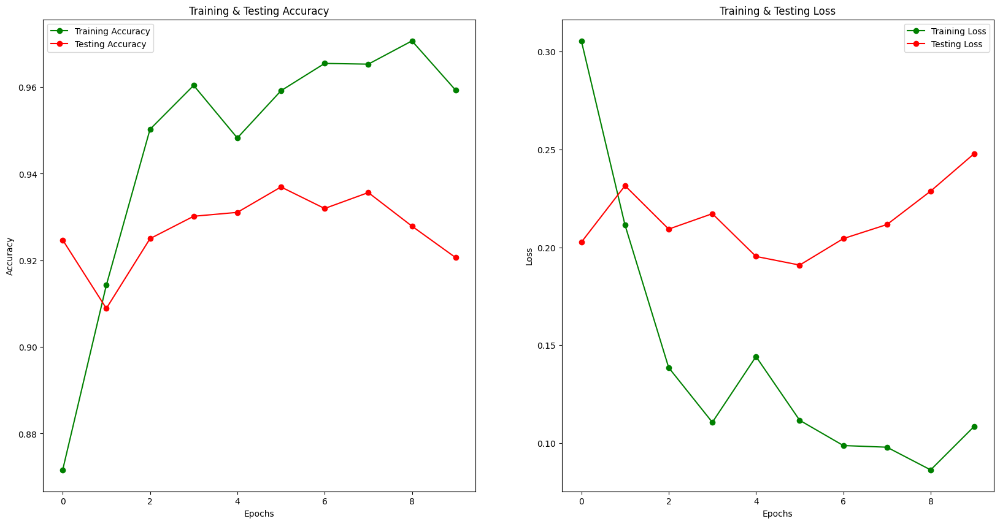

In [ ]:
print_graphs(history_rnn_w2v)

In [ ]:
predicted_categories_rnn_w2v = [1 * (x[0]>=0.5) for x in scores_rnn_w2v]
cm_rnn_w2v = confusion_matrix(y_test,predicted_categories_rnn_w2v)
#cm_rnn_w2v = pd.DataFrame(cm_rnn_w2v , index = ['Fake','Original'] , columns = ['Fake','Original'])

Text(95.72222222222221, 0.5, 'Actual')

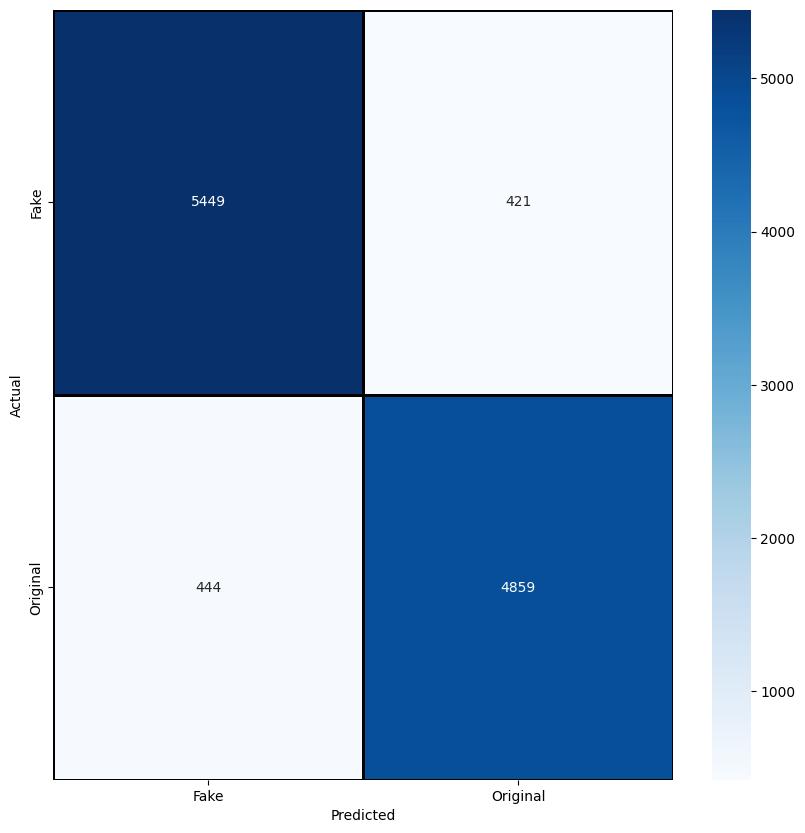

In [ ]:
plt.figure(figsize = (10,10))
sns.heatmap(cm_rnn_w2v,cmap= "Blues", linecolor = 'black' , linewidth = 1 , annot = True, fmt='' , xticklabels = ['Fake','Original'] , yticklabels = ['Fake','Original'])
plt.xlabel("Predicted")
plt.ylabel("Actual")

In [ ]:
scores_model.append({'Model': 'RNN with w2v','AUC_Score': roc_auc(scores_rnn_w2v,y_test)})

In [ ]:
scores_model

[{'Model': 'SimpleRNN', 'AUC_Score': 0.978083554003857},
 {'Model': 'LSTM', 'AUC_Score': 0.9994994636766628},
 {'Model': 'RNN with w2v', 'AUC_Score': 0.9708290540438522}]

In [ ]:
path_model_rnn_w2v = '/content/gdrive/MyDrive/Estudos/Data_Science/PUC_RIO/Sprint_2/MVP/models/rnn_w2v'
model_rnn_w2v.save_weights(path_model_rnn_w2v)
model_rnn_w2v.save(path_model_rnn_w2v)

#new_model = tf.keras.models.load_model('saved_model/my_model') -- como dar load no modelo

In [ ]:
with open('/content/gdrive/MyDrive/Estudos/Data_Science/PUC_RIO/Sprint_2/MVP/models/rnn_w2v/trainHistoryDict', 'wb') as file_pi:
    pickle.dump(history_rnn_w2v.history, file_pi)

##### **LSTM - Com w2vector**

In [ ]:
%%time
with strategy.scope():

    # Um LSTM náo treinável
    model_lstm_w2v = Sequential()
    model_lstm_w2v.add(Embedding(len(word_index)+1,
                     output_dim=embed_size,
                     weights=[embedding_matrix],
                     input_length=max_len,
                     trainable=False))

    model_lstm_w2v.add(LSTM(units = 128, return_sequences = True, dropout=0.25, recurrent_dropout=0.25))
    model_lstm_w2v.add(LSTM(units=64 , recurrent_dropout = 0.1 , dropout = 0.1))
    model_lstm_w2v.add(Dense(units = 32 , activation = 'relu'))
    model_lstm_w2v.add(Dense(1, activation='sigmoid'))
    model_lstm_w2v.compile(optimizer=keras.optimizers.Adam(lr = 0.01), loss='binary_crossentropy', metrics=['accuracy'])

model_lstm_w2v.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, 300, 300)          59396100  
                                                                 
 lstm_2 (LSTM)               (None, 300, 128)          219648    
                                                                 
 lstm_3 (LSTM)               (None, 64)                49408     
                                                                 
 dense_4 (Dense)             (None, 32)                2080      
                                                                 
 dense_5 (Dense)             (None, 1)                 33        
                                                                 
Total params: 59,667,269
Trainable params: 271,169
Non-trainable params: 59,396,100
_________________________________________________________________
CPU times: user 1.61 s, sys: 1.6 s, 

In [ ]:
path_model_lstm_w2v = '/content/gdrive/MyDrive/Estudos/Data_Science/PUC_RIO/Sprint_2/MVP/models/lstm_w2v'

cp_callback_lstm_w2v = ModelCheckpoint(
    filepath=path_model_lstm_w2v,
    verbose=1,
    save_best_only=True,
    save_weights_only=False,
    save_freq=1)

In [ ]:
history_lstm_w2v = model_lstm_w2v.fit(X_train_pad, y_train,
                         validation_split=0.3,
                         epochs=epochs,
                         batch_size=batch_size,
                         callbacks=[cp_callback_lstm_w2v],
                         verbose = 1)

Epoch 1/10


  1/367 [..............................] - ETA: 52:39 - loss: 0.6926 - accuracy: 0.5000

  2/367 [..............................] - ETA: 27:44 - loss: 0.6571 - accuracy: 0.5859

  3/367 [..............................] - ETA: 21:16 - loss: 0.7159 - accuracy: 0.5781

  4/367 [..............................] - ETA: 19:01 - loss: 0.6798 - accuracy: 0.6250

  5/367 [..............................] - ETA: 17:51 - loss: 0.6407 - accuracy: 0.6531

  6/367 [..............................] - ETA: 17:09 - loss: 0.6762 - accuracy: 0.6536

  7/367 [..............................] - ETA: 19:00 - loss: 0.6533 - accuracy: 0.6674

  8/367 [..............................] - ETA: 18:17 - loss: 0.6348 - accuracy: 0.6758

  9/367 [..............................] - ETA: 17:45 - loss: 0.6212 - accuracy: 0.6806

 10/367 [..............................] - ETA: 17:18 - loss: 0.6150 - accuracy: 0.6812

 11/367 [..............................] - ETA: 16:56 - loss: 0.5975 - accuracy: 0.6903

 12/367 [..............................] - ETA: 17:44 - loss: 0.5797 - accuracy: 0.7070

 13/367 [>.............................] - ETA: 17:31 - loss: 0.5719 - accuracy: 0.7139

 14/367 [>.............................] - ETA: 17:13 - loss: 0.5627 - accuracy: 0.7188

 15/367 [>.............................] - ETA: 16:57 - loss: 0.5640 - accuracy: 0.7146

 16/367 [>.............................] - ETA: 16:42 - loss: 0.5555 - accuracy: 0.7197

 17/367 [>.............................] - ETA: 17:44 - loss: 0.5490 - accuracy: 0.7224

 18/367 [>.............................] - ETA: 17:27 - loss: 0.5427 - accuracy: 0.7266

 19/367 [>.............................] - ETA: 17:12 - loss: 0.5279 - accuracy: 0.7368

 20/367 [>.............................] - ETA: 16:59 - loss: 0.5214 - accuracy: 0.7406

 21/367 [>.............................] - ETA: 16:47 - loss: 0.5188 - accuracy: 0.7418

 22/367 [>.............................] - ETA: 17:14 - loss: 0.5129 - accuracy: 0.7443

 23/367 [>.............................] - ETA: 17:03 - loss: 0.5061 - accuracy: 0.7473

 24/367 [>.............................] - ETA: 16:51 - loss: 0.4992 - accuracy: 0.7507

 25/367 [=>............................] - ETA: 16:40 - loss: 0.4908 - accuracy: 0.7563

 26/367 [=>............................] - ETA: 16:31 - loss: 0.4806 - accuracy: 0.7638

 27/367 [=>............................] - ETA: 16:51 - loss: 0.4792 - accuracy: 0.7656

 28/367 [=>............................] - ETA: 16:42 - loss: 0.4736 - accuracy: 0.7690

 29/367 [=>............................] - ETA: 16:32 - loss: 0.4662 - accuracy: 0.7737

 30/367 [=>............................] - ETA: 16:23 - loss: 0.4707 - accuracy: 0.7740

 31/367 [=>............................] - ETA: 16:14 - loss: 0.4672 - accuracy: 0.7757

 32/367 [=>............................] - ETA: 16:25 - loss: 0.4648 - accuracy: 0.7769

 33/367 [=>............................] - ETA: 16:21 - loss: 0.4651 - accuracy: 0.7760

 34/367 [=>............................] - ETA: 16:12 - loss: 0.4624 - accuracy: 0.7762

 35/367 [=>............................] - ETA: 16:04 - loss: 0.4605 - accuracy: 0.7763

 36/367 [=>............................] - ETA: 15:56 - loss: 0.4590 - accuracy: 0.7782

 37/367 [==>...........................] - ETA: 16:02 - loss: 0.4565 - accuracy: 0.7791

 38/367 [==>...........................] - ETA: 16:03 - loss: 0.4528 - accuracy: 0.7817

 39/367 [==>...........................] - ETA: 15:55 - loss: 0.4482 - accuracy: 0.7857

 40/367 [==>...........................] - ETA: 15:48 - loss: 0.4464 - accuracy: 0.7871

 41/367 [==>...........................] - ETA: 15:41 - loss: 0.4439 - accuracy: 0.7881

 42/367 [==>...........................] - ETA: 15:42 - loss: 0.4424 - accuracy: 0.7891

 43/367 [==>...........................] - ETA: 15:46 - loss: 0.4387 - accuracy: 0.7903

 44/367 [==>...........................] - ETA: 15:39 - loss: 0.4363 - accuracy: 0.7912

 45/367 [==>...........................] - ETA: 15:32 - loss: 0.4331 - accuracy: 0.7924

 46/367 [==>...........................] - ETA: 15:25 - loss: 0.4305 - accuracy: 0.7945

 47/367 [==>...........................] - ETA: 15:23 - loss: 0.4261 - accuracy: 0.7969

 48/367 [==>...........................] - ETA: 15:29 - loss: 0.4233 - accuracy: 0.7985

 49/367 [===>..........................] - ETA: 15:23 - loss: 0.4183 - accuracy: 0.8013

 50/367 [===>..........................] - ETA: 15:17 - loss: 0.4168 - accuracy: 0.8022

 51/367 [===>..........................] - ETA: 15:11 - loss: 0.4145 - accuracy: 0.8033

 52/367 [===>..........................] - ETA: 15:07 - loss: 0.4105 - accuracy: 0.8056

 53/367 [===>..........................] - ETA: 15:13 - loss: 0.4088 - accuracy: 0.8075

 54/367 [===>..........................] - ETA: 15:15 - loss: 0.4055 - accuracy: 0.8090

 55/367 [===>..........................] - ETA: 15:09 - loss: 0.4057 - accuracy: 0.8097

 56/367 [===>..........................] - ETA: 15:03 - loss: 0.4021 - accuracy: 0.8114

 57/367 [===>..........................] - ETA: 15:05 - loss: 0.4054 - accuracy: 0.8098

 58/367 [===>..........................] - ETA: 15:05 - loss: 0.4033 - accuracy: 0.8109

 59/367 [===>..........................] - ETA: 14:59 - loss: 0.4007 - accuracy: 0.8120

 60/367 [===>..........................] - ETA: 14:54 - loss: 0.3980 - accuracy: 0.8128

 61/367 [===>..........................] - ETA: 14:48 - loss: 0.3969 - accuracy: 0.8135

 62/367 [====>.........................] - ETA: 14:49 - loss: 0.3942 - accuracy: 0.8153

 63/367 [====>.........................] - ETA: 14:49 - loss: 0.3936 - accuracy: 0.8155

 64/367 [====>.........................] - ETA: 14:43 - loss: 0.3909 - accuracy: 0.8169

 65/367 [====>.........................] - ETA: 14:38 - loss: 0.3883 - accuracy: 0.8188

 66/367 [====>.........................] - ETA: 14:33 - loss: 0.3865 - accuracy: 0.8198

 67/367 [====>.........................] - ETA: 14:32 - loss: 0.3843 - accuracy: 0.8209

 68/367 [====>.........................] - ETA: 14:33 - loss: 0.3819 - accuracy: 0.8224

 69/367 [====>.........................] - ETA: 14:28 - loss: 0.3806 - accuracy: 0.8231

 70/367 [====>.........................] - ETA: 14:22 - loss: 0.3812 - accuracy: 0.8230

 71/367 [====>.........................] - ETA: 14:17 - loss: 0.3803 - accuracy: 0.8233

 72/367 [====>.........................] - ETA: 14:24 - loss: 0.3797 - accuracy: 0.8234

 73/367 [====>.........................] - ETA: 14:21 - loss: 0.3788 - accuracy: 0.8243

 74/367 [=====>........................] - ETA: 14:16 - loss: 0.3773 - accuracy: 0.8250

 75/367 [=====>........................] - ETA: 14:11 - loss: 0.3762 - accuracy: 0.8260

 76/367 [=====>........................] - ETA: 14:06 - loss: 0.3740 - accuracy: 0.8271

 77/367 [=====>........................] - ETA: 14:06 - loss: 0.3725 - accuracy: 0.8275

 78/367 [=====>........................] - ETA: 14:05 - loss: 0.3695 - accuracy: 0.8293

 79/367 [=====>........................] - ETA: 14:01 - loss: 0.3682 - accuracy: 0.8301

 80/367 [=====>........................] - ETA: 13:56 - loss: 0.3666 - accuracy: 0.8313

 81/367 [=====>........................] - ETA: 13:52 - loss: 0.3656 - accuracy: 0.8320

 82/367 [=====>........................] - ETA: 13:51 - loss: 0.3644 - accuracy: 0.8325

 83/367 [=====>........................] - ETA: 13:50 - loss: 0.3638 - accuracy: 0.8332

 84/367 [=====>........................] - ETA: 13:46 - loss: 0.3624 - accuracy: 0.8341

 85/367 [=====>........................] - ETA: 13:41 - loss: 0.3618 - accuracy: 0.8349

 86/367 [======>.......................] - ETA: 13:37 - loss: 0.3602 - accuracy: 0.8354

 87/367 [======>.......................] - ETA: 13:35 - loss: 0.3589 - accuracy: 0.8364

 88/367 [======>.......................] - ETA: 13:35 - loss: 0.3599 - accuracy: 0.8363

 89/367 [======>.......................] - ETA: 13:31 - loss: 0.3598 - accuracy: 0.8369

 90/367 [======>.......................] - ETA: 13:26 - loss: 0.3595 - accuracy: 0.8377

 91/367 [======>.......................] - ETA: 13:22 - loss: 0.3591 - accuracy: 0.8376

 92/367 [======>.......................] - ETA: 13:19 - loss: 0.3581 - accuracy: 0.8380

 93/367 [======>.......................] - ETA: 13:20 - loss: 0.3565 - accuracy: 0.8385

 94/367 [======>.......................] - ETA: 13:15 - loss: 0.3553 - accuracy: 0.8393

 95/367 [======>.......................] - ETA: 13:11 - loss: 0.3544 - accuracy: 0.8396

 96/367 [======>.......................] - ETA: 13:06 - loss: 0.3534 - accuracy: 0.8405

 97/367 [======>.......................] - ETA: 13:03 - loss: 0.3536 - accuracy: 0.8400

 98/367 [=======>......................] - ETA: 13:04 - loss: 0.3539 - accuracy: 0.8399

 99/367 [=======>......................] - ETA: 13:00 - loss: 0.3537 - accuracy: 0.8403

100/367 [=======>......................] - ETA: 12:56 - loss: 0.3526 - accuracy: 0.8409

101/367 [=======>......................] - ETA: 12:51 - loss: 0.3515 - accuracy: 0.8417

102/367 [=======>......................] - ETA: 12:47 - loss: 0.3506 - accuracy: 0.8425

103/367 [=======>......................] - ETA: 12:49 - loss: 0.3488 - accuracy: 0.8434

104/367 [=======>......................] - ETA: 12:51 - loss: 0.3489 - accuracy: 0.8436

105/367 [=======>......................] - ETA: 12:46 - loss: 0.3473 - accuracy: 0.8448

106/367 [=======>......................] - ETA: 12:42 - loss: 0.3462 - accuracy: 0.8452

107/367 [=======>......................] - ETA: 12:41 - loss: 0.3446 - accuracy: 0.8459

108/367 [=======>......................] - ETA: 12:39 - loss: 0.3432 - accuracy: 0.8466

109/367 [=======>......................] - ETA: 12:35 - loss: 0.3420 - accuracy: 0.8473

110/367 [=======>......................] - ETA: 12:31 - loss: 0.3418 - accuracy: 0.8474

111/367 [========>.....................] - ETA: 12:27 - loss: 0.3413 - accuracy: 0.8478

112/367 [========>.....................] - ETA: 12:25 - loss: 0.3397 - accuracy: 0.8484

113/367 [========>.....................] - ETA: 12:24 - loss: 0.3380 - accuracy: 0.8491

114/367 [========>.....................] - ETA: 12:20 - loss: 0.3361 - accuracy: 0.8502

115/367 [========>.....................] - ETA: 12:16 - loss: 0.3348 - accuracy: 0.8504

116/367 [========>.....................] - ETA: 12:12 - loss: 0.3331 - accuracy: 0.8512

117/367 [========>.....................] - ETA: 12:09 - loss: 0.3315 - accuracy: 0.8522

118/367 [========>.....................] - ETA: 12:09 - loss: 0.3306 - accuracy: 0.8528

119/367 [========>.....................] - ETA: 12:05 - loss: 0.3291 - accuracy: 0.8533

120/367 [========>.....................] - ETA: 12:01 - loss: 0.3272 - accuracy: 0.8543

121/367 [========>.....................] - ETA: 11:57 - loss: 0.3288 - accuracy: 0.8537

122/367 [========>.....................] - ETA: 11:54 - loss: 0.3329 - accuracy: 0.8517

123/367 [=========>....................] - ETA: 11:53 - loss: 0.3373 - accuracy: 0.8497

124/367 [=========>....................] - ETA: 11:49 - loss: 0.3395 - accuracy: 0.8484

125/367 [=========>....................] - ETA: 11:45 - loss: 0.3408 - accuracy: 0.8475

126/367 [=========>....................] - ETA: 11:41 - loss: 0.3412 - accuracy: 0.8478

127/367 [=========>....................] - ETA: 11:38 - loss: 0.3420 - accuracy: 0.8477

128/367 [=========>....................] - ETA: 11:38 - loss: 0.3431 - accuracy: 0.8469

129/367 [=========>....................] - ETA: 11:34 - loss: 0.3452 - accuracy: 0.8451

130/367 [=========>....................] - ETA: 11:30 - loss: 0.3460 - accuracy: 0.8445

131/367 [=========>....................] - ETA: 11:27 - loss: 0.3469 - accuracy: 0.8438

132/367 [=========>....................] - ETA: 11:23 - loss: 0.3489 - accuracy: 0.8423

133/367 [=========>....................] - ETA: 11:23 - loss: 0.3495 - accuracy: 0.8416

134/367 [=========>....................] - ETA: 11:19 - loss: 0.3499 - accuracy: 0.8414

135/367 [==========>...................] - ETA: 11:15 - loss: 0.3495 - accuracy: 0.8421

136/367 [==========>...................] - ETA: 11:12 - loss: 0.3491 - accuracy: 0.8426

137/367 [==========>...................] - ETA: 11:08 - loss: 0.3486 - accuracy: 0.8430

138/367 [==========>...................] - ETA: 11:07 - loss: 0.3479 - accuracy: 0.8435

139/367 [==========>...................] - ETA: 11:04 - loss: 0.3467 - accuracy: 0.8441

140/367 [==========>...................] - ETA: 11:00 - loss: 0.3466 - accuracy: 0.8441

141/367 [==========>...................] - ETA: 10:57 - loss: 0.3457 - accuracy: 0.8447

142/367 [==========>...................] - ETA: 10:53 - loss: 0.3461 - accuracy: 0.8442

143/367 [==========>...................] - ETA: 10:52 - loss: 0.3451 - accuracy: 0.8447

144/367 [==========>...................] - ETA: 10:49 - loss: 0.3447 - accuracy: 0.8448

145/367 [==========>...................] - ETA: 10:45 - loss: 0.3434 - accuracy: 0.8455

146/367 [==========>...................] - ETA: 10:42 - loss: 0.3420 - accuracy: 0.8461

147/367 [===========>..................] - ETA: 10:38 - loss: 0.3413 - accuracy: 0.8461

148/367 [===========>..................] - ETA: 10:36 - loss: 0.3405 - accuracy: 0.8463

149/367 [===========>..................] - ETA: 10:34 - loss: 0.3394 - accuracy: 0.8469

150/367 [===========>..................] - ETA: 10:30 - loss: 0.3389 - accuracy: 0.8471

151/367 [===========>..................] - ETA: 10:27 - loss: 0.3388 - accuracy: 0.8471

152/367 [===========>..................] - ETA: 10:23 - loss: 0.3380 - accuracy: 0.8476

153/367 [===========>..................] - ETA: 10:21 - loss: 0.3369 - accuracy: 0.8480

154/367 [===========>..................] - ETA: 10:19 - loss: 0.3356 - accuracy: 0.8485

155/367 [===========>..................] - ETA: 10:16 - loss: 0.3341 - accuracy: 0.8492

156/367 [===========>..................] - ETA: 10:12 - loss: 0.3334 - accuracy: 0.8496

157/367 [===========>..................] - ETA: 10:08 - loss: 0.3323 - accuracy: 0.8501

158/367 [===========>..................] - ETA: 10:06 - loss: 0.3308 - accuracy: 0.8509

159/367 [===========>..................] - ETA: 10:04 - loss: 0.3304 - accuracy: 0.8514

160/367 [============>.................] - ETA: 10:01 - loss: 0.3291 - accuracy: 0.8521

161/367 [============>.................] - ETA: 9:57 - loss: 0.3281 - accuracy: 0.8527 

162/367 [============>.................] - ETA: 9:54 - loss: 0.3270 - accuracy: 0.8533

163/367 [============>.................] - ETA: 9:51 - loss: 0.3268 - accuracy: 0.8534

164/367 [============>.................] - ETA: 9:50 - loss: 0.3254 - accuracy: 0.8541

165/367 [============>.................] - ETA: 9:46 - loss: 0.3239 - accuracy: 0.8550

166/367 [============>.................] - ETA: 9:43 - loss: 0.3228 - accuracy: 0.8556

167/367 [============>.................] - ETA: 9:39 - loss: 0.3220 - accuracy: 0.8562

168/367 [============>.................] - ETA: 9:36 - loss: 0.3218 - accuracy: 0.8563

169/367 [============>.................] - ETA: 9:35 - loss: 0.3220 - accuracy: 0.8563

170/367 [============>.................] - ETA: 9:32 - loss: 0.3216 - accuracy: 0.8565

171/367 [============>.................] - ETA: 9:28 - loss: 0.3208 - accuracy: 0.8570

172/367 [=============>................] - ETA: 9:24 - loss: 0.3202 - accuracy: 0.8573

173/367 [=============>................] - ETA: 9:21 - loss: 0.3194 - accuracy: 0.8577

174/367 [=============>................] - ETA: 9:20 - loss: 0.3186 - accuracy: 0.8580

175/367 [=============>................] - ETA: 9:17 - loss: 0.3179 - accuracy: 0.8585

176/367 [=============>................] - ETA: 9:13 - loss: 0.3171 - accuracy: 0.8588

177/367 [=============>................] - ETA: 9:10 - loss: 0.3161 - accuracy: 0.8593

178/367 [=============>................] - ETA: 9:07 - loss: 0.3152 - accuracy: 0.8599

179/367 [=============>................] - ETA: 9:05 - loss: 0.3149 - accuracy: 0.8602

180/367 [=============>................] - ETA: 9:02 - loss: 0.3142 - accuracy: 0.8608

181/367 [=============>................] - ETA: 8:59 - loss: 0.3137 - accuracy: 0.8610

182/367 [=============>................] - ETA: 8:55 - loss: 0.3131 - accuracy: 0.8613

183/367 [=============>................] - ETA: 8:52 - loss: 0.3124 - accuracy: 0.8618

184/367 [==============>...............] - ETA: 8:50 - loss: 0.3119 - accuracy: 0.8620

185/367 [==============>...............] - ETA: 8:47 - loss: 0.3120 - accuracy: 0.8618

186/367 [==============>...............] - ETA: 8:44 - loss: 0.3118 - accuracy: 0.8618

187/367 [==============>...............] - ETA: 8:41 - loss: 0.3113 - accuracy: 0.8620

188/367 [==============>...............] - ETA: 8:37 - loss: 0.3113 - accuracy: 0.8618

189/367 [==============>...............] - ETA: 8:35 - loss: 0.3110 - accuracy: 0.8618

190/367 [==============>...............] - ETA: 8:34 - loss: 0.3104 - accuracy: 0.8623

191/367 [==============>...............] - ETA: 8:32 - loss: 0.3095 - accuracy: 0.8630

192/367 [==============>...............] - ETA: 8:28 - loss: 0.3087 - accuracy: 0.8637

193/367 [==============>...............] - ETA: 8:25 - loss: 0.3078 - accuracy: 0.8642

194/367 [==============>...............] - ETA: 8:21 - loss: 0.3071 - accuracy: 0.8647

195/367 [==============>...............] - ETA: 8:19 - loss: 0.3065 - accuracy: 0.8647

196/367 [===============>..............] - ETA: 8:17 - loss: 0.3056 - accuracy: 0.8651

197/367 [===============>..............] - ETA: 8:13 - loss: 0.3048 - accuracy: 0.8655

198/367 [===============>..............] - ETA: 8:10 - loss: 0.3037 - accuracy: 0.8660

199/367 [===============>..............] - ETA: 8:07 - loss: 0.3026 - accuracy: 0.8664

200/367 [===============>..............] - ETA: 8:05 - loss: 0.3016 - accuracy: 0.8669

201/367 [===============>..............] - ETA: 8:04 - loss: 0.3005 - accuracy: 0.8671

202/367 [===============>..............] - ETA: 8:00 - loss: 0.2996 - accuracy: 0.8676

203/367 [===============>..............] - ETA: 7:57 - loss: 0.2986 - accuracy: 0.8679

204/367 [===============>..............] - ETA: 7:54 - loss: 0.2975 - accuracy: 0.8685

205/367 [===============>..............] - ETA: 7:51 - loss: 0.2965 - accuracy: 0.8691

206/367 [===============>..............] - ETA: 7:49 - loss: 0.2958 - accuracy: 0.8693

207/367 [===============>..............] - ETA: 7:46 - loss: 0.2949 - accuracy: 0.8696

208/367 [================>.............] - ETA: 7:42 - loss: 0.2943 - accuracy: 0.8698

209/367 [================>.............] - ETA: 7:39 - loss: 0.2933 - accuracy: 0.8702

210/367 [================>.............] - ETA: 7:36 - loss: 0.2924 - accuracy: 0.8708

211/367 [================>.............] - ETA: 7:34 - loss: 0.2914 - accuracy: 0.8712

212/367 [================>.............] - ETA: 7:31 - loss: 0.2901 - accuracy: 0.8718

213/367 [================>.............] - ETA: 7:28 - loss: 0.2898 - accuracy: 0.8721

214/367 [================>.............] - ETA: 7:24 - loss: 0.2888 - accuracy: 0.8726

215/367 [================>.............] - ETA: 7:21 - loss: 0.2878 - accuracy: 0.8730

216/367 [================>.............] - ETA: 7:19 - loss: 0.2866 - accuracy: 0.8736

217/367 [================>.............] - ETA: 7:16 - loss: 0.2858 - accuracy: 0.8739

218/367 [================>.............] - ETA: 7:13 - loss: 0.2847 - accuracy: 0.8744

219/367 [================>.............] - ETA: 7:10 - loss: 0.2837 - accuracy: 0.8747

220/367 [================>.............] - ETA: 7:06 - loss: 0.2827 - accuracy: 0.8752

221/367 [=================>............] - ETA: 7:04 - loss: 0.2829 - accuracy: 0.8752

222/367 [=================>............] - ETA: 7:02 - loss: 0.2821 - accuracy: 0.8755

223/367 [=================>............] - ETA: 6:58 - loss: 0.2810 - accuracy: 0.8760

224/367 [=================>............] - ETA: 6:55 - loss: 0.2805 - accuracy: 0.8764

225/367 [=================>............] - ETA: 6:52 - loss: 0.2797 - accuracy: 0.8767

226/367 [=================>............] - ETA: 6:49 - loss: 0.2787 - accuracy: 0.8772

227/367 [=================>............] - ETA: 6:47 - loss: 0.2776 - accuracy: 0.8778

228/367 [=================>............] - ETA: 6:44 - loss: 0.2768 - accuracy: 0.8781

229/367 [=================>............] - ETA: 6:40 - loss: 0.2759 - accuracy: 0.8785

230/367 [=================>............] - ETA: 6:37 - loss: 0.2748 - accuracy: 0.8789

231/367 [=================>............] - ETA: 6:35 - loss: 0.2741 - accuracy: 0.8793

232/367 [=================>............] - ETA: 6:32 - loss: 0.2729 - accuracy: 0.8798

233/367 [==================>...........] - ETA: 6:29 - loss: 0.2719 - accuracy: 0.8802

234/367 [==================>...........] - ETA: 6:26 - loss: 0.2710 - accuracy: 0.8806

235/367 [==================>...........] - ETA: 6:23 - loss: 0.2700 - accuracy: 0.8811

236/367 [==================>...........] - ETA: 6:20 - loss: 0.2692 - accuracy: 0.8815

237/367 [==================>...........] - ETA: 6:17 - loss: 0.2683 - accuracy: 0.8819

238/367 [==================>...........] - ETA: 6:14 - loss: 0.2680 - accuracy: 0.8820

239/367 [==================>...........] - ETA: 6:11 - loss: 0.2675 - accuracy: 0.8823

240/367 [==================>...........] - ETA: 6:08 - loss: 0.2667 - accuracy: 0.8827

241/367 [==================>...........] - ETA: 6:05 - loss: 0.2668 - accuracy: 0.8828

242/367 [==================>...........] - ETA: 6:03 - loss: 0.2661 - accuracy: 0.8831

243/367 [==================>...........] - ETA: 6:00 - loss: 0.2651 - accuracy: 0.8836

244/367 [==================>...........] - ETA: 5:56 - loss: 0.2644 - accuracy: 0.8840

245/367 [===================>..........] - ETA: 5:53 - loss: 0.2638 - accuracy: 0.8843

246/367 [===================>..........] - ETA: 5:50 - loss: 0.2629 - accuracy: 0.8847

247/367 [===================>..........] - ETA: 5:48 - loss: 0.2625 - accuracy: 0.8848

248/367 [===================>..........] - ETA: 5:45 - loss: 0.2618 - accuracy: 0.8850

249/367 [===================>..........] - ETA: 5:42 - loss: 0.2615 - accuracy: 0.8851

250/367 [===================>..........] - ETA: 5:39 - loss: 0.2610 - accuracy: 0.8855

251/367 [===================>..........] - ETA: 5:36 - loss: 0.2608 - accuracy: 0.8858

252/367 [===================>..........] - ETA: 5:34 - loss: 0.2601 - accuracy: 0.8862

253/367 [===================>..........] - ETA: 5:30 - loss: 0.2595 - accuracy: 0.8865

254/367 [===================>..........] - ETA: 5:27 - loss: 0.2589 - accuracy: 0.8867

255/367 [===================>..........] - ETA: 5:24 - loss: 0.2584 - accuracy: 0.8870

256/367 [===================>..........] - ETA: 5:21 - loss: 0.2580 - accuracy: 0.8871

257/367 [====================>.........] - ETA: 5:19 - loss: 0.2574 - accuracy: 0.8874

258/367 [====================>.........] - ETA: 5:16 - loss: 0.2566 - accuracy: 0.8878

259/367 [====================>.........] - ETA: 5:13 - loss: 0.2563 - accuracy: 0.8880

260/367 [====================>.........] - ETA: 5:10 - loss: 0.2557 - accuracy: 0.8884

261/367 [====================>.........] - ETA: 5:07 - loss: 0.2552 - accuracy: 0.8886

262/367 [====================>.........] - ETA: 5:04 - loss: 0.2546 - accuracy: 0.8889

263/367 [====================>.........] - ETA: 5:01 - loss: 0.2540 - accuracy: 0.8892

264/367 [====================>.........] - ETA: 4:58 - loss: 0.2537 - accuracy: 0.8893

265/367 [====================>.........] - ETA: 4:55 - loss: 0.2533 - accuracy: 0.8896

266/367 [====================>.........] - ETA: 4:52 - loss: 0.2526 - accuracy: 0.8900

267/367 [====================>.........] - ETA: 4:49 - loss: 0.2520 - accuracy: 0.8903

268/367 [====================>.........] - ETA: 4:47 - loss: 0.2516 - accuracy: 0.8906

269/367 [====================>.........] - ETA: 4:44 - loss: 0.2508 - accuracy: 0.8909

270/367 [=====================>........] - ETA: 4:41 - loss: 0.2505 - accuracy: 0.8911

271/367 [=====================>........] - ETA: 4:38 - loss: 0.2497 - accuracy: 0.8914

272/367 [=====================>........] - ETA: 4:35 - loss: 0.2490 - accuracy: 0.8917

273/367 [=====================>........] - ETA: 4:32 - loss: 0.2482 - accuracy: 0.8921

274/367 [=====================>........] - ETA: 4:30 - loss: 0.2477 - accuracy: 0.8922

275/367 [=====================>........] - ETA: 4:27 - loss: 0.2469 - accuracy: 0.8926

276/367 [=====================>........] - ETA: 4:24 - loss: 0.2467 - accuracy: 0.8926

277/367 [=====================>........] - ETA: 4:22 - loss: 0.2460 - accuracy: 0.8929

278/367 [=====================>........] - ETA: 4:18 - loss: 0.2453 - accuracy: 0.8933

279/367 [=====================>........] - ETA: 4:15 - loss: 0.2447 - accuracy: 0.8936

280/367 [=====================>........] - ETA: 4:12 - loss: 0.2442 - accuracy: 0.8939

281/367 [=====================>........] - ETA: 4:09 - loss: 0.2433 - accuracy: 0.8942

282/367 [======================>.......] - ETA: 4:07 - loss: 0.2425 - accuracy: 0.8946

283/367 [======================>.......] - ETA: 4:04 - loss: 0.2420 - accuracy: 0.8949

284/367 [======================>.......] - ETA: 4:01 - loss: 0.2412 - accuracy: 0.8952

285/367 [======================>.......] - ETA: 3:58 - loss: 0.2406 - accuracy: 0.8955

286/367 [======================>.......] - ETA: 3:55 - loss: 0.2401 - accuracy: 0.8958

287/367 [======================>.......] - ETA: 3:52 - loss: 0.2393 - accuracy: 0.8962

288/367 [======================>.......] - ETA: 3:49 - loss: 0.2390 - accuracy: 0.8964

289/367 [======================>.......] - ETA: 3:46 - loss: 0.2382 - accuracy: 0.8967

290/367 [======================>.......] - ETA: 3:43 - loss: 0.2378 - accuracy: 0.8970

291/367 [======================>.......] - ETA: 3:40 - loss: 0.2374 - accuracy: 0.8972

292/367 [======================>.......] - ETA: 3:38 - loss: 0.2368 - accuracy: 0.8974

293/367 [======================>.......] - ETA: 3:35 - loss: 0.2365 - accuracy: 0.8977

294/367 [=======================>......] - ETA: 3:32 - loss: 0.2360 - accuracy: 0.8979

295/367 [=======================>......] - ETA: 3:29 - loss: 0.2355 - accuracy: 0.8981

296/367 [=======================>......] - ETA: 3:26 - loss: 0.2348 - accuracy: 0.8984

297/367 [=======================>......] - ETA: 3:23 - loss: 0.2342 - accuracy: 0.8987

298/367 [=======================>......] - ETA: 3:20 - loss: 0.2334 - accuracy: 0.8990

299/367 [=======================>......] - ETA: 3:17 - loss: 0.2328 - accuracy: 0.8993

300/367 [=======================>......] - ETA: 3:14 - loss: 0.2323 - accuracy: 0.8995

301/367 [=======================>......] - ETA: 3:11 - loss: 0.2317 - accuracy: 0.8998

302/367 [=======================>......] - ETA: 3:08 - loss: 0.2316 - accuracy: 0.8998

303/367 [=======================>......] - ETA: 3:06 - loss: 0.2309 - accuracy: 0.9002

304/367 [=======================>......] - ETA: 3:03 - loss: 0.2302 - accuracy: 0.9005

305/367 [=======================>......] - ETA: 3:00 - loss: 0.2299 - accuracy: 0.9007

306/367 [========================>.....] - ETA: 2:57 - loss: 0.2293 - accuracy: 0.9010

307/367 [========================>.....] - ETA: 2:54 - loss: 0.2291 - accuracy: 0.9012

308/367 [========================>.....] - ETA: 2:51 - loss: 0.2288 - accuracy: 0.9013

309/367 [========================>.....] - ETA: 2:48 - loss: 0.2282 - accuracy: 0.9015

310/367 [========================>.....] - ETA: 2:45 - loss: 0.2278 - accuracy: 0.9017

311/367 [========================>.....] - ETA: 2:42 - loss: 0.2272 - accuracy: 0.9020

312/367 [========================>.....] - ETA: 2:39 - loss: 0.2266 - accuracy: 0.9022

313/367 [========================>.....] - ETA: 2:36 - loss: 0.2262 - accuracy: 0.9025

314/367 [========================>.....] - ETA: 2:33 - loss: 0.2257 - accuracy: 0.9027

315/367 [========================>.....] - ETA: 2:30 - loss: 0.2251 - accuracy: 0.9030

316/367 [========================>.....] - ETA: 2:27 - loss: 0.2245 - accuracy: 0.9033

317/367 [========================>.....] - ETA: 2:25 - loss: 0.2239 - accuracy: 0.9035

318/367 [========================>.....] - ETA: 2:22 - loss: 0.2235 - accuracy: 0.9037

319/367 [=========================>....] - ETA: 2:19 - loss: 0.2230 - accuracy: 0.9040

320/367 [=========================>....] - ETA: 2:16 - loss: 0.2226 - accuracy: 0.9042

321/367 [=========================>....] - ETA: 2:13 - loss: 0.2221 - accuracy: 0.9044

322/367 [=========================>....] - ETA: 2:10 - loss: 0.2215 - accuracy: 0.9047

323/367 [=========================>....] - ETA: 2:07 - loss: 0.2210 - accuracy: 0.9049

324/367 [=========================>....] - ETA: 2:04 - loss: 0.2206 - accuracy: 0.9052

325/367 [=========================>....] - ETA: 2:01 - loss: 0.2199 - accuracy: 0.9055

326/367 [=========================>....] - ETA: 1:58 - loss: 0.2193 - accuracy: 0.9058

327/367 [=========================>....] - ETA: 1:55 - loss: 0.2191 - accuracy: 0.9059

328/367 [=========================>....] - ETA: 1:53 - loss: 0.2185 - accuracy: 0.9062

329/367 [=========================>....] - ETA: 1:50 - loss: 0.2179 - accuracy: 0.9065

330/367 [=========================>....] - ETA: 1:47 - loss: 0.2178 - accuracy: 0.9067

331/367 [==========================>...] - ETA: 1:44 - loss: 0.2176 - accuracy: 0.9068

332/367 [==========================>...] - ETA: 1:41 - loss: 0.2171 - accuracy: 0.9070

333/367 [==========================>...] - ETA: 1:38 - loss: 0.2167 - accuracy: 0.9072

334/367 [==========================>...] - ETA: 1:35 - loss: 0.2169 - accuracy: 0.9073

335/367 [==========================>...] - ETA: 1:32 - loss: 0.2166 - accuracy: 0.9074

336/367 [==========================>...] - ETA: 1:29 - loss: 0.2162 - accuracy: 0.9076

337/367 [==========================>...] - ETA: 1:26 - loss: 0.2157 - accuracy: 0.9078

338/367 [==========================>...] - ETA: 1:24 - loss: 0.2151 - accuracy: 0.9081

339/367 [==========================>...] - ETA: 1:21 - loss: 0.2150 - accuracy: 0.9081

340/367 [==========================>...] - ETA: 1:18 - loss: 0.2145 - accuracy: 0.9084

341/367 [==========================>...] - ETA: 1:15 - loss: 0.2139 - accuracy: 0.9086

342/367 [==========================>...] - ETA: 1:12 - loss: 0.2136 - accuracy: 0.9088

343/367 [===========================>..] - ETA: 1:09 - loss: 0.2132 - accuracy: 0.9090

344/367 [===========================>..] - ETA: 1:06 - loss: 0.2129 - accuracy: 0.9091

345/367 [===========================>..] - ETA: 1:03 - loss: 0.2124 - accuracy: 0.9093

346/367 [===========================>..] - ETA: 1:00 - loss: 0.2123 - accuracy: 0.9095

347/367 [===========================>..] - ETA: 57s - loss: 0.2118 - accuracy: 0.9098 

348/367 [===========================>..] - ETA: 55s - loss: 0.2113 - accuracy: 0.9099

349/367 [===========================>..] - ETA: 52s - loss: 0.2108 - accuracy: 0.9102

350/367 [===========================>..] - ETA: 49s - loss: 0.2104 - accuracy: 0.9104

351/367 [===========================>..] - ETA: 46s - loss: 0.2101 - accuracy: 0.9105

352/367 [===========================>..] - ETA: 43s - loss: 0.2097 - accuracy: 0.9106

353/367 [===========================>..] - ETA: 40s - loss: 0.2092 - accuracy: 0.9108

354/367 [===========================>..] - ETA: 37s - loss: 0.2087 - accuracy: 0.9111

355/367 [============================>.] - ETA: 34s - loss: 0.2081 - accuracy: 0.9113

356/367 [============================>.] - ETA: 31s - loss: 0.2078 - accuracy: 0.9115

357/367 [============================>.] - ETA: 28s - loss: 0.2073 - accuracy: 0.9117

358/367 [============================>.] - ETA: 26s - loss: 0.2068 - accuracy: 0.9119

359/367 [============================>.] - ETA: 23s - loss: 0.2064 - accuracy: 0.9121

360/367 [============================>.] - ETA: 20s - loss: 0.2059 - accuracy: 0.9123

361/367 [============================>.] - ETA: 17s - loss: 0.2054 - accuracy: 0.9126

362/367 [============================>.] - ETA: 14s - loss: 0.2052 - accuracy: 0.9127

363/367 [============================>.] - ETA: 11s - loss: 0.2047 - accuracy: 0.9130

364/367 [============================>.] - ETA: 8s - loss: 0.2042 - accuracy: 0.9132 

365/367 [============================>.] - ETA: 5s - loss: 0.2038 - accuracy: 0.9134

366/367 [============================>.] - ETA: 2s - loss: 0.2033 - accuracy: 0.9136

367/367 [==============================] - 1153s 3s/step - loss: 0.2029 - accuracy: 0.9137 - val_loss: 0.0405 - val_accuracy: 0.9863
Epoch 2/10


  1/367 [..............................] - ETA: 14:47 - loss: 0.0741 - accuracy: 0.9531

  2/367 [..............................] - ETA: 15:00 - loss: 0.0562 - accuracy: 0.9688

  3/367 [..............................] - ETA: 14:46 - loss: 0.0415 - accuracy: 0.9792

  4/367 [..............................] - ETA: 14:47 - loss: 0.0341 - accuracy: 0.9844

  5/367 [..............................] - ETA: 18:03 - loss: 0.0443 - accuracy: 0.9812

  6/367 [..............................] - ETA: 17:18 - loss: 0.0500 - accuracy: 0.9714

  7/367 [..............................] - ETA: 16:47 - loss: 0.0564 - accuracy: 0.9732

  8/367 [..............................] - ETA: 16:22 - loss: 0.0504 - accuracy: 0.9766

  9/367 [..............................] - ETA: 16:05 - loss: 0.0541 - accuracy: 0.9774

 10/367 [..............................] - ETA: 17:18 - loss: 0.0544 - accuracy: 0.9781

 11/367 [..............................] - ETA: 16:59 - loss: 0.0528 - accuracy: 0.9787

 12/367 [..............................] - ETA: 16:42 - loss: 0.0506 - accuracy: 0.9792

 13/367 [>.............................] - ETA: 16:28 - loss: 0.0556 - accuracy: 0.9796

 14/367 [>.............................] - ETA: 16:14 - loss: 0.0528 - accuracy: 0.9810

 15/367 [>.............................] - ETA: 16:54 - loss: 0.0506 - accuracy: 0.9823

 16/367 [>.............................] - ETA: 16:47 - loss: 0.0534 - accuracy: 0.9814

 17/367 [>.............................] - ETA: 16:34 - loss: 0.0538 - accuracy: 0.9816

 18/367 [>.............................] - ETA: 16:23 - loss: 0.0570 - accuracy: 0.9800

 19/367 [>.............................] - ETA: 16:12 - loss: 0.0554 - accuracy: 0.9811

 20/367 [>.............................] - ETA: 16:32 - loss: 0.0542 - accuracy: 0.9812

 21/367 [>.............................] - ETA: 16:33 - loss: 0.0527 - accuracy: 0.9814

 22/367 [>.............................] - ETA: 16:23 - loss: 0.0574 - accuracy: 0.9801

 23/367 [>.............................] - ETA: 16:14 - loss: 0.0556 - accuracy: 0.9810

 24/367 [>.............................] - ETA: 16:04 - loss: 0.0570 - accuracy: 0.9811

 25/367 [=>............................] - ETA: 16:15 - loss: 0.0562 - accuracy: 0.9812

 26/367 [=>............................] - ETA: 16:20 - loss: 0.0556 - accuracy: 0.9814

 27/367 [=>............................] - ETA: 16:11 - loss: 0.0548 - accuracy: 0.9815

 28/367 [=>............................] - ETA: 16:03 - loss: 0.0534 - accuracy: 0.9821

 29/367 [=>............................] - ETA: 15:54 - loss: 0.0549 - accuracy: 0.9811

 30/367 [=>............................] - ETA: 16:00 - loss: 0.0555 - accuracy: 0.9802

 31/367 [=>............................] - ETA: 16:06 - loss: 0.0546 - accuracy: 0.9803

 32/367 [=>............................] - ETA: 15:58 - loss: 0.0533 - accuracy: 0.9810

 33/367 [=>............................] - ETA: 15:51 - loss: 0.0537 - accuracy: 0.9806

 34/367 [=>............................] - ETA: 15:44 - loss: 0.0547 - accuracy: 0.9802

 35/367 [=>............................] - ETA: 15:47 - loss: 0.0533 - accuracy: 0.9808

 36/367 [=>............................] - ETA: 15:53 - loss: 0.0546 - accuracy: 0.9809

 37/367 [==>...........................] - ETA: 15:46 - loss: 0.0533 - accuracy: 0.9814

 38/367 [==>...........................] - ETA: 15:38 - loss: 0.0521 - accuracy: 0.9819

 39/367 [==>...........................] - ETA: 15:32 - loss: 0.0512 - accuracy: 0.9824

 40/367 [==>...........................] - ETA: 15:31 - loss: 0.0527 - accuracy: 0.9820

 41/367 [==>...........................] - ETA: 15:38 - loss: 0.0531 - accuracy: 0.9821

 42/367 [==>...........................] - ETA: 15:32 - loss: 0.0522 - accuracy: 0.9825

 43/367 [==>...........................] - ETA: 15:25 - loss: 0.0511 - accuracy: 0.9829

 44/367 [==>...........................] - ETA: 15:19 - loss: 0.0531 - accuracy: 0.9819

 45/367 [==>...........................] - ETA: 15:16 - loss: 0.0541 - accuracy: 0.9816

 46/367 [==>...........................] - ETA: 15:28 - loss: 0.0556 - accuracy: 0.9813

 47/367 [==>...........................] - ETA: 15:34 - loss: 0.0552 - accuracy: 0.9814

 48/367 [==>...........................] - ETA: 15:27 - loss: 0.0551 - accuracy: 0.9811

 49/367 [===>..........................] - ETA: 15:21 - loss: 0.0554 - accuracy: 0.9812

 50/367 [===>..........................] - ETA: 15:17 - loss: 0.0554 - accuracy: 0.9809

 51/367 [===>..........................] - ETA: 15:24 - loss: 0.0549 - accuracy: 0.9810

 52/367 [===>..........................] - ETA: 15:17 - loss: 0.0547 - accuracy: 0.9811

 53/367 [===>..........................] - ETA: 15:12 - loss: 0.0544 - accuracy: 0.9811

 54/367 [===>..........................] - ETA: 15:06 - loss: 0.0536 - accuracy: 0.9815

 55/367 [===>..........................] - ETA: 15:00 - loss: 0.0530 - accuracy: 0.9818

 56/367 [===>..........................] - ETA: 15:08 - loss: 0.0522 - accuracy: 0.9821

 57/367 [===>..........................] - ETA: 15:02 - loss: 0.0517 - accuracy: 0.9822

 58/367 [===>..........................] - ETA: 14:56 - loss: 0.0526 - accuracy: 0.9817

 59/367 [===>..........................] - ETA: 14:51 - loss: 0.0519 - accuracy: 0.9820

 60/367 [===>..........................] - ETA: 14:46 - loss: 0.0514 - accuracy: 0.9820

 61/367 [===>..........................] - ETA: 14:52 - loss: 0.0508 - accuracy: 0.9823

 62/367 [====>.........................] - ETA: 14:47 - loss: 0.0501 - accuracy: 0.9826

 63/367 [====>.........................] - ETA: 14:41 - loss: 0.0509 - accuracy: 0.9824

 64/367 [====>.........................] - ETA: 14:36 - loss: 0.0504 - accuracy: 0.9824

 65/367 [====>.........................] - ETA: 14:31 - loss: 0.0499 - accuracy: 0.9827

 66/367 [====>.........................] - ETA: 14:35 - loss: 0.0495 - accuracy: 0.9830

 67/367 [====>.........................] - ETA: 14:31 - loss: 0.0510 - accuracy: 0.9825

 68/367 [====>.........................] - ETA: 14:26 - loss: 0.0504 - accuracy: 0.9828

 69/367 [====>.........................] - ETA: 14:21 - loss: 0.0499 - accuracy: 0.9830

 70/367 [====>.........................] - ETA: 14:16 - loss: 0.0496 - accuracy: 0.9833

 71/367 [====>.........................] - ETA: 14:19 - loss: 0.0492 - accuracy: 0.9835

 72/367 [====>.........................] - ETA: 14:17 - loss: 0.0496 - accuracy: 0.9835

 73/367 [====>.........................] - ETA: 14:12 - loss: 0.0495 - accuracy: 0.9835

 74/367 [=====>........................] - ETA: 14:07 - loss: 0.0492 - accuracy: 0.9835

 75/367 [=====>........................] - ETA: 14:02 - loss: 0.0501 - accuracy: 0.9831

 76/367 [=====>........................] - ETA: 14:03 - loss: 0.0524 - accuracy: 0.9823

 77/367 [=====>........................] - ETA: 14:02 - loss: 0.0525 - accuracy: 0.9823

 78/367 [=====>........................] - ETA: 13:57 - loss: 0.0525 - accuracy: 0.9822

 79/367 [=====>........................] - ETA: 13:52 - loss: 0.0529 - accuracy: 0.9820

 80/367 [=====>........................] - ETA: 13:48 - loss: 0.0529 - accuracy: 0.9820

 81/367 [=====>........................] - ETA: 13:48 - loss: 0.0535 - accuracy: 0.9817

 82/367 [=====>........................] - ETA: 13:47 - loss: 0.0535 - accuracy: 0.9817

 83/367 [=====>........................] - ETA: 13:42 - loss: 0.0532 - accuracy: 0.9819

 84/367 [=====>........................] - ETA: 13:38 - loss: 0.0533 - accuracy: 0.9816

 85/367 [=====>........................] - ETA: 13:33 - loss: 0.0540 - accuracy: 0.9816

 86/367 [======>.......................] - ETA: 13:32 - loss: 0.0540 - accuracy: 0.9816

 87/367 [======>.......................] - ETA: 13:32 - loss: 0.0536 - accuracy: 0.9819

 88/367 [======>.......................] - ETA: 13:27 - loss: 0.0535 - accuracy: 0.9821

 89/367 [======>.......................] - ETA: 13:23 - loss: 0.0533 - accuracy: 0.9823

 90/367 [======>.......................] - ETA: 13:19 - loss: 0.0530 - accuracy: 0.9823

 91/367 [======>.......................] - ETA: 13:16 - loss: 0.0526 - accuracy: 0.9825

 92/367 [======>.......................] - ETA: 13:17 - loss: 0.0521 - accuracy: 0.9827

 93/367 [======>.......................] - ETA: 13:13 - loss: 0.0529 - accuracy: 0.9825

 94/367 [======>.......................] - ETA: 13:08 - loss: 0.0530 - accuracy: 0.9825

 95/367 [======>.......................] - ETA: 13:04 - loss: 0.0527 - accuracy: 0.9827

 96/367 [======>.......................] - ETA: 13:01 - loss: 0.0524 - accuracy: 0.9829

 97/367 [======>.......................] - ETA: 13:02 - loss: 0.0521 - accuracy: 0.9831

 98/367 [=======>......................] - ETA: 12:58 - loss: 0.0518 - accuracy: 0.9833

 99/367 [=======>......................] - ETA: 12:54 - loss: 0.0517 - accuracy: 0.9833

100/367 [=======>......................] - ETA: 12:49 - loss: 0.0513 - accuracy: 0.9834

101/367 [=======>......................] - ETA: 12:45 - loss: 0.0514 - accuracy: 0.9834

102/367 [=======>......................] - ETA: 12:47 - loss: 0.0510 - accuracy: 0.9836

103/367 [=======>......................] - ETA: 12:43 - loss: 0.0506 - accuracy: 0.9838

104/367 [=======>......................] - ETA: 12:40 - loss: 0.0502 - accuracy: 0.9839

105/367 [=======>......................] - ETA: 12:36 - loss: 0.0505 - accuracy: 0.9839

106/367 [=======>......................] - ETA: 12:33 - loss: 0.0501 - accuracy: 0.9841

107/367 [=======>......................] - ETA: 12:34 - loss: 0.0502 - accuracy: 0.9841

108/367 [=======>......................] - ETA: 12:30 - loss: 0.0510 - accuracy: 0.9839

109/367 [=======>......................] - ETA: 12:26 - loss: 0.0507 - accuracy: 0.9841

110/367 [=======>......................] - ETA: 12:22 - loss: 0.0503 - accuracy: 0.9842

111/367 [========>.....................] - ETA: 12:18 - loss: 0.0502 - accuracy: 0.9842

112/367 [========>.....................] - ETA: 12:19 - loss: 0.0498 - accuracy: 0.9844

113/367 [========>.....................] - ETA: 12:15 - loss: 0.0501 - accuracy: 0.9841

114/367 [========>.....................] - ETA: 12:11 - loss: 0.0496 - accuracy: 0.9842

115/367 [========>.....................] - ETA: 12:07 - loss: 0.0496 - accuracy: 0.9842

116/367 [========>.....................] - ETA: 12:03 - loss: 0.0502 - accuracy: 0.9842

117/367 [========>.....................] - ETA: 12:04 - loss: 0.0510 - accuracy: 0.9841

118/367 [========>.....................] - ETA: 12:00 - loss: 0.0513 - accuracy: 0.9840

119/367 [========>.....................] - ETA: 11:56 - loss: 0.0511 - accuracy: 0.9840

120/367 [========>.....................] - ETA: 11:53 - loss: 0.0507 - accuracy: 0.9841

121/367 [========>.....................] - ETA: 11:49 - loss: 0.0512 - accuracy: 0.9840

122/367 [========>.....................] - ETA: 11:49 - loss: 0.0510 - accuracy: 0.9840

123/367 [=========>....................] - ETA: 11:46 - loss: 0.0510 - accuracy: 0.9839

124/367 [=========>....................] - ETA: 11:42 - loss: 0.0507 - accuracy: 0.9840

125/367 [=========>....................] - ETA: 11:38 - loss: 0.0507 - accuracy: 0.9840

126/367 [=========>....................] - ETA: 11:34 - loss: 0.0504 - accuracy: 0.9841

127/367 [=========>....................] - ETA: 11:34 - loss: 0.0501 - accuracy: 0.9843

128/367 [=========>....................] - ETA: 11:34 - loss: 0.0501 - accuracy: 0.9843

129/367 [=========>....................] - ETA: 11:32 - loss: 0.0497 - accuracy: 0.9844

130/367 [=========>....................] - ETA: 11:28 - loss: 0.0495 - accuracy: 0.9844

131/367 [=========>....................] - ETA: 11:26 - loss: 0.0494 - accuracy: 0.9844

132/367 [=========>....................] - ETA: 11:24 - loss: 0.0498 - accuracy: 0.9843

133/367 [=========>....................] - ETA: 11:20 - loss: 0.0496 - accuracy: 0.9843

134/367 [=========>....................] - ETA: 11:17 - loss: 0.0494 - accuracy: 0.9843

135/367 [==========>...................] - ETA: 11:13 - loss: 0.0495 - accuracy: 0.9840

136/367 [==========>...................] - ETA: 11:11 - loss: 0.0494 - accuracy: 0.9840

137/367 [==========>...................] - ETA: 11:09 - loss: 0.0494 - accuracy: 0.9840

138/367 [==========>...................] - ETA: 11:06 - loss: 0.0492 - accuracy: 0.9841

139/367 [==========>...................] - ETA: 11:02 - loss: 0.0490 - accuracy: 0.9843

140/367 [==========>...................] - ETA: 10:58 - loss: 0.0487 - accuracy: 0.9843

141/367 [==========>...................] - ETA: 10:56 - loss: 0.0487 - accuracy: 0.9842

142/367 [==========>...................] - ETA: 10:55 - loss: 0.0485 - accuracy: 0.9840

143/367 [==========>...................] - ETA: 10:51 - loss: 0.0483 - accuracy: 0.9842

144/367 [==========>...................] - ETA: 10:47 - loss: 0.0483 - accuracy: 0.9840

145/367 [==========>...................] - ETA: 10:43 - loss: 0.0490 - accuracy: 0.9838

146/367 [==========>...................] - ETA: 10:41 - loss: 0.0491 - accuracy: 0.9837

147/367 [===========>..................] - ETA: 10:40 - loss: 0.0488 - accuracy: 0.9838

148/367 [===========>..................] - ETA: 10:36 - loss: 0.0487 - accuracy: 0.9838

149/367 [===========>..................] - ETA: 10:32 - loss: 0.0485 - accuracy: 0.9839

150/367 [===========>..................] - ETA: 10:29 - loss: 0.0486 - accuracy: 0.9839

151/367 [===========>..................] - ETA: 10:26 - loss: 0.0488 - accuracy: 0.9838

152/367 [===========>..................] - ETA: 10:25 - loss: 0.0487 - accuracy: 0.9838

153/367 [===========>..................] - ETA: 10:21 - loss: 0.0485 - accuracy: 0.9839

154/367 [===========>..................] - ETA: 10:18 - loss: 0.0484 - accuracy: 0.9838

155/367 [===========>..................] - ETA: 10:14 - loss: 0.0482 - accuracy: 0.9839

156/367 [===========>..................] - ETA: 10:10 - loss: 0.0481 - accuracy: 0.9839

157/367 [===========>..................] - ETA: 10:10 - loss: 0.0479 - accuracy: 0.9840

158/367 [===========>..................] - ETA: 10:07 - loss: 0.0481 - accuracy: 0.9837

159/367 [===========>..................] - ETA: 10:03 - loss: 0.0485 - accuracy: 0.9836

160/367 [============>.................] - ETA: 9:59 - loss: 0.0485 - accuracy: 0.9836 

161/367 [============>.................] - ETA: 9:56 - loss: 0.0482 - accuracy: 0.9837

162/367 [============>.................] - ETA: 9:55 - loss: 0.0479 - accuracy: 0.9838

163/367 [============>.................] - ETA: 9:52 - loss: 0.0477 - accuracy: 0.9839

164/367 [============>.................] - ETA: 9:48 - loss: 0.0476 - accuracy: 0.9840

165/367 [============>.................] - ETA: 9:45 - loss: 0.0473 - accuracy: 0.9841

166/367 [============>.................] - ETA: 9:41 - loss: 0.0471 - accuracy: 0.9842

167/367 [============>.................] - ETA: 9:40 - loss: 0.0470 - accuracy: 0.9843

168/367 [============>.................] - ETA: 9:37 - loss: 0.0469 - accuracy: 0.9844

169/367 [============>.................] - ETA: 9:34 - loss: 0.0466 - accuracy: 0.9845

170/367 [============>.................] - ETA: 9:30 - loss: 0.0464 - accuracy: 0.9846

171/367 [============>.................] - ETA: 9:27 - loss: 0.0463 - accuracy: 0.9846

172/367 [=============>................] - ETA: 9:25 - loss: 0.0461 - accuracy: 0.9846

173/367 [=============>................] - ETA: 9:22 - loss: 0.0458 - accuracy: 0.9847

174/367 [=============>................] - ETA: 9:19 - loss: 0.0459 - accuracy: 0.9847

175/367 [=============>................] - ETA: 9:16 - loss: 0.0457 - accuracy: 0.9847

176/367 [=============>................] - ETA: 9:12 - loss: 0.0455 - accuracy: 0.9848

177/367 [=============>................] - ETA: 9:10 - loss: 0.0456 - accuracy: 0.9848

178/367 [=============>................] - ETA: 9:08 - loss: 0.0458 - accuracy: 0.9848

179/367 [=============>................] - ETA: 9:04 - loss: 0.0459 - accuracy: 0.9847

180/367 [=============>................] - ETA: 9:01 - loss: 0.0460 - accuracy: 0.9846

181/367 [=============>................] - ETA: 8:58 - loss: 0.0461 - accuracy: 0.9845

182/367 [=============>................] - ETA: 8:55 - loss: 0.0458 - accuracy: 0.9846

183/367 [=============>................] - ETA: 8:53 - loss: 0.0459 - accuracy: 0.9846

184/367 [==============>...............] - ETA: 8:50 - loss: 0.0457 - accuracy: 0.9847

185/367 [==============>...............] - ETA: 8:46 - loss: 0.0460 - accuracy: 0.9845

186/367 [==============>...............] - ETA: 8:43 - loss: 0.0459 - accuracy: 0.9845

187/367 [==============>...............] - ETA: 8:40 - loss: 0.0460 - accuracy: 0.9845

188/367 [==============>...............] - ETA: 8:39 - loss: 0.0459 - accuracy: 0.9845

189/367 [==============>...............] - ETA: 8:35 - loss: 0.0457 - accuracy: 0.9846

190/367 [==============>...............] - ETA: 8:32 - loss: 0.0455 - accuracy: 0.9847

191/367 [==============>...............] - ETA: 8:29 - loss: 0.0453 - accuracy: 0.9848

192/367 [==============>...............] - ETA: 8:26 - loss: 0.0454 - accuracy: 0.9847

193/367 [==============>...............] - ETA: 8:24 - loss: 0.0452 - accuracy: 0.9848

194/367 [==============>...............] - ETA: 8:21 - loss: 0.0450 - accuracy: 0.9849

195/367 [==============>...............] - ETA: 8:17 - loss: 0.0449 - accuracy: 0.9849

196/367 [===============>..............] - ETA: 8:14 - loss: 0.0450 - accuracy: 0.9849

197/367 [===============>..............] - ETA: 8:11 - loss: 0.0453 - accuracy: 0.9849

198/367 [===============>..............] - ETA: 8:10 - loss: 0.0451 - accuracy: 0.9849

199/367 [===============>..............] - ETA: 8:07 - loss: 0.0450 - accuracy: 0.9849

200/367 [===============>..............] - ETA: 8:04 - loss: 0.0448 - accuracy: 0.9850

201/367 [===============>..............] - ETA: 8:01 - loss: 0.0447 - accuracy: 0.9850

202/367 [===============>..............] - ETA: 7:59 - loss: 0.0449 - accuracy: 0.9848

203/367 [===============>..............] - ETA: 7:56 - loss: 0.0452 - accuracy: 0.9848

204/367 [===============>..............] - ETA: 7:53 - loss: 0.0453 - accuracy: 0.9848

205/367 [===============>..............] - ETA: 7:50 - loss: 0.0452 - accuracy: 0.9848

206/367 [===============>..............] - ETA: 7:47 - loss: 0.0450 - accuracy: 0.9849

207/367 [===============>..............] - ETA: 7:46 - loss: 0.0450 - accuracy: 0.9849

208/367 [================>.............] - ETA: 7:43 - loss: 0.0450 - accuracy: 0.9849

209/367 [================>.............] - ETA: 7:39 - loss: 0.0450 - accuracy: 0.9848

210/367 [================>.............] - ETA: 7:37 - loss: 0.0448 - accuracy: 0.9849

211/367 [================>.............] - ETA: 7:40 - loss: 0.0454 - accuracy: 0.9847

212/367 [================>.............] - ETA: 7:38 - loss: 0.0453 - accuracy: 0.9847

213/367 [================>.............] - ETA: 7:37 - loss: 0.0454 - accuracy: 0.9847

214/367 [================>.............] - ETA: 7:37 - loss: 0.0453 - accuracy: 0.9847

215/367 [================>.............] - ETA: 7:34 - loss: 0.0452 - accuracy: 0.9848

216/367 [================>.............] - ETA: 7:31 - loss: 0.0455 - accuracy: 0.9847

217/367 [================>.............] - ETA: 7:28 - loss: 0.0456 - accuracy: 0.9847

218/367 [================>.............] - ETA: 7:26 - loss: 0.0454 - accuracy: 0.9847

219/367 [================>.............] - ETA: 7:22 - loss: 0.0455 - accuracy: 0.9847

220/367 [================>.............] - ETA: 7:19 - loss: 0.0457 - accuracy: 0.9845

221/367 [=================>............] - ETA: 7:16 - loss: 0.0458 - accuracy: 0.9844

222/367 [=================>............] - ETA: 7:12 - loss: 0.0460 - accuracy: 0.9844

223/367 [=================>............] - ETA: 7:10 - loss: 0.0458 - accuracy: 0.9845

224/367 [=================>............] - ETA: 7:07 - loss: 0.0457 - accuracy: 0.9846

225/367 [=================>............] - ETA: 7:04 - loss: 0.0458 - accuracy: 0.9844

226/367 [=================>............] - ETA: 7:00 - loss: 0.0459 - accuracy: 0.9844

227/367 [=================>............] - ETA: 6:57 - loss: 0.0461 - accuracy: 0.9844

228/367 [=================>............] - ETA: 6:55 - loss: 0.0462 - accuracy: 0.9844

229/367 [=================>............] - ETA: 6:52 - loss: 0.0461 - accuracy: 0.9844

230/367 [=================>............] - ETA: 6:48 - loss: 0.0461 - accuracy: 0.9844

231/367 [=================>............] - ETA: 6:45 - loss: 0.0460 - accuracy: 0.9845

232/367 [=================>............] - ETA: 6:42 - loss: 0.0461 - accuracy: 0.9844

233/367 [==================>...........] - ETA: 6:40 - loss: 0.0462 - accuracy: 0.9843

234/367 [==================>...........] - ETA: 6:37 - loss: 0.0464 - accuracy: 0.9842

235/367 [==================>...........] - ETA: 6:33 - loss: 0.0463 - accuracy: 0.9842

236/367 [==================>...........] - ETA: 6:30 - loss: 0.0463 - accuracy: 0.9842

237/367 [==================>...........] - ETA: 6:27 - loss: 0.0461 - accuracy: 0.9843

238/367 [==================>...........] - ETA: 6:24 - loss: 0.0460 - accuracy: 0.9843

239/367 [==================>...........] - ETA: 6:21 - loss: 0.0460 - accuracy: 0.9843

240/367 [==================>...........] - ETA: 6:18 - loss: 0.0460 - accuracy: 0.9843

241/367 [==================>...........] - ETA: 6:15 - loss: 0.0458 - accuracy: 0.9844

242/367 [==================>...........] - ETA: 6:12 - loss: 0.0457 - accuracy: 0.9844

243/367 [==================>...........] - ETA: 6:10 - loss: 0.0456 - accuracy: 0.9844

244/367 [==================>...........] - ETA: 6:07 - loss: 0.0460 - accuracy: 0.9842

245/367 [===================>..........] - ETA: 6:03 - loss: 0.0458 - accuracy: 0.9842

246/367 [===================>..........] - ETA: 6:00 - loss: 0.0459 - accuracy: 0.9842

247/367 [===================>..........] - ETA: 5:57 - loss: 0.0457 - accuracy: 0.9843

248/367 [===================>..........] - ETA: 5:55 - loss: 0.0462 - accuracy: 0.9841

249/367 [===================>..........] - ETA: 5:52 - loss: 0.0462 - accuracy: 0.9841

250/367 [===================>..........] - ETA: 5:48 - loss: 0.0464 - accuracy: 0.9841

251/367 [===================>..........] - ETA: 5:45 - loss: 0.0463 - accuracy: 0.9841

252/367 [===================>..........] - ETA: 5:42 - loss: 0.0462 - accuracy: 0.9841

253/367 [===================>..........] - ETA: 5:39 - loss: 0.0466 - accuracy: 0.9841

254/367 [===================>..........] - ETA: 5:36 - loss: 0.0466 - accuracy: 0.9840

255/367 [===================>..........] - ETA: 5:33 - loss: 0.0466 - accuracy: 0.9840

256/367 [===================>..........] - ETA: 5:30 - loss: 0.0466 - accuracy: 0.9840

257/367 [====================>.........] - ETA: 5:27 - loss: 0.0465 - accuracy: 0.9841

258/367 [====================>.........] - ETA: 5:24 - loss: 0.0464 - accuracy: 0.9841

259/367 [====================>.........] - ETA: 5:21 - loss: 0.0464 - accuracy: 0.9840

260/367 [====================>.........] - ETA: 5:18 - loss: 0.0463 - accuracy: 0.9841

261/367 [====================>.........] - ETA: 5:15 - loss: 0.0463 - accuracy: 0.9840

262/367 [====================>.........] - ETA: 5:12 - loss: 0.0462 - accuracy: 0.9840

263/367 [====================>.........] - ETA: 5:09 - loss: 0.0461 - accuracy: 0.9840

264/367 [====================>.........] - ETA: 5:06 - loss: 0.0460 - accuracy: 0.9841

265/367 [====================>.........] - ETA: 5:03 - loss: 0.0460 - accuracy: 0.9840

266/367 [====================>.........] - ETA: 5:00 - loss: 0.0459 - accuracy: 0.9841

267/367 [====================>.........] - ETA: 4:57 - loss: 0.0460 - accuracy: 0.9840

268/367 [====================>.........] - ETA: 4:54 - loss: 0.0460 - accuracy: 0.9840

269/367 [====================>.........] - ETA: 4:51 - loss: 0.0458 - accuracy: 0.9841

270/367 [=====================>........] - ETA: 4:48 - loss: 0.0457 - accuracy: 0.9841

271/367 [=====================>........] - ETA: 4:45 - loss: 0.0457 - accuracy: 0.9841

272/367 [=====================>........] - ETA: 4:42 - loss: 0.0457 - accuracy: 0.9841

273/367 [=====================>........] - ETA: 4:39 - loss: 0.0456 - accuracy: 0.9841

274/367 [=====================>........] - ETA: 4:36 - loss: 0.0454 - accuracy: 0.9842

275/367 [=====================>........] - ETA: 4:33 - loss: 0.0453 - accuracy: 0.9843

276/367 [=====================>........] - ETA: 4:30 - loss: 0.0452 - accuracy: 0.9843

277/367 [=====================>........] - ETA: 4:27 - loss: 0.0451 - accuracy: 0.9843

278/367 [=====================>........] - ETA: 4:24 - loss: 0.0450 - accuracy: 0.9844

279/367 [=====================>........] - ETA: 4:21 - loss: 0.0449 - accuracy: 0.9844

280/367 [=====================>........] - ETA: 4:18 - loss: 0.0453 - accuracy: 0.9844

281/367 [=====================>........] - ETA: 4:15 - loss: 0.0451 - accuracy: 0.9844

282/367 [======================>.......] - ETA: 4:12 - loss: 0.0450 - accuracy: 0.9845

283/367 [======================>.......] - ETA: 4:10 - loss: 0.0450 - accuracy: 0.9845

284/367 [======================>.......] - ETA: 4:07 - loss: 0.0449 - accuracy: 0.9845

285/367 [======================>.......] - ETA: 4:03 - loss: 0.0449 - accuracy: 0.9845

286/367 [======================>.......] - ETA: 4:00 - loss: 0.0448 - accuracy: 0.9845

287/367 [======================>.......] - ETA: 3:57 - loss: 0.0448 - accuracy: 0.9845

288/367 [======================>.......] - ETA: 3:55 - loss: 0.0447 - accuracy: 0.9846

289/367 [======================>.......] - ETA: 3:52 - loss: 0.0445 - accuracy: 0.9846

290/367 [======================>.......] - ETA: 3:48 - loss: 0.0446 - accuracy: 0.9846

291/367 [======================>.......] - ETA: 3:45 - loss: 0.0444 - accuracy: 0.9847

292/367 [======================>.......] - ETA: 3:42 - loss: 0.0444 - accuracy: 0.9847

293/367 [======================>.......] - ETA: 3:39 - loss: 0.0443 - accuracy: 0.9847

294/367 [=======================>......] - ETA: 3:37 - loss: 0.0442 - accuracy: 0.9847

295/367 [=======================>......] - ETA: 3:34 - loss: 0.0441 - accuracy: 0.9847

296/367 [=======================>......] - ETA: 3:31 - loss: 0.0443 - accuracy: 0.9847

297/367 [=======================>......] - ETA: 3:27 - loss: 0.0443 - accuracy: 0.9847

298/367 [=======================>......] - ETA: 3:25 - loss: 0.0442 - accuracy: 0.9847

299/367 [=======================>......] - ETA: 3:22 - loss: 0.0441 - accuracy: 0.9847

300/367 [=======================>......] - ETA: 3:19 - loss: 0.0443 - accuracy: 0.9847

301/367 [=======================>......] - ETA: 3:16 - loss: 0.0442 - accuracy: 0.9847

302/367 [=======================>......] - ETA: 3:13 - loss: 0.0443 - accuracy: 0.9847

303/367 [=======================>......] - ETA: 3:10 - loss: 0.0447 - accuracy: 0.9846

304/367 [=======================>......] - ETA: 3:07 - loss: 0.0447 - accuracy: 0.9847

305/367 [=======================>......] - ETA: 3:04 - loss: 0.0446 - accuracy: 0.9846

306/367 [========================>.....] - ETA: 3:01 - loss: 0.0449 - accuracy: 0.9846

307/367 [========================>.....] - ETA: 2:58 - loss: 0.0451 - accuracy: 0.9845

308/367 [========================>.....] - ETA: 2:55 - loss: 0.0451 - accuracy: 0.9845

309/367 [========================>.....] - ETA: 2:52 - loss: 0.0451 - accuracy: 0.9844

310/367 [========================>.....] - ETA: 2:49 - loss: 0.0450 - accuracy: 0.9844

311/367 [========================>.....] - ETA: 2:46 - loss: 0.0450 - accuracy: 0.9844

312/367 [========================>.....] - ETA: 2:43 - loss: 0.0449 - accuracy: 0.9845

313/367 [========================>.....] - ETA: 2:40 - loss: 0.0449 - accuracy: 0.9845

314/367 [========================>.....] - ETA: 2:37 - loss: 0.0448 - accuracy: 0.9845

315/367 [========================>.....] - ETA: 2:34 - loss: 0.0447 - accuracy: 0.9845

316/367 [========================>.....] - ETA: 2:31 - loss: 0.0447 - accuracy: 0.9845

317/367 [========================>.....] - ETA: 2:28 - loss: 0.0449 - accuracy: 0.9844

318/367 [========================>.....] - ETA: 2:25 - loss: 0.0449 - accuracy: 0.9844

319/367 [=========================>....] - ETA: 2:22 - loss: 0.0448 - accuracy: 0.9844

320/367 [=========================>....] - ETA: 2:19 - loss: 0.0448 - accuracy: 0.9844

321/367 [=========================>....] - ETA: 2:16 - loss: 0.0447 - accuracy: 0.9844

322/367 [=========================>....] - ETA: 2:13 - loss: 0.0446 - accuracy: 0.9844

323/367 [=========================>....] - ETA: 2:10 - loss: 0.0445 - accuracy: 0.9845

324/367 [=========================>....] - ETA: 2:07 - loss: 0.0444 - accuracy: 0.9845

325/367 [=========================>....] - ETA: 2:04 - loss: 0.0444 - accuracy: 0.9845

326/367 [=========================>....] - ETA: 2:01 - loss: 0.0446 - accuracy: 0.9844

327/367 [=========================>....] - ETA: 1:58 - loss: 0.0447 - accuracy: 0.9844

328/367 [=========================>....] - ETA: 1:55 - loss: 0.0447 - accuracy: 0.9843

329/367 [=========================>....] - ETA: 1:52 - loss: 0.0446 - accuracy: 0.9844

330/367 [=========================>....] - ETA: 1:49 - loss: 0.0446 - accuracy: 0.9844

331/367 [==========================>...] - ETA: 1:46 - loss: 0.0445 - accuracy: 0.9845

332/367 [==========================>...] - ETA: 1:43 - loss: 0.0444 - accuracy: 0.9845

333/367 [==========================>...] - ETA: 1:40 - loss: 0.0444 - accuracy: 0.9845

334/367 [==========================>...] - ETA: 1:37 - loss: 0.0443 - accuracy: 0.9845

335/367 [==========================>...] - ETA: 1:35 - loss: 0.0444 - accuracy: 0.9845

336/367 [==========================>...] - ETA: 1:32 - loss: 0.0443 - accuracy: 0.9845

337/367 [==========================>...] - ETA: 1:29 - loss: 0.0442 - accuracy: 0.9846

338/367 [==========================>...] - ETA: 1:26 - loss: 0.0441 - accuracy: 0.9846

339/367 [==========================>...] - ETA: 1:23 - loss: 0.0442 - accuracy: 0.9846

340/367 [==========================>...] - ETA: 1:20 - loss: 0.0443 - accuracy: 0.9845

341/367 [==========================>...] - ETA: 1:17 - loss: 0.0442 - accuracy: 0.9846

342/367 [==========================>...] - ETA: 1:14 - loss: 0.0443 - accuracy: 0.9845

343/367 [===========================>..] - ETA: 1:11 - loss: 0.0442 - accuracy: 0.9846

344/367 [===========================>..] - ETA: 1:08 - loss: 0.0444 - accuracy: 0.9845

345/367 [===========================>..] - ETA: 1:05 - loss: 0.0446 - accuracy: 0.9845

346/367 [===========================>..] - ETA: 1:02 - loss: 0.0447 - accuracy: 0.9845

347/367 [===========================>..] - ETA: 59s - loss: 0.0446 - accuracy: 0.9845 

348/367 [===========================>..] - ETA: 56s - loss: 0.0445 - accuracy: 0.9845

349/367 [===========================>..] - ETA: 53s - loss: 0.0445 - accuracy: 0.9846

350/367 [===========================>..] - ETA: 50s - loss: 0.0444 - accuracy: 0.9846

351/367 [===========================>..] - ETA: 47s - loss: 0.0443 - accuracy: 0.9846

352/367 [===========================>..] - ETA: 44s - loss: 0.0442 - accuracy: 0.9846

353/367 [===========================>..] - ETA: 41s - loss: 0.0442 - accuracy: 0.9846

354/367 [===========================>..] - ETA: 38s - loss: 0.0443 - accuracy: 0.9846

355/367 [============================>.] - ETA: 35s - loss: 0.0444 - accuracy: 0.9845

356/367 [============================>.] - ETA: 32s - loss: 0.0444 - accuracy: 0.9845

357/367 [============================>.] - ETA: 29s - loss: 0.0443 - accuracy: 0.9845

358/367 [============================>.] - ETA: 26s - loss: 0.0442 - accuracy: 0.9845

359/367 [============================>.] - ETA: 23s - loss: 0.0442 - accuracy: 0.9846

360/367 [============================>.] - ETA: 20s - loss: 0.0440 - accuracy: 0.9846

361/367 [============================>.] - ETA: 17s - loss: 0.0440 - accuracy: 0.9847

362/367 [============================>.] - ETA: 14s - loss: 0.0439 - accuracy: 0.9847

363/367 [============================>.] - ETA: 11s - loss: 0.0438 - accuracy: 0.9847

364/367 [============================>.] - ETA: 8s - loss: 0.0437 - accuracy: 0.9848 

365/367 [============================>.] - ETA: 5s - loss: 0.0440 - accuracy: 0.9847

366/367 [============================>.] - ETA: 2s - loss: 0.0440 - accuracy: 0.9847

367/367 [==============================] - 1167s 3s/step - loss: 0.0439 - accuracy: 0.9847 - val_loss: 0.0297 - val_accuracy: 0.9903
Epoch 3/10


  1/367 [..............................] - ETA: 14:41 - loss: 0.0197 - accuracy: 1.0000

  2/367 [..............................] - ETA: 14:36 - loss: 0.0186 - accuracy: 1.0000

  3/367 [..............................] - ETA: 14:37 - loss: 0.0229 - accuracy: 0.9896

  4/367 [..............................] - ETA: 14:39 - loss: 0.0389 - accuracy: 0.9844

  5/367 [..............................] - ETA: 18:01 - loss: 0.0479 - accuracy: 0.9844

  6/367 [..............................] - ETA: 17:16 - loss: 0.0499 - accuracy: 0.9818

  7/367 [..............................] - ETA: 16:43 - loss: 0.0494 - accuracy: 0.9821

  8/367 [..............................] - ETA: 16:19 - loss: 0.0453 - accuracy: 0.9844

  9/367 [..............................] - ETA: 16:03 - loss: 0.0443 - accuracy: 0.9844

 10/367 [..............................] - ETA: 17:13 - loss: 0.0405 - accuracy: 0.9859

 11/367 [..............................] - ETA: 17:00 - loss: 0.0445 - accuracy: 0.9844

 12/367 [..............................] - ETA: 16:41 - loss: 0.0411 - accuracy: 0.9857

 13/367 [>.............................] - ETA: 16:27 - loss: 0.0409 - accuracy: 0.9856

 14/367 [>.............................] - ETA: 16:14 - loss: 0.0396 - accuracy: 0.9855

 15/367 [>.............................] - ETA: 16:44 - loss: 0.0380 - accuracy: 0.9865

 16/367 [>.............................] - ETA: 16:46 - loss: 0.0374 - accuracy: 0.9863

 17/367 [>.............................] - ETA: 16:34 - loss: 0.0353 - accuracy: 0.9871

 18/367 [>.............................] - ETA: 16:21 - loss: 0.0336 - accuracy: 0.9878

 19/367 [>.............................] - ETA: 16:10 - loss: 0.0324 - accuracy: 0.9885

 20/367 [>.............................] - ETA: 16:26 - loss: 0.0349 - accuracy: 0.9883

 21/367 [>.............................] - ETA: 16:32 - loss: 0.0336 - accuracy: 0.9888

 22/367 [>.............................] - ETA: 16:22 - loss: 0.0323 - accuracy: 0.9893

 23/367 [>.............................] - ETA: 16:44 - loss: 0.0340 - accuracy: 0.9891

 24/367 [>.............................] - ETA: 16:50 - loss: 0.0329 - accuracy: 0.9896

 25/367 [=>............................] - ETA: 17:01 - loss: 0.0316 - accuracy: 0.9900

 26/367 [=>............................] - ETA: 16:50 - loss: 0.0367 - accuracy: 0.9880

 27/367 [=>............................] - ETA: 16:40 - loss: 0.0356 - accuracy: 0.9884

 28/367 [=>............................] - ETA: 16:30 - loss: 0.0346 - accuracy: 0.9888

 29/367 [=>............................] - ETA: 16:29 - loss: 0.0349 - accuracy: 0.9887

 30/367 [=>............................] - ETA: 16:40 - loss: 0.0338 - accuracy: 0.9891

 31/367 [=>............................] - ETA: 16:31 - loss: 0.0344 - accuracy: 0.9889

 32/367 [=>............................] - ETA: 16:22 - loss: 0.0336 - accuracy: 0.9893

 33/367 [=>............................] - ETA: 16:15 - loss: 0.0334 - accuracy: 0.9891

 34/367 [=>............................] - ETA: 16:11 - loss: 0.0326 - accuracy: 0.9894

 35/367 [=>............................] - ETA: 16:22 - loss: 0.0319 - accuracy: 0.9897

 36/367 [=>............................] - ETA: 16:14 - loss: 0.0334 - accuracy: 0.9896

 37/367 [==>...........................] - ETA: 16:06 - loss: 0.0328 - accuracy: 0.9899

 38/367 [==>...........................] - ETA: 15:59 - loss: 0.0321 - accuracy: 0.9901

 39/367 [==>...........................] - ETA: 15:55 - loss: 0.0315 - accuracy: 0.9904

 40/367 [==>...........................] - ETA: 16:06 - loss: 0.0308 - accuracy: 0.9906

 41/367 [==>...........................] - ETA: 15:59 - loss: 0.0302 - accuracy: 0.9909

 42/367 [==>...........................] - ETA: 15:52 - loss: 0.0295 - accuracy: 0.9911

 43/367 [==>...........................] - ETA: 15:45 - loss: 0.0314 - accuracy: 0.9902

 44/367 [==>...........................] - ETA: 15:41 - loss: 0.0338 - accuracy: 0.9901

 45/367 [==>...........................] - ETA: 15:49 - loss: 0.0384 - accuracy: 0.9885

 46/367 [==>...........................] - ETA: 15:43 - loss: 0.0377 - accuracy: 0.9888

 47/367 [==>...........................] - ETA: 15:36 - loss: 0.0370 - accuracy: 0.9890

 48/367 [==>...........................] - ETA: 15:30 - loss: 0.0363 - accuracy: 0.9893

 49/367 [===>..........................] - ETA: 15:23 - loss: 0.0380 - accuracy: 0.9888

 50/367 [===>..........................] - ETA: 15:32 - loss: 0.0390 - accuracy: 0.9884

 51/367 [===>..........................] - ETA: 15:26 - loss: 0.0389 - accuracy: 0.9881

 52/367 [===>..........................] - ETA: 15:20 - loss: 0.0384 - accuracy: 0.9883

 53/367 [===>..........................] - ETA: 15:13 - loss: 0.0390 - accuracy: 0.9879

 54/367 [===>..........................] - ETA: 15:08 - loss: 0.0388 - accuracy: 0.9881

 55/367 [===>..........................] - ETA: 15:16 - loss: 0.0386 - accuracy: 0.9881

 56/367 [===>..........................] - ETA: 15:10 - loss: 0.0382 - accuracy: 0.9883

 57/367 [===>..........................] - ETA: 15:04 - loss: 0.0391 - accuracy: 0.9882

 58/367 [===>..........................] - ETA: 14:58 - loss: 0.0385 - accuracy: 0.9884

 59/367 [===>..........................] - ETA: 14:53 - loss: 0.0380 - accuracy: 0.9886

 60/367 [===>..........................] - ETA: 14:58 - loss: 0.0391 - accuracy: 0.9883

 61/367 [===>..........................] - ETA: 14:53 - loss: 0.0387 - accuracy: 0.9885

 62/367 [====>.........................] - ETA: 14:48 - loss: 0.0387 - accuracy: 0.9882

 63/367 [====>.........................] - ETA: 14:43 - loss: 0.0385 - accuracy: 0.9878

 64/367 [====>.........................] - ETA: 14:37 - loss: 0.0389 - accuracy: 0.9875

 65/367 [====>.........................] - ETA: 14:41 - loss: 0.0392 - accuracy: 0.9875

 66/367 [====>.........................] - ETA: 14:38 - loss: 0.0392 - accuracy: 0.9875

 67/367 [====>.........................] - ETA: 14:33 - loss: 0.0390 - accuracy: 0.9874

 68/367 [====>.........................] - ETA: 14:28 - loss: 0.0387 - accuracy: 0.9874

 69/367 [====>.........................] - ETA: 14:23 - loss: 0.0390 - accuracy: 0.9871

 70/367 [====>.........................] - ETA: 14:24 - loss: 0.0387 - accuracy: 0.9873

 71/367 [====>.........................] - ETA: 14:23 - loss: 0.0384 - accuracy: 0.9872

 72/367 [====>.........................] - ETA: 14:18 - loss: 0.0381 - accuracy: 0.9874

 73/367 [====>.........................] - ETA: 14:13 - loss: 0.0378 - accuracy: 0.9876

 74/367 [=====>........................] - ETA: 14:08 - loss: 0.0376 - accuracy: 0.9878

 75/367 [=====>........................] - ETA: 14:09 - loss: 0.0372 - accuracy: 0.9879

 76/367 [=====>........................] - ETA: 14:08 - loss: 0.0372 - accuracy: 0.9879

 77/367 [=====>........................] - ETA: 14:03 - loss: 0.0369 - accuracy: 0.9880

 78/367 [=====>........................] - ETA: 13:58 - loss: 0.0373 - accuracy: 0.9876

 79/367 [=====>........................] - ETA: 13:54 - loss: 0.0369 - accuracy: 0.9877

 80/367 [=====>........................] - ETA: 13:53 - loss: 0.0367 - accuracy: 0.9879

 81/367 [=====>........................] - ETA: 13:53 - loss: 0.0364 - accuracy: 0.9880

 82/367 [=====>........................] - ETA: 13:48 - loss: 0.0366 - accuracy: 0.9878

 83/367 [=====>........................] - ETA: 13:44 - loss: 0.0364 - accuracy: 0.9880

 84/367 [=====>........................] - ETA: 13:39 - loss: 0.0360 - accuracy: 0.9881

 85/367 [=====>........................] - ETA: 13:37 - loss: 0.0365 - accuracy: 0.9881

 86/367 [======>.......................] - ETA: 13:38 - loss: 0.0364 - accuracy: 0.9880

 87/367 [======>.......................] - ETA: 13:33 - loss: 0.0366 - accuracy: 0.9880

 88/367 [======>.......................] - ETA: 13:29 - loss: 0.0372 - accuracy: 0.9879

 89/367 [======>.......................] - ETA: 13:24 - loss: 0.0368 - accuracy: 0.9881

 90/367 [======>.......................] - ETA: 13:21 - loss: 0.0366 - accuracy: 0.9880

 91/367 [======>.......................] - ETA: 13:23 - loss: 0.0366 - accuracy: 0.9878

 92/367 [======>.......................] - ETA: 13:18 - loss: 0.0372 - accuracy: 0.9876

 93/367 [======>.......................] - ETA: 13:14 - loss: 0.0369 - accuracy: 0.9877

 94/367 [======>.......................] - ETA: 13:10 - loss: 0.0369 - accuracy: 0.9877

 95/367 [======>.......................] - ETA: 13:06 - loss: 0.0365 - accuracy: 0.9878

 96/367 [======>.......................] - ETA: 13:08 - loss: 0.0363 - accuracy: 0.9878

 97/367 [======>.......................] - ETA: 13:04 - loss: 0.0360 - accuracy: 0.9879

 98/367 [=======>......................] - ETA: 12:59 - loss: 0.0360 - accuracy: 0.9879

 99/367 [=======>......................] - ETA: 12:55 - loss: 0.0357 - accuracy: 0.9880

100/367 [=======>......................] - ETA: 12:51 - loss: 0.0354 - accuracy: 0.9881

101/367 [=======>......................] - ETA: 12:53 - loss: 0.0354 - accuracy: 0.9881

102/367 [=======>......................] - ETA: 12:49 - loss: 0.0352 - accuracy: 0.9881

103/367 [=======>......................] - ETA: 12:45 - loss: 0.0350 - accuracy: 0.9880

104/367 [=======>......................] - ETA: 12:41 - loss: 0.0347 - accuracy: 0.9881

105/367 [=======>......................] - ETA: 12:36 - loss: 0.0347 - accuracy: 0.9879

106/367 [=======>......................] - ETA: 12:38 - loss: 0.0344 - accuracy: 0.9881

107/367 [=======>......................] - ETA: 12:40 - loss: 0.0342 - accuracy: 0.9882

108/367 [=======>......................] - ETA: 12:36 - loss: 0.0340 - accuracy: 0.9883

109/367 [=======>......................] - ETA: 12:32 - loss: 0.0341 - accuracy: 0.9881

110/367 [=======>......................] - ETA: 12:28 - loss: 0.0339 - accuracy: 0.9882

111/367 [========>.....................] - ETA: 12:25 - loss: 0.0339 - accuracy: 0.9882

112/367 [========>.....................] - ETA: 12:25 - loss: 0.0338 - accuracy: 0.9881

113/367 [========>.....................] - ETA: 12:21 - loss: 0.0335 - accuracy: 0.9882

114/367 [========>.....................] - ETA: 12:17 - loss: 0.0333 - accuracy: 0.9883

115/367 [========>.....................] - ETA: 12:13 - loss: 0.0335 - accuracy: 0.9883

116/367 [========>.....................] - ETA: 12:09 - loss: 0.0332 - accuracy: 0.9884

117/367 [========>.....................] - ETA: 12:10 - loss: 0.0334 - accuracy: 0.9884

118/367 [========>.....................] - ETA: 12:06 - loss: 0.0338 - accuracy: 0.9882

119/367 [========>.....................] - ETA: 12:02 - loss: 0.0335 - accuracy: 0.9883

120/367 [========>.....................] - ETA: 11:58 - loss: 0.0333 - accuracy: 0.9884

121/367 [========>.....................] - ETA: 11:54 - loss: 0.0330 - accuracy: 0.9885

122/367 [========>.....................] - ETA: 11:55 - loss: 0.0328 - accuracy: 0.9886

123/367 [=========>....................] - ETA: 11:51 - loss: 0.0325 - accuracy: 0.9887

124/367 [=========>....................] - ETA: 11:47 - loss: 0.0323 - accuracy: 0.9888

125/367 [=========>....................] - ETA: 11:43 - loss: 0.0321 - accuracy: 0.9889

126/367 [=========>....................] - ETA: 11:39 - loss: 0.0339 - accuracy: 0.9885

127/367 [=========>....................] - ETA: 11:40 - loss: 0.0344 - accuracy: 0.9884

128/367 [=========>....................] - ETA: 11:36 - loss: 0.0342 - accuracy: 0.9885

129/367 [=========>....................] - ETA: 11:32 - loss: 0.0346 - accuracy: 0.9884

130/367 [=========>....................] - ETA: 11:28 - loss: 0.0345 - accuracy: 0.9883

131/367 [=========>....................] - ETA: 11:25 - loss: 0.0342 - accuracy: 0.9884

132/367 [=========>....................] - ETA: 11:25 - loss: 0.0340 - accuracy: 0.9885

133/367 [=========>....................] - ETA: 11:21 - loss: 0.0345 - accuracy: 0.9884

134/367 [=========>....................] - ETA: 11:17 - loss: 0.0343 - accuracy: 0.9885

135/367 [==========>...................] - ETA: 11:14 - loss: 0.0341 - accuracy: 0.9885

136/367 [==========>...................] - ETA: 11:10 - loss: 0.0340 - accuracy: 0.9885

137/367 [==========>...................] - ETA: 11:09 - loss: 0.0341 - accuracy: 0.9885

138/367 [==========>...................] - ETA: 11:06 - loss: 0.0342 - accuracy: 0.9885

139/367 [==========>...................] - ETA: 11:03 - loss: 0.0342 - accuracy: 0.9884

140/367 [==========>...................] - ETA: 10:59 - loss: 0.0344 - accuracy: 0.9884

141/367 [==========>...................] - ETA: 10:55 - loss: 0.0344 - accuracy: 0.9884

142/367 [==========>...................] - ETA: 10:54 - loss: 0.0342 - accuracy: 0.9884

143/367 [==========>...................] - ETA: 10:52 - loss: 0.0340 - accuracy: 0.9885

144/367 [==========>...................] - ETA: 10:48 - loss: 0.0338 - accuracy: 0.9886

145/367 [==========>...................] - ETA: 10:44 - loss: 0.0338 - accuracy: 0.9886

146/367 [==========>...................] - ETA: 10:41 - loss: 0.0337 - accuracy: 0.9885

147/367 [===========>..................] - ETA: 10:39 - loss: 0.0335 - accuracy: 0.9886

148/367 [===========>..................] - ETA: 10:37 - loss: 0.0339 - accuracy: 0.9885

149/367 [===========>..................] - ETA: 10:33 - loss: 0.0346 - accuracy: 0.9885

150/367 [===========>..................] - ETA: 10:30 - loss: 0.0347 - accuracy: 0.9884

151/367 [===========>..................] - ETA: 10:26 - loss: 0.0346 - accuracy: 0.9885

152/367 [===========>..................] - ETA: 10:24 - loss: 0.0344 - accuracy: 0.9886

153/367 [===========>..................] - ETA: 10:22 - loss: 0.0344 - accuracy: 0.9886

154/367 [===========>..................] - ETA: 10:19 - loss: 0.0343 - accuracy: 0.9885

155/367 [===========>..................] - ETA: 10:15 - loss: 0.0342 - accuracy: 0.9886

156/367 [===========>..................] - ETA: 10:12 - loss: 0.0340 - accuracy: 0.9887

157/367 [===========>..................] - ETA: 10:09 - loss: 0.0339 - accuracy: 0.9888

158/367 [===========>..................] - ETA: 10:08 - loss: 0.0344 - accuracy: 0.9885

159/367 [===========>..................] - ETA: 10:04 - loss: 0.0344 - accuracy: 0.9886

160/367 [============>.................] - ETA: 10:00 - loss: 0.0343 - accuracy: 0.9886

161/367 [============>.................] - ETA: 9:57 - loss: 0.0343 - accuracy: 0.9885 

162/367 [============>.................] - ETA: 9:54 - loss: 0.0341 - accuracy: 0.9886

163/367 [============>.................] - ETA: 9:53 - loss: 0.0340 - accuracy: 0.9887

164/367 [============>.................] - ETA: 9:49 - loss: 0.0340 - accuracy: 0.9887

165/367 [============>.................] - ETA: 9:46 - loss: 0.0338 - accuracy: 0.9887

166/367 [============>.................] - ETA: 9:42 - loss: 0.0338 - accuracy: 0.9887

167/367 [============>.................] - ETA: 9:39 - loss: 0.0337 - accuracy: 0.9888

168/367 [============>.................] - ETA: 9:38 - loss: 0.0335 - accuracy: 0.9888

169/367 [============>.................] - ETA: 9:35 - loss: 0.0334 - accuracy: 0.9888

170/367 [============>.................] - ETA: 9:31 - loss: 0.0333 - accuracy: 0.9889

171/367 [============>.................] - ETA: 9:28 - loss: 0.0338 - accuracy: 0.9889

172/367 [=============>................] - ETA: 9:24 - loss: 0.0337 - accuracy: 0.9888

173/367 [=============>................] - ETA: 9:23 - loss: 0.0337 - accuracy: 0.9888

174/367 [=============>................] - ETA: 9:20 - loss: 0.0338 - accuracy: 0.9888

175/367 [=============>................] - ETA: 9:17 - loss: 0.0337 - accuracy: 0.9887

176/367 [=============>................] - ETA: 9:13 - loss: 0.0335 - accuracy: 0.9888

177/367 [=============>................] - ETA: 9:10 - loss: 0.0336 - accuracy: 0.9888

178/367 [=============>................] - ETA: 9:09 - loss: 0.0335 - accuracy: 0.9889

179/367 [=============>................] - ETA: 9:05 - loss: 0.0334 - accuracy: 0.9889

180/367 [=============>................] - ETA: 9:02 - loss: 0.0334 - accuracy: 0.9889

181/367 [=============>................] - ETA: 8:59 - loss: 0.0337 - accuracy: 0.9886

182/367 [=============>................] - ETA: 8:55 - loss: 0.0336 - accuracy: 0.9887

183/367 [=============>................] - ETA: 8:54 - loss: 0.0339 - accuracy: 0.9886

184/367 [==============>...............] - ETA: 8:51 - loss: 0.0338 - accuracy: 0.9885

185/367 [==============>...............] - ETA: 8:47 - loss: 0.0340 - accuracy: 0.9884

186/367 [==============>...............] - ETA: 8:44 - loss: 0.0340 - accuracy: 0.9884

187/367 [==============>...............] - ETA: 8:41 - loss: 0.0339 - accuracy: 0.9885

188/367 [==============>...............] - ETA: 8:39 - loss: 0.0338 - accuracy: 0.9885

189/367 [==============>...............] - ETA: 8:38 - loss: 0.0338 - accuracy: 0.9884

190/367 [==============>...............] - ETA: 8:35 - loss: 0.0336 - accuracy: 0.9885

191/367 [==============>...............] - ETA: 8:32 - loss: 0.0335 - accuracy: 0.9885

192/367 [==============>...............] - ETA: 8:28 - loss: 0.0345 - accuracy: 0.9883

193/367 [==============>...............] - ETA: 8:27 - loss: 0.0343 - accuracy: 0.9883

194/367 [==============>...............] - ETA: 8:24 - loss: 0.0341 - accuracy: 0.9884

195/367 [==============>...............] - ETA: 8:20 - loss: 0.0344 - accuracy: 0.9883

196/367 [===============>..............] - ETA: 8:17 - loss: 0.0344 - accuracy: 0.9882

197/367 [===============>..............] - ETA: 8:14 - loss: 0.0344 - accuracy: 0.9882

198/367 [===============>..............] - ETA: 8:12 - loss: 0.0344 - accuracy: 0.9882

199/367 [===============>..............] - ETA: 8:09 - loss: 0.0343 - accuracy: 0.9882

200/367 [===============>..............] - ETA: 8:06 - loss: 0.0342 - accuracy: 0.9883

201/367 [===============>..............] - ETA: 8:03 - loss: 0.0340 - accuracy: 0.9883

202/367 [===============>..............] - ETA: 7:59 - loss: 0.0339 - accuracy: 0.9884

203/367 [===============>..............] - ETA: 7:57 - loss: 0.0340 - accuracy: 0.9884

204/367 [===============>..............] - ETA: 7:54 - loss: 0.0339 - accuracy: 0.9884

205/367 [===============>..............] - ETA: 7:51 - loss: 0.0343 - accuracy: 0.9883

206/367 [===============>..............] - ETA: 7:48 - loss: 0.0342 - accuracy: 0.9884

207/367 [===============>..............] - ETA: 7:45 - loss: 0.0342 - accuracy: 0.9884

208/367 [================>.............] - ETA: 7:42 - loss: 0.0340 - accuracy: 0.9884

209/367 [================>.............] - ETA: 7:40 - loss: 0.0339 - accuracy: 0.9885

210/367 [================>.............] - ETA: 7:37 - loss: 0.0344 - accuracy: 0.9884

211/367 [================>.............] - ETA: 7:33 - loss: 0.0343 - accuracy: 0.9884

212/367 [================>.............] - ETA: 7:30 - loss: 0.0344 - accuracy: 0.9884

213/367 [================>.............] - ETA: 7:27 - loss: 0.0343 - accuracy: 0.9884

214/367 [================>.............] - ETA: 7:25 - loss: 0.0342 - accuracy: 0.9885

215/367 [================>.............] - ETA: 7:22 - loss: 0.0344 - accuracy: 0.9884

216/367 [================>.............] - ETA: 7:19 - loss: 0.0345 - accuracy: 0.9883

217/367 [================>.............] - ETA: 7:15 - loss: 0.0344 - accuracy: 0.9883

218/367 [================>.............] - ETA: 7:12 - loss: 0.0342 - accuracy: 0.9884

219/367 [================>.............] - ETA: 7:10 - loss: 0.0344 - accuracy: 0.9884

220/367 [================>.............] - ETA: 7:07 - loss: 0.0343 - accuracy: 0.9884

221/367 [=================>............] - ETA: 7:04 - loss: 0.0342 - accuracy: 0.9885

222/367 [=================>............] - ETA: 7:01 - loss: 0.0344 - accuracy: 0.9884

223/367 [=================>............] - ETA: 6:58 - loss: 0.0343 - accuracy: 0.9884

224/367 [=================>............] - ETA: 6:56 - loss: 0.0344 - accuracy: 0.9884

225/367 [=================>............] - ETA: 6:52 - loss: 0.0344 - accuracy: 0.9884

226/367 [=================>............] - ETA: 6:49 - loss: 0.0343 - accuracy: 0.9885

227/367 [=================>............] - ETA: 6:46 - loss: 0.0342 - accuracy: 0.9885

228/367 [=================>............] - ETA: 6:43 - loss: 0.0342 - accuracy: 0.9885

229/367 [=================>............] - ETA: 6:41 - loss: 0.0343 - accuracy: 0.9885

230/367 [=================>............] - ETA: 6:38 - loss: 0.0341 - accuracy: 0.9885

231/367 [=================>............] - ETA: 6:35 - loss: 0.0340 - accuracy: 0.9886

232/367 [=================>............] - ETA: 6:32 - loss: 0.0339 - accuracy: 0.9886

233/367 [==================>...........] - ETA: 6:28 - loss: 0.0337 - accuracy: 0.9887

234/367 [==================>...........] - ETA: 6:26 - loss: 0.0337 - accuracy: 0.9887

235/367 [==================>...........] - ETA: 6:23 - loss: 0.0336 - accuracy: 0.9888

236/367 [==================>...........] - ETA: 6:20 - loss: 0.0335 - accuracy: 0.9888

237/367 [==================>...........] - ETA: 6:17 - loss: 0.0338 - accuracy: 0.9887

238/367 [==================>...........] - ETA: 6:14 - loss: 0.0337 - accuracy: 0.9887

239/367 [==================>...........] - ETA: 6:12 - loss: 0.0340 - accuracy: 0.9886

240/367 [==================>...........] - ETA: 6:09 - loss: 0.0341 - accuracy: 0.9885

241/367 [==================>...........] - ETA: 6:06 - loss: 0.0341 - accuracy: 0.9886

242/367 [==================>...........] - ETA: 6:02 - loss: 0.0340 - accuracy: 0.9886

243/367 [==================>...........] - ETA: 5:59 - loss: 0.0339 - accuracy: 0.9887

244/367 [==================>...........] - ETA: 5:57 - loss: 0.0337 - accuracy: 0.9887

245/367 [===================>..........] - ETA: 5:54 - loss: 0.0337 - accuracy: 0.9888

246/367 [===================>..........] - ETA: 5:51 - loss: 0.0337 - accuracy: 0.9888

247/367 [===================>..........] - ETA: 5:48 - loss: 0.0338 - accuracy: 0.9887

248/367 [===================>..........] - ETA: 5:45 - loss: 0.0338 - accuracy: 0.9887

249/367 [===================>..........] - ETA: 5:42 - loss: 0.0338 - accuracy: 0.9888

250/367 [===================>..........] - ETA: 5:40 - loss: 0.0336 - accuracy: 0.9888

251/367 [===================>..........] - ETA: 5:36 - loss: 0.0339 - accuracy: 0.9888

252/367 [===================>..........] - ETA: 5:33 - loss: 0.0338 - accuracy: 0.9888

253/367 [===================>..........] - ETA: 5:30 - loss: 0.0337 - accuracy: 0.9889

254/367 [===================>..........] - ETA: 5:28 - loss: 0.0336 - accuracy: 0.9889

255/367 [===================>..........] - ETA: 5:25 - loss: 0.0336 - accuracy: 0.9889

256/367 [===================>..........] - ETA: 5:22 - loss: 0.0337 - accuracy: 0.9888

257/367 [====================>.........] - ETA: 5:19 - loss: 0.0337 - accuracy: 0.9888

258/367 [====================>.........] - ETA: 5:16 - loss: 0.0336 - accuracy: 0.9889

259/367 [====================>.........] - ETA: 5:13 - loss: 0.0336 - accuracy: 0.9889

260/367 [====================>.........] - ETA: 5:10 - loss: 0.0336 - accuracy: 0.9889

261/367 [====================>.........] - ETA: 5:07 - loss: 0.0336 - accuracy: 0.9889

262/367 [====================>.........] - ETA: 5:04 - loss: 0.0337 - accuracy: 0.9888

263/367 [====================>.........] - ETA: 5:01 - loss: 0.0336 - accuracy: 0.9888

264/367 [====================>.........] - ETA: 4:58 - loss: 0.0335 - accuracy: 0.9888

265/367 [====================>.........] - ETA: 4:56 - loss: 0.0335 - accuracy: 0.9888

266/367 [====================>.........] - ETA: 4:53 - loss: 0.0334 - accuracy: 0.9888

267/367 [====================>.........] - ETA: 4:50 - loss: 0.0334 - accuracy: 0.9888

268/367 [====================>.........] - ETA: 4:47 - loss: 0.0336 - accuracy: 0.9888

269/367 [====================>.........] - ETA: 4:44 - loss: 0.0335 - accuracy: 0.9888

270/367 [=====================>........] - ETA: 4:41 - loss: 0.0334 - accuracy: 0.9889

271/367 [=====================>........] - ETA: 4:38 - loss: 0.0332 - accuracy: 0.9889

272/367 [=====================>........] - ETA: 4:36 - loss: 0.0331 - accuracy: 0.9890

273/367 [=====================>........] - ETA: 4:33 - loss: 0.0332 - accuracy: 0.9890

274/367 [=====================>........] - ETA: 4:30 - loss: 0.0331 - accuracy: 0.9890

275/367 [=====================>........] - ETA: 4:27 - loss: 0.0330 - accuracy: 0.9890

276/367 [=====================>........] - ETA: 4:24 - loss: 0.0329 - accuracy: 0.9891

277/367 [=====================>........] - ETA: 4:21 - loss: 0.0328 - accuracy: 0.9891

278/367 [=====================>........] - ETA: 4:18 - loss: 0.0329 - accuracy: 0.9891

279/367 [=====================>........] - ETA: 4:16 - loss: 0.0328 - accuracy: 0.9891

280/367 [=====================>........] - ETA: 4:13 - loss: 0.0332 - accuracy: 0.9890

281/367 [=====================>........] - ETA: 4:10 - loss: 0.0332 - accuracy: 0.9890

282/367 [======================>.......] - ETA: 4:07 - loss: 0.0333 - accuracy: 0.9889

283/367 [======================>.......] - ETA: 4:04 - loss: 0.0333 - accuracy: 0.9890

284/367 [======================>.......] - ETA: 4:01 - loss: 0.0333 - accuracy: 0.9889

285/367 [======================>.......] - ETA: 3:58 - loss: 0.0333 - accuracy: 0.9889

286/367 [======================>.......] - ETA: 3:55 - loss: 0.0333 - accuracy: 0.9890

287/367 [======================>.......] - ETA: 3:52 - loss: 0.0332 - accuracy: 0.9890

288/367 [======================>.......] - ETA: 3:49 - loss: 0.0331 - accuracy: 0.9890

289/367 [======================>.......] - ETA: 3:46 - loss: 0.0330 - accuracy: 0.9891

290/367 [======================>.......] - ETA: 3:44 - loss: 0.0330 - accuracy: 0.9891

291/367 [======================>.......] - ETA: 3:41 - loss: 0.0331 - accuracy: 0.9890

292/367 [======================>.......] - ETA: 3:38 - loss: 0.0330 - accuracy: 0.9890

293/367 [======================>.......] - ETA: 3:35 - loss: 0.0331 - accuracy: 0.9889

294/367 [=======================>......] - ETA: 3:32 - loss: 0.0330 - accuracy: 0.9889

295/367 [=======================>......] - ETA: 3:29 - loss: 0.0329 - accuracy: 0.9890

296/367 [=======================>......] - ETA: 3:26 - loss: 0.0330 - accuracy: 0.9890

297/367 [=======================>......] - ETA: 3:23 - loss: 0.0329 - accuracy: 0.9890

298/367 [=======================>......] - ETA: 3:20 - loss: 0.0329 - accuracy: 0.9890

299/367 [=======================>......] - ETA: 3:17 - loss: 0.0328 - accuracy: 0.9890

300/367 [=======================>......] - ETA: 3:15 - loss: 0.0327 - accuracy: 0.9891

301/367 [=======================>......] - ETA: 3:12 - loss: 0.0326 - accuracy: 0.9891

302/367 [=======================>......] - ETA: 3:09 - loss: 0.0328 - accuracy: 0.9891

303/367 [=======================>......] - ETA: 3:06 - loss: 0.0327 - accuracy: 0.9891

304/367 [=======================>......] - ETA: 3:03 - loss: 0.0326 - accuracy: 0.9892

305/367 [=======================>......] - ETA: 3:00 - loss: 0.0326 - accuracy: 0.9891

306/367 [========================>.....] - ETA: 2:57 - loss: 0.0326 - accuracy: 0.9891

307/367 [========================>.....] - ETA: 2:54 - loss: 0.0325 - accuracy: 0.9892

308/367 [========================>.....] - ETA: 2:51 - loss: 0.0326 - accuracy: 0.9891

309/367 [========================>.....] - ETA: 2:48 - loss: 0.0326 - accuracy: 0.9891

310/367 [========================>.....] - ETA: 2:45 - loss: 0.0325 - accuracy: 0.9892

311/367 [========================>.....] - ETA: 2:42 - loss: 0.0324 - accuracy: 0.9892

312/367 [========================>.....] - ETA: 2:39 - loss: 0.0323 - accuracy: 0.9892

313/367 [========================>.....] - ETA: 2:36 - loss: 0.0322 - accuracy: 0.9892

314/367 [========================>.....] - ETA: 2:33 - loss: 0.0321 - accuracy: 0.9893

315/367 [========================>.....] - ETA: 2:31 - loss: 0.0321 - accuracy: 0.9893

316/367 [========================>.....] - ETA: 2:28 - loss: 0.0322 - accuracy: 0.9892

317/367 [========================>.....] - ETA: 2:25 - loss: 0.0321 - accuracy: 0.9893

318/367 [========================>.....] - ETA: 2:22 - loss: 0.0320 - accuracy: 0.9893

319/367 [=========================>....] - ETA: 2:19 - loss: 0.0319 - accuracy: 0.9893

320/367 [=========================>....] - ETA: 2:16 - loss: 0.0319 - accuracy: 0.9894

321/367 [=========================>....] - ETA: 2:13 - loss: 0.0318 - accuracy: 0.9894

322/367 [=========================>....] - ETA: 2:10 - loss: 0.0317 - accuracy: 0.9894

323/367 [=========================>....] - ETA: 2:07 - loss: 0.0316 - accuracy: 0.9895

324/367 [=========================>....] - ETA: 2:04 - loss: 0.0315 - accuracy: 0.9895

325/367 [=========================>....] - ETA: 2:02 - loss: 0.0315 - accuracy: 0.9895

326/367 [=========================>....] - ETA: 1:59 - loss: 0.0316 - accuracy: 0.9895

327/367 [=========================>....] - ETA: 1:56 - loss: 0.0315 - accuracy: 0.9895

328/367 [=========================>....] - ETA: 1:53 - loss: 0.0315 - accuracy: 0.9895

329/367 [=========================>....] - ETA: 1:50 - loss: 0.0315 - accuracy: 0.9895

330/367 [=========================>....] - ETA: 1:47 - loss: 0.0314 - accuracy: 0.9895

331/367 [==========================>...] - ETA: 1:44 - loss: 0.0315 - accuracy: 0.9895

332/367 [==========================>...] - ETA: 1:41 - loss: 0.0314 - accuracy: 0.9895

333/367 [==========================>...] - ETA: 1:38 - loss: 0.0313 - accuracy: 0.9895

334/367 [==========================>...] - ETA: 1:35 - loss: 0.0314 - accuracy: 0.9895

335/367 [==========================>...] - ETA: 1:33 - loss: 0.0313 - accuracy: 0.9896

336/367 [==========================>...] - ETA: 1:30 - loss: 0.0316 - accuracy: 0.9894

337/367 [==========================>...] - ETA: 1:27 - loss: 0.0317 - accuracy: 0.9894

338/367 [==========================>...] - ETA: 1:24 - loss: 0.0316 - accuracy: 0.9895

339/367 [==========================>...] - ETA: 1:21 - loss: 0.0316 - accuracy: 0.9895

340/367 [==========================>...] - ETA: 1:18 - loss: 0.0318 - accuracy: 0.9894

341/367 [==========================>...] - ETA: 1:15 - loss: 0.0317 - accuracy: 0.9895

342/367 [==========================>...] - ETA: 1:12 - loss: 0.0317 - accuracy: 0.9894

343/367 [===========================>..] - ETA: 1:09 - loss: 0.0319 - accuracy: 0.9894

344/367 [===========================>..] - ETA: 1:06 - loss: 0.0319 - accuracy: 0.9895

345/367 [===========================>..] - ETA: 1:03 - loss: 0.0318 - accuracy: 0.9895

346/367 [===========================>..] - ETA: 1:01 - loss: 0.0317 - accuracy: 0.9895

347/367 [===========================>..] - ETA: 58s - loss: 0.0320 - accuracy: 0.9894 

348/367 [===========================>..] - ETA: 55s - loss: 0.0324 - accuracy: 0.9893

349/367 [===========================>..] - ETA: 52s - loss: 0.0324 - accuracy: 0.9893

350/367 [===========================>..] - ETA: 49s - loss: 0.0324 - accuracy: 0.9893

351/367 [===========================>..] - ETA: 46s - loss: 0.0323 - accuracy: 0.9893

352/367 [===========================>..] - ETA: 43s - loss: 0.0325 - accuracy: 0.9893

353/367 [===========================>..] - ETA: 40s - loss: 0.0325 - accuracy: 0.9893

354/367 [===========================>..] - ETA: 37s - loss: 0.0325 - accuracy: 0.9893

355/367 [============================>.] - ETA: 34s - loss: 0.0325 - accuracy: 0.9893

356/367 [============================>.] - ETA: 32s - loss: 0.0325 - accuracy: 0.9892

357/367 [============================>.] - ETA: 29s - loss: 0.0324 - accuracy: 0.9893

358/367 [============================>.] - ETA: 26s - loss: 0.0325 - accuracy: 0.9892

359/367 [============================>.] - ETA: 23s - loss: 0.0325 - accuracy: 0.9892

360/367 [============================>.] - ETA: 20s - loss: 0.0325 - accuracy: 0.9892

361/367 [============================>.] - ETA: 17s - loss: 0.0324 - accuracy: 0.9892

362/367 [============================>.] - ETA: 14s - loss: 0.0324 - accuracy: 0.9893

363/367 [============================>.] - ETA: 11s - loss: 0.0324 - accuracy: 0.9892

364/367 [============================>.] - ETA: 8s - loss: 0.0326 - accuracy: 0.9892 

365/367 [============================>.] - ETA: 5s - loss: 0.0328 - accuracy: 0.9892

366/367 [============================>.] - ETA: 2s - loss: 0.0328 - accuracy: 0.9892

367/367 [==============================] - 1150s 3s/step - loss: 0.0328 - accuracy: 0.9892 - val_loss: 0.0293 - val_accuracy: 0.9902
Epoch 4/10


  1/367 [..............................] - ETA: 15:54 - loss: 0.0273 - accuracy: 0.9844

  2/367 [..............................] - ETA: 14:47 - loss: 0.0164 - accuracy: 0.9922

  3/367 [..............................] - ETA: 14:44 - loss: 0.0120 - accuracy: 0.9948

  4/367 [..............................] - ETA: 14:40 - loss: 0.0410 - accuracy: 0.9844

  5/367 [..............................] - ETA: 17:36 - loss: 0.0337 - accuracy: 0.9875

  6/367 [..............................] - ETA: 17:26 - loss: 0.0297 - accuracy: 0.9896

  7/367 [..............................] - ETA: 16:55 - loss: 0.0332 - accuracy: 0.9866

  8/367 [..............................] - ETA: 16:31 - loss: 0.0293 - accuracy: 0.9883

  9/367 [..............................] - ETA: 16:15 - loss: 0.0272 - accuracy: 0.9896

 10/367 [..............................] - ETA: 17:17 - loss: 0.0261 - accuracy: 0.9906

 11/367 [..............................] - ETA: 17:16 - loss: 0.0241 - accuracy: 0.9915

 12/367 [..............................] - ETA: 16:58 - loss: 0.0252 - accuracy: 0.9909

 13/367 [>.............................] - ETA: 16:43 - loss: 0.0246 - accuracy: 0.9904

 14/367 [>.............................] - ETA: 16:29 - loss: 0.0230 - accuracy: 0.9911

 15/367 [>.............................] - ETA: 17:01 - loss: 0.0234 - accuracy: 0.9896

 16/367 [>.............................] - ETA: 17:01 - loss: 0.0248 - accuracy: 0.9883

 17/367 [>.............................] - ETA: 16:47 - loss: 0.0280 - accuracy: 0.9871

 18/367 [>.............................] - ETA: 16:35 - loss: 0.0266 - accuracy: 0.9878

 19/367 [>.............................] - ETA: 16:24 - loss: 0.0260 - accuracy: 0.9877

 20/367 [>.............................] - ETA: 16:43 - loss: 0.0256 - accuracy: 0.9883

 21/367 [>.............................] - ETA: 16:45 - loss: 0.0245 - accuracy: 0.9888

 22/367 [>.............................] - ETA: 16:34 - loss: 0.0242 - accuracy: 0.9893

 23/367 [>.............................] - ETA: 16:25 - loss: 0.0241 - accuracy: 0.9898

 24/367 [>.............................] - ETA: 16:15 - loss: 0.0248 - accuracy: 0.9896

 25/367 [=>............................] - ETA: 16:22 - loss: 0.0272 - accuracy: 0.9887

 26/367 [=>............................] - ETA: 16:29 - loss: 0.0276 - accuracy: 0.9886

 27/367 [=>............................] - ETA: 16:21 - loss: 0.0273 - accuracy: 0.9884

 28/367 [=>............................] - ETA: 16:11 - loss: 0.0271 - accuracy: 0.9888

 29/367 [=>............................] - ETA: 16:03 - loss: 0.0273 - accuracy: 0.9887

 30/367 [=>............................] - ETA: 16:05 - loss: 0.0268 - accuracy: 0.9891

 31/367 [=>............................] - ETA: 16:14 - loss: 0.0267 - accuracy: 0.9889

 32/367 [=>............................] - ETA: 16:06 - loss: 0.0270 - accuracy: 0.9883

 33/367 [=>............................] - ETA: 15:58 - loss: 0.0293 - accuracy: 0.9877

 34/367 [=>............................] - ETA: 15:50 - loss: 0.0302 - accuracy: 0.9876

 35/367 [=>............................] - ETA: 15:47 - loss: 0.0296 - accuracy: 0.9879

 36/367 [=>............................] - ETA: 15:59 - loss: 0.0302 - accuracy: 0.9874

 37/367 [==>...........................] - ETA: 15:51 - loss: 0.0298 - accuracy: 0.9878

 38/367 [==>...........................] - ETA: 15:44 - loss: 0.0311 - accuracy: 0.9877

 39/367 [==>...........................] - ETA: 15:52 - loss: 0.0305 - accuracy: 0.9880

 40/367 [==>...........................] - ETA: 16:06 - loss: 0.0314 - accuracy: 0.9871

 41/367 [==>...........................] - ETA: 16:03 - loss: 0.0310 - accuracy: 0.9874

 42/367 [==>...........................] - ETA: 15:56 - loss: 0.0316 - accuracy: 0.9870

 43/367 [==>...........................] - ETA: 15:49 - loss: 0.0316 - accuracy: 0.9869

 44/367 [==>...........................] - ETA: 15:42 - loss: 0.0324 - accuracy: 0.9865

 45/367 [==>...........................] - ETA: 15:47 - loss: 0.0320 - accuracy: 0.9868

 46/367 [==>...........................] - ETA: 15:46 - loss: 0.0319 - accuracy: 0.9871

 47/367 [==>...........................] - ETA: 15:39 - loss: 0.0315 - accuracy: 0.9874

 48/367 [==>...........................] - ETA: 15:33 - loss: 0.0318 - accuracy: 0.9870

 49/367 [===>..........................] - ETA: 15:27 - loss: 0.0313 - accuracy: 0.9872

 50/367 [===>..........................] - ETA: 15:29 - loss: 0.0308 - accuracy: 0.9875

 51/367 [===>..........................] - ETA: 15:30 - loss: 0.0306 - accuracy: 0.9877

 52/367 [===>..........................] - ETA: 15:23 - loss: 0.0318 - accuracy: 0.9874

 53/367 [===>..........................] - ETA: 15:18 - loss: 0.0315 - accuracy: 0.9873

 54/367 [===>..........................] - ETA: 15:12 - loss: 0.0311 - accuracy: 0.9876

 55/367 [===>..........................] - ETA: 15:13 - loss: 0.0307 - accuracy: 0.9878

 56/367 [===>..........................] - ETA: 15:14 - loss: 0.0305 - accuracy: 0.9877

 57/367 [===>..........................] - ETA: 15:08 - loss: 0.0304 - accuracy: 0.9879

 58/367 [===>..........................] - ETA: 15:02 - loss: 0.0302 - accuracy: 0.9879

 59/367 [===>..........................] - ETA: 14:57 - loss: 0.0309 - accuracy: 0.9876

 60/367 [===>..........................] - ETA: 14:57 - loss: 0.0305 - accuracy: 0.9878

 61/367 [===>..........................] - ETA: 14:58 - loss: 0.0303 - accuracy: 0.9877

 62/367 [====>.........................] - ETA: 14:53 - loss: 0.0299 - accuracy: 0.9879

 63/367 [====>.........................] - ETA: 14:47 - loss: 0.0296 - accuracy: 0.9881

 64/367 [====>.........................] - ETA: 14:42 - loss: 0.0292 - accuracy: 0.9883

 65/367 [====>.........................] - ETA: 14:40 - loss: 0.0288 - accuracy: 0.9885

 66/367 [====>.........................] - ETA: 14:42 - loss: 0.0285 - accuracy: 0.9886

 67/367 [====>.........................] - ETA: 14:37 - loss: 0.0282 - accuracy: 0.9888

 68/367 [====>.........................] - ETA: 14:32 - loss: 0.0284 - accuracy: 0.9887

 69/367 [====>.........................] - ETA: 14:27 - loss: 0.0280 - accuracy: 0.9889

 70/367 [====>.........................] - ETA: 14:23 - loss: 0.0289 - accuracy: 0.9888

 71/367 [====>.........................] - ETA: 14:27 - loss: 0.0285 - accuracy: 0.9890

 72/367 [====>.........................] - ETA: 14:22 - loss: 0.0282 - accuracy: 0.9891

 73/367 [====>.........................] - ETA: 14:17 - loss: 0.0278 - accuracy: 0.9893

 74/367 [=====>........................] - ETA: 14:12 - loss: 0.0275 - accuracy: 0.9894

 75/367 [=====>........................] - ETA: 14:07 - loss: 0.0278 - accuracy: 0.9892

 76/367 [=====>........................] - ETA: 14:11 - loss: 0.0277 - accuracy: 0.9891

 77/367 [=====>........................] - ETA: 14:06 - loss: 0.0275 - accuracy: 0.9892

 78/367 [=====>........................] - ETA: 14:02 - loss: 0.0280 - accuracy: 0.9892

 79/367 [=====>........................] - ETA: 13:57 - loss: 0.0278 - accuracy: 0.9893

 80/367 [=====>........................] - ETA: 13:52 - loss: 0.0283 - accuracy: 0.9891

 81/367 [=====>........................] - ETA: 13:55 - loss: 0.0295 - accuracy: 0.9886

 82/367 [=====>........................] - ETA: 13:51 - loss: 0.0294 - accuracy: 0.9888

 83/367 [=====>........................] - ETA: 13:47 - loss: 0.0298 - accuracy: 0.9887

 84/367 [=====>........................] - ETA: 13:42 - loss: 0.0298 - accuracy: 0.9888

 85/367 [=====>........................] - ETA: 13:38 - loss: 0.0297 - accuracy: 0.9888

 86/367 [======>.......................] - ETA: 13:40 - loss: 0.0307 - accuracy: 0.9887

 87/367 [======>.......................] - ETA: 13:36 - loss: 0.0319 - accuracy: 0.9885

 88/367 [======>.......................] - ETA: 13:32 - loss: 0.0318 - accuracy: 0.9885

 89/367 [======>.......................] - ETA: 13:28 - loss: 0.0318 - accuracy: 0.9884

 90/367 [======>.......................] - ETA: 13:23 - loss: 0.0317 - accuracy: 0.9885

 91/367 [======>.......................] - ETA: 13:24 - loss: 0.0320 - accuracy: 0.9883

 92/367 [======>.......................] - ETA: 13:22 - loss: 0.0318 - accuracy: 0.9885

 93/367 [======>.......................] - ETA: 13:17 - loss: 0.0315 - accuracy: 0.9886

 94/367 [======>.......................] - ETA: 13:13 - loss: 0.0331 - accuracy: 0.9884

 95/367 [======>.......................] - ETA: 13:09 - loss: 0.0329 - accuracy: 0.9883

 96/367 [======>.......................] - ETA: 13:09 - loss: 0.0331 - accuracy: 0.9883

 97/367 [======>.......................] - ETA: 13:07 - loss: 0.0337 - accuracy: 0.9881

 98/367 [=======>......................] - ETA: 13:02 - loss: 0.0335 - accuracy: 0.9882

 99/367 [=======>......................] - ETA: 12:58 - loss: 0.0333 - accuracy: 0.9883

100/367 [=======>......................] - ETA: 12:54 - loss: 0.0330 - accuracy: 0.9884

101/367 [=======>......................] - ETA: 12:53 - loss: 0.0327 - accuracy: 0.9886

102/367 [=======>......................] - ETA: 12:52 - loss: 0.0329 - accuracy: 0.9882

103/367 [=======>......................] - ETA: 12:48 - loss: 0.0327 - accuracy: 0.9883

104/367 [=======>......................] - ETA: 12:44 - loss: 0.0324 - accuracy: 0.9884

105/367 [=======>......................] - ETA: 12:40 - loss: 0.0322 - accuracy: 0.9885

106/367 [=======>......................] - ETA: 12:38 - loss: 0.0323 - accuracy: 0.9885

107/367 [=======>......................] - ETA: 12:37 - loss: 0.0322 - accuracy: 0.9885

108/367 [=======>......................] - ETA: 12:33 - loss: 0.0336 - accuracy: 0.9881

109/367 [=======>......................] - ETA: 12:29 - loss: 0.0335 - accuracy: 0.9881

110/367 [=======>......................] - ETA: 12:25 - loss: 0.0335 - accuracy: 0.9881

111/367 [========>.....................] - ETA: 12:23 - loss: 0.0334 - accuracy: 0.9882

112/367 [========>.....................] - ETA: 12:22 - loss: 0.0339 - accuracy: 0.9880

113/367 [========>.....................] - ETA: 12:18 - loss: 0.0336 - accuracy: 0.9881

114/367 [========>.....................] - ETA: 12:14 - loss: 0.0337 - accuracy: 0.9881

115/367 [========>.....................] - ETA: 12:11 - loss: 0.0338 - accuracy: 0.9879

116/367 [========>.....................] - ETA: 12:08 - loss: 0.0340 - accuracy: 0.9879

117/367 [========>.....................] - ETA: 12:08 - loss: 0.0341 - accuracy: 0.9878

118/367 [========>.....................] - ETA: 12:04 - loss: 0.0339 - accuracy: 0.9880

119/367 [========>.....................] - ETA: 12:00 - loss: 0.0337 - accuracy: 0.9881

120/367 [========>.....................] - ETA: 12:00 - loss: 0.0336 - accuracy: 0.9882

121/367 [========>.....................] - ETA: 12:01 - loss: 0.0334 - accuracy: 0.9882

122/367 [========>.....................] - ETA: 11:58 - loss: 0.0336 - accuracy: 0.9881

123/367 [=========>....................] - ETA: 11:54 - loss: 0.0337 - accuracy: 0.9881

124/367 [=========>....................] - ETA: 11:50 - loss: 0.0340 - accuracy: 0.9879

125/367 [=========>....................] - ETA: 11:46 - loss: 0.0337 - accuracy: 0.9880

126/367 [=========>....................] - ETA: 11:46 - loss: 0.0335 - accuracy: 0.9881

127/367 [=========>....................] - ETA: 11:43 - loss: 0.0333 - accuracy: 0.9882

128/367 [=========>....................] - ETA: 11:39 - loss: 0.0331 - accuracy: 0.9883

129/367 [=========>....................] - ETA: 11:35 - loss: 0.0329 - accuracy: 0.9884

130/367 [=========>....................] - ETA: 11:31 - loss: 0.0328 - accuracy: 0.9883

131/367 [=========>....................] - ETA: 11:30 - loss: 0.0331 - accuracy: 0.9883

132/367 [=========>....................] - ETA: 11:28 - loss: 0.0329 - accuracy: 0.9884

133/367 [=========>....................] - ETA: 11:24 - loss: 0.0330 - accuracy: 0.9884

134/367 [=========>....................] - ETA: 11:20 - loss: 0.0336 - accuracy: 0.9882

135/367 [==========>...................] - ETA: 11:17 - loss: 0.0334 - accuracy: 0.9883

136/367 [==========>...................] - ETA: 11:15 - loss: 0.0337 - accuracy: 0.9882

137/367 [==========>...................] - ETA: 11:13 - loss: 0.0336 - accuracy: 0.9881

138/367 [==========>...................] - ETA: 11:09 - loss: 0.0334 - accuracy: 0.9882

139/367 [==========>...................] - ETA: 11:06 - loss: 0.0333 - accuracy: 0.9883

140/367 [==========>...................] - ETA: 11:02 - loss: 0.0341 - accuracy: 0.9882

141/367 [==========>...................] - ETA: 11:00 - loss: 0.0339 - accuracy: 0.9883

142/367 [==========>...................] - ETA: 10:58 - loss: 0.0337 - accuracy: 0.9883

143/367 [==========>...................] - ETA: 10:55 - loss: 0.0338 - accuracy: 0.9883

144/367 [==========>...................] - ETA: 10:51 - loss: 0.0338 - accuracy: 0.9883

145/367 [==========>...................] - ETA: 10:47 - loss: 0.0337 - accuracy: 0.9883

146/367 [==========>...................] - ETA: 10:46 - loss: 0.0337 - accuracy: 0.9882

147/367 [===========>..................] - ETA: 10:44 - loss: 0.0335 - accuracy: 0.9883

148/367 [===========>..................] - ETA: 10:40 - loss: 0.0334 - accuracy: 0.9883

149/367 [===========>..................] - ETA: 10:37 - loss: 0.0333 - accuracy: 0.9884

150/367 [===========>..................] - ETA: 10:33 - loss: 0.0331 - accuracy: 0.9884

151/367 [===========>..................] - ETA: 10:31 - loss: 0.0330 - accuracy: 0.9884

152/367 [===========>..................] - ETA: 10:29 - loss: 0.0331 - accuracy: 0.9884

153/367 [===========>..................] - ETA: 10:25 - loss: 0.0332 - accuracy: 0.9884

154/367 [===========>..................] - ETA: 10:22 - loss: 0.0331 - accuracy: 0.9884

155/367 [===========>..................] - ETA: 10:18 - loss: 0.0334 - accuracy: 0.9884

156/367 [===========>..................] - ETA: 10:15 - loss: 0.0333 - accuracy: 0.9884

157/367 [===========>..................] - ETA: 10:14 - loss: 0.0331 - accuracy: 0.9885

158/367 [===========>..................] - ETA: 10:10 - loss: 0.0329 - accuracy: 0.9885

159/367 [===========>..................] - ETA: 10:07 - loss: 0.0333 - accuracy: 0.9884

160/367 [============>.................] - ETA: 10:03 - loss: 0.0331 - accuracy: 0.9885

161/367 [============>.................] - ETA: 10:01 - loss: 0.0330 - accuracy: 0.9885

162/367 [============>.................] - ETA: 9:59 - loss: 0.0329 - accuracy: 0.9885 

163/367 [============>.................] - ETA: 9:56 - loss: 0.0327 - accuracy: 0.9886

164/367 [============>.................] - ETA: 9:52 - loss: 0.0326 - accuracy: 0.9887

165/367 [============>.................] - ETA: 9:49 - loss: 0.0324 - accuracy: 0.9887

166/367 [============>.................] - ETA: 9:45 - loss: 0.0322 - accuracy: 0.9888

167/367 [============>.................] - ETA: 9:44 - loss: 0.0320 - accuracy: 0.9889

168/367 [============>.................] - ETA: 9:41 - loss: 0.0319 - accuracy: 0.9889

169/367 [============>.................] - ETA: 9:37 - loss: 0.0318 - accuracy: 0.9890

170/367 [============>.................] - ETA: 9:34 - loss: 0.0316 - accuracy: 0.9891

171/367 [============>.................] - ETA: 9:30 - loss: 0.0315 - accuracy: 0.9891

172/367 [=============>................] - ETA: 9:30 - loss: 0.0313 - accuracy: 0.9892

173/367 [=============>................] - ETA: 9:26 - loss: 0.0313 - accuracy: 0.9892

174/367 [=============>................] - ETA: 9:23 - loss: 0.0312 - accuracy: 0.9892

175/367 [=============>................] - ETA: 9:19 - loss: 0.0315 - accuracy: 0.9891

176/367 [=============>................] - ETA: 9:16 - loss: 0.0314 - accuracy: 0.9892

177/367 [=============>................] - ETA: 9:15 - loss: 0.0312 - accuracy: 0.9892

178/367 [=============>................] - ETA: 9:12 - loss: 0.0313 - accuracy: 0.9892

179/367 [=============>................] - ETA: 9:08 - loss: 0.0315 - accuracy: 0.9892

180/367 [=============>................] - ETA: 9:05 - loss: 0.0314 - accuracy: 0.9892

181/367 [=============>................] - ETA: 9:01 - loss: 0.0314 - accuracy: 0.9891

182/367 [=============>................] - ETA: 9:00 - loss: 0.0313 - accuracy: 0.9892

183/367 [=============>................] - ETA: 8:57 - loss: 0.0311 - accuracy: 0.9892

184/367 [==============>...............] - ETA: 8:53 - loss: 0.0310 - accuracy: 0.9893

185/367 [==============>...............] - ETA: 8:50 - loss: 0.0308 - accuracy: 0.9894

186/367 [==============>...............] - ETA: 8:47 - loss: 0.0309 - accuracy: 0.9893

187/367 [==============>...............] - ETA: 8:46 - loss: 0.0308 - accuracy: 0.9894

188/367 [==============>...............] - ETA: 8:42 - loss: 0.0311 - accuracy: 0.9893

189/367 [==============>...............] - ETA: 8:39 - loss: 0.0310 - accuracy: 0.9893

190/367 [==============>...............] - ETA: 8:35 - loss: 0.0308 - accuracy: 0.9894

191/367 [==============>...............] - ETA: 8:32 - loss: 0.0307 - accuracy: 0.9894

192/367 [==============>...............] - ETA: 8:31 - loss: 0.0308 - accuracy: 0.9894

193/367 [==============>...............] - ETA: 8:28 - loss: 0.0312 - accuracy: 0.9893

194/367 [==============>...............] - ETA: 8:24 - loss: 0.0310 - accuracy: 0.9894

195/367 [==============>...............] - ETA: 8:21 - loss: 0.0309 - accuracy: 0.9894

196/367 [===============>..............] - ETA: 8:18 - loss: 0.0308 - accuracy: 0.9895

197/367 [===============>..............] - ETA: 8:16 - loss: 0.0315 - accuracy: 0.9893

198/367 [===============>..............] - ETA: 8:13 - loss: 0.0314 - accuracy: 0.9893

199/367 [===============>..............] - ETA: 8:10 - loss: 0.0313 - accuracy: 0.9893

200/367 [===============>..............] - ETA: 8:06 - loss: 0.0311 - accuracy: 0.9894

201/367 [===============>..............] - ETA: 8:03 - loss: 0.0310 - accuracy: 0.9894

202/367 [===============>..............] - ETA: 8:01 - loss: 0.0310 - accuracy: 0.9894

203/367 [===============>..............] - ETA: 7:58 - loss: 0.0310 - accuracy: 0.9894

204/367 [===============>..............] - ETA: 7:55 - loss: 0.0310 - accuracy: 0.9894

205/367 [===============>..............] - ETA: 7:52 - loss: 0.0311 - accuracy: 0.9893

206/367 [===============>..............] - ETA: 7:48 - loss: 0.0310 - accuracy: 0.9894

207/367 [===============>..............] - ETA: 7:46 - loss: 0.0310 - accuracy: 0.9894

208/367 [================>.............] - ETA: 7:44 - loss: 0.0308 - accuracy: 0.9895

209/367 [================>.............] - ETA: 7:40 - loss: 0.0307 - accuracy: 0.9895

210/367 [================>.............] - ETA: 7:37 - loss: 0.0307 - accuracy: 0.9895

211/367 [================>.............] - ETA: 7:34 - loss: 0.0307 - accuracy: 0.9895

212/367 [================>.............] - ETA: 7:32 - loss: 0.0306 - accuracy: 0.9895

213/367 [================>.............] - ETA: 7:29 - loss: 0.0309 - accuracy: 0.9894

214/367 [================>.............] - ETA: 7:26 - loss: 0.0310 - accuracy: 0.9893

215/367 [================>.............] - ETA: 7:22 - loss: 0.0311 - accuracy: 0.9892

216/367 [================>.............] - ETA: 7:19 - loss: 0.0310 - accuracy: 0.9893

217/367 [================>.............] - ETA: 7:17 - loss: 0.0310 - accuracy: 0.9893

218/367 [================>.............] - ETA: 7:14 - loss: 0.0309 - accuracy: 0.9892

219/367 [================>.............] - ETA: 7:11 - loss: 0.0309 - accuracy: 0.9892

220/367 [================>.............] - ETA: 7:08 - loss: 0.0308 - accuracy: 0.9893

221/367 [=================>............] - ETA: 7:05 - loss: 0.0309 - accuracy: 0.9892

222/367 [=================>............] - ETA: 7:02 - loss: 0.0312 - accuracy: 0.9891

223/367 [=================>............] - ETA: 7:00 - loss: 0.0312 - accuracy: 0.9891

224/367 [=================>............] - ETA: 6:56 - loss: 0.0311 - accuracy: 0.9891

225/367 [=================>............] - ETA: 6:53 - loss: 0.0310 - accuracy: 0.9892

226/367 [=================>............] - ETA: 6:50 - loss: 0.0309 - accuracy: 0.9892

227/367 [=================>............] - ETA: 6:47 - loss: 0.0308 - accuracy: 0.9893

228/367 [=================>............] - ETA: 6:45 - loss: 0.0313 - accuracy: 0.9892

229/367 [=================>............] - ETA: 6:42 - loss: 0.0315 - accuracy: 0.9892

230/367 [=================>............] - ETA: 6:39 - loss: 0.0318 - accuracy: 0.9891

231/367 [=================>............] - ETA: 6:35 - loss: 0.0318 - accuracy: 0.9891

232/367 [=================>............] - ETA: 6:32 - loss: 0.0317 - accuracy: 0.9891

233/367 [==================>...........] - ETA: 6:30 - loss: 0.0317 - accuracy: 0.9891

234/367 [==================>...........] - ETA: 6:27 - loss: 0.0317 - accuracy: 0.9890

235/367 [==================>...........] - ETA: 6:24 - loss: 0.0317 - accuracy: 0.9890

236/367 [==================>...........] - ETA: 6:21 - loss: 0.0316 - accuracy: 0.9890

237/367 [==================>...........] - ETA: 6:18 - loss: 0.0315 - accuracy: 0.9891

238/367 [==================>...........] - ETA: 6:16 - loss: 0.0314 - accuracy: 0.9891

239/367 [==================>...........] - ETA: 6:13 - loss: 0.0313 - accuracy: 0.9891

240/367 [==================>...........] - ETA: 6:09 - loss: 0.0313 - accuracy: 0.9891

241/367 [==================>...........] - ETA: 6:06 - loss: 0.0312 - accuracy: 0.9892

242/367 [==================>...........] - ETA: 6:03 - loss: 0.0313 - accuracy: 0.9892

243/367 [==================>...........] - ETA: 6:01 - loss: 0.0313 - accuracy: 0.9891

244/367 [==================>...........] - ETA: 5:58 - loss: 0.0314 - accuracy: 0.9891

245/367 [===================>..........] - ETA: 5:55 - loss: 0.0314 - accuracy: 0.9892

246/367 [===================>..........] - ETA: 5:52 - loss: 0.0313 - accuracy: 0.9892

247/367 [===================>..........] - ETA: 5:48 - loss: 0.0313 - accuracy: 0.9892

248/367 [===================>..........] - ETA: 5:46 - loss: 0.0312 - accuracy: 0.9892

249/367 [===================>..........] - ETA: 5:43 - loss: 0.0312 - accuracy: 0.9892

250/367 [===================>..........] - ETA: 5:40 - loss: 0.0311 - accuracy: 0.9893

251/367 [===================>..........] - ETA: 5:37 - loss: 0.0310 - accuracy: 0.9893

252/367 [===================>..........] - ETA: 5:34 - loss: 0.0309 - accuracy: 0.9893

253/367 [===================>..........] - ETA: 5:32 - loss: 0.0308 - accuracy: 0.9894

254/367 [===================>..........] - ETA: 5:29 - loss: 0.0310 - accuracy: 0.9891

255/367 [===================>..........] - ETA: 5:26 - loss: 0.0309 - accuracy: 0.9892

256/367 [===================>..........] - ETA: 5:22 - loss: 0.0313 - accuracy: 0.9891

257/367 [====================>.........] - ETA: 5:19 - loss: 0.0312 - accuracy: 0.9891

258/367 [====================>.........] - ETA: 5:17 - loss: 0.0312 - accuracy: 0.9892

259/367 [====================>.........] - ETA: 5:14 - loss: 0.0312 - accuracy: 0.9891

260/367 [====================>.........] - ETA: 5:11 - loss: 0.0311 - accuracy: 0.9891

261/367 [====================>.........] - ETA: 5:08 - loss: 0.0313 - accuracy: 0.9891

262/367 [====================>.........] - ETA: 5:05 - loss: 0.0312 - accuracy: 0.9891

263/367 [====================>.........] - ETA: 5:02 - loss: 0.0311 - accuracy: 0.9892

264/367 [====================>.........] - ETA: 5:00 - loss: 0.0310 - accuracy: 0.9892

265/367 [====================>.........] - ETA: 4:57 - loss: 0.0310 - accuracy: 0.9892

266/367 [====================>.........] - ETA: 4:54 - loss: 0.0311 - accuracy: 0.9891

267/367 [====================>.........] - ETA: 4:51 - loss: 0.0310 - accuracy: 0.9892

268/367 [====================>.........] - ETA: 4:49 - loss: 0.0309 - accuracy: 0.9892

269/367 [====================>.........] - ETA: 4:46 - loss: 0.0308 - accuracy: 0.9893

270/367 [=====================>........] - ETA: 4:43 - loss: 0.0307 - accuracy: 0.9893

271/367 [=====================>........] - ETA: 4:40 - loss: 0.0306 - accuracy: 0.9893

272/367 [=====================>........] - ETA: 4:36 - loss: 0.0305 - accuracy: 0.9894

273/367 [=====================>........] - ETA: 4:34 - loss: 0.0305 - accuracy: 0.9894

274/367 [=====================>........] - ETA: 4:31 - loss: 0.0305 - accuracy: 0.9894

275/367 [=====================>........] - ETA: 4:28 - loss: 0.0303 - accuracy: 0.9894

276/367 [=====================>........] - ETA: 4:25 - loss: 0.0303 - accuracy: 0.9895

277/367 [=====================>........] - ETA: 4:22 - loss: 0.0303 - accuracy: 0.9895

278/367 [=====================>........] - ETA: 4:19 - loss: 0.0302 - accuracy: 0.9894

279/367 [=====================>........] - ETA: 4:16 - loss: 0.0303 - accuracy: 0.9894

280/367 [=====================>........] - ETA: 4:13 - loss: 0.0306 - accuracy: 0.9893

281/367 [=====================>........] - ETA: 4:10 - loss: 0.0305 - accuracy: 0.9894

282/367 [======================>.......] - ETA: 4:07 - loss: 0.0304 - accuracy: 0.9894

283/367 [======================>.......] - ETA: 4:05 - loss: 0.0305 - accuracy: 0.9894

284/367 [======================>.......] - ETA: 4:02 - loss: 0.0304 - accuracy: 0.9894

285/367 [======================>.......] - ETA: 3:59 - loss: 0.0303 - accuracy: 0.9895

286/367 [======================>.......] - ETA: 3:56 - loss: 0.0302 - accuracy: 0.9895

287/367 [======================>.......] - ETA: 3:53 - loss: 0.0302 - accuracy: 0.9895

288/367 [======================>.......] - ETA: 3:50 - loss: 0.0301 - accuracy: 0.9895

289/367 [======================>.......] - ETA: 3:47 - loss: 0.0302 - accuracy: 0.9895

290/367 [======================>.......] - ETA: 3:44 - loss: 0.0301 - accuracy: 0.9895

291/367 [======================>.......] - ETA: 3:41 - loss: 0.0300 - accuracy: 0.9896

292/367 [======================>.......] - ETA: 3:38 - loss: 0.0299 - accuracy: 0.9896

293/367 [======================>.......] - ETA: 3:35 - loss: 0.0298 - accuracy: 0.9897

294/367 [=======================>......] - ETA: 3:33 - loss: 0.0298 - accuracy: 0.9896

295/367 [=======================>......] - ETA: 3:30 - loss: 0.0298 - accuracy: 0.9897

296/367 [=======================>......] - ETA: 3:27 - loss: 0.0301 - accuracy: 0.9897

297/367 [=======================>......] - ETA: 3:23 - loss: 0.0300 - accuracy: 0.9897

298/367 [=======================>......] - ETA: 3:20 - loss: 0.0299 - accuracy: 0.9897

299/367 [=======================>......] - ETA: 3:18 - loss: 0.0298 - accuracy: 0.9898

300/367 [=======================>......] - ETA: 3:15 - loss: 0.0297 - accuracy: 0.9898

301/367 [=======================>......] - ETA: 3:12 - loss: 0.0301 - accuracy: 0.9898

302/367 [=======================>......] - ETA: 3:09 - loss: 0.0302 - accuracy: 0.9898

303/367 [=======================>......] - ETA: 3:06 - loss: 0.0302 - accuracy: 0.9897

304/367 [=======================>......] - ETA: 3:03 - loss: 0.0303 - accuracy: 0.9897

305/367 [=======================>......] - ETA: 3:00 - loss: 0.0302 - accuracy: 0.9898

306/367 [========================>.....] - ETA: 2:57 - loss: 0.0301 - accuracy: 0.9898

307/367 [========================>.....] - ETA: 2:54 - loss: 0.0301 - accuracy: 0.9898

308/367 [========================>.....] - ETA: 2:51 - loss: 0.0300 - accuracy: 0.9899

309/367 [========================>.....] - ETA: 2:49 - loss: 0.0300 - accuracy: 0.9898

310/367 [========================>.....] - ETA: 2:46 - loss: 0.0301 - accuracy: 0.9898

311/367 [========================>.....] - ETA: 2:43 - loss: 0.0304 - accuracy: 0.9898

312/367 [========================>.....] - ETA: 2:40 - loss: 0.0303 - accuracy: 0.9898

313/367 [========================>.....] - ETA: 2:37 - loss: 0.0303 - accuracy: 0.9898

314/367 [========================>.....] - ETA: 2:34 - loss: 0.0302 - accuracy: 0.9898

315/367 [========================>.....] - ETA: 2:31 - loss: 0.0301 - accuracy: 0.9899

316/367 [========================>.....] - ETA: 2:28 - loss: 0.0300 - accuracy: 0.9899

317/367 [========================>.....] - ETA: 2:25 - loss: 0.0299 - accuracy: 0.9899

318/367 [========================>.....] - ETA: 2:22 - loss: 0.0299 - accuracy: 0.9899

319/367 [=========================>....] - ETA: 2:20 - loss: 0.0299 - accuracy: 0.9900

320/367 [=========================>....] - ETA: 2:17 - loss: 0.0300 - accuracy: 0.9899

321/367 [=========================>....] - ETA: 2:14 - loss: 0.0300 - accuracy: 0.9899

322/367 [=========================>....] - ETA: 2:11 - loss: 0.0301 - accuracy: 0.9899

323/367 [=========================>....] - ETA: 2:08 - loss: 0.0300 - accuracy: 0.9898

324/367 [=========================>....] - ETA: 2:05 - loss: 0.0299 - accuracy: 0.9899

325/367 [=========================>....] - ETA: 2:02 - loss: 0.0300 - accuracy: 0.9898

326/367 [=========================>....] - ETA: 1:59 - loss: 0.0300 - accuracy: 0.9898

327/367 [=========================>....] - ETA: 1:56 - loss: 0.0300 - accuracy: 0.9898

328/367 [=========================>....] - ETA: 1:53 - loss: 0.0301 - accuracy: 0.9898

329/367 [=========================>....] - ETA: 1:50 - loss: 0.0300 - accuracy: 0.9898

330/367 [=========================>....] - ETA: 1:47 - loss: 0.0299 - accuracy: 0.9899

331/367 [==========================>...] - ETA: 1:44 - loss: 0.0301 - accuracy: 0.9898

332/367 [==========================>...] - ETA: 1:41 - loss: 0.0301 - accuracy: 0.9898

333/367 [==========================>...] - ETA: 1:39 - loss: 0.0300 - accuracy: 0.9898

334/367 [==========================>...] - ETA: 1:36 - loss: 0.0302 - accuracy: 0.9898

335/367 [==========================>...] - ETA: 1:33 - loss: 0.0301 - accuracy: 0.9898

336/367 [==========================>...] - ETA: 1:30 - loss: 0.0301 - accuracy: 0.9898

337/367 [==========================>...] - ETA: 1:27 - loss: 0.0300 - accuracy: 0.9898

338/367 [==========================>...] - ETA: 1:24 - loss: 0.0300 - accuracy: 0.9898

339/367 [==========================>...] - ETA: 1:21 - loss: 0.0299 - accuracy: 0.9899

340/367 [==========================>...] - ETA: 1:18 - loss: 0.0299 - accuracy: 0.9898

341/367 [==========================>...] - ETA: 1:15 - loss: 0.0298 - accuracy: 0.9899

342/367 [==========================>...] - ETA: 1:13 - loss: 0.0298 - accuracy: 0.9899

343/367 [===========================>..] - ETA: 1:10 - loss: 0.0298 - accuracy: 0.9899

344/367 [===========================>..] - ETA: 1:07 - loss: 0.0299 - accuracy: 0.9898

345/367 [===========================>..] - ETA: 1:04 - loss: 0.0299 - accuracy: 0.9898

346/367 [===========================>..] - ETA: 1:01 - loss: 0.0299 - accuracy: 0.9898

347/367 [===========================>..] - ETA: 58s - loss: 0.0298 - accuracy: 0.9899 

348/367 [===========================>..] - ETA: 55s - loss: 0.0297 - accuracy: 0.9899

349/367 [===========================>..] - ETA: 52s - loss: 0.0298 - accuracy: 0.9898

350/367 [===========================>..] - ETA: 49s - loss: 0.0298 - accuracy: 0.9898

351/367 [===========================>..] - ETA: 46s - loss: 0.0299 - accuracy: 0.9898

352/367 [===========================>..] - ETA: 43s - loss: 0.0299 - accuracy: 0.9897

353/367 [===========================>..] - ETA: 40s - loss: 0.0299 - accuracy: 0.9898

354/367 [===========================>..] - ETA: 38s - loss: 0.0299 - accuracy: 0.9898

355/367 [============================>.] - ETA: 35s - loss: 0.0299 - accuracy: 0.9898

356/367 [============================>.] - ETA: 32s - loss: 0.0299 - accuracy: 0.9897

357/367 [============================>.] - ETA: 29s - loss: 0.0301 - accuracy: 0.9896

358/367 [============================>.] - ETA: 26s - loss: 0.0301 - accuracy: 0.9896

359/367 [============================>.] - ETA: 23s - loss: 0.0301 - accuracy: 0.9896

360/367 [============================>.] - ETA: 20s - loss: 0.0300 - accuracy: 0.9897

361/367 [============================>.] - ETA: 17s - loss: 0.0300 - accuracy: 0.9897

362/367 [============================>.] - ETA: 14s - loss: 0.0301 - accuracy: 0.9896

363/367 [============================>.] - ETA: 11s - loss: 0.0300 - accuracy: 0.9897

364/367 [============================>.] - ETA: 8s - loss: 0.0300 - accuracy: 0.9897 

365/367 [============================>.] - ETA: 5s - loss: 0.0300 - accuracy: 0.9896

366/367 [============================>.] - ETA: 2s - loss: 0.0300 - accuracy: 0.9897

367/367 [==============================] - 1152s 3s/step - loss: 0.0300 - accuracy: 0.9897 - val_loss: 0.0300 - val_accuracy: 0.9905
Epoch 5/10


  1/367 [..............................] - ETA: 14:52 - loss: 0.0050 - accuracy: 1.0000

  2/367 [..............................] - ETA: 15:02 - loss: 0.0053 - accuracy: 1.0000

  3/367 [..............................] - ETA: 14:54 - loss: 0.0240 - accuracy: 0.9948

  4/367 [..............................] - ETA: 15:25 - loss: 0.0210 - accuracy: 0.9961

  5/367 [..............................] - ETA: 18:15 - loss: 0.0205 - accuracy: 0.9969

  6/367 [..............................] - ETA: 17:27 - loss: 0.0185 - accuracy: 0.9974

  7/367 [..............................] - ETA: 16:55 - loss: 0.0162 - accuracy: 0.9978

  8/367 [..............................] - ETA: 16:34 - loss: 0.0143 - accuracy: 0.9980

  9/367 [..............................] - ETA: 16:17 - loss: 0.0136 - accuracy: 0.9983

 10/367 [..............................] - ETA: 17:34 - loss: 0.0255 - accuracy: 0.9953

 11/367 [..............................] - ETA: 17:11 - loss: 0.0232 - accuracy: 0.9957

 12/367 [..............................] - ETA: 16:53 - loss: 0.0218 - accuracy: 0.9961

 13/367 [>.............................] - ETA: 16:37 - loss: 0.0223 - accuracy: 0.9952

 14/367 [>.............................] - ETA: 16:23 - loss: 0.0210 - accuracy: 0.9955

 15/367 [>.............................] - ETA: 17:07 - loss: 0.0209 - accuracy: 0.9948

 16/367 [>.............................] - ETA: 16:56 - loss: 0.0198 - accuracy: 0.9951

 17/367 [>.............................] - ETA: 16:42 - loss: 0.0193 - accuracy: 0.9954

 18/367 [>.............................] - ETA: 16:31 - loss: 0.0185 - accuracy: 0.9957

 19/367 [>.............................] - ETA: 16:20 - loss: 0.0177 - accuracy: 0.9959

 20/367 [>.............................] - ETA: 16:49 - loss: 0.0170 - accuracy: 0.9961

 21/367 [>.............................] - ETA: 17:21 - loss: 0.0165 - accuracy: 0.9963

 22/367 [>.............................] - ETA: 17:11 - loss: 0.0163 - accuracy: 0.9964

 23/367 [>.............................] - ETA: 17:00 - loss: 0.0156 - accuracy: 0.9966

 24/367 [>.............................] - ETA: 16:50 - loss: 0.0171 - accuracy: 0.9954

 25/367 [=>............................] - ETA: 17:13 - loss: 0.0172 - accuracy: 0.9950

 26/367 [=>............................] - ETA: 17:03 - loss: 0.0167 - accuracy: 0.9952

 27/367 [=>............................] - ETA: 16:52 - loss: 0.0196 - accuracy: 0.9948

 28/367 [=>............................] - ETA: 16:43 - loss: 0.0191 - accuracy: 0.9950

 29/367 [=>............................] - ETA: 16:34 - loss: 0.0208 - accuracy: 0.9946

 30/367 [=>............................] - ETA: 16:49 - loss: 0.0242 - accuracy: 0.9937

 31/367 [=>............................] - ETA: 16:42 - loss: 0.0251 - accuracy: 0.9934

 32/367 [=>............................] - ETA: 16:33 - loss: 0.0245 - accuracy: 0.9937

 33/367 [=>............................] - ETA: 16:24 - loss: 0.0240 - accuracy: 0.9938

 34/367 [=>............................] - ETA: 16:16 - loss: 0.0237 - accuracy: 0.9940

 35/367 [=>............................] - ETA: 16:25 - loss: 0.0231 - accuracy: 0.9942

 36/367 [=>............................] - ETA: 16:22 - loss: 0.0225 - accuracy: 0.9944

 37/367 [==>...........................] - ETA: 16:15 - loss: 0.0221 - accuracy: 0.9945

 38/367 [==>...........................] - ETA: 16:07 - loss: 0.0216 - accuracy: 0.9947

 39/367 [==>...........................] - ETA: 16:00 - loss: 0.0215 - accuracy: 0.9948

 40/367 [==>...........................] - ETA: 16:06 - loss: 0.0213 - accuracy: 0.9949

 41/367 [==>...........................] - ETA: 16:05 - loss: 0.0213 - accuracy: 0.9947

 42/367 [==>...........................] - ETA: 15:58 - loss: 0.0214 - accuracy: 0.9944

 43/367 [==>...........................] - ETA: 15:51 - loss: 0.0220 - accuracy: 0.9942

 44/367 [==>...........................] - ETA: 15:44 - loss: 0.0223 - accuracy: 0.9940

 45/367 [==>...........................] - ETA: 15:47 - loss: 0.0219 - accuracy: 0.9941

 46/367 [==>...........................] - ETA: 15:48 - loss: 0.0233 - accuracy: 0.9935

 47/367 [==>...........................] - ETA: 15:41 - loss: 0.0238 - accuracy: 0.9927

 48/367 [==>...........................] - ETA: 15:35 - loss: 0.0237 - accuracy: 0.9925

 49/367 [===>..........................] - ETA: 15:29 - loss: 0.0255 - accuracy: 0.9920

 50/367 [===>..........................] - ETA: 15:31 - loss: 0.0258 - accuracy: 0.9919

 51/367 [===>..........................] - ETA: 15:32 - loss: 0.0258 - accuracy: 0.9917

 52/367 [===>..........................] - ETA: 15:26 - loss: 0.0259 - accuracy: 0.9916

 53/367 [===>..........................] - ETA: 15:20 - loss: 0.0257 - accuracy: 0.9917

 54/367 [===>..........................] - ETA: 15:14 - loss: 0.0253 - accuracy: 0.9919

 55/367 [===>..........................] - ETA: 15:15 - loss: 0.0251 - accuracy: 0.9920

 56/367 [===>..........................] - ETA: 15:16 - loss: 0.0250 - accuracy: 0.9922

 57/367 [===>..........................] - ETA: 15:10 - loss: 0.0247 - accuracy: 0.9923

 58/367 [===>..........................] - ETA: 15:04 - loss: 0.0244 - accuracy: 0.9925

 59/367 [===>..........................] - ETA: 14:59 - loss: 0.0241 - accuracy: 0.9926

 60/367 [===>..........................] - ETA: 14:58 - loss: 0.0244 - accuracy: 0.9924

 61/367 [===>..........................] - ETA: 15:00 - loss: 0.0245 - accuracy: 0.9923

 62/367 [====>.........................] - ETA: 14:54 - loss: 0.0241 - accuracy: 0.9924

 63/367 [====>.........................] - ETA: 14:49 - loss: 0.0247 - accuracy: 0.9923

 64/367 [====>.........................] - ETA: 14:44 - loss: 0.0245 - accuracy: 0.9924

 65/367 [====>.........................] - ETA: 14:42 - loss: 0.0244 - accuracy: 0.9925

 66/367 [====>.........................] - ETA: 14:44 - loss: 0.0249 - accuracy: 0.9924

 67/367 [====>.........................] - ETA: 14:39 - loss: 0.0246 - accuracy: 0.9925

 68/367 [====>.........................] - ETA: 14:34 - loss: 0.0246 - accuracy: 0.9924

 69/367 [====>.........................] - ETA: 14:29 - loss: 0.0246 - accuracy: 0.9923

 70/367 [====>.........................] - ETA: 14:27 - loss: 0.0244 - accuracy: 0.9924

 71/367 [====>.........................] - ETA: 14:29 - loss: 0.0252 - accuracy: 0.9921

 72/367 [====>.........................] - ETA: 14:24 - loss: 0.0258 - accuracy: 0.9918

 73/367 [====>.........................] - ETA: 14:20 - loss: 0.0258 - accuracy: 0.9917

 74/367 [=====>........................] - ETA: 14:15 - loss: 0.0259 - accuracy: 0.9916

 75/367 [=====>........................] - ETA: 14:11 - loss: 0.0261 - accuracy: 0.9915

 76/367 [=====>........................] - ETA: 14:14 - loss: 0.0269 - accuracy: 0.9912

 77/367 [=====>........................] - ETA: 14:09 - loss: 0.0288 - accuracy: 0.9907

 78/367 [=====>........................] - ETA: 14:05 - loss: 0.0285 - accuracy: 0.9908

 79/367 [=====>........................] - ETA: 14:00 - loss: 0.0282 - accuracy: 0.9909

 80/367 [=====>........................] - ETA: 13:56 - loss: 0.0279 - accuracy: 0.9910

 81/367 [=====>........................] - ETA: 13:59 - loss: 0.0281 - accuracy: 0.9909

 82/367 [=====>........................] - ETA: 13:54 - loss: 0.0285 - accuracy: 0.9907

 83/367 [=====>........................] - ETA: 13:50 - loss: 0.0289 - accuracy: 0.9906

 84/367 [=====>........................] - ETA: 13:45 - loss: 0.0290 - accuracy: 0.9905

 85/367 [=====>........................] - ETA: 13:41 - loss: 0.0290 - accuracy: 0.9904

 86/367 [======>.......................] - ETA: 13:47 - loss: 0.0287 - accuracy: 0.9906

 87/367 [======>.......................] - ETA: 13:42 - loss: 0.0286 - accuracy: 0.9907

 88/367 [======>.......................] - ETA: 13:37 - loss: 0.0286 - accuracy: 0.9906

 89/367 [======>.......................] - ETA: 13:33 - loss: 0.0291 - accuracy: 0.9905

 90/367 [======>.......................] - ETA: 13:29 - loss: 0.0290 - accuracy: 0.9906

 91/367 [======>.......................] - ETA: 13:31 - loss: 0.0287 - accuracy: 0.9907

 92/367 [======>.......................] - ETA: 13:32 - loss: 0.0286 - accuracy: 0.9908

 93/367 [======>.......................] - ETA: 13:29 - loss: 0.0286 - accuracy: 0.9909

 94/367 [======>.......................] - ETA: 13:25 - loss: 0.0284 - accuracy: 0.9910

 95/367 [======>.......................] - ETA: 13:27 - loss: 0.0283 - accuracy: 0.9911

 96/367 [======>.......................] - ETA: 13:23 - loss: 0.0281 - accuracy: 0.9912

 97/367 [======>.......................] - ETA: 13:18 - loss: 0.0280 - accuracy: 0.9911

 98/367 [=======>......................] - ETA: 13:14 - loss: 0.0281 - accuracy: 0.9909

 99/367 [=======>......................] - ETA: 13:09 - loss: 0.0293 - accuracy: 0.9905

100/367 [=======>......................] - ETA: 13:11 - loss: 0.0293 - accuracy: 0.9905

101/367 [=======>......................] - ETA: 13:07 - loss: 0.0296 - accuracy: 0.9904

102/367 [=======>......................] - ETA: 13:03 - loss: 0.0301 - accuracy: 0.9900

103/367 [=======>......................] - ETA: 12:58 - loss: 0.0300 - accuracy: 0.9901

104/367 [=======>......................] - ETA: 12:54 - loss: 0.0297 - accuracy: 0.9902

105/367 [=======>......................] - ETA: 12:55 - loss: 0.0297 - accuracy: 0.9902

106/367 [=======>......................] - ETA: 12:52 - loss: 0.0295 - accuracy: 0.9903

107/367 [=======>......................] - ETA: 12:48 - loss: 0.0294 - accuracy: 0.9904

108/367 [=======>......................] - ETA: 12:43 - loss: 0.0295 - accuracy: 0.9902

109/367 [=======>......................] - ETA: 12:39 - loss: 0.0293 - accuracy: 0.9903

110/367 [=======>......................] - ETA: 12:39 - loss: 0.0296 - accuracy: 0.9901

111/367 [========>.....................] - ETA: 12:36 - loss: 0.0299 - accuracy: 0.9897

112/367 [========>.....................] - ETA: 12:32 - loss: 0.0298 - accuracy: 0.9898

113/367 [========>.....................] - ETA: 12:28 - loss: 0.0296 - accuracy: 0.9899

114/367 [========>.....................] - ETA: 12:24 - loss: 0.0293 - accuracy: 0.9900

115/367 [========>.....................] - ETA: 12:23 - loss: 0.0292 - accuracy: 0.9901

116/367 [========>.....................] - ETA: 12:21 - loss: 0.0290 - accuracy: 0.9902

117/367 [========>.....................] - ETA: 12:17 - loss: 0.0288 - accuracy: 0.9903

118/367 [========>.....................] - ETA: 12:13 - loss: 0.0289 - accuracy: 0.9901

119/367 [========>.....................] - ETA: 12:09 - loss: 0.0287 - accuracy: 0.9902

120/367 [========>.....................] - ETA: 12:07 - loss: 0.0285 - accuracy: 0.9902

121/367 [========>.....................] - ETA: 12:06 - loss: 0.0284 - accuracy: 0.9902

122/367 [========>.....................] - ETA: 12:02 - loss: 0.0283 - accuracy: 0.9901

123/367 [=========>....................] - ETA: 11:58 - loss: 0.0282 - accuracy: 0.9902

124/367 [=========>....................] - ETA: 11:54 - loss: 0.0282 - accuracy: 0.9900

125/367 [=========>....................] - ETA: 11:52 - loss: 0.0282 - accuracy: 0.9900

126/367 [=========>....................] - ETA: 11:50 - loss: 0.0281 - accuracy: 0.9901

127/367 [=========>....................] - ETA: 11:46 - loss: 0.0282 - accuracy: 0.9900

128/367 [=========>....................] - ETA: 11:43 - loss: 0.0282 - accuracy: 0.9901

129/367 [=========>....................] - ETA: 11:39 - loss: 0.0281 - accuracy: 0.9902

130/367 [=========>....................] - ETA: 11:37 - loss: 0.0279 - accuracy: 0.9903

131/367 [=========>....................] - ETA: 11:36 - loss: 0.0277 - accuracy: 0.9903

132/367 [=========>....................] - ETA: 11:32 - loss: 0.0277 - accuracy: 0.9902

133/367 [=========>....................] - ETA: 11:28 - loss: 0.0275 - accuracy: 0.9902

134/367 [=========>....................] - ETA: 11:24 - loss: 0.0277 - accuracy: 0.9902

135/367 [==========>...................] - ETA: 11:21 - loss: 0.0275 - accuracy: 0.9903

136/367 [==========>...................] - ETA: 11:20 - loss: 0.0273 - accuracy: 0.9903

137/367 [==========>...................] - ETA: 11:17 - loss: 0.0272 - accuracy: 0.9904

138/367 [==========>...................] - ETA: 11:13 - loss: 0.0271 - accuracy: 0.9905

139/367 [==========>...................] - ETA: 11:09 - loss: 0.0269 - accuracy: 0.9906

140/367 [==========>...................] - ETA: 11:05 - loss: 0.0275 - accuracy: 0.9905

141/367 [==========>...................] - ETA: 11:05 - loss: 0.0273 - accuracy: 0.9906

142/367 [==========>...................] - ETA: 11:01 - loss: 0.0271 - accuracy: 0.9906

143/367 [==========>...................] - ETA: 10:58 - loss: 0.0270 - accuracy: 0.9907

144/367 [==========>...................] - ETA: 10:54 - loss: 0.0269 - accuracy: 0.9907

145/367 [==========>...................] - ETA: 10:50 - loss: 0.0268 - accuracy: 0.9907

146/367 [==========>...................] - ETA: 10:50 - loss: 0.0266 - accuracy: 0.9908

147/367 [===========>..................] - ETA: 10:46 - loss: 0.0266 - accuracy: 0.9908

148/367 [===========>..................] - ETA: 10:43 - loss: 0.0264 - accuracy: 0.9908

149/367 [===========>..................] - ETA: 10:39 - loss: 0.0266 - accuracy: 0.9908

150/367 [===========>..................] - ETA: 10:35 - loss: 0.0271 - accuracy: 0.9906

151/367 [===========>..................] - ETA: 10:35 - loss: 0.0270 - accuracy: 0.9907

152/367 [===========>..................] - ETA: 10:31 - loss: 0.0270 - accuracy: 0.9906

153/367 [===========>..................] - ETA: 10:28 - loss: 0.0268 - accuracy: 0.9907

154/367 [===========>..................] - ETA: 10:24 - loss: 0.0270 - accuracy: 0.9907

155/367 [===========>..................] - ETA: 10:21 - loss: 0.0269 - accuracy: 0.9906

156/367 [===========>..................] - ETA: 10:20 - loss: 0.0268 - accuracy: 0.9907

157/367 [===========>..................] - ETA: 10:16 - loss: 0.0267 - accuracy: 0.9907

158/367 [===========>..................] - ETA: 10:13 - loss: 0.0266 - accuracy: 0.9908

159/367 [===========>..................] - ETA: 10:09 - loss: 0.0265 - accuracy: 0.9909

160/367 [============>.................] - ETA: 10:06 - loss: 0.0266 - accuracy: 0.9908

161/367 [============>.................] - ETA: 10:04 - loss: 0.0264 - accuracy: 0.9909

162/367 [============>.................] - ETA: 10:01 - loss: 0.0263 - accuracy: 0.9909

163/367 [============>.................] - ETA: 9:58 - loss: 0.0266 - accuracy: 0.9909 

164/367 [============>.................] - ETA: 9:56 - loss: 0.0265 - accuracy: 0.9909

165/367 [============>.................] - ETA: 9:55 - loss: 0.0264 - accuracy: 0.9910

166/367 [============>.................] - ETA: 9:53 - loss: 0.0264 - accuracy: 0.9910

167/367 [============>.................] - ETA: 9:49 - loss: 0.0263 - accuracy: 0.9910

168/367 [============>.................] - ETA: 9:46 - loss: 0.0267 - accuracy: 0.9909

169/367 [============>.................] - ETA: 9:42 - loss: 0.0266 - accuracy: 0.9909

170/367 [============>.................] - ETA: 9:40 - loss: 0.0265 - accuracy: 0.9909

171/367 [============>.................] - ETA: 9:38 - loss: 0.0264 - accuracy: 0.9910

172/367 [=============>................] - ETA: 9:34 - loss: 0.0264 - accuracy: 0.9909

173/367 [=============>................] - ETA: 9:31 - loss: 0.0263 - accuracy: 0.9910

174/367 [=============>................] - ETA: 9:27 - loss: 0.0264 - accuracy: 0.9909

175/367 [=============>................] - ETA: 9:25 - loss: 0.0264 - accuracy: 0.9909

176/367 [=============>................] - ETA: 9:23 - loss: 0.0263 - accuracy: 0.9909

177/367 [=============>................] - ETA: 9:19 - loss: 0.0262 - accuracy: 0.9910

178/367 [=============>................] - ETA: 9:16 - loss: 0.0266 - accuracy: 0.9909

179/367 [=============>................] - ETA: 9:12 - loss: 0.0265 - accuracy: 0.9908

180/367 [=============>................] - ETA: 9:10 - loss: 0.0264 - accuracy: 0.9909

181/367 [=============>................] - ETA: 9:08 - loss: 0.0263 - accuracy: 0.9909

182/367 [=============>................] - ETA: 9:05 - loss: 0.0261 - accuracy: 0.9910

183/367 [=============>................] - ETA: 9:01 - loss: 0.0260 - accuracy: 0.9910

184/367 [==============>...............] - ETA: 8:58 - loss: 0.0262 - accuracy: 0.9909

185/367 [==============>...............] - ETA: 8:55 - loss: 0.0261 - accuracy: 0.9910

186/367 [==============>...............] - ETA: 8:53 - loss: 0.0261 - accuracy: 0.9909

187/367 [==============>...............] - ETA: 8:50 - loss: 0.0260 - accuracy: 0.9910

188/367 [==============>...............] - ETA: 8:46 - loss: 0.0261 - accuracy: 0.9909

189/367 [==============>...............] - ETA: 8:43 - loss: 0.0260 - accuracy: 0.9910

190/367 [==============>...............] - ETA: 8:40 - loss: 0.0259 - accuracy: 0.9910

191/367 [==============>...............] - ETA: 8:38 - loss: 0.0258 - accuracy: 0.9911

192/367 [==============>...............] - ETA: 8:35 - loss: 0.0257 - accuracy: 0.9911

193/367 [==============>...............] - ETA: 8:31 - loss: 0.0256 - accuracy: 0.9912

194/367 [==============>...............] - ETA: 8:28 - loss: 0.0258 - accuracy: 0.9911

195/367 [==============>...............] - ETA: 8:25 - loss: 0.0258 - accuracy: 0.9910

196/367 [===============>..............] - ETA: 8:23 - loss: 0.0257 - accuracy: 0.9911

197/367 [===============>..............] - ETA: 8:20 - loss: 0.0261 - accuracy: 0.9910

198/367 [===============>..............] - ETA: 8:16 - loss: 0.0261 - accuracy: 0.9911

199/367 [===============>..............] - ETA: 8:13 - loss: 0.0260 - accuracy: 0.9911

200/367 [===============>..............] - ETA: 8:10 - loss: 0.0259 - accuracy: 0.9912

201/367 [===============>..............] - ETA: 8:08 - loss: 0.0258 - accuracy: 0.9912

202/367 [===============>..............] - ETA: 8:05 - loss: 0.0257 - accuracy: 0.9913

203/367 [===============>..............] - ETA: 8:02 - loss: 0.0257 - accuracy: 0.9912

204/367 [===============>..............] - ETA: 7:58 - loss: 0.0256 - accuracy: 0.9913

205/367 [===============>..............] - ETA: 7:55 - loss: 0.0255 - accuracy: 0.9913

206/367 [===============>..............] - ETA: 7:53 - loss: 0.0256 - accuracy: 0.9913

207/367 [===============>..............] - ETA: 7:50 - loss: 0.0261 - accuracy: 0.9912

208/367 [================>.............] - ETA: 7:47 - loss: 0.0260 - accuracy: 0.9912

209/367 [================>.............] - ETA: 7:43 - loss: 0.0262 - accuracy: 0.9911

210/367 [================>.............] - ETA: 7:40 - loss: 0.0261 - accuracy: 0.9911

211/367 [================>.............] - ETA: 7:38 - loss: 0.0261 - accuracy: 0.9911

212/367 [================>.............] - ETA: 7:35 - loss: 0.0260 - accuracy: 0.9912

213/367 [================>.............] - ETA: 7:32 - loss: 0.0259 - accuracy: 0.9912

214/367 [================>.............] - ETA: 7:29 - loss: 0.0258 - accuracy: 0.9912

215/367 [================>.............] - ETA: 7:25 - loss: 0.0263 - accuracy: 0.9911

216/367 [================>.............] - ETA: 7:23 - loss: 0.0262 - accuracy: 0.9910

217/367 [================>.............] - ETA: 7:20 - loss: 0.0266 - accuracy: 0.9909

218/367 [================>.............] - ETA: 7:17 - loss: 0.0265 - accuracy: 0.9910

219/367 [================>.............] - ETA: 7:14 - loss: 0.0272 - accuracy: 0.9908

220/367 [================>.............] - ETA: 7:11 - loss: 0.0273 - accuracy: 0.9907

221/367 [=================>............] - ETA: 7:08 - loss: 0.0272 - accuracy: 0.9907

222/367 [=================>............] - ETA: 7:06 - loss: 0.0273 - accuracy: 0.9906

223/367 [=================>............] - ETA: 7:02 - loss: 0.0272 - accuracy: 0.9907

224/367 [=================>............] - ETA: 6:59 - loss: 0.0271 - accuracy: 0.9907

225/367 [=================>............] - ETA: 6:56 - loss: 0.0271 - accuracy: 0.9908

226/367 [=================>............] - ETA: 6:53 - loss: 0.0270 - accuracy: 0.9908

227/367 [=================>............] - ETA: 6:51 - loss: 0.0269 - accuracy: 0.9908

228/367 [=================>............] - ETA: 6:48 - loss: 0.0268 - accuracy: 0.9909

229/367 [=================>............] - ETA: 6:44 - loss: 0.0267 - accuracy: 0.9909

230/367 [=================>............] - ETA: 6:41 - loss: 0.0268 - accuracy: 0.9908

231/367 [=================>............] - ETA: 6:39 - loss: 0.0267 - accuracy: 0.9909

232/367 [=================>............] - ETA: 6:36 - loss: 0.0267 - accuracy: 0.9908

233/367 [==================>...........] - ETA: 6:33 - loss: 0.0269 - accuracy: 0.9907

234/367 [==================>...........] - ETA: 6:30 - loss: 0.0268 - accuracy: 0.9908

235/367 [==================>...........] - ETA: 6:27 - loss: 0.0267 - accuracy: 0.9908

236/367 [==================>...........] - ETA: 6:24 - loss: 0.0266 - accuracy: 0.9909

237/367 [==================>...........] - ETA: 6:22 - loss: 0.0266 - accuracy: 0.9909

238/367 [==================>...........] - ETA: 6:18 - loss: 0.0266 - accuracy: 0.9909

239/367 [==================>...........] - ETA: 6:15 - loss: 0.0267 - accuracy: 0.9909

240/367 [==================>...........] - ETA: 6:12 - loss: 0.0267 - accuracy: 0.9910

241/367 [==================>...........] - ETA: 6:09 - loss: 0.0268 - accuracy: 0.9909

242/367 [==================>...........] - ETA: 6:07 - loss: 0.0268 - accuracy: 0.9909

243/367 [==================>...........] - ETA: 6:04 - loss: 0.0268 - accuracy: 0.9909

244/367 [==================>...........] - ETA: 6:00 - loss: 0.0267 - accuracy: 0.9910

245/367 [===================>..........] - ETA: 5:57 - loss: 0.0266 - accuracy: 0.9910

246/367 [===================>..........] - ETA: 5:54 - loss: 0.0266 - accuracy: 0.9910

247/367 [===================>..........] - ETA: 5:52 - loss: 0.0273 - accuracy: 0.9908

248/367 [===================>..........] - ETA: 5:49 - loss: 0.0272 - accuracy: 0.9908

249/367 [===================>..........] - ETA: 5:46 - loss: 0.0271 - accuracy: 0.9908

250/367 [===================>..........] - ETA: 5:43 - loss: 0.0270 - accuracy: 0.9909

251/367 [===================>..........] - ETA: 5:40 - loss: 0.0270 - accuracy: 0.9909

252/367 [===================>..........] - ETA: 5:37 - loss: 0.0269 - accuracy: 0.9909

253/367 [===================>..........] - ETA: 5:34 - loss: 0.0269 - accuracy: 0.9909

254/367 [===================>..........] - ETA: 5:31 - loss: 0.0268 - accuracy: 0.9910

255/367 [===================>..........] - ETA: 5:28 - loss: 0.0267 - accuracy: 0.9910

256/367 [===================>..........] - ETA: 5:25 - loss: 0.0267 - accuracy: 0.9910

257/367 [====================>.........] - ETA: 5:23 - loss: 0.0272 - accuracy: 0.9908

258/367 [====================>.........] - ETA: 5:20 - loss: 0.0275 - accuracy: 0.9908

259/367 [====================>.........] - ETA: 5:17 - loss: 0.0274 - accuracy: 0.9908

260/367 [====================>.........] - ETA: 5:14 - loss: 0.0273 - accuracy: 0.9908

261/367 [====================>.........] - ETA: 5:11 - loss: 0.0277 - accuracy: 0.9907

262/367 [====================>.........] - ETA: 5:08 - loss: 0.0276 - accuracy: 0.9908

263/367 [====================>.........] - ETA: 5:06 - loss: 0.0282 - accuracy: 0.9906

264/367 [====================>.........] - ETA: 5:03 - loss: 0.0283 - accuracy: 0.9905

265/367 [====================>.........] - ETA: 4:59 - loss: 0.0282 - accuracy: 0.9905

266/367 [====================>.........] - ETA: 4:56 - loss: 0.0281 - accuracy: 0.9905

267/367 [====================>.........] - ETA: 4:54 - loss: 0.0281 - accuracy: 0.9905

268/367 [====================>.........] - ETA: 4:51 - loss: 0.0283 - accuracy: 0.9904

269/367 [====================>.........] - ETA: 4:48 - loss: 0.0282 - accuracy: 0.9905

270/367 [=====================>........] - ETA: 4:45 - loss: 0.0282 - accuracy: 0.9905

271/367 [=====================>........] - ETA: 4:42 - loss: 0.0283 - accuracy: 0.9904

272/367 [=====================>........] - ETA: 4:39 - loss: 0.0283 - accuracy: 0.9905

273/367 [=====================>........] - ETA: 4:36 - loss: 0.0283 - accuracy: 0.9904

274/367 [=====================>........] - ETA: 4:33 - loss: 0.0282 - accuracy: 0.9905

275/367 [=====================>........] - ETA: 4:30 - loss: 0.0282 - accuracy: 0.9905

276/367 [=====================>........] - ETA: 4:27 - loss: 0.0282 - accuracy: 0.9905

277/367 [=====================>........] - ETA: 4:24 - loss: 0.0281 - accuracy: 0.9906

278/367 [=====================>........] - ETA: 4:21 - loss: 0.0282 - accuracy: 0.9905

279/367 [=====================>........] - ETA: 4:18 - loss: 0.0281 - accuracy: 0.9905

280/367 [=====================>........] - ETA: 4:15 - loss: 0.0280 - accuracy: 0.9906

281/367 [=====================>........] - ETA: 4:12 - loss: 0.0280 - accuracy: 0.9905

282/367 [======================>.......] - ETA: 4:09 - loss: 0.0280 - accuracy: 0.9905

283/367 [======================>.......] - ETA: 4:07 - loss: 0.0279 - accuracy: 0.9906

284/367 [======================>.......] - ETA: 4:04 - loss: 0.0279 - accuracy: 0.9906

285/367 [======================>.......] - ETA: 4:01 - loss: 0.0279 - accuracy: 0.9906

286/367 [======================>.......] - ETA: 3:57 - loss: 0.0279 - accuracy: 0.9906

287/367 [======================>.......] - ETA: 3:54 - loss: 0.0278 - accuracy: 0.9906

288/367 [======================>.......] - ETA: 3:52 - loss: 0.0280 - accuracy: 0.9906

289/367 [======================>.......] - ETA: 3:49 - loss: 0.0279 - accuracy: 0.9906

290/367 [======================>.......] - ETA: 3:46 - loss: 0.0279 - accuracy: 0.9906

291/367 [======================>.......] - ETA: 3:43 - loss: 0.0279 - accuracy: 0.9906

292/367 [======================>.......] - ETA: 3:40 - loss: 0.0278 - accuracy: 0.9906

293/367 [======================>.......] - ETA: 3:37 - loss: 0.0277 - accuracy: 0.9907

294/367 [=======================>......] - ETA: 3:34 - loss: 0.0277 - accuracy: 0.9907

295/367 [=======================>......] - ETA: 3:31 - loss: 0.0277 - accuracy: 0.9906

296/367 [=======================>......] - ETA: 3:28 - loss: 0.0276 - accuracy: 0.9907

297/367 [=======================>......] - ETA: 3:25 - loss: 0.0277 - accuracy: 0.9906

298/367 [=======================>......] - ETA: 3:22 - loss: 0.0279 - accuracy: 0.9906

299/367 [=======================>......] - ETA: 3:19 - loss: 0.0278 - accuracy: 0.9906

300/367 [=======================>......] - ETA: 3:16 - loss: 0.0278 - accuracy: 0.9906

301/367 [=======================>......] - ETA: 3:13 - loss: 0.0277 - accuracy: 0.9907

302/367 [=======================>......] - ETA: 3:10 - loss: 0.0277 - accuracy: 0.9906

303/367 [=======================>......] - ETA: 3:08 - loss: 0.0276 - accuracy: 0.9907

304/367 [=======================>......] - ETA: 3:05 - loss: 0.0275 - accuracy: 0.9907

305/367 [=======================>......] - ETA: 3:02 - loss: 0.0275 - accuracy: 0.9907

306/367 [========================>.....] - ETA: 2:59 - loss: 0.0275 - accuracy: 0.9907

307/367 [========================>.....] - ETA: 2:56 - loss: 0.0276 - accuracy: 0.9906

308/367 [========================>.....] - ETA: 2:53 - loss: 0.0275 - accuracy: 0.9906

309/367 [========================>.....] - ETA: 2:50 - loss: 0.0276 - accuracy: 0.9905

310/367 [========================>.....] - ETA: 2:47 - loss: 0.0275 - accuracy: 0.9906

311/367 [========================>.....] - ETA: 2:44 - loss: 0.0276 - accuracy: 0.9905

312/367 [========================>.....] - ETA: 2:41 - loss: 0.0276 - accuracy: 0.9905

313/367 [========================>.....] - ETA: 2:38 - loss: 0.0275 - accuracy: 0.9905

314/367 [========================>.....] - ETA: 2:35 - loss: 0.0275 - accuracy: 0.9905

315/367 [========================>.....] - ETA: 2:32 - loss: 0.0278 - accuracy: 0.9904

316/367 [========================>.....] - ETA: 2:29 - loss: 0.0278 - accuracy: 0.9905

317/367 [========================>.....] - ETA: 2:26 - loss: 0.0277 - accuracy: 0.9905

318/367 [========================>.....] - ETA: 2:23 - loss: 0.0278 - accuracy: 0.9904

319/367 [=========================>....] - ETA: 2:21 - loss: 0.0279 - accuracy: 0.9904

320/367 [=========================>....] - ETA: 2:18 - loss: 0.0278 - accuracy: 0.9904

321/367 [=========================>....] - ETA: 2:15 - loss: 0.0278 - accuracy: 0.9905

322/367 [=========================>....] - ETA: 2:12 - loss: 0.0277 - accuracy: 0.9905

323/367 [=========================>....] - ETA: 2:09 - loss: 0.0277 - accuracy: 0.9905

324/367 [=========================>....] - ETA: 2:06 - loss: 0.0277 - accuracy: 0.9905

325/367 [=========================>....] - ETA: 2:03 - loss: 0.0276 - accuracy: 0.9905

326/367 [=========================>....] - ETA: 2:00 - loss: 0.0277 - accuracy: 0.9905

327/367 [=========================>....] - ETA: 1:57 - loss: 0.0276 - accuracy: 0.9905

328/367 [=========================>....] - ETA: 1:54 - loss: 0.0276 - accuracy: 0.9905

329/367 [=========================>....] - ETA: 1:51 - loss: 0.0275 - accuracy: 0.9905

330/367 [=========================>....] - ETA: 1:48 - loss: 0.0275 - accuracy: 0.9905

331/367 [==========================>...] - ETA: 1:45 - loss: 0.0274 - accuracy: 0.9906

332/367 [==========================>...] - ETA: 1:43 - loss: 0.0275 - accuracy: 0.9905

333/367 [==========================>...] - ETA: 1:40 - loss: 0.0274 - accuracy: 0.9906

334/367 [==========================>...] - ETA: 1:37 - loss: 0.0273 - accuracy: 0.9906

335/367 [==========================>...] - ETA: 1:34 - loss: 0.0273 - accuracy: 0.9906

336/367 [==========================>...] - ETA: 1:31 - loss: 0.0272 - accuracy: 0.9906

337/367 [==========================>...] - ETA: 1:28 - loss: 0.0272 - accuracy: 0.9906

338/367 [==========================>...] - ETA: 1:25 - loss: 0.0271 - accuracy: 0.9907

339/367 [==========================>...] - ETA: 1:22 - loss: 0.0271 - accuracy: 0.9907

340/367 [==========================>...] - ETA: 1:19 - loss: 0.0270 - accuracy: 0.9907

341/367 [==========================>...] - ETA: 1:16 - loss: 0.0271 - accuracy: 0.9907

342/367 [==========================>...] - ETA: 1:13 - loss: 0.0270 - accuracy: 0.9907

343/367 [===========================>..] - ETA: 1:10 - loss: 0.0270 - accuracy: 0.9907

344/367 [===========================>..] - ETA: 1:07 - loss: 0.0269 - accuracy: 0.9907

345/367 [===========================>..] - ETA: 1:04 - loss: 0.0269 - accuracy: 0.9907

346/367 [===========================>..] - ETA: 1:01 - loss: 0.0272 - accuracy: 0.9906

347/367 [===========================>..] - ETA: 58s - loss: 0.0273 - accuracy: 0.9906 

348/367 [===========================>..] - ETA: 55s - loss: 0.0272 - accuracy: 0.9906

349/367 [===========================>..] - ETA: 52s - loss: 0.0273 - accuracy: 0.9906

350/367 [===========================>..] - ETA: 50s - loss: 0.0273 - accuracy: 0.9906

351/367 [===========================>..] - ETA: 47s - loss: 0.0273 - accuracy: 0.9906

352/367 [===========================>..] - ETA: 44s - loss: 0.0277 - accuracy: 0.9905

353/367 [===========================>..] - ETA: 41s - loss: 0.0279 - accuracy: 0.9904

354/367 [===========================>..] - ETA: 38s - loss: 0.0280 - accuracy: 0.9904

355/367 [============================>.] - ETA: 35s - loss: 0.0280 - accuracy: 0.9904

356/367 [============================>.] - ETA: 32s - loss: 0.0280 - accuracy: 0.9904

357/367 [============================>.] - ETA: 29s - loss: 0.0280 - accuracy: 0.9904

358/367 [============================>.] - ETA: 26s - loss: 0.0282 - accuracy: 0.9904

359/367 [============================>.] - ETA: 23s - loss: 0.0283 - accuracy: 0.9903

360/367 [============================>.] - ETA: 20s - loss: 0.0282 - accuracy: 0.9904

361/367 [============================>.] - ETA: 17s - loss: 0.0282 - accuracy: 0.9903

362/367 [============================>.] - ETA: 14s - loss: 0.0283 - accuracy: 0.9903

363/367 [============================>.] - ETA: 11s - loss: 0.0283 - accuracy: 0.9903

364/367 [============================>.] - ETA: 8s - loss: 0.0284 - accuracy: 0.9902 

365/367 [============================>.] - ETA: 5s - loss: 0.0284 - accuracy: 0.9902

366/367 [============================>.] - ETA: 2s - loss: 0.0285 - accuracy: 0.9901

367/367 [==============================] - 1161s 3s/step - loss: 0.0284 - accuracy: 0.9902 - val_loss: 0.0492 - val_accuracy: 0.9780
Epoch 6/10


  1/367 [..............................] - ETA: 15:10 - loss: 0.0362 - accuracy: 0.9844

  2/367 [..............................] - ETA: 15:01 - loss: 0.0396 - accuracy: 0.9844

  3/367 [..............................] - ETA: 19:53 - loss: 0.0281 - accuracy: 0.9896

  4/367 [..............................] - ETA: 19:30 - loss: 0.0402 - accuracy: 0.9883

  5/367 [..............................] - ETA: 18:17 - loss: 0.0436 - accuracy: 0.9844

  6/367 [..............................] - ETA: 17:33 - loss: 0.0398 - accuracy: 0.9844

  7/367 [..............................] - ETA: 17:01 - loss: 0.0393 - accuracy: 0.9844

  8/367 [..............................] - ETA: 17:54 - loss: 0.0404 - accuracy: 0.9844

  9/367 [..............................] - ETA: 18:06 - loss: 0.0383 - accuracy: 0.9861

 10/367 [..............................] - ETA: 17:40 - loss: 0.0387 - accuracy: 0.9859

 11/367 [..............................] - ETA: 17:19 - loss: 0.0396 - accuracy: 0.9858

 12/367 [..............................] - ETA: 17:00 - loss: 0.0377 - accuracy: 0.9870

 13/367 [>.............................] - ETA: 17:22 - loss: 0.0377 - accuracy: 0.9868

 14/367 [>.............................] - ETA: 17:34 - loss: 0.0359 - accuracy: 0.9877

 15/367 [>.............................] - ETA: 17:18 - loss: 0.0357 - accuracy: 0.9865

 16/367 [>.............................] - ETA: 17:02 - loss: 0.0346 - accuracy: 0.9873

 17/367 [>.............................] - ETA: 16:49 - loss: 0.0343 - accuracy: 0.9881

 18/367 [>.............................] - ETA: 17:00 - loss: 0.0343 - accuracy: 0.9878

 19/367 [>.............................] - ETA: 17:12 - loss: 0.0337 - accuracy: 0.9877

 20/367 [>.............................] - ETA: 17:00 - loss: 0.0325 - accuracy: 0.9883

 21/367 [>.............................] - ETA: 16:49 - loss: 0.0314 - accuracy: 0.9888

 22/367 [>.............................] - ETA: 16:38 - loss: 0.0302 - accuracy: 0.9893

 23/367 [>.............................] - ETA: 16:42 - loss: 0.0294 - accuracy: 0.9898

 24/367 [>.............................] - ETA: 16:53 - loss: 0.0291 - accuracy: 0.9896

 25/367 [=>............................] - ETA: 16:43 - loss: 0.0305 - accuracy: 0.9894

 26/367 [=>............................] - ETA: 16:34 - loss: 0.0298 - accuracy: 0.9898

 27/367 [=>............................] - ETA: 16:24 - loss: 0.0291 - accuracy: 0.9896

 28/367 [=>............................] - ETA: 16:25 - loss: 0.0282 - accuracy: 0.9900

 29/367 [=>............................] - ETA: 16:36 - loss: 0.0278 - accuracy: 0.9898

 30/367 [=>............................] - ETA: 16:27 - loss: 0.0270 - accuracy: 0.9901

 31/367 [=>............................] - ETA: 16:18 - loss: 0.0262 - accuracy: 0.9904

 32/367 [=>............................] - ETA: 16:11 - loss: 0.0255 - accuracy: 0.9907

 33/367 [=>............................] - ETA: 16:07 - loss: 0.0258 - accuracy: 0.9905

 34/367 [=>............................] - ETA: 16:20 - loss: 0.0267 - accuracy: 0.9899

 35/367 [=>............................] - ETA: 16:12 - loss: 0.0267 - accuracy: 0.9897

 36/367 [=>............................] - ETA: 16:04 - loss: 0.0276 - accuracy: 0.9896

 37/367 [==>...........................] - ETA: 15:57 - loss: 0.0273 - accuracy: 0.9894

 38/367 [==>...........................] - ETA: 15:51 - loss: 0.0266 - accuracy: 0.9897

 39/367 [==>...........................] - ETA: 16:03 - loss: 0.0260 - accuracy: 0.9900

 40/367 [==>...........................] - ETA: 15:56 - loss: 0.0253 - accuracy: 0.9902

 41/367 [==>...........................] - ETA: 15:50 - loss: 0.0249 - accuracy: 0.9905

 42/367 [==>...........................] - ETA: 15:43 - loss: 0.0243 - accuracy: 0.9907

 43/367 [==>...........................] - ETA: 15:37 - loss: 0.0250 - accuracy: 0.9906

 44/367 [==>...........................] - ETA: 15:49 - loss: 0.0244 - accuracy: 0.9908

 45/367 [==>...........................] - ETA: 15:42 - loss: 0.0245 - accuracy: 0.9906

 46/367 [==>...........................] - ETA: 15:36 - loss: 0.0242 - accuracy: 0.9908

 47/367 [==>...........................] - ETA: 15:30 - loss: 0.0242 - accuracy: 0.9907

 48/367 [==>...........................] - ETA: 15:23 - loss: 0.0238 - accuracy: 0.9909

 49/367 [===>..........................] - ETA: 15:33 - loss: 0.0236 - accuracy: 0.9908

 50/367 [===>..........................] - ETA: 15:27 - loss: 0.0234 - accuracy: 0.9909

 51/367 [===>..........................] - ETA: 15:21 - loss: 0.0229 - accuracy: 0.9911

 52/367 [===>..........................] - ETA: 15:15 - loss: 0.0229 - accuracy: 0.9910

 53/367 [===>..........................] - ETA: 15:09 - loss: 0.0227 - accuracy: 0.9909

 54/367 [===>..........................] - ETA: 15:17 - loss: 0.0223 - accuracy: 0.9910

 55/367 [===>..........................] - ETA: 15:12 - loss: 0.0232 - accuracy: 0.9906

 56/367 [===>..........................] - ETA: 15:06 - loss: 0.0230 - accuracy: 0.9908

 57/367 [===>..........................] - ETA: 15:01 - loss: 0.0227 - accuracy: 0.9910

 58/367 [===>..........................] - ETA: 14:55 - loss: 0.0230 - accuracy: 0.9906

 59/367 [===>..........................] - ETA: 15:01 - loss: 0.0250 - accuracy: 0.9902

 60/367 [===>..........................] - ETA: 15:09 - loss: 0.0255 - accuracy: 0.9898

 61/367 [===>..........................] - ETA: 15:04 - loss: 0.0251 - accuracy: 0.9900

 62/367 [====>.........................] - ETA: 14:59 - loss: 0.0247 - accuracy: 0.9902

 63/367 [====>.........................] - ETA: 14:53 - loss: 0.0247 - accuracy: 0.9901

 64/367 [====>.........................] - ETA: 14:48 - loss: 0.0243 - accuracy: 0.9902

 65/367 [====>.........................] - ETA: 14:54 - loss: 0.0242 - accuracy: 0.9901

 66/367 [====>.........................] - ETA: 14:48 - loss: 0.0242 - accuracy: 0.9898

 67/367 [====>.........................] - ETA: 14:43 - loss: 0.0240 - accuracy: 0.9900

 68/367 [====>.........................] - ETA: 14:38 - loss: 0.0240 - accuracy: 0.9899

 69/367 [====>.........................] - ETA: 14:33 - loss: 0.0237 - accuracy: 0.9900

 70/367 [====>.........................] - ETA: 14:37 - loss: 0.0234 - accuracy: 0.9902

 71/367 [====>.........................] - ETA: 14:33 - loss: 0.0232 - accuracy: 0.9903

 72/367 [====>.........................] - ETA: 14:28 - loss: 0.0232 - accuracy: 0.9902

 73/367 [====>.........................] - ETA: 14:23 - loss: 0.0229 - accuracy: 0.9904

 74/367 [=====>........................] - ETA: 14:18 - loss: 0.0229 - accuracy: 0.9903

 75/367 [=====>........................] - ETA: 14:22 - loss: 0.0231 - accuracy: 0.9902

 76/367 [=====>........................] - ETA: 14:17 - loss: 0.0240 - accuracy: 0.9897

 77/367 [=====>........................] - ETA: 14:13 - loss: 0.0238 - accuracy: 0.9899

 78/367 [=====>........................] - ETA: 14:08 - loss: 0.0237 - accuracy: 0.9900

 79/367 [=====>........................] - ETA: 14:03 - loss: 0.0234 - accuracy: 0.9901

 80/367 [=====>........................] - ETA: 14:06 - loss: 0.0248 - accuracy: 0.9896

 81/367 [=====>........................] - ETA: 14:02 - loss: 0.0255 - accuracy: 0.9896

 82/367 [=====>........................] - ETA: 13:58 - loss: 0.0256 - accuracy: 0.9895

 83/367 [=====>........................] - ETA: 13:53 - loss: 0.0256 - accuracy: 0.9896

 84/367 [=====>........................] - ETA: 13:49 - loss: 0.0253 - accuracy: 0.9898

 85/367 [=====>........................] - ETA: 13:51 - loss: 0.0251 - accuracy: 0.9899

 86/367 [======>.......................] - ETA: 13:48 - loss: 0.0248 - accuracy: 0.9900

 87/367 [======>.......................] - ETA: 13:43 - loss: 0.0250 - accuracy: 0.9899

 88/367 [======>.......................] - ETA: 13:38 - loss: 0.0249 - accuracy: 0.9901

 89/367 [======>.......................] - ETA: 13:34 - loss: 0.0253 - accuracy: 0.9900

 90/367 [======>.......................] - ETA: 13:34 - loss: 0.0251 - accuracy: 0.9901

 91/367 [======>.......................] - ETA: 13:32 - loss: 0.0249 - accuracy: 0.9902

 92/367 [======>.......................] - ETA: 13:27 - loss: 0.0252 - accuracy: 0.9898

 93/367 [======>.......................] - ETA: 13:23 - loss: 0.0252 - accuracy: 0.9899

 94/367 [======>.......................] - ETA: 13:19 - loss: 0.0250 - accuracy: 0.9900

 95/367 [======>.......................] - ETA: 13:18 - loss: 0.0256 - accuracy: 0.9898

 96/367 [======>.......................] - ETA: 13:17 - loss: 0.0254 - accuracy: 0.9899

 97/367 [======>.......................] - ETA: 13:12 - loss: 0.0252 - accuracy: 0.9900

 98/367 [=======>......................] - ETA: 13:08 - loss: 0.0254 - accuracy: 0.9898

 99/367 [=======>......................] - ETA: 13:04 - loss: 0.0253 - accuracy: 0.9897

100/367 [=======>......................] - ETA: 13:03 - loss: 0.0253 - accuracy: 0.9898

101/367 [=======>......................] - ETA: 13:02 - loss: 0.0251 - accuracy: 0.9899

102/367 [=======>......................] - ETA: 12:57 - loss: 0.0250 - accuracy: 0.9899

103/367 [=======>......................] - ETA: 12:53 - loss: 0.0251 - accuracy: 0.9898

104/367 [=======>......................] - ETA: 12:49 - loss: 0.0249 - accuracy: 0.9899

105/367 [=======>......................] - ETA: 12:47 - loss: 0.0252 - accuracy: 0.9899

106/367 [=======>......................] - ETA: 12:46 - loss: 0.0249 - accuracy: 0.9900

107/367 [=======>......................] - ETA: 12:42 - loss: 0.0248 - accuracy: 0.9899

108/367 [=======>......................] - ETA: 12:38 - loss: 0.0246 - accuracy: 0.9900

109/367 [=======>......................] - ETA: 12:35 - loss: 0.0246 - accuracy: 0.9900

110/367 [=======>......................] - ETA: 12:35 - loss: 0.0244 - accuracy: 0.9901

111/367 [========>.....................] - ETA: 12:33 - loss: 0.0243 - accuracy: 0.9900

112/367 [========>.....................] - ETA: 12:29 - loss: 0.0241 - accuracy: 0.9901

113/367 [========>.....................] - ETA: 12:25 - loss: 0.0241 - accuracy: 0.9900

114/367 [========>.....................] - ETA: 12:21 - loss: 0.0241 - accuracy: 0.9900

115/367 [========>.....................] - ETA: 12:20 - loss: 0.0251 - accuracy: 0.9898

116/367 [========>.....................] - ETA: 12:18 - loss: 0.0254 - accuracy: 0.9898

117/367 [========>.....................] - ETA: 12:14 - loss: 0.0257 - accuracy: 0.9896

118/367 [========>.....................] - ETA: 12:10 - loss: 0.0257 - accuracy: 0.9894

119/367 [========>.....................] - ETA: 12:06 - loss: 0.0260 - accuracy: 0.9894

120/367 [========>.....................] - ETA: 12:05 - loss: 0.0261 - accuracy: 0.9893

121/367 [========>.....................] - ETA: 12:03 - loss: 0.0260 - accuracy: 0.9894

122/367 [========>.....................] - ETA: 12:00 - loss: 0.0259 - accuracy: 0.9895

123/367 [=========>....................] - ETA: 11:56 - loss: 0.0262 - accuracy: 0.9895

124/367 [=========>....................] - ETA: 11:52 - loss: 0.0261 - accuracy: 0.9895

125/367 [=========>....................] - ETA: 11:51 - loss: 0.0260 - accuracy: 0.9896

126/367 [=========>....................] - ETA: 11:52 - loss: 0.0261 - accuracy: 0.9896

127/367 [=========>....................] - ETA: 11:49 - loss: 0.0268 - accuracy: 0.9895

128/367 [=========>....................] - ETA: 11:46 - loss: 0.0267 - accuracy: 0.9896

129/367 [=========>....................] - ETA: 11:42 - loss: 0.0267 - accuracy: 0.9896

130/367 [=========>....................] - ETA: 11:38 - loss: 0.0266 - accuracy: 0.9895

131/367 [=========>....................] - ETA: 11:37 - loss: 0.0273 - accuracy: 0.9895

132/367 [=========>....................] - ETA: 11:34 - loss: 0.0274 - accuracy: 0.9895

133/367 [=========>....................] - ETA: 11:30 - loss: 0.0283 - accuracy: 0.9893

134/367 [=========>....................] - ETA: 11:27 - loss: 0.0283 - accuracy: 0.9893

135/367 [==========>...................] - ETA: 11:23 - loss: 0.0285 - accuracy: 0.9891

136/367 [==========>...................] - ETA: 11:22 - loss: 0.0285 - accuracy: 0.9891

137/367 [==========>...................] - ETA: 11:19 - loss: 0.0284 - accuracy: 0.9891

138/367 [==========>...................] - ETA: 11:15 - loss: 0.0282 - accuracy: 0.9891

139/367 [==========>...................] - ETA: 11:12 - loss: 0.0281 - accuracy: 0.9892

140/367 [==========>...................] - ETA: 11:08 - loss: 0.0286 - accuracy: 0.9891

141/367 [==========>...................] - ETA: 11:06 - loss: 0.0294 - accuracy: 0.9889

142/367 [==========>...................] - ETA: 11:04 - loss: 0.0293 - accuracy: 0.9890

143/367 [==========>...................] - ETA: 11:01 - loss: 0.0293 - accuracy: 0.9890

144/367 [==========>...................] - ETA: 10:57 - loss: 0.0294 - accuracy: 0.9890

145/367 [==========>...................] - ETA: 10:53 - loss: 0.0294 - accuracy: 0.9891

146/367 [==========>...................] - ETA: 10:51 - loss: 0.0294 - accuracy: 0.9892

147/367 [===========>..................] - ETA: 10:49 - loss: 0.0294 - accuracy: 0.9893

148/367 [===========>..................] - ETA: 10:46 - loss: 0.0293 - accuracy: 0.9893

149/367 [===========>..................] - ETA: 10:42 - loss: 0.0292 - accuracy: 0.9894

150/367 [===========>..................] - ETA: 10:38 - loss: 0.0292 - accuracy: 0.9895

151/367 [===========>..................] - ETA: 10:37 - loss: 0.0290 - accuracy: 0.9895

152/367 [===========>..................] - ETA: 10:35 - loss: 0.0289 - accuracy: 0.9896

153/367 [===========>..................] - ETA: 10:31 - loss: 0.0290 - accuracy: 0.9896

154/367 [===========>..................] - ETA: 10:27 - loss: 0.0288 - accuracy: 0.9897

155/367 [===========>..................] - ETA: 10:24 - loss: 0.0289 - accuracy: 0.9896

156/367 [===========>..................] - ETA: 10:22 - loss: 0.0287 - accuracy: 0.9897

157/367 [===========>..................] - ETA: 10:20 - loss: 0.0288 - accuracy: 0.9896

158/367 [===========>..................] - ETA: 10:16 - loss: 0.0287 - accuracy: 0.9897

159/367 [===========>..................] - ETA: 10:12 - loss: 0.0285 - accuracy: 0.9898

160/367 [============>.................] - ETA: 10:09 - loss: 0.0286 - accuracy: 0.9897

161/367 [============>.................] - ETA: 10:07 - loss: 0.0285 - accuracy: 0.9898

162/367 [============>.................] - ETA: 10:05 - loss: 0.0284 - accuracy: 0.9899

163/367 [============>.................] - ETA: 10:01 - loss: 0.0282 - accuracy: 0.9899

164/367 [============>.................] - ETA: 9:58 - loss: 0.0283 - accuracy: 0.9899 

165/367 [============>.................] - ETA: 9:54 - loss: 0.0285 - accuracy: 0.9899

166/367 [============>.................] - ETA: 9:51 - loss: 0.0284 - accuracy: 0.9899

167/367 [============>.................] - ETA: 9:50 - loss: 0.0283 - accuracy: 0.9899

168/367 [============>.................] - ETA: 9:46 - loss: 0.0282 - accuracy: 0.9900

169/367 [============>.................] - ETA: 9:43 - loss: 0.0284 - accuracy: 0.9898

170/367 [============>.................] - ETA: 9:39 - loss: 0.0282 - accuracy: 0.9899

171/367 [============>.................] - ETA: 9:37 - loss: 0.0280 - accuracy: 0.9899

172/367 [=============>................] - ETA: 9:35 - loss: 0.0282 - accuracy: 0.9898

173/367 [=============>................] - ETA: 9:31 - loss: 0.0284 - accuracy: 0.9898

174/367 [=============>................] - ETA: 9:28 - loss: 0.0285 - accuracy: 0.9897

175/367 [=============>................] - ETA: 9:24 - loss: 0.0283 - accuracy: 0.9897

176/367 [=============>................] - ETA: 9:21 - loss: 0.0283 - accuracy: 0.9897

177/367 [=============>................] - ETA: 9:20 - loss: 0.0285 - accuracy: 0.9897

178/367 [=============>................] - ETA: 9:17 - loss: 0.0283 - accuracy: 0.9897

179/367 [=============>................] - ETA: 9:13 - loss: 0.0283 - accuracy: 0.9898

180/367 [=============>................] - ETA: 9:10 - loss: 0.0282 - accuracy: 0.9898

181/367 [=============>................] - ETA: 9:07 - loss: 0.0282 - accuracy: 0.9898

182/367 [=============>................] - ETA: 9:05 - loss: 0.0281 - accuracy: 0.9899

183/367 [=============>................] - ETA: 9:02 - loss: 0.0281 - accuracy: 0.9898

184/367 [==============>...............] - ETA: 8:58 - loss: 0.0280 - accuracy: 0.9899

185/367 [==============>...............] - ETA: 8:55 - loss: 0.0279 - accuracy: 0.9899

186/367 [==============>...............] - ETA: 8:52 - loss: 0.0278 - accuracy: 0.9900

187/367 [==============>...............] - ETA: 8:50 - loss: 0.0278 - accuracy: 0.9900

188/367 [==============>...............] - ETA: 8:47 - loss: 0.0277 - accuracy: 0.9900

189/367 [==============>...............] - ETA: 8:43 - loss: 0.0276 - accuracy: 0.9901

190/367 [==============>...............] - ETA: 8:40 - loss: 0.0276 - accuracy: 0.9901

191/367 [==============>...............] - ETA: 8:37 - loss: 0.0274 - accuracy: 0.9902

192/367 [==============>...............] - ETA: 8:36 - loss: 0.0273 - accuracy: 0.9902

193/367 [==============>...............] - ETA: 8:34 - loss: 0.0272 - accuracy: 0.9903

194/367 [==============>...............] - ETA: 8:31 - loss: 0.0270 - accuracy: 0.9903

195/367 [==============>...............] - ETA: 8:27 - loss: 0.0275 - accuracy: 0.9902

196/367 [===============>..............] - ETA: 8:24 - loss: 0.0274 - accuracy: 0.9903

197/367 [===============>..............] - ETA: 8:21 - loss: 0.0273 - accuracy: 0.9902

198/367 [===============>..............] - ETA: 8:19 - loss: 0.0276 - accuracy: 0.9900

199/367 [===============>..............] - ETA: 8:16 - loss: 0.0276 - accuracy: 0.9900

200/367 [===============>..............] - ETA: 8:12 - loss: 0.0276 - accuracy: 0.9900

201/367 [===============>..............] - ETA: 8:09 - loss: 0.0277 - accuracy: 0.9900

202/367 [===============>..............] - ETA: 8:06 - loss: 0.0276 - accuracy: 0.9900

203/367 [===============>..............] - ETA: 8:04 - loss: 0.0276 - accuracy: 0.9900

204/367 [===============>..............] - ETA: 8:01 - loss: 0.0277 - accuracy: 0.9900

205/367 [===============>..............] - ETA: 7:57 - loss: 0.0277 - accuracy: 0.9900

206/367 [===============>..............] - ETA: 7:54 - loss: 0.0275 - accuracy: 0.9901

207/367 [===============>..............] - ETA: 7:51 - loss: 0.0276 - accuracy: 0.9900

208/367 [================>.............] - ETA: 7:49 - loss: 0.0275 - accuracy: 0.9901

209/367 [================>.............] - ETA: 7:46 - loss: 0.0273 - accuracy: 0.9901

210/367 [================>.............] - ETA: 7:43 - loss: 0.0272 - accuracy: 0.9902

211/367 [================>.............] - ETA: 7:39 - loss: 0.0271 - accuracy: 0.9902

212/367 [================>.............] - ETA: 7:36 - loss: 0.0271 - accuracy: 0.9902

213/367 [================>.............] - ETA: 7:34 - loss: 0.0271 - accuracy: 0.9902

214/367 [================>.............] - ETA: 7:31 - loss: 0.0272 - accuracy: 0.9901

215/367 [================>.............] - ETA: 7:28 - loss: 0.0273 - accuracy: 0.9901

216/367 [================>.............] - ETA: 7:24 - loss: 0.0272 - accuracy: 0.9902

217/367 [================>.............] - ETA: 7:21 - loss: 0.0272 - accuracy: 0.9901

218/367 [================>.............] - ETA: 7:19 - loss: 0.0272 - accuracy: 0.9901

219/367 [================>.............] - ETA: 7:16 - loss: 0.0271 - accuracy: 0.9901

220/367 [================>.............] - ETA: 7:13 - loss: 0.0271 - accuracy: 0.9901

221/367 [=================>............] - ETA: 7:10 - loss: 0.0271 - accuracy: 0.9901

222/367 [=================>............] - ETA: 7:06 - loss: 0.0271 - accuracy: 0.9901

223/367 [=================>............] - ETA: 7:04 - loss: 0.0270 - accuracy: 0.9901

224/367 [=================>............] - ETA: 7:01 - loss: 0.0269 - accuracy: 0.9902

225/367 [=================>............] - ETA: 6:58 - loss: 0.0272 - accuracy: 0.9901

226/367 [=================>............] - ETA: 6:55 - loss: 0.0270 - accuracy: 0.9902

227/367 [=================>............] - ETA: 6:51 - loss: 0.0270 - accuracy: 0.9902

228/367 [=================>............] - ETA: 6:50 - loss: 0.0269 - accuracy: 0.9903

229/367 [=================>............] - ETA: 6:46 - loss: 0.0268 - accuracy: 0.9903

230/367 [=================>............] - ETA: 6:43 - loss: 0.0272 - accuracy: 0.9903

231/367 [=================>............] - ETA: 6:40 - loss: 0.0271 - accuracy: 0.9903

232/367 [=================>............] - ETA: 6:37 - loss: 0.0273 - accuracy: 0.9903

233/367 [==================>...........] - ETA: 6:35 - loss: 0.0272 - accuracy: 0.9903

234/367 [==================>...........] - ETA: 6:32 - loss: 0.0271 - accuracy: 0.9904

235/367 [==================>...........] - ETA: 6:28 - loss: 0.0270 - accuracy: 0.9904

236/367 [==================>...........] - ETA: 6:25 - loss: 0.0271 - accuracy: 0.9903

237/367 [==================>...........] - ETA: 6:22 - loss: 0.0270 - accuracy: 0.9904

238/367 [==================>...........] - ETA: 6:20 - loss: 0.0269 - accuracy: 0.9904

239/367 [==================>...........] - ETA: 6:17 - loss: 0.0270 - accuracy: 0.9903

240/367 [==================>...........] - ETA: 6:14 - loss: 0.0270 - accuracy: 0.9903

241/367 [==================>...........] - ETA: 6:10 - loss: 0.0271 - accuracy: 0.9903

242/367 [==================>...........] - ETA: 6:07 - loss: 0.0271 - accuracy: 0.9903

243/367 [==================>...........] - ETA: 6:05 - loss: 0.0271 - accuracy: 0.9903

244/367 [==================>...........] - ETA: 6:02 - loss: 0.0270 - accuracy: 0.9903

245/367 [===================>..........] - ETA: 5:59 - loss: 0.0270 - accuracy: 0.9904

246/367 [===================>..........] - ETA: 5:56 - loss: 0.0269 - accuracy: 0.9904

247/367 [===================>..........] - ETA: 5:52 - loss: 0.0268 - accuracy: 0.9904

248/367 [===================>..........] - ETA: 5:50 - loss: 0.0267 - accuracy: 0.9905

249/367 [===================>..........] - ETA: 5:47 - loss: 0.0267 - accuracy: 0.9905

250/367 [===================>..........] - ETA: 5:44 - loss: 0.0266 - accuracy: 0.9905

251/367 [===================>..........] - ETA: 5:41 - loss: 0.0266 - accuracy: 0.9905

252/367 [===================>..........] - ETA: 5:38 - loss: 0.0265 - accuracy: 0.9905

253/367 [===================>..........] - ETA: 5:35 - loss: 0.0264 - accuracy: 0.9906

254/367 [===================>..........] - ETA: 5:32 - loss: 0.0272 - accuracy: 0.9905

255/367 [===================>..........] - ETA: 5:29 - loss: 0.0272 - accuracy: 0.9904

256/367 [===================>..........] - ETA: 5:26 - loss: 0.0272 - accuracy: 0.9904

257/367 [====================>.........] - ETA: 5:23 - loss: 0.0271 - accuracy: 0.9905

258/367 [====================>.........] - ETA: 5:20 - loss: 0.0270 - accuracy: 0.9905

259/367 [====================>.........] - ETA: 5:18 - loss: 0.0269 - accuracy: 0.9905

260/367 [====================>.........] - ETA: 5:15 - loss: 0.0268 - accuracy: 0.9906

261/367 [====================>.........] - ETA: 5:12 - loss: 0.0270 - accuracy: 0.9905

262/367 [====================>.........] - ETA: 5:10 - loss: 0.0270 - accuracy: 0.9904

263/367 [====================>.........] - ETA: 5:07 - loss: 0.0270 - accuracy: 0.9904

264/367 [====================>.........] - ETA: 5:04 - loss: 0.0269 - accuracy: 0.9905

265/367 [====================>.........] - ETA: 5:01 - loss: 0.0269 - accuracy: 0.9905

266/367 [====================>.........] - ETA: 4:57 - loss: 0.0269 - accuracy: 0.9905

267/367 [====================>.........] - ETA: 4:55 - loss: 0.0269 - accuracy: 0.9905

268/367 [====================>.........] - ETA: 4:52 - loss: 0.0268 - accuracy: 0.9906

269/367 [====================>.........] - ETA: 4:49 - loss: 0.0267 - accuracy: 0.9906

270/367 [=====================>........] - ETA: 4:46 - loss: 0.0266 - accuracy: 0.9906

271/367 [=====================>........] - ETA: 4:43 - loss: 0.0266 - accuracy: 0.9906

272/367 [=====================>........] - ETA: 4:40 - loss: 0.0265 - accuracy: 0.9906

273/367 [=====================>........] - ETA: 4:37 - loss: 0.0273 - accuracy: 0.9904

274/367 [=====================>........] - ETA: 4:34 - loss: 0.0275 - accuracy: 0.9904

275/367 [=====================>........] - ETA: 4:31 - loss: 0.0274 - accuracy: 0.9904

276/367 [=====================>........] - ETA: 4:28 - loss: 0.0275 - accuracy: 0.9904

277/367 [=====================>........] - ETA: 4:25 - loss: 0.0274 - accuracy: 0.9904

278/367 [=====================>........] - ETA: 4:23 - loss: 0.0273 - accuracy: 0.9904

279/367 [=====================>........] - ETA: 4:19 - loss: 0.0273 - accuracy: 0.9904

280/367 [=====================>........] - ETA: 4:16 - loss: 0.0273 - accuracy: 0.9905

281/367 [=====================>........] - ETA: 4:13 - loss: 0.0275 - accuracy: 0.9904

282/367 [======================>.......] - ETA: 4:11 - loss: 0.0274 - accuracy: 0.9904

283/367 [======================>.......] - ETA: 4:08 - loss: 0.0274 - accuracy: 0.9904

284/367 [======================>.......] - ETA: 4:05 - loss: 0.0273 - accuracy: 0.9905

285/367 [======================>.......] - ETA: 4:02 - loss: 0.0273 - accuracy: 0.9905

286/367 [======================>.......] - ETA: 3:58 - loss: 0.0272 - accuracy: 0.9905

287/367 [======================>.......] - ETA: 3:56 - loss: 0.0274 - accuracy: 0.9904

288/367 [======================>.......] - ETA: 3:53 - loss: 0.0273 - accuracy: 0.9905

289/367 [======================>.......] - ETA: 3:50 - loss: 0.0273 - accuracy: 0.9905

290/367 [======================>.......] - ETA: 3:47 - loss: 0.0274 - accuracy: 0.9904

291/367 [======================>.......] - ETA: 3:44 - loss: 0.0274 - accuracy: 0.9904

292/367 [======================>.......] - ETA: 3:41 - loss: 0.0273 - accuracy: 0.9905

293/367 [======================>.......] - ETA: 3:38 - loss: 0.0272 - accuracy: 0.9905

294/367 [=======================>......] - ETA: 3:35 - loss: 0.0273 - accuracy: 0.9905

295/367 [=======================>......] - ETA: 3:32 - loss: 0.0272 - accuracy: 0.9905

296/367 [=======================>......] - ETA: 3:29 - loss: 0.0273 - accuracy: 0.9905

297/367 [=======================>......] - ETA: 3:26 - loss: 0.0273 - accuracy: 0.9905

298/367 [=======================>......] - ETA: 3:23 - loss: 0.0272 - accuracy: 0.9905

299/367 [=======================>......] - ETA: 3:20 - loss: 0.0272 - accuracy: 0.9905

300/367 [=======================>......] - ETA: 3:17 - loss: 0.0271 - accuracy: 0.9906

301/367 [=======================>......] - ETA: 3:14 - loss: 0.0271 - accuracy: 0.9906

302/367 [=======================>......] - ETA: 3:11 - loss: 0.0270 - accuracy: 0.9906

303/367 [=======================>......] - ETA: 3:08 - loss: 0.0271 - accuracy: 0.9906

304/367 [=======================>......] - ETA: 3:05 - loss: 0.0270 - accuracy: 0.9906

305/367 [=======================>......] - ETA: 3:02 - loss: 0.0270 - accuracy: 0.9906

306/367 [========================>.....] - ETA: 2:59 - loss: 0.0270 - accuracy: 0.9907

307/367 [========================>.....] - ETA: 2:56 - loss: 0.0271 - accuracy: 0.9906

308/367 [========================>.....] - ETA: 2:54 - loss: 0.0270 - accuracy: 0.9906

309/367 [========================>.....] - ETA: 2:51 - loss: 0.0271 - accuracy: 0.9905

310/367 [========================>.....] - ETA: 2:48 - loss: 0.0270 - accuracy: 0.9905

311/367 [========================>.....] - ETA: 2:45 - loss: 0.0269 - accuracy: 0.9906

312/367 [========================>.....] - ETA: 2:42 - loss: 0.0268 - accuracy: 0.9906

313/367 [========================>.....] - ETA: 2:39 - loss: 0.0268 - accuracy: 0.9906

314/367 [========================>.....] - ETA: 2:36 - loss: 0.0268 - accuracy: 0.9905

315/367 [========================>.....] - ETA: 2:33 - loss: 0.0267 - accuracy: 0.9905

316/367 [========================>.....] - ETA: 2:30 - loss: 0.0267 - accuracy: 0.9906

317/367 [========================>.....] - ETA: 2:27 - loss: 0.0267 - accuracy: 0.9905

318/367 [========================>.....] - ETA: 2:24 - loss: 0.0266 - accuracy: 0.9906

319/367 [=========================>....] - ETA: 2:21 - loss: 0.0266 - accuracy: 0.9906

320/367 [=========================>....] - ETA: 2:18 - loss: 0.0267 - accuracy: 0.9906

321/367 [=========================>....] - ETA: 2:15 - loss: 0.0270 - accuracy: 0.9905

322/367 [=========================>....] - ETA: 2:12 - loss: 0.0269 - accuracy: 0.9905

323/367 [=========================>....] - ETA: 2:09 - loss: 0.0269 - accuracy: 0.9905

324/367 [=========================>....] - ETA: 2:06 - loss: 0.0268 - accuracy: 0.9905

325/367 [=========================>....] - ETA: 2:04 - loss: 0.0268 - accuracy: 0.9905

326/367 [=========================>....] - ETA: 2:01 - loss: 0.0267 - accuracy: 0.9905

327/367 [=========================>....] - ETA: 1:58 - loss: 0.0267 - accuracy: 0.9905

328/367 [=========================>....] - ETA: 1:55 - loss: 0.0266 - accuracy: 0.9905

329/367 [=========================>....] - ETA: 1:52 - loss: 0.0267 - accuracy: 0.9905

330/367 [=========================>....] - ETA: 1:49 - loss: 0.0269 - accuracy: 0.9905

331/367 [==========================>...] - ETA: 1:46 - loss: 0.0269 - accuracy: 0.9905

332/367 [==========================>...] - ETA: 1:43 - loss: 0.0268 - accuracy: 0.9905

333/367 [==========================>...] - ETA: 1:40 - loss: 0.0268 - accuracy: 0.9905

334/367 [==========================>...] - ETA: 1:37 - loss: 0.0268 - accuracy: 0.9905

335/367 [==========================>...] - ETA: 1:34 - loss: 0.0267 - accuracy: 0.9905

336/367 [==========================>...] - ETA: 1:31 - loss: 0.0268 - accuracy: 0.9905

337/367 [==========================>...] - ETA: 1:28 - loss: 0.0271 - accuracy: 0.9904

338/367 [==========================>...] - ETA: 1:25 - loss: 0.0270 - accuracy: 0.9904

339/367 [==========================>...] - ETA: 1:22 - loss: 0.0272 - accuracy: 0.9904

340/367 [==========================>...] - ETA: 1:19 - loss: 0.0272 - accuracy: 0.9904

341/367 [==========================>...] - ETA: 1:16 - loss: 0.0271 - accuracy: 0.9905

342/367 [==========================>...] - ETA: 1:13 - loss: 0.0271 - accuracy: 0.9905

343/367 [===========================>..] - ETA: 1:10 - loss: 0.0270 - accuracy: 0.9905

344/367 [===========================>..] - ETA: 1:07 - loss: 0.0270 - accuracy: 0.9906

345/367 [===========================>..] - ETA: 1:04 - loss: 0.0270 - accuracy: 0.9905

346/367 [===========================>..] - ETA: 1:01 - loss: 0.0270 - accuracy: 0.9906

347/367 [===========================>..] - ETA: 59s - loss: 0.0269 - accuracy: 0.9906 

348/367 [===========================>..] - ETA: 56s - loss: 0.0269 - accuracy: 0.9906

349/367 [===========================>..] - ETA: 53s - loss: 0.0268 - accuracy: 0.9906

350/367 [===========================>..] - ETA: 50s - loss: 0.0271 - accuracy: 0.9906

351/367 [===========================>..] - ETA: 47s - loss: 0.0271 - accuracy: 0.9906

352/367 [===========================>..] - ETA: 44s - loss: 0.0271 - accuracy: 0.9906

353/367 [===========================>..] - ETA: 41s - loss: 0.0270 - accuracy: 0.9906

354/367 [===========================>..] - ETA: 38s - loss: 0.0270 - accuracy: 0.9906

355/367 [============================>.] - ETA: 35s - loss: 0.0269 - accuracy: 0.9907

356/367 [============================>.] - ETA: 32s - loss: 0.0270 - accuracy: 0.9907

357/367 [============================>.] - ETA: 29s - loss: 0.0270 - accuracy: 0.9906

358/367 [============================>.] - ETA: 26s - loss: 0.0270 - accuracy: 0.9907

359/367 [============================>.] - ETA: 23s - loss: 0.0269 - accuracy: 0.9907

360/367 [============================>.] - ETA: 20s - loss: 0.0269 - accuracy: 0.9907

361/367 [============================>.] - ETA: 17s - loss: 0.0268 - accuracy: 0.9907

362/367 [============================>.] - ETA: 14s - loss: 0.0268 - accuracy: 0.9908

363/367 [============================>.] - ETA: 11s - loss: 0.0270 - accuracy: 0.9907

364/367 [============================>.] - ETA: 8s - loss: 0.0271 - accuracy: 0.9906 

365/367 [============================>.] - ETA: 5s - loss: 0.0270 - accuracy: 0.9907

366/367 [============================>.] - ETA: 2s - loss: 0.0270 - accuracy: 0.9907

367/367 [==============================] - 1225s 3s/step - loss: 0.0273 - accuracy: 0.9906 - val_loss: 0.0224 - val_accuracy: 0.9914
Epoch 7/10


  1/367 [..............................] - ETA: 14:58 - loss: 0.0059 - accuracy: 1.0000

  2/367 [..............................] - ETA: 14:58 - loss: 0.0062 - accuracy: 1.0000

  3/367 [..............................] - ETA: 14:57 - loss: 0.0145 - accuracy: 0.9948

  4/367 [..............................] - ETA: 18:13 - loss: 0.0207 - accuracy: 0.9883

  5/367 [..............................] - ETA: 18:21 - loss: 0.0224 - accuracy: 0.9875

  6/367 [..............................] - ETA: 17:37 - loss: 0.0215 - accuracy: 0.9896

  7/367 [..............................] - ETA: 17:09 - loss: 0.0228 - accuracy: 0.9888

  8/367 [..............................] - ETA: 16:45 - loss: 0.0207 - accuracy: 0.9902

  9/367 [..............................] - ETA: 17:37 - loss: 0.0188 - accuracy: 0.9913

 10/367 [..............................] - ETA: 17:43 - loss: 0.0188 - accuracy: 0.9922

 11/367 [..............................] - ETA: 17:22 - loss: 0.0195 - accuracy: 0.9915

 12/367 [..............................] - ETA: 17:04 - loss: 0.0196 - accuracy: 0.9909

 13/367 [>.............................] - ETA: 16:48 - loss: 0.0183 - accuracy: 0.9916

 14/367 [>.............................] - ETA: 17:10 - loss: 0.0181 - accuracy: 0.9922

 15/367 [>.............................] - ETA: 17:21 - loss: 0.0237 - accuracy: 0.9917

 16/367 [>.............................] - ETA: 17:07 - loss: 0.0244 - accuracy: 0.9912

 17/367 [>.............................] - ETA: 16:53 - loss: 0.0239 - accuracy: 0.9917

 18/367 [>.............................] - ETA: 16:42 - loss: 0.0239 - accuracy: 0.9913

 19/367 [>.............................] - ETA: 16:53 - loss: 0.0234 - accuracy: 0.9918

 20/367 [>.............................] - ETA: 17:05 - loss: 0.0228 - accuracy: 0.9922

 21/367 [>.............................] - ETA: 16:54 - loss: 0.0228 - accuracy: 0.9918

 22/367 [>.............................] - ETA: 16:43 - loss: 0.0220 - accuracy: 0.9922

 23/367 [>.............................] - ETA: 16:33 - loss: 0.0215 - accuracy: 0.9925

 24/367 [>.............................] - ETA: 16:37 - loss: 0.0210 - accuracy: 0.9928

 25/367 [=>............................] - ETA: 16:48 - loss: 0.0202 - accuracy: 0.9931

 26/367 [=>............................] - ETA: 16:39 - loss: 0.0195 - accuracy: 0.9934

 27/367 [=>............................] - ETA: 16:30 - loss: 0.0197 - accuracy: 0.9931

 28/367 [=>............................] - ETA: 16:21 - loss: 0.0195 - accuracy: 0.9927

 29/367 [=>............................] - ETA: 16:23 - loss: 0.0193 - accuracy: 0.9930

 30/367 [=>............................] - ETA: 16:35 - loss: 0.0187 - accuracy: 0.9932

 31/367 [=>............................] - ETA: 16:27 - loss: 0.0192 - accuracy: 0.9929

 32/367 [=>............................] - ETA: 16:19 - loss: 0.0206 - accuracy: 0.9927

 33/367 [=>............................] - ETA: 16:11 - loss: 0.0201 - accuracy: 0.9929

 34/367 [=>............................] - ETA: 16:12 - loss: 0.0195 - accuracy: 0.9931

 35/367 [=>............................] - ETA: 16:19 - loss: 0.0193 - accuracy: 0.9933

 36/367 [=>............................] - ETA: 16:11 - loss: 0.0203 - accuracy: 0.9931

 37/367 [==>...........................] - ETA: 16:04 - loss: 0.0198 - accuracy: 0.9932

 38/367 [==>...........................] - ETA: 15:57 - loss: 0.0195 - accuracy: 0.9934

 39/367 [==>...........................] - ETA: 15:58 - loss: 0.0190 - accuracy: 0.9936

 40/367 [==>...........................] - ETA: 16:13 - loss: 0.0191 - accuracy: 0.9934

 41/367 [==>...........................] - ETA: 16:16 - loss: 0.0193 - accuracy: 0.9931

 42/367 [==>...........................] - ETA: 16:09 - loss: 0.0193 - accuracy: 0.9929

 43/367 [==>...........................] - ETA: 16:02 - loss: 0.0195 - accuracy: 0.9927

 44/367 [==>...........................] - ETA: 15:55 - loss: 0.0197 - accuracy: 0.9925

 45/367 [==>...........................] - ETA: 16:01 - loss: 0.0193 - accuracy: 0.9927

 46/367 [==>...........................] - ETA: 15:58 - loss: 0.0196 - accuracy: 0.9925

 47/367 [==>...........................] - ETA: 15:52 - loss: 0.0196 - accuracy: 0.9927

 48/367 [==>...........................] - ETA: 15:45 - loss: 0.0192 - accuracy: 0.9928

 49/367 [===>..........................] - ETA: 15:39 - loss: 0.0192 - accuracy: 0.9927

 50/367 [===>..........................] - ETA: 15:43 - loss: 0.0189 - accuracy: 0.9928

 51/367 [===>..........................] - ETA: 15:41 - loss: 0.0186 - accuracy: 0.9930

 52/367 [===>..........................] - ETA: 15:35 - loss: 0.0184 - accuracy: 0.9931

 53/367 [===>..........................] - ETA: 15:29 - loss: 0.0183 - accuracy: 0.9932

 54/367 [===>..........................] - ETA: 15:23 - loss: 0.0180 - accuracy: 0.9933

 55/367 [===>..........................] - ETA: 15:25 - loss: 0.0187 - accuracy: 0.9929

 56/367 [===>..........................] - ETA: 15:25 - loss: 0.0185 - accuracy: 0.9930

 57/367 [===>..........................] - ETA: 15:19 - loss: 0.0182 - accuracy: 0.9931

 58/367 [===>..........................] - ETA: 15:13 - loss: 0.0179 - accuracy: 0.9933

 59/367 [===>..........................] - ETA: 15:08 - loss: 0.0182 - accuracy: 0.9931

 60/367 [===>..........................] - ETA: 15:08 - loss: 0.0180 - accuracy: 0.9932

 61/367 [===>..........................] - ETA: 15:09 - loss: 0.0181 - accuracy: 0.9931

 62/367 [====>.........................] - ETA: 15:03 - loss: 0.0182 - accuracy: 0.9929

 63/367 [====>.........................] - ETA: 14:58 - loss: 0.0180 - accuracy: 0.9931

 64/367 [====>.........................] - ETA: 14:53 - loss: 0.0191 - accuracy: 0.9927

 65/367 [====>.........................] - ETA: 14:52 - loss: 0.0204 - accuracy: 0.9923

 66/367 [====>.........................] - ETA: 14:53 - loss: 0.0206 - accuracy: 0.9922

 67/367 [====>.........................] - ETA: 14:48 - loss: 0.0211 - accuracy: 0.9918

 68/367 [====>.........................] - ETA: 14:43 - loss: 0.0209 - accuracy: 0.9920

 69/367 [====>.........................] - ETA: 14:38 - loss: 0.0207 - accuracy: 0.9921

 70/367 [====>.........................] - ETA: 14:36 - loss: 0.0207 - accuracy: 0.9920

 71/367 [====>.........................] - ETA: 14:37 - loss: 0.0217 - accuracy: 0.9916

 72/367 [====>.........................] - ETA: 14:32 - loss: 0.0216 - accuracy: 0.9918

 73/367 [====>.........................] - ETA: 14:27 - loss: 0.0215 - accuracy: 0.9919

 74/367 [=====>........................] - ETA: 14:22 - loss: 0.0218 - accuracy: 0.9918

 75/367 [=====>........................] - ETA: 14:20 - loss: 0.0217 - accuracy: 0.9919

 76/367 [=====>........................] - ETA: 14:21 - loss: 0.0218 - accuracy: 0.9916

 77/367 [=====>........................] - ETA: 14:16 - loss: 0.0222 - accuracy: 0.9913

 78/367 [=====>........................] - ETA: 14:12 - loss: 0.0221 - accuracy: 0.9914

 79/367 [=====>........................] - ETA: 14:07 - loss: 0.0227 - accuracy: 0.9911

 80/367 [=====>........................] - ETA: 14:04 - loss: 0.0229 - accuracy: 0.9908

 81/367 [=====>........................] - ETA: 14:06 - loss: 0.0229 - accuracy: 0.9909

 82/367 [=====>........................] - ETA: 14:01 - loss: 0.0226 - accuracy: 0.9910

 83/367 [=====>........................] - ETA: 13:57 - loss: 0.0224 - accuracy: 0.9912

 84/367 [=====>........................] - ETA: 13:52 - loss: 0.0222 - accuracy: 0.9913

 85/367 [=====>........................] - ETA: 13:49 - loss: 0.0225 - accuracy: 0.9910

 86/367 [======>.......................] - ETA: 13:51 - loss: 0.0236 - accuracy: 0.9907

 87/367 [======>.......................] - ETA: 13:46 - loss: 0.0233 - accuracy: 0.9908

 88/367 [======>.......................] - ETA: 13:42 - loss: 0.0242 - accuracy: 0.9906

 89/367 [======>.......................] - ETA: 13:37 - loss: 0.0253 - accuracy: 0.9903

 90/367 [======>.......................] - ETA: 13:33 - loss: 0.0251 - accuracy: 0.9905

 91/367 [======>.......................] - ETA: 13:36 - loss: 0.0249 - accuracy: 0.9906

 92/367 [======>.......................] - ETA: 13:31 - loss: 0.0247 - accuracy: 0.9907

 93/367 [======>.......................] - ETA: 13:27 - loss: 0.0245 - accuracy: 0.9908

 94/367 [======>.......................] - ETA: 13:22 - loss: 0.0244 - accuracy: 0.9909

 95/367 [======>.......................] - ETA: 13:18 - loss: 0.0243 - accuracy: 0.9910

 96/367 [======>.......................] - ETA: 13:20 - loss: 0.0250 - accuracy: 0.9907

 97/367 [======>.......................] - ETA: 13:16 - loss: 0.0250 - accuracy: 0.9907

 98/367 [=======>......................] - ETA: 13:11 - loss: 0.0250 - accuracy: 0.9906

 99/367 [=======>......................] - ETA: 13:07 - loss: 0.0249 - accuracy: 0.9907

100/367 [=======>......................] - ETA: 13:03 - loss: 0.0248 - accuracy: 0.9908

101/367 [=======>......................] - ETA: 13:05 - loss: 0.0251 - accuracy: 0.9907

102/367 [=======>......................] - ETA: 13:01 - loss: 0.0251 - accuracy: 0.9908

103/367 [=======>......................] - ETA: 12:57 - loss: 0.0255 - accuracy: 0.9906

104/367 [=======>......................] - ETA: 12:59 - loss: 0.0254 - accuracy: 0.9907

105/367 [=======>......................] - ETA: 13:00 - loss: 0.0257 - accuracy: 0.9906

106/367 [=======>......................] - ETA: 12:56 - loss: 0.0256 - accuracy: 0.9907

107/367 [=======>......................] - ETA: 12:52 - loss: 0.0255 - accuracy: 0.9908

108/367 [=======>......................] - ETA: 12:48 - loss: 0.0255 - accuracy: 0.9909

109/367 [=======>......................] - ETA: 12:43 - loss: 0.0256 - accuracy: 0.9908

110/367 [=======>......................] - ETA: 12:44 - loss: 0.0255 - accuracy: 0.9909

111/367 [========>.....................] - ETA: 12:41 - loss: 0.0253 - accuracy: 0.9910

112/367 [========>.....................] - ETA: 12:38 - loss: 0.0251 - accuracy: 0.9911

113/367 [========>.....................] - ETA: 12:34 - loss: 0.0249 - accuracy: 0.9912

114/367 [========>.....................] - ETA: 12:31 - loss: 0.0248 - accuracy: 0.9912

115/367 [========>.....................] - ETA: 12:31 - loss: 0.0247 - accuracy: 0.9913

116/367 [========>.....................] - ETA: 12:27 - loss: 0.0248 - accuracy: 0.9912

117/367 [========>.....................] - ETA: 12:23 - loss: 0.0247 - accuracy: 0.9913

118/367 [========>.....................] - ETA: 12:19 - loss: 0.0246 - accuracy: 0.9914

119/367 [========>.....................] - ETA: 12:16 - loss: 0.0244 - accuracy: 0.9915

120/367 [========>.....................] - ETA: 12:16 - loss: 0.0244 - accuracy: 0.9914

121/367 [========>.....................] - ETA: 12:12 - loss: 0.0242 - accuracy: 0.9915

122/367 [========>.....................] - ETA: 12:08 - loss: 0.0240 - accuracy: 0.9915

123/367 [=========>....................] - ETA: 12:04 - loss: 0.0239 - accuracy: 0.9916

124/367 [=========>....................] - ETA: 12:01 - loss: 0.0242 - accuracy: 0.9916

125/367 [=========>....................] - ETA: 12:01 - loss: 0.0240 - accuracy: 0.9916

126/367 [=========>....................] - ETA: 11:56 - loss: 0.0238 - accuracy: 0.9917

127/367 [=========>....................] - ETA: 11:53 - loss: 0.0237 - accuracy: 0.9918

128/367 [=========>....................] - ETA: 11:49 - loss: 0.0236 - accuracy: 0.9918

129/367 [=========>....................] - ETA: 11:45 - loss: 0.0240 - accuracy: 0.9916

130/367 [=========>....................] - ETA: 11:45 - loss: 0.0238 - accuracy: 0.9917

131/367 [=========>....................] - ETA: 11:41 - loss: 0.0237 - accuracy: 0.9918

132/367 [=========>....................] - ETA: 11:37 - loss: 0.0235 - accuracy: 0.9918

133/367 [=========>....................] - ETA: 11:33 - loss: 0.0234 - accuracy: 0.9919

134/367 [=========>....................] - ETA: 11:30 - loss: 0.0233 - accuracy: 0.9920

135/367 [==========>...................] - ETA: 11:30 - loss: 0.0231 - accuracy: 0.9920

136/367 [==========>...................] - ETA: 11:26 - loss: 0.0231 - accuracy: 0.9921

137/367 [==========>...................] - ETA: 11:22 - loss: 0.0229 - accuracy: 0.9921

138/367 [==========>...................] - ETA: 11:18 - loss: 0.0228 - accuracy: 0.9922

139/367 [==========>...................] - ETA: 11:14 - loss: 0.0227 - accuracy: 0.9922

140/367 [==========>...................] - ETA: 11:14 - loss: 0.0236 - accuracy: 0.9920

141/367 [==========>...................] - ETA: 11:11 - loss: 0.0235 - accuracy: 0.9920

142/367 [==========>...................] - ETA: 11:07 - loss: 0.0234 - accuracy: 0.9920

143/367 [==========>...................] - ETA: 11:03 - loss: 0.0237 - accuracy: 0.9919

144/367 [==========>...................] - ETA: 10:59 - loss: 0.0238 - accuracy: 0.9919

145/367 [==========>...................] - ETA: 10:59 - loss: 0.0241 - accuracy: 0.9918

146/367 [==========>...................] - ETA: 10:55 - loss: 0.0241 - accuracy: 0.9919

147/367 [===========>..................] - ETA: 10:52 - loss: 0.0240 - accuracy: 0.9919

148/367 [===========>..................] - ETA: 10:48 - loss: 0.0239 - accuracy: 0.9920

149/367 [===========>..................] - ETA: 10:44 - loss: 0.0240 - accuracy: 0.9919

150/367 [===========>..................] - ETA: 10:44 - loss: 0.0238 - accuracy: 0.9920

151/367 [===========>..................] - ETA: 10:40 - loss: 0.0240 - accuracy: 0.9918

152/367 [===========>..................] - ETA: 10:37 - loss: 0.0239 - accuracy: 0.9919

153/367 [===========>..................] - ETA: 10:33 - loss: 0.0244 - accuracy: 0.9917

154/367 [===========>..................] - ETA: 10:29 - loss: 0.0242 - accuracy: 0.9918

155/367 [===========>..................] - ETA: 10:29 - loss: 0.0241 - accuracy: 0.9918

156/367 [===========>..................] - ETA: 10:25 - loss: 0.0241 - accuracy: 0.9918

157/367 [===========>..................] - ETA: 10:22 - loss: 0.0242 - accuracy: 0.9917

158/367 [===========>..................] - ETA: 10:18 - loss: 0.0241 - accuracy: 0.9918

159/367 [===========>..................] - ETA: 10:14 - loss: 0.0241 - accuracy: 0.9918

160/367 [============>.................] - ETA: 10:14 - loss: 0.0240 - accuracy: 0.9919

161/367 [============>.................] - ETA: 10:10 - loss: 0.0239 - accuracy: 0.9919

162/367 [============>.................] - ETA: 10:07 - loss: 0.0238 - accuracy: 0.9920

163/367 [============>.................] - ETA: 10:03 - loss: 0.0238 - accuracy: 0.9919

164/367 [============>.................] - ETA: 10:00 - loss: 0.0237 - accuracy: 0.9920

165/367 [============>.................] - ETA: 9:59 - loss: 0.0236 - accuracy: 0.9920 

166/367 [============>.................] - ETA: 9:57 - loss: 0.0235 - accuracy: 0.9921

167/367 [============>.................] - ETA: 9:55 - loss: 0.0235 - accuracy: 0.9920

168/367 [============>.................] - ETA: 9:51 - loss: 0.0234 - accuracy: 0.9921

169/367 [============>.................] - ETA: 9:50 - loss: 0.0233 - accuracy: 0.9921

170/367 [============>.................] - ETA: 9:47 - loss: 0.0232 - accuracy: 0.9922

171/367 [============>.................] - ETA: 9:43 - loss: 0.0233 - accuracy: 0.9921

172/367 [=============>................] - ETA: 9:39 - loss: 0.0232 - accuracy: 0.9922

173/367 [=============>................] - ETA: 9:36 - loss: 0.0231 - accuracy: 0.9922

174/367 [=============>................] - ETA: 9:34 - loss: 0.0233 - accuracy: 0.9921

175/367 [=============>................] - ETA: 9:31 - loss: 0.0232 - accuracy: 0.9921

176/367 [=============>................] - ETA: 9:28 - loss: 0.0230 - accuracy: 0.9922

177/367 [=============>................] - ETA: 9:24 - loss: 0.0229 - accuracy: 0.9922

178/367 [=============>................] - ETA: 9:21 - loss: 0.0228 - accuracy: 0.9923

179/367 [=============>................] - ETA: 9:19 - loss: 0.0227 - accuracy: 0.9923

180/367 [=============>................] - ETA: 9:16 - loss: 0.0230 - accuracy: 0.9922

181/367 [=============>................] - ETA: 9:13 - loss: 0.0231 - accuracy: 0.9921

182/367 [=============>................] - ETA: 9:09 - loss: 0.0235 - accuracy: 0.9920

183/367 [=============>................] - ETA: 9:06 - loss: 0.0236 - accuracy: 0.9920

184/367 [==============>...............] - ETA: 9:04 - loss: 0.0238 - accuracy: 0.9919

185/367 [==============>...............] - ETA: 9:01 - loss: 0.0237 - accuracy: 0.9920

186/367 [==============>...............] - ETA: 8:58 - loss: 0.0237 - accuracy: 0.9919

187/367 [==============>...............] - ETA: 8:54 - loss: 0.0236 - accuracy: 0.9920

188/367 [==============>...............] - ETA: 8:51 - loss: 0.0237 - accuracy: 0.9919

189/367 [==============>...............] - ETA: 8:48 - loss: 0.0236 - accuracy: 0.9920

190/367 [==============>...............] - ETA: 8:46 - loss: 0.0235 - accuracy: 0.9920

191/367 [==============>...............] - ETA: 8:43 - loss: 0.0239 - accuracy: 0.9918

192/367 [==============>...............] - ETA: 8:39 - loss: 0.0241 - accuracy: 0.9918

193/367 [==============>...............] - ETA: 8:36 - loss: 0.0240 - accuracy: 0.9918

194/367 [==============>...............] - ETA: 8:33 - loss: 0.0239 - accuracy: 0.9919

195/367 [==============>...............] - ETA: 8:31 - loss: 0.0238 - accuracy: 0.9919

196/367 [===============>..............] - ETA: 8:28 - loss: 0.0238 - accuracy: 0.9919

197/367 [===============>..............] - ETA: 8:24 - loss: 0.0238 - accuracy: 0.9919

198/367 [===============>..............] - ETA: 8:21 - loss: 0.0237 - accuracy: 0.9920

199/367 [===============>..............] - ETA: 8:18 - loss: 0.0237 - accuracy: 0.9920

200/367 [===============>..............] - ETA: 8:16 - loss: 0.0236 - accuracy: 0.9920

201/367 [===============>..............] - ETA: 8:12 - loss: 0.0237 - accuracy: 0.9919

202/367 [===============>..............] - ETA: 8:09 - loss: 0.0236 - accuracy: 0.9920

203/367 [===============>..............] - ETA: 8:06 - loss: 0.0237 - accuracy: 0.9919

204/367 [===============>..............] - ETA: 8:03 - loss: 0.0236 - accuracy: 0.9920

205/367 [===============>..............] - ETA: 8:01 - loss: 0.0235 - accuracy: 0.9920

206/367 [===============>..............] - ETA: 7:57 - loss: 0.0234 - accuracy: 0.9920

207/367 [===============>..............] - ETA: 7:54 - loss: 0.0234 - accuracy: 0.9921

208/367 [================>.............] - ETA: 7:51 - loss: 0.0233 - accuracy: 0.9921

209/367 [================>.............] - ETA: 7:48 - loss: 0.0232 - accuracy: 0.9922

210/367 [================>.............] - ETA: 7:46 - loss: 0.0232 - accuracy: 0.9921

211/367 [================>.............] - ETA: 7:42 - loss: 0.0232 - accuracy: 0.9922

212/367 [================>.............] - ETA: 7:39 - loss: 0.0234 - accuracy: 0.9921

213/367 [================>.............] - ETA: 7:36 - loss: 0.0233 - accuracy: 0.9922

214/367 [================>.............] - ETA: 7:33 - loss: 0.0232 - accuracy: 0.9922

215/367 [================>.............] - ETA: 7:31 - loss: 0.0232 - accuracy: 0.9922

216/367 [================>.............] - ETA: 7:27 - loss: 0.0231 - accuracy: 0.9923

217/367 [================>.............] - ETA: 7:24 - loss: 0.0230 - accuracy: 0.9923

218/367 [================>.............] - ETA: 7:21 - loss: 0.0230 - accuracy: 0.9923

219/367 [================>.............] - ETA: 7:18 - loss: 0.0231 - accuracy: 0.9922

220/367 [================>.............] - ETA: 7:16 - loss: 0.0230 - accuracy: 0.9923

221/367 [=================>............] - ETA: 7:13 - loss: 0.0229 - accuracy: 0.9923

222/367 [=================>............] - ETA: 7:09 - loss: 0.0229 - accuracy: 0.9923

223/367 [=================>............] - ETA: 7:06 - loss: 0.0228 - accuracy: 0.9924

224/367 [=================>............] - ETA: 7:03 - loss: 0.0230 - accuracy: 0.9923

225/367 [=================>............] - ETA: 7:01 - loss: 0.0229 - accuracy: 0.9924

226/367 [=================>............] - ETA: 6:58 - loss: 0.0229 - accuracy: 0.9923

227/367 [=================>............] - ETA: 6:54 - loss: 0.0228 - accuracy: 0.9924

228/367 [=================>............] - ETA: 6:51 - loss: 0.0227 - accuracy: 0.9924

229/367 [=================>............] - ETA: 6:48 - loss: 0.0226 - accuracy: 0.9924

230/367 [=================>............] - ETA: 6:46 - loss: 0.0230 - accuracy: 0.9924

231/367 [=================>............] - ETA: 6:44 - loss: 0.0230 - accuracy: 0.9923

232/367 [=================>............] - ETA: 6:41 - loss: 0.0229 - accuracy: 0.9923

233/367 [==================>...........] - ETA: 6:38 - loss: 0.0229 - accuracy: 0.9924

234/367 [==================>...........] - ETA: 6:34 - loss: 0.0231 - accuracy: 0.9923

235/367 [==================>...........] - ETA: 6:32 - loss: 0.0230 - accuracy: 0.9924

236/367 [==================>...........] - ETA: 6:29 - loss: 0.0230 - accuracy: 0.9923

237/367 [==================>...........] - ETA: 6:26 - loss: 0.0234 - accuracy: 0.9922

238/367 [==================>...........] - ETA: 6:23 - loss: 0.0234 - accuracy: 0.9923

239/367 [==================>...........] - ETA: 6:19 - loss: 0.0233 - accuracy: 0.9923

240/367 [==================>...........] - ETA: 6:17 - loss: 0.0235 - accuracy: 0.9922

241/367 [==================>...........] - ETA: 6:14 - loss: 0.0235 - accuracy: 0.9922

242/367 [==================>...........] - ETA: 6:11 - loss: 0.0234 - accuracy: 0.9922

243/367 [==================>...........] - ETA: 6:08 - loss: 0.0233 - accuracy: 0.9922

244/367 [==================>...........] - ETA: 6:04 - loss: 0.0235 - accuracy: 0.9921

245/367 [===================>..........] - ETA: 6:02 - loss: 0.0235 - accuracy: 0.9922

246/367 [===================>..........] - ETA: 5:59 - loss: 0.0236 - accuracy: 0.9921

247/367 [===================>..........] - ETA: 5:56 - loss: 0.0235 - accuracy: 0.9922

248/367 [===================>..........] - ETA: 5:53 - loss: 0.0234 - accuracy: 0.9922

249/367 [===================>..........] - ETA: 5:49 - loss: 0.0233 - accuracy: 0.9922

250/367 [===================>..........] - ETA: 5:47 - loss: 0.0233 - accuracy: 0.9923

251/367 [===================>..........] - ETA: 5:44 - loss: 0.0233 - accuracy: 0.9923

252/367 [===================>..........] - ETA: 5:41 - loss: 0.0232 - accuracy: 0.9923

253/367 [===================>..........] - ETA: 5:38 - loss: 0.0232 - accuracy: 0.9923

254/367 [===================>..........] - ETA: 5:34 - loss: 0.0231 - accuracy: 0.9924

255/367 [===================>..........] - ETA: 5:32 - loss: 0.0231 - accuracy: 0.9924

256/367 [===================>..........] - ETA: 5:29 - loss: 0.0231 - accuracy: 0.9924

257/367 [====================>.........] - ETA: 5:26 - loss: 0.0232 - accuracy: 0.9923

258/367 [====================>.........] - ETA: 5:23 - loss: 0.0231 - accuracy: 0.9924

259/367 [====================>.........] - ETA: 5:20 - loss: 0.0232 - accuracy: 0.9923

260/367 [====================>.........] - ETA: 5:17 - loss: 0.0232 - accuracy: 0.9922

261/367 [====================>.........] - ETA: 5:14 - loss: 0.0232 - accuracy: 0.9922

262/367 [====================>.........] - ETA: 5:11 - loss: 0.0232 - accuracy: 0.9922

263/367 [====================>.........] - ETA: 5:08 - loss: 0.0231 - accuracy: 0.9922

264/367 [====================>.........] - ETA: 5:05 - loss: 0.0231 - accuracy: 0.9922

265/367 [====================>.........] - ETA: 5:02 - loss: 0.0230 - accuracy: 0.9922

266/367 [====================>.........] - ETA: 4:59 - loss: 0.0230 - accuracy: 0.9922

267/367 [====================>.........] - ETA: 4:56 - loss: 0.0230 - accuracy: 0.9922

268/367 [====================>.........] - ETA: 4:53 - loss: 0.0231 - accuracy: 0.9921

269/367 [====================>.........] - ETA: 4:50 - loss: 0.0230 - accuracy: 0.9922

270/367 [=====================>........] - ETA: 4:47 - loss: 0.0230 - accuracy: 0.9922

271/367 [=====================>........] - ETA: 4:44 - loss: 0.0232 - accuracy: 0.9921

272/367 [=====================>........] - ETA: 4:41 - loss: 0.0231 - accuracy: 0.9921

273/367 [=====================>........] - ETA: 4:38 - loss: 0.0230 - accuracy: 0.9922

274/367 [=====================>........] - ETA: 4:35 - loss: 0.0230 - accuracy: 0.9922

275/367 [=====================>........] - ETA: 4:32 - loss: 0.0229 - accuracy: 0.9922

276/367 [=====================>........] - ETA: 4:30 - loss: 0.0229 - accuracy: 0.9922

277/367 [=====================>........] - ETA: 4:26 - loss: 0.0229 - accuracy: 0.9922

278/367 [=====================>........] - ETA: 4:23 - loss: 0.0229 - accuracy: 0.9921

279/367 [=====================>........] - ETA: 4:20 - loss: 0.0229 - accuracy: 0.9922

280/367 [=====================>........] - ETA: 4:17 - loss: 0.0229 - accuracy: 0.9921

281/367 [=====================>........] - ETA: 4:15 - loss: 0.0228 - accuracy: 0.9922

282/367 [======================>.......] - ETA: 4:11 - loss: 0.0228 - accuracy: 0.9922

283/367 [======================>.......] - ETA: 4:08 - loss: 0.0227 - accuracy: 0.9922

284/367 [======================>.......] - ETA: 4:05 - loss: 0.0227 - accuracy: 0.9922

285/367 [======================>.......] - ETA: 4:02 - loss: 0.0229 - accuracy: 0.9922

286/367 [======================>.......] - ETA: 4:00 - loss: 0.0229 - accuracy: 0.9922

287/367 [======================>.......] - ETA: 3:57 - loss: 0.0228 - accuracy: 0.9923

288/367 [======================>.......] - ETA: 3:54 - loss: 0.0228 - accuracy: 0.9923

289/367 [======================>.......] - ETA: 3:50 - loss: 0.0227 - accuracy: 0.9923

290/367 [======================>.......] - ETA: 3:48 - loss: 0.0226 - accuracy: 0.9923

291/367 [======================>.......] - ETA: 3:45 - loss: 0.0227 - accuracy: 0.9923

292/367 [======================>.......] - ETA: 3:42 - loss: 0.0227 - accuracy: 0.9923

293/367 [======================>.......] - ETA: 3:39 - loss: 0.0228 - accuracy: 0.9923

294/367 [=======================>......] - ETA: 3:36 - loss: 0.0227 - accuracy: 0.9923

295/367 [=======================>......] - ETA: 3:33 - loss: 0.0231 - accuracy: 0.9922

296/367 [=======================>......] - ETA: 3:31 - loss: 0.0230 - accuracy: 0.9922

297/367 [=======================>......] - ETA: 3:27 - loss: 0.0232 - accuracy: 0.9922

298/367 [=======================>......] - ETA: 3:24 - loss: 0.0231 - accuracy: 0.9922

299/367 [=======================>......] - ETA: 3:21 - loss: 0.0230 - accuracy: 0.9923

300/367 [=======================>......] - ETA: 3:19 - loss: 0.0231 - accuracy: 0.9922

301/367 [=======================>......] - ETA: 3:16 - loss: 0.0230 - accuracy: 0.9923

302/367 [=======================>......] - ETA: 3:13 - loss: 0.0232 - accuracy: 0.9922

303/367 [=======================>......] - ETA: 3:10 - loss: 0.0232 - accuracy: 0.9922

304/367 [=======================>......] - ETA: 3:06 - loss: 0.0235 - accuracy: 0.9921

305/367 [=======================>......] - ETA: 3:04 - loss: 0.0235 - accuracy: 0.9922

306/367 [========================>.....] - ETA: 3:01 - loss: 0.0237 - accuracy: 0.9921

307/367 [========================>.....] - ETA: 2:58 - loss: 0.0238 - accuracy: 0.9921

308/367 [========================>.....] - ETA: 2:55 - loss: 0.0237 - accuracy: 0.9921

309/367 [========================>.....] - ETA: 2:52 - loss: 0.0237 - accuracy: 0.9921

310/367 [========================>.....] - ETA: 2:49 - loss: 0.0237 - accuracy: 0.9921

311/367 [========================>.....] - ETA: 2:46 - loss: 0.0236 - accuracy: 0.9922

312/367 [========================>.....] - ETA: 2:43 - loss: 0.0237 - accuracy: 0.9921

313/367 [========================>.....] - ETA: 2:40 - loss: 0.0237 - accuracy: 0.9921

314/367 [========================>.....] - ETA: 2:37 - loss: 0.0237 - accuracy: 0.9921

315/367 [========================>.....] - ETA: 2:34 - loss: 0.0239 - accuracy: 0.9921

316/367 [========================>.....] - ETA: 2:31 - loss: 0.0239 - accuracy: 0.9921

317/367 [========================>.....] - ETA: 2:28 - loss: 0.0239 - accuracy: 0.9921

318/367 [========================>.....] - ETA: 2:25 - loss: 0.0240 - accuracy: 0.9920

319/367 [=========================>....] - ETA: 2:22 - loss: 0.0241 - accuracy: 0.9920

320/367 [=========================>....] - ETA: 2:19 - loss: 0.0240 - accuracy: 0.9920

321/367 [=========================>....] - ETA: 2:16 - loss: 0.0240 - accuracy: 0.9921

322/367 [=========================>....] - ETA: 2:13 - loss: 0.0240 - accuracy: 0.9920

323/367 [=========================>....] - ETA: 2:10 - loss: 0.0240 - accuracy: 0.9920

324/367 [=========================>....] - ETA: 2:07 - loss: 0.0240 - accuracy: 0.9920

325/367 [=========================>....] - ETA: 2:04 - loss: 0.0240 - accuracy: 0.9920

326/367 [=========================>....] - ETA: 2:01 - loss: 0.0239 - accuracy: 0.9920

327/367 [=========================>....] - ETA: 1:58 - loss: 0.0239 - accuracy: 0.9920

328/367 [=========================>....] - ETA: 1:55 - loss: 0.0241 - accuracy: 0.9919

329/367 [=========================>....] - ETA: 1:52 - loss: 0.0241 - accuracy: 0.9919

330/367 [=========================>....] - ETA: 1:49 - loss: 0.0244 - accuracy: 0.9919

331/367 [==========================>...] - ETA: 1:46 - loss: 0.0245 - accuracy: 0.9919

332/367 [==========================>...] - ETA: 1:43 - loss: 0.0244 - accuracy: 0.9919

333/367 [==========================>...] - ETA: 1:40 - loss: 0.0247 - accuracy: 0.9919

334/367 [==========================>...] - ETA: 1:37 - loss: 0.0246 - accuracy: 0.9919

335/367 [==========================>...] - ETA: 1:34 - loss: 0.0246 - accuracy: 0.9919

336/367 [==========================>...] - ETA: 1:32 - loss: 0.0245 - accuracy: 0.9920

337/367 [==========================>...] - ETA: 1:29 - loss: 0.0245 - accuracy: 0.9919

338/367 [==========================>...] - ETA: 1:26 - loss: 0.0246 - accuracy: 0.9919

339/367 [==========================>...] - ETA: 1:23 - loss: 0.0245 - accuracy: 0.9919

340/367 [==========================>...] - ETA: 1:20 - loss: 0.0246 - accuracy: 0.9919

341/367 [==========================>...] - ETA: 1:17 - loss: 0.0245 - accuracy: 0.9919

342/367 [==========================>...] - ETA: 1:14 - loss: 0.0245 - accuracy: 0.9919

343/367 [===========================>..] - ETA: 1:11 - loss: 0.0245 - accuracy: 0.9919

344/367 [===========================>..] - ETA: 1:08 - loss: 0.0244 - accuracy: 0.9919

345/367 [===========================>..] - ETA: 1:05 - loss: 0.0244 - accuracy: 0.9919

346/367 [===========================>..] - ETA: 1:02 - loss: 0.0243 - accuracy: 0.9920

347/367 [===========================>..] - ETA: 59s - loss: 0.0243 - accuracy: 0.9919 

348/367 [===========================>..] - ETA: 56s - loss: 0.0243 - accuracy: 0.9920

349/367 [===========================>..] - ETA: 53s - loss: 0.0242 - accuracy: 0.9919

350/367 [===========================>..] - ETA: 50s - loss: 0.0242 - accuracy: 0.9919

351/367 [===========================>..] - ETA: 47s - loss: 0.0242 - accuracy: 0.9919

352/367 [===========================>..] - ETA: 44s - loss: 0.0242 - accuracy: 0.9920

353/367 [===========================>..] - ETA: 41s - loss: 0.0242 - accuracy: 0.9919

354/367 [===========================>..] - ETA: 38s - loss: 0.0241 - accuracy: 0.9920

355/367 [============================>.] - ETA: 35s - loss: 0.0241 - accuracy: 0.9919

356/367 [============================>.] - ETA: 32s - loss: 0.0241 - accuracy: 0.9919

357/367 [============================>.] - ETA: 29s - loss: 0.0240 - accuracy: 0.9919

358/367 [============================>.] - ETA: 26s - loss: 0.0239 - accuracy: 0.9920

359/367 [============================>.] - ETA: 23s - loss: 0.0239 - accuracy: 0.9920

360/367 [============================>.] - ETA: 20s - loss: 0.0239 - accuracy: 0.9920

361/367 [============================>.] - ETA: 17s - loss: 0.0239 - accuracy: 0.9919

362/367 [============================>.] - ETA: 14s - loss: 0.0238 - accuracy: 0.9920

363/367 [============================>.] - ETA: 11s - loss: 0.0238 - accuracy: 0.9920

364/367 [============================>.] - ETA: 8s - loss: 0.0237 - accuracy: 0.9920 

365/367 [============================>.] - ETA: 5s - loss: 0.0237 - accuracy: 0.9920

366/367 [============================>.] - ETA: 2s - loss: 0.0236 - accuracy: 0.9921

367/367 [==============================] - 1172s 3s/step - loss: 0.0237 - accuracy: 0.9920 - val_loss: 0.0239 - val_accuracy: 0.9929
Epoch 8/10


  1/367 [..............................] - ETA: 15:10 - loss: 0.0023 - accuracy: 1.0000

  2/367 [..............................] - ETA: 15:05 - loss: 0.0183 - accuracy: 0.9922

  3/367 [..............................] - ETA: 14:56 - loss: 0.0154 - accuracy: 0.9948

  4/367 [..............................] - ETA: 15:14 - loss: 0.0124 - accuracy: 0.9961

  5/367 [..............................] - ETA: 18:21 - loss: 0.0127 - accuracy: 0.9969

  6/367 [..............................] - ETA: 17:40 - loss: 0.0130 - accuracy: 0.9948

  7/367 [..............................] - ETA: 17:12 - loss: 0.0130 - accuracy: 0.9933

  8/367 [..............................] - ETA: 16:49 - loss: 0.0115 - accuracy: 0.9941

  9/367 [..............................] - ETA: 16:36 - loss: 0.0114 - accuracy: 0.9948

 10/367 [..............................] - ETA: 17:49 - loss: 0.0106 - accuracy: 0.9953

 11/367 [..............................] - ETA: 17:26 - loss: 0.0104 - accuracy: 0.9957

 12/367 [..............................] - ETA: 17:07 - loss: 0.0144 - accuracy: 0.9935

 13/367 [>.............................] - ETA: 16:51 - loss: 0.0133 - accuracy: 0.9940

 14/367 [>.............................] - ETA: 16:38 - loss: 0.0126 - accuracy: 0.9944

 15/367 [>.............................] - ETA: 17:25 - loss: 0.0118 - accuracy: 0.9948

 16/367 [>.............................] - ETA: 17:11 - loss: 0.0117 - accuracy: 0.9951

 17/367 [>.............................] - ETA: 16:59 - loss: 0.0149 - accuracy: 0.9945

 18/367 [>.............................] - ETA: 16:46 - loss: 0.0141 - accuracy: 0.9948

 19/367 [>.............................] - ETA: 16:36 - loss: 0.0136 - accuracy: 0.9951

 20/367 [>.............................] - ETA: 17:08 - loss: 0.0158 - accuracy: 0.9937

 21/367 [>.............................] - ETA: 16:56 - loss: 0.0151 - accuracy: 0.9940

 22/367 [>.............................] - ETA: 16:46 - loss: 0.0145 - accuracy: 0.9943

 23/367 [>.............................] - ETA: 16:36 - loss: 0.0140 - accuracy: 0.9946

 24/367 [>.............................] - ETA: 16:27 - loss: 0.0149 - accuracy: 0.9935

 25/367 [=>............................] - ETA: 16:52 - loss: 0.0145 - accuracy: 0.9937

 26/367 [=>............................] - ETA: 17:14 - loss: 0.0140 - accuracy: 0.9940

 27/367 [=>............................] - ETA: 17:03 - loss: 0.0139 - accuracy: 0.9942

 28/367 [=>............................] - ETA: 16:53 - loss: 0.0137 - accuracy: 0.9944

 29/367 [=>............................] - ETA: 16:51 - loss: 0.0134 - accuracy: 0.9946

 30/367 [=>............................] - ETA: 17:02 - loss: 0.0137 - accuracy: 0.9943

 31/367 [=>............................] - ETA: 16:53 - loss: 0.0134 - accuracy: 0.9945

 32/367 [=>............................] - ETA: 16:44 - loss: 0.0133 - accuracy: 0.9946

 33/367 [=>............................] - ETA: 16:35 - loss: 0.0131 - accuracy: 0.9948

 34/367 [=>............................] - ETA: 16:32 - loss: 0.0128 - accuracy: 0.9949

 35/367 [=>............................] - ETA: 16:42 - loss: 0.0125 - accuracy: 0.9951

 36/367 [=>............................] - ETA: 16:34 - loss: 0.0133 - accuracy: 0.9948

 37/367 [==>...........................] - ETA: 16:26 - loss: 0.0130 - accuracy: 0.9949

 38/367 [==>...........................] - ETA: 16:18 - loss: 0.0127 - accuracy: 0.9951

 39/367 [==>...........................] - ETA: 16:15 - loss: 0.0124 - accuracy: 0.9952

 40/367 [==>...........................] - ETA: 16:24 - loss: 0.0126 - accuracy: 0.9949

 41/367 [==>...........................] - ETA: 16:16 - loss: 0.0144 - accuracy: 0.9947

 42/367 [==>...........................] - ETA: 16:09 - loss: 0.0160 - accuracy: 0.9944

 43/367 [==>...........................] - ETA: 16:02 - loss: 0.0166 - accuracy: 0.9942

 44/367 [==>...........................] - ETA: 15:58 - loss: 0.0162 - accuracy: 0.9943

 45/367 [==>...........................] - ETA: 16:06 - loss: 0.0159 - accuracy: 0.9944

 46/367 [==>...........................] - ETA: 15:59 - loss: 0.0158 - accuracy: 0.9946

 47/367 [==>...........................] - ETA: 15:52 - loss: 0.0159 - accuracy: 0.9943

 48/367 [==>...........................] - ETA: 15:46 - loss: 0.0156 - accuracy: 0.9945

 49/367 [===>..........................] - ETA: 15:41 - loss: 0.0162 - accuracy: 0.9939

 50/367 [===>..........................] - ETA: 15:49 - loss: 0.0159 - accuracy: 0.9941

 51/367 [===>..........................] - ETA: 15:42 - loss: 0.0157 - accuracy: 0.9942

 52/367 [===>..........................] - ETA: 15:36 - loss: 0.0154 - accuracy: 0.9943

 53/367 [===>..........................] - ETA: 15:30 - loss: 0.0152 - accuracy: 0.9944

 54/367 [===>..........................] - ETA: 15:25 - loss: 0.0149 - accuracy: 0.9945

 55/367 [===>..........................] - ETA: 15:32 - loss: 0.0151 - accuracy: 0.9943

 56/367 [===>..........................] - ETA: 15:26 - loss: 0.0149 - accuracy: 0.9944

 57/367 [===>..........................] - ETA: 15:20 - loss: 0.0147 - accuracy: 0.9945

 58/367 [===>..........................] - ETA: 15:14 - loss: 0.0146 - accuracy: 0.9946

 59/367 [===>..........................] - ETA: 15:08 - loss: 0.0146 - accuracy: 0.9947

 60/367 [===>..........................] - ETA: 15:15 - loss: 0.0144 - accuracy: 0.9948

 61/367 [===>..........................] - ETA: 15:09 - loss: 0.0142 - accuracy: 0.9949

 62/367 [====>.........................] - ETA: 15:04 - loss: 0.0149 - accuracy: 0.9947

 63/367 [====>.........................] - ETA: 14:58 - loss: 0.0146 - accuracy: 0.9948

 64/367 [====>.........................] - ETA: 14:53 - loss: 0.0145 - accuracy: 0.9949

 65/367 [====>.........................] - ETA: 14:59 - loss: 0.0148 - accuracy: 0.9947

 66/367 [====>.........................] - ETA: 14:54 - loss: 0.0146 - accuracy: 0.9948

 67/367 [====>.........................] - ETA: 14:49 - loss: 0.0144 - accuracy: 0.9949

 68/367 [====>.........................] - ETA: 14:44 - loss: 0.0145 - accuracy: 0.9949

 69/367 [====>.........................] - ETA: 14:39 - loss: 0.0146 - accuracy: 0.9948

 70/367 [====>.........................] - ETA: 14:44 - loss: 0.0152 - accuracy: 0.9946

 71/367 [====>.........................] - ETA: 14:39 - loss: 0.0158 - accuracy: 0.9943

 72/367 [====>.........................] - ETA: 14:34 - loss: 0.0156 - accuracy: 0.9944

 73/367 [====>.........................] - ETA: 14:29 - loss: 0.0154 - accuracy: 0.9944

 74/367 [=====>........................] - ETA: 14:24 - loss: 0.0167 - accuracy: 0.9941

 75/367 [=====>........................] - ETA: 14:28 - loss: 0.0166 - accuracy: 0.9942

 76/367 [=====>........................] - ETA: 14:24 - loss: 0.0164 - accuracy: 0.9942

 77/367 [=====>........................] - ETA: 14:19 - loss: 0.0166 - accuracy: 0.9941

 78/367 [=====>........................] - ETA: 14:14 - loss: 0.0165 - accuracy: 0.9942

 79/367 [=====>........................] - ETA: 14:09 - loss: 0.0166 - accuracy: 0.9943

 80/367 [=====>........................] - ETA: 14:13 - loss: 0.0165 - accuracy: 0.9943

 81/367 [=====>........................] - ETA: 14:08 - loss: 0.0165 - accuracy: 0.9944

 82/367 [=====>........................] - ETA: 14:04 - loss: 0.0163 - accuracy: 0.9945

 83/367 [=====>........................] - ETA: 13:59 - loss: 0.0164 - accuracy: 0.9944

 84/367 [=====>........................] - ETA: 13:54 - loss: 0.0163 - accuracy: 0.9944

 85/367 [=====>........................] - ETA: 13:58 - loss: 0.0161 - accuracy: 0.9945

 86/367 [======>.......................] - ETA: 13:53 - loss: 0.0160 - accuracy: 0.9945

 87/367 [======>.......................] - ETA: 13:48 - loss: 0.0158 - accuracy: 0.9946

 88/367 [======>.......................] - ETA: 13:45 - loss: 0.0159 - accuracy: 0.9945

 89/367 [======>.......................] - ETA: 13:49 - loss: 0.0161 - accuracy: 0.9942

 90/367 [======>.......................] - ETA: 13:50 - loss: 0.0161 - accuracy: 0.9943

 91/367 [======>.......................] - ETA: 13:45 - loss: 0.0163 - accuracy: 0.9942

 92/367 [======>.......................] - ETA: 13:41 - loss: 0.0161 - accuracy: 0.9942

 93/367 [======>.......................] - ETA: 13:36 - loss: 0.0170 - accuracy: 0.9940

 94/367 [======>.......................] - ETA: 13:32 - loss: 0.0168 - accuracy: 0.9940

 95/367 [======>.......................] - ETA: 13:34 - loss: 0.0169 - accuracy: 0.9939

 96/367 [======>.......................] - ETA: 13:30 - loss: 0.0177 - accuracy: 0.9938

 97/367 [======>.......................] - ETA: 13:25 - loss: 0.0192 - accuracy: 0.9936

 98/367 [=======>......................] - ETA: 13:21 - loss: 0.0191 - accuracy: 0.9936

 99/367 [=======>......................] - ETA: 13:17 - loss: 0.0191 - accuracy: 0.9935

100/367 [=======>......................] - ETA: 13:18 - loss: 0.0189 - accuracy: 0.9936

101/367 [=======>......................] - ETA: 13:14 - loss: 0.0199 - accuracy: 0.9933

102/367 [=======>......................] - ETA: 13:09 - loss: 0.0197 - accuracy: 0.9934

103/367 [=======>......................] - ETA: 13:05 - loss: 0.0205 - accuracy: 0.9932

104/367 [=======>......................] - ETA: 13:01 - loss: 0.0204 - accuracy: 0.9932

105/367 [=======>......................] - ETA: 13:02 - loss: 0.0204 - accuracy: 0.9932

106/367 [=======>......................] - ETA: 12:58 - loss: 0.0205 - accuracy: 0.9931

107/367 [=======>......................] - ETA: 12:54 - loss: 0.0205 - accuracy: 0.9931

108/367 [=======>......................] - ETA: 12:50 - loss: 0.0208 - accuracy: 0.9931

109/367 [=======>......................] - ETA: 12:45 - loss: 0.0210 - accuracy: 0.9928

110/367 [=======>......................] - ETA: 12:47 - loss: 0.0209 - accuracy: 0.9929

111/367 [========>.....................] - ETA: 12:43 - loss: 0.0209 - accuracy: 0.9930

112/367 [========>.....................] - ETA: 12:39 - loss: 0.0209 - accuracy: 0.9929

113/367 [========>.....................] - ETA: 12:34 - loss: 0.0210 - accuracy: 0.9927

114/367 [========>.....................] - ETA: 12:30 - loss: 0.0211 - accuracy: 0.9926

115/367 [========>.....................] - ETA: 12:31 - loss: 0.0210 - accuracy: 0.9927

116/367 [========>.....................] - ETA: 12:27 - loss: 0.0211 - accuracy: 0.9926

117/367 [========>.....................] - ETA: 12:23 - loss: 0.0212 - accuracy: 0.9925

118/367 [========>.....................] - ETA: 12:19 - loss: 0.0215 - accuracy: 0.9925

119/367 [========>.....................] - ETA: 12:15 - loss: 0.0214 - accuracy: 0.9925

120/367 [========>.....................] - ETA: 12:16 - loss: 0.0213 - accuracy: 0.9926

121/367 [========>.....................] - ETA: 12:12 - loss: 0.0212 - accuracy: 0.9926

122/367 [========>.....................] - ETA: 12:08 - loss: 0.0212 - accuracy: 0.9927

123/367 [=========>....................] - ETA: 12:04 - loss: 0.0212 - accuracy: 0.9926

124/367 [=========>....................] - ETA: 12:00 - loss: 0.0211 - accuracy: 0.9926

125/367 [=========>....................] - ETA: 12:01 - loss: 0.0212 - accuracy: 0.9925

126/367 [=========>....................] - ETA: 11:57 - loss: 0.0211 - accuracy: 0.9926

127/367 [=========>....................] - ETA: 11:53 - loss: 0.0210 - accuracy: 0.9926

128/367 [=========>....................] - ETA: 11:49 - loss: 0.0208 - accuracy: 0.9927

129/367 [=========>....................] - ETA: 11:45 - loss: 0.0207 - accuracy: 0.9927

130/367 [=========>....................] - ETA: 11:46 - loss: 0.0206 - accuracy: 0.9928

131/367 [=========>....................] - ETA: 11:42 - loss: 0.0204 - accuracy: 0.9928

132/367 [=========>....................] - ETA: 11:38 - loss: 0.0204 - accuracy: 0.9928

133/367 [=========>....................] - ETA: 11:34 - loss: 0.0203 - accuracy: 0.9928

134/367 [=========>....................] - ETA: 11:30 - loss: 0.0202 - accuracy: 0.9929

135/367 [==========>...................] - ETA: 11:30 - loss: 0.0201 - accuracy: 0.9929

136/367 [==========>...................] - ETA: 11:26 - loss: 0.0206 - accuracy: 0.9928

137/367 [==========>...................] - ETA: 11:23 - loss: 0.0210 - accuracy: 0.9926

138/367 [==========>...................] - ETA: 11:19 - loss: 0.0210 - accuracy: 0.9925

139/367 [==========>...................] - ETA: 11:15 - loss: 0.0209 - accuracy: 0.9926

140/367 [==========>...................] - ETA: 11:15 - loss: 0.0209 - accuracy: 0.9925

141/367 [==========>...................] - ETA: 11:11 - loss: 0.0207 - accuracy: 0.9926

142/367 [==========>...................] - ETA: 11:07 - loss: 0.0206 - accuracy: 0.9926

143/367 [==========>...................] - ETA: 11:04 - loss: 0.0205 - accuracy: 0.9926

144/367 [==========>...................] - ETA: 11:00 - loss: 0.0209 - accuracy: 0.9925

145/367 [==========>...................] - ETA: 11:00 - loss: 0.0210 - accuracy: 0.9923

146/367 [==========>...................] - ETA: 10:56 - loss: 0.0210 - accuracy: 0.9923

147/367 [===========>..................] - ETA: 10:52 - loss: 0.0216 - accuracy: 0.9921

148/367 [===========>..................] - ETA: 10:49 - loss: 0.0216 - accuracy: 0.9921

149/367 [===========>..................] - ETA: 10:45 - loss: 0.0215 - accuracy: 0.9921

150/367 [===========>..................] - ETA: 10:45 - loss: 0.0213 - accuracy: 0.9922

151/367 [===========>..................] - ETA: 10:45 - loss: 0.0214 - accuracy: 0.9921

152/367 [===========>..................] - ETA: 10:41 - loss: 0.0219 - accuracy: 0.9920

153/367 [===========>..................] - ETA: 10:37 - loss: 0.0220 - accuracy: 0.9919

154/367 [===========>..................] - ETA: 10:35 - loss: 0.0223 - accuracy: 0.9918

155/367 [===========>..................] - ETA: 10:33 - loss: 0.0223 - accuracy: 0.9918

156/367 [===========>..................] - ETA: 10:29 - loss: 0.0222 - accuracy: 0.9919

157/367 [===========>..................] - ETA: 10:26 - loss: 0.0221 - accuracy: 0.9919

158/367 [===========>..................] - ETA: 10:22 - loss: 0.0223 - accuracy: 0.9919

159/367 [===========>..................] - ETA: 10:19 - loss: 0.0224 - accuracy: 0.9918

160/367 [============>.................] - ETA: 10:18 - loss: 0.0224 - accuracy: 0.9918

161/367 [============>.................] - ETA: 10:14 - loss: 0.0223 - accuracy: 0.9918

162/367 [============>.................] - ETA: 10:10 - loss: 0.0222 - accuracy: 0.9919

163/367 [============>.................] - ETA: 10:07 - loss: 0.0223 - accuracy: 0.9918

164/367 [============>.................] - ETA: 10:04 - loss: 0.0224 - accuracy: 0.9917

165/367 [============>.................] - ETA: 10:03 - loss: 0.0223 - accuracy: 0.9918

166/367 [============>.................] - ETA: 9:59 - loss: 0.0223 - accuracy: 0.9918 

167/367 [============>.................] - ETA: 9:56 - loss: 0.0223 - accuracy: 0.9918

168/367 [============>.................] - ETA: 9:52 - loss: 0.0222 - accuracy: 0.9918

169/367 [============>.................] - ETA: 9:49 - loss: 0.0224 - accuracy: 0.9917

170/367 [============>.................] - ETA: 9:48 - loss: 0.0224 - accuracy: 0.9916

171/367 [============>.................] - ETA: 9:44 - loss: 0.0223 - accuracy: 0.9917

172/367 [=============>................] - ETA: 9:40 - loss: 0.0222 - accuracy: 0.9917

173/367 [=============>................] - ETA: 9:37 - loss: 0.0222 - accuracy: 0.9918

174/367 [=============>................] - ETA: 9:34 - loss: 0.0221 - accuracy: 0.9918

175/367 [=============>................] - ETA: 9:32 - loss: 0.0220 - accuracy: 0.9919

176/367 [=============>................] - ETA: 9:29 - loss: 0.0222 - accuracy: 0.9918

177/367 [=============>................] - ETA: 9:25 - loss: 0.0222 - accuracy: 0.9919

178/367 [=============>................] - ETA: 9:22 - loss: 0.0222 - accuracy: 0.9918

179/367 [=============>................] - ETA: 9:19 - loss: 0.0225 - accuracy: 0.9918

180/367 [=============>................] - ETA: 9:17 - loss: 0.0225 - accuracy: 0.9918

181/367 [=============>................] - ETA: 9:14 - loss: 0.0225 - accuracy: 0.9917

182/367 [=============>................] - ETA: 9:10 - loss: 0.0228 - accuracy: 0.9917

183/367 [=============>................] - ETA: 9:07 - loss: 0.0227 - accuracy: 0.9917

184/367 [==============>...............] - ETA: 9:04 - loss: 0.0226 - accuracy: 0.9918

185/367 [==============>...............] - ETA: 9:02 - loss: 0.0228 - accuracy: 0.9917

186/367 [==============>...............] - ETA: 8:59 - loss: 0.0227 - accuracy: 0.9918

187/367 [==============>...............] - ETA: 8:55 - loss: 0.0229 - accuracy: 0.9917

188/367 [==============>...............] - ETA: 8:52 - loss: 0.0228 - accuracy: 0.9918

189/367 [==============>...............] - ETA: 8:49 - loss: 0.0227 - accuracy: 0.9918

190/367 [==============>...............] - ETA: 8:47 - loss: 0.0226 - accuracy: 0.9919

191/367 [==============>...............] - ETA: 8:44 - loss: 0.0225 - accuracy: 0.9919

192/367 [==============>...............] - ETA: 8:40 - loss: 0.0224 - accuracy: 0.9919

193/367 [==============>...............] - ETA: 8:37 - loss: 0.0223 - accuracy: 0.9920

194/367 [==============>...............] - ETA: 8:34 - loss: 0.0223 - accuracy: 0.9920

195/367 [==============>...............] - ETA: 8:32 - loss: 0.0221 - accuracy: 0.9921

196/367 [===============>..............] - ETA: 8:28 - loss: 0.0221 - accuracy: 0.9921

197/367 [===============>..............] - ETA: 8:25 - loss: 0.0221 - accuracy: 0.9921

198/367 [===============>..............] - ETA: 8:22 - loss: 0.0220 - accuracy: 0.9921

199/367 [===============>..............] - ETA: 8:18 - loss: 0.0221 - accuracy: 0.9921

200/367 [===============>..............] - ETA: 8:17 - loss: 0.0219 - accuracy: 0.9921

201/367 [===============>..............] - ETA: 8:13 - loss: 0.0219 - accuracy: 0.9921

202/367 [===============>..............] - ETA: 8:10 - loss: 0.0218 - accuracy: 0.9922

203/367 [===============>..............] - ETA: 8:07 - loss: 0.0217 - accuracy: 0.9922

204/367 [===============>..............] - ETA: 8:03 - loss: 0.0217 - accuracy: 0.9922

205/367 [===============>..............] - ETA: 8:02 - loss: 0.0216 - accuracy: 0.9922

206/367 [===============>..............] - ETA: 7:58 - loss: 0.0220 - accuracy: 0.9922

207/367 [===============>..............] - ETA: 7:55 - loss: 0.0219 - accuracy: 0.9922

208/367 [================>.............] - ETA: 7:52 - loss: 0.0220 - accuracy: 0.9922

209/367 [================>.............] - ETA: 7:48 - loss: 0.0220 - accuracy: 0.9922

210/367 [================>.............] - ETA: 7:47 - loss: 0.0222 - accuracy: 0.9921

211/367 [================>.............] - ETA: 7:43 - loss: 0.0222 - accuracy: 0.9921

212/367 [================>.............] - ETA: 7:40 - loss: 0.0221 - accuracy: 0.9921

213/367 [================>.............] - ETA: 7:38 - loss: 0.0223 - accuracy: 0.9921

214/367 [================>.............] - ETA: 7:37 - loss: 0.0222 - accuracy: 0.9921

215/367 [================>.............] - ETA: 7:33 - loss: 0.0222 - accuracy: 0.9921

216/367 [================>.............] - ETA: 7:30 - loss: 0.0223 - accuracy: 0.9920

217/367 [================>.............] - ETA: 7:27 - loss: 0.0223 - accuracy: 0.9921

218/367 [================>.............] - ETA: 7:23 - loss: 0.0223 - accuracy: 0.9920

219/367 [================>.............] - ETA: 7:22 - loss: 0.0223 - accuracy: 0.9920

220/367 [================>.............] - ETA: 7:18 - loss: 0.0228 - accuracy: 0.9919

221/367 [=================>............] - ETA: 7:15 - loss: 0.0227 - accuracy: 0.9919

222/367 [=================>............] - ETA: 7:12 - loss: 0.0227 - accuracy: 0.9920

223/367 [=================>............] - ETA: 7:09 - loss: 0.0228 - accuracy: 0.9919

224/367 [=================>............] - ETA: 7:07 - loss: 0.0227 - accuracy: 0.9920

225/367 [=================>............] - ETA: 7:03 - loss: 0.0227 - accuracy: 0.9919

226/367 [=================>............] - ETA: 7:00 - loss: 0.0228 - accuracy: 0.9919

227/367 [=================>............] - ETA: 6:57 - loss: 0.0228 - accuracy: 0.9919

228/367 [=================>............] - ETA: 6:53 - loss: 0.0227 - accuracy: 0.9919

229/367 [=================>............] - ETA: 6:52 - loss: 0.0228 - accuracy: 0.9919

230/367 [=================>............] - ETA: 6:48 - loss: 0.0227 - accuracy: 0.9919

231/367 [=================>............] - ETA: 6:45 - loss: 0.0227 - accuracy: 0.9920

232/367 [=================>............] - ETA: 6:42 - loss: 0.0226 - accuracy: 0.9920

233/367 [==================>...........] - ETA: 6:39 - loss: 0.0226 - accuracy: 0.9920

234/367 [==================>...........] - ETA: 6:37 - loss: 0.0226 - accuracy: 0.9921

235/367 [==================>...........] - ETA: 6:33 - loss: 0.0226 - accuracy: 0.9920

236/367 [==================>...........] - ETA: 6:30 - loss: 0.0226 - accuracy: 0.9921

237/367 [==================>...........] - ETA: 6:27 - loss: 0.0226 - accuracy: 0.9920

238/367 [==================>...........] - ETA: 6:24 - loss: 0.0226 - accuracy: 0.9920

239/367 [==================>...........] - ETA: 6:22 - loss: 0.0225 - accuracy: 0.9920

240/367 [==================>...........] - ETA: 6:19 - loss: 0.0224 - accuracy: 0.9921

241/367 [==================>...........] - ETA: 6:15 - loss: 0.0228 - accuracy: 0.9920

242/367 [==================>...........] - ETA: 6:12 - loss: 0.0228 - accuracy: 0.9919

243/367 [==================>...........] - ETA: 6:09 - loss: 0.0227 - accuracy: 0.9920

244/367 [==================>...........] - ETA: 6:07 - loss: 0.0226 - accuracy: 0.9920

245/367 [===================>..........] - ETA: 6:04 - loss: 0.0225 - accuracy: 0.9920

246/367 [===================>..........] - ETA: 6:00 - loss: 0.0225 - accuracy: 0.9921

247/367 [===================>..........] - ETA: 5:57 - loss: 0.0224 - accuracy: 0.9921

248/367 [===================>..........] - ETA: 5:54 - loss: 0.0223 - accuracy: 0.9921

249/367 [===================>..........] - ETA: 5:52 - loss: 0.0224 - accuracy: 0.9921

250/367 [===================>..........] - ETA: 5:49 - loss: 0.0224 - accuracy: 0.9921

251/367 [===================>..........] - ETA: 5:46 - loss: 0.0225 - accuracy: 0.9920

252/367 [===================>..........] - ETA: 5:42 - loss: 0.0224 - accuracy: 0.9921

253/367 [===================>..........] - ETA: 5:39 - loss: 0.0224 - accuracy: 0.9920

254/367 [===================>..........] - ETA: 5:37 - loss: 0.0224 - accuracy: 0.9920

255/367 [===================>..........] - ETA: 5:34 - loss: 0.0225 - accuracy: 0.9920

256/367 [===================>..........] - ETA: 5:31 - loss: 0.0226 - accuracy: 0.9919

257/367 [====================>.........] - ETA: 5:27 - loss: 0.0227 - accuracy: 0.9919

258/367 [====================>.........] - ETA: 5:24 - loss: 0.0227 - accuracy: 0.9918

259/367 [====================>.........] - ETA: 5:22 - loss: 0.0226 - accuracy: 0.9919

260/367 [====================>.........] - ETA: 5:19 - loss: 0.0226 - accuracy: 0.9919

261/367 [====================>.........] - ETA: 5:16 - loss: 0.0225 - accuracy: 0.9919

262/367 [====================>.........] - ETA: 5:12 - loss: 0.0226 - accuracy: 0.9918

263/367 [====================>.........] - ETA: 5:09 - loss: 0.0229 - accuracy: 0.9917

264/367 [====================>.........] - ETA: 5:07 - loss: 0.0232 - accuracy: 0.9917

265/367 [====================>.........] - ETA: 5:04 - loss: 0.0232 - accuracy: 0.9917

266/367 [====================>.........] - ETA: 5:01 - loss: 0.0231 - accuracy: 0.9917

267/367 [====================>.........] - ETA: 4:58 - loss: 0.0230 - accuracy: 0.9917

268/367 [====================>.........] - ETA: 4:55 - loss: 0.0230 - accuracy: 0.9918

269/367 [====================>.........] - ETA: 4:52 - loss: 0.0231 - accuracy: 0.9917

270/367 [=====================>........] - ETA: 4:49 - loss: 0.0234 - accuracy: 0.9917

271/367 [=====================>........] - ETA: 4:46 - loss: 0.0237 - accuracy: 0.9915

272/367 [=====================>........] - ETA: 4:43 - loss: 0.0237 - accuracy: 0.9916

273/367 [=====================>........] - ETA: 4:40 - loss: 0.0237 - accuracy: 0.9916

274/367 [=====================>........] - ETA: 4:38 - loss: 0.0237 - accuracy: 0.9916

275/367 [=====================>........] - ETA: 4:35 - loss: 0.0236 - accuracy: 0.9916

276/367 [=====================>........] - ETA: 4:32 - loss: 0.0237 - accuracy: 0.9916

277/367 [=====================>........] - ETA: 4:29 - loss: 0.0237 - accuracy: 0.9915

278/367 [=====================>........] - ETA: 4:25 - loss: 0.0237 - accuracy: 0.9916

279/367 [=====================>........] - ETA: 4:23 - loss: 0.0237 - accuracy: 0.9915

280/367 [=====================>........] - ETA: 4:20 - loss: 0.0237 - accuracy: 0.9916

281/367 [=====================>........] - ETA: 4:17 - loss: 0.0237 - accuracy: 0.9916

282/367 [======================>.......] - ETA: 4:14 - loss: 0.0237 - accuracy: 0.9916

283/367 [======================>.......] - ETA: 4:11 - loss: 0.0237 - accuracy: 0.9916

284/367 [======================>.......] - ETA: 4:08 - loss: 0.0239 - accuracy: 0.9915

285/367 [======================>.......] - ETA: 4:05 - loss: 0.0239 - accuracy: 0.9914

286/367 [======================>.......] - ETA: 4:02 - loss: 0.0239 - accuracy: 0.9914

287/367 [======================>.......] - ETA: 3:59 - loss: 0.0238 - accuracy: 0.9915

288/367 [======================>.......] - ETA: 3:56 - loss: 0.0237 - accuracy: 0.9915

289/367 [======================>.......] - ETA: 3:53 - loss: 0.0237 - accuracy: 0.9915

290/367 [======================>.......] - ETA: 3:50 - loss: 0.0236 - accuracy: 0.9915

291/367 [======================>.......] - ETA: 3:47 - loss: 0.0239 - accuracy: 0.9915

292/367 [======================>.......] - ETA: 3:44 - loss: 0.0238 - accuracy: 0.9915

293/367 [======================>.......] - ETA: 3:41 - loss: 0.0238 - accuracy: 0.9915

294/367 [=======================>......] - ETA: 3:38 - loss: 0.0237 - accuracy: 0.9915

295/367 [=======================>......] - ETA: 3:35 - loss: 0.0238 - accuracy: 0.9915

296/367 [=======================>......] - ETA: 3:32 - loss: 0.0238 - accuracy: 0.9914

297/367 [=======================>......] - ETA: 3:29 - loss: 0.0238 - accuracy: 0.9915

298/367 [=======================>......] - ETA: 3:26 - loss: 0.0237 - accuracy: 0.9915

299/367 [=======================>......] - ETA: 3:23 - loss: 0.0239 - accuracy: 0.9914

300/367 [=======================>......] - ETA: 3:20 - loss: 0.0238 - accuracy: 0.9914

301/367 [=======================>......] - ETA: 3:17 - loss: 0.0238 - accuracy: 0.9914

302/367 [=======================>......] - ETA: 3:14 - loss: 0.0238 - accuracy: 0.9914

303/367 [=======================>......] - ETA: 3:11 - loss: 0.0238 - accuracy: 0.9914

304/367 [=======================>......] - ETA: 3:08 - loss: 0.0237 - accuracy: 0.9914

305/367 [=======================>......] - ETA: 3:05 - loss: 0.0238 - accuracy: 0.9913

306/367 [========================>.....] - ETA: 3:02 - loss: 0.0237 - accuracy: 0.9914

307/367 [========================>.....] - ETA: 2:59 - loss: 0.0237 - accuracy: 0.9914

308/367 [========================>.....] - ETA: 2:56 - loss: 0.0237 - accuracy: 0.9913

309/367 [========================>.....] - ETA: 2:53 - loss: 0.0237 - accuracy: 0.9914

310/367 [========================>.....] - ETA: 2:50 - loss: 0.0236 - accuracy: 0.9914

311/367 [========================>.....] - ETA: 2:47 - loss: 0.0236 - accuracy: 0.9914

312/367 [========================>.....] - ETA: 2:44 - loss: 0.0236 - accuracy: 0.9914

313/367 [========================>.....] - ETA: 2:41 - loss: 0.0239 - accuracy: 0.9914

314/367 [========================>.....] - ETA: 2:38 - loss: 0.0239 - accuracy: 0.9913

315/367 [========================>.....] - ETA: 2:35 - loss: 0.0238 - accuracy: 0.9913

316/367 [========================>.....] - ETA: 2:32 - loss: 0.0238 - accuracy: 0.9913

317/367 [========================>.....] - ETA: 2:29 - loss: 0.0237 - accuracy: 0.9914

318/367 [========================>.....] - ETA: 2:26 - loss: 0.0237 - accuracy: 0.9914

319/367 [=========================>....] - ETA: 2:23 - loss: 0.0237 - accuracy: 0.9914

320/367 [=========================>....] - ETA: 2:20 - loss: 0.0236 - accuracy: 0.9914

321/367 [=========================>....] - ETA: 2:17 - loss: 0.0236 - accuracy: 0.9914

322/367 [=========================>....] - ETA: 2:14 - loss: 0.0235 - accuracy: 0.9914

323/367 [=========================>....] - ETA: 2:11 - loss: 0.0237 - accuracy: 0.9913

324/367 [=========================>....] - ETA: 2:08 - loss: 0.0237 - accuracy: 0.9913

325/367 [=========================>....] - ETA: 2:05 - loss: 0.0236 - accuracy: 0.9913

326/367 [=========================>....] - ETA: 2:02 - loss: 0.0237 - accuracy: 0.9913

327/367 [=========================>....] - ETA: 1:59 - loss: 0.0236 - accuracy: 0.9914

328/367 [=========================>....] - ETA: 1:56 - loss: 0.0235 - accuracy: 0.9914

329/367 [=========================>....] - ETA: 1:53 - loss: 0.0236 - accuracy: 0.9914

330/367 [=========================>....] - ETA: 1:50 - loss: 0.0236 - accuracy: 0.9914

331/367 [==========================>...] - ETA: 1:47 - loss: 0.0239 - accuracy: 0.9913

332/367 [==========================>...] - ETA: 1:44 - loss: 0.0238 - accuracy: 0.9913

333/367 [==========================>...] - ETA: 1:41 - loss: 0.0238 - accuracy: 0.9913

334/367 [==========================>...] - ETA: 1:38 - loss: 0.0237 - accuracy: 0.9913

335/367 [==========================>...] - ETA: 1:36 - loss: 0.0240 - accuracy: 0.9913

336/367 [==========================>...] - ETA: 1:32 - loss: 0.0240 - accuracy: 0.9914

337/367 [==========================>...] - ETA: 1:29 - loss: 0.0239 - accuracy: 0.9914

338/367 [==========================>...] - ETA: 1:26 - loss: 0.0239 - accuracy: 0.9914

339/367 [==========================>...] - ETA: 1:24 - loss: 0.0240 - accuracy: 0.9913

340/367 [==========================>...] - ETA: 1:21 - loss: 0.0240 - accuracy: 0.9913

341/367 [==========================>...] - ETA: 1:17 - loss: 0.0244 - accuracy: 0.9912

342/367 [==========================>...] - ETA: 1:14 - loss: 0.0246 - accuracy: 0.9912

343/367 [===========================>..] - ETA: 1:11 - loss: 0.0245 - accuracy: 0.9912

344/367 [===========================>..] - ETA: 1:09 - loss: 0.0245 - accuracy: 0.9912

345/367 [===========================>..] - ETA: 1:06 - loss: 0.0245 - accuracy: 0.9912

346/367 [===========================>..] - ETA: 1:02 - loss: 0.0244 - accuracy: 0.9912

347/367 [===========================>..] - ETA: 59s - loss: 0.0244 - accuracy: 0.9912 

348/367 [===========================>..] - ETA: 56s - loss: 0.0246 - accuracy: 0.9912

349/367 [===========================>..] - ETA: 54s - loss: 0.0245 - accuracy: 0.9912

350/367 [===========================>..] - ETA: 51s - loss: 0.0245 - accuracy: 0.9912

351/367 [===========================>..] - ETA: 47s - loss: 0.0245 - accuracy: 0.9912

352/367 [===========================>..] - ETA: 44s - loss: 0.0245 - accuracy: 0.9912

353/367 [===========================>..] - ETA: 41s - loss: 0.0244 - accuracy: 0.9912

354/367 [===========================>..] - ETA: 39s - loss: 0.0244 - accuracy: 0.9913

355/367 [============================>.] - ETA: 36s - loss: 0.0243 - accuracy: 0.9913

356/367 [============================>.] - ETA: 32s - loss: 0.0243 - accuracy: 0.9913

357/367 [============================>.] - ETA: 29s - loss: 0.0243 - accuracy: 0.9913

358/367 [============================>.] - ETA: 26s - loss: 0.0242 - accuracy: 0.9914

359/367 [============================>.] - ETA: 24s - loss: 0.0243 - accuracy: 0.9913

360/367 [============================>.] - ETA: 21s - loss: 0.0242 - accuracy: 0.9914

361/367 [============================>.] - ETA: 17s - loss: 0.0242 - accuracy: 0.9914

362/367 [============================>.] - ETA: 14s - loss: 0.0241 - accuracy: 0.9914

363/367 [============================>.] - ETA: 11s - loss: 0.0241 - accuracy: 0.9914

364/367 [============================>.] - ETA: 9s - loss: 0.0240 - accuracy: 0.9915 

365/367 [============================>.] - ETA: 6s - loss: 0.0240 - accuracy: 0.9914

366/367 [============================>.] - ETA: 2s - loss: 0.0240 - accuracy: 0.9915

367/367 [==============================] - 1241s 3s/step - loss: 0.0240 - accuracy: 0.9915 - val_loss: 0.0227 - val_accuracy: 0.9925
Epoch 9/10


  1/367 [..............................] - ETA: 15:49 - loss: 0.0077 - accuracy: 1.0000

  2/367 [..............................] - ETA: 29:24 - loss: 0.0048 - accuracy: 1.0000

  3/367 [..............................] - ETA: 22:08 - loss: 0.0037 - accuracy: 1.0000

  4/367 [..............................] - ETA: 19:45 - loss: 0.0049 - accuracy: 1.0000

  5/367 [..............................] - ETA: 18:35 - loss: 0.0073 - accuracy: 0.9969

  6/367 [..............................] - ETA: 17:56 - loss: 0.0070 - accuracy: 0.9974

  7/367 [..............................] - ETA: 19:44 - loss: 0.0063 - accuracy: 0.9978

  8/367 [..............................] - ETA: 18:59 - loss: 0.0101 - accuracy: 0.9961

  9/367 [..............................] - ETA: 18:26 - loss: 0.0092 - accuracy: 0.9965

 10/367 [..............................] - ETA: 17:59 - loss: 0.0084 - accuracy: 0.9969

 11/367 [..............................] - ETA: 17:46 - loss: 0.0101 - accuracy: 0.9957

 12/367 [..............................] - ETA: 18:34 - loss: 0.0094 - accuracy: 0.9961

 13/367 [>.............................] - ETA: 18:11 - loss: 0.0093 - accuracy: 0.9964

 14/367 [>.............................] - ETA: 17:52 - loss: 0.0088 - accuracy: 0.9967

 15/367 [>.............................] - ETA: 17:36 - loss: 0.0090 - accuracy: 0.9969

 16/367 [>.............................] - ETA: 17:26 - loss: 0.0108 - accuracy: 0.9961

 17/367 [>.............................] - ETA: 18:00 - loss: 0.0107 - accuracy: 0.9963

 18/367 [>.............................] - ETA: 17:45 - loss: 0.0103 - accuracy: 0.9965

 19/367 [>.............................] - ETA: 17:31 - loss: 0.0098 - accuracy: 0.9967

 20/367 [>.............................] - ETA: 17:19 - loss: 0.0094 - accuracy: 0.9969

 21/367 [>.............................] - ETA: 17:14 - loss: 0.0090 - accuracy: 0.9970

 22/367 [>.............................] - ETA: 17:35 - loss: 0.0091 - accuracy: 0.9972

 23/367 [>.............................] - ETA: 17:23 - loss: 0.0088 - accuracy: 0.9973

 24/367 [>.............................] - ETA: 17:12 - loss: 0.0129 - accuracy: 0.9967

 25/367 [=>............................] - ETA: 17:03 - loss: 0.0124 - accuracy: 0.9969

 26/367 [=>............................] - ETA: 16:59 - loss: 0.0120 - accuracy: 0.9970

 27/367 [=>............................] - ETA: 17:15 - loss: 0.0138 - accuracy: 0.9965

 28/367 [=>............................] - ETA: 17:06 - loss: 0.0137 - accuracy: 0.9967

 29/367 [=>............................] - ETA: 16:57 - loss: 0.0138 - accuracy: 0.9962

 30/367 [=>............................] - ETA: 16:48 - loss: 0.0134 - accuracy: 0.9964

 31/367 [=>............................] - ETA: 16:46 - loss: 0.0188 - accuracy: 0.9955

 32/367 [=>............................] - ETA: 16:57 - loss: 0.0183 - accuracy: 0.9956

 33/367 [=>............................] - ETA: 16:49 - loss: 0.0194 - accuracy: 0.9953

 34/367 [=>............................] - ETA: 16:41 - loss: 0.0189 - accuracy: 0.9954

 35/367 [=>............................] - ETA: 16:33 - loss: 0.0184 - accuracy: 0.9955

 36/367 [=>............................] - ETA: 16:33 - loss: 0.0181 - accuracy: 0.9957

 37/367 [==>...........................] - ETA: 16:39 - loss: 0.0178 - accuracy: 0.9958

 38/367 [==>...........................] - ETA: 16:32 - loss: 0.0175 - accuracy: 0.9959

 39/367 [==>...........................] - ETA: 16:36 - loss: 0.0173 - accuracy: 0.9960

 40/367 [==>...........................] - ETA: 16:43 - loss: 0.0183 - accuracy: 0.9953

 41/367 [==>...........................] - ETA: 16:49 - loss: 0.0179 - accuracy: 0.9954

 42/367 [==>...........................] - ETA: 16:41 - loss: 0.0181 - accuracy: 0.9952

 43/367 [==>...........................] - ETA: 16:33 - loss: 0.0192 - accuracy: 0.9949

 44/367 [==>...........................] - ETA: 16:26 - loss: 0.0196 - accuracy: 0.9947

 45/367 [==>...........................] - ETA: 16:25 - loss: 0.0202 - accuracy: 0.9941

 46/367 [==>...........................] - ETA: 16:29 - loss: 0.0198 - accuracy: 0.9942

 47/367 [==>...........................] - ETA: 16:22 - loss: 0.0198 - accuracy: 0.9943

 48/367 [==>...........................] - ETA: 16:15 - loss: 0.0201 - accuracy: 0.9941

 49/367 [===>..........................] - ETA: 16:08 - loss: 0.0199 - accuracy: 0.9943

 50/367 [===>..........................] - ETA: 16:08 - loss: 0.0196 - accuracy: 0.9944

 51/367 [===>..........................] - ETA: 16:10 - loss: 0.0192 - accuracy: 0.9945

 52/367 [===>..........................] - ETA: 16:04 - loss: 0.0190 - accuracy: 0.9946

 53/367 [===>..........................] - ETA: 15:59 - loss: 0.0187 - accuracy: 0.9947

 54/367 [===>..........................] - ETA: 15:53 - loss: 0.0184 - accuracy: 0.9948

 55/367 [===>..........................] - ETA: 15:55 - loss: 0.0181 - accuracy: 0.9949

 56/367 [===>..........................] - ETA: 15:54 - loss: 0.0185 - accuracy: 0.9947

 57/367 [===>..........................] - ETA: 15:48 - loss: 0.0182 - accuracy: 0.9948

 58/367 [===>..........................] - ETA: 15:42 - loss: 0.0180 - accuracy: 0.9949

 59/367 [===>..........................] - ETA: 15:36 - loss: 0.0191 - accuracy: 0.9944

 60/367 [===>..........................] - ETA: 15:38 - loss: 0.0203 - accuracy: 0.9940

 61/367 [===>..........................] - ETA: 15:36 - loss: 0.0209 - accuracy: 0.9939

 62/367 [====>.........................] - ETA: 15:31 - loss: 0.0206 - accuracy: 0.9940

 63/367 [====>.........................] - ETA: 15:25 - loss: 0.0205 - accuracy: 0.9940

 64/367 [====>.........................] - ETA: 15:20 - loss: 0.0202 - accuracy: 0.9941

 65/367 [====>.........................] - ETA: 15:22 - loss: 0.0199 - accuracy: 0.9942

 66/367 [====>.........................] - ETA: 15:20 - loss: 0.0200 - accuracy: 0.9941

 67/367 [====>.........................] - ETA: 15:14 - loss: 0.0199 - accuracy: 0.9942

 68/367 [====>.........................] - ETA: 15:09 - loss: 0.0197 - accuracy: 0.9943

 69/367 [====>.........................] - ETA: 15:03 - loss: 0.0194 - accuracy: 0.9943

 70/367 [====>.........................] - ETA: 15:06 - loss: 0.0192 - accuracy: 0.9944

 71/367 [====>.........................] - ETA: 15:03 - loss: 0.0192 - accuracy: 0.9945

 72/367 [====>.........................] - ETA: 14:58 - loss: 0.0189 - accuracy: 0.9946

 73/367 [====>.........................] - ETA: 14:52 - loss: 0.0189 - accuracy: 0.9944

 74/367 [=====>........................] - ETA: 14:47 - loss: 0.0187 - accuracy: 0.9945

 75/367 [=====>........................] - ETA: 14:50 - loss: 0.0187 - accuracy: 0.9944

 76/367 [=====>........................] - ETA: 14:46 - loss: 0.0185 - accuracy: 0.9944

 77/367 [=====>........................] - ETA: 14:41 - loss: 0.0183 - accuracy: 0.9945

 78/367 [=====>........................] - ETA: 14:36 - loss: 0.0181 - accuracy: 0.9946

 79/367 [=====>........................] - ETA: 14:31 - loss: 0.0204 - accuracy: 0.9939

 80/367 [=====>........................] - ETA: 14:33 - loss: 0.0209 - accuracy: 0.9937

 81/367 [=====>........................] - ETA: 14:30 - loss: 0.0225 - accuracy: 0.9931

 82/367 [=====>........................] - ETA: 14:25 - loss: 0.0237 - accuracy: 0.9928

 83/367 [=====>........................] - ETA: 14:20 - loss: 0.0237 - accuracy: 0.9927

 84/367 [=====>........................] - ETA: 14:15 - loss: 0.0235 - accuracy: 0.9927

 85/367 [=====>........................] - ETA: 14:16 - loss: 0.0233 - accuracy: 0.9928

 86/367 [======>.......................] - ETA: 14:13 - loss: 0.0230 - accuracy: 0.9929

 87/367 [======>.......................] - ETA: 14:09 - loss: 0.0228 - accuracy: 0.9930

 88/367 [======>.......................] - ETA: 14:04 - loss: 0.0226 - accuracy: 0.9931

 89/367 [======>.......................] - ETA: 13:59 - loss: 0.0226 - accuracy: 0.9932

 90/367 [======>.......................] - ETA: 14:00 - loss: 0.0225 - accuracy: 0.9932

 91/367 [======>.......................] - ETA: 13:57 - loss: 0.0222 - accuracy: 0.9933

 92/367 [======>.......................] - ETA: 13:52 - loss: 0.0220 - accuracy: 0.9934

 93/367 [======>.......................] - ETA: 13:48 - loss: 0.0218 - accuracy: 0.9934

 94/367 [======>.......................] - ETA: 13:43 - loss: 0.0216 - accuracy: 0.9935

 95/367 [======>.......................] - ETA: 13:45 - loss: 0.0221 - accuracy: 0.9934

 96/367 [======>.......................] - ETA: 13:41 - loss: 0.0223 - accuracy: 0.9933

 97/367 [======>.......................] - ETA: 13:36 - loss: 0.0225 - accuracy: 0.9932

 98/367 [=======>......................] - ETA: 13:33 - loss: 0.0224 - accuracy: 0.9931

 99/367 [=======>......................] - ETA: 13:36 - loss: 0.0222 - accuracy: 0.9932

100/367 [=======>......................] - ETA: 13:36 - loss: 0.0221 - accuracy: 0.9933

101/367 [=======>......................] - ETA: 13:32 - loss: 0.0219 - accuracy: 0.9933

102/367 [=======>......................] - ETA: 13:27 - loss: 0.0217 - accuracy: 0.9934

103/367 [=======>......................] - ETA: 13:23 - loss: 0.0222 - accuracy: 0.9933

104/367 [=======>......................] - ETA: 13:20 - loss: 0.0225 - accuracy: 0.9932

105/367 [=======>......................] - ETA: 13:20 - loss: 0.0223 - accuracy: 0.9933

106/367 [=======>......................] - ETA: 13:15 - loss: 0.0221 - accuracy: 0.9934

107/367 [=======>......................] - ETA: 13:11 - loss: 0.0219 - accuracy: 0.9934

108/367 [=======>......................] - ETA: 13:07 - loss: 0.0226 - accuracy: 0.9933

109/367 [=======>......................] - ETA: 13:05 - loss: 0.0230 - accuracy: 0.9933

110/367 [=======>......................] - ETA: 13:04 - loss: 0.0229 - accuracy: 0.9933

111/367 [========>.....................] - ETA: 12:59 - loss: 0.0229 - accuracy: 0.9932

112/367 [========>.....................] - ETA: 12:55 - loss: 0.0237 - accuracy: 0.9930

113/367 [========>.....................] - ETA: 12:51 - loss: 0.0235 - accuracy: 0.9931

114/367 [========>.....................] - ETA: 12:49 - loss: 0.0235 - accuracy: 0.9930

115/367 [========>.....................] - ETA: 12:48 - loss: 0.0237 - accuracy: 0.9929

116/367 [========>.....................] - ETA: 12:43 - loss: 0.0236 - accuracy: 0.9930

117/367 [========>.....................] - ETA: 12:39 - loss: 0.0234 - accuracy: 0.9931

118/367 [========>.....................] - ETA: 12:35 - loss: 0.0233 - accuracy: 0.9931

119/367 [========>.....................] - ETA: 12:33 - loss: 0.0232 - accuracy: 0.9932

120/367 [========>.....................] - ETA: 12:32 - loss: 0.0230 - accuracy: 0.9932

121/367 [========>.....................] - ETA: 12:28 - loss: 0.0230 - accuracy: 0.9933

122/367 [========>.....................] - ETA: 12:24 - loss: 0.0232 - accuracy: 0.9931

123/367 [=========>....................] - ETA: 12:19 - loss: 0.0235 - accuracy: 0.9930

124/367 [=========>....................] - ETA: 12:18 - loss: 0.0235 - accuracy: 0.9929

125/367 [=========>....................] - ETA: 12:16 - loss: 0.0235 - accuracy: 0.9930

126/367 [=========>....................] - ETA: 12:12 - loss: 0.0235 - accuracy: 0.9931

127/367 [=========>....................] - ETA: 12:08 - loss: 0.0235 - accuracy: 0.9930

128/367 [=========>....................] - ETA: 12:04 - loss: 0.0234 - accuracy: 0.9930

129/367 [=========>....................] - ETA: 12:02 - loss: 0.0233 - accuracy: 0.9931

130/367 [=========>....................] - ETA: 12:00 - loss: 0.0233 - accuracy: 0.9930

131/367 [=========>....................] - ETA: 11:56 - loss: 0.0231 - accuracy: 0.9931

132/367 [=========>....................] - ETA: 11:52 - loss: 0.0234 - accuracy: 0.9930

133/367 [=========>....................] - ETA: 11:48 - loss: 0.0233 - accuracy: 0.9931

134/367 [=========>....................] - ETA: 11:47 - loss: 0.0234 - accuracy: 0.9930

135/367 [==========>...................] - ETA: 11:45 - loss: 0.0233 - accuracy: 0.9931

136/367 [==========>...................] - ETA: 11:41 - loss: 0.0231 - accuracy: 0.9931

137/367 [==========>...................] - ETA: 11:37 - loss: 0.0230 - accuracy: 0.9932

138/367 [==========>...................] - ETA: 11:33 - loss: 0.0230 - accuracy: 0.9931

139/367 [==========>...................] - ETA: 11:32 - loss: 0.0230 - accuracy: 0.9931

140/367 [==========>...................] - ETA: 11:29 - loss: 0.0228 - accuracy: 0.9932

141/367 [==========>...................] - ETA: 11:25 - loss: 0.0227 - accuracy: 0.9932

142/367 [==========>...................] - ETA: 11:22 - loss: 0.0226 - accuracy: 0.9933

143/367 [==========>...................] - ETA: 11:18 - loss: 0.0226 - accuracy: 0.9932

144/367 [==========>...................] - ETA: 11:17 - loss: 0.0226 - accuracy: 0.9932

145/367 [==========>...................] - ETA: 11:14 - loss: 0.0225 - accuracy: 0.9932

146/367 [==========>...................] - ETA: 11:10 - loss: 0.0224 - accuracy: 0.9933

147/367 [===========>..................] - ETA: 11:06 - loss: 0.0223 - accuracy: 0.9933

148/367 [===========>..................] - ETA: 11:02 - loss: 0.0223 - accuracy: 0.9932

149/367 [===========>..................] - ETA: 11:01 - loss: 0.0222 - accuracy: 0.9933

150/367 [===========>..................] - ETA: 10:58 - loss: 0.0220 - accuracy: 0.9933

151/367 [===========>..................] - ETA: 10:55 - loss: 0.0225 - accuracy: 0.9932

152/367 [===========>..................] - ETA: 10:51 - loss: 0.0223 - accuracy: 0.9932

153/367 [===========>..................] - ETA: 10:47 - loss: 0.0222 - accuracy: 0.9933

154/367 [===========>..................] - ETA: 10:46 - loss: 0.0222 - accuracy: 0.9932

155/367 [===========>..................] - ETA: 10:43 - loss: 0.0221 - accuracy: 0.9932

156/367 [===========>..................] - ETA: 10:39 - loss: 0.0235 - accuracy: 0.9930

157/367 [===========>..................] - ETA: 10:36 - loss: 0.0235 - accuracy: 0.9929

158/367 [===========>..................] - ETA: 10:36 - loss: 0.0237 - accuracy: 0.9929

159/367 [===========>..................] - ETA: 10:34 - loss: 0.0236 - accuracy: 0.9929

160/367 [============>.................] - ETA: 10:30 - loss: 0.0237 - accuracy: 0.9929

161/367 [============>.................] - ETA: 10:26 - loss: 0.0238 - accuracy: 0.9928

162/367 [============>.................] - ETA: 10:23 - loss: 0.0239 - accuracy: 0.9928

163/367 [============>.................] - ETA: 10:20 - loss: 0.0238 - accuracy: 0.9928

164/367 [============>.................] - ETA: 10:18 - loss: 0.0239 - accuracy: 0.9928

165/367 [============>.................] - ETA: 10:15 - loss: 0.0237 - accuracy: 0.9928

166/367 [============>.................] - ETA: 10:11 - loss: 0.0240 - accuracy: 0.9927

167/367 [============>.................] - ETA: 10:07 - loss: 0.0247 - accuracy: 0.9926

168/367 [============>.................] - ETA: 10:05 - loss: 0.0247 - accuracy: 0.9926

169/367 [============>.................] - ETA: 10:03 - loss: 0.0250 - accuracy: 0.9924

170/367 [============>.................] - ETA: 9:59 - loss: 0.0252 - accuracy: 0.9924 

171/367 [============>.................] - ETA: 9:55 - loss: 0.0251 - accuracy: 0.9923

172/367 [=============>................] - ETA: 9:52 - loss: 0.0252 - accuracy: 0.9923

173/367 [=============>................] - ETA: 9:49 - loss: 0.0252 - accuracy: 0.9923

174/367 [=============>................] - ETA: 9:47 - loss: 0.0251 - accuracy: 0.9924

175/367 [=============>................] - ETA: 9:43 - loss: 0.0251 - accuracy: 0.9923

176/367 [=============>................] - ETA: 9:40 - loss: 0.0252 - accuracy: 0.9923

177/367 [=============>................] - ETA: 9:36 - loss: 0.0251 - accuracy: 0.9923

178/367 [=============>................] - ETA: 9:34 - loss: 0.0252 - accuracy: 0.9923

179/367 [=============>................] - ETA: 9:31 - loss: 0.0251 - accuracy: 0.9923

180/367 [=============>................] - ETA: 9:28 - loss: 0.0250 - accuracy: 0.9924

181/367 [=============>................] - ETA: 9:24 - loss: 0.0249 - accuracy: 0.9924

182/367 [=============>................] - ETA: 9:21 - loss: 0.0250 - accuracy: 0.9923

183/367 [=============>................] - ETA: 9:18 - loss: 0.0250 - accuracy: 0.9922

184/367 [==============>...............] - ETA: 9:16 - loss: 0.0250 - accuracy: 0.9923

185/367 [==============>...............] - ETA: 9:12 - loss: 0.0250 - accuracy: 0.9921

186/367 [==============>...............] - ETA: 9:09 - loss: 0.0249 - accuracy: 0.9922

187/367 [==============>...............] - ETA: 9:05 - loss: 0.0248 - accuracy: 0.9922

188/367 [==============>...............] - ETA: 9:03 - loss: 0.0249 - accuracy: 0.9922

189/367 [==============>...............] - ETA: 9:01 - loss: 0.0248 - accuracy: 0.9922

190/367 [==============>...............] - ETA: 8:57 - loss: 0.0249 - accuracy: 0.9922

191/367 [==============>...............] - ETA: 8:53 - loss: 0.0248 - accuracy: 0.9922

192/367 [==============>...............] - ETA: 8:50 - loss: 0.0247 - accuracy: 0.9923

193/367 [==============>...............] - ETA: 8:48 - loss: 0.0246 - accuracy: 0.9923

194/367 [==============>...............] - ETA: 8:45 - loss: 0.0249 - accuracy: 0.9922

195/367 [==============>...............] - ETA: 8:42 - loss: 0.0248 - accuracy: 0.9922

196/367 [===============>..............] - ETA: 8:38 - loss: 0.0250 - accuracy: 0.9921

197/367 [===============>..............] - ETA: 8:35 - loss: 0.0250 - accuracy: 0.9921

198/367 [===============>..............] - ETA: 8:33 - loss: 0.0249 - accuracy: 0.9922

199/367 [===============>..............] - ETA: 8:30 - loss: 0.0248 - accuracy: 0.9922

200/367 [===============>..............] - ETA: 8:26 - loss: 0.0255 - accuracy: 0.9920

201/367 [===============>..............] - ETA: 8:23 - loss: 0.0256 - accuracy: 0.9920

202/367 [===============>..............] - ETA: 8:19 - loss: 0.0255 - accuracy: 0.9920

203/367 [===============>..............] - ETA: 8:17 - loss: 0.0254 - accuracy: 0.9921

204/367 [===============>..............] - ETA: 8:14 - loss: 0.0253 - accuracy: 0.9921

205/367 [===============>..............] - ETA: 8:11 - loss: 0.0253 - accuracy: 0.9921

206/367 [===============>..............] - ETA: 8:07 - loss: 0.0252 - accuracy: 0.9922

207/367 [===============>..............] - ETA: 8:04 - loss: 0.0251 - accuracy: 0.9922

208/367 [================>.............] - ETA: 8:02 - loss: 0.0252 - accuracy: 0.9922

209/367 [================>.............] - ETA: 7:59 - loss: 0.0252 - accuracy: 0.9922

210/367 [================>.............] - ETA: 7:56 - loss: 0.0254 - accuracy: 0.9921

211/367 [================>.............] - ETA: 7:52 - loss: 0.0253 - accuracy: 0.9922

212/367 [================>.............] - ETA: 7:49 - loss: 0.0253 - accuracy: 0.9922

213/367 [================>.............] - ETA: 7:47 - loss: 0.0252 - accuracy: 0.9922

214/367 [================>.............] - ETA: 7:44 - loss: 0.0252 - accuracy: 0.9921

215/367 [================>.............] - ETA: 7:40 - loss: 0.0252 - accuracy: 0.9920

216/367 [================>.............] - ETA: 7:38 - loss: 0.0253 - accuracy: 0.9920

217/367 [================>.............] - ETA: 7:36 - loss: 0.0252 - accuracy: 0.9920

218/367 [================>.............] - ETA: 7:33 - loss: 0.0251 - accuracy: 0.9920

219/367 [================>.............] - ETA: 7:30 - loss: 0.0250 - accuracy: 0.9921

220/367 [================>.............] - ETA: 7:27 - loss: 0.0249 - accuracy: 0.9921

221/367 [=================>............] - ETA: 7:23 - loss: 0.0251 - accuracy: 0.9920

222/367 [=================>............] - ETA: 7:21 - loss: 0.0253 - accuracy: 0.9919

223/367 [=================>............] - ETA: 7:18 - loss: 0.0254 - accuracy: 0.9919

224/367 [=================>............] - ETA: 7:15 - loss: 0.0257 - accuracy: 0.9918

225/367 [=================>............] - ETA: 7:11 - loss: 0.0256 - accuracy: 0.9919

226/367 [=================>............] - ETA: 7:08 - loss: 0.0255 - accuracy: 0.9919

227/367 [=================>............] - ETA: 7:06 - loss: 0.0257 - accuracy: 0.9918

228/367 [=================>............] - ETA: 7:03 - loss: 0.0257 - accuracy: 0.9918

229/367 [=================>............] - ETA: 6:59 - loss: 0.0257 - accuracy: 0.9918

230/367 [=================>............] - ETA: 6:56 - loss: 0.0256 - accuracy: 0.9918

231/367 [=================>............] - ETA: 6:52 - loss: 0.0255 - accuracy: 0.9919

232/367 [=================>............] - ETA: 6:50 - loss: 0.0256 - accuracy: 0.9919

233/367 [==================>...........] - ETA: 6:47 - loss: 0.0261 - accuracy: 0.9917

234/367 [==================>...........] - ETA: 6:44 - loss: 0.0262 - accuracy: 0.9917

235/367 [==================>...........] - ETA: 6:41 - loss: 0.0262 - accuracy: 0.9916

236/367 [==================>...........] - ETA: 6:37 - loss: 0.0261 - accuracy: 0.9916

237/367 [==================>...........] - ETA: 6:35 - loss: 0.0261 - accuracy: 0.9916

238/367 [==================>...........] - ETA: 6:32 - loss: 0.0263 - accuracy: 0.9916

239/367 [==================>...........] - ETA: 6:29 - loss: 0.0262 - accuracy: 0.9916

240/367 [==================>...........] - ETA: 6:25 - loss: 0.0261 - accuracy: 0.9917

241/367 [==================>...........] - ETA: 6:22 - loss: 0.0260 - accuracy: 0.9917

242/367 [==================>...........] - ETA: 6:20 - loss: 0.0262 - accuracy: 0.9917

243/367 [==================>...........] - ETA: 6:17 - loss: 0.0262 - accuracy: 0.9916

244/367 [==================>...........] - ETA: 6:13 - loss: 0.0263 - accuracy: 0.9916

245/367 [===================>..........] - ETA: 6:10 - loss: 0.0264 - accuracy: 0.9916

246/367 [===================>..........] - ETA: 6:07 - loss: 0.0266 - accuracy: 0.9914

247/367 [===================>..........] - ETA: 6:05 - loss: 0.0266 - accuracy: 0.9914

248/367 [===================>..........] - ETA: 6:01 - loss: 0.0265 - accuracy: 0.9914

249/367 [===================>..........] - ETA: 5:58 - loss: 0.0265 - accuracy: 0.9914

250/367 [===================>..........] - ETA: 5:55 - loss: 0.0264 - accuracy: 0.9914

251/367 [===================>..........] - ETA: 5:51 - loss: 0.0264 - accuracy: 0.9914

252/367 [===================>..........] - ETA: 5:49 - loss: 0.0265 - accuracy: 0.9913

253/367 [===================>..........] - ETA: 5:46 - loss: 0.0265 - accuracy: 0.9914

254/367 [===================>..........] - ETA: 5:43 - loss: 0.0264 - accuracy: 0.9914

255/367 [===================>..........] - ETA: 5:39 - loss: 0.0264 - accuracy: 0.9914

256/367 [===================>..........] - ETA: 5:36 - loss: 0.0264 - accuracy: 0.9915

257/367 [====================>.........] - ETA: 5:34 - loss: 0.0263 - accuracy: 0.9915

258/367 [====================>.........] - ETA: 5:31 - loss: 0.0262 - accuracy: 0.9915

259/367 [====================>.........] - ETA: 5:27 - loss: 0.0261 - accuracy: 0.9916

260/367 [====================>.........] - ETA: 5:24 - loss: 0.0260 - accuracy: 0.9916

261/367 [====================>.........] - ETA: 5:21 - loss: 0.0260 - accuracy: 0.9916

262/367 [====================>.........] - ETA: 5:19 - loss: 0.0259 - accuracy: 0.9916

263/367 [====================>.........] - ETA: 5:15 - loss: 0.0259 - accuracy: 0.9916

264/367 [====================>.........] - ETA: 5:12 - loss: 0.0258 - accuracy: 0.9917

265/367 [====================>.........] - ETA: 5:09 - loss: 0.0257 - accuracy: 0.9917

266/367 [====================>.........] - ETA: 5:06 - loss: 0.0256 - accuracy: 0.9917

267/367 [====================>.........] - ETA: 5:03 - loss: 0.0256 - accuracy: 0.9917

268/367 [====================>.........] - ETA: 5:00 - loss: 0.0255 - accuracy: 0.9917

269/367 [====================>.........] - ETA: 4:57 - loss: 0.0254 - accuracy: 0.9918

270/367 [=====================>........] - ETA: 4:54 - loss: 0.0257 - accuracy: 0.9917

271/367 [=====================>........] - ETA: 4:51 - loss: 0.0256 - accuracy: 0.9917

272/367 [=====================>........] - ETA: 4:48 - loss: 0.0255 - accuracy: 0.9917

273/367 [=====================>........] - ETA: 4:45 - loss: 0.0256 - accuracy: 0.9917

274/367 [=====================>........] - ETA: 4:42 - loss: 0.0256 - accuracy: 0.9917

275/367 [=====================>........] - ETA: 4:39 - loss: 0.0255 - accuracy: 0.9917

276/367 [=====================>........] - ETA: 4:37 - loss: 0.0255 - accuracy: 0.9917

277/367 [=====================>........] - ETA: 4:34 - loss: 0.0254 - accuracy: 0.9918

278/367 [=====================>........] - ETA: 4:30 - loss: 0.0253 - accuracy: 0.9918

279/367 [=====================>........] - ETA: 4:27 - loss: 0.0253 - accuracy: 0.9918

280/367 [=====================>........] - ETA: 4:24 - loss: 0.0252 - accuracy: 0.9919

281/367 [=====================>........] - ETA: 4:21 - loss: 0.0251 - accuracy: 0.9919

282/367 [======================>.......] - ETA: 4:18 - loss: 0.0251 - accuracy: 0.9919

283/367 [======================>.......] - ETA: 4:15 - loss: 0.0250 - accuracy: 0.9919

284/367 [======================>.......] - ETA: 4:12 - loss: 0.0253 - accuracy: 0.9919

285/367 [======================>.......] - ETA: 4:09 - loss: 0.0252 - accuracy: 0.9919

286/367 [======================>.......] - ETA: 4:06 - loss: 0.0252 - accuracy: 0.9920

287/367 [======================>.......] - ETA: 4:03 - loss: 0.0251 - accuracy: 0.9920

288/367 [======================>.......] - ETA: 4:00 - loss: 0.0252 - accuracy: 0.9919

289/367 [======================>.......] - ETA: 3:57 - loss: 0.0252 - accuracy: 0.9919

290/367 [======================>.......] - ETA: 3:54 - loss: 0.0251 - accuracy: 0.9920

291/367 [======================>.......] - ETA: 3:51 - loss: 0.0251 - accuracy: 0.9919

292/367 [======================>.......] - ETA: 3:48 - loss: 0.0251 - accuracy: 0.9919

293/367 [======================>.......] - ETA: 3:45 - loss: 0.0250 - accuracy: 0.9919

294/367 [=======================>......] - ETA: 3:41 - loss: 0.0250 - accuracy: 0.9919

295/367 [=======================>......] - ETA: 3:38 - loss: 0.0249 - accuracy: 0.9919

296/367 [=======================>......] - ETA: 3:36 - loss: 0.0249 - accuracy: 0.9920

297/367 [=======================>......] - ETA: 3:32 - loss: 0.0249 - accuracy: 0.9920

298/367 [=======================>......] - ETA: 3:29 - loss: 0.0249 - accuracy: 0.9920

299/367 [=======================>......] - ETA: 3:26 - loss: 0.0250 - accuracy: 0.9920

300/367 [=======================>......] - ETA: 3:23 - loss: 0.0251 - accuracy: 0.9919

301/367 [=======================>......] - ETA: 3:20 - loss: 0.0253 - accuracy: 0.9919

302/367 [=======================>......] - ETA: 3:17 - loss: 0.0252 - accuracy: 0.9919

303/367 [=======================>......] - ETA: 3:14 - loss: 0.0252 - accuracy: 0.9919

304/367 [=======================>......] - ETA: 3:11 - loss: 0.0252 - accuracy: 0.9919

305/367 [=======================>......] - ETA: 3:08 - loss: 0.0251 - accuracy: 0.9920

306/367 [========================>.....] - ETA: 3:05 - loss: 0.0250 - accuracy: 0.9920

307/367 [========================>.....] - ETA: 3:02 - loss: 0.0250 - accuracy: 0.9920

308/367 [========================>.....] - ETA: 2:59 - loss: 0.0252 - accuracy: 0.9919

309/367 [========================>.....] - ETA: 2:56 - loss: 0.0251 - accuracy: 0.9920

310/367 [========================>.....] - ETA: 2:53 - loss: 0.0250 - accuracy: 0.9920

311/367 [========================>.....] - ETA: 2:50 - loss: 0.0250 - accuracy: 0.9920

312/367 [========================>.....] - ETA: 2:47 - loss: 0.0249 - accuracy: 0.9920

313/367 [========================>.....] - ETA: 2:44 - loss: 0.0249 - accuracy: 0.9920

314/367 [========================>.....] - ETA: 2:40 - loss: 0.0250 - accuracy: 0.9920

315/367 [========================>.....] - ETA: 2:38 - loss: 0.0249 - accuracy: 0.9920

316/367 [========================>.....] - ETA: 2:35 - loss: 0.0249 - accuracy: 0.9920

317/367 [========================>.....] - ETA: 2:31 - loss: 0.0249 - accuracy: 0.9920

318/367 [========================>.....] - ETA: 2:28 - loss: 0.0249 - accuracy: 0.9920

319/367 [=========================>....] - ETA: 2:25 - loss: 0.0248 - accuracy: 0.9920

320/367 [=========================>....] - ETA: 2:22 - loss: 0.0248 - accuracy: 0.9920

321/367 [=========================>....] - ETA: 2:19 - loss: 0.0249 - accuracy: 0.9920

322/367 [=========================>....] - ETA: 2:16 - loss: 0.0249 - accuracy: 0.9920

323/367 [=========================>....] - ETA: 2:13 - loss: 0.0248 - accuracy: 0.9920

324/367 [=========================>....] - ETA: 2:10 - loss: 0.0249 - accuracy: 0.9920

325/367 [=========================>....] - ETA: 2:07 - loss: 0.0249 - accuracy: 0.9920

326/367 [=========================>....] - ETA: 2:04 - loss: 0.0249 - accuracy: 0.9920

327/367 [=========================>....] - ETA: 2:01 - loss: 0.0249 - accuracy: 0.9920

328/367 [=========================>....] - ETA: 1:58 - loss: 0.0251 - accuracy: 0.9919

329/367 [=========================>....] - ETA: 1:55 - loss: 0.0250 - accuracy: 0.9919

330/367 [=========================>....] - ETA: 1:52 - loss: 0.0250 - accuracy: 0.9919

331/367 [==========================>...] - ETA: 1:49 - loss: 0.0251 - accuracy: 0.9919

332/367 [==========================>...] - ETA: 1:46 - loss: 0.0251 - accuracy: 0.9919

333/367 [==========================>...] - ETA: 1:43 - loss: 0.0252 - accuracy: 0.9918

334/367 [==========================>...] - ETA: 1:40 - loss: 0.0252 - accuracy: 0.9918

335/367 [==========================>...] - ETA: 1:37 - loss: 0.0251 - accuracy: 0.9918

336/367 [==========================>...] - ETA: 1:34 - loss: 0.0251 - accuracy: 0.9919

337/367 [==========================>...] - ETA: 1:31 - loss: 0.0250 - accuracy: 0.9919

338/367 [==========================>...] - ETA: 1:28 - loss: 0.0249 - accuracy: 0.9919

339/367 [==========================>...] - ETA: 1:25 - loss: 0.0249 - accuracy: 0.9919

340/367 [==========================>...] - ETA: 1:22 - loss: 0.0251 - accuracy: 0.9919

341/367 [==========================>...] - ETA: 1:19 - loss: 0.0250 - accuracy: 0.9919

342/367 [==========================>...] - ETA: 1:16 - loss: 0.0250 - accuracy: 0.9919

343/367 [===========================>..] - ETA: 1:12 - loss: 0.0251 - accuracy: 0.9918

344/367 [===========================>..] - ETA: 1:10 - loss: 0.0251 - accuracy: 0.9918

345/367 [===========================>..] - ETA: 1:06 - loss: 0.0251 - accuracy: 0.9918

346/367 [===========================>..] - ETA: 1:03 - loss: 0.0252 - accuracy: 0.9917

347/367 [===========================>..] - ETA: 1:00 - loss: 0.0251 - accuracy: 0.9918

348/367 [===========================>..] - ETA: 57s - loss: 0.0251 - accuracy: 0.9918 

349/367 [===========================>..] - ETA: 54s - loss: 0.0250 - accuracy: 0.9918

350/367 [===========================>..] - ETA: 51s - loss: 0.0252 - accuracy: 0.9917

351/367 [===========================>..] - ETA: 48s - loss: 0.0252 - accuracy: 0.9917

352/367 [===========================>..] - ETA: 45s - loss: 0.0252 - accuracy: 0.9917

353/367 [===========================>..] - ETA: 42s - loss: 0.0252 - accuracy: 0.9918

354/367 [===========================>..] - ETA: 39s - loss: 0.0251 - accuracy: 0.9918

355/367 [============================>.] - ETA: 36s - loss: 0.0252 - accuracy: 0.9918

356/367 [============================>.] - ETA: 33s - loss: 0.0251 - accuracy: 0.9918

357/367 [============================>.] - ETA: 30s - loss: 0.0251 - accuracy: 0.9918

358/367 [============================>.] - ETA: 27s - loss: 0.0251 - accuracy: 0.9918

359/367 [============================>.] - ETA: 24s - loss: 0.0251 - accuracy: 0.9918

360/367 [============================>.] - ETA: 21s - loss: 0.0250 - accuracy: 0.9918

361/367 [============================>.] - ETA: 18s - loss: 0.0250 - accuracy: 0.9919

362/367 [============================>.] - ETA: 15s - loss: 0.0253 - accuracy: 0.9918

363/367 [============================>.] - ETA: 12s - loss: 0.0255 - accuracy: 0.9918

364/367 [============================>.] - ETA: 9s - loss: 0.0255 - accuracy: 0.9918 

365/367 [============================>.] - ETA: 6s - loss: 0.0255 - accuracy: 0.9918

366/367 [============================>.] - ETA: 3s - loss: 0.0254 - accuracy: 0.9918

367/367 [==============================] - 1256s 3s/step - loss: 0.0254 - accuracy: 0.9918 - val_loss: 0.0273 - val_accuracy: 0.9908
Epoch 10/10


  1/367 [..............................] - ETA: 29:21 - loss: 0.0147 - accuracy: 1.0000

  2/367 [..............................] - ETA: 16:19 - loss: 0.0529 - accuracy: 0.9766

  3/367 [..............................] - ETA: 15:49 - loss: 0.0406 - accuracy: 0.9844

  4/367 [..............................] - ETA: 15:35 - loss: 0.0456 - accuracy: 0.9805

  5/367 [..............................] - ETA: 15:25 - loss: 0.0433 - accuracy: 0.9781

  6/367 [..............................] - ETA: 18:12 - loss: 0.0582 - accuracy: 0.9766

  7/367 [..............................] - ETA: 17:40 - loss: 0.0614 - accuracy: 0.9777

  8/367 [..............................] - ETA: 17:16 - loss: 0.0549 - accuracy: 0.9805

  9/367 [..............................] - ETA: 16:58 - loss: 0.0498 - accuracy: 0.9826

 10/367 [..............................] - ETA: 16:50 - loss: 0.0460 - accuracy: 0.9844

 11/367 [..............................] - ETA: 17:53 - loss: 0.0422 - accuracy: 0.9858

 12/367 [..............................] - ETA: 17:35 - loss: 0.0406 - accuracy: 0.9857

 13/367 [>.............................] - ETA: 17:19 - loss: 0.0378 - accuracy: 0.9868

 14/367 [>.............................] - ETA: 17:04 - loss: 0.0383 - accuracy: 0.9866

 15/367 [>.............................] - ETA: 16:59 - loss: 0.0362 - accuracy: 0.9875

 16/367 [>.............................] - ETA: 17:36 - loss: 0.0345 - accuracy: 0.9883

 17/367 [>.............................] - ETA: 17:22 - loss: 0.0351 - accuracy: 0.9881

 18/367 [>.............................] - ETA: 17:10 - loss: 0.0356 - accuracy: 0.9878

 19/367 [>.............................] - ETA: 16:58 - loss: 0.0376 - accuracy: 0.9877

 20/367 [>.............................] - ETA: 16:55 - loss: 0.0369 - accuracy: 0.9875

 21/367 [>.............................] - ETA: 17:19 - loss: 0.0363 - accuracy: 0.9881

 22/367 [>.............................] - ETA: 17:06 - loss: 0.0363 - accuracy: 0.9879

 23/367 [>.............................] - ETA: 16:56 - loss: 0.0348 - accuracy: 0.9885

 24/367 [>.............................] - ETA: 16:46 - loss: 0.0337 - accuracy: 0.9889

 25/367 [=>............................] - ETA: 16:42 - loss: 0.0326 - accuracy: 0.9894

 26/367 [=>............................] - ETA: 17:01 - loss: 0.0314 - accuracy: 0.9898

 27/367 [=>............................] - ETA: 16:52 - loss: 0.0318 - accuracy: 0.9896

 28/367 [=>............................] - ETA: 16:44 - loss: 0.0322 - accuracy: 0.9894

 29/367 [=>............................] - ETA: 16:35 - loss: 0.0313 - accuracy: 0.9898

 30/367 [=>............................] - ETA: 16:33 - loss: 0.0313 - accuracy: 0.9891

 31/367 [=>............................] - ETA: 16:46 - loss: 0.0327 - accuracy: 0.9889

 32/367 [=>............................] - ETA: 16:38 - loss: 0.0327 - accuracy: 0.9888

 33/367 [=>............................] - ETA: 16:30 - loss: 0.0321 - accuracy: 0.9891

 34/367 [=>............................] - ETA: 16:23 - loss: 0.0349 - accuracy: 0.9885

 35/367 [=>............................] - ETA: 16:28 - loss: 0.0342 - accuracy: 0.9888

 36/367 [=>............................] - ETA: 16:47 - loss: 0.0343 - accuracy: 0.9887

 37/367 [==>...........................] - ETA: 16:46 - loss: 0.0344 - accuracy: 0.9886

 38/367 [==>...........................] - ETA: 16:38 - loss: 0.0337 - accuracy: 0.9889

 39/367 [==>...........................] - ETA: 16:31 - loss: 0.0330 - accuracy: 0.9892

 40/367 [==>...........................] - ETA: 16:24 - loss: 0.0325 - accuracy: 0.9895

 41/367 [==>...........................] - ETA: 16:31 - loss: 0.0319 - accuracy: 0.9897

 42/367 [==>...........................] - ETA: 16:29 - loss: 0.0312 - accuracy: 0.9900

 43/367 [==>...........................] - ETA: 16:22 - loss: 0.0312 - accuracy: 0.9898

 44/367 [==>...........................] - ETA: 16:15 - loss: 0.0306 - accuracy: 0.9901

 45/367 [==>...........................] - ETA: 16:09 - loss: 0.0302 - accuracy: 0.9899

 46/367 [==>...........................] - ETA: 16:16 - loss: 0.0301 - accuracy: 0.9898

 47/367 [==>...........................] - ETA: 16:12 - loss: 0.0296 - accuracy: 0.9900

 48/367 [==>...........................] - ETA: 16:06 - loss: 0.0291 - accuracy: 0.9902

 49/367 [===>..........................] - ETA: 15:59 - loss: 0.0297 - accuracy: 0.9898

 50/367 [===>..........................] - ETA: 15:53 - loss: 0.0298 - accuracy: 0.9897

 51/367 [===>..........................] - ETA: 16:00 - loss: 0.0296 - accuracy: 0.9896

 52/367 [===>..........................] - ETA: 15:55 - loss: 0.0291 - accuracy: 0.9898

 53/367 [===>..........................] - ETA: 15:49 - loss: 0.0287 - accuracy: 0.9900

 54/367 [===>..........................] - ETA: 15:43 - loss: 0.0295 - accuracy: 0.9896

 55/367 [===>..........................] - ETA: 15:38 - loss: 0.0291 - accuracy: 0.9898

 56/367 [===>..........................] - ETA: 15:45 - loss: 0.0286 - accuracy: 0.9900

 57/367 [===>..........................] - ETA: 15:39 - loss: 0.0286 - accuracy: 0.9899

 58/367 [===>..........................] - ETA: 15:34 - loss: 0.0283 - accuracy: 0.9900

 59/367 [===>..........................] - ETA: 15:28 - loss: 0.0280 - accuracy: 0.9902

 60/367 [===>..........................] - ETA: 15:22 - loss: 0.0275 - accuracy: 0.9904

 61/367 [===>..........................] - ETA: 15:28 - loss: 0.0271 - accuracy: 0.9905

 62/367 [====>.........................] - ETA: 15:23 - loss: 0.0270 - accuracy: 0.9904

 63/367 [====>.........................] - ETA: 15:18 - loss: 0.0267 - accuracy: 0.9906

 64/367 [====>.........................] - ETA: 15:12 - loss: 0.0263 - accuracy: 0.9907

 65/367 [====>.........................] - ETA: 15:07 - loss: 0.0259 - accuracy: 0.9909

 66/367 [====>.........................] - ETA: 15:13 - loss: 0.0256 - accuracy: 0.9910

 67/367 [====>.........................] - ETA: 15:08 - loss: 0.0253 - accuracy: 0.9911

 68/367 [====>.........................] - ETA: 15:02 - loss: 0.0271 - accuracy: 0.9906

 69/367 [====>.........................] - ETA: 14:57 - loss: 0.0267 - accuracy: 0.9907

 70/367 [====>.........................] - ETA: 14:52 - loss: 0.0264 - accuracy: 0.9908

 71/367 [====>.........................] - ETA: 14:58 - loss: 0.0261 - accuracy: 0.9910

 72/367 [====>.........................] - ETA: 14:56 - loss: 0.0262 - accuracy: 0.9909

 73/367 [====>.........................] - ETA: 14:58 - loss: 0.0272 - accuracy: 0.9906

 74/367 [=====>........................] - ETA: 15:03 - loss: 0.0277 - accuracy: 0.9905

 75/367 [=====>........................] - ETA: 15:10 - loss: 0.0275 - accuracy: 0.9904

 76/367 [=====>........................] - ETA: 15:12 - loss: 0.0277 - accuracy: 0.9903

 77/367 [=====>........................] - ETA: 15:16 - loss: 0.0274 - accuracy: 0.9905

 78/367 [=====>........................] - ETA: 15:16 - loss: 0.0271 - accuracy: 0.9906

 79/367 [=====>........................] - ETA: 15:13 - loss: 0.0268 - accuracy: 0.9907

 80/367 [=====>........................] - ETA: 15:10 - loss: 0.0266 - accuracy: 0.9908

 81/367 [=====>........................] - ETA: 15:11 - loss: 0.0267 - accuracy: 0.9907

 82/367 [=====>........................] - ETA: 15:11 - loss: 0.0264 - accuracy: 0.9909

 83/367 [=====>........................] - ETA: 15:08 - loss: 0.0261 - accuracy: 0.9910

 84/367 [=====>........................] - ETA: 15:05 - loss: 0.0266 - accuracy: 0.9909

 85/367 [=====>........................] - ETA: 15:15 - loss: 0.0266 - accuracy: 0.9908

 86/367 [======>.......................] - ETA: 15:23 - loss: 0.0263 - accuracy: 0.9909

 87/367 [======>.......................] - ETA: 15:21 - loss: 0.0262 - accuracy: 0.9910

 88/367 [======>.......................] - ETA: 15:18 - loss: 0.0264 - accuracy: 0.9909

 89/367 [======>.......................] - ETA: 15:17 - loss: 0.0262 - accuracy: 0.9910

 90/367 [======>.......................] - ETA: 15:12 - loss: 0.0263 - accuracy: 0.9910

 91/367 [======>.......................] - ETA: 15:06 - loss: 0.0261 - accuracy: 0.9911

 92/367 [======>.......................] - ETA: 15:01 - loss: 0.0270 - accuracy: 0.9910

 93/367 [======>.......................] - ETA: 14:58 - loss: 0.0268 - accuracy: 0.9911

 94/367 [======>.......................] - ETA: 15:01 - loss: 0.0266 - accuracy: 0.9912

 95/367 [======>.......................] - ETA: 14:55 - loss: 0.0269 - accuracy: 0.9910

 96/367 [======>.......................] - ETA: 14:50 - loss: 0.0278 - accuracy: 0.9907

 97/367 [======>.......................] - ETA: 14:45 - loss: 0.0276 - accuracy: 0.9908

 98/367 [=======>......................] - ETA: 14:45 - loss: 0.0278 - accuracy: 0.9906

 99/367 [=======>......................] - ETA: 14:40 - loss: 0.0276 - accuracy: 0.9907

100/367 [=======>......................] - ETA: 14:35 - loss: 0.0273 - accuracy: 0.9908

101/367 [=======>......................] - ETA: 14:29 - loss: 0.0271 - accuracy: 0.9909

102/367 [=======>......................] - ETA: 14:24 - loss: 0.0269 - accuracy: 0.9910

103/367 [=======>......................] - ETA: 14:25 - loss: 0.0268 - accuracy: 0.9909

104/367 [=======>......................] - ETA: 14:20 - loss: 0.0268 - accuracy: 0.9908

105/367 [=======>......................] - ETA: 14:15 - loss: 0.0266 - accuracy: 0.9909

106/367 [=======>......................] - ETA: 14:10 - loss: 0.0268 - accuracy: 0.9909

107/367 [=======>......................] - ETA: 14:05 - loss: 0.0269 - accuracy: 0.9907

108/367 [=======>......................] - ETA: 14:05 - loss: 0.0267 - accuracy: 0.9907

109/367 [=======>......................] - ETA: 14:04 - loss: 0.0265 - accuracy: 0.9908

110/367 [=======>......................] - ETA: 13:59 - loss: 0.0263 - accuracy: 0.9909

111/367 [========>.....................] - ETA: 13:54 - loss: 0.0261 - accuracy: 0.9910

112/367 [========>.....................] - ETA: 13:51 - loss: 0.0259 - accuracy: 0.9911

113/367 [========>.....................] - ETA: 13:49 - loss: 0.0260 - accuracy: 0.9909

114/367 [========>.....................] - ETA: 13:44 - loss: 0.0258 - accuracy: 0.9910

115/367 [========>.....................] - ETA: 13:39 - loss: 0.0260 - accuracy: 0.9909

116/367 [========>.....................] - ETA: 13:35 - loss: 0.0262 - accuracy: 0.9908

117/367 [========>.....................] - ETA: 13:33 - loss: 0.0263 - accuracy: 0.9908

118/367 [========>.....................] - ETA: 13:33 - loss: 0.0261 - accuracy: 0.9909

119/367 [========>.....................] - ETA: 13:28 - loss: 0.0260 - accuracy: 0.9909

120/367 [========>.....................] - ETA: 13:23 - loss: 0.0258 - accuracy: 0.9910

121/367 [========>.....................] - ETA: 13:18 - loss: 0.0257 - accuracy: 0.9911

122/367 [========>.....................] - ETA: 13:18 - loss: 0.0256 - accuracy: 0.9912

123/367 [=========>....................] - ETA: 13:14 - loss: 0.0258 - accuracy: 0.9911

124/367 [=========>....................] - ETA: 13:09 - loss: 0.0257 - accuracy: 0.9911

125/367 [=========>....................] - ETA: 13:04 - loss: 0.0256 - accuracy: 0.9911

126/367 [=========>....................] - ETA: 13:00 - loss: 0.0257 - accuracy: 0.9909

127/367 [=========>....................] - ETA: 13:00 - loss: 0.0255 - accuracy: 0.9910

128/367 [=========>....................] - ETA: 12:55 - loss: 0.0253 - accuracy: 0.9911

129/367 [=========>....................] - ETA: 12:50 - loss: 0.0252 - accuracy: 0.9912

130/367 [=========>....................] - ETA: 12:46 - loss: 0.0251 - accuracy: 0.9912

131/367 [=========>....................] - ETA: 12:42 - loss: 0.0259 - accuracy: 0.9911

132/367 [=========>....................] - ETA: 12:41 - loss: 0.0258 - accuracy: 0.9910

133/367 [=========>....................] - ETA: 12:37 - loss: 0.0258 - accuracy: 0.9910

134/367 [=========>....................] - ETA: 12:32 - loss: 0.0257 - accuracy: 0.9910

135/367 [==========>...................] - ETA: 12:28 - loss: 0.0255 - accuracy: 0.9911

136/367 [==========>...................] - ETA: 12:24 - loss: 0.0254 - accuracy: 0.9912

137/367 [==========>...................] - ETA: 12:25 - loss: 0.0260 - accuracy: 0.9911

138/367 [==========>...................] - ETA: 12:21 - loss: 0.0259 - accuracy: 0.9912

139/367 [==========>...................] - ETA: 12:16 - loss: 0.0263 - accuracy: 0.9909

140/367 [==========>...................] - ETA: 12:12 - loss: 0.0261 - accuracy: 0.9910

141/367 [==========>...................] - ETA: 12:10 - loss: 0.0260 - accuracy: 0.9910

142/367 [==========>...................] - ETA: 12:07 - loss: 0.0260 - accuracy: 0.9910

143/367 [==========>...................] - ETA: 12:03 - loss: 0.0265 - accuracy: 0.9908

144/367 [==========>...................] - ETA: 11:58 - loss: 0.0267 - accuracy: 0.9907

145/367 [==========>...................] - ETA: 11:54 - loss: 0.0267 - accuracy: 0.9905

146/367 [==========>...................] - ETA: 11:53 - loss: 0.0270 - accuracy: 0.9904

147/367 [===========>..................] - ETA: 11:50 - loss: 0.0269 - accuracy: 0.9904

148/367 [===========>..................] - ETA: 11:48 - loss: 0.0269 - accuracy: 0.9904

149/367 [===========>..................] - ETA: 11:44 - loss: 0.0272 - accuracy: 0.9902

150/367 [===========>..................] - ETA: 11:42 - loss: 0.0270 - accuracy: 0.9903

151/367 [===========>..................] - ETA: 11:39 - loss: 0.0269 - accuracy: 0.9904

152/367 [===========>..................] - ETA: 11:35 - loss: 0.0270 - accuracy: 0.9903

153/367 [===========>..................] - ETA: 11:30 - loss: 0.0269 - accuracy: 0.9904

154/367 [===========>..................] - ETA: 11:26 - loss: 0.0269 - accuracy: 0.9904

155/367 [===========>..................] - ETA: 11:24 - loss: 0.0270 - accuracy: 0.9902

156/367 [===========>..................] - ETA: 11:21 - loss: 0.0271 - accuracy: 0.9902

157/367 [===========>..................] - ETA: 11:17 - loss: 0.0270 - accuracy: 0.9902

158/367 [===========>..................] - ETA: 11:13 - loss: 0.0269 - accuracy: 0.9903

159/367 [===========>..................] - ETA: 11:09 - loss: 0.0268 - accuracy: 0.9904

160/367 [============>.................] - ETA: 11:07 - loss: 0.0268 - accuracy: 0.9903

161/367 [============>.................] - ETA: 11:04 - loss: 0.0268 - accuracy: 0.9903

162/367 [============>.................] - ETA: 11:00 - loss: 0.0270 - accuracy: 0.9903

163/367 [============>.................] - ETA: 10:55 - loss: 0.0269 - accuracy: 0.9903

164/367 [============>.................] - ETA: 10:51 - loss: 0.0268 - accuracy: 0.9904

165/367 [============>.................] - ETA: 10:50 - loss: 0.0266 - accuracy: 0.9904

166/367 [============>.................] - ETA: 10:46 - loss: 0.0266 - accuracy: 0.9904

167/367 [============>.................] - ETA: 10:42 - loss: 0.0266 - accuracy: 0.9905

168/367 [============>.................] - ETA: 10:38 - loss: 0.0266 - accuracy: 0.9904

169/367 [============>.................] - ETA: 10:34 - loss: 0.0265 - accuracy: 0.9905

170/367 [============>.................] - ETA: 10:33 - loss: 0.0264 - accuracy: 0.9905

171/367 [============>.................] - ETA: 10:29 - loss: 0.0263 - accuracy: 0.9906

172/367 [=============>................] - ETA: 10:25 - loss: 0.0262 - accuracy: 0.9906

173/367 [=============>................] - ETA: 10:21 - loss: 0.0261 - accuracy: 0.9906

174/367 [=============>................] - ETA: 10:17 - loss: 0.0263 - accuracy: 0.9905

175/367 [=============>................] - ETA: 10:16 - loss: 0.0262 - accuracy: 0.9905

176/367 [=============>................] - ETA: 10:12 - loss: 0.0261 - accuracy: 0.9906

177/367 [=============>................] - ETA: 10:08 - loss: 0.0260 - accuracy: 0.9906

178/367 [=============>................] - ETA: 10:04 - loss: 0.0259 - accuracy: 0.9906

179/367 [=============>................] - ETA: 10:00 - loss: 0.0259 - accuracy: 0.9907

180/367 [=============>................] - ETA: 9:59 - loss: 0.0259 - accuracy: 0.9906 

181/367 [=============>................] - ETA: 9:55 - loss: 0.0259 - accuracy: 0.9906

182/367 [=============>................] - ETA: 9:51 - loss: 0.0258 - accuracy: 0.9906

183/367 [=============>................] - ETA: 9:51 - loss: 0.0257 - accuracy: 0.9906

184/367 [==============>...............] - ETA: 9:49 - loss: 0.0256 - accuracy: 0.9907

185/367 [==============>...............] - ETA: 9:45 - loss: 0.0255 - accuracy: 0.9907

186/367 [==============>...............] - ETA: 9:41 - loss: 0.0254 - accuracy: 0.9907

187/367 [==============>...............] - ETA: 9:37 - loss: 0.0253 - accuracy: 0.9907

188/367 [==============>...............] - ETA: 9:34 - loss: 0.0252 - accuracy: 0.9908

189/367 [==============>...............] - ETA: 9:32 - loss: 0.0251 - accuracy: 0.9908

190/367 [==============>...............] - ETA: 9:28 - loss: 0.0250 - accuracy: 0.9909

191/367 [==============>...............] - ETA: 9:24 - loss: 0.0249 - accuracy: 0.9909

192/367 [==============>...............] - ETA: 9:20 - loss: 0.0248 - accuracy: 0.9910

193/367 [==============>...............] - ETA: 9:18 - loss: 0.0248 - accuracy: 0.9909

194/367 [==============>...............] - ETA: 9:16 - loss: 0.0247 - accuracy: 0.9910

195/367 [==============>...............] - ETA: 9:13 - loss: 0.0249 - accuracy: 0.9909

196/367 [===============>..............] - ETA: 9:09 - loss: 0.0249 - accuracy: 0.9909

197/367 [===============>..............] - ETA: 9:05 - loss: 0.0248 - accuracy: 0.9910

198/367 [===============>..............] - ETA: 9:02 - loss: 0.0247 - accuracy: 0.9910

199/367 [===============>..............] - ETA: 8:59 - loss: 0.0253 - accuracy: 0.9908

200/367 [===============>..............] - ETA: 8:56 - loss: 0.0252 - accuracy: 0.9909

201/367 [===============>..............] - ETA: 8:52 - loss: 0.0251 - accuracy: 0.9909

202/367 [===============>..............] - ETA: 8:49 - loss: 0.0255 - accuracy: 0.9909

203/367 [===============>..............] - ETA: 8:45 - loss: 0.0254 - accuracy: 0.9909

204/367 [===============>..............] - ETA: 8:43 - loss: 0.0253 - accuracy: 0.9910

205/367 [===============>..............] - ETA: 8:39 - loss: 0.0252 - accuracy: 0.9910

206/367 [===============>..............] - ETA: 8:36 - loss: 0.0251 - accuracy: 0.9910

207/367 [===============>..............] - ETA: 8:32 - loss: 0.0251 - accuracy: 0.9910

208/367 [================>.............] - ETA: 8:28 - loss: 0.0254 - accuracy: 0.9910

209/367 [================>.............] - ETA: 8:26 - loss: 0.0253 - accuracy: 0.9910

210/367 [================>.............] - ETA: 8:23 - loss: 0.0252 - accuracy: 0.9911

211/367 [================>.............] - ETA: 8:19 - loss: 0.0251 - accuracy: 0.9911

212/367 [================>.............] - ETA: 8:16 - loss: 0.0250 - accuracy: 0.9912

213/367 [================>.............] - ETA: 8:14 - loss: 0.0249 - accuracy: 0.9912

214/367 [================>.............] - ETA: 8:11 - loss: 0.0250 - accuracy: 0.9912

215/367 [================>.............] - ETA: 8:08 - loss: 0.0249 - accuracy: 0.9912

216/367 [================>.............] - ETA: 8:04 - loss: 0.0248 - accuracy: 0.9912

217/367 [================>.............] - ETA: 8:00 - loss: 0.0248 - accuracy: 0.9913

218/367 [================>.............] - ETA: 7:58 - loss: 0.0247 - accuracy: 0.9913

219/367 [================>.............] - ETA: 7:55 - loss: 0.0246 - accuracy: 0.9914

220/367 [================>.............] - ETA: 7:51 - loss: 0.0245 - accuracy: 0.9914

221/367 [=================>............] - ETA: 7:47 - loss: 0.0244 - accuracy: 0.9914

222/367 [=================>............] - ETA: 7:44 - loss: 0.0243 - accuracy: 0.9915

223/367 [=================>............] - ETA: 7:43 - loss: 0.0243 - accuracy: 0.9915

224/367 [=================>............] - ETA: 7:40 - loss: 0.0248 - accuracy: 0.9915

225/367 [=================>............] - ETA: 7:36 - loss: 0.0250 - accuracy: 0.9914

226/367 [=================>............] - ETA: 7:32 - loss: 0.0249 - accuracy: 0.9914

227/367 [=================>............] - ETA: 7:30 - loss: 0.0250 - accuracy: 0.9913

228/367 [=================>............] - ETA: 7:27 - loss: 0.0251 - accuracy: 0.9913

229/367 [=================>............] - ETA: 7:23 - loss: 0.0252 - accuracy: 0.9912

230/367 [=================>............] - ETA: 7:19 - loss: 0.0251 - accuracy: 0.9912

231/367 [=================>............] - ETA: 7:16 - loss: 0.0251 - accuracy: 0.9912

232/367 [=================>............] - ETA: 7:14 - loss: 0.0252 - accuracy: 0.9912

233/367 [==================>...........] - ETA: 7:10 - loss: 0.0252 - accuracy: 0.9911

234/367 [==================>...........] - ETA: 7:07 - loss: 0.0252 - accuracy: 0.9911

235/367 [==================>...........] - ETA: 7:03 - loss: 0.0253 - accuracy: 0.9911

236/367 [==================>...........] - ETA: 7:00 - loss: 0.0252 - accuracy: 0.9911

237/367 [==================>...........] - ETA: 6:57 - loss: 0.0251 - accuracy: 0.9912

238/367 [==================>...........] - ETA: 6:54 - loss: 0.0252 - accuracy: 0.9911

239/367 [==================>...........] - ETA: 6:50 - loss: 0.0253 - accuracy: 0.9910

240/367 [==================>...........] - ETA: 6:46 - loss: 0.0252 - accuracy: 0.9910

241/367 [==================>...........] - ETA: 6:43 - loss: 0.0252 - accuracy: 0.9910

242/367 [==================>...........] - ETA: 6:41 - loss: 0.0252 - accuracy: 0.9910

243/367 [==================>...........] - ETA: 6:37 - loss: 0.0251 - accuracy: 0.9911

244/367 [==================>...........] - ETA: 6:33 - loss: 0.0253 - accuracy: 0.9910

245/367 [===================>..........] - ETA: 6:30 - loss: 0.0252 - accuracy: 0.9911

246/367 [===================>..........] - ETA: 6:27 - loss: 0.0251 - accuracy: 0.9911

247/367 [===================>..........] - ETA: 6:24 - loss: 0.0251 - accuracy: 0.9911

248/367 [===================>..........] - ETA: 6:22 - loss: 0.0251 - accuracy: 0.9911

249/367 [===================>..........] - ETA: 6:18 - loss: 0.0251 - accuracy: 0.9912

250/367 [===================>..........] - ETA: 6:15 - loss: 0.0252 - accuracy: 0.9911

251/367 [===================>..........] - ETA: 6:11 - loss: 0.0251 - accuracy: 0.9912

252/367 [===================>..........] - ETA: 6:09 - loss: 0.0251 - accuracy: 0.9911

253/367 [===================>..........] - ETA: 6:05 - loss: 0.0251 - accuracy: 0.9911

254/367 [===================>..........] - ETA: 6:02 - loss: 0.0250 - accuracy: 0.9911

255/367 [===================>..........] - ETA: 5:58 - loss: 0.0254 - accuracy: 0.9911

256/367 [===================>..........] - ETA: 5:55 - loss: 0.0253 - accuracy: 0.9911

257/367 [====================>.........] - ETA: 5:52 - loss: 0.0252 - accuracy: 0.9911

258/367 [====================>.........] - ETA: 5:49 - loss: 0.0252 - accuracy: 0.9912

259/367 [====================>.........] - ETA: 5:45 - loss: 0.0252 - accuracy: 0.9912

260/367 [====================>.........] - ETA: 5:42 - loss: 0.0252 - accuracy: 0.9912

261/367 [====================>.........] - ETA: 5:38 - loss: 0.0251 - accuracy: 0.9913

262/367 [====================>.........] - ETA: 5:36 - loss: 0.0251 - accuracy: 0.9913

263/367 [====================>.........] - ETA: 5:33 - loss: 0.0250 - accuracy: 0.9913

264/367 [====================>.........] - ETA: 5:30 - loss: 0.0254 - accuracy: 0.9913

265/367 [====================>.........] - ETA: 5:27 - loss: 0.0253 - accuracy: 0.9913

266/367 [====================>.........] - ETA: 5:24 - loss: 0.0253 - accuracy: 0.9913

267/367 [====================>.........] - ETA: 5:20 - loss: 0.0254 - accuracy: 0.9913

268/367 [====================>.........] - ETA: 5:17 - loss: 0.0253 - accuracy: 0.9913

269/367 [====================>.........] - ETA: 5:14 - loss: 0.0252 - accuracy: 0.9913

270/367 [=====================>........] - ETA: 5:10 - loss: 0.0253 - accuracy: 0.9913

271/367 [=====================>........] - ETA: 5:08 - loss: 0.0252 - accuracy: 0.9914

272/367 [=====================>........] - ETA: 5:04 - loss: 0.0252 - accuracy: 0.9914

273/367 [=====================>........] - ETA: 5:01 - loss: 0.0251 - accuracy: 0.9914

274/367 [=====================>........] - ETA: 4:57 - loss: 0.0250 - accuracy: 0.9914

275/367 [=====================>........] - ETA: 4:54 - loss: 0.0250 - accuracy: 0.9915

276/367 [=====================>........] - ETA: 4:51 - loss: 0.0249 - accuracy: 0.9915

277/367 [=====================>........] - ETA: 4:48 - loss: 0.0248 - accuracy: 0.9915

278/367 [=====================>........] - ETA: 4:44 - loss: 0.0248 - accuracy: 0.9916

279/367 [=====================>........] - ETA: 4:41 - loss: 0.0247 - accuracy: 0.9916

280/367 [=====================>........] - ETA: 4:38 - loss: 0.0246 - accuracy: 0.9916

281/367 [=====================>........] - ETA: 4:35 - loss: 0.0246 - accuracy: 0.9917

282/367 [======================>.......] - ETA: 4:32 - loss: 0.0245 - accuracy: 0.9917

283/367 [======================>.......] - ETA: 4:28 - loss: 0.0244 - accuracy: 0.9917

284/367 [======================>.......] - ETA: 4:25 - loss: 0.0244 - accuracy: 0.9917

285/367 [======================>.......] - ETA: 4:22 - loss: 0.0243 - accuracy: 0.9918

286/367 [======================>.......] - ETA: 4:19 - loss: 0.0243 - accuracy: 0.9918

287/367 [======================>.......] - ETA: 4:15 - loss: 0.0242 - accuracy: 0.9918

288/367 [======================>.......] - ETA: 4:12 - loss: 0.0242 - accuracy: 0.9919

289/367 [======================>.......] - ETA: 4:09 - loss: 0.0241 - accuracy: 0.9919

290/367 [======================>.......] - ETA: 4:06 - loss: 0.0241 - accuracy: 0.9919

291/367 [======================>.......] - ETA: 4:03 - loss: 0.0241 - accuracy: 0.9918

292/367 [======================>.......] - ETA: 3:59 - loss: 0.0241 - accuracy: 0.9919

293/367 [======================>.......] - ETA: 3:56 - loss: 0.0242 - accuracy: 0.9918

294/367 [=======================>......] - ETA: 3:53 - loss: 0.0242 - accuracy: 0.9918

295/367 [=======================>......] - ETA: 3:50 - loss: 0.0241 - accuracy: 0.9917

296/367 [=======================>......] - ETA: 3:48 - loss: 0.0241 - accuracy: 0.9918

297/367 [=======================>......] - ETA: 3:46 - loss: 0.0240 - accuracy: 0.9918

298/367 [=======================>......] - ETA: 3:43 - loss: 0.0240 - accuracy: 0.9918

299/367 [=======================>......] - ETA: 3:40 - loss: 0.0239 - accuracy: 0.9918

300/367 [=======================>......] - ETA: 3:38 - loss: 0.0242 - accuracy: 0.9918

301/367 [=======================>......] - ETA: 3:34 - loss: 0.0241 - accuracy: 0.9918

302/367 [=======================>......] - ETA: 3:31 - loss: 0.0242 - accuracy: 0.9917

303/367 [=======================>......] - ETA: 3:29 - loss: 0.0245 - accuracy: 0.9916

304/367 [=======================>......] - ETA: 3:26 - loss: 0.0244 - accuracy: 0.9916

305/367 [=======================>......] - ETA: 3:22 - loss: 0.0243 - accuracy: 0.9916

306/367 [========================>.....] - ETA: 3:19 - loss: 0.0244 - accuracy: 0.9916

307/367 [========================>.....] - ETA: 3:17 - loss: 0.0243 - accuracy: 0.9917

308/367 [========================>.....] - ETA: 3:13 - loss: 0.0243 - accuracy: 0.9917

309/367 [========================>.....] - ETA: 3:10 - loss: 0.0244 - accuracy: 0.9917

310/367 [========================>.....] - ETA: 3:07 - loss: 0.0247 - accuracy: 0.9915

311/367 [========================>.....] - ETA: 3:04 - loss: 0.0247 - accuracy: 0.9916

312/367 [========================>.....] - ETA: 3:01 - loss: 0.0247 - accuracy: 0.9915

313/367 [========================>.....] - ETA: 2:57 - loss: 0.0248 - accuracy: 0.9915

314/367 [========================>.....] - ETA: 2:54 - loss: 0.0248 - accuracy: 0.9915

315/367 [========================>.....] - ETA: 2:51 - loss: 0.0248 - accuracy: 0.9915

316/367 [========================>.....] - ETA: 2:48 - loss: 0.0247 - accuracy: 0.9915

317/367 [========================>.....] - ETA: 2:44 - loss: 0.0247 - accuracy: 0.9915

318/367 [========================>.....] - ETA: 2:41 - loss: 0.0247 - accuracy: 0.9915

319/367 [=========================>....] - ETA: 2:38 - loss: 0.0246 - accuracy: 0.9915

320/367 [=========================>....] - ETA: 2:35 - loss: 0.0246 - accuracy: 0.9916

321/367 [=========================>....] - ETA: 2:32 - loss: 0.0245 - accuracy: 0.9916

322/367 [=========================>....] - ETA: 2:29 - loss: 0.0245 - accuracy: 0.9916

323/367 [=========================>....] - ETA: 2:25 - loss: 0.0244 - accuracy: 0.9916

324/367 [=========================>....] - ETA: 2:22 - loss: 0.0243 - accuracy: 0.9917

325/367 [=========================>....] - ETA: 2:19 - loss: 0.0243 - accuracy: 0.9916

326/367 [=========================>....] - ETA: 2:16 - loss: 0.0243 - accuracy: 0.9917

327/367 [=========================>....] - ETA: 2:13 - loss: 0.0245 - accuracy: 0.9916

328/367 [=========================>....] - ETA: 2:09 - loss: 0.0245 - accuracy: 0.9917

329/367 [=========================>....] - ETA: 2:06 - loss: 0.0244 - accuracy: 0.9917

330/367 [=========================>....] - ETA: 2:03 - loss: 0.0244 - accuracy: 0.9917

331/367 [==========================>...] - ETA: 2:00 - loss: 0.0244 - accuracy: 0.9917

332/367 [==========================>...] - ETA: 1:56 - loss: 0.0243 - accuracy: 0.9917

333/367 [==========================>...] - ETA: 1:53 - loss: 0.0243 - accuracy: 0.9917

334/367 [==========================>...] - ETA: 1:50 - loss: 0.0242 - accuracy: 0.9918

335/367 [==========================>...] - ETA: 1:46 - loss: 0.0242 - accuracy: 0.9918

336/367 [==========================>...] - ETA: 1:43 - loss: 0.0242 - accuracy: 0.9918

337/367 [==========================>...] - ETA: 1:40 - loss: 0.0241 - accuracy: 0.9918

338/367 [==========================>...] - ETA: 1:37 - loss: 0.0243 - accuracy: 0.9917

339/367 [==========================>...] - ETA: 1:34 - loss: 0.0242 - accuracy: 0.9917

340/367 [==========================>...] - ETA: 1:30 - loss: 0.0242 - accuracy: 0.9918

341/367 [==========================>...] - ETA: 1:27 - loss: 0.0242 - accuracy: 0.9918

342/367 [==========================>...] - ETA: 1:24 - loss: 0.0241 - accuracy: 0.9918

343/367 [===========================>..] - ETA: 1:20 - loss: 0.0241 - accuracy: 0.9918

344/367 [===========================>..] - ETA: 1:17 - loss: 0.0241 - accuracy: 0.9918

345/367 [===========================>..] - ETA: 1:14 - loss: 0.0241 - accuracy: 0.9918

346/367 [===========================>..] - ETA: 1:10 - loss: 0.0240 - accuracy: 0.9919

347/367 [===========================>..] - ETA: 1:07 - loss: 0.0239 - accuracy: 0.9919

348/367 [===========================>..] - ETA: 1:04 - loss: 0.0239 - accuracy: 0.9919

349/367 [===========================>..] - ETA: 1:01 - loss: 0.0238 - accuracy: 0.9919

350/367 [===========================>..] - ETA: 57s - loss: 0.0238 - accuracy: 0.9920 

351/367 [===========================>..] - ETA: 54s - loss: 0.0237 - accuracy: 0.9920

352/367 [===========================>..] - ETA: 50s - loss: 0.0236 - accuracy: 0.9920

353/367 [===========================>..] - ETA: 47s - loss: 0.0236 - accuracy: 0.9920

354/367 [===========================>..] - ETA: 44s - loss: 0.0235 - accuracy: 0.9921

355/367 [============================>.] - ETA: 40s - loss: 0.0235 - accuracy: 0.9921

356/367 [============================>.] - ETA: 37s - loss: 0.0234 - accuracy: 0.9921

357/367 [============================>.] - ETA: 34s - loss: 0.0234 - accuracy: 0.9921

358/367 [============================>.] - ETA: 30s - loss: 0.0234 - accuracy: 0.9921

359/367 [============================>.] - ETA: 27s - loss: 0.0235 - accuracy: 0.9921

360/367 [============================>.] - ETA: 23s - loss: 0.0235 - accuracy: 0.9921

361/367 [============================>.] - ETA: 20s - loss: 0.0234 - accuracy: 0.9921

362/367 [============================>.] - ETA: 17s - loss: 0.0233 - accuracy: 0.9921

363/367 [============================>.] - ETA: 13s - loss: 0.0233 - accuracy: 0.9922

364/367 [============================>.] - ETA: 10s - loss: 0.0233 - accuracy: 0.9921

365/367 [============================>.] - ETA: 6s - loss: 0.0234 - accuracy: 0.9921 

366/367 [============================>.] - ETA: 3s - loss: 0.0233 - accuracy: 0.9921

367/367 [==============================] - 1360s 4s/step - loss: 0.0233 - accuracy: 0.9922 - val_loss: 0.0233 - val_accuracy: 0.9933


###### **Resultados**

In [ ]:
print("Accuracy of the model on Training Data is - " , model_lstm_w2v.evaluate(X_train_pad,y_train)[1]*100 , "%")
print("Accuracy of the model on Testing Data is - " , model_lstm_w2v.evaluate(X_test_pad,y_test)[1]*100 , "%")

1048/1048 [==============================] - 348s 332ms/step - loss: 0.0156 - accuracy: 0.9952
Accuracy of the model on Training Data is -  99.52261447906494 %
350/350 [==============================] - 95s 271ms/step - loss: 0.0261 - accuracy: 0.9927
Accuracy of the model on Testing Data is -  99.26608800888062 %


In [ ]:
scores_lstm_w2v = model_lstm_w2v.predict(X_test_pad)
y_pred_lstm_w2vv = scores_lstm_w2v.argmax(axis=-1)

350/350 [==============================] - 103s 292ms/step


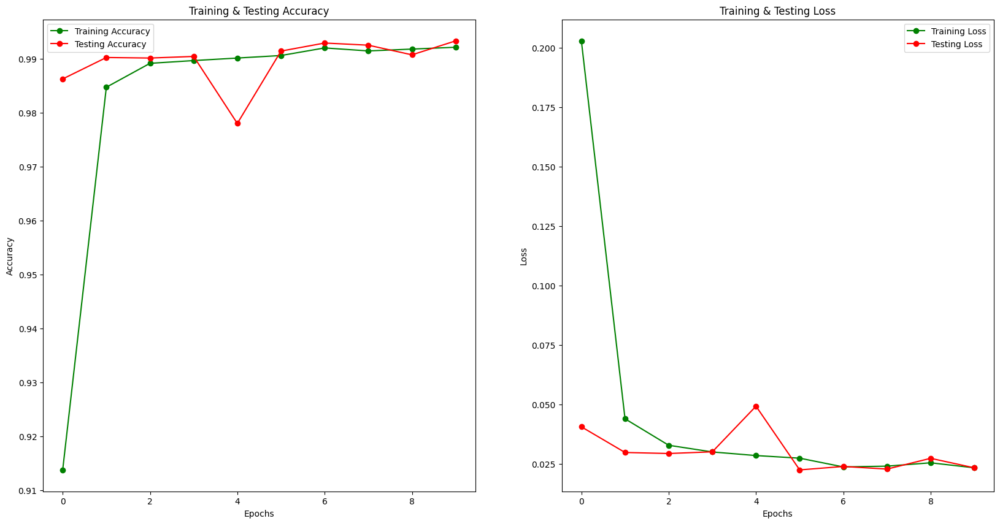

In [ ]:
print_graphs(history_lstm_w2v)

In [ ]:
predicted_categories_lstm_w2v = [1 * (x[0]>=0.5) for x in scores_lstm_w2v]
cm_lstm_w2v  = confusion_matrix(y_test,predicted_categories_lstm_w2v)
#cm_lstm_w2v  = pd.DataFrame(cm_lstm_w2v , index = ['Fake','Original'] , columns = ['Fake','Original'])


Text(95.72222222222221, 0.5, 'Actual')

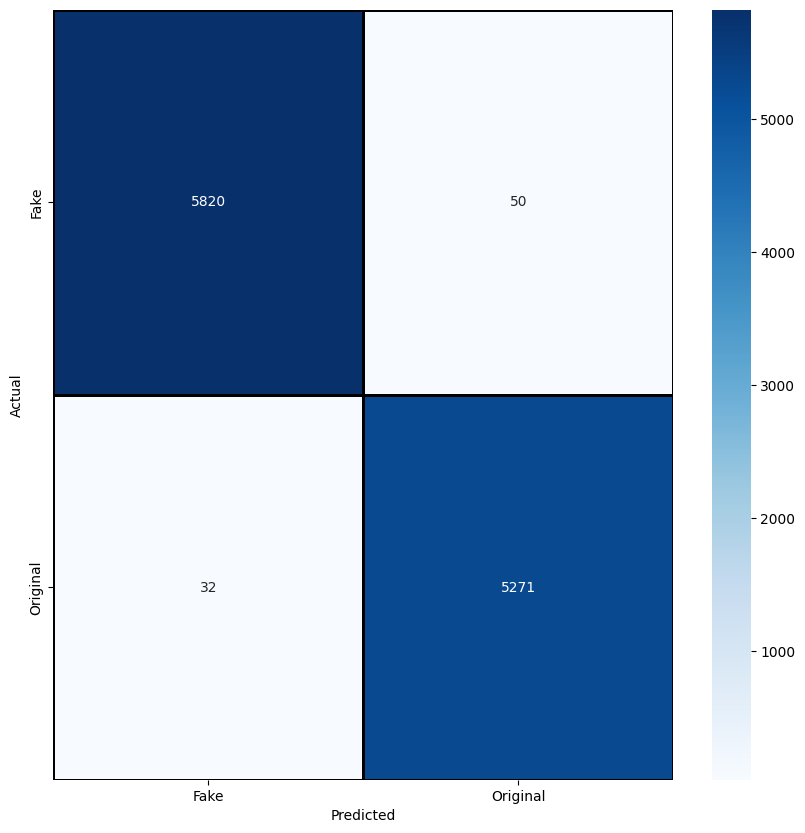

In [ ]:
plt.figure(figsize = (10,10))
sns.heatmap(cm_lstm_w2v,cmap= "Blues", linecolor = 'black' , linewidth = 1 , annot = True, fmt='' , xticklabels = ['Fake','Original'] , yticklabels = ['Fake','Original'])
plt.xlabel("Predicted")
plt.ylabel("Actual")

In [ ]:
scores_model.append({'Model': 'LSTM with w2v','AUC_Score': roc_auc(scores_lstm_w2v,y_test)})

In [ ]:
scores_model

[{'Model': 'SimpleRNN', 'AUC_Score': 0.978083554003857},
 {'Model': 'LSTM', 'AUC_Score': 0.9994994636766628},
 {'Model': 'RNN with w2v', 'AUC_Score': 0.9708290540438522},
 {'Model': 'LSTM with w2v', 'AUC_Score': 0.9994892158692597}]

De todos os modelos testados, vimos que tivemos um bom resultado com o LSTM utilizando o word2vector, tendo um resultado acima do mesmo modelos sem nossa matriz criada.

Como o score já está muito alto, não vale a pena pelo poder de processamento e o tempo gasto para tentar melhorar o projeto.